In [1]:
# section 1 load all the necessary modules and packages
import glob
import time
import geopandas as gpd
import netCDF4 as nc4
import numpy as np
import pandas as pd
import xarray as xr
from shapely.geometry import Polygon
import matplotlib  as mpl
font = {'family' : 'Times New Roman',
            'weight' : 'bold',
            'size'   : 40}
mpl.rc('font', **font)
# not neccessary for the function but for visualziation
import matplotlib.pyplot as plt
import warnings
import sys
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import contextily as ctx


def NSE(s,o):
    """
    Created on Thu Jan 20 15:36:37 2011
    @ author:                  Sat Kumar Tomer
    @ author's webpage:        http://civil.iisc.ernet.in/~satkumar/
    @ author's email id:       satkumartomer@gmail.com
    @ author's website:        www.ambhas.com

    Nash Sutcliffe efficiency coefficient
    input:
        s: simulated [time]
        o: observed [time]
    output:
        ns: Nash Sutcliffe efficient coefficient
    """
    s,o = filter_nan(s,o)
    return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)

def filter_nan(s,o):
    """
    Created on Thu Jan 20 15:36:37 2011
    @ author:                  Sat Kumar Tomer
    @ author's webpage:        http://civil.iisc.ernet.in/~satkumar/
    @ author's email id:       satkumartomer@gmail.com
    @ author's website:        www.ambhas.com

    this functions removed the data  from simulated and observed data
    whereever the observed data contains nan

    this is used by all other functions, otherwise they will produce nan as
    output
    """
    data = np.array([s.flatten(),o.flatten()])
    data = np.transpose(data)
    data = data[~np.isnan(data).any(1)]
    return data[:,0],data[:,1]



/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(


In [2]:
riv = gpd.read_file('/Volumes/F:/hydrography/HDMA/processed/hdma_global_stream.shp')
riv['flow_acc'] = riv['flow_acc']*10**6 # km2 to m2
riv['mid_x'] = riv.centroid.x
riv['mid_y'] = riv.centroid.y
# print(riv)


/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/381629310.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  riv['mid_x'] = riv.centroid.x
/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/381629310.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  riv['mid_y'] = riv.centroid.y


In [2]:
# read the netcdf files and merge them into one netcdf

file_names = glob.glob('/Users/shg096/Downloads/GRDC_discharge_Data/*.nc')

print(file_names)

datasets = [xr.open_dataset(file_name) for file_name in file_names]

merged_dataset = xr.merge(datasets)

merged_dataset['area'][:] = merged_dataset['area'][:] * 1000000 # m2 km2


['/Users/shg096/Downloads/GRDC_discharge_Data/2023-04-28_14-33.nc', '/Users/shg096/Downloads/GRDC_discharge_Data/2023-04-28_14-42.nc', '/Users/shg096/Downloads/GRDC_discharge_Data/2023-04-28_14-47.nc']


In [4]:
# loop over the stations in the netcdf file


m = 0

empty_array = np.array([])

for id_value in merged_dataset['id'].values:
    
    merged_dataset_slice = merged_dataset.sel(id = id_value)
    
    
    # get the x and y of the 
    x = merged_dataset_slice.geo_x.values
    y = merged_dataset_slice.geo_y.values
    area = merged_dataset_slice.area.values
    name = merged_dataset_slice.station_name.values
    
    # search for flow accumulation from the river and find the asscoaited river segment
    # cut the river netwrok to possible location of gauges given 5 degree of buffer
    x_up   = x + 5
    x_down = x - 5
    y_up   = y + 5
    y_down = y - 5
    
    # 
    riv_slice = riv[riv['mid_x']<x_up]
    riv_slice = riv_slice[riv_slice['mid_x']>x_down]
    riv_slice = riv_slice[riv_slice['mid_y']<y_up]
    riv_slice = riv_slice[riv_slice['mid_y']>y_down]
    
    
    #riv_slice.plot()
    riv_slice['dist'] = ((x-riv_slice.mid_x)**2 + (y-riv_slice.mid_y)**2)**0.5
    riv_slice['area_diff'] = abs(riv_slice['flow_acc']-area)
    
    
    riv_slice = riv_slice.sort_values('dist')
    #print(riv_slice)
    riv_slice ['dist_rank'] = np.arange(len(riv_slice))+1
    
    riv_slice = riv_slice.sort_values('area_diff')
    #print(riv_slice)
    riv_slice ['area_diff_rank'] = np.arange(len(riv_slice))+1
    
    riv_slice ['rank'] = riv_slice ['dist_rank'] + riv_slice ['area_diff_rank']
    riv_slice = riv_slice.sort_values('rank')
    #print(riv_slice)
    
    # 
    if not riv_slice.empty:
        empty_array = np.append(empty_array, riv_slice['seg_id'].iloc[0])
        print (m, x, y, area, name, riv_slice['seg_id'].iloc[0])
    else:
        empty_array = np.append(empty_array, -999)
        print (m, x, y, area, name, -999)
    
    m = m + 1


#
new_var = xr.DataArray(empty_array, dims=('id'))
merged_dataset = merged_dataset.assign(HDMA_seg_id=new_var)
merged_dataset



0 0.27 36.02 43750000000.0 SIDI BELATAR 2060096
1 2.82 36.67 1912000000.0 FER A CHEVAL 2041671
2 4.6 36.42 4309000000.0 SIDI YAHIA 2048911
3 7.72 36.45 552000000.0 BOUCHEGOUF 2021426
4 -1.45 35.15 7245000000.0 PIERRE DU CHAT 2052528
5 -1.22 35.07 1118000000.0 BENSEKRANE 2032964
6 -11.28 14.45 157400000000.0 KAYES 2062185
7 -11.2024 14.49434 25000000000.0 KABATE 2058674
8 -11.38 13.23 15000000000.0 GOURBASSY 2056344
9 -11.13 13.83 127000000000.0 GALOUGO 2062136
10 -9.23 13.36 84400000000.0 OUALIA 2061006
11 -9.8854 13.5724 58000000000.0 SIRAMAKANA 2061006
12 -9.88 13.45 16000000000.0 TOUKOTO 2056609
13 -10.48 13.14 33000000000.0 DIBIA 2059377
14 -11.23 12.31 9300000000.0 FADOUGOU 2053367
15 -10.2 12.15 15500000000.0 DAKA SAYDOU 2056964
16 -10.16 12.33 21700000000.0 BAFING MAKANA 2057814
17 -8.55 11.15 23300000000.0 GUELELINKORO 2058189
18 -8.6667 11.6833 71750000000.0 BANANKORO 2061131
19 -8.23 11.97 35300000000.0 GOUALA 2059297
20 -8.17 11.58 34200000000.0 SELINGUE 2059297
21 -8.2 11.1

149 18.740278 -33.46389 246000000.0 MALMESBURY (27711312) 2002205
150 18.699722 -33.705 473000000.0 KLIPPHEUWEL (27711313) 2017207
151 18.616667 -33.72278 1311000000.0 ADDERLEY 2038106
152 18.361944 -33.581944 23000000.0 BUFFELS RIVER (27711318) 2001422
153 18.984167 -33.808613 726000000.0 FARM 187 (27711407) 2027092
154 18.991112 -33.70778 628000000.0 DALJOSAFAT 2024069
155 19.074444 -33.31389 395000000.0 NIEUWKLOOF (27711408) 2013162
156 18.862778 -33.130833 2936000000.0 DRIEHEUVELS 2045963
157 19.100279 -33.352222 35000000.0 WATERVALSBERGE (27711412) 2002205
158 19.149445 -33.379444 27000000.0 WATERVALSBERGE (27711411) 2002205
159 19.159166 -33.388058 10000000.0 KNOLVLEI BOS RES. (27711410) 2002205
160 19.171389 -33.390556 5000000.0 KNOLVLEI BOS RES. (27711409) 2002205
161 19.034721 -33.8275 3000000.0 ZACHARIASHOEK (27711414) 2001982
162 19.027779 -33.82639 2000000.0 ZACHARIASHOEK (27711417) 2001982
163 19.05889 -33.821945 3000000.0 LOWER ZACHARIASHOEK (27711416) 2001982
164 19.0611

279 26.670834 -32.55361 77000000.0 GREY KIRK (27673119) 2001462
280 27.382778 -32.87528 407000000.0 KING WILLIAMS TOWN (27672205) 2014351
281 27.293333 -32.731667 29000000.0 PIRIE MAIN FOR. RES. (27672201) 2000472
282 29.828611 -30.734167 728000000.0 GUNDRIFT (27663201) 2027479
283 27.855278 -32.801666 509000000.0 OUTSPAN (27672101) 2019292
284 27.6225 -32.575558 490000000.0 HAMMERHEAD (27711202) 2018068
285 27.365833 -32.579166 91000000.0 STUTTERHEIM (27711201) 2001462
286 27.523611 -32.51611 216000000.0 FORKROAD (27711203) 2001462
287 29.470556 -29.776943 545000000.0 FP 1609030 THE BANKS (27663104) 2019791
288 29.929083 -30.247334 3586000000.0 BEZWENI 2047006
289 28.01806 -32.51639 18795000000.0 AREA 8 SPRINGS B 2057302
290 29.538889 -29.747223 143000000.0 COXHILL (27663103) 2000449
291 29.851667 -29.988056 97000000.0 DRONKVLEI (27663105) 2000449
292 29.894444 -30.40361 873000000.0 NOOITGEDACHT (27663102) 2029745
293 26.789722 -32.050278 1414000000.0 CATHCARTS GIFT (27711504) 2037447

406 31.63745 -23.83532 12938000000.0 ENGELHARDT DAM KRUGER NATIONAL PARK 2055738
407 27.479168 -24.1594 1054000000.0 HAARLEM EAST (27546004) 2033311
408 30.528055 -22.907778 104000000.0 CHIBASE (27541002) 2001513
409 30.538889 -22.770832 326000000.0 TENGWE (27541004) 2007278
410 30.389444 -23.112223 918000000.0 WELTEVREDEN (27541001) 2030071
411 30.889257 -22.768513 1758000000.0 MHINGA 2039548
412 27.76111 -25.776943 1171000000.0 SCHEERPOORT 2034472
413 28.089722 -24.282778 1801000000.0 ZANDRIVIER (27546002) 2040717
414 27.973057 -24.216389 499000000.0 DOORNSPRUIT (27546008) 2019677
415 27.908056 -23.76361 399000000.0 BLAKENEY (27546007) 2012730
416 31.077833 -22.437735 1776000000.0 KRUGER NATIONAL PARK 2040970
417 27.973589 -22.950762 98160000000.0 BOTSWANA OXENHAM RANCH 2061656
418 28.003922 -22.934765 98240000000.0 BOTSWANA 2061671
419 27.841944 -25.991388 149000000.0 ZWARTKOP (27547050) 2000957
420 27.90983 -25.81056 2551000000.0 KALKHEUWEL 2044000
421 27.475834 -25.809168 88000000

544 15.666667 -21.433332 3810000000.0 ETEMBA (64733002) 2047784
545 16.2 -21.3 1320000000.0 OMBURO (64733003) 2037171
546 15.616667 -21.816668 4010000000.0 AMEIB (64732004) 2048603
547 15.566667 -21.866667 554000000.0 DAWIB (64732005) 2021284
548 16.416666 -22.266666 8860000000.0 WESTFALENHOF (64732003) 2053831
549 14.966666 -23.5 11700000000.0 GOBABEB 2055160
550 15.8 -23.266666 6520000000.0 SCHLESIEN WEIR (64731001) 2051823
551 16.383333 -22.966667 1918000000.0 US (64731002) 2041500
552 14.65 -23.166666 14700000000.0 ROOIBANK (64731011) 2056465
553 16.166666 -23.216667 20100000.0 KOS WEIR (64731008) 2000820
554 15.916667 -22.916666 81600000.0 TWEESPRUIT (64731007) 2000820
555 16.566668 -22.866667 17300000.0 WESTENDE (64731006) 2000820
556 16.516666 -22.8 266000000.0 WASSERVALLEI (64731004) 2002323
557 16.6 -22.716667 275000000.0 STANCO (64731003) 2002953
558 15.766666 -23.466667 2490000000.0 GREYLINGSHOF 2045500
559 17.066668 -22.516666 49300000.0 MONRAVIA (64732002) 2000701
560 16.6

680 33.533333 -9.166667 222000000.0 KIWIRA VILLAGE (55312233) 2003130
681 33.55 -9.266667 698000000.0 NATURAL BRIDGE (55312234) 2025497
682 33.88333 -9.55 696000000.0 MWAYA (55312232) 2026211
683 33.18722 -9.416667 370000000.0 KUSHISAKWA (55312251) 2011557
684 34.033333 -9.347222 377000000.0 HUMAGE (55312236) 2012167
685 33.92 -9.32 1425000000.0 IPINGA 2038714
686 34.8 -10.441667 14161000000.0 KIKONGE (55312212) 2056304
687 35.191666 -9.941667 2007000000.0 MASIGIRA CONFLUENCE (55312211) 2041634
688 35.141666 -10.301111 5772000000.0 NEW ROAD BRIDGE (55312214) 2050997
689 34.8 -9.883333 884000000.0 MABOGA (55312217) 2030337
690 34.966667 -10.525 548000000.0 ROAD BRIDGE (55312218) 2021355
691 35.016666 -10.558333 369000000.0 NAMBUNJU ROAD BRIDGE (55312215) 2012088
692 -5.3 35.52 110000000.0 EMSA 2000264
693 -3.29 34.9 1353000000.0 DAR DRIOUCH 2037134
694 -4.9 32.97 1673000000.0 ZEIDA 2038786
695 -4.9 32.75 960000000.0 ANSEGMIR 2030465
696 -8.1 31.08 848000000.0 NKOURIS 2029532
697 -6.23 3

833 30.516666 -18.666668 1054000000.0 NGEZI DAM U/S G/W (63341006) 2032158
834 30.616667 -17.616667 578000000.0 MANYAME DAM U/S G/W (63323083) 2022744
835 31.066668 -18.066668 512000000.0 EDINBURGH G/W (63323023) 2019396
836 32.033333 -17.583332 285000000.0 PIRIMANGWE FLUME (63315556) 2004423
837 31.15 -17.85 22000000.0 CLEVELAND DAM D/S G/W (63323028) 2002588
838 31.15 -17.85 170000000.0 HARAVA DAM U/S G/W (63323082) 2002588
839 31.15 -18.0 491000000.0 HARAVA DAM U/S (63323081) 2018525
840 32.15 -18.016666 249000000.0 NYAGADZI WEYA TTL G/W (63315247) 2002895
841 32.2 -18.2 214000000.0 MWARAZI DAM U/S G/W (63315246) 2002895
842 32.216667 -18.216667 61000000.0 MWARAZI DAM U/S G/W (63315255) 2002895
843 31.6 -17.633333 1194000000.0 MUTOKO ROAD BRIDGE (63315506) 2035407
844 31.5 -17.166668 218000000.0 EBEN DAM U/S G/W (63315542) 2000722
845 30.95 -17.25 378000000.0 MWENJE DAM U/S FLUME (63315548) 2012938
846 30.983334 -17.166668 67000000.0 MWENJE DAM U/S G/W (63315549) 2000722
847 30.9833

971 39.33 7.0 200000000.0 NEAR ADABA BRIDGE 2000101
972 37.77 8.25 1866000000.0 NEAR WOLKITE 2040318
973 37.9 8.1 109000000.0 NEAR ENDEBER 2000193
974 37.92 8.13 65000000.0 NEAR ENDEBER 2000193
975 38.13 5.92 587000000.0 DIMMA TORE 2022303
976 23.25 -16.116667 284538000000.0 SENANGA (60370001) 2062649
977 23.2333 -14.3833 206531000000.0 LUKULU (60370030) 2062489
978 24.25 -11.1333 764000000.0 KALENI HILL ROAD BRIDGE 2027492
979 23.15 -13.3333 3354000000.0 CHIVATA VILLAGE 2046729
980 24.25 -11.2333 122000000.0 IKELENGE 2001647
981 24.2166 -13.6 42740000000.0 KABOMPO PONTOON (60380051) 2059924
982 24.3333 -13.4333 -999000000.0 MANYINGA 2001643
983 24.4166 -11.5333 632000000.0 SACHIBONDO 2023913
984 26.25 -12.4 1780000000.0 MUTANDA MISSION (60334501) 2040583
985 25.866667 -13.45 1125000000.0 BELOW KASEMPA (60334620) 2034743
986 26.483334 -17.216667 3038000000.0 KALOMO DAM SITE (60352030) 2046131
987 27.16666 -11.7833 433000000.0 KIPUSHI ROAD (60334005) 2016169
988 28.2166 -15.8166 1533510

1112 1.2 10.72 836000000.0 TIELE 2029500
1113 1.67 6.92 21575000000.0 ATHIEME 2057930
1114 2.67 9.2 10326000000.0 PONT DE BETEROU 2054474
1115 2.03 7.53 6950000000.0 ATCHERIGBE 2053445
1116 2.42 8.0 23600000000.0 PONT DE SAVE 2058178
1117 2.72 8.25 9600000000.0 KABOUA 2054094
1118 2.33 7.12 8210000000.0 DOME 2053445
1119 2.43 7.17 37980000000.0 SAGON 2059662
1120 2.45 6.9 46990000000.0 BONOU 2060280
1121 2.4 6.5 -999000000.0 SO-AWA 2001386
1122 2.049091 10.86187 -999000000.0 KEROU 2000057
1123 2.18 11.4 5670000000.0 KOMPONGOU 2051204
1124 2.65 11.23 8170000000.0 ROUTE KANDI-BANIKOARA AMONT 2053340
1125 2.65 11.23 8170000000.0 ROUTE KANDI-BANIKOARA AVAL 2053340
1126 2.73 12.35 10500000000.0 BAROU 2054688
1127 3.05 11.05 1250000000.0 KOUTAKOUKROU 2035649
1128 3.3833 11.8667 1000000000000.0 MALANVILLE 2063326
1129 3.25 10.98 8298000000.0 RTE KANDI-SEGBANA AVAL 2053472
1130 3.25 10.98 8298000000.0 RTE KANDI-SEGBANA AMONT 2053472
1131 3.33 11.75 13410000000.0 COUBERI 2055913
1132 16.35 6.33

1267 55.65421 -20.978537 -999000000.0 PONTE DE L'ESCALIER -999
1268 55.6667 -21.0333 -999000000.0 ABONDANCE -999
1269 55.6833 -21.0333 -999000000.0 BETHLEEM -999
1270 55.2776 -20.957312 -999000000.0 CAP LEBOT -999
1271 55.74804 -21.12405 -999000000.0 GALERIE EDF -999
1272 55.674927 -21.00341 -999000000.0 CONFLUENT BRAS PANON -999
1273 55.675003 -21.002874 -999000000.0 AVAL RADIER PANIANDY -999
1274 55.5667 -20.9667 -999000000.0 CONFLUENT RIV. STE. SUZANNE -999
1275 55.45548 -21.285 -999000000.0 GALERIE -999
1276 55.6115 -21.26464 -999000000.0 CONFLUENT RIV. DES REMPARTS -999
1277 33.134956 -9.536632 192000000.0 DAVID KAMEME (65312205) 2000051
1278 34.517223 -14.400833 138000000.0 MUA - LIVULEZI (65312902) 2001930
1279 34.539165 -14.441111 477000000.0 KHWEKHWELELE (65312903) 2018603
1280 34.516666 -14.25 34000000.0 MUA MISSION 2001930
1281 34.580555 -14.792222 1890000.0 THOBOLA (65312907) 2001136
1282 34.62278 -14.809722 7030000.0 GUMBU (65312118) 2002331
1283 34.92 -15.39 133700000000.

1416 77.16 43.33 444000000.0 TALGAR 1018677
1417 79.06 43.43 7370000000.0 SARYTOGAI 1059568
1418 78.97 44.8 484000000.0 TEKELI 1021171
1419 67.0 48.05 93800000.0 ZHEZDY 1000473
1420 67.0 48.05 2410000000.0 DZEZDY 1049737
1421 67.05 44.05 219000000000.0 TYUMEN-ARYK 1071346
1422 51.28 50.85 190000000000.0 KUSHUM 4037203
1423 74.38 35.92 12950000000.0 DANYOUR BRIDGE 1063092
1424 72.48 34.48 598000000.0 NEAR DAGGAR 1026768
1425 73.08 34.33 1057000000.0 NEAR PHULRA 1038546
1426 72.33 33.13 6475000000.0 DHOK PATHAN 1059681
1427 72.43 33.75 1800000000.0 SANJWAL 1047026
1428 72.87 33.45 241000000.0 NEAR CHAHAN 1000644
1429 72.25 33.75 2056000000.0 GURRIALA 1047026
1430 72.9 33.45 777000000.0 NEAR KHANPUR 1030936
1431 73.3 33.39 326000000.0 CHIRAH 1008793
1432 73.1 33.55 1684000000.0 NEAR RAWALPINDI 1046154
1433 67.5 30.33 1321000000.0 CHAFFAR RIFT 1041652
1434 73.05 34.33 1111000000.0 NEAR PALOTE 1038546
1435 73.88 33.48 3238000000.0 NEAR KOTLI 1052909
1436 73.83 34.15 13598000000.0 CHINARI 10

1575 141.89 44.92 4685000000.0 MARUYAMA 1056739
1576 142.08 44.8 4029000000.0 PONPIRA 1055452
1577 142.34 44.48 2899000000.0 BIFUKA-BASHI 1054158
1578 142.41 44.38 1719200000.0 NAYORO-OHASHI 1045990
1579 141.54556 43.11972 12697000000.0 ISHIKARI-OHASHI 1063211
1580 141.69333 43.33 9306000000.0 TSUKIGATA 1061478
1581 141.88722 43.554443 5711000000.0 HASHIMOTOCHO 1057968
1582 142.13667 43.715557 3558000000.0 OSAMUNAI 1054367
1583 142.27 43.77 3378600200.0 INO 1054367
1584 142.05 43.56 2531000000.0 AKABIRA 1050951
1585 141.69 43.09 1116000000.0 KIYOHORO-BASHI 1039759
1586 140.46 42.81 1402199900.0 NAKOMA 1040518
1587 141.94 42.57 1228000000.0 MUKAWA 1040686
1588 142.15 42.58 1253000000.0 BIRATORI 1040686
1589 144.13667 43.895 1120400000.0 HONGO 1036591
1590 143.92 43.8 1394199900.0 KITAMI 1042531
1591 143.55 44.1 1334800000.0 KAISEI 1042531
1592 143.52 42.8 8277000000.0 MOIWA 1060617
1593 143.21 42.93 2529300000.0 OBIHIRO 1051746
1594 142.93 43.06 803800000.0 KYOEI-BASHI 1032978
1595 143.

1747 151.29 60.18 682000000.0 KOLYMA ROAD (79TH KM) 1030026
1748 157.62196 53.18429 649000000.0 DAL'NIY 1028249
1749 158.31 54.43 3760000000.0 VERKHNE-KAMCHATSK 1054492
1750 158.3833 53.1833 4750000000.0 ELIZOVO (YELIZOVO) 1056882
1751 161.67 56.27 51600000000.0 BOLSHIE SCHEKI 1068434
1752 114.17 57.82 186000000000.0 BODAIBO 1071014
1753 130.9 57.77 108000000000.0 CHULBU 1069998
1754 116.02 58.42 4790000000.0 SVETLY 1056748
1755 118.6563 62.0313 1290000000.0 KEMPENDAI 1040679
1756 124.75 55.98 613000000.0 NAGORNY 1026972
1757 127.39 70.68 2430000000000.0 KYUSYUR (KUSUR) 1073013
1758 108.32 57.78 140000000000.0 ZMEINOVO 1070495
1759 113.17 59.73 440000000000.0 KRESTOVSKOYE 1072029
1760 120.7 60.48 770000000000.0 SOLYANKA 1072495
1761 129.6 61.83 897000000000.0 TABAGA 1072632
1762 126.8 72.37 2460000000000.0 STOLB 1073034
1763 127.95 70.36 1000000000.0 EBETEM 1037115
1764 129.03 62.06 3550000000.0 VTOROY STANOK 1051969
1765 132.02 63.32 696000000000.0 VERKHOYANSKIY PEREVOZ 1072381
1766 1

1909 103.42926 15.141556 -999000000.0 BAN KHAI (E23) 1001367
1910 103.7517 16.1933 39700000000.0 BAN BUNG KHA 1067828
1911 103.0717 16.2533 28800000000.0 KOSUM PHISAI 1066757
1912 101.665 16.11 1440000000.0 BAN NONG TUM 1043412
1913 102.03 15.9583 326000000.0 BAN TAO TON 1009134
1914 101.9483 16.8467 945000000.0 BAN PHA NOK KHAO 1035558
1915 102.217 16.855 -999000000.0 PONG NEED 1000218
1916 102.24 16.9117 815000000.0 BAN KHOK LAM 1031907
1917 102.6033 16.9167 68000000.0 BAN HUA KHUA 1000218
1918 102.3533 16.6783 303000000.0 PHU WIANG (PHU MIANG) 1006822
1919 102.1317 16.385 2000000000.0 BAN PHROM THAI 1047000
1920 104.8617 15.2217 104000000000.0 UBON 1069918
1921 105.16 14.69 1410000000.0 BAN FANG PHE 1043542
1922 105.08 14.8983 3340000000.0 DEJ UDOM 1053108
1923 105.2483 15.24 116000000000.0 KAENG SAPHU TAI (DOWNSTREAM) 1070151
1924 105.47 15.2867 117000000000.0 BAN HUA HEO 1070161
1925 103.6783 15.3233 34800000000.0 THA TUM 1067367
1926 103.3833 15.3333 28400000000.0 CHUMPHON BURI 1

2068 -71.4606 -31.5836 6233600000.0 AGUAS ARRIBA ESTERO LA CANELA 5029189
2069 -71.2658 -31.6881 3693600000.0 PUENTE NEGRO 5027088
2070 -71.2547 -31.6647 2028800000.0 EL PERAL 5023610
2071 -70.7158 -31.6958 243900000.0 LA PALMILLA 5000289
2072 -71.0747 -31.9481 129000000.0 EL ROMERO 5000289
2073 -71.57 -30.63 11343000000.0 PANAMERICANA 5031356
2074 -70.4389 -30.7436 155300000.0 OJOS DE AGUA 5000137
2075 -71.2514 -29.8931 9400600000.0 LA SERENA 5030660
2076 -70.5867 -29.9953 5669700000.0 ALGARROBAL 5029186
2077 -70.52 -28.72 7187000000.0 ALGODONES 5029832
2078 -71.0064 -28.5119 9327300000.0 PUENTE NICOLASA 5030770
2079 -70.6464 -28.6719 7383899600.0 SANTA JUANA 5029832
2080 -70.4139 -29.1094 2434300200.0 EL CORRAL 5025446
2081 -70.2481 -28.9414 3044300000.0 ANGOSTURA PINTE 5025915
2082 -69.55 -21.65 -999000000.0 QUILLAGUA 5000897
2083 -70.0536 -21.4247 52243698000.0 DESEMBOCADURA 5033959
2084 -69.565 -22.3431 16418699000.0 D. J. SAN SALVADOR-(M. ELENA) 5032301
2085 -68.9889 -22.5061 107

2221 -59.3539 -15.2153 2990000000.0 PONTES E LACERDA 5025873
2222 -62.1528 -11.9306 1430000000.0 CACHOEIRA DO CACHIMBO 5021342
2223 -64.8272 -0.4817 279945000000.0 SERRINHA 5036129
2224 -66.8022 -0.2006 194462000000.0 CURICURIARI 5035850
2225 -67.3128 0.3717 110862000000.0 SAO FELIPE 5035516
2226 -66.8525 1.2153 61781000000.0 CUCUI 5035029
2227 -67.5947 1.0744 22282000000.0 MISSAO ICANA 5032984
2228 -68.6858 1.3392 4708000000.0 LOURO POCO 5027953
2229 -69.3781 0.2094 4198000000.0 CUNURI 5027677
2230 -69.785 0.2494 1617000000.0 PARI CACHOEIRA 5021756
2231 -67.0092 -0.2461 10228000000.0 JUSTANTE DA CACHOEIRA DO CAJU 5031131
2232 -62.6219 0.8842 14756000000.0 POSTO AJURICABA 5032029
2233 -60.4661 0.5178 8639000000.0 FAZENDA SAO JOSE 5030322
2234 -61.1236 1.8214 124980000000.0 CARACARAI 5035532
2235 -60.52 -0.8586 6589000000.0 BASE ALALAU 5029390
2236 -60.5 5.03 3340000000.0 FAZENDA BANDEIRA BRANCA-VIETNA 5026403
2237 -60.4706 4.6306 3075000000.0 FAZENDA BANDEIRA BRANCA 5026221
2238 -60.52

2367 -55.3667 -10.1833 17278000000.0 ESTRADA CUIABA - SANTAREM 5032375
2368 -54.8858 -9.8172 1010000000.0 CACHIMBO 5018377
2369 -54.9081 -9.3422 465000000.0 BASE DO CACHIMBO 5009771
2370 -58.0364 -11.7644 24700000000.0 FAZENDA TOMBADOR 5033245
2371 -57.4228 -11.5364 37100000000.0 PORTO DOS GAUCHOS 5034041
2372 -56.6103 -13.3844 14800000000.0 FAZENDA RIACHO DOCE (EX TAUA) 5031972
2373 -58.2833 -13.0333 4370000000.0 UTIARITI 5027823
2374 -51.5675 -3.7314 24575000000.0 FAZENDA CIPAUBA 5033274
2375 -52.2122 -3.2147 446203000000.0 ALTAMIRA 5036407
2376 -51.9953 -6.7358 206863000000.0 BOA SORTE 5035913
2377 -54.0125 -4.5278 123827000000.0 PEDRA DO O 5035506
2378 -54.2456 -5.6967 60058000000.0 LARANJEIRAS 5034738
2379 -51.7736 -6.7453 43030000000.0 BOA ESPERANCA 5034278
2380 -54.5208 -5.65 35213000000.0 CAJUEIRO 5033934
2381 -54.82 -6.57 20803000000.0 BOCA DO INFERNO 5032884
2382 -54.95 -8.76667 1631000000.0 CACHOEIRA DA LUZ 5021493
2383 -54.4453 -13.1408 3860000000.0 FAZENDA ITAGUACU 5027194

2510 -39.3811 -5.595 5200000000.0 SENADOR POMPEU 5028499
2511 -38.4464 -5.1219 17900000000.0 MORADA NOVA II 5032499
2512 -38.45 -5.12 15317000000.0 MORADA NOVA 5031943
2513 -39.5086 -6.5578 3700000000.0 SITIO POCO DANTAS 5026803
2514 -39.3 -6.36667 21770000000.0 IGUATU 5032819
2515 -38.1978 -5.2275 48200000000.0 PEIXE GORDO 5034466
2516 -38.96667 -6.66667 8900000000.0 PONTE PATOS 5030568
2517 -38.3608 -4.5006 2000000000.0 CRISTAIS 5022856
2518 -37.6842 -5.5933 6480000000.0 PEDRA DE ABELHAS (BREJO APODI) 5029376
2519 -37.2553 -5.6436 1520000000.0 UPANEMA 5020946
2520 -37.9281 -7.2044 4710000000.0 PIANCO 5028094
2521 -38.2008 -6.1114 2050000000.0 PAU DOS FERROS 5023790
2522 -38.8672 -6.4067 12000000000.0 ICO 5031410
2523 -37.3525 -6.3781 21350000000.0 JARDIM DE PIRANHAS 5032943
2524 -38.3808 -6.9192 1050000000.0 VARZEA GRANDE 5018345
2525 -38.48333 -7.11667 475000000.0 SAO JOSE DE PIRANHAS 5011117
2526 -38.0 -7.07 910000000.0 MAE D'AGUA 5017394
2527 -35.4167 -5.6333 2510000000.0 CEARA-MI

2653 -54.43306 -25.68306 67317000000.0 SALTO CATARATAS 5034942
2654 -50.87833 -26.38389 2614000000.0 SANTA CRUZ DO TIMBO 5025344
2655 -49.88944 -25.54806 3662000000.0 PORTO AMAZONAS 5027215
2656 -51.08028 -26.22806 24211000000.0 UNIAO DA VITORIA 5033158
2657 -53.93306 -25.56667 65680000000.0 PORTO CAPANEMA 5034871
2658 -49.80111 -26.10972 3379000000.0 RIO NEGRO 5026423
2659 -57.4372 -19.6006 363500000000.0 PORTO ESPERANCA (DNOS) 5036353
2660 -57.7022 -16.0758 32774000000.0 CACERES (DNPVN) 5033815
2661 -56.2 -19.56667 14770000000.0 FAZENDA RIO NEGRO 5032065
2662 -56.0086 -17.2017 17150000000.0 SAO JERONIMO 5031391
2663 -54.1511 -17.2078 2872000000.0 ITIQUIRA 5025465
2664 -56.5422 -16.315 2660000000.0 PERTO DE POCONE 5025358
2665 -56.965 -17.6233 102750000000.0 PORTO DO ALEGRE 5035359
2666 -56.3756 -16.5119 -999000000.0 PORTO CERCADO (RETIRO BIGUACAL) 5001440
2667 -55.2064 -16.6081 21800000000.0 ACIMA DO CORREGO GRANDE 5033016
2668 -56.2236 -16.9253 -999000000.0 SAO JOSE DO BORIREU 50014

2793 -134.5728 58.4297 220409000.0 NEAR AUKE BAY, AK 3000085
2794 -133.7 58.54 17094000000.0 NEAR JUNEAU, AK 3040366
2795 -97.0281 47.9275 77959000000.0 GRAND FORKS, N.D. 3043380
2796 -97.1476 48.5722 90132000000.0 DRAYTON, ND 3043609
2797 -96.8437 47.3519 56462000000.0 HALSTAD, MN 3042902
2798 -96.7837 46.8611 17612000000.0 FARGO, ND 3040490
2799 -96.7959 46.6597 11137000000.0 HICKSON, ND 3039006
2800 -96.5948 46.2652 10385901000.0 WAHPETON, ND 3038797
2801 -96.24 47.26 2419060000.0 TWIN VALLEY, MN 3032358
2802 -97.06 47.4 3115770000.0 HILLSBORO, ND 3033533
2803 -97.37 48.28 1916599900.0 MINTO, ND 3029198
2804 -97.41 48.42 1800050000.0 GRAFTON, ND 3029039
2805 -96.7837 46.468 5387200000.0 NEAR ABERCROMBIE, ND 3035827
2806 -96.2739 47.8875 3574200000.0 RED LAKE FALLS, MN 3034017
2807 -96.809 47.8003 14711200000.0 FISHER, MN 3039916
2808 -96.6095 47.7755 13649299000.0 CROOKSTON, MN 3039773
2809 -96.5792 46.1522 4869200400.0 NEAR DORAN, MN 3035691
2810 -97.0526 46.9052 3833199900.0 BELOW

2927 -113.8953 45.1836 9738401000.0 SALMON, ID 3038553
2928 -114.7337 44.2682 2077200000.0 BELOW YANKEE FORK NEAR CLAYTON, ID 3030655
2929 -114.5964 45.2936 18983840000.0 AT MOUTH NEAR SHOUP, ID (MIDDLE FORK) 3040275
2930 -113.6401 44.9399 2318100200.0 NEAR LEMHI, ID 3030655
2931 -115.7204 42.771 6811700000.0 NEAR HOT SPRING, ID 3036999
2932 -115.6745 41.9332 989400000.0 ROWLAND, NV 3023325
2933 -114.9311 44.2225 380730020.0 STANLEY, ID 3009045
2934 -114.0469 44.525 2141899900.0 ELLIS, ID 3030655
2935 -116.9252 44.0424 8391599600.0 NEAR PAYETTE, ID 3038096
2936 -116.4426 43.9304 6941200400.0 NEAR EMMETT, ID 3037650
2937 -116.1968 43.9424 5775700000.0 NEAR HORSESHOE BEND, ID 3036515
2938 -116.1079 44.1138 2416500000.0 NEAR BANKS, ID 3031476
2939 -116.0468 44.5249 1621339900.0 CASCADE, ID 3027983
2940 -116.1187 44.9074 372960000.0 MCCALL, ID 3008024
2941 -117.2554 43.6546 28904400000.0 BELOW OWYHEE DAM, OR 3041624
2942 -117.6488 42.8671 20720000000.0 NEAR ROME, OR 3040810
2943 -115.9893 

3063 -110.7944 45.1119 6783200000.0 CORWIN SPRINGS, MT 3036758
3064 -109.0104 43.2425 4897700400.0 NEAR CROWHEART, WY 3035794
3065 -108.179 43.425 19945600000.0 BELOW BOYSEN RESERVOIRE, WY 3040852
3066 -105.3533 44.9269 3203400000.0 ABOVE DRY CREEK NEAR WESTON, WY 3033366
3067 -103.262 47.5958 21522900000.0 NEAR WATFORD CITY, ND 3041056
3068 -103.9175 46.2978 12017599000.0 MARMARTH, ND 3039447
3069 -103.9735 45.5469 5102299600.0 CAMP CROOK, SD 3034863
3070 -101.6221 47.2853 5801600000.0 HAZEN, ND 3036589
3071 -102.0599 47.1545 3185699800.0 NEAR GOLDEN VALLEY, ND 3033685
3072 -100.9344 46.3761 10619000000.0 BREIEN, ND 3039036
3073 -102.5518 46.4267 1502199900.0 REGENT, ND 3027419
3074 -101.3337 46.0917 4532500000.0 NEAR RALEIGH, ND 3035368
3075 -102.474 46.1542 1432300000.0 NEAR HAYNES, ND 3027371
3076 -102.1565 45.1978 6889400000.0 NEAR FAITH, SD 3037260
3077 -100.8429 45.2558 12639200000.0 NEAR WHITEHORSE, SD 3039375
3078 -103.821 43.3055 18500401000.0 EDGEMONT, SD 3040638
3079 -101.9

3206 -85.8861 37.2681 4333100000.0 MUNFORDVILLE, KY 3035112
3207 -86.2283 38.2376 1232800000.0 NEAR WHITE CLOUD, IN 3026717
3208 -84.5722 39.3912 9401700000.0 HAMILTON, OH 3038477
3209 -84.2824 39.8695 1683500000.0 ENGELWOOD, OH 3028802
3210 -84.8147 38.2687 1225100000.0 NEAR FRANKFORT, KY 3026086
3211 -85.7038 37.7673 3364399900.0 NEAR BOSTON, KY 3033489
3212 -84.3105 38.7087 8547000000.0 CATAWBA, KY 3038181
3213 -84.2666 38.5978 6024300000.0 MCKINNEYSBURG, KY 3036767
3214 -84.303 38.3909 1608400000.0 CYNTHIANA, KY (SOUTH FORK) 3028046
3215 -83.421 38.8037 1002299970.0 NEAR WEST UNION, OH 3023488
3216 -82.8638 39.2123 13289300000.0 HIGBY, OH 3039672
3217 -81.7115 38.1798 1012700000.0 ASHFORD, WV 3023505
3218 -81.2143 38.1382 21680900000.0 KANAWHA FALLS, WV 3041071
3219 -80.8051 37.6401 4193200000.0 HILLDALE, WV 3034629
3220 -80.6415 37.7243 3532800000.0 ALDERSON, WV 3034190
3221 -80.1306 38.186 1398600000.0 BUCKEYE, WV 3026778
3222 -81.0104 37.544 1023099970.0 NEAR PIPESTEM, WV 302309

3351 -89.7708 33.1942 2659900000.0 WEST, MS 3032059
3352 -90.9058 32.315 2964255000000.0 VICKSBURG, MS 3045387
3353 -91.1094 31.3247 2038300000.0 ROSETTA, MISS. 3030495
3354 -91.2956 31.2269 466200000.0 NEAR WOODVILLE, MS 3013145
3355 -91.6237 31.0085 3250000000000.0 TARBERT LANDING, MS 3045393
3356 -68.5948 47.2598 15317300000.0 BELOW FISH RIVER, FORT KENT,ME 3039970
3357 -69.0898 47.1123 6941200400.0 DICKEY, ME 3037333
3358 -89.6162 48.0121 1577300100.0 MIDDLE FALLS NEAR GRAND PORTAGE, MINN. 3028052
3359 -92.0941 46.6333 1087800000.0 NEAR SOUTH SUPERIOR, WI 3023812
3360 -92.4188 46.7033 8883700000.0 SCANLON, MN 3038654
3361 -90.6963 46.4863 1546199900.0 NEAR ODANAH, WIS. 3028169
3362 -89.2071 46.7208 3470600200.0 NEAR ROCKLAND, MI 3033643
3363 -85.2696 46.575 2046100000.0 NEAR PARADISE, MICH. 3031075
3364 -87.2015 45.7555 1165500000.0 NEAR HYDE, MICH. 3025385
3365 -88.1973 44.3175 15565901000.0 RAPID CROCHE DAM NEAR WRIGHTSTOWN, WIS. 3040202
3366 -88.9523 43.9539 3470600200.0 BERLIN,

3488 -67.4292 45.569 1069700000.0 VANCEBORO, ME 3024336
3489 -71.2984 42.6459 12004700000.0 BELOW CONCORD RIVER AT LOWELL, MA 3038989
3490 -71.4634 42.9481 8008300000.0 NEAR GOFFS FALLS BELOW MANCHESTER, NH 3038036
3491 -71.6529 43.4229 3903100200.0 FRANKLIN JUNCTION, NH 3034839
3492 -71.5626 41.9965 236200000.0 FORESTDALE, R.I. 3000186
3493 -71.8331 41.3837 764000000.0 WESTERLY, R.I. 3021017
3494 -72.182 41.7004 1046400000.0 NEAR WILLIMANTIC, CONN. 3023696
3495 -72.6054 41.9873 25019400000.0 THOMPSONVILLE, CT 3041438
3496 -72.5745 42.5787 20357400000.0 MONTAGUE CITY, MA 3040983
3497 -72.3123 43.6462 10598300000.0 WEST LEBANON, NH 3038854
3498 -71.6312 44.7498 2069399900.0 NORTH STRATFORD, NH 3030276
3499 -72.0393 44.3656 1129200000.0 PASSUMPSIC, VT 3024068
3500 -72.8957 42.2373 243500000.0 HUNTINGTON, MASS. (WEST BRANCH) 3000313
3501 -72.514 42.1606 1784500000.0 INDIAN ORCHARD, MA 3028911
3502 -72.6873 41.9115 1528100000.0 RAINBOW, CONN. 3027879
3503 -73.1676 41.384 3999000000.0 STEVE

3625 -98.3836 29.8605 3405899800.0 NEAR SPRING BRANCH, TX 3033555
3626 -97.6508 29.6663 2170400000.0 LULING, TX 3030902
3627 -97.4494 29.2152 1421900000.0 NEAR WESTHOFF, TEX. 3026986
3628 -97.3847 28.6497 10155400000.0 GOLIARD, TX 3038718
3629 -98.0642 28.9516 5472700400.0 NEAR FALLS CITY, TX 3036247
3630 -96.2052 29.8811 973800000.0 NEAR BELLVILLE, TEX. 3022920
3631 -96.6864 28.96 2116000000.0 NEAR EDNA, TX 3030754
3632 -96.1038 29.3091 108788000000.0 WHARTON, TEX. 3043938
3633 -97.6944 30.2447 101033296000.0 AUSTIN, TX 3043863
3634 -99.954 31.7329 42509700000.0 BALLINGER,TX 3042482
3635 -98.6698 30.7513 10870200000.0 LLANO, TX 3038701
3636 -99.1092 30.6607 8409700400.0 NEAR MASON, TX 3038018
3637 -99.7345 30.5044 4804500000.0 NEAR JUNCTION, TX 3035636
3638 -98.7195 31.2132 7889100300.0 SAN SABA, TX 3037885
3639 -100.6143 31.3766 6871299600.0 NEAR TANKERSLEY,TX 3036892
3640 -100.7112 31.4274 5397600000.0 ABOVE TANKERSLEY,TX 3036431
3641 -99.9195 31.516 17026699000.0 PAINT ROCK, TX 304

3762 -137.26944 63.61111 4750000000.0 NEAR THE MOUTH 3036069
3763 -135.86 63.7 2260000000.0 NEAR MAYO 3030099
3764 -139.43 64.07 264000000000.0 DAWSON 3044586
3765 -141.19778 64.789444 294000000000.0 EAGLE 3044652
3766 -139.42 63.31 251000000000.0 STEWART RIVER 3044574
3767 -139.40778 64.04278 7800000000.0 ABOVE BONANZA CREEK 3037777
3768 -138.58278 64.02111 1100000000.0 NEAR THE MOUTH 3024843
3769 -137.57222 63.995834 860000000.0 BELOW ROSS CREEK 3022286
3770 -139.62917 63.77111 2220000000.0 ABOVE THE MOUTH 3031111
3771 -139.49445 63.08389 149961000000.0 ABOVE WHITE RIVER 3044249
3772 -140.55305 61.986668 6240000000.0 KM 1881.6 ALASKA HIGHWAY 3036782
3773 -140.8686 62.476387 676000000.0 KM 1945.6 ALASKA HIGHWAY 3018304
3774 -139.85973 62.082222 12400000000.0 BELOW KLUANE RIVER 3039839
3775 -139.04889 61.426945 4950000000.0 OUTLET OF KLUANE LAKE 3036233
3776 -139.15639 61.36028 631000000.0 NEAR THE MOUTH 3017767
3777 -137.01611 62.56861 1730000000.0 NEAR THE MOUTH 3029503
3778 -136.271

3906 -117.75972 65.59778 31100000000.0 OUTLET OF CLUT LAKE 3041915
3907 -117.27389 66.52194 2040000000.0 NEAR THE MOUTH 3029710
3908 -121.74333 64.5675 17300000000.0 ABOVE LAC STE. THERESE 3040464
3909 -116.14167 64.87556 2280000000.0 ABOVE LITTLE CRAPEAU LAKE 3031104
3910 -124.06 63.92 10400000000.0 NEAR THE MOUTH 3038832
3911 -123.32278 63.900276 7850000000.0 OUTLET OF BLACKWATER LAKE 3036279
3912 -128.23611 61.483334 2150000000.0 KM 108.5 NAHANNI RANGE ROAD 3030597
3913 -128.92 60.94 13680000.0 KM 20.9 NAHANNI RANGE ROAD 3001299
3914 -123.43278 62.480278 9840000000.0 NEAR THE MOUTH 3038557
3915 -115.02194 64.38778 1790000000.0 ABOVE CHALCO LAKE 3028936
3916 -124.06973 61.263332 33400000000.0 ABOVE CLAUSEN CREEK 3042056
3917 -125.79528 61.635834 14600000000.0 ABOVE VIRGINIA FALLS 3040044
3918 -125.41055 61.530277 8560000000.0 NEAR THE MOUTH 3038115
3919 -128.19778 61.9525 171000000.0 TUNGSTEN AIRSTRIP 3000895
3920 -128.23 61.97 155000000.0 CANTUNG CAMP 3000895
3921 -122.08667 61.3369

4038 -124.89889 57.191113 1700000000.0 NEAR THE 760 M CONTOUR 3028970
4039 -123.9 56.03 43300000000.0 FINLAY FORKS 3042109
4040 -125.25 57.127777 16000000000.0 ABOVE AKIE RIVER 3040199
4041 -125.62 57.42 11100000000.0 WARE 3039056
4042 -125.6375 57.45 2410000000.0 NEAR WARE 3031857
4043 -124.56445 55.919167 5490000000.0 ABOVE OSILINKA RIVER 3036554
4044 -124.68 55.78 5080000000.0 NEAR GERMANSEN LANDING 3035302
4045 -124.64333 56.24389 2980000000.0 ABOVE GOPHERHOLE CREEK 3033575
4046 -124.79639 56.12639 1960000000.0 NEAR END LAKE 3030520
4047 -125.11056 56.726944 4200000000.0 ABOVE SWANNELL RIVER 3034894
4048 -124.23333 55.2 6720000000.0 NEAR THE MOUTH 3037292
4049 -123.61611 55.435 4350000000.0 NEAR FORT ST. JAMES 3034876
4050 -123.03555 54.995834 3690000000.0 OUTLET OF MCLEOD LAKE 3034127
4051 -122.6 54.529167 311000000.0 NEAR THE MOUTH 3004506
4052 -123.0972 55.3194 72300000.0 NEAR MACKENZIE 3000616
4053 -123.0972 55.3611 23290000.0 OUTLET OF MORFEE LAKE 3000616
4054 -121.22083 56.67

4179 -114.59 55.29 14400000000.0 HIGHWAY NO. 2A 3039924
4180 -114.75222 55.30528 13600000000.0 SLAVE LAKE 3039760
4181 -114.23612 55.155556 2600000000.0 NEAR SPURFIELD 3032756
4182 -114.23167 55.25528 2100000000.0 NEAR THE MOUTH 3030588
4183 -114.77389 55.271667 233000000.0 NEAR SLAVE LAKE 3001165
4184 -117.20556 54.75083 1040000000.0 NEAR THE MOUTH 3023066
4185 -115.38 58.29 36300000000.0 ABOVE PEACE RIVER 3042205
4186 -115.38889 57.875 35800000000.0 HIGHWAY NO.88 3042157
4187 -113.78611 56.324165 14300000000.0 BELOW TROUT RIVER 3039816
4188 -113.92028 55.916943 1030000000.0 NEAR WABASCA 3023547
4189 -115.75 58.193054 582000000.0 HIGHWAY NO.88 3016050
4190 -116.24861 58.13778 136000000.0 NEAR LA CRETE 3000089
4191 -116.43278 56.486668 881000000.0 OUTLET CADOTTE LAKE 3022304
4192 -117.03333 55.95 13000000.0 NEAR MCLENNAN 3000022
4193 -116.83028 56.46389 63700000.0 HIGHWAY NO. 686 3000022
4194 -115.23889 56.544445 619000000.0 NEAR RED EARTH CREEK 3017607
4195 -115.09167 57.077778 491000

4319 -113.4419 50.8239 15700000000.0 BELOW CARSELAND DAM 3040256
4320 -115.56944 51.175 2210000000.0 BANFF 3030854
4321 -115.0333 51.1194 5170000000.0 NEAR SEEBE 3036486
4322 -111.5911 50.0464 25300000000.0 NEAR THE MOUTH 3041310
4323 -114.93056 52.27222 859000000.0 NEAR ROCKY MOUNTAIN HOUSE 3021960
4324 -115.2917 52.2528 208000000.0 BELOW LICK CREEK 3000185
4325 -113.1172 50.1275 2780000000.0 CARMANGAY 3032720
4326 -112.6706 50.1344 5370000000.0 BELOW TRAVERS DAM 3036848
4327 -112.5056 49.9 5920000000.0 NEAR THE MOUTH 3036848
4328 -114.85389 52.2525 2230000000.0 NEAR DOVERCOURT 3031262
4329 -114.56944 50.948055 790000000.0 BRAGG CREEK 3020150
4330 -114.0925 51.0153 1230000000.0 BELOW GLENMORE DAM 3025607
4331 -114.1 51.0 1220000000.0 ABOVE GLENMORE DAM 3025607
4332 -114.59028 50.284443 166000000.0 NEAR FORESTRY ROAD 3000942
4333 -114.21278 50.19639 163000000.0 ABOVE CHAIN LAKES 3000676
4334 -113.5369 49.7939 2290000000.0 NEAR NOLAN 3030965
4335 -114.14445 49.488335 823000000.0 NEAR BE

4467 -100.97 49.26 49900000000.0 MELITA 3042799
4468 -100.94 49.59 4240000000.0 NEAR PIPESTONE 3034922
4469 -99.969444 54.788887 3290000000.0 WEKUSKO FALLS 3033693
4470 -97.0 55.7431 15400000000.0 ABOVE STANDING STONE FALLS 3040012
4471 -99.547226 51.85278 55100000000.0 NEAR WATERHEN 3043032
4472 -99.32278 49.104443 1520000000.0 CARTWRIGHT 3027839
4473 -99.208336 49.9 293000000.0 MELBOURNE 3003917
4474 -98.95 48.93 184000000.0 NEAR SARLES 3000007
4475 -110.0472 49.9389 436000000.0 WALSH 3011450
4476 -104.2031 51.8144 121000000.0 NEAR WYNYARD 3000739
4477 -116.6881 51.8844 249000000.0 NEAR SASKATCHEWAN CROSSING 3000610
4478 -110.575 51.9694 1440000000.0 NEAR MONITOR 3027344
4479 -97.40278 49.869167 153000000000.0 HEADINGLEY 3044229
4480 -109.5272 53.5411 875000000.0 NEAR PARADISE HILL 3022384
4481 -110.7767 53.9342 36500000.0 NEAR ELK POINT 3001689
4482 -113.5542 50.2556 838000000.0 NEAR THE MOUTH 3020366
4483 -99.9667 51.45 8700000000.0 BELOW OUTLET OF DAUPHIN LAKE 3037963
4484 -97.211

4606 -87.07833 52.0875 24200000000.0 BELOW ATTAWAPISKAT LAKE 3041324
4607 -89.6 51.82 9010000000.0 BELOW BADESDAWA LAKE 3038583
4608 -84.53 49.77889 2410000000.0 HIGHWAY NO.11 3031003
4609 -85.2333 49.7667 2020000000.0 HIGHWAY NO. 11 3029916
4610 -88.9306 50.8667 11200000000.0 ABOVE WHITECLAY LAKE 3039113
4611 -84.1 49.74 3780000000.0 HIGHWAY NO.11 3034208
4612 -81.44 48.4 5565700000.0 NEAR TIMMINS 3036408
4613 -81.5667 49.8819 22900000000.0 ABITIBI CANYON 3041191
4614 -82.04 49.31 12402760000.0 FAUQUIER 3039625
4615 -82.43 49.41 6759370000.0 KAPUSKASING 3037241
4616 -83.83889 51.330555 118000000000.0 NEAR HAT ISLAND 3044040
4617 -83.263336 49.616665 8940000000.0 MATTICE 3038300
4618 -82.1167 50.5833 22900000000.0 BELOW WABOOSE RIVER 3041214
4619 -86.39 51.64 32400000000.0 ABOVE NOTTIK ISLAND 3041920
4620 -81.29444 50.81389 61100000000.0 MOOSE RIVER CROSSING 3043233
4621 -81.458336 50.743332 60100000000.0 ABOVE MOOSE RIVER 3043233
4622 -81.41 50.6 27500000000.0 ONAKAWANA 3041589
4623 -

4738 -67.6833 46.7917 4330000000.0 NARROWS 3035062
4739 -67.210556 47.17278 2230000000.0 RILEY BROOK 3031342
4740 -66.83083 45.962223 39900000000.0 BELOW MACTAQUAC 3042414
4741 -66.611115 46.12583 1450000000.0 DURHAM BRIDGE 3026975
4742 -66.68278 45.67361 557000000.0 TRACY 3015107
4743 -65.36639 46.072224 668000000.0 EAST CANAAN 3018372
4744 -89.61611 48.012222 1550000000.0 MIDDLE FALLS 3028052
4745 -89.30778 48.38222 187000000.0 NEAR THUNDER BAY 3000643
4746 -87.690834 48.92611 616000000.0 NEAR CAVERS 3017205
4747 -88.3772 48.9036 2980000000.0 HIGHWAY NO. 17 3033149
4748 -86.2969 48.7739 4270000000.0 NEAR MARATHON 3035090
4749 -85.7422 48.6553 4170000000.0 BELOW WHITE LAKE 3035012
4750 -84.7097 47.9014 5130000000.0 HIGH FALLS 3036032
4751 -84.6194 47.2139 2880000000.0 NEAR MONTREAL RIVER HARBOUR 3032076
4752 -83.971664 46.86028 1160000000.0 NEAR SEARCHMONT 3024898
4753 -84.361664 46.509445 210000000000.0 SAULT STE. MARIE 3044458
4754 -82.50916 46.213055 1350000000.0 HIGHWAY NO.17 3026

4872 -61.981667 45.173332 1350000000.0 STILLWATER 3027639
4873 -63.665 44.851665 96900000.0 NEAR KINSAC 3001960
4874 -63.871666 44.685 26900000.0 ST.MARGARETS BAY 3001960
4875 -64.35167 44.564445 370000000.0 MOSHER'S FALLS 3009866
4876 -64.59167 44.446667 1250000000.0 WEST NORTHFIELD 3027671
4877 -65.6333 44.5667 193000000.0 BEAR RIVER 3001949
4878 -65.37 43.838333 495000000.0 LOWER OHIO 3014071
4879 -130.69167 56.351387 1480000000.0 NEAR STEWART 3028557
4880 -129.0861 55.26389 19200000000.0 ABOVE SHUMAL CREEK 3040626
4881 -129.31139 54.363056 370000000.0 NEAR TERRACE 3008689
4882 -128.43195 54.630554 42200000000.0 USK 3042522
4883 -127.495 54.60278 368000000.0 BELOW TSAI CREEK 3008522
4884 -126.63 55.32 6480000000.0 BABINE 3037179
4885 -132.20972 53.613888 477000000.0 NEAR PORT CLEMENTS 3013877
4886 -126.15722 52.422222 3730000000.0 ABOVE BURNT BRIDGE CREEK 3035059
4887 -127.17917 51.679165 3940000000.0 OUTLET OF OWIKENO LAKE 3035059
4888 -124.91695 50.984722 5720000000.0 AT THE MOUTH

5037 -83.17 9.88 91400000.0 ASUNCION 3000883
5038 -82.95 9.73 635000000.0 PANDORA 3019521
5039 -82.88 9.55 2121000000.0 BRATSI 3030551
5040 -82.6 9.5 2706000000.0 SIXAOLA 3032623
5041 -82.8333 8.5333 788000000.0 PASO CANOA 3021101
5042 -82.35 8.4167 1337000000.0 INTERAMERICANA 3026867
5043 -81.6333 8.0666 1149000000.0 CAMARON 3025481
5044 -81.25 8.2 745000000.0 INTERAMERICANA 3020817
5045 -80.9666 8.2166 1370000000.0 SAN FRANCISCO 3027611
5046 -80.5333 7.86666 1000000000.0 ATALAYITA 3023098
5047 -80.5 8.4333 471000000.0 RIO GRANDE (EL POTRERO) 3013643
5048 -78.92 9.21 -999000000.0 CALLE LARGE 3002009
5049 -78.28333 8.966667 726000000.0 ANTE EMBALSE 3019556
5050 -77.8333 8.4 2762000000.0 LAJA BLANCA 3031787
5051 -77.5666 8.05 2242000000.0 BOCA DE CUPE 5024059
5052 -79.52 9.27 414000000.0 CHICO 3011507
5053 -82.5333 9.28333 1680000000.0 VALLE DEL RISCO 3029216
5054 143.05 -12.6578 1313000000.0 GARRAWAY CREEK JUNCTION 6014088
5055 143.394 -14.1675 470000000.0 TELEGRAPH ROAD 6006292
5056 1

5183 141.129 -17.86 39360000000.0 GLENORE WEIR 6021284
5184 142.876 -18.2025 10987000000.0 ROCKFIELDS 6019976
5185 144.30649 -18.13375 528099970.0 HRS MOUNT SURPRISE 6007616
5186 142.377 -15.9509 45872000000.0 KOOLATAH 6021417
5187 142.374 -15.9424 45000000000.0 DUNBAR 6021417
5188 144.29048 -16.472013 7734000000.0 HRS O.K. BRIDGE 6019619
5189 143.78485 -16.54485 8638000000.0 HRS TRIMBLES CROSSING 6019620
5190 144.77777 -16.10723 533400030.0 HRS GOLDFIELDS 6007636
5191 145.2267 -16.6788 368400000.0 HRS FONTHILL 6004649
5192 139.879 -18.233 23660000000.0 FLORAVILLE HOMESTEAD 6020920
5193 142.06 -16.5315 6789000000.0 DORUNDA 6019059
5194 142.353 -11.1489 2421000000.0 MONUMENT 6016851
5195 142.921 -13.4176 2928000000.0 TELEGRAPH CROSSING 6017332
5196 142.94 -13.1 725000000.0 WENLOCK 6009817
5197 142.6377 -12.45375 3290000000.0 HRS MORETON 6017469
5198 142.42 -11.83125 333300000.0 HRS DOUGS PAD 6003249
5199 143.175 -13.9551 170030000.0 RACECOURSE 6000023
5200 138.11333 -19.924723 287500000

5329 149.035 -36.9045 1127000000.0 QUIDONG 6012821
5330 149.44185 -36.59315 14400000.0 BROWN MOUNTAIN 6000198
5331 148.32674 -36.95424 361400000.0 HRS SUGGAN BUGGAN 6003893
5332 148.451 -36.3328 207000000.0 ABOVE ISLAND BEND PONDAGE 6000198
5333 150.243 -33.7307 26000000.0 NARROW NECK 6000047
5334 146.9751 -35.91625 290100000.0 HRS YAMBLA 6001899
5335 146.72 -35.69 2808000000.0 HRS WALBUNDRIE 6016476
5336 147.6917 -35.8972 395000000.0 JINGELLIC 6005214
5337 148.118 -36.2792 601000000.0 KHANCOBAN (OLD) 6008891
5338 148.12 -36.28 601000000.0 KHANCOBAN 6008891
5339 148.12 -36.04 50700000.0 HRS THE SQUARE 6000315
5340 148.05194 -36.31875 1257000000.0 BIGGARA 6013502
5341 147.93 -35.77 194300000.0 HRS YARRAMUNDI 6000315
5342 148.1009 -35.9266 217300000.0 HRS MARAGLE 6000315
5343 148.1616 -34.9319 1072000000.0 COOLAC 6012512
5344 144.301 -34.4776 57700000000.0 D/S MAUDE WEIR 6021528
5345 146.549 -34.7552 34200000000.0 NARRANDERA 6021148
5346 148.107 -35.0751 21100000000.0 GUNDAGAI 6020814
53

5477 147.076 -37.9686 1485000000.0 STRATFORD 6014128
5478 146.31853 -37.683525 132100010.0 HRS D/S JOHNSONS CREEK 6000140
5479 146.16 -38.089 557500000.0 HRS WILLOW GROVE 6007501
5480 146.919 -38.1392 4464000000.0 KILMANY SOUTH 6018287
5481 146.0 -38.206 208300000.0 HRS DARNUM 6000950
5482 146.19 -37.98 299400000.0 HRS TANJIL JUNCTION 6001801
5483 146.21 -38.176 607700030.0 HRS TRAFALGAR EAST 6009090
5484 146.00652 -37.866516 101800000.0 HRS NOOJEE 6000211
5485 145.99 -38.582 1071000000.0 HRS MEENIYAN 6012276
5486 146.37 -38.64 64900000.0 HRS TOORA 6000140
5487 146.31 -38.63 75300000.0 HRS TOORA 6000140
5488 146.16058 -38.499416 129700000.0 HRS DUMBALK NORTH 6000950
5489 146.68 -38.538 223200000.0 HRS YARRAM 6000140
5490 146.55511 -38.46875 20700000.0 HRS FISCHERS 6000140
5491 146.53 -38.323 86100000.0 HRS KOORNALLA 6000140
5492 145.95735 -38.39375 105800000.0 HRS LEONGATHA 6000950
5493 145.742 -37.9438 41000000.0 HEADWORKS 6000211
5494 145.51 -38.467 240200000.0 HRS GLEN FORBES SOUTH 

5617 139.232 -34.6743 239000000.0 U/S CAMBRAI 6000174
5618 139.084 -33.8426 541400000.0 WORLDS END 6008012
5619 140.275 -34.1787 1000001000000.0 OVERLAND CORNER (417.5 KM) 6021860
5620 139.616 -34.3509 955018000000.0 LOCK 1 DOWNSTREAM 6021862
5621 138.725 -35.0822 321000000.0 HOULGRAVE 6002657
5622 138.635 -35.11139 442200000.0 CLARENDON WEIR 6006108
5623 138.67337 -35.09913 29000000.0 HRS SCOTT BOTTOM 6001271
5624 138.73131 -34.85589 341800000.0 GORGE WEIR 6003421
5625 138.54861 -34.9135 492000000.0 HOLBROOKS ROAD 6007131
5626 138.53261 -34.973694 116000000.0 D/S ANZAC HIGHWAY 6001271
5627 138.543 -34.9505 64199996.0 ADELAIDE AIRPORT (MORPHETT ROAD) 6001271
5628 138.773 -34.5616 701099970.0 TURRETFIELD 6009704
5629 139.0584 -34.46375 120500000.0 HRS PENRICE 6000174
5630 138.63 -34.13 500900000.0 HRS NEAR RHYNIE 6007088
5631 138.63 -33.61 240300000.0 HRS NEAR ANDREWS 6000500
5632 138.5181 -33.5331 2464000000.0 HRS MOOROOLA 6016561
5633 138.1 -31.954 6077200400.0 PARTACOONA 6019198
5634

5757 123.9 9.76 54000000.0 ANTEQUERA,SANTO ROSARIO 6000766
5758 124.54 11.04 333000000.0 LILOAN 6003295
5759 124.83 11.3 277300000.0 LIBTONG,SAN MIGUEL 6001640
5760 123.36 7.92 592000000.0 BAGALUPA,LABANGAN 6007895
5761 123.48 8.54 164000000.0 OPAO,DAPITAN 6000870
5762 123.82 8.42 30000000.0 JUAN BACAYO,ALORAN 6001101
5763 124.26 8.26 812000000.0 ILIGAN 6010635
5764 124.79 6.53 720000000.0 POBLACION BULUAN 6009886
5765 124.84 6.27 380000000.0 POBLACION ALIP,DATU PAGLAS 6004656
5766 125.27 6.12 401000000.0 MARIBULAN,ALABEL 6004316
5767 125.29 6.03 237000000.0 KAWAS,ALABEL 6001795
5768 125.22 5.82 359000000.0 KALABALOL,GLAN 6003854
5769 125.72 8.84 396000000.0 WAWA,BAYUGAN I 6004796
5770 129.0925 -17.1775 7490000000.0 HRS MISTAKE CK HOMESTEAD 6019426
5771 129.065 -15.4038 3496000000.0 LEGUNE ROAD CROSSING 6017641
5772 130.964 -15.5515 44900000000.0 COOLIBAH HOMESTEAD 6021561
5773 130.23 -14.87 4920000000.0 DAKOTA CAMP 6018492
5774 130.03375 -15.76625 2443000000.0 HRS VICTORIA HIGHWAY 601

5898 173.1829 -41.702 550000000.0 WEIR INTAKE 6008238
5899 173.183 -41.7052 550000000.0 RECORDER 6008238
5900 172.54155 -42.790386 1060000000.0 MANDAMUS 6012454
5901 172.90636 -42.457302 440000000.0 JOLLIES 6005498
5902 172.96478 -42.375416 973000000.0 CLARENCE 6012009
5903 172.6272 -40.74597 573000000.0 DEVILS BOOTS 6008238
5904 172.82237 -41.257896 1750000000.0 WOODSTOCK 6015744
5905 173.56499 -41.303505 375000000.0 BRYANTS 6004422
5906 172.22018 -41.254204 1160000000.0 GORGE 6013287
5907 167.9342 -44.6783 155000000.0 MILFORD 6001195
5908 169.29738 -43.942547 1020000000.0 ROARING BILLY 6011882
5909 171.01804 -42.954987 367000000.0 GORGE 6004515
5910 171.29913 -42.452995 3830000000.0 DOBSON 6017932
5911 171.78735 -42.35537 642000000.0 NEW WAIPUNA 6009020
5912 169.3239 -45.1995 12018000000.0 CLYDE 6020129
5913 169.74799 -46.237278 20582000000.0 BALCLUTHA 6020778
5914 167.58 -45.57 4620000000.0 LAKE MANAPOURI OUTLET 6018321
5915 167.6852 -45.4799 3124000000.0 QUEENS REACH 6017443
5916 1

6036 3.522018 45.19663 155000000.0 PAULHAGUET 4001205
6037 3.763084 46.90998 115000000.0 VANDENESSE 4001245
6038 4.033937 46.53367 2277000000.0 RIGNY-SUR-ARROUX 4026216
6039 4.195926 47.004135 138000000.0 CELLE-EN-MORVAN (POLROY) 4001245
6040 4.076413 46.47489 819000000.0 VITRY-EN-CHAROLLAIS 4017064
6041 4.37488 45.60677 165000000.0 SAINT-MEDARD-EN-FOREZ (MOULIN BRULE) 4001205
6042 4.53 45.63 61000000.0 NEZELLE 4001205
6043 4.250183 45.31271 134000000.0 SAINT-DIDIER-ENVELAY (LE CROUZET) 4001205
6044 3.938208 45.306824 354000000.0 SAINT-JULIEN-D'ANCE (LAPRAT) 4005567
6045 4.214023 45.21385 228000000.0 SAINTE-SIGOLENE (VAUBARLET) 4001205
6046 4.300364 45.0569 139000000.0 CHAMBON-AU-LIGNON 4001205
6047 2.673482 45.869774 112000000.0 PONTAUMUR 4000668
6048 1.02059 46.133354 286000000.0 BELLAC 4002493
6049 1.141593 46.14986 177000000.0 DROUX 4000356
6050 1.432653 46.11283 570000000.0 FOLLES (BESSINES) 4013964
6051 1.495156 46.09575 131000000.0 FOLLES (FORGEFER) 4000356
6052 -0.177023 44.723

6174 5.4 45.86 15380000000.0 SAULT BRENAZ 4034112
6175 4.35 46.9 54500000.0 BEAUJEU 4001245
6176 6.48 44.98 78500000.0 CASSET 4000067
6177 5.74 45.39 89000000.0 ST. LAURENT DU PONT 4001167
6178 5.43 45.95 232000000.0 ST. RAMBERT 4001167
6179 5.25 45.9 3630000000.0 CHAZEY 4028806
6180 5.665041 46.396626 1120000000.0 CERNON (VOUGLANS) 4020885
6181 5.766074 46.68491 650000000.0 MARIGNY (CHALAIN) 4015316
6182 5.516561 46.27194 228000000.0 THOIRETTE (CHALEA) 4001167
6183 5.774708 46.647213 49000000.0 DOUCIER 4000387
6184 5.867245 46.415646 216000000.0 SAINT-CLAUDE (CHENAVIER) 4000446
6185 4.99668 46.15589 102000000.0 NEUVILLE-LES-DAMES 4001167
6186 5.198074 46.118645 34000000.0 LENT 4001167
6187 6.99 45.45 46000000.0 VAL D'ISERE 4000067
6188 5.289284 46.17069 84400000.0 MONTAGNAT 4001167
6189 6.27 46.17 160000000.0 VETRAZ - MONTHOUX 4000446
6190 6.666987 47.801834 73500000.0 SERVANCE (FOURGUENONS) 4001523
6191 6.180271 47.414955 1250000000.0 BEAUMOTTE-AUBERTANS 4021237
6192 5.544409 47.2922

6329 28.206667 59.38278 56000000000.0 NARVA LINN 4036297
6330 27.740278 59.00083 47800000000.0 VASKNARVA 4036050
6331 32.420555 35.042778 195000000.0 COAST 4000144
6332 32.4875 34.74167 210000000.0 AKHELIA 4000144
6333 32.575 34.708332 260000000.0 KOUKLIA 4001214
6334 32.575 34.708332 110000000.0 KOUKLIA 4000144
6335 32.72 35.08 48700000.0 LIMNITIS SAW MILL 4000144
6336 32.90139 35.04139 63000000.0 EVRYKHOU 4000144
6337 33.016666 35.079166 81000000.0 VYZAKIA 4000144
6338 33.1 34.754166 110000000.0 PHINIKARIA 4000144
6339 33.183334 35.0375 90000000.0 MALOUNDA 4000144
6340 33.3 34.766666 130000000.0 KALAVASOS 4000144
6341 33.316666 34.716667 150000000.0 NEAR THE COAST 4000144
6342 33.391666 35.020832 91000000.0 NISOU 4000144
6343 33.483334 34.941666 94000000.0 AYIA ANNA 4000144
6344 33.575 34.85 150000000.0 KITI DAM 4000144
6345 -2.89438 43.24813 997000000.0 ECHEVARRI 4019861
6346 -8.65912 42.93673 1526199900.0 PORTOMOURO 4023636
6347 -8.46225 42.98167 311000000.0 VILACIDE DE ARRIBA 4004

6480 5.534872 50.437973 1606998000.0 HAMOIR(TABREUX) 4024099
6481 5.59101 50.596462 2903799000.0 SAUHEID 4027608
6482 5.261743 50.155914 276000000.0 JEMELLE 4001365
6483 4.963111 50.211567 1314000000.0 GENDRON 4022372
6484 5.12834 50.04047 301000000.0 DAVERDISSE 4003354
6485 4.556706 50.085503 254000000.0 NISMES 4000562
6486 5.381486 49.79305 182000000.0 STRAIMONT 4000767
6487 4.499866 50.040897 178000000.0 COUVIN 4000562
6488 4.844254 50.042686 114000000.0 FELENNE 4000562
6489 4.901813 49.863766 1235000000.0 MEMBRE 4021690
6490 4.832913 50.459953 2841801000.0 SALZINNES RONET 4027522
6491 5.512989 49.693687 220000000.0 TINTIGNY 4000767
6492 5.670356 50.816887 463000000.0 KANNE 4011242
6493 4.798408 50.201103 161000000.0 HASTIERES 4000562
6494 5.636835 50.47913 1067534100.0 MARTINRIVE 4020476
6495 -4.05846 42.9627 812000000.0 ARROYO 4017717
6496 -2.95553 42.68765 5481000000.0 MIRANDA DE EBRO 4030729
6497 -3.35733 42.80807 290000000.0 VIRUES 4002889
6498 -3.41395 42.73532 1051000000.0 ON

6637 15.8858 59.5365 998200000.0 DOMSTA 4020222
6638 15.2609 59.585 1182600000.0 DALKARLSHYTTAN 4021154
6639 15.5808 59.4306 298100000.0 FELLINGSBRO 4003973
6640 15.1157 59.534 891400000.0 HAMMARBY 2 4018041
6641 16.6994 58.8585 1992300000.0 HALLBOSJOEN 4026199
6642 14.2388 64.8361 427800000.0 ANKARVATTNET 4009674
6643 13.0134 63.7355 155800000.0 AECKLINGEN 4000042
6644 12.3969 63.5227 224100000.0 MEDSTUGAN NEDRE 4000042
6645 14.1126 64.0641 1110100000.0 RENGEN 4020984
6646 15.0544 65.7413 356100000.0 NEDRE JOVATTNET 4005914
6647 20.25 63.83 -999000000.0 UMEAE 4000855
6648 20.0488 63.8535 26567800000.0 STORNORRFORS KRV 4035263
6649 19.7036 64.2233 11846370000.0 GRANAKER 4033313
6650 15.3907 65.748 1083560100.0 SOLBERG 4020915
6651 13.5582 60.0638 8575000000.0 EDEBACK 4032079
6652 12.5438 60.9512 6002100000.0 HOLJES KRV 4030617
6653 13.2108 59.4419 4090600200.0 EDSVALLA KRV 4029535
6654 12.926869 59.13309 4758299600.0 SAFFLE DAMM 4030123
6655 12.917018 59.154255 0.0 SAFFLE OVRE 4000802


6784 13.453889 48.31361 68600000.0 OSTERNACH 4000226
6785 13.61 48.24 14200000.0 PRAM 4000507
6786 13.4417 48.4361 25520000000.0 SCHAERDING 4035136
6787 14.91 47.39 265600000.0 KAMMERN IM LIESINGTAL 4001117
6788 14.9456 46.6636 954500000.0 KROTTENDORF 4019566
6789 14.5333 46.7581 315600000.0 BRUCKL 4004469
6790 14.55 46.94 130300000.0 HUETTENBERG 4000378
6791 13.2544 46.6239 594900030.0 RATTENDORF 4013684
6792 13.3692 47.0153 9300000.0 OCHSENHUETTE-HOCHALM 4000860
6793 13.495556 46.807777 1035500000.0 SPITTAL - FASAN 4020167
6794 12.8053 47.0472 74500000.0 RANIGOBRUECKE 4000860
6795 12.842778 47.0375 142100000.0 HEILIGENBLUT 4000860
6796 12.5525 46.9744 518400030.0 BRUEHL 4012789
6797 12.34 47.02 107000000.0 HINTERBICHL 4000860
6798 12.3394 47.0197 35000000.0 HINTERBICHL (MUEHLE) 4000860
6799 12.5139 46.9181 268600000.0 HOPFGARTEN IN DEFEREGGEN-ZWENEW 4001401
6800 12.6322 47.0261 47000000.0 SPOTTLING 4000860
6801 12.6344 47.0261 13900000.0 SPOTTLING-TAURER 4000860
6802 12.4519 47.1244 

6940 9.773611 49.4925 1013000000.0 BAD MERGENTHEIM 4019821
6941 10.941275 49.83419 7005000000.0 PETTSTADT 4031717
6942 11.226675 50.181522 713000000.0 UNTERLANGENSTADT 4016383
6943 9.266819 48.559906 161000000.0 RIEDERICH 4000034
6944 9.151828 48.51144 161300000.0 WANNWEIL 4000034
6945 8.886825 48.380714 131500000.0 RANGENDINGEN 4000034
6946 8.777782 48.40362 330500000.0 BAD IMNAU 4005158
6947 8.125898 48.584385 53400000.0 KAPPELRODECK 4000034
6948 8.962187 48.52638 133000000.0 PFAEFFINGEN 4000034
6949 7.868864 48.34042 130000000.0 LAHR 4000034
6950 9.005032 49.438248 12710000000.0 ROCKENAU SKA 4033699
6951 9.145666 49.0734 7916000000.0 LAUFFEN 4032352
6952 9.419 48.707 3995000000.0 PLOCHINGEN 4029661
6953 8.618248 48.16823 452000000.0 ROTTWEIL 4010443
6954 9.150636 48.531055 2314000000.0 KIRCHENTELLINSFURT 4026053
6955 9.382104 48.675446 3239000000.0 WENDLINGEN (KLA) 4028246
6956 8.818847 49.321957 259400000.0 MECKESHEIM 4000182
6957 9.128615 49.345875 156000000.0 MOSBACH 4000182
6958

7093 14.13386 50.94186 267000000.0 PORSCHDORF 1 4001439
7094 13.77296 51.198326 300000000.0 GROSSDITTMANNSDORF 4003472
7095 12.33 52.6 19246000000.0 RATHENOW (HAUPTSCHLEUSE) 4034495
7096 12.346825 52.609013 19288000000.0 RATHENOW UP 4034495
7097 12.845305 52.478085 16173000000.0 KETZIN 4034202
7098 12.505328 52.372173 153000000.0 BRANDENBURG-WILHELMSDORF 4000171
7099 12.581 51.591 6171000000.0 BAD DUEBEN 4031350
7100 13.997 52.368 6171000000.0 GROSSE TRAENKE WEHR UP 4030608
7101 13.41178 52.51458 9707000000.0 BERLIN MUEHLENDAMM OP 4032756
7102 14.406338 51.16424 275900000.0 BAUTZEN-WEITE BLEICHE 4001909
7103 14.471889 51.21518 278000000.0 BAUTZEN 1 4001909
7104 12.77255 51.006824 2107000000.0 WECHSELBURG 1 4024832
7105 12.493608 50.740902 1029700000.0 ZWICKAU-POELBITZ 4019731
7106 12.780036 50.98089 532300000.0 GOERITZHAIN 4012621
7107 12.715356 50.59635 362000000.0 AUE 1 4006923
7108 13.237261 50.703663 385000000.0 POCKAU 1 4007618
7109 13.020026 50.88617 1575000000.0 LICHTENWALDE 1 4

7246 26.36296 57.243587 697000000.0 VELENA 4015932
7247 25.234453 57.223194 298000000.0 MELTURI 4003923
7248 26.580164 57.275646 607000000.0 LEJASCIEMS 4013579
7249 24.96 57.0 33400002.0 BUBS 4000561
7250 26.705416 57.542286 398000000.0 APE 4008330
7251 21.2186 56.364758 1700000000.0 DUKUPJI 4023951
7252 21.41 56.38 450000000.0 DARZNIEKI 4010242
7253 24.610346 56.868095 492000000.0 STARINI 4011295
7254 24.487267 56.971577 663000000.0 ZAKI 4016114
7255 27.18 56.35 299000000.0 MALTA 4003757
7256 26.86 56.53 782000000.0 VILANI 4016847
7257 27.436296 56.51155 545000000.0 GRISKANI 4012450
7258 27.050325 57.201004 978000000.0 LITENE 4019864
7259 24.96 57.0 239000000.0 MALPILS 4000561
7260 26.4 56.93 268000000.0 AIZKUJA 4001231
7261 23.782372 56.703438 600000000.0 APSITES 4013998
7262 27.26 56.23 93000000.0 DOROTPOLJE 4000969
7263 26.715078 56.905743 6510000000.0 LUBANA 4031640
7264 25.931608 56.63927 8660000000.0 AIVIEKSTES HES 4032454
7265 26.34587 56.3414 2060000000.0 SILI 4025472
7266 26.

7407 15.977222 52.885555 3281060000.0 DRAWINY 4028327
7408 14.826944 53.563057 2139000000.0 GOLENIOW 4025482
7409 15.146944 53.20861 320080000.0 MORZYCA 4004155
7410 18.805555 54.087223 193922900000.0 TCZEW 4037219
7411 19.83 49.63639 96840000.0 JORDANOW 4000047
7412 19.739166 49.683613 243560000.0 OSIELEC 4000047
7413 19.51111 49.877224 833400000.0 WADOWICE 4017829
7414 20.03111 49.484444 434860000.0 NOWY TARG 4009046
7415 19.9775 49.316113 58440000.0 ZAKOPANE  HARENDA 4000047
7416 20.325 49.42361 1123900000.0 CZORSZTYN 4021107
7417 20.687222 49.627224 4337459700.0 NOWY SACZ 4030181
7418 18.900833 49.631943 53550000.0 WISLA 4000899
7419 18.850277 49.680557 107390000.0 USTRON OBLAZIEC 4000899
7420 21.077223 50.326946 23869360000.0 SZCZUCIN 4035031
7421 19.003334 50.00111 41200000.0 JANKOWICE-GROBLA 4000899
7422 21.74611 50.6725 31809000000.0 SANDOMIERZ 4035491
7423 21.0325 52.2475 84945160000.0 WARSAW (WARSZAWA) 4036749
7424 19.400833 53.25528 3539840000.0 BRODNICA 4028536
7425 21.2788

7563 25.2926 54.688 623000000.0 VILNIUS 4014923
7564 24.666666 54.666668 234000000.0 SEMELISKES 4000105
7565 23.066668 54.766666 37400000.0 STOSKAI 4001202
7566 22.5797 55.0756 81200000000.0 SMALININKAI 4036702
7567 23.9956 54.02666 37400000000.0 DRUSKININKAI 4035729
7568 24.066668 54.566666 42900000000.0 NEMAJUNAI 4035933
7569 23.983334 54.883335 45700000000.0 KAUNO HPS 4036001
7570 22.2854 55.4973 314000000.0 PAAKMENIS 4004477
7571 23.2333 54.4 498000000.0 KALVARIJA 4011366
7572 22.865381 54.77708 3180000000.0 KUDIRKOS NAUMIESTIS 4028198
7573 22.466667 54.966667 -999000000.0 DOLGOJE 4001485
7574 23.3452 54.5592 1730000000.0 MARIJAMPOLE 4025456
7575 23.633333 54.766666 123000000.0 PAPILVYS 4001202
7576 23.85 55.1667 5510000000.0 DASIUNAI 4031098
7577 24.4 55.733334 1130000000.0 PANEVEZYS 4020768
7578 23.983334 55.283333 206000000.0 PASMILGYS 4001149
7579 23.833334 55.233334 1100000000.0 JOSVAINIAI 4020768
7580 23.4 55.666668 162000000.0 SIAULENAI 4001149
7581 22.016666 55.45 876000000

7718 -3.644085 57.60477 781900000.0 FORRES 4017618
7719 -4.5758314 57.333897 105900000.0 MILL OF TORE 4002061
7720 -4.5399656 57.55658 961800000.0 MOY BRIDGE 4019969
7721 -4.863773 57.532616 120500000.0 GLENMEANIE 4002061
7722 -2.5460646 55.484898 139000000.0 JEDBURGH 4002528
7723 -2.7564573 55.43437 323000000.0 HAWICK 4005000
7724 -4.7008595 57.96185 330700000.0 EASTER TURNAIG 4004552
7725 0.008105681 53.371056 55200000.0 LOUTH 4000082
7726 0.531002 52.576347 98800000.0 WHITEBRIDGE 4000082
7727 0.7207666 52.425907 688500000.0 ABBEY HEATH 4015235
7728 -0.68182665 52.33198 194000000.0 HARROWDEN 4001490
7729 -0.56949204 51.2209 59000000.0 SHALFORD 4000185
7730 -0.70858735 51.571873 137300000.0 BOURNE END HEDSOR 4000185
7731 -0.33605883 51.70467 132000000.0 HANSTEADS 4000185
7732 -0.9512446 51.377377 354800000.0 SWALLOWFIELD 4006775
7733 -1.0737201 51.619686 13400000.0 EWELME 4000185
7734 -1.3013741 51.861343 551700030.0 ENSLOW MILL 4012955
7735 -1.0669459 51.43274 1033400000.0 THEALE 401

7864 29.383333 50.766666 2600000000.0 UKRAINKA 4027078
7865 29.0 49.916668 312000000.0 GORODKOVKA 4004053
7866 29.333332 49.5 618000000.0 KRUPODERENTSY 4014486
7867 31.333332 50.36667 1990000000.0 BARYSHIVKA 4024704
7868 31.466667 50.083332 3430000000.0 PEREYASLAV-KHMELNYTSKYY 4028311
7869 35.15 47.92 463000000000.0 DNEPR POWER PLANT 4037504
7870 30.516666 50.433334 328000000000.0 KIEV (KYYIV) 4037440
7871 33.18 46.77 482000000000.0 KAKHOVSKOYE VODOKHRANILISHCHE GES 4037520
7872 25.8 49.016666 3170000000.0 CHORTKIV (CHORTKOV) 4027858
7873 32.35 47.516666 6670000000.0 NOVOGOROZHENOYE 4031688
7874 33.9 44.683334 321000000.0 BASHTANOVKA 4004312
7875 34.166668 44.5 49700000.0 YALTA 4000927
7876 34.2 44.88333 261000000.0 PIONERSKOE 4000927
7877 35.705833 47.25139 760000000.0 TOKMAK 4017311
7878 38.144722 48.15333 582000000.0 NOVOSELOVKA 4013774
7879 41.71472 41.455 19654000000.0 KARSIKOEY 4034652
7880 29.189167 41.154167 23100000.0 MAHMUD SEVKET PASA 4000329
7881 30.52 40.97 55322000000.0 B

8029 5.87 61.33 505000000.0 VIKSVATN 4011826
8030 6.53 61.51 231000000.0 LOVATN 4001463
8031 6.09 61.92 378000000.0 HORNINDALSVATN 4007578
8032 6.54 61.05 15600000.0 TISTEL 4001463
8033 6.05 61.66 55700000.0 GJENGEDALSVATN 4001463
8034 8.8931 62.7826 24790000.0 NAUSTAA 4000639
8035 6.16 61.61 19900000.0 YTSTE LANGVATN 4001463
8036 5.39 61.85 15400000.0 BORTNE 4002488
8037 6.87895 61.93127 482040000.0 STRYNSVATN 4011347
8038 6.46 62.07 19750000.0 BAKELIHOLEN 4001463
8039 10.282057 63.0684 3062000000.0 HAGA BRU 4028175
8040 10.229018 63.10848 3079000000.0 GAULFOSS 4028175
8041 11.18388 62.89011 654240000.0 EGGAFOSS 4014874
8042 9.83 63.29 792000000.0 NAEVERDAL 4017622
8043 11.06141 63.274998 2876020000.0 SELBUSJO 4027982
8044 10.39023 63.3849 3057879800.0 RATE 4027982
8045 11.67 63.35 95300000.0 MANNSETER 4000042
8046 10.64944 63.32032 3420000.0 SVARTJOERNBEKKEN 4002029
8047 10.64 63.33 8020000.5 HOKFOSSEN 4002029
8048 10.63 63.31 1800000.0 HESTSJOBEKKEN 4002029
8049 11.08 64.25 23700000

8188 23.927032 60.70628 128000000.0 LIESJARVI - OUTLET 4001136
8189 22.783709 61.698105 11200000.0 KATAJALUOMA 4000490
8190 25.031982 61.0499 6210000.0 KOIRANOJA 4001136
8191 22.245905 61.271313 5640000.0 LOEYTAENEENOJA 4001858
8192 24.348707 61.66565 1860000.0 SIUKOLANPURO 4000614
8193 24.343782 61.664494 1500000.0 PAUNULANPURO 4000411
8194 24.9843 60.2378 1680000000.0 OULUNKYLA 4023742
8195 24.027431 61.263977 4450000000.0 VALKEAKOSKI 4029489
8196 21.547342 62.943394 489000000.0 KOPINGSBRO 4012532
8197 21.521065 62.31524 480000000.0 PUSKAMARKKI 4010951
8198 21.755033 61.203335 1229000000.0 PAPPILANKOSKI 4021102
8199 22.410261 60.87238 197000000.0 YLANEENJOKI 4001858
8200 21.7427 61.6734 3110000000.0 KARVIANJOKI  (ETELAJ+POHJAJOKI+LANKOSKI) 4027478
8201 21.371265 62.508877 934000000.0 ALLMANNINGSFORSEN 4019389
8202 22.6985 63.3615 3949000000.0 KEPPO 4029402
8203 23.63944 62.53669 45500000.0 KAIDESLUOMO 4000411
8204 26.817465 60.69838 36275000000.0 ANJALA 4035424
8205 26.044765 61.5665

8336 12.20428 55.33432 130000000.0 LILLE LINDE 4000268
8337 12.12188 55.84828 25000000.0 HORUP 4000268
8338 12.15114 55.89975 103000000.0 STROE 4000268
8339 11.3858 55.61297 291000000.0 BROMOELLE 4002873
8340 11.38461 55.47459 148000000.0 OERSLEV 4000981
8341 11.35853 55.34838 16000000.0 KRAMSVAD 4000981
8342 11.51763 55.25384 62000000.0 GRONBRO 4000981
8343 11.68963 55.29993 756000000.0 HOLLOESE MOELLE 4016831
8344 9.64908 55.58967 64000000.0 BREDSTRUP 4000000
8345 9.4403 55.70221 199000000.0 HARALDSKAER 4000000
8346 10.42303 55.39989 535000000.0 NS EJBY MOLLE 4012120
8347 10.05078 55.38349 71000000.0 ARUP 4000000
8348 10.22899 55.25617 302000000.0 NR BROBY 4004080
8349 8.82536 55.06221 290000000.0 BREDEBRO 4002987
8350 8.93045 54.9259 563000000.0 RORKAER 4013786
8351 9.09297 55.04735 103000000.0 ARNDRUP 4000091
8352 7.448 46.9331 2945000000.0 BERN-SCHOENAU 4027588
8353 7.5994 47.5551 35901000000.0 BASEL(ST.ALBAN) 4035662
8354 7.6167 47.5594 35897000000.0 BASEL, RHEINHALLE 4035662
835

8494 37.759724 66.11417 1180000000.0 CHAVANGA 4021356
8495 36.3 66.4 7940000000.0 VARZUGA 4032104
8496 34.808334 66.611115 250000000.0 KUZREKA 4000499
8497 35.315556 66.46972 374000000.0 OLENITSA 4006802
8498 32.985832 67.089165 1260000000.0 KOLVITSA 4022590
8499 28.3865 58.631 5090000000.0 BROD 4029792
8500 29.233334 57.1 3170000000.0 OSINKINA 4028272
8501 29.906668 58.8575 5990000000.0 TOLMACHEVO 4031427
8502 32.93528 55.83889 1590000000.0 BELYY 4023394
8503 38.72 58.18 150000000000.0 RYBINSKAYA GES 4037099
8504 33.835278 56.665558 9130000000.0 YELTSY 4032523
8505 36.083332 52.983334 4900000000.0 ZHILINO (KOSTOMAROVO) 4030404
8506 42.041668 55.565556 188000000000.0 MUROM 4037188
8507 37.490833 54.265835 755000000.0 BARSUKI 4017658
8508 36.595 55.049442 3640000000.0 SPAS-ZAGORYE 4028719
8509 46.045555 55.53889 54400000000.0 KNYAZHYA 4036269
8510 40.672237 57.429466 739000000.0 BORTNIKOVO 4015854
8511 41.88278 57.46639 339000000.0 KLOPOVO-GORODISHCHE 4004577
8512 48.283333 54.25 360000

<xarray.Dataset>
Dimensions:              (id: 8549, time: 79258)
Coordinates:
  * id                   (id) int64 1104150 1104450 1104600 ... 6998300 6998400
  * time                 (time) datetime64[ns] 1806-01-01 ... 2022-12-31
Data variables:
    runoff_mean          (time, id) float32 nan nan nan nan ... nan nan nan nan
    area                 (id) float32 4.375e+10 1.912e+09 ... 1e+08 5.14e+08
    country              (id) object 'DZ' 'DZ' 'DZ' 'DZ' ... 'RU' 'DK' 'DK' 'DK'
    geo_x                (id) float32 0.27 2.82 4.6 7.72 ... -51.38 -53.5 -20.58
    geo_y                (id) float32 36.02 36.67 36.42 ... 64.13 69.25 74.47
    geo_z                (id) float32 2.0 10.0 220.0 95.0 ... 22.0 7.0 14.0
    owneroforiginaldata  (id) object 'Initial dataset collected in the framew...
    river_name           (id) object 'OUED CHELIF' ... 'ZACKENBERG BAY TRIBUT...
    station_name         (id) object 'SIDI BELATAR' ... 'ZACKENBERG HYDROMETR...
    timezone             (id) float32 1.0 1.0 1.0 1.0 1.0 ... 3.0 3.0 3.0 3.0
    HDMA_seg_id          (id) float64 2.06e+06 2.042e+06 ... -999.0 -999.0
Attributes:
    title:          Mean daily discharge (Q)
    Conventions:    CF-1.7
    references:     grdc.bafg.de
    institution:    GRDC
    history:        Download from GRDC Database, 28/04/2023
    missing_value:  -999.000

In [5]:
merged_dataset = merged_dataset.sel(time=slice('1986-01-01','1986-12-31'))
merged_dataset


<xarray.Dataset>
Dimensions:              (id: 8549, time: 365)
Coordinates:
  * id                   (id) int64 1104150 1104450 1104600 ... 6998300 6998400
  * time                 (time) datetime64[ns] 1986-01-01 ... 1986-12-31
Data variables:
    runoff_mean          (time, id) float32 nan 1.5 nan 0.45 ... nan nan nan
    area                 (id) float32 4.375e+10 1.912e+09 ... 1e+08 5.14e+08
    country              (id) object 'DZ' 'DZ' 'DZ' 'DZ' ... 'RU' 'DK' 'DK' 'DK'
    geo_x                (id) float32 0.27 2.82 4.6 7.72 ... -51.38 -53.5 -20.58
    geo_y                (id) float32 36.02 36.67 36.42 ... 64.13 69.25 74.47
    geo_z                (id) float32 2.0 10.0 220.0 95.0 ... 22.0 7.0 14.0
    owneroforiginaldata  (id) object 'Initial dataset collected in the framew...
    river_name           (id) object 'OUED CHELIF' ... 'ZACKENBERG BAY TRIBUT...
    station_name         (id) object 'SIDI BELATAR' ... 'ZACKENBERG HYDROMETR...
    timezone             (id) float32 1.0 1.0 1.0 1.0 1.0 ... 3.0 3.0 3.0 3.0
    HDMA_seg_id          (id) float64 2.06e+06 2.042e+06 ... -999.0 -999.0
Attributes:
    title:          Mean daily discharge (Q)
    Conventions:    CF-1.7
    references:     grdc.bafg.de
    institution:    GRDC
    history:        Download from GRDC Database, 28/04/2023
    missing_value:  -999.000

## load variables of the model simulation

In [6]:
# read the output from dataset of VIC result with and without...
with_lake = xr.open_dataset('/Users/shg096/Downloads/HDMA_VIC_lake.h.1986-01-01-00000.nc')
with_lake = with_lake.drop_vars(['basinID', 'basRunoff'])

with_out_lake = xr.open_dataset('/Users/shg096/Downloads/HDMA_VIC_no_lake.h.1986-01-01-00000.nc')
with_out_lake = with_out_lake.drop_vars(['basinID', 'basRunoff'])


0
1
2
3
4
-1.690852560154787 -1.4216072059765974
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
-0.5459651710511719 -0.31597941468925006
24
25
26
27
28
-1.4547781231958 -0.4736551735707968
29
30
31
32
33
34
35
36
37
38
-17.191030853928364 -15.229213372661121
39
40
41
42
43
44
-27.404719434041443 -23.661379313956555
45
-33.093082925862404 -28.799553966384178
46
47
-37.006011556389566 -32.32655475152728
48
-22.760517601179927 -20.797749219880444
49
50
51
52
53
54
-46.03560185306952 -24.68654733307794
55
-224.35646949430827 -117.70913083123467
56
57
58
59
60
-4054.8119973322073 -3660.3586678301763
61
62
63
-35.797562290632335 -10.614502556774726
64
-16.24698061749958 -4.411932217396817
65
-5.290345939096391 -1.350025248686479
66
67
68
69
70
71
72
73
74
75
76
0.47413287695502093 0.4665218174670914
77
0.4213531950884548 0.3201341418132386
78
79
80
0.01081706365424262 0.3177915642932966
81
82
83
84
85
-46418.257832920914 -12053.666438691229
86
-11748.710340385725 -3091.0373353001887
87


1206
1207
1208
1209
1210
1211
1212
1213
1214
1215
1216
1217
1218
1219
1220
1221
1222
1223
1224
1225
1226
1227
1228
1229
1230
-9.546167006022685 -7.181689648881887
1231
1232
1233
1234
1235
-9.114385683879139 -2.0308931472831233
1236
-0.9797874583795656 -0.34362505595692183
1237
1238
1239
1240
0.032340341997157185 -0.09288892751240563
1241
1242
1243
1244
1245
1246
1247
1248
1249
1250
1251
1252
1253
1254
1255
1256
1257
1258
1259
-5.915786391129994 -0.633489090034455
1260
0.5112506079641554 0.22599049300936547
1261
1262
1263
1264
1265
1266
1267
1268
1269
1270
1271
1272
1273
1274
1275
1276
1277
1278
0.19460004436066225 0.054875154678913796
1279
1280
1281
1282
1283
-613.514649695323 -18.028074315159664
1284
-153.29398653864664 -2.767018805807863
1285
1286
0.14019965497563747 0.14192394675453746
1287
1288
1289
-0.21064357673814893 -0.29674352386897573
1290
1291
0.18481789138818283 -0.1499343305267815
1292
1293
1294
1295
-8.620647549246561 -4.646740006044699
1296
1297
-3.7341054494937422 0.522

2263
2264
0.5141538934535479 0.699307759050956
2265
0.35012362434942623 0.5520906455636405
2266
2267
2268
2269
2270
2271
2272
2273
2274
2275
2276
2277
2278
2279
2280
2281
2282
2283
2284
2285
2286
2287
2288
2289
2290
2291
2292
2293
2294
2295
2296
2297
2298
2299
2300
2301
2302
2303
2304
2305
2306
2307
2308
2309
2310
2311
2312
2313
2314
2315
2316
2317
2318
2319
2320
2321
0.2970389033601415 0.496217482072277
2322
2323
2324
2325
2326
2327
2328
2329
2330
2331
2332
2333
2334
2335
2336
2337
2338
2339
2340
2341
2342
2343
2344
2345
2346
2347
2348
2349
2350
2351
2352
2353
2354
2355
2356
2357
2358
2359
2360
2361
2362
2363
2364
2365
2366
2367
2368
2369
2370
2371
2372
2373
2374
2375
2376
2377
2378
2379
2380
2381
2382
2383
2384
2385
2386
2387
2388
0.6806042209103077 -0.656027826265005
2389
2390
2391
2392
2393
2394
2395
2396
2397
2398
2399
2400
2401
2402
2403
2404
2405
0.6924777340827702 0.7917383498780735
2406
0.6890318221143785 0.7094336383815301
2407
2408
2409
2410
2411
2412
2413
2414
2415
2416
241

2982
2983
2984
2985
2986
2987
2988
2989
2990
2991
2992
-0.11296031400537832 0.013724450973426228
2993
2994
0.05173546803702045 0.037388899689487
2995
2996
2997
2998
2999
-6.9960474039155605 -1.5288866522419373
3000
3001
3002
3003
3004
3005
3006
3007
0.43978254263755234 0.462056440968062
3008
3009
3010
3011
0.3998720440843436 0.4255443738489719
3012
3013
3014
3015
0.3940866458183466 0.3990467131853569
3016
0.4400394195542584 0.40295926819794936
3017
3018
0.5477743754619193 0.4754177039729839
3019
0.5339133803786842 0.3712140002525921
3020
0.3405851305120804 0.3443925819822644
3021
3022
0.45580770578810026 0.4298057778612323
3023
0.4779846759602233 0.4170150616672016
3024
0.4827210121873341 0.3837650034118837
3025
0.46265425417189876 0.2948411357091939
3026
3027
3028
0.22480090558163512 0.22431123455310165
3029
0.1475192504127285 0.18105962067728565
3030
3031
3032
0.41504915217174587 -0.1913578947282728
3033
0.43920139883818454 0.49001455979737407
3034
0.314493244906494 0.404517573802225

0.3076043988556496 0.2638827460332209
3540
-0.03416542770020814 -0.06002705421665033
3541
3542
3543
3544
3545
3546
3547
0.3404203378467964 0.29696520772008506
3548
0.5841235766009747 0.5400405416824581
3549
0.3148876566054092 0.31022852091577
3550
0.6384973247660644 0.6570655403873867
3551
3552
3553
3554
3555
3556
0.39173436508001613 0.39677015852496267
3557
-0.7265562619799653 -0.31132300949224123
3558
0.44242192904106425 0.3031306993319548
3559
0.38577018500392835 0.1217664274866328
3560
3561
0.091188294358159 0.22784438154055897
3562
3563
3564
-7.416378697383822 -1.669168667431383
3565
3566
0.6387811088896969 0.6732635344810882
3567
3568
-2.1474531788664795 -0.8318401264163902
3569
3570
0.6802209969678351 0.5274193330900786
3571
0.6502252256916451 0.46186245434093565
3572
0.6091794185494805 0.26256410529671614
3573
3574
3575
3576
3577
3578
3579
3580
3581
0.5801591412653255 0.5574958274845524
3582
0.3102873029843989 0.13229383790324456
3583
0.6431455325127715 0.4817666640140269
3584


4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
-1.7070955027987802 -0.878853943829623
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
0.8298471200064653 0.8436390636111667
4152
0.7910945491395955 0.8538297575837028
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
0.04479697624226575 -0.12247310296340741
4170
4171
4172
-0.06660748035946606 -0.12666337925266635
4173
4174
-3.666780105858826 -1.3534829344046364
4175
4176
0.3847686314168818 0.34515212706559406
4177
4178
4179
-7.825470543018746 0.13022937777768973
4180
4181
4182
0.5247888780581932 0.46299077681818024
4183
4184
4185
4186
-0.05624036125283083 0.18410959062384957
4187
-3.232692785391386 -0.0236396106669

-75.18573734715851 -4.0117080275934685
4570
-222.8506165729524 -19.87697742915414
4571
-7.775637260490921 0.28752189881985735
4572
-83.89760826424221 -29.89346601264552
4573
-4.149655737770037 -1.520839585049313
4574
4575
-0.0721427544945834 0.39575347571682684
4576
4577
-4.941716900236739 0.7347685066138906
4578
-18.586080334581876 -1.4378223089533413
4579
0.02161722795074328 0.5019177067350169
4580
0.018818024519559162 0.48155302680683476
4581
4582
0.14949925471287417 -0.555838442713382
4583
-4.817840951758908 -0.8323920973813272
4584
-6.322656716880821 -0.2297341270907669
4585
-12.088091892731157 -2.904511113480242
4586
-2.6348195898495796 -1.7376752340398247
4587
4588
-0.700242955051456 -0.37631551594622037
4589
4590
4591
-19.453055759596662 -1.4558304733792777
4592
-27.49405283544503 -29.537333389747403
4593
-3.5077865195471913 -0.8598164401782737
4594
-4.9997277314889494 -2.4159245639157096
4595
0.5620297460493919 0.473264688159877
4596
-2.8192443612586082 -0.11695247471517511
45

/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/758285877.py:43: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)
/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/758285877.py:43: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)


0.4673156075143534 0.61173530609403
4825
-14.297212198670517 -1.8969820267977457
4826
-16.444153774938794 -1.9535948401272956
4827
4828
4829
0.616376447951411 0.5418020636935756
4830
-5.216487205713036 -1.6120234458233988
4831
4832
-7.2749946988479675 -2.173367763879958
4833
4834
4835
4836
4837
4838
4839
4840
4841
4842
4843
4844
0.6937403314688781 0.7643787306812925
4845
4846
-0.08495815239978555 -2.81204754555738
4847
0.6836682944537102 -0.7146048838061927
4848
4849
4850
4851
4852
4853
4854
4855
4856
4857
4858
4859
4860
4861
4862
4863
4864
4865
4866
4867
4868
4869
0.20656087963048075 -0.8789815286660136
4870
4871
4872
4873
4874
4875
4876
0.6161860640695449 0.2859652949709598
4877
4878
4879
4880
4881
4882
4883
4884
4885
4886
-0.36563827659251924 -0.40415196982043144
4887
-0.8715276702492036 -0.9025619233717754
4888
4889
4890
4891
4892
4893
4894
4895
4896
4897
4898
4899
4900
4901
4902
4903
4904
4905
4906
4907
4908
4909
-26.281367163200095 -20.198843883173694
4910
4911
4912
4913
-5204.79

5930
0.7604089484582912 0.7547396420272152
5931
5932
5933
5934
5935
5936
0.7315746272418115 0.2965857897479621
5937
5938
5939
5940
5941
5942
5943
5944
5945
5946
5947
5948
5949
5950
5951
5952
5953
5954
5955
5956
5957
5958
5959
5960
5961
5962
5963
5964
5965
5966
5967
5968
5969
5970
5971
5972
5973
5974
5975
5976
5977
5978
5979
5980
5981
5982
5983
5984
5985
5986
5987
5988
5989
5990
5991
5992
5993
0.32874855053570484 0.569199646659706
5994
5995
5996
5997
5998
5999
6000
6001
6002
6003
6004
6005
6006
6007
6008
6009
6010
6011
6012
6013
6014
6015
6016
0.2253070933179655 0.18567942007662652
6017
6018
6019
6020
6021
6022
6023
6024
6025
6026
6027
6028
6029
6030
6031
6032
6033
6034
6035
6036
6037
6038
6039
6040
6041
6042
6043
6044
6045
6046
6047
6048
6049
6050
6051
6052
6053
6054
6055
6056
6057
6058
6059
6060
6061
6062
6063
6064
6065
6066
6067
6068
6069
6070
6071
6072
6073
6074
6075
6076
6077
6078
6079
6080
6081
6082
6083
6084
6085
6086
6087
6088
6089
6090
6091
6092
6093
6094
6095
6096
6097
6098
60

6871
6872
6873
6874
6875
-12.314728212816767 -9.827000616710817
6876
6877
6878
6879
0.7846492045352533 0.8413982215515406
6880
6881
6882
6883
6884
6885
6886
6887
6888
0.7006678682625663 0.7565966393554309
6889
6890
0.6925581753463976 0.7482877510867778
6891
0.6898044223753591 0.7390332113071686
6892
6893
6894
6895
6896
6897
6898
0.66243437844985 0.7256279022481218
6899
6900
6901
6902
6903
6904
0.6462255664036504 0.762464108533711
6905
6906
6907
6908
6909
6910
0.4516198978647177 0.5012858375878815
6911
6912
0.5521295212963748 0.6059335723327268
6913
6914
0.4253786989125369 0.4797072478457193
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
0.26708732949691905 0.28612025054139434
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
0.6734020052489551 0.6

7909
7910
7911
7912
7913
7914
7915
7916
7917
7918
7919
7920
7921
7922
7923
7924
7925
7926
7927
7928
7929
7930
7931
7932
7933
7934
7935
7936
7937
7938
7939
7940
-0.3312652517307839 0.34271644080310837
7941
7942
7943
7944
7945
7946
7947
7948
7949
7950
7951
7952
-263.9444618910344 -210.86238807879798
7953
7954
-0.22425467883864614 0.3997549817949212
7955
7956
7957
7958
7959
7960
7961
7962
7963
7964
0.44590477722322286 0.6068378268573406
7965
0.6676021835360952 0.6866349833260683
7966
0.7336995307139924 0.708759757418795
7967
0.44590477722322286 0.6068378268573406
7968
7969
7970
7971
-1030.4181727677092 -826.2243917014249
7972
7973
7974
0.4389373858071576 0.38252961598054025
7975
7976
-4.4627372870901505 -3.2527691264851617
7977
7978
7979
7980
7981
0.651391607175781 0.7016491710041785
7982
7983
0.20649725176154465 0.32779140838546417
7984
7985
7986
7987
7988
7989
7990
7991
7992
7993
7994
7995
7996
7997
7998
7999
8000
8001
8002
8003
8004
8005
8006
8007
8008
8009
8010
8011
8012
8013
8014
801

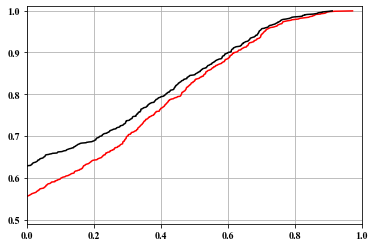

In [34]:
NSE_o_with_out_lake_all = np.array([])
NSE_o_with_lake_all = np.array([])

for i in np.arange(8549):
    
    # HDMA_seg_id
    # print(i)
    
    # slice the observation
    merged_dataset_slice = merged_dataset.isel(id=i)
    Observation  = merged_dataset_slice['runoff_mean'].values
    
    # Select the model with lake
    idx = np.where(with_lake.reachID[:].values == merged_dataset_slice.HDMA_seg_id.values)
    if not (np.size(idx) == 0):
        idx = idx[0].item()
        with_lake_slice = with_lake.isel(seg=idx)
        Simulation_with_lake = with_lake_slice['IRFroutedRunoff'].values

        # Select the model without lake
        idx = np.where(with_out_lake.reachID[:].values == merged_dataset_slice.HDMA_seg_id.values)
        idx = idx[0].item()
        with_out_lake_slice = with_out_lake.isel(seg=idx)
        Simulation_with_out_lake = with_out_lake_slice['IRFroutedRunoff'].values

        if NSE(Simulation_with_lake, Simulation_with_out_lake)<0.99:
            if not np.all(np.isnan(Observation)):
                NSE_o_with_lake = NSE(Simulation_with_lake, Observation)
                NSE_o_with_out_lake = NSE(Simulation_with_out_lake, Observation)
                print(NSE_o_with_out_lake, NSE_o_with_lake)
                NSE_o_with_out_lake_all = np.append(NSE_o_with_out_lake_all, NSE_o_with_out_lake)
                NSE_o_with_lake_all     = np.append(NSE_o_with_lake_all, NSE_o_with_lake)
                
        #




883 297
0.7483050847457627
1180
[-1.00000000e+05 -5.14018998e+04 -2.26315607e+04 ...  9.06287239e-01
  9.19962217e-01  9.72816417e-01]
[-100000.         -151401.89983013 -174033.46048737 ... -253523.13611587
 -253522.21615365 -253521.24333724]
[0.00000000e+00 8.47457627e-04 1.69491525e-03 ... 9.97457627e-01
 9.98305085e-01 9.99152542e-01]


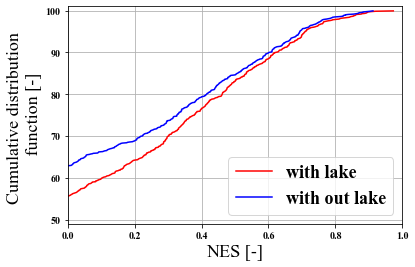

In [54]:
# number of improved stations with lakes:
improved = sum(NSE_o_with_lake_all>NSE_o_with_out_lake_all)
not_improved = sum(NSE_o_with_lake_all<=NSE_o_with_out_lake_all)

print(improved, not_improved)

print(improved/(improved+not_improved))
    
#
# cdf plots:
NSE_o_with_lake_all = np.where(np.isinf(NSE_o_with_lake_all), -100000, NSE_o_with_lake_all)
NSE_o_with_lake_all_sorted = np.sort(NSE_o_with_lake_all)


print(len(NSE_o_with_lake_all_sorted))
print(NSE_o_with_lake_all_sorted)
print(np.cumsum(NSE_o_with_lake_all_sorted))

# Compute the CDF
cdf = np.arange(len(NSE_o_with_lake_all_sorted)) / len(NSE_o_with_lake_all_sorted)

print(cdf)

plt.plot(NSE_o_with_lake_all_sorted, cdf, label='with lake', c='r')

plt.xlim([0,1])
plt.xlabel('NES [-]', fontsize = 18)

plt.ylim([0.49,1.01])
plt.yticks([0.5,0.6,0.7,0.8,0.9,1], [50,60,70,80,90,100])
plt.ylabel('Cumulative distribution \n function [-]', fontsize = 18)

plt.grid()

NSE_o_with_out_lake_all = np.where(np.isinf(NSE_o_with_out_lake_all), -100000, NSE_o_with_out_lake_all)
NSE_o_with_out_lake_all_sorted = np.sort(NSE_o_with_out_lake_all)

# Compute the CDF
cdf = np.arange(len(NSE_o_with_out_lake_all_sorted)) / len(NSE_o_with_out_lake_all_sorted)

plt.plot(NSE_o_with_out_lake_all_sorted, cdf, label='with out lake', c='b')

plt.legend(fontsize = 18)


In [26]:
# read mizuRoute output and make it to dataframe
simulation = xr.open_dataset('/Users/shg096/Downloads/HDMA_VIC_no_lake.h.1986-01-01-00000.nc')
# a none leap year
print(simulation)
# FLOW
FLOW = np.array(simulation['IRFroutedRunoff'][:])
COLUMNS = list(np.array(simulation['reachID'][:]).astype(str))
# dataindex
dateindex = pd.date_range(str(simulation.time.values[0]),
                          str(simulation.time.values[-1]),
                          freq= 'D') #
print(len(dateindex))
simulation = pd.DataFrame(FLOW[:,:],index = dateindex, columns = COLUMNS) # 
simulation_no_lake = simulation


# read mizuRoute output and make it to dataframe
simulation = xr.open_dataset('/Users/shg096/Downloads/HDMA_VIC_lake.h.1986-01-01-00000.nc')
# a none leap year
print(simulation)
# FLOW
FLOW = np.array(simulation['IRFroutedRunoff'][:])
COLUMNS = list(np.array(simulation['reachID'][:]).astype(str))
# dataindex
dateindex = pd.date_range(str(simulation.time.values[0]),
                          str(simulation.time.values[-1]),
                          freq= 'D') #
print(len(dateindex))
simulation = pd.DataFrame(FLOW[:,:],index = dateindex, columns = COLUMNS) # 
simulation_lake = simulation

# lake simulation should have less seg than the lake simulation
shp = gpd.read_file('/Volumes/F:/hydrography/HDMA/processed/hdma_global_stream.shp')
shp ['obj'] = -9999
shp ['IRFroute_diff'] = 0.0
# shp = shp.drop(columns='geometry')
for index, row in shp.iterrows():
    #print(index)
    if str(row['seg_id']) in COLUMNS:
        obs_seg = np.array(simulation_lake    [str(row['seg_id'])])
        sim_seg = np.array(simulation_no_lake [str(row['seg_id'])])
        shp ['obj'].loc[index] = 1-NSE(sim_seg,obs_seg)
        shp ['IRFroute_diff'].loc[index] = abs(max(obs_seg)-max(sim_seg))
        print(1-NSE(sim_seg,obs_seg), abs(max(obs_seg)-max(sim_seg)))
        

<xarray.Dataset>
Dimensions:          (time: 365, hru: 295335, seg: 278758)
Coordinates:
  * time             (time) datetime64[ns] 1986-01-01 1986-01-02 ... 1986-12-31
Dimensions without coordinates: hru, seg
Data variables:
    basinID          (hru) int32 ...
    reachID          (seg) int32 ...
    basRunoff        (time, hru) float32 ...
    IRFroutedRunoff  (time, seg) float32 ...
    volume           (time, seg) float32 ...
365
<xarray.Dataset>
Dimensions:          (time: 365, hru: 298277, seg: 298277)
Coordinates:
  * time             (time) datetime64[ns] 1986-01-01 1986-01-02 ... 1986-12-31
Dimensions without coordinates: hru, seg
Data variables:
    basinID          (hru) int32 ...
    reachID          (seg) int32 ...
    basRunoff        (time, hru) float32 ...
    IRFroutedRunoff  (time, seg) float32 ...
    volume           (time, seg) float32 ...
365


/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


3.3306690738754696e-16 0.0
5.88418203051333e-15 4.7683716e-07
1.2212453270876722e-15 0.0
3.4416913763379853e-15 0.0
3.6637359812630166e-15 1.1920929e-07
8.881784197001252e-16 0.0
9.992007221626409e-16 0.0
3.774758283725532e-15 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-15 1.1920929e-07
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
6.106226635438361e-15 0.0
8.881784197001252e-16 0.0
1.1379786002407855e-13 1.1920929e-07
5.329070518200751e-15 9.536743e-07
3.552713678800501e-15 0.0
0.0 0.0
5.88418203051333e-15 2.3841858e-07
1.7763568394002505e-15 0.0
1.4210854715202004e-14 1.4901161e-08
2.9976021664879227e-15 0.0
2.9976021664879227e-15 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
5.5289106626332796e-14 1.1920929e-07
0.0 0.0
0.0 0.0
1.8762769116165146e-14 0.0
2.220446049250313e-15 0.0
5

/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/758285877.py:43: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)


5.551115123125783e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.2212453270876722e-15 0.0
8.215650382226158e-15 5.9604645e-08
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
2.9976021664879227e-15 0.0
9.992007221626409e-16 2.3841858e-07
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.915134717478395e-13 3.8146973e-06
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
3.219646771412954e-15 9.536743e-07
0.0 0.0
2.5868196473766147e-14 1.9073486e-06
0.0 0.0
6.661338147750939e-16 0.0
4.3298697960381105e-15 1.1920929e-07
9.992007221626409e-16 0.0
2.9976021664879227e-15 0.0
9.325873406851315e-15 9.536743e-07
1.887379141862766e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
6.106226635438361e-15 4.7683716e-07
2.3314683517128287e-15 0.0
0.0 0.0
1.3433698597964394e-14 4.7683716e-07
2.1094237467877974e-15 1.19

8.881784197001252e-15 5.9604645e-08
1.9984014443252818e-15 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
2.7378588295379203e-06 0.00044465065
2.220446049250313e-16 0.0
5.329070518200751e-15 1.8626451e-09
1.021405182655144e-14 4.7683716e-07
0.0 0.0
3.423927807943983e-13 3.8146973e-06
1.4432899320127035e-15 0.0
4.107825191113079e-15 0.0
5.551115123125783e-16 0.0
8.881784197001252e-16 0.0
3.9968028886505635e-15 0.0
8.881784197001252e-16 0.0
3.408323301368199e-07 0.0025935173
3.885780586188048e-15 3.8146973e-06
3.4416913763379853e-15 0.0
3.774758283725532e-15 9.536743e-07
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
7.327471962526033e-15 0.0
9.992007221626409e-16 0.0
0.0017171980154012667 0.14016342
1.1102230246251565e-16 0.0
3.6637359812630166e-15 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
2.220446049250313e-15 0.0
1.9984014443252818e-15 0.0
7.66053886991358e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
2.55

4.572122680457369e-10 6.7949295e-06
9.325873406851315e-15 9.536743e-07
6.5503158452884236e-15 3.8146973e-06
inf 4.8643756e-09
4.440892098500626e-16 0.0
5.218048215738236e-15 0.0
1.4654943925052066e-14 2.3841858e-07
6.661338147750939e-16 0.0
1.5543122344752192e-15 0.0
0.0 0.0
3.774758283725532e-15 4.7683716e-07
9.992007221626409e-15 1.1920929e-07
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
3.3639757646142243e-14 1.1920929e-07
1.1102230246251565e-16 0.0
0.0 0.0
1.6653345369377348e-15 0.0
3.813394044982488e-12 1.0967255e-05
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
3.552713678800501e-15 0.0
2.220446049250313e-16 0.0
2.7755575615628914e-15 0.0
19.718856321412307 16.076345
1.0436096431476471e-14 0.0
1.5543122344752192e-15 0.0
7.105427357601002e-15 0.0
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
1.432187701766452e-14 3.8146973e-06
0.0 0.0
3.3306690738754696e-16 0.0
3.6637359812630166e-15 1.1920929e-07
5.55111

/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/758285877.py:43: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)


1.7763568394002505e-15 0.0
1.5543122344752192e-15 1.4901161e-08
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
7.993605777301127e-15 4.7683716e-07
5.662137425588298e-15 2.9802322e-08
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
3.219646771412954e-15 9.536743e-07
4.884981308350689e-15 9.536743e-07
1.5543122344752192e-15 2.3841858e-07
5.551115123125783e-16 0.0
3.1086244689504383e-15 4.7683716e-07
3.552713678800501e-15 3.8146973e-06
0.0 0.0
0.0 0.0
5.88418203051333e-15 0.0
4.440892098500626e-15 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
6.106226635438361e-15 5.9604645e-08
8.881784197001252e-16 5.9604645e-08
2.220446049250313e-15 7.450581e-09
4.773959005888173e-15 1.5258789e-05
8.770761894538737e-15 0.0
1.887379141862766e-15 0.0
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.219646771412954e-15 7.450581e-09
0.05893873704694752 1.1992378
0.0 0.0
2.3314683517128287e-15 0.0
1.55431

1.3011813848606835e-13 9.313226e-09
9.218465543248122e-06 0.03629303
4.773959005888173e-15 5.9604645e-08
5.218048215738236e-15 0.0
5.218048215738236e-15 4.7683716e-07
1.7763568394002505e-15 5.9604645e-08
1.4432899320127035e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.55351295663786e-15 0.0
2.3314683517128287e-15 0.0
2.9976021664879227e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
9.92193164073285e-07 0.0003747344
2.220446049250313e-15 0.0
0.0 0.0
4.6629367034256575e-15 4.7683716e-07
4.6629367034256575e-15 5.9604645e-08
6.661338147750939e-16 0.0
5.551115123125783e-16 0.0
3.885780586188048e-15 0.0
1.6653345369377348e-15 0.0
1.887379141862766e-15 2.3841858e-07
1.887379141862766e-15 0.0
3.164135620181696e-14 4.7683716e-07
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
3.4416913763379853e-15 9.536743e-07
2.55351295663786e-15 0.0
6.328271240363392e-15 3.8146973e-06
6.217248937900877e-15 2.9802322e-08
2.886579864025407e-15 0.0
6.7723604

1.5543122344752192e-15 0.0
1.0946799022804043e-13 9.536743e-07
8.326672684688674e-15 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
8.215650382226158e-15 2.9802322e-08
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-15 9.536743e-07
3.3306690738754696e-16 0.0
0.0 0.0
3.552713678800501e-15 0.0
0.0 0.0
1.887379141862766e-15 0.0
0.0 0.0
2.886579864025407e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
5.773159728050814e-15 0.0
2.55351295663786e-15 1.1920929e-07
5.551115123125783e-16 0.0
7.771561172376096e-16 0.0
3.1086244689504383e-15 1.9073486e-06
0.0 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
4.773959005888173e-15 9.313226e-10
1.3322676295501878e-15 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
6.439293542825908e-15 0.0
5.773159728050814e-15 0.0
2.6645352591003757e-15 0.0
8.54871728961

1.4432899320127035e-15 0.0
6.661338147750939e-16 0.0
9.992007221626409e-16 1.1920929e-07
7.771561172376096e-16 0.0
2.3314683517128287e-15 5.9604645e-08
3.3306690738754696e-16 0.0
0.0 0.0
1.887379141862766e-15 0.0
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.4432899320127035e-15 2.9802322e-08
3.9968028886505635e-15 2.9802322e-08
2.1094237467877974e-15 0.0
5.551115123125783e-16 0.0
1.5543122344752192e-15 0.0
7.16093850883226e-14 1.1920929e-07
4.107825191113079e-15 0.0
1.9984014443252818e-15 0.0
1.7763568394002505e-15 0.0
1.3322676295501878e-15 0.0
2.886579864025407e-15 0.0
1.4432899320127035e-15 0.0
3.219646771412954e-15 0.0
3.552713678800501e-15 0.0
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
3.885780586188048e-15 0.0
1.2212453270876722e-15 0.0
7.993605777301127e-15 7.6293945e-06
9.992007221626409e-16 0.

1.199040866595169e-14 0.0
8.881784197001252e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
3.774758283725532e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
9.992007221626409e-16 0.0
1.4432899320127035e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
7.549516567451064e-14 2.2351742e-08
4.440892098500626e-16 0.0
2.55351295663786e-15 0.0
2.9976021664879227e-15 0.0
1.5432100042289676e-14 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
5.995204332975845e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
5.773159728050814e-15 0.0
1.7763568394002505e-15 0.0
6.661338147750939e-16 0.0
4.9960036108132044e-15 0.0
0.0 0.0
0.0 0.0
5.218048215738236e-15 2.3841858e-07
3.6637359812630166e-15 4.7683716e-07
0.0 0.0
1.1102230246251565e-16 0.0
6.261657858885883e-14 3.5762787e-07
1.6653345369377348e-15 0.0
3.219646771412954e-15 0.0
1.7319479184152442e-14 1.1920929e-07
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
4.3298697960381105e-15 1.5258789e-05
0.0 0.0
4.9960036108132044e-15 3.8146973e-06
inf 2.842171e-14
7.438

7.771561172376096e-16 0.0
7.771561172376096e-15 1.5258789e-05
1.1102230246251565e-15 0.0
8.548717289613705e-15 1.1920929e-07
1.4432899320127035e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-15 0.0
3.3306690738754696e-16 0.0
9.19153642087167e-13 2.0489097e-08
1.7763568394002505e-15 0.0
6.994405055138486e-15 1.8626451e-09
5.728750807065808e-14 1.4305115e-06
7.993605777301127e-15 1.1920929e-07
3.3306690738754696e-16 0.0
1.0103029524088925e-14 2.3841858e-07
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.6653345369377348e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
9.880984919163893e-15 3.8146973e-06
0.0 0.0
3.552713678800501e-15 0.0
2.9976021664879227e-15 0.0
0.0 0.0
1.4432899320127035e-15 0.0
0.0 0.0
2.220446049250313e-15 1.1920929e-07
1.1102230246251565e-15 0.0
1.4

2.220446049250313e-16 0.0
1.2212453270876722e-15 2.3841858e-07
3.6637359812630166e-15 0.0
4.9960036108132044e-15 2.9802322e-08
3.885780586188048e-15 0.0
5.551115123125783e-16 0.0
3.4416913763379853e-15 0.0
2.3314683517128287e-15 4.7683716e-07
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
6.217248937900877e-15 2.3841858e-07
0.0 0.0
6.661338147750939e-16 0.0
1.3322676295501878e-15 9.536743e-07
9.992007221626409e-16 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-15 0.0
2.4424906541753444e-15 0.0
6.661338147750939e-16 0.0
2.3314683517128287e-15 2.3841858e-07
1.7763568394002505e-15 2.9802322e-08
6.661338147750939e-15 2.3841858e-07
0.0 0.0
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
0.3692166379875099 0.14480451
6.661338147750939e-16 0.0
3.774758283725532e-15 4.7683716e-07
3.3306690738754696e-15 1.1920929e-07
0.0 0.0
3.552713678800501e-15 0.0
1.8318679906315083e-14 5.9604645e-08
4.440892

8.104628079763643e-15 1.4901161e-08
2.220446049250313e-16 0.0
0.0 0.0
2.886579864025407e-15 0.0
1.9984014443252818e-15 0.0
2.631228568361621e-14 5.9604645e-08
2.3314683517128287e-15 4.7683716e-07
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.3314683517128287e-15 0.0
1.9984014443252818e-15 0.0
2.220446049250313e-15 0.0
3.774758283725532e-15 0.0
1.1102230246251565e-15 0.0
3.1086244689504383e-15 7.6293945e-06
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
1.3322676295501878e-15 0.0
4.440892098500626e-16 0.0
1.4432899320127035e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 1.1920929e-07
0.0 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.7763568394002505e-15 0.0
4.884981308350689e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
2.220446049250313e-15 0.0
1.4432899320127035e-15 0.0
2.560174294785611e-13 0.0
0.0 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
2.2204460

1.2212453270876722e-15 0.0
1.2434497875801753e-14 0.0
8.43769498715119e-15 1.1920929e-07
1.4765966227514582e-14 0.0
0.0 0.0
2.9976021664879227e-15 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
2.02171612784241e-13 2.3841858e-07
0.0 0.0
5.551115123125783e-16 0.0
1.354472090042691e-14 1.1920929e-07
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
18.32567870330035 9.495048
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
5.10702591327572e-15 2.3841858e-07
0.0 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
1.199040866595169e-14 3.8146973e-06
0.0 0.0
5.551115123125783e-15 1.4901161e-08
2.4424906541753444e-15 3.7252903e-09
2.220446049250313e-15 0.0
3.219646771412954e-15 5.9604645e-08
0.0 0.0
4.729550084903167e-14 4.7683716e-07
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
5.10702591327572e-15 1.1920929e-07
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
0.0 0.0
8.881784197001

9.289955191449373e-06 0.004082918
1.1102230246251565e-16 0.0
6.994405055138486e-15 4.7683716e-07
3.9968028886505635e-15 0.0
3.1086244689504383e-15 0.0
9.992007221626409e-16 0.0
1.6653345369377348e-15 0.0
3.3639757646142243e-14 4.7683716e-07
1.6653345369377348e-15 0.0
9.414691248821327e-14 1.7881393e-07
2.1760371282653068e-14 0.0
3.885780586188048e-15 1.5258789e-05
0.0 0.0
2.220446049250313e-16 0.0
0.0585361451194083 0.6985893
9.992007221626409e-16 0.0
5.10702591327572e-15 0.0
0.0 0.0
0.0 0.0
3.049782648645305e-13 1.1920929e-06
2.7755575615628914e-15 5.9604645e-08
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
2.3314683517128287e-15 1.4901161e-08
1.1102230246251565e-16 0.0
1.6653345369377348e-15 1.9073486e-06
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
8.881784197001252e-16 5.9604645e-08
6.661338147750939e-16 0.0
9.547918011776346e-15 0.0
9.325873406851315e-15 4.7683716e-07
0.0 0.0
0.0 0.0
4.3298697960381105e-15 2.9802322e-08
1.2212453270876722e-15 0.0
9.547918011776346e-

2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
8.881784197001252e-16 0.0
2.7755575615628914e-15 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
2.7755575615628914e-15 0.0
1.5654144647214707e-14 5.9604645e-08
1.2212453270876722e-15 0.0
7.882583474838611e-15 4.7683716e-07
2.220446049250313e-16 0.0
5.773159728050814e-15 1.1920929e-07
6.661338147750939e-16 0.0
7.771561172376096e-15 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
5.551115123125783e-16 0.0
3.6303039684715266e-05 0.094192505
2.4424906541753444e-15 4.7683716e-07
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
2.3314683517128287e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.3314683517128287e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
1.2789769243681803e-13 3.7252903e-08
4.440892098500626e-16 0.0
0.0 0.0
8.992806499463768e-15 1.1920929e-07
3.9968028886505635e-15 0.0
6.328271240363392e-15 1.9073486e-06
2.674527266322002e-13 7.4505806e-08
4.440892098500626e-16 0.0
3.33066907387546

2.55351295663786e-15 0.0
1.1102230246251565e-16 0.0
1.454392162258955e-14 1.1920929e-07
0.0 0.0
5.218048215738236e-15 0.0
1.3810938788161309e-06 0.0029735565
1.2878587085651816e-14 2.3841858e-07
2.220446049250313e-16 0.0
7.771561172376096e-15 4.7683716e-07
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
0.05586968759845712 2.5774946
2.220446049250313e-16 0.0
0.0 0.0
7.523981437884686e-13 2.9802322e-07
3.552713678800501e-15 5.9604645e-08
1.4432899320127035e-15 0.0
2.1094237467877974e-15 4.7683716e-07
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
9.992007221626409e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.9976021664879227e-15 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.662137425588298e-15 2.3841858e-07
2.9976021664879227e-15 0.0
1.7763568394002505e-15 0.0
3.1086244689504383e-15 4.7683716e-07
5.551115123125783e-16 0.0
6.661338147750939e-16 0.

0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.176836406102666e-14 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 3.7252903e-09
1.6653345369377348e-15 0.0
2.808864252301646e-14 9.536743e-07
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
2.3314683517128287e-15 0.0
6.661338147750939e-16 0.0
1.609823385706477e-14 9.536743e-07
2.9976021664879227e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
1.6653345369377348e-15 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
2.220446049250313e-16 0.0
6.661338147750939e-15 1.9073486e-06
3.219646771412954e-15 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
1.99840144432528

1.5543122344752192e-15 0.0
0.0 0.0
1.887379141862766e-15 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
3.774758283725532e-15 0.0
3.6637359812630166e-15 0.0
1.4432899320127035e-15 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
2.1094237467877974e-15 3.8146973e-06
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
0.11110188785834962 0.6232815
7.771561172376096e-16 0.0
1.3322676295501878e-15 0.0
1.7763568394002505e-15 0.0
0.0 0.0
6.217248937900877e-15 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
3.1086244689504383e-15 0.0
1.432187701766452e-14 1.1920929e-07
0.0 0.0
1.176836406102666e-14 5.9604645e-08
0.0 0.0
5.329070518200751e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
8.881784197001252e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
3.774758283725532e-15 0.0
8

1.1102230246251565e-16 0.0
4.107825191113079e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
1.3100631690576847e-14 1.1920929e-07
7.327471962526033e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.4432899320127035e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
6.439293542825908e-15 1.1920929e-07
4.440892098500626e-15 9.536743e-07
1.7763568394002505e-15 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 1.4901161e-08
1.887379141862766e-15 0.0
3.019806626980426e-14 2.3841858e-07
9.992007221626409e-16 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
6.8833827526759706e-15 0.0
4.551914400963142e-15 4.7683716e-07
6.106226635438361e-15 0.0
2.886579864025407e-15 0.0
7.438494264988549e-15 0.0
4.440892098500626e-16 0.0
6.573909993156226 4.998027
8.881784197001252e-16 0.0
2.098321516541546e-14 5.9604645e-08
0.5064348132550853 13.866703
5.360365291973146e-06 0.0058841705

5.773159728050814e-15 1.1920929e-07
3.3306690738754696e-16 0.0
1.585488851318928e-09 0.00057411194
2.3314683517128287e-15 0.0
3.4416913763379853e-15 0.0
1.5543122344752192e-15 0.0
8.215650382226158e-15 2.9802322e-08
6.661338147750939e-16 0.0
4.418687638008123e-14 4.7683716e-07
3.548401178443683e-07 0.0056028366
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
7.438494264988549e-15 0.0
1.9984014443252818e-15 0.0
1.9984014443252818e-15 0.0
4.440892098500626e-16 0.0
2.1094237467877974e-15 0.0
3.552713678800501e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
1.0482990856763614 5.1355762
5.551115123125783e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.7430501486614958e-14 2.9802322e-08
5.551115123125783e-16 0.0
1.2212453270876722e-15 0.0
1.7763568394002505e-15 0.0
3.1086244689504383e-15 0.0
0.0 0.0
1.0038636588660665e-12 5.364418e-07
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
2.7755575615628914e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.3322676295501

1.6542323066914832e-14 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-15 0.0
4.3298697960381105e-15 0.0
6.5503158452884236e-15 0.0
2.55351295663786e-15 9.536743e-07
1.3322676295501878e-15 0.0
1.7763568394002505e-15 0.0
5.440092820663267e-15 4.7683716e-07
8.770761894538737e-15 9.536743e-07
0.0 0.0
7.771561172376096e-16 1.5258789e-05
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
9.992007221626409e-16 0.0
2.7422508708241367e-14 4.7683716e-07
nan 0.0
4.6629367034256575e-15 0.0
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
2.9976021664879227e-15 5.9604645e-08
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
9.992007221626409e-16 0.0
4.551914400963142e-15 5.9604645e-08
2.7755575615628914e-15 0.0
2.55351295663786e-15 0.0
9.104916864899337e-08 0.00020229816
1.7763568394002505e-15 0.0
2.3314683517128287e-15 0.0
1.2212453270876722e-15 0.0
0.

6.161737786669619e-14 9.536743e-07
1.887379141862766e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
2.6645352591003757e-15 0.0
2.220446049250313e-16 0.0
3.885780586188048e-15 0.0
2.55351295663786e-15 0.0
9.547918011776346e-15 1.9073486e-06
1.4432899320127035e-15 0.0
1.4432899320127035e-15 0.0
2.6645352591003757e-15 0.0
2.886579864025407e-15 4.7683716e-07
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
5.551115123125783e-16 0.0
2.9976021664879227e-15 0.0
5.329070518200751e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
4.069754682118404 9.7097435
1.3322676295501878e-15 0.0
5225.3535309611225 38.569702
1.1102230246251565e-16 0.0
2.9976021664879227e-15 0.0
1.4432899320127035e-15 0.0
9.880984919163893e-15 4.7683716e-07
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-15 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.004

7.771561172376096e-16 0.0
3.4416913763379853e-15 0.0
3.6637359812630166e-15 9.536743e-07
0.0 0.0
2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
1.3962608846895819e-11 5.531311e-05
3.3306690738754696e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
2.220446049250313e-15 0.0
3.552713678800501e-15 7.6293945e-06
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
2.3314683517128287e-15 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.887379141862766e-15 0.0
1.2656542480726785e-14 3.8146973e-06
4.884981308350689e-15 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
6.202370466112939e-06 0.011258602
0.0 0.0
5.551115123125783e-16 0.0
1.5543122344752192e-15 0.0
1.3322676295501878e-15 0.0
8.881784197001252e-16 0.0
1.887379141862766e-15 0.0
1.4654943925052066e-13 2.3841858e-07
2.5535129566

0.0 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
0.0 0.0
2.19824158875781e-14 0.0
2.220446049250313e-16 0.0
1.3100631690576847e-14 4.7683716e-07
2.1094237467877974e-15 9.536743e-07
7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.4654943925052066e-14 1.9073486e-06
0.0 0.0
2.55351295663786e-15 0.0
2.475797344914099e-14 5.9604645e-08
9.992007221626409e-16 0.0
1.4432899320127035e-15 0.0
1.3322676295501878e-15 0.0
3.3306690738754696e-16 0.0
3.552713678800501e-15 0.0
1.9984014443252818e-15 0.0
9.992007221626409e-16 0.0
0.0 0.0
1.9984014443252818e-15 7.6293945e-06
1.4432899320127035e-15 0.0
1.6653345369377348e-15 0.0
6.661338147750939e-16 0.0
2.55351295663786e-13 5.722046e-06
1.4432899320127035e-15 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
6.772360450213455e-15 3.7252903e-09
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
2.1094237467877974e-15 0.0
1.3322676295501878e-

3.774758283725532e-15 0.0
3.1086244689504383e-15 0.0
1.1102230246251565e-16 0.0
3.1086244689504383e-15 9.536743e-07
4.440892098500626e-16 0.0
1.6564841971710609 8.542829
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.354472090042691e-14 0.0
4.107825191113079e-15 0.0
2.55351295663786e-15 0.0
0.00017613427246043756 0.11183548
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
4.218847493575595e-15 0.0
7.549516567451064e-15 0.0
4.9960036108132044e-15 0.0
7.771561172376096e-16 0.0
2.1094237467877974e-15 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
3.4416913763379853e-15 4.7683716e-07
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
5.773159728050814e-15 3.8146973e-06
7.549516567451064e-15 4.7683716e-07
0.0 0.0
2.3314683517128287e-15 0.0
5.551115123125783e-16 0.0
1.4432899320127035e-15 0.0
2.22044604

6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
2.9976021664879227e-15 0.0
2.220446049250313e-16 0.0
6.217248937900877e-15 4.7683716e-07
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
3.6637359812630166e-15 0.0
4.6629367034256575e-15 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
3.4416913763379853e-15 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
2.4424906541753444e-15 4.7683716e-07
1.6653345369377348e-15 0.0
2.886579864025407e-15 1.9073486e-06
1.9984014443252818e-15 0.0
3.219646771412954e-15 0.0
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
9.43689570931383e-15 1.1920929e-07
4.3298697960381105e-15 0.0
1.4432899320127035e-15 3.7252903e-09
5.551115123125783e-16 0.0
1.4432899320127035e-15 0.0
1.2212453270876722e-14 3.8146973e-06
3.3306690738754696e-16 0.0
6.217248937900877e-15 0.0
7.105427357601002e-15 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-15 0.0
1.1324274851176597e-14 2.3841858e-07
3.3306690738754696e-16 0.0
4.107825191113079e-15 2.38418

3.885780586188048e-15 1.1920929e-07
8.881784197001252e-16 0.0
1.2434497875801753e-14 5.9604645e-08
3.3306690738754696e-16 0.0
2.3314683517128287e-15 0.0
7.771561172376096e-15 0.0
6.106226635438361e-15 1.1920929e-07
nan 0.0
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
9.769962616701378e-15 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
3.9968028886505635e-15 0.0
2.743361093848762e-13 0.0
6.217248937900877e-15 1.9073486e-06
8.770761894538737e-15 1.4901161e-08
1.9984014443252818e-15 0.0
nan 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
1.554312234475219e-14 0.0
1.6653345369377348e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
3.1086244689504383e-15 0.0
1.1102230246251565e-15 0.0
2.886579864025407e-15 0.0
1.3322676295501878

1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
8.659739592076221e-15 1.9073486e-06
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 2.3841858e-07
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
3432.540290814224 39.09339
1.887379141862766e-15 0.0
4.218847493575595e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
2.3314683517128287e-15 3.8146973e-06
6.5503158452884236e-15 1.1920929e-07
9.992007221626409e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
1.2989609388114332e-14 1.4901161e-08
1.1102230246251565e-16 0.0
1.6653345369377348e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
7.216449660063518e-15 1.9073486e-06
1.1102230246251565e-15 0.0
6.8833827526759706e-15 2.3841858e-07
1.6653345369377348e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
8.881784197001252e-16 0.0
9.992007221626409e-16 0.0
1.9984014443252818e-15 9.536743e-07
8.881784197001252e-16 0.0
1.6653

1.5543122344752192e-15 0.0
1.887379141862766e-15 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
2.55351295663786e-15 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 4.7683716e-07
1.7763568394002505e-15 0.0
2.3314683517128287e-15 0.0
6.772360450213455e-15 1.1920929e-07
1.3322676295501878e-15 0.0
1.2545520178264269e-14 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
4.218847493575595e-15 2.3841858e-07
2.220446049250313e-16 0.0
0.0 0.0
3.219646771412954e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
5.551115123125783e-16 0.0
3.885780586188048e-15 5.9604645e-08
6.661338147750939e-16 0.0
1.4432899320127035e-15 0.0
3.6637359812630166e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
1.4432899320127035e-15 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
5.773159728050814e-15 0.0
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.7763568394002505e-15 0.0
4.551914400963142e-15 0.0
1.2212453270

8.326672684688674e-15 1.9073486e-06
6.661338147750939e-16 1.9073486e-06
0.0 0.0
5.995204332975845e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.773959005888173e-15 1.1920929e-07
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
8.881784197001252e-16 0.0
1.9984014443252818e-15 0.0
1.0880185641326534e-14 5.9604645e-08
9.992007221626409e-16 0.0
3.9968028886505635e-15 4.7683716e-07
3.552713678800501e-15 0.0
2.55351295663786e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-15 9.536743e-07
5.440092820663267e-15 1.4901161e-08
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
9.992007221626409e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0025958551276642483 0.40100288
0.0 0.0
3.3306690738754696e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
2.4838

1.1102230246251565e-15 0.0
9.992007221626409e-16 0.0
1.3322676295501878e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
1.6653345369377348e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-15 0.0
0.0 0.0
1.4432899320127035e-15 0.0
0.0 0.0
2.55351295663786e-15 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
1.5543122344752192e-15 0.0
3.885780586188048e-15 7.6293945e-06
2.6645352591003757e-15 0.0
9.658940314238862e-15 0.0
5.551115123125783e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
6.439293542825908e-15 0.0
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
4.3298697960381105e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.4432899320127035e-15 2.3841858e-07
1.7763568394002505e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.01945820739933113 0.22936988
0.0 0.0
4.107825191113079e-15 5.9604645e-08
0.0 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
3.5982328228101323e-13 5.364418e-07
5.7731597

3.3306690738754696e-15 0.0
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
6.8833827526759706e-15 0.0
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
1.5543122344752192e-15 9.536743e-07
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
4.884981308350689e-15 1.1920929e-07
2.220446049250313e-16 0.0
1.4432899320127035e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.887379141862766e-15 0.0
7.105427357601002e-15 5.9604645e-08
0.007336996533017115 12.166061
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
8.326672684688674e-15 2.9802322e-08
2.9976021664879227e-15 0.0
3.3306690738754696e-16 0.0
4.6629367034256575e-15 9.536743e-07
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
2.3314683517128287e-15 3.8146973e-06
2.55351295663786e-15 0.0
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
3.774758283725532e-15 0.0
0.9822807284243934 9.898975

4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
6.661338147750939e-15 4.7683716e-07
3.3306690738754696e-16 0.0
3.6637359812630166e-15 2.3841858e-07
3.6637359812630166e-15 2.3841858e-07
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 5.9604645e-08
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
1.2878587085651816e-14 0.0
1.6653345369377348e-15 0.0
0.0 0.0
1.0436096431476471e-14 2.3841858e-07
1.4432899320127035e-15 0.0
1.887379141862766e-15 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
7.993605777301127e-15 5.9604645e-08
2.7755575615628914e-15 1.9073486e-06
2.220446049250313e-15 9.536743e-07
3.552713678800501e-15 9.536743e-07
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
0.06593284318957371 8.0398445
0.0 0.0
1.5543122344752192e-15 0.0
6.5503158452884236e-15 0.0
4.218847493575595e-15 0.0
0.0 0.0
1.0325074129013956e-14 3.8146973e-06
2.886579864025407e-15 0.

8.881784197001252e-16 0.0
0.0 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
0.2947010402904986 5.771309
1.9984014443252818e-15 0.0
3.3306690738754696e-15 0.0
0.5419451761189837 2.8675718
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-15 7.450581e-09
6.661338147750939e-16 0.0
1.9984014443252818e-15 2.3841858e-07
3.774758283725532e-15 0.0
7.771561172376096e-15 0.0
6.661338147750939e-16 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
2.7755575615628914e-15 0.0
12.851058750275149 27.524712
1.7763568394002505e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
1.3322676295501878e-15 0.0
3.219646771412954e-15 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.4424906541753444e-15 5.9604645e-08
1.5543122344752192e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
2.886579864025407e-15 0.0
9.992007221626

2.9976021664879227e-15 9.536743e-07
1.021405182655144e-14 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.219646771412954e-15 1.1920929e-07
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
4.107825191113079e-15 3.8146973e-06
0.00034040782156652405 0.35553932
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
2.886579864025407e-15 2.3841858e-07
4.6633807926355075e-12 7.4505806e-08
6.661338147750939e-16 3.8146973e-06
5.440092820663267e-15 1.9073486e-06
0.0 0.0
1.4432899320127035e-15 0.0
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.0
3.552713678800501e-15 1.9073486e-06
7.327471962526033e-15 0.0
4.6629367034256575e-15 9.536743e-07
3.9968028886505635e-15 0.0
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
2.7755575615628914e-15 0.0
2.6645352591003757e-15 0.0
1.2212453270876722e-15 0.0
6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
6

5.551115123125783e-16 0.0
1.6653345369377348e-15 0.0
5.551115123125783e-16 0.0
2.55351295663786e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
3.086420008457935e-14 0.0
6.328271240363392e-15 0.0
2.0650148258027912e-14 3.8146973e-06
7.771561172376096e-16 1.9073486e-06
0.0 0.0
2.3314683517128287e-15 0.0
7.327471962526033e-15 0.0
2.1094237467877974e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
3.1086244689504383e-15 1.8626451e-09
3.885780586188048e-15 5.9604645e-08
2.4424906541753444e-15 0.0
1.2212453270876722e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.3298697960381105e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
0.0 0.0
2.9976021664879227e-15 0.0
0.0 0.0
5.662137425588298e-15 0.0
5.551115123125783e-16 0.0
3.774758283725532e-15 0.0
6.661338147750939e-16 0.0
9.992007221626409e-16 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
3.33066

1.6653345369377348e-15 0.0
1.7763568394002505e-15 0.0
1.2212453270876722e-15 0.0
2.6645352591003757e-15 0.0
2.7755575615628914e-15 0.0
0.0 0.0
4.107825191113079e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
6.217491879934034e-05 0.05512047
0.0 0.0
3.3084646133829665e-14 7.6293945e-06
1.9984014443252818e-15 0.0
8.659739592076221e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-15 5.9604645e-08
5.88418203051333e-15 1.1641532e-10
1.887379141862766e-15 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
1.887379141862766e-15 0.0
8.881784197001252e-16 0.0
3.219646771412954e-15 5.9604645e-08
3.774758283725532e-15 0.0
2.220446049250313e-16 0.0
9.2148511043888e-15 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 0.0
2.1094237467877974e-15 3.8146973e-06
1.887379141862766e-15 0.0
0.0 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
1.2212453270876722e-15 2.3841858e-07
3.247402347028583e-13 1.66893e-06
0.0 0.0
2.9976021664879227

7.771561172376096e-16 0.0
0.0 0.0
2.886579864025407e-15 3.7252903e-09
1.1102230246251565e-15 0.0
4.107825191113079e-15 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
4.3298697960381105e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
0.0 0.0
2.220446049250313e-15 0.0
2.4424906541753444e-15 0.0
3.219646771412954e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
6.328271240363392e-15 9.536743e-07
5.551115123125783e-16 0.0
2.220446049250313e-15 2.3841858e-07
7.771561172376096e-16 0.0
7.549516567451064e-15 1.9073486e-06
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.1086244689504383e-15 0.0
0.0 0.0
2.1094237467877974e-15 3.8146973e-06
1.7208456881689926e-14 0.0
3.3306690738754696e-16 0.0
1.55431223447521

0.0 0.0
5.10702591327572e-15 2.3841858e-07
4.6629367034256575e-15 1.4901161e-08
2.886579864025407e-15 1.1920929e-07
0.0 0.0
4.440892098500626e-16 0.0
7.549516567451064e-15 5.9604645e-08
1.1102230246251565e-16 0.0
3.552713678800501e-15 3.7252903e-09
3.3306690738754696e-16 0.0
1.6653345369377348e-15 2.9802322e-08
2.6645352591003757e-15 0.0
6.661338147750939e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
3.219646771412954e-15 0.0
4.9960036108132044e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
1.4432899320127035e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
1.7763568394002505e-15 0.0
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
4.6629367034256575e-15 0.0
8.881784197001252e-16 0.0
3.3306690

1.4432899320127035e-15 7.6293945e-06
8.881784197001252e-16 0.0
6.328271240363392e-15 0.0
1.7763568394002505e-15 0.0
1.5543122344752192e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.7763568394002505e-15 4.7683716e-07
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
3.219646771412954e-15 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.9984014443252818e-15 2.3841858e-07
0.0 0.0
4.440892098500626e-16 0.0
3.552713678800501e-15 0.0
3.3306690738754696e-16 0.0
2.863931314323054e-12 3.33786e-06
0.0 0.0
2.7755575615628914e-15 0.0
0.0 0.0
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
7.105427357601002e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
0.0 0.0
3.552713678800501e-15 4.7683716e-07
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
3.9968028886505635e-15 4.7683716e-07
2.9976021664879227e-15 4.7683716e-07
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.1

3.1086244689504383e-15 4.7683716e-07
2.1094237467877974e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
3.1086244689504383e-15 3.8146973e-06
2.220446049250313e-16 0.0
1.6431300764452317e-14 1.1920929e-07
5.551115123125783e-16 0.0
9.769962616701378e-15 1.1920929e-07
0.0 0.0
2.55351295663786e-15 1.1920929e-07
2.220446049250313e-16 0.0
1.2545520178264269e-14 9.536743e-07
9.992007221626409e-16 4.7683716e-07
1.1102230246251565e-16 0.0
9.894307595459395e-13 2.682209e-07
1.2212453270876722e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
7.993605777301127e-15 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
0.10172273316928815 0.37587523
7.771561172376096e-16 0.0
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
1.1435297153639112e-14 2.3841858e-07
1.3322676295501878e-15 0.0
2.7755575615628914e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
5.329070518200751e-15 0.0
0.0 0.0
0.0185

2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
3.4416913763379853e-15 0.0
0.0 0.0
1.6653345369377348e-15 0.0
5.551115123125783e-16 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.570748558472502e-08 0.0
9.103828801926284e-15 0.0
5.995204332975845e-15 0.0
3.4416913763379853e-15 1.5258789e-05
2.220446049250313e-16 0.0
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0026551264729687274 1.5591354
0.0 0.0
1.9984014443252818e-15 0.0
8.053557820630886e-13 0.0
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
2.3314683517128287e-15 0.0
9.992007221626409e-16 0.0
2.919886554764162e-14 3.8146973e-06
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
3.4416913763379853e-15 0.0
5.218048215738236e-15 0.0
0.0 0.0
1.687538997430238e-14 4.7683716e-07
2.55351295663786e-15 0.0
5.9952043329

9.880984919163893e-15 0.0
1.6653345369377348e-15 0.0
1.7763568394002505e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
2.3314683517128287e-15 0.0
7.771561172376096e-16 0.0
3.355093980417223e-13 2.9802322e-08
2.886579864025407e-15 0.0
2.220446049250313e-16 0.0
8.659739592076221e-15 9.536743e-07
3.552713678800501e-15 3.8146973e-06
1.2212453270876722e-15 0.0
1.5543122344752192e-15 0.0
4.9960036108132044e-15 1.9073486e-06
8.881784197001252e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
1.3322676295501878e-15 4.7683716e-07
0.0002544115863932772 0.50814056
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
5.88418203051333e-15 0.0
1.1457501614131615e-13 7.1525574e-07
0.0 0.0
0.0 0.0
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
5.10702591327572e-15 0.0
2.1094237467877974e-15 0.0
3.3306690738754696e-16 0.0
3.552713678800501e-15 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
3.774758283725532e-15 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
2.220

1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
3.6637359812630166e-15 0.0
0.00031466454722473003 0.4039154
1.3322676295501878e-14 0.0
8.326672684688674e-15 0.0
3.6637359812630166e-15 0.0
2.1094237467877974e-15 1.9073486e-06
0.0 0.0
6.661338147750939e-16 0.0
4.107825191113079e-15 0.0
5.995204332975845e-15 0.0
8.881784197001252e-16 0.0
1.3766765505351941e-14 2.3841858e-07
6.106226635438361e-15 0.0
1.7763568394002505e-15 0.0
0.004754943434344239 3.9510803
2.375877272697835e-13 1.1920929e-06
1.3322676295501878e-15 0.0
1.3322676295501878e-15 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
4.6629367034256575e-15 3.8146973e-06
9.43689570931383e-15 3.8146973e-06
2.5091040356528538e-14 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
6.6613381477509

2.6645352591003757e-15 0.0
2.220446049250313e-16 0.0
6.5503158452884236e-15 1.9073486e-06
1.1102230246251565e-15 0.0
0.0 0.0
9.547918011776346e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
9.103828801926284e-15 3.0517578e-05
1.1102230246251565e-16 0.0
3.3306690738754696e-15 1.9073486e-06
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
2.7755575615628914e-15 0.0
2.886579864025407e-15 7.6293945e-06
0.0 0.0
2.220446049250313e-16 0.0
3.3388005048588494 10.984876
0.0012390661258858682 0.11526728
2.1094237467877974e-15 9.536743e-07
0.0 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
1.3322676295501878e-15 1.9073486e-06
4.107825191113079e-15 0.0
1.3211653993039363e-14 9.536743e-07
0.0 0.0
2.9976021664879227e-15 0.0
1.1102230246251565e-16 0.0
3.1086244689504383e-15 3.8146973e-06
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
4.9960036108132044e-15 1.4901161e-08
3.3

1.1102230246251565e-16 0.0
6.057962734029587e-05 0.016832352
1.6653345369377348e-15 0.0
2.7755575615628914e-15 1.9073486e-06
7.771561172376096e-16 0.0
1.9984014443252818e-15 7.450581e-09
9.103828801926284e-15 2.9802322e-08
1.9984014443252818e-15 0.0
0.0 0.0
0.0 0.0
6.5503158452884236e-15 2.9802322e-08
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
6.772360450213455e-15 5.9604645e-08
6.661338147750939e-16 0.0
4.6629367034256575e-15 0.0
6.328271240363392e-15 9.536743e-07
1.5543122344752192e-15 0.0
2.1538326677728037e-14 1.9073486e-06
0.0 0.0
1.5265566588595902e-13 5.722046e-06
3.219646771412954e-15 2.3841858e-07
0.0 0.0
2.886579864025407e-15 3.8146973e-06
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
9.2148511043888e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
1.5432100042289676e-14 9.536743e-07
0.005998133711278442 0.02201581
7.771561172376096e-16 0.0
2.3869795029440866e-14 9.536743e-07
1.3322676295501878e-15 0.0
0.0 0.0
1.1

1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
8.881784197001252e-15 1.9073486e-06
1.099120794378905e-14 1.1920929e-07
7.549516567451064e-15 0.0
9.992007221626409e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.4432899320127035e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
5.551115123125783e-16 0.0
1.9984014443252818e-15 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-15 0.0
5.329070518200751e-15 1.1920929e-07
1.432187701766452e-14 4.7683716e-07
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.887379141862766e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-15 0.0
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
3.4416913763379853e-15 0.0
8.326672684688674e-15 1.1920929e-07
5.662137425588298e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
2.2

4.3298697960381105e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.9960036108132044e-15 0.0
1.7763568394002505e-15 0.0
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 2.3841858e-07
8.770761894538737e-15 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
1.887379141862766e-15 0.0
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.219646771412954e-15 0.0
1.4432899320127035e-15 0.0
1.0547118733938987e-14 2.3841858e-07
3.219646771412954e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
8.89772703294156e-

7.216449660063518e-15 0.0
0.0 0.0
2.7755575615628914e-15 1.1920929e-07
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.6653345369377348e-15 0.0
7.327471962526033e-15 2.3841858e-07
0.004928098063934572 0.8149338
1.2212453270876722e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-15 0.0
9.992007221626409e-16 1.5258789e-05
2.7755575615628914e-15 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
1.887379141862766e-15 2.3841858e-07
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
3.219646771412954e-15 4.7683716e-07
5.551115123125783e-16 0.0
1.1657341758564144e-13 3.5762787e-07
5.551115123125783e-16 0.0
0.0 0.0
0.27396198553388473 8.810257
0.0 0.0
1.6653345369377348e-15 0.0
6.661338147750939e-16

7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
1.4210854715202004e-14 3.8146973e-06
2.55351295663786e-15 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
6.328271240363392e-15 4.7683716e-07
4.218847493575595e-15 0.0
4.440892098500626e-16 0.0
1.965094753586527e-14 0.0
2.7755575615628914e-15 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 2.3283064e-10
0.0 0.0
4.8078571226461975e-06 0.018537521
8.881784197001252e-16 0.0
1.9984014443252818e-15 3.8146973e-06
4.2321701698710967e-13 8.940697e-08
4.218847493575595e-15 0.0
9.992007221626409e-16 0.0
2.3314683517128287e-15 0.0
1.6653345369377348e-15 0.0
1.2212453270876722e-15 0.0
0.0028357757182577714 0.12994623
7.771561172376096e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 3.8146973e-06
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.551914400963142e-15 0.0
0.0 0.0
3.885780586188048e-15 0.0
0.0 0.0
1.724176357242868e-13 2.3841858e-07
2.220446049250313e-16 0.0
0.0 0.0
6.661338

6.661338147750939e-16 0.0
2.220446049250313e-15 9.536743e-07
4.440892098500626e-16 0.0
8.215650382226158e-15 1.4901161e-08
7.771561172376096e-16 0.0
2.4424906541753444e-15 0.0
1.7763568394002505e-15 0.0
2.55351295663786e-15 1.1920929e-07
3.1086244689504383e-15 0.0
4.6629367034256575e-15 4.7683716e-07
1.887379141862766e-15 9.536743e-07
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.7763568394002505e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
1.0658141036401503e-14 9.536743e-07
1.1102230246251565e-16 0.0
9.992007221626409e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
2.7755575615628914e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.997602166

1.6653345369377348e-15 0.0
3.4416913763379853e-15 3.8146973e-06
3.1086244689504383e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
4.3298697960381105e-15 0.0
5.551115123125783e-16 0.0
4.218847493575595e-15 0.0
5.662137425588298e-15 0.0
1.2212453270876722e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-15 5.9604645e-08
2.6645352591003757e-15 3.8146973e-06
0.10240132111163314 1.3835983
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.4424906541753444e-15 5.9604645e-08
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
3.552713678800501e-15 0.0
2.3314683517128287e-15 7.6293945e-0

1.4432899320127035e-15 1.1920929e-07
0.0 0.0
2.0813475335553693 11.371393
2.220446049250313e-15 0.0
6.661338147750939e-15 1.9073486e-06
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
1.4432899320127035e-15 0.0
4.773959005888173e-15 1.4901161e-08
1.887379141862766e-15 0.0
7.771561172376096e-16 0.0
3.219646771412954e-15 0.0
7.216449660063518e-15 6.1035156e-05
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
2.55351295663786e-15 7.450581e-09
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.9761969838327786e-14 0.0
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
8.881784197001252e-16 0.0
2.220446049250313e-15 0.0
4.551914400963142e-15 0.0
3.885780586188048e-15 7.6293945e-06
0.0 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
1.7763568394002505e-15 0.0
1.7763568394002505e-15 4.7683716e-07
1.5543122344752192e-15 0.0
1.443289932

5.10702591327572e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
3.4416913763379853e-15 0.0
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
3.9968028886505635e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-15 9.536743e-07
2.220446049250313e-16 0.0
3.552713678800501e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
6.994405055138486e-15 0.0
4.440892098500626e-16 0.0
0.08767364755269313 10.244785
1.2878587085651816e-14 5.9604645e-08
6.328271240363392e-15 0.0
0.0011095730517490798 0.08076143
1.6653345369377348e-15 0.0
0.0 0.0
3.774758283725532e-15 9.536743e-07
5.551115123125783e-16 0.0
3.552713678800501e-15 9.536743e-07
2.4424906541753444e-15 0.0
0.2658280081433744 2.7921476
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
2.7755575615628914e-15 2.3841858e-07
6.661338147750939e-16

1.2212453270876722e-15 0.0
0.0 0.0
2.6645352591003757e-15 3.8146973e-06
6.661338147750939e-16 0.0
0.0 0.0
2.220446049250313e-15 0.0
2.220446049250313e-16 0.0
3.219646771412954e-15 0.0
0.0 0.0
7.993605777301127e-15 5.9604645e-08
1.4432899320127035e-15 0.0
0.0 0.0
2.3314683517128287e-15 0.0
6.661338147750939e-16 0.0
3.6637359812630166e-15 1.9073486e-06
1.0329648247875411e-10 0.00020599365
0.0 0.0
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
2.2940218603215308 21.9323
1.432187701766452e-14 1.9073486e-06
2.220446049250313e-16 0.0
1.6653345369377348e-15 4.7683716e-07
3.774758283725532e-15 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
6.172062860798633e-12 0.0
9.992007221626409e-16 0.0
1.3322676295

2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 2.3841858e-07
1.5543122344752192e-15 0.0
4.0745185003743245e-14 9.536743e-07
5.773159728050814e-15 4.7683716e-07
5.551115123125783e-16 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
0.003622705785978342 2.060543
8.881784197001252e-16 0.0
1.2212453270876722e-15 0.0
2.4424906541753444e-15 0.0
1.887379141862766e-15 0.0
2.2039238306570397e-06 0.0014177561
1.1102230246251565e-16 0.0
4.773959005888173e-15 1.9073486e-06
3.552713678800501e-15 0.0
8.881784197001252e-16 9.536743e-07
1.2212453270876722e-15 0.0
0.0 0.0
3.22519788653608e-13 3.3527613e-08
3.1086244689504383e-15 2.3841858e-07
7.771561172376096e-16 0.0
1.4432899320127035e-15 3.8146973e-06
3.774758283725532e-15 1.1920929e-07
2.55351295663786e-15 0.0
5.218048215738236e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.9968028886505635e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.904365554139531e-12 1.7881393e-07
8.881784197001252e-16

5.551115123125783e-15 3.8146973e-06
6.439293542825908e-15 1.1920929e-07
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
1.887379141862766e-15 2.9802322e-08
4.551914400963142e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 1.9073486e-06
2.220446049250313e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.5543122344752192e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
5.88418203051333e-15 2.3841858e-07
3.3306690738754696e-16 0.0
1.7763568394002505e-15 0.0
3.3306690738754696e-15 0.0
1.2212453270876722e-15 0.0
3.774758283725532e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.9960036108132044e-15 0.0
6.661338147750939e-15 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
2.9976021664879227e-15 0.0
1.1

1.1102230246251565e-16 0.0
9.992007221626409e-15 0.0
1.1102230246251565e-15 0.0
4.440892098500626e-16 0.0
2.1094237467877974e-15 0.0
1.1102230246251565e-15 0.0
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
2.3314683517128287e-15 0.0
0.0 0.0
3.1086244689504383e-15 0.0
3.774758283725532e-15 1.9073486e-06
1.4432899320127035e-15 0.0
1.7763568394002505e-15 0.0
1.5543122344752192e-15 0.0
2.4424906541753444e-15 0.0
1.5543122344752192e-15 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
3.1086244689504383e-15 2.3841858e-07
1.5543122344752192e-15 0.0
2.7755575615628914e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
2.4424906541753444e-15 3.8146973e-06
0.17254731228522502 14.128143
0.0 0.0
0.0 0.0
1.1102230246251565e-15 2.3841858e

6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-15 2.3841858e-07
1.1102230246251565e-16 0.0
2.55351295663786e-15 0.0
4.884981308350689e-15 0.0
3.885780586188048e-15 3.8146973e-06
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
0.0 0.0
8.215650382226158e-15 2.9802322e-08
2.3314683517128287e-15 0.0
2.886579864025407e-15 0.0
6.661338147750939e-16 0.0
3.9968028886505635e-15 9.536743e-07
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
4.491074179213683e-12 5.2452087e-06
0.0 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.1863843241144423e-12 1.3113022e-06
9.992007221626409e-16 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.8984813721090177e-14 1.1920929e-07
9.325873406851315e-15 0.0
1.6579977102360033e-07 0.013973236
2.9976021664879227e-15 3.8146973e-06
0.0 0.0
1.1102230246

5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
1.0802470029602773e-13 1.4305115e-06
4.440892098500626e-16 0.0
0.0 0.0
2.886579864025407e-15 3.8146973e-06
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
2.4424906541753444e-15 0.0
0.0 0.0
9.992007221626409e-15 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
4.1742466571070835e-06 0.018758774
5.10702591327572e-15 1.1920929e-07
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
5.873079800267078e-14 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 9.536743e-07
0.0 0.0
8.881784197001252e-16 0.0
1.9984014443252818e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.1094237467877974e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
3.552713678800501e-15 0.0
1.887379141862766e-15 0.0
1.4432899320127035e-15 0.0
5.440092820663267e-15 0.0
6.160845902991596e-06 0.006205082
9.658940314238862e-15 2.3

1.3322676295501878e-15 0.0
7.327471962526033e-15 0.0
2.220446049250313e-16 0.0
4.884981308350689e-15 1.9073486e-06
0.0 0.0
2.886579864025407e-15 0.0
3.3306690738754696e-16 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.884981308350689e-15 9.536743e-07
6.661338147750939e-16 0.0
0.0 0.0
1.887379141862766e-15 0.0
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
1.3322676295501878e-15 1.1920929e-07
2.220446049250313e-15 0.0
1.2212453270876722e-15 0.0
2.1094237467877974e-15 0.0
3.452793606584237e-14 2.9802322e-08
0.0 0.0
0.002665059536083425 1.6768456
5.773159728050814e-15 0.0
7.771561172376096e-15 1.1920929e-07
3.3306690738754696e-16 0.0
5.440092820663267e-15 0.0
1.887379141862766e-15 0.0
0.0 0.0
0.0 0.0
1.1488768292418128 5.625454
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
5.551115123125783e-15 0.0
2.220446049250313e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.109

6.994405055138486e-15 1.1920929e-07
1.2212453270876722e-15 0.0
6.229293342596698e-06 0.012242317
4.884981308350689e-15 2.3841858e-07
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
2.55351295663786e-15 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.3314683517128287e-15 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
6.217248937900877e-15 2.3841858e-07
3.1086244689504383e-15 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
3.552713678800501e-15 3.8146973e-06
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
1.5543122344

0.0 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
2.1094237467877974e-15 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
1.7763568394002505e-15 1.9073486e-06
2.9976021664879227e-15 0.0
0.0 0.0
0.0009488517771689686 0.7080231
2.3314683517128287e-15 3.8146973e-06
5.551115123125783e-16 0.0
8.215650382226158e-15 3.8146973e-06
0.0 0.0
2.1094237467877974e-15 0.0
2.220446049250313e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.4416913763379853e-15 1.1920929e-07
4.440892098500626e-16 0.0
2.55351295663786e-15 0.0
1.1102230246251565e-14 0.0
2.3314683517128287e-15 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
2.6645352591003757e-15 1.9073486e-06
1.4432899320127035e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0004233

7.771561172376096e-16 0.0
0.0 0.0
1.6653345369377348e-15 1.8626451e-09
0.8870781848714547 3.9120588
0.0 0.0
5.551115123125783e-16 0.0
8.435109600946067e-05 0.17222404
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.0 5.684342e-14
0.0 0.0
4.440892098500626e-16 0.0
4.440892098500626e-15 1.1920929e-07
1.3322676295501878e-15 0.0
1.6653345369377348e-15 0.0
1.5543122344752192e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
4.9960036108132044e-15 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
3.1086244689504383e-15 2.3841858e-07
2.220446049250313e-16 0.0
0.00018190873834333932 1.8383484
4.218847493575595e-15 9.313226e-10
3.219646771412954e-15 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
2.3314683517128287e-15 3.8146973e-06
3.3306690738754696e-15 2.9802322e-08
2.220446049250313e-16 0.0
3.930189507173054e-14 9.536743e-07
0.0 0.0
2.4424906541753444

3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
2.55351295663786e-15 4.7683716e-07
0.0 0.0
2.4424906541753444e-15 0.0
2.886579864025407e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
8.237854842718662e-14 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
4.440892098500626e-16 0.0
4.773959005888173e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
2.55351295663786e-15 5.9604645e-08
2.4424906541753444e-15 3.8146973e-06
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.4424906541753444e-15 0.0
5.223112622623469 27.614998
0.0 0.0
1.5210055437364645e-14 0.0
0.0 0.0
1.9984014443252818e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
7.549516567451064e-15 1.9073486e-06
4.3298697960381105e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-15 0.0
1.887379141862766e-15 0.0
1.5543122344752192e-15 0.0
3.219646771412954e-15 0.0
2.3314683517

7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
3.219646771412954e-15 0.0
9.992007221626409e-16 9.536743e-07
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
5.218048215738236e-15 0.0
3.219646771412954e-15 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-15 0.0
1.0746958878371515e-13 4.7683716e-07
2.55351295663786e-15 0.0
7.105427357601002e-15 5.9604645e-08
0.0 0.0
1.1102230246251565e-16 0.0
3.552713678800501e-15 9.536743e-07
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.8207657603852567e-14 2.9802322e-08
2.7755575615628914e-15 0.0
1.4432899320127035e-15 1.1920929e-07
2.220446049250313e-16 0.0
4.3298697960381105e-15 0.0
9.325873406851315e-15 0.0
1.9984014443252818e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-15 0.0
0.0 0.0
1.3322676295501878e-15 3.8146973e-06
5.88418203051333e-15 0.0
nan 0.0
0.0 0.0
1.099120794378905e-14 2

4.440892098500626e-16 0.0
1.4432899320127035e-15 0.0
7.549516567451064e-15 0.0
1.3322676295501878e-15 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
2.7755575615628914e-15 0.0
2.4424906541753444e-15 0.0
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
2.2859492077031973e-13 9.536743e-07
1.1102230246251565e-16 0.0
0.0 0.0
1.2989609388114332e-14 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.4432899320127035e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 1.9073486e-06
2.220446049250313e-16 0.0
0.0 0.0
6.661338147750939e-16 3.8146973e-06
1.887379141862766e-15 0.0
8.548717289613705e-15 1.5258789e-05
0.0 0.0
5.440092820663267e-15 0.0
1.1102230246251565e-16 0.0
4.218847493575595e-15 3.8146973e-06
4.440892098500626e-16 0.0
2.220446049250313e-15 9.31322

7.771561172376096e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
2.1094237467877974e-15 1.1920929e-07
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
0.0 0.0
3.774758283725532e-15 0.0
1.887379141862766e-15 0.0
1.4432899320127035e-15 0.0
4.107825191113079e-15 1.1920929e-07
9.992007221626409e-16 0.0
1.3322676295501878e-15 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
4.107825191113079e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
2.6645352591003757e-15 2.3841858e-07
2.3314683517128287e-15 0.0
6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
4.773959005888173e-15 0.0
0.009787990589044337 3.3742142
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 1.9073486e-06
1.3322676295501878e-15 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-16 0

1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
3.3306690738754696e-15 4.7683716e-07
0.0 0.0
11.111082879042229 29.392843
0.00012775750306825984 0.6505585
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
2.4424906541753444e-15 0.0
1.9631820583398962e-05 0.06682682
3.552713678800501e-15 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
3.219646771412954e-15 0.0
2.1094237467877974e-15 0.0
0.0 0.0
1.7763568394002505e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
2.55351295663786e-15 7.450581e-09
5.551115123125783e-16 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.6653345369377348e-15 0.0
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
2.6645352591003757e-15 0.0
4.3298697960381105e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
0.00010480427681158755 0.36636734
0.0 0.0
0.0 0.0
0.0 0.0
1.887379141862766e-15 0.0
1.21

1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
5.995204332975845e-15 7.450581e-09
2.4424906541753444e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.6653345369377348e-15 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
8.881784197001252e-16 0.0
1.099120794378905e-14 2.3841858e-07
0.0 0.0
6.661338147750939e-16 0.0
2.3314683517128287e-15 4.7683716e-07
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.6653345369377348e-15 9.536743e-07
1.1102230246251565e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
6.772360450213455e-15 9.536743e-07
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
4.6074255521943996e-14 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.6653345369377348e-15 1.1920929e-07
2.220446049250313e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
1.3322676295501

1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
4.3298697960381105e-15 9.536743e-07
2.1760371282653068e-14 0.0
4.551914400963142e-15 3.8146973e-06
2.220446049250313e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.6653345369377348e-15 0.0
2.6645352591003757e-15 0.0
2.1094237467877974e-15 0.0
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
2.1094237467877974e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 7.6293945e-06
3.885780586188048e-15 0.0
1.6653345369377348e-15 0.0
1.7763568394002505e-15 0.0
0.0 0.0
3.6

3.3306690738754696e-15 0.0
1.1102230246251565e-16 0.0
0.2553387152246024 3.1412468
8.881784197001252e-16 0.0
1.7763568394002505e-14 2.3841858e-07
0.0 0.0
5.551115123125783e-15 3.8146973e-06
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 2.3841858e-07
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
3.6637359812630166e-15 4.7683716e-07
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.6653345369377348e-15 0.0
1.2212453270876722e-15 0.0
0.0 0.0
3.6637359812630166e-15 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
4.551914400963142e-1

5.551115123125783e-16 0.0
2.3314683517128287e-15 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
3.074052123963611e-11 4.673004e-05
3.3306690738754696e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
2.3314683517128287e-15 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.454392162258955e-14 1.9073486e-06
1.2369607732432009e-05 0.004262686
1.5543122344752192e-15 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
2.881028748902281e-13 1.9073486e-05
1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 9.536743e-07
6.661338147750939e-16 0.0
2.4424906541753444e-15 0.0
2.220446049250313e-15 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
7.66053886991358e-15 3.0517578e-05
1.1102230246251565e-16 0.0
3.774758283725532e-15 7.6293945e-06
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.220446

1.6653345369377348e-15 9.536743e-07
1.1102230246251565e-15 0.0
1.2212453270876722e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
2.2537527399890678e-14 5.9604645e-08
1.3322676295501878e-15 0.0
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.049008862938747955 3.958187
6.439293542825908e-14 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
6.439293542825908e-15 0.0
2.6645352591003757e-15 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
2.3314683517128287e-15 1.5258789e-05
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
5.662137425588298e-15 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
1.887379141862766e-15 0.0
2.9976021664879227e-15 0.0
4.773959005888173e-15 5.9604645e-08
1.1546319456101628e-14 0.0
5.551115123125783e-16 0.0
6.328271240363392e-15 2.3841858e-07
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.

1.9984014443252818e-15 3.8146973e-06
0.0 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
1.0436096431476471e-14 1.9073486e-06
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
5.10702591327572e-15 0.0
1.4432899320127035e-15 1.9073486e-06
0.0 0.0
0.0 0.0
0.0 0.0
2.1094237467877974e-15 9.536743e-07
3.3306690738754696e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
4.3298697960381105e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
5.10702591327572e-15 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 1.4901161e-08
0.0 0.0
3.3306690738754696e-16 0.0
2.55351295663786e-15 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
6.661338147750939e-15 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
0.002349837628943141 0.43324852
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.

3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.10702591327572e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.0745185003743245e-14 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
2.1094237467877974e-15 5.9604645e-08
8.881784197001252e-16 0.0
3.885780586188048e-15 4.7683716e-07
9.992007221626409e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.7763568394002505e-15 2.9802322e-08
2.1094237467877974e-15 0.0
0.0 0.0
0.0 0.0
3.4416913763379853e-15 0.0
3.774758283725532e-15 3.8146973e-06
2.220446049250313e-16

3.1086244689504383e-15 0.0
2.0516921495072893e-13 1.1920929e-07
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
5.773159728050814e-15 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 1.1920929e-07
3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
1.3322676295501878e-15 0.0
4.440892098500626e-15 4.7683716e-07
6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
3.802959556975516e-05 0.12858582
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
1.9984014443252818e-15 3.8146973e-06
3.3306690738754696e-15 0.0
2.1094237467877974e-15 5.9604645e-08
0.0 0.0
4.6851411639181606e-14 7.6293945e-06
2.1094237467877974e-15 3.8146973e-06
1.887379141862766e-15 0.0
0.0 0.0
0.0 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.7763568394002505e-15 9.536743e-07
1.1102230246251565e-16 0.0
0.9746121908615911 1.6402041
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
2.3314683517128287e-15 0.0
3.7909501568740285 64.58203
1.1102230246251565e-16 0.0
2.2204460

1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
2.4424906541753444e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.9976021664879227e-15 0.0
1.5543122344752192e-15 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
1.2212453270876722e-15 4.7683716e-07
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1324274851176597e-14 1.9073486e-06
1.1102230246251565e-15 0.0
0.0 0.0
2.3314683517128287e-15 0.0
1.887379141862766e-15 0.0
0.0 0.0
2.6645352591003757e-15 0.0
0.0 0.0
2.4424906541753444e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.538336125150863e-11

9.547918011776346e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
5.218048215738236e-15 3.8146973e-06
2.220446049250313e-15 4.7683716e-07
0.0 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
8.881784197001252e-16 0.0
9.992007221626409e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
2.6645352591003757e-15 7.6293945e-06
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
2.1094237467877974e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 3.8146973e-06
3.1086244689504383e-15 0.0
3.3306690738754696e-16 0.0
2.6645352591003757e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.012585511375422187 1.1807747
0.0 0.0
3.3306690738754696e-16 0.0
1.887379141862766e-15 0.0
4.3298697960381105e-15 0.0
0.0 0.0
3.6637359812630166e-15 0.0
1.1102230246251565e-15 0.0
9.992007221626409e-16 0.0
3.885780586188048e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
7.510188027026743e-10 0.006

0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.552713678800501e-15 2.3841858e-07
1.4432899320127035e-15 0.0
4.884981308350689e-15 2.3841858e-07
2.9976021664879227e-15 0.0
3.3306690738754696e-16 0.0
1.5543122344752192e-15 3.8146973e-06
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
3.6637359812630166e-15 0.0
1.9984014443252818e-15 0.0
0.0 0.0
2.9976021664879227e-15 0.0
2.220446049250313e-15 0.0
0.0 0.0
1.4432899320127035e-15 7.6293945e-06
5.551115123125783e-16 0.0
1.1102230246251565e-15 4.7683716e-07
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
2.1094237467877974e-15 9.536743e-07
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.026669200642831625 1.5115185
1.1102230246251565e-16 0.0
0.0 0.0
2.8976820942716586e-14 1.5258789e-05
7.771561172376096e-15 1.1920929e-07
0.0 0.0
5.551115123125783e-15 3.8146973e-06
2.22044604925

8.881784197001252e-16 1.4901161e-08
0.0 0.0
0.0 0.0
9.992007221626409e-16 0.0
2.9796818783819328 44.119686
3.4416913763379853e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
4.218847493575595e-15 0.0
1.3322676295501878e-15 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
1.4432899320127035e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
6.106226635438361e-15 1.9073486e-06
1.1102230246251565e-15 0.0
1.4432899320127035e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
2.220446049250313e-16 0.0
7.327471962526033e-15 0.0
1.0 5.684342e-14
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
2.886579864025407e-15 9.536743e-07
2.220446049250313e-16 0.0
1.2867484855405564e-13 2.3841858e-07
8.881784197001252e-16 0.0
2.6645352591003757e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-15 0.0
0.0 

1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
6.217248937900877e-15 1.9073486e-06
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
7.882583474838611e-15 2.3841858e-07
1.4373862455840936e-06 0.01581192
1.2212453270876722e-15 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.3322676295501878e-15 3.8146973e-06
3.3306690738754696e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.3314683517128287e-15 1.9073486e-06
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
6.772360450213455e-15 2.3841858e-07
2.220446049250313e-15 1.5258789e-05
4.883871085326064e-13 1.1920929e-06
6.661338147750939e-16 0.0
2.99

0.0 0.0
9.992007221626409e-16 0.0
1.9984014443252818e-15 1.9073486e-06
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
4.551914400963142e-15 2.3841858e-07
9.769962616701378e-15 4.7683716e-07
1.9984014443252818e-15 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
1.6653345369377348e-15 0.0
1.6653345369377348e-15 3.0517578e-05
6.661338147750939e-16 0.0
1.021405182655144e-14 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
3.4416913763379853e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.220446049250313e-15 1.1920929e-07
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.887379141862766e-15 0.0
nan 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
2.6645352591003757e-15 0.0
2.886579864025407e-15 0.0
3.330669073875

3.6637359812630166e-15 0.0
1.2212453270876722e-15 0.0
2.6645352591003757e-15 9.536743e-07
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
1.9984014443252818e-15 4.7683716e-07
3.3306690738754696e-14 5.9604645e-08
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 4.7683716e-07
2.3314683517128287e-15 0.0
4.107825191113079e-15 0.0
0.045038372066804055 4.372116
3.3306690738754696e-16 0.0
0.0 0.0
5.218048215738236e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.9976021664879227e-15 2.9802322e-08
2.55351295663786e-15 1.1920929e-07
2.886579864025407e-15 0.0
0.7767551106554091 2.4790945
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
1.1324274851176597e-14 1.1920929e-07
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
5.662137425588298e-15 7.6293945e-06


2.489527461957408e-08 0.00071048737
2.55351295663786e-15 3.8146973e-06
6.661338147750939e-16 0.0
1.587618925213974e-14 0.0
1.887379141862766e-14 0.0
1.87960758069039e-13 1.1444092e-05
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.687538997430238e-14 3.8146973e-06
0.0 0.0
0.0 0.0
0.0 0.0
1.9984014443252818e-15 0.0
1.9984014443252818e-15 0.0
7.771561172376096e-16 0.0
2.9976021664879227e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
2.4424906541753444e-15 0.0
1.2212453270876722e-15 0.0
0.0 0.0
7.66053886991358e-15 0.0
6.5503158452884236e-15 1.9073486e-06
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
1.7763568394002505e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
0.00035885949602565415 0.017809391
3.3306690738754696e-16 0.0
2.4424906541753444e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.6653345369377348e-15 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 1.1920929e-

1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.55351295663786e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
1.6164562132167974 6.654004
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
2.220446049250313e-15 0.0
7.771561172376096e-16 0.0
4.107825191113079e-15 0.0
0.0 0.0
1.5869241514199217e-06 0.045764923
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
2.886579864025407e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-15 0.0
1.559066209466664e-10 0.0
4.773959005888173e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.9745984281580604e-14 0.0
3.9968028886505635e-15 0.0
2.2

0.0 0.0
1.7763568394002505e-15 0.0
1.4432899320127035e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.7763568394002505e-15 3.8146973e-06
3.6637359812630166e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
1.4432899320127035e-15 0.0
0.0 0.0
5.995204332975845e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
1.6653345369377348e-15 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.1094237467877974e-15 0.0
5.10702591327572e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
2.603472992745992e-13 3.5762787e-07
0.0 0.0
2.220446049250313e-16 0.0
4.218847493575595e-15 7.

1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-15 0.0
1.887379141862766e-15 0.0
1.1569698951441332e-05 0.01988411
1.1102230246251565e-16 0.0
3.4416913763379853e-15 0.0
7.771561172376096e-16 0.0
5.3370641239780525e-12 0.0014648438
3.4416913763379853e-15 0.0
3.885780586188048e-15 0.0
0.0 0.0
3.219646771412954e-15 9.536743e-07
5.551115123125783e-16 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
4.440892098500626e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-15 0.0
3.3306690738754696e-16 0.0
1.7763568394002505e-15 0.0
0.0 0.0
1.4432899320127035e-15 7.6293945e-06
3.3306690738754696e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.3314683517128287e-15 1.9073486e-06
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
1.1102230246251565e

2.3314683517128287e-15 0.0
1.9984014443252818e-15 0.0
1.0256240301487196e-12 7.6293945e-06
1.887379141862766e-15 0.0
1.7763568394002505e-15 0.0
0.0005150084364682339 0.006272793
1.4432899320127035e-15 0.0
0.0 0.0
2.4424906541753444e-14 0.0
1.7763568394002505e-15 0.0
9.992007221626409e-16 0.0
1.9984014443252818e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
3.1086244689504383e-15 1.9073486e-06
5.551115123125783e-16 0.0
1.3322676295501878e-15 2.3841858e-07
2.220446049250313e-15 1.9073486e-06
0.0 0.0
3.3306690738754696e-16 0.0
1.7763568394002505e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
0.0001324712260319938 0.06847
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
4.884981308350689e-15 1.9073486e-06
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
2.109423746787

0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
402.92304714894436 30.4543
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
9.992007221626409e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.6653345369377348e-15 0.0
1.5543122344752192e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
6.370001032651729e-05 0.025821686
2.220446049250313e-16 0.0
1.0325074129013956e-14 7.6293945e-06
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
4.218847493575595e-15 2.3841858e-07
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
1.2212453270876722e-15 0.0

7.771561172376096e-16 0.0
1.7763568394002505e-15 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.7763568394002505e-15 3.8146973e-06
1.1102230246251565e-16 0.0
0.012628525687253256 2.3991814
2.220446049250313e-16 0.0
1.7408297026122455e-13 2.3841858e-07
0.0 0.0
1.1102230246251565e-15 0.0
3.219646771412954e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
0.0 0.0
0.0 0.0
1.4432899320127035e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
1.1102230246251565e-16 0.0
5.440092820663267e-15 2.3841858e-07
0.0008302897906656836 0.44787788
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
5.843103778602199e-13 7.6293945e-05
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-15 0.0
1.5543122344752192e-15 7.6293945e-06
1.1102230246251565e-16 0.0
0.0 0.0
4.773959005888173e-15 1.5258789e-05
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
1.998401

1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.7763568394002505e-15 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
4.773959005888173e-15 0.0
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
1.3322676295501878e-15 0.0
1.3877787807814457e-14 5.9604645e-08
1.6653345369377348e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.3189488882181521e-06 0.08734131
7.771561172376096e-16 0.0
3.3306690738754696e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-16 4.7683716e-07
8.881784197001252e-16 1.9073486e-06
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.774758283725532e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.3322676295501878e-15 0.0
2.6645352591003757e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-15 0

0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.1086244689504383e-15 5.9604645e-08
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
2.3314683517128287e-15 0.0
1.1102230246251565e-16 0.0
1.4432899320127035e-15 4.7683716e-07
4.063416270128073e-14 3.8146973e-06
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
1.4432899320127035e-15 1.9073486e-06
4.440892098500626e-16 0.0
0.0 0.0
2.7755575615628914e-15 0.0
0.0 0.0
1.6653345369377348e-15 0.0
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
9.43689570931383e-15 0.0
0.00042339935252999616 0.27235413
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3240.3321643098643 96.63567
3.9968028886505635e-15 3.8146973e-06
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
1.2212453270876722e-15 0.0
7.771561172376096e-16 0.0
1.7763568394002505e-15 0.0
6.661338

7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
3.4416913763379853e-15 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
3.219646771412954e-15 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
1.6653345369377348e-15 7.450581e-09
9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
3.3306690738754696e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
3.1086244689504383e-15 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.2204460492

1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
1.099120794378905e-14 4.7683716e-07
0.0 0.0
1.6653345369377348e-15 3.8146973e-06
2.220446049250313e-16 0.0
1.7763568394002505e-15 0.0
4.107825191113079e-15 1.5258789e-05
0.0 0.0
2.6645352591003757e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.107825191113079e-15 9.313226e-10
3.3306690738754696e-16 0.0
0.0 0.0
1.7763568394002505e-15 1.9073486e-06
4.440892098500626e-15 2.3841858e-07
1.5543122344752192e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
9.880984919163893e-15 3.8146973e-06
9.992007221626409e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.4424906541753444e-15 3.7252903e-09
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1

9.992007221626409e-16 0.0
0.0 0.0
0.0 0.0
3.885780586188048e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.0208453038451637e-06 0.01580429
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-15 3.8146973e-06
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.0493162722345915e-11 3.71933e-05
nan 0.0
0.0 0.0
0.0 0.0
0.2385024392888534 9.838293
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 1.9073486e-06
1.3322676295501878e-15 0.0
22374.103250889802 30.43837
1.5543122344752192e-15 9.536743e-07
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-15 0.0
9.992007221626409e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.865174681370263e-14 2.9802322e-08
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
2.109

0.0 0.0
2.9976021664879227e-15 2.3841858e-07
3.3306690738754696e-16 0.0
3.885780586188048e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.218048215738236e-15 0.0
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 3.8146973e-06
0.0 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 4.7683716e-07
3.3306690738754696e-16 0.0
5.995204332975845e-15 1.4901161e-08
0.0 0.0
2.001140090301945e-07 0.014431
3.3306690738754696e-16 0.0
0.00014778588818709082 1.0316849
2.3314683517128287e-15 1.9073486e-06
8.881784197001252e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-15 3.8146973e-06
4.440892098500626e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
3.4416913763379853e-15 1.5258789e-05
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.5273338149768279e-12 2.2649765e-06
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.554312234475

1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
6.217248937900877e-15 2.3841858e-07
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.6645352591003757e-15 0.0
3.6637359812630166e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
nan 0.0
2.220446049250313e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
2.55351295663786e-15 4.7683716e-07
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
1.3322676295501878e-15 0.0
7.882583474838611e-15 0.0
1.1102230246251565e-15 0.0
3.6637359812630166e-15 4.7683716e-07
1.4432899320127035e-15 4.7683716e-07
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
0.0 0.0
2.55351295663786e-15 0.0
2.220446049250313e-15 0.0
12.689272230107713 20.292068
0.0 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
2.55351295663786e-15 7.6293945e-06
0.0 0.0
0.014338390215268948 1.8236675
1.4432899320127035e-15 0.0
0.0 0.0
3.3306690738754696

1.9984014443252818e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
3.774758283725532e-15 4.7683716e-07
0.0 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.9984014443252818e-15 3.8146973e-06
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.88418203051333e-15 2.9802322e-08
9.992007221626409e-16 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
0.09277233091159698 0.7475405
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
0.054661773515203405 4.7006893
0.0 0.0
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-15 4.7683716e-07
5.551115123125783e-16 0.0
1.443289932012703

5.551115123125783e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-15 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
3.219646771412954e-15 1.5258789e-05
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.4432899320127035e-15 0.0
8.881784197001252e-16 0.0
0.0761784934763099 1.8403301
2.55351295663786e-15 0.0
6.254421626050721e-06 0.0013062954
0.0 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.6645352591003757e-15 0.0
8.881784197001252e-16 0.0
2.9976021664879227e-15 0.0
8.881784197001252e-16 0.0
864983.0550839979 32.7286

3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.008037193111103624 1.7832432
2.3314683517128287e-15 3.8146973e-06
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-15 0.0
3.6637359812630166e-15 0.0
0.0 0.0
0.0 0.0
1.887379141862766e-15 0.0
647236.8732602154 26.683931
1.9984014443252818e-15 9.536743e-07
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.6645352591003757e-15 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 7.6293945e-06
6.661338147750939e-16 0.0
1.2212453270876722e-15 1.5258789e-05
1.4432899320127035e-15 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.773159728050814e-15 0.0
0.0 0.0
0.0 0.0
3.103243

2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
2.3314683517128287e-15 0.0
0.0 0.0
3.3306690738754696e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
7.365508969403578e-08 0.005962372
8.881784197001252e-16 0.0
0.0 0.0
1.4432899320127035e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
5.662137425588298e-15 0.0
7758.458706490338 122.020256
0.0 0.0
9.992007221626409e-16 0.0
3.885780586188048e-15 0.0
3.774758283725532e-15 1.9073486e-06
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
5.551115123125783e-16 5.9604645e-08
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
8.337774914934926e-

3.4416913763379853e-15 2.3841858e-07
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
1.5543122344752192e-15 0.0
6.661338147750939e-16 0.0
2.531308496145357e-14 0.0
2.6645352591003757e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
0.42778463691892865 84.50969
1.1102230246251565e-16 0.0
0.0 0.0
2.1094237467877974e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.4424906541753444e-15 3.8146973e-06
0.0 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
4.107825191113079e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
3.863576125695545e-14 7.6293945e-06
0.047067657291624654 3.6124573
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
2.3314683517128287e-15 0.0
8.881784197001252e-16 0.0
3.774758283725532e-15 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0


1.1102230246251565e-16 0.0
0.002198747869588513 3.3429947
2.220446049250313e-15 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
2.6645352591003757e-15 7.6293945e-06
0.0 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.9984014443252818e-15 7.6293945e-06
3.3306690738754696e-16 0.0
2.1094237467877974e-15 7.6293945e-06
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-15 0.0
7.771561172376096e-16 0.0
1.3322676295501878e-15 0.0
3.9968028886505635e-15 7.6293945e-06
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
1.0223908805673254e-05 0.053245544
3.3306690738754696e-16 0.0
6.106226635438361e-15 3.8146973e-06
1.1102230246251565e-15 0.0
0.0 0.0
2.2204

0.0 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
1.4432899320127035e-15 9.536743e-07
2.886579864025407e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.5994387450368424 49.810204
1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.7763568394002505e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
2.886579864025407e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
1527.3301711357913 116.59153
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
1.9984014443252818e-15 7.6293945e-06
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
2.

8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.4424906541753444e-15 7.6293945e-06
4.440892098500626e-16 0.0
3.730349362740526e-14 1.9073486e-06
2.7755575615628914e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
2.886579864025407e-15 1.9073486e-06
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
2.55351295663786e-15 0.0
4.440892098500626e-16 0.0
2.55351295663786e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.6653345369377348e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.003212303402682859 0.14219856
1.5543122344752192e-15 0.0
1.887379141862766e-15 0.0
0.025352067942763457 2.486889
0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
1.3322676295501878

0.0 0.0
8.881784197001252e-16 0.0
1.8318679906315083e-14 0.0
1.5543122344752192e-15 0.0
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.7763568394002505e-15 0.0
6.328271240363392e-15 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
7.771561172376096e-16 0.0
5.329070518200751e-15 3.8146973e-06
6.661338147750939e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
2.816635813474022e-13 0.0
1.9984014443252818e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
1.4432899320127035e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
4.884981308350689e-15 0.0
6.661338147750939e-16 1.9073486e-06
2.220446049250313e-16 0

1.1768064845929516e-06 0.049865723
3.3306690738754696e-16 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
5319.939022439091 15.394744
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1021.1093254834847 38.44611
0.0 0.0
0.0 0.0
5.773159728050814e-15 2.3841858e-07
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-15 0.0
1.0325074129013956e-14 7.6293945e-06
1.887379141862766e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.5620837956475953e-13 5.9604645e-07
1.1102230246251565e-16 0.0
3.219646771412954e-15 3.8146973e-06
2386550.435310072 53.948956
5.662137425588298e-15 0.0
9.992007221626409e-16 0.0
0.0 0.0
2.3314683517128287e-15 5.9604645e-08
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
4.440892098500626e-16 0.0
1.4432899320127035e-15 0.0
3.3306690738754696e-16 0.0
3

0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
1.9761969838327786e-14 7.6293945e-06
0.0 0.0
0.0 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
1.2323475573339238e-14 3.8146973e-06
0.0 0.0
1.3877787807814457e-14 1.1920929e-07
2.220446049250313e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
3.4416913763379853e-15 0.0
8.881784197001252e-16 0.0
1.887379141862766e-15 4.656613e-10
3.3306690738754696e-16 0.0
5.044640524087818e-06 0.007671356
1.1102230246251565e-16 0.0
0.0 0.0
4.5572434714813426e-12 2.5749207e-05
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
2.7755575615628914e-15 0.0
0.0 0.0
6.962372832708397e-07 0.007946014
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
7.771561172376096e-16 3.0517578e-05
1.9984014443252818e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-15 0.0
1.77

2.9976021664879227e-15 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.6653345369377348e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
2.6645352591003757e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
3.885780586188048e-15 9.536743e-07
6.661338147750939e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
5.551115123125783e-15 0.0
0.053876763146289086 0.6872697
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
1.887379141862766e-15 7.6293945e-06
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
4.107825191113079e-15 0.0
3.3306690738754696e-15 0.0
1.6653345369377348e-15 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
4.99600361081320

7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
7.771561172376096e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
70.63232046688458 26.942429
3.3306690738754696e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
1.9984014443252818e-15 3.7252903e-09
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
9.992007221626409e-16 7.6293945e-06
3.032956212623006e-06 0.08198547
2.220446049250313e-16 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
1.4765966227514582e-14 0.0
0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
5.88418203051333e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
8680.201618105764 28.628107
1.887379141862766e-15 0.0
0.000707887187202938 0.14542198
1.1102230246251565e-16 0.0
1.11

2.4424906541753444e-15 1.5258789e-05
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
9.992007221626409e-16 0.0
70.20754785006105 154.19548
5.551115123125783e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-15 0.0
1388.6005360415916 160.00574
4.440892098500626e-16 0.0
0.0 0.0
3.219646771412954e-15 4.7683716e-07
7.882583474838611e-15 7.6293945e-06
2.886579864025407e-15 7.6293945e-06
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
35.2106034903885 123.14172
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
7.66053886991358e-15 1.9073486e-06
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.2204

1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.765254609153999e-14 0.0
2.3314683517128287e-15 9.536743e-07
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.709743457922741e-14 3.8146973e-06
2.1094237467877974e-15 4.7683716e-07
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
1.6653345369377348e-15 0.0
4.5630166312093934e-14 2.9802322e-08
1.2212453270876722e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.5763626417033361 33.44227
1.4432899320127035e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
2.7755575615628914e-15 1.9073486e-06
0.00017736318017624875 0.13356018
4.440892098500626e-16 0.0
1.887379141862766e-15 3.8146973e-06
1.7763568394002505e-15 0.0
0.0005922045590688318

1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
1.3322676295501878e-15 5.9604645e-08
0.0 0.0
0.0 0.0
1.887379141862766e-15 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
6.106226635438361e-15 1.9073486e-06
7.771561172376096e-16 0.0
3.3306690738754696e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 0.0
3.219646771412954e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
5.995204332975845e-15 1.9073486e-06
5.440092820663267e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
4.6005354932265874e-05 0.08645439
1.1102230246251565e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
1.6653345369377348e-15 0.0
2.55351295663786e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
5.218048215738236e-15 0.0
1.11022

4.440892098500626e-16 0.0
2.220446049250313e-15 7.6293945e-06
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.3314683517128287e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
6.661338147750939e-16 0.0
3.9968028886505635e-15 9.536743e-07
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.774758283725532e-15 3.8146973e-06
0.0 0.0
7.331912854624534e-

1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
7.993605777301127e-15 9.536743e-07
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
3.097522238704187e-14 3.0517578e-05
2.1094237467877974e-15 0.0
8.881784197001252e-16 2.3841858e-07
0.5419884235287968 55.14258
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
0.000665850430261794 0.031597614
5.551115123125783e-16 0.0
1.1823875212257917e-13 3.8146973e-06
1.5543122344752192e-15 0.0
6.661338147750939e-16 0.0
1.5543122344752192e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
8.215650382226158e-15 0.0
1.4432899320127035e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
5.218048215738236e-15 7.6293945e-06
3.3306690738754696e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.22044604

2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.1094237467877974e-15 0.0
0.0 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
4.218847493575595e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
3.1086244689504383e-15 9.536743e-07
4.440892098500626e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
3.219646771412954e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.9984014443252818e-15 0.0
0.0 0.0
5122.756292012751 282.73697
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
3.4416913763379853e-15 0.0
2.331

0.0 0.0
2.55351295663786e-15 9.536743e-07
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
2.4424906541753444e-15 0.0
3.552713678800501e-15 1.5258789e-05
1.6653345369377348e-15 0.0
2.3314683517128287e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
4.4408920985006

4.440892098500626e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.552713678800501e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 1.5258789e-05
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
2.9976021664879227e-15 5.9604645e-08
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
9.658940314238862e-15 3.8146973e-06
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
2.1094237467877974e-15 3.0517578e-05
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.1435297153639112e-14 0.0
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
2.8366975435289987e-11 5.9127808e-05
2.220446049250313e-16 0.0
0.258013876250232 2.796289
7.771561172376096e-16 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
3.3

6.661338147750939e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.001893181235204211 0.78731155
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
2.6645352591003757e-15 0.0
0.0 0.0
5.0904804834717154e-06 0.0010312796
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
2.9753977059954195e-14 2.3841858e-07
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
6.661338147750939e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.8306136927287646 24.062878
4.440892098500626e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.2212453270876722e-15 0.0
7.771561172376096e-16 0.0
1.887379141862766e-15 0.0
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
4.321647691774011e-05 0.16072845
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
5.551115

5.551115123125783e-16 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
6.5503158452884236e-15 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-15 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
1.6653345369377348e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-15 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
196539661.4544798 50.106365
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
1.4432899320127035e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
3.3306690738754696e-16 

1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
9.399148126476575e-13 0.00012207031
2.220446049250313e-15 2.3841858e-07
0.0 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-15 0.0
2.3314683517128287e-15 7.6293945e-06
4.3298697960381105e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
3.774758283725532e-15 7.6293945e-06
7.771561172376096e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
3.6637359812630166e-15 1.9073486e-06
1.1102230246251565e-16 0.0
1.0169642905566434e-13 1.9073486e-06
1.2212453270876722e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
216.81999173378483 39.255867
1.3322676295501878e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.

0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
2.220446049250313e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
6.744807816150278e-06 0.05548477
0.0 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-15 1.5258789e-05
7.771561172376096e-16 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-14 3.8146973e-06
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
6.5503158452884236e-15 2.3841858e-07
8.881784197001252e-16 0.0
1.887379141862766e-15 0.0
0.0 0.0
2.4424906541753444e-15 4.7683716e-07
0.0 0.0
3.3306690738754696e-16 0.0
1.887379141862766e-15 0.0
1.1546319456101628e-14 1.9073486e-06
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.016467201673875054 1.0170422
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.886579864025407e-15 0.0


1.9984014443252818e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
7.882583474838611e-15 7.6293945e-06
0.0 0.0
4.440892098500626e-16 0.0
0.0018183572675628534 0.73419
1.7763568394002505e-15 9.536743e-07
9.992007221626409e-16 0.0
0.0 0.0
1.6653345369377348e-15 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
91.27529696140905 16.868982
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
1.887379141862766e-15 0.0
2.6645352591003757e-15 0.0
1202.68700890168 3.8798752
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
5.218048215738236e-15 4.7683716e-07
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
8.881784197001252e-16 

0.0 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 1.5258789e-05
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-15 0.0
1.1657341758564144e-14 1.5258789e-05
6337.66727379716 54.41274
0.0 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.9748480182511833 6.575841
1.1102230246251565e-16 0.0
0.0018048208665758514 0.0003719926
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.779818047609183e-06 0.032958984
nan 0.0
7.953637748414621e-13 3.4332275e-05
1.1102230246251565e-16 0.0
0.0 0.0
2.1094237467877974e-15 0.0
0.0 0.0
2.3314683517128287e-15 0.0
0.00023760435868680485 1.820198
1.1102230246251565e-16 0.0
0.26793288634939416 95.49625
0.0 0.0
0.0 0.0
0.0 0.0
1.3322676295501878e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
8.759659664292485e-14 0.0
4.107825191113079e-15 9.536743e-07
0.0 0.0
2.

0.0 0.0
5.773159728050814e-15 3.0517578e-05
5.995204332975845e-15 0.0
0.0 0.0
0.0 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
8.104628079763643e-15 0.0
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
1.7885692926711272e-13 1.1920929e-07
4.9960036108132044e-15 9.536743e-07
7.771561172376096e-16 0.0
255.96871768916893 55.487
3.1086244689504383e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.003930703954609149 0.6029968
3.9968028886505635e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
2.6645352591003757e

1.7763568394002505e-15 1.5258789e-05
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 3.8146973e-06
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.9968028886505635e-15 1.9073486e-06
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.4416913763379853e-15 0.0
4.0037789313274175e-05 0.26274872
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
0.716208765580776 17.100752
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
2.9976021664879227e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0005440244439969266 0.017943382
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.1324274851176597e-14 6.1035156e-05
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.4408920985

0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
2.3314683517128287e-15 1.5258789e-05
4.440892098500626e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
95.60436746651835 54.93982
2.3314683517128287e-15 0.0
0.0009773417753251579 0.06406522
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
1.185019860017178e-10 0.0
1.5543122344752192e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
4756.278686768344 106.31541
1.5543122344752192e-15 3.8146973e-06
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
2.886579864025

3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
4.107825191113079e-15 0.0
1.1102230246251565e-16 0.0
1.6134190301049771 100.652176
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
8.43769498715119e-15 5.9604645e-08
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
0.06804666869261711 9.312988
1.021405182655144e-14 2.3841858e-07
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
451.0065785974719 101.94251
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
5.81756864903582e-14 0.0
0.0 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
2.2315482794965646e-14 1.9073486e-06
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
1.9206858326015208e-13 1.9073486e-05
7.77156117237

1.1102230246251565e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
8.548717289613705e-15 4.7683716e-07
0.0 0.0
1.5543122344752192e-15 6.1035156e-05
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.34984063113557784 126.117096
4.440892098500626e-16 0.0
3.552713678800501e-15 0.0
1.2212453270876722e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
14.362883105016818 30.391476
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-16 0.0
0.6317061135119857 77.55221
1.1102230246251565e-15 1.5258789e-05
0.0 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
2.2204460

4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.7337950332036277 9.614372
1.4432899320127035e-15 0.0
0.0 0.0
124.6577692053751 53.496944
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.17693406242016196 8.780722
2.220446049250313e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-15 3.8146973e-06
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0007763727055473124 3.1023865
1.9984014443252818e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
60781.22383506358 137.58228
2.4424906541753444e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
1.7763568394002505e-15 1.9073486e-06
0.0 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
7.771561172376096e

0.07800982277950741 12.1748085
0.00021297519330187864 0.053596497
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-15 0.0
inf 0.86749685
3.3306690738754696e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
51029.30076644643 71.14407
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 3.8146973e-06
3.3306690738754696e-16 0.0
0.0 0.0
8.881784197001252e-16 3.0517578e-05
2.220446049250313e-16 0.0
0.0 0.0
3.774758283725532e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
1.0880185641326534e-14 9.536743e-07
1.1102230246251565e-16 0.0
2.22044604925

4.440892098500626e-16 0.0
1.1213252548714081e-14 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.3322676295501878e-15 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 1.5258789e-05
0.0 0.0
0.0 0.0
0.0 0.0
5.218048215738236e-15 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
4.107825191113079e-14 1.1920929e-07
0.0 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
2.7755575615628914e-15 0.0
2

8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
2.55351295663786e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
4.6629367034256575e-15 1.5258789e-05
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
1.9984014443252818e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
0.0 0.0
1.3322676295501878e-15 0.0
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
1.577834444518977 12.810386
0.017078428462561357 4.2903824
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
9.2148511043888e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.

2.1094237467877974e-15 0.0
9.992007221626409e-16 7.6293945e-06
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
8.881784197001252e-16 0.0
2.6645352591003757e-15 0.0
0.0 0.0
4.218847493575595e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.007856277936683642 2.6282997
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.12425087025180492 8.936638
1.9984014443252818e-15 0.0
8.881784197001252e-16 7.6293945e-06
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 3.8146973e-06
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-

1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
5.30605476604985 10.072365
4.884981308350689e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.21577952348352825 26.568314
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
4.218847493575595e-15 0.00012207031
0.5477487314255491 60.63141
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
1.887379141862766e-15 1.9073486e-06
0.0 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0006046936677162051 0.18293762
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.00017

4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 3.0517578e-05
2.7891022824633183e-12 0.00011444092
4.440892098500626e-16 0.0
0.0 0.0
7.061341402880839e-05 1.0291748
5.662137425588298e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.219646771412954e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-15 3.0517578e-05
2.886579864025407e-15 0.0
0.0 0.0
5.440092820663267e-15 9.536743e-07
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 6.1035156e-05
4.440892098500626e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
9.992

5.551115123125783e-16 0.0
1.7763568394002505e-15 0.0
11.78819308792992 26.787815
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
3.027223507832652 103.16496
0.3288393094287141 16.680283
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
2.1094237467877974e-15 0.0
0.04916816055229434 9.327354
2.1094237467877974e-15 0.0
1.9984014443252818e-15 3.8146973e-06
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2769.6182969366237 210.14014
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
1.1102230246251565e-15 1.5258789e-05
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.5209191270189342 57.141174
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.

9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 7.6293945e-06
0.0 0.0
0.0 0.0
0.0 0.0
9.074745992176947e-05 0.104141235
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.6645352591003757e-15 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.002828070714289921 39.01538
1.4432899320127035e-15 3.8146973e-06
9.992007221626409e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.5236411606833755e-06 0.08894348
0.0 0.0
8.548717289613705e-15 3.8146973e-06
5.55111512312578

1.9984014443252818e-15 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
4.646462612449345 233.39717
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.808864252301646e-14 4.7683716e-07
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.06747017935614541 8.280693
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.270923777324458 86.4256
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
8.781864124784988e-14 2.3841858e-07
3.3306690738754696e-16 0.0
0.0 0.0
0.34558911373499623 3.8798141
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 

0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
1.2462381024393734 47.105713
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
7.216449660063518e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
8.881784197001252e-16 3.0517578e-05
2.9976763043171317e-05 0.0138168335
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.00378571598295796 15.659927
1.099120794378905e-14 0.0
0.0 0.0
0.0 0.0
2.7755575615628914e-15 0.0
0.0 0.0
0.0026133894269186886 0.37738228
0.0 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0030012136405287437 17.168488
2.55351295663786e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.58681964

1.9984014443252818e-15 1.5258789e-05
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.00026561107121980676 0.52349854
8.623102232263591e-13 0.0
6.661338147750939e-16 0.0
6.772360450213455e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.356186591694177 158.38931
2.220446049250313e-16 0.0
3.822034300404731e-05 0.35098267
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
2.22044

0.3767082133473184 33.966694
0.0 0.0
0.0 0.0
0.00577550410219807 4.3961563
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
2.7755575615628914e-15 0.0
16760753.199001057 91.66883
5.551115123125783e-16 0.0
3.310685059432217e-13 0.00012207031
0.0 0.0
9.074593624069927e-05 0.052046776
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
4.107825191113079e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
14.89392159458272 19.41198
1.3322676295501878e-15 7.6293945e-06
0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-15 0.0
2.220446049250313e-16 0.0
1.4099832412739488e-14 0.0
0.0 0.0
1.0859682867283509 

5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
1.0669243266647754e-13 1.9073486e-06
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.061703454960240656 10.713188
1.1102230246251565e-15 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
17451.693730208808 11.197958
0.0 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
8.348877145181177e-14 2.3841858e-07
5.551115123125783e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.4416913763379853e-15 1.9073486e-06
1.887379141862766e-15 7.6293945e-06
2.220446049250313e-16 0.0
0.0 0.0
2.7940982860741315e-12 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
1.759703494030873e-13 0.0
5.551115123125783e-15 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.

0.0 0.0
5.551115123125783e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
3.219646771412954e-15 3.8146973e-06
51041.54734704648 275.62238
0.32996235271938157 137.46582
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-15 0.0
3.3306690738754696e-16 3.8146973e-06
2.0866485545159175 155.6302
4.440892098500626e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.4424906541753444e-15 0.0
6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4.505285033928885e-13 9.536743e-06
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.08428908177994643 17.408539
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
88351.09482480452 24.634401
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.0 0.0
1.1102230246251565e-16 

6.661338147750939e-16 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 6.1035156e-05
0.0 0.0
0.0 0.0
0.0 0.0
0.06794311503176931 22.68341
81643.92281774501 388.7404
2.220446049250313e-16 3.0517578e-05
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
0.13097483194323933 10.883408
1.7763568394002505e-15 0.0
3.3306690738754696e-16 0.0
9.325873406851315e-15 7.6293945e-06
1.1102230246251565e-16 0.0
0.32601271861536696 42.705673
2.220446049250313e-16 0.0
0.0 0.0
0.9025824947986918 5.2077303
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
83021.44206155527 293.8777
2.886579864025407e-15 0.0
4.884981308350689e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.2378986724570495e-13 0.00012207031
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
8.042455590384634

0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.000868716081395271 1.7426758
0.0 0.0
9.992007221626409e-16 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
0.006980821672430193 0.21364117
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
3.219646771412954e-15 0.0
5.551115123125783e-16 0.0
1.2212453270876722e-15 0.0
0.005068378874465984 2.2413177
0.0 0.0
7.771561172376096e-16 0.0
1.9984014443252818e-15 1.5258789e-05
0.0 0.0
0.24996267417124152 38.7081
0.0 0.0
1.887379141862766e-15 3.0517578e-05
1.1102230246251565e-16 0.0
1.308868365835657 88.27645
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.6986412276764895e-14 0.0
0.0 0.0
0.0 0.0
4.44089209

0.0 0.0
6.661338147750939e-16 0.0
0.0 0.0
9.992007221626409e-16 0.0
0.0 0.0
512.6990852502354 49.816536
1.1102230246251565e-16 0.0
0.9320489165528296 126.023895
0.005095263172763875 28.609253
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
5.329070518200751e-15 3.8146973e-06
1.1102230246251565e-16 0.0
3.774758283725532e-15 0.0
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
0.0 0.0
0.0 0.0
67732.92314264881 199.2469
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
1.9984014443252818e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.2

2.220446049250313e-16 0.0
0.0 0.0
1.7763568394002505e-15 0.0
1.5543122344752192e-15 1.5258789e-05
3.3306690738754696e-16 0.0
4.3298697960381105e-15 0.0
5.551115123125783e-16 3.0517578e-05
0.0 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.4693776040824009 133.17172
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.2000942982233863 597.20337
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
9.176473172889388e-06 0.6213989
7.771561172376096e-16 0.0
1.021410867928067 15.282692

1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.6905059722947395 100.17462
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
5.440092820663267e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.23266309297682464 15.885937
0.0011487532047584903 1.8462677
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
0.0972919232356445 10.761265
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0009890539421382183 18.249878
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.11

3.3306690738754696e-16 0.0
4.440892098500626e-15 3.0517578e-05
0.0 0.0
6.661338147750939e-16 0.0
0.09614045396570792 2.7679424
0.0 0.0
0.0 0.0
0.0008185970068569359 18.823303
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
3.027935781009854 95.24114
3.3306690738754696e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.5067815719727635 306.83716
0.04500077088710053 22.890137
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0006657799397603581 1.5001221
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
1.4432899320127035e-15 1.5258789e-05
106261.70221503993 248.23715
0.0 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 3.8146973e-06
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
1.3322676295501878e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.09300699765169784 59.17923
2.220446049250313e-16 0.0
0.0 0.0
4.440892098500626

0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.9117178860776831 281.25708
0.0 0.0
0.1835705989039772 15.956585
0.0 0.0
1.6653345369377348e-15 0.0
5.551115123125783e-16 6.1035156e-05
1.6653345369377348e-15 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 7.6293945e-06
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 0.00012207031
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
58.27310683902948 48.397324
0.04176829859824582 8.225628
41780.205487796426 345.6883
6.661338147750939e-16 0.0
0.0 0.0
1.5543122344752192e-15 7.6293945e-06
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1

0.0 0.0
0.0 0.0
5.10702591327572e-15 3.0517578e-05
0.41591602844487097 54.73758
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
39858.92921664561 431.95123
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
5.329070518200751e-15 3.8146973e-06
0.16444719986299772 13.186932
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
130526.02064510409 1024.9264
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.6645352591003757e-15 6.1035156e-05
3.3306690738754696e-15 1.9073486e-06
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.276756478318

1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
0.08332408269925196 3.0984955
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.9976021664879227e-15 3.8146973e-06
0.0 0.0
0.0 0.0
7.771561172376096e-16 0.0
0.0020481497967318463 210.40771
0.0 0.0
0.0 0.0
0.00013460248105745531 18.55249
3.3306690738754696e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-16 0.0
2.492585263679969 209.45242
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.409336539854756e-05 0.19616699
1.4432899320127035e-15 0.0
2.9976021664879227e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.001035444283098319 0.5130005
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.32024040850774393 57.95961
1.1102230246251565e-16 0.0
4.44089

0.0 0.0
922643.7167066426 683.1095
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
10357650.852182819 697.62366
0.0 0.0
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
6.661338147750939e-16 0.0
445037.31547844945 548.94293
0.0 0.0
0.020951311605467704 283.1792
0.0 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.0 0.0
0.034709971093062286 55.245544
0.0 0.0
0.0 0.0
2.7429644626440792 32.620895
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-15 0.0
5.019700940139079 40.483395
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.46436042876036476 38.601395
0.0 0.0
1.55431223447

0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-15 3.0517578e-05
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.00024883614627113637 0.17845154
1.887379141862766e-15 3.0517578e-05
2.406998781615184 28.799562
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
0.012314116508490014 71.00079
5.22109592716042 110.352356
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.38145586650928154 32.658936
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-15 0.0
0.0 0.0
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.035439944342209095 35.99582
2.9976021664879227e-15 0.0
0.0 0.0
0.0 0.0
1.7534504037371044 150.09082
0.0 0.0
4.440892098500626e-16 0.0
47382.28248778315 587.91

0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.0 0.0
5.551115123125783e-16 0.0
2.3314683517128287e-15 0.0
5.440311609894444e-05 4.5302734
0.0 0.0
9.992007221626409e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
0.0 0.0
0.006064322382173359 15.9644165
1.1102230246251565e-15 0.00024414062
1.1102230246251565e-15 0.0
0.24917651711608402 200.9455
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.5475376415385123 1062.12
0.0 0.0
3.4416913763379853e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.18793883991527216 223.99445
0.0 0.0
0.0 0.0
0.24026359288007382 163.87695
0.0 0.0
0.0 0.0
0.0 0.0
0.21944323455768033 11.454472
0.5983768974173413 13.253632
0.0 0.0
0.17302173899315698 119.34778
0.0 0.0
1.1102230246251565e-16 0.0
2.10942374678

0.0 0.0
2.220446049250313e-16 0.0
3.774758283725532e-15 0.0
0.0 0.0
1.1102230246251565e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.000688489522922664 211.52148
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
0.024250304938008838 109.38519
7.771561172376096e-16 0.0
7.269665816789176 359.8208
0.0 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.01779449273171574 139.09851
0.0 0.0
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
0.028381390755127134 31.29773
0.1541062649973317 83.15898
0.0 0.0
0.0891417558932196 15.792145
0.04023419259704719 132.64575
1.1102230246251565e-16 0.0
9960.003646268297 25.333586
0.0 0.0
0.0321830983837148 50.2433
9.992007221626409e-16 0.0
0.0 0.0
0.621127353835775 261.22043
43624.17003924074 48.742188
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.010

2.220446049250313e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.6239325056311475 114.10212
0.0 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 1.5258789e-05
2.220446049250313e-16 0.0
327378.1651449974 784.9251
1.1102230246251565e-16 0.0
1.5543122344752192e-15 6.1035156e-05
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.1227655625796581 141.43555
6.661338147750939e-16 0.0
0.06934481974826168 180.58081
1.1102230246251565e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.005894596612491809 8.209076
0.0 0.0
1.9984014443252818e-15 0.0
0.0 0.0
0.5652998848672811 271.11508
0.0 0.0
20.092467227744216 373.1195
0.0 0.0
0.0067688413307529505 0.17364502
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.6653345369377348e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
0.0685236232281

0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0007231394927571522 0.16913605
1.1102230246251565e-16 0.0
0.0 0.0
0.011854992737294623 81.835205
0.5345804917876126 275.4387
0.0 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.4390602703272144 998.057
0.0 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
0.026450805935866017 9.145325
3.1086244689504383e-15 3.0517578e-05
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
7.438494264988549e-15 0.0
8.881784197001252e-16 0.0
0.3879389999065461 939.29834
0.0 0.0
0.33462854826996025 53.069717
857.4088531788607 271.66724
0.0 0.0
0.00961111778496404 59.037354
1.5543122344752192e-15 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.027631609028671122 4.2631226
0.0 0.0
0.0007247304409233601 0.8582535
2.220446049250313e-15 0.0
0.0 0.0
0.011823505965263492 81.10101
2.4095400889916307 176.88556
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.3322676295501

1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.0008370190495164e-05 0.73760986
0.0 0.0
1.2212453270876722e-15 0.0
0.0 0.0
0.0 0.0
11309898.388384534 386.91727
0.0 0.0
2.4424906541753444e-15 0.0
0.0 0.0
0.0 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0003406983230215266 33.678467
0.042376066204613094 99.99866
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.000942451908391706 17.668823
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.886579864025407e-15 0.00012207031
0.0 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0023105399556772044 7.346405
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
3.6760092192444915e-08 0.0025939941
1044664.5045645594 691.9106
0.5207637494759517 1052.032
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.01708863649217096 10.654205
0.21846212522560737 54.37918
2251713.463781623 379.5002
4.440892098500626e-16 0.0
0.0 0.0
4.4900955872062553e-05 19.678223
4.440892098500626e-16 0.0
1.11022302462515

0.00701065367663245 6.173706
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.07503355297385039 56.72516
2.9319139863774746 563.58057
0.0 0.0
0.3607347194700583 265.44336
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
0.08625214314854501 78.74805
0.0 0.0
0.004070770380592004 125.029785
0.0 0.0
1.2943533897437849 2124.5037
0.0 0.0
1.887379141862766e-15 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
0.07471726454465011 57.12982
1.1102230246251565e-16 0.0
0.1719732679926892 365.5558
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.43956979774688376 380.7124
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.08415113261031681 77.1344
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.010617384274389408 27.207764
0.0 0.0
0.0 0.0
0.0 0.0
443157.06227772235 72

2217227396.27344 1547.83
2.220446049250313e-16 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.1032686914302332 331.8816
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
182.1060464370653 81.49775
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.05650089731178953 56.65979
0.04507793544380512 113.94214
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.09906828306205417 132.0539
0.017925974735842565 2.4012146
3.3306690738754696e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
4169306.6172288423 782.93665
0.3499572456624789 245.71582
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 3.8146973e-06
0.10272808714131587 323.82324
0.6085207468639091 482.8814
0.1416861375716798 788.0686
0.0 0.0
0.0 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
5.551115123125783e

2.220446049250313e-16 0.0
0.0 0.0
0.001337904412808455 17.911865
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
5.3789334082399165e-06 0.58984375
0.07955101111257556 306.62415
0.0011074254902966318 7.50708
0.0 0.0
930826.5139018806 1463.7716
0.0 0.0
0.0 0.0
0.05357182798961724 171.41516
0.0 0.0
1.1102230246251565e-16 0.0
1.7724069497924315 737.5118
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5080960.548781026 202.05107
1.7628970575174918 736.29504
0.0 0.0
0.035285939862924276 39.418213
0.0006381754549410479 16.880005
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
5.072157441943226e-06 2.0187988
0.0 0.0
3.3306690738754696e-16 0.0
7931.849000308525 1433.0758
0.15811844269139907 1004.5659
3.3306690738754696e-16 0.0
0.0 0.0
1.7566116860763992 735.06476
0.03478890465134643 39.44043
1.1102230246251565e-16 0.0
0.0006348786344188007 17.2417
4.942376150340877e-06 1.519043
0.0 0.0
1.437387442640834 514.40076
0.25474353581518083 94.55365
0.0 0.0
3.33066907387546

0.0018441687964091402 2.036972
0.0 0.0
2.220446049250313e-16 0.0
0.0010767329160203953 9.943359
4.440892098500626e-16 0.0
0.0 0.0
0.07707539869430713 28.415527
0.0 0.0
2.9976021664879227e-15 0.0
0.018222097016831418 63.008057
0.0 0.0
2.220446049250313e-16 0.0
0.0013620341585625084 13.592651
2.6645352591003757e-15 0.0
0.07690226544608691 34.752686
0.0 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
0.0013594450239823308 13.542847
0.0 0.0
0.0 0.0
3.1743601421933447 752.0871
0.0003045006701734021 3.6987305
0.08546826647120287 1049.5786
0.04828814967260786 298.56287
0.0013566757706333643 13.448486
0.2993236548083974 244.1908
0.0 0.0
0.0 0.0
0.053796686726031995 165.16528
0.0 0.0
0.3043178968738167 238.0658
0.048151584438002604 296.85815
0.0 0.0
1.1102230246251565e-16 0.0
0.0013511217307697887 13.425293
0.05331076034077831 156.51111
0.0 0.0
0.3039708262410743 237.573
0.011273246213104993 113.84436
0.12647516422018468 372.47314
0.0 0.0
2.220446049250313e-16 0.0
0.001348862363332981 

1.1102958135705268 165.49736
3.3306690738754696e-16 0.0
0.0 0.0
0.05351711937939585 510.16626
0.017022490109667054 121.84717
0.0 0.0
0.002664699868702325 37.133057
0.01045312882071281 51.025513
0.013176272193892391 900.2754
0.0011471740623405502 13.551392
0.0 0.0
0.0 0.0
0.5236144224136392 572.45984
0.0932782732044416 349.78918
0.010379638066718377 50.89868
0.01312332627612589 897.4907
0.0 0.0
0.5128939760725307 565.7711
0.0 0.0
0.010296198792546063 50.66577
0.1270741856211759 401.59814
41864356.93904678 6352.1797
1.672645285322183e-05 4.8913574
21075305.832025826 3108.1018
0.015651545816679935 113.90869
0.12658782726150286 403.37183
0.010224012846035135 56.365967
2457132.9351237314 6323.449
0.2940237348569431 499.2649
0.013061691301939904 891.67285
1.5991731112108276e-05 3.979004
0.4907280810639979 547.08826
0.1261875046574773 405.094
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.015068914086268759 118.87109
0.0 0.0
0.478933424087006 541.2147
1.563503314472303

2.220446049250313e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
0.02571224465359445 494.75146
0.0 0.0
1.1102230246251565e-16 0.0
0.0 0.0
1707291441006.5432 6453.0723
0.025579630821182198 486.68848
0.0071126889395153325 89.948975
0.0 0.0
0.007000254096012903 89.22742
0.0 0.0
0.1624062598849474 891.75757
0.0 0.0
0.0 0.0
0.0 0.0
0.006833375197309088 88.05176
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
0.05457445397821015 51.139404
0.15785960972180224 864.38745
0.054065345074058024 51.313232
1.2212453270876722e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.02580941650725599 482.49414
0.0 0.0
0.15542790634073467 852.843
0.053251378086489276 48.004395
0.02570009484780844 485.17383
0.019537368910770403 1042.7861
1.4432899320127035e-15 6.1035156e-05
1.1102230246251565e-16 0.0
8.689242086068472e-05 7.359375
8.519122120487221e-05 6.8085938
0.0 0.0
0.0 0.0
0.15145819995323728 826.0276
0.01939910679049528 1045.3057
6.661338147750939e-16 0.0
2.220446049250313e

2.220446049250313e-16 0.0
0.0 0.0
0.0006946955332363114 13.139648
4.440892098500626e-16 0.0
38693.888888901995 5371.3276
0.0006936287015183451 13.23584
0.0 0.0
0.0 0.0
6.661338147750939e-16 0.0
0.09390555422002256 359.7666
0.0006878081970200789 13.331787
1.1102230246251565e-16 0.0
0.0935886206202966 368.21582
9.298393610079891e-06 3.6923828
9.200638201645184e-06 4.0288086
0.02940911361114007 1198.4121
0.029382888277430852 1196.5225
2.220446049250313e-16 0.0
0.026501088907460835 57.765625
671959.0270757977 5451.994
0.029345305377846298 1193.1348
0.0 0.0
4.440892098500626e-16 0.0
2357656089.222922 12382.304
0.025909572971406725 56.973633
2.220446049250313e-16 0.0
0.050543747735663724 1501.4365
0.05046505770661058 1504.2998
1.1102230246251565e-16 0.0
0.02928558104966672 1191.3877
0.025437988443134607 54.6875
0.02925450234384608 1187.9775
0.02523180803634384 53.362305
0.02921416573382729 1188.2295
0.025026386499470088 49.831055
0.02915568697336779 1192.4404
0.0 0.0
0.024670419896331897 48.

6.979563537123923e-07 13.173828
5.29128994464223e-06 1.3930664
5.2525377015610886e-06 1.2768555
5.173341962372291e-06 1.293457
2.220446049250313e-15 0.0
0.04237146794251789 1387.6445
5.05591199706501e-06 1.8325195
2.220446049250313e-15 0.00024414062
1.2212453270876722e-15 0.0
4.989422368151253e-06 1.6674805
4.942389922102386e-06 1.5454102
8.881784197001252e-16 0.0
6.313701465099353e-05 34.44922
6.24700034783654e-05 32.472656
6.0414909569650455e-05 23.980469
4.825188986923301e-06 1.7265625
1.3322676295501878e-15 0.0
7.771561172376096e-16 0.0
0.04227753870589501 1379.332
0.042220938682632325 1383.0479
0.04209952988239285 1390.7949
0.04206219458780347 1391.956
0.04195872624414665 1394.2705
5.8995910881320945e-05 19.855469
5.842877477535424e-05 17.421875
5.771437134283186e-05 14.175781
4.713491853269858e-06 1.5664062
4.66433817547518e-06 1.4462891
0.041727851862422116 1388.0957
0.0002197020143780426 1.0097656
0.041602825514517994 1341.0947
4.6257656636239375e-06 1.3798828
0.000206025942983

0.024227767579363735 1497.0791
0.02413169266400106 1466.9922
1.3400384750678063 8313.749
1.3258689764182252 8342.883
0.19826816750934417 2470.961
0.19851774906167208 2514.7148
0.19821965646719808 2511.3555
0.19848199472285566 2504.668
0.1986447008729848 2500.961
0.779243417364557 2378.3926
0.198317236704044 2499.914
0.7786373093118796 2255.1191
0.1986862142571879 2493.211
0.1990502481598908 2532.211
0.198965581024789 2530.3828
0.199308213850511 2511.0742
0.7765168720574822 2274.711
0.774220650546335 2256.795
0.7740374526428274 2245.1484
0.7736871707814993 2211.0176
0.7518424015221215 2110.4766
0.7517949066008521 2075.4941
0.7422657640627794 2034.5508
0.7385746999639274 2010.5059
0.7377401521526559 1985.6211
0.15588938097782234 2504.504
0.15601805892032805 2509.8984
0.1562821777046426 2508.2734
0.7343871847217359 1972.1797
0.7341606712795015 1964.2617
0.7339653646937591 1940.3418
0.7333423984807248 1922.1523
0.73268403232157 1915.4121
0.7313272707070849 1916.7129
0.7302341066123115 1914

0.02674402334775683 4684.8125
0.02675543246099754 4698.578
0.026775192135729986 4495.8984
0.0267783650939718 4465.0234
0.026781748599884025 4515.3984
0.026739230825701843 4540.4844
0.02675363281359433 4564.164
0.02679062845301572 4644.9688
0.026791704752708534 4530.4297
0.026791433382773677 4457.4297
0.02679217082244456 4439.078
0.026777720646082304 4528.8125
0.0267954514295089 4572.8125
0.026772061017149795 4585.875
0.026785475956650928 4402.914
0.026788601063933326 4415.828
0.026793461888508063 4429.336
0.02680064855097264 4464.039
0.026812934527322807 4486.2188
0.026812808876466643 4496.3047
0.026828106957977438 4553.0938
0.026850896046313077 4566.25
0.02684031378481533 4479.992
0.026843439858760254 4436.836
0.026849443605514445 4373.672
0.026860288364021878 4417.5234
0.02687038597140723 4446.922
0.02687835875811828 4486.3516
0.026882610055776635 4507.867
0.026888859096910078 4398.125
0.026888046596218906 4358.664
0.026893733517546314 4374.9453
0.026898375611822067 4409.789
0.026903

2.3780977187470853e-13 1.5258789e-05
6.661338147750939e-16 0.0
7.528422329983187e-13 1.5258789e-05
3.4579006324975126e-12 3.2424927e-05
6.5503158452884236e-15 4.7683716e-07
1.0118539339742938e-10 0.00044250488
9.14823772291129e-14 5.722046e-06
1.3775647289548942e-12 3.4332275e-05
9.935385847370526e-13 1.5258789e-05
5.3512749786932545e-14 2.3841858e-07
2.5447005822076818e-05 0.15888977
2.799982468104645e-13 9.536743e-06
2.6867397195928788e-14 3.8146973e-06
2.353672812205332e-14 4.7683716e-07
1.0771716851820656e-11 0.00010681152
9.992007221626409e-15 9.536743e-07
2.951905386794351e-11 0.0001411438
5.662137425588298e-15 3.7252903e-09
8.43769498715119e-14 1.9073486e-06
3.574918139293004e-14 7.6293945e-06
1.21469922009787e-07 0.00097584724
6.328271240363392e-15 0.0
2.5790480862042386e-12 3.5762787e-06
0.0519581682623772 0.86664534
2.275957200481571e-14 9.536743e-07
4.4075854077618715e-13 2.1457672e-06
2.8763658121988556e-12 1.0967255e-05
2.0528023725319144e-13 3.8146973e-05
1.77635683940025

1.7445438427188265e-09 0.0014915466
1.3389289676979388e-13 7.1525574e-07
4.845864709501768e-09 0.0022010803
2.879918525877656e-13 2.3841858e-06
1.8405277302235845e-12 2.2888184e-05
1.6653345369377348e-15 0.0
1.4099832412739488e-14 2.9802322e-08
8.43769498715119e-14 2.861023e-06
4.772848782863548e-13 1.1444092e-05
2.4868995751603507e-14 4.7683716e-07
7.66053886991358e-14 2.861023e-06
7.731282281042695e-11 7.247925e-05
1.0191847366058937e-13 1.4305115e-06
3.597122599785507e-14 9.536743e-07
5.1613707419129184e-08 0.0045337677
8.915090887740007e-14 5.722046e-06
1.7719159473017498e-13 7.6293945e-06
4.5075054799781356e-14 7.1525574e-07
3.241851231905457e-14 2.3841858e-07
3.1296076841158538e-12 7.1525574e-06
8.926193117986259e-14 2.861023e-06
9.495737529618964e-13 1.2397766e-05
0.00029404925878995236 0.32984352
1.0036416142611415e-13 2.861023e-06
2.390310172017962e-13 2.3841858e-06
5.10702591327572e-15 0.0
4.440892098500626e-16 0.0
1.1432177426939916e-10 4.6253204e-05
3.599122344599692e-08 0.

3.774758283725532e-15 0.0
9.992007221626409e-16 0.0
3.574918139293004e-13 1.5258789e-05
1.6431300764452317e-14 7.6293945e-06
6.539213615042172e-14 1.9073486e-06
1.1390888232654106e-13 2.861023e-06
4.71289673953379e-13 7.6293945e-06
1.6653345369377348e-15 0.0
2.993150172159176e-11 1.7642975e-05
5.104792144550174e-10 0.0008773804
5.551115123125783e-16 0.0
4.1955328100584666e-13 2.861023e-06
3.3306690738754696e-16 0.0
3.1086244689504383e-15 9.536743e-07
8.659739592076221e-15 0.0
1.5876189252139739e-13 3.8146973e-06
1.7217572922945124e-09 0.00046730042
1.021405182655144e-14 7.6293945e-06
2.6756374893466273e-14 1.9073486e-06
3.6637359812630166e-15 0.0
1.0103029524088925e-14 9.536743e-07
1.0325185151316418e-11 3.8146973e-06
7.979491511989067e-10 0.00051498413
5.538902669854906e-13 1.9073486e-05
4.829470157119431e-14 1.1175871e-08
1.63202784619898e-14 3.8146973e-06
6.217248937900877e-15 5.9604645e-08
1.9018120411828932e-13 2.861023e-06
2.0317081350640365e-14 4.7683716e-07
1.7424950371491832e-

6.022182752474237e-12 1.2874603e-05
0.014362953128700062 0.44329643
1.3211653993039363e-14 3.8146973e-06
5.333511410299252e-13 2.2888184e-05
2.1094237467877974e-14 7.6293945e-06
5.279529997626042e-07 0.0027680397
2.3314683517128287e-15 0.0
7.158718062783009e-13 2.670288e-05
2.886579864025407e-15 9.536743e-07
2.886579864025407e-15 1.5258789e-05
9.43689570931383e-15 0.0
1.4432899320127035e-14 9.536743e-07
7.216449660063518e-15 4.7683716e-07
1.3666845433135677e-12 7.1525574e-06
5.562217353372034e-13 4.2915344e-06
3.4416913763379853e-15 0.0
1.5067291858628096e-10 0.00030517578
2.398081733190338e-14 9.536743e-07
7.882583474838611e-15 4.7683716e-07
6.283862319378386e-14 3.8146973e-06
6.94999613415348e-14 1.9073486e-06
1.2101430968414206e-14 4.7683716e-07
3.774758283725532e-15 2.3841858e-07
5.040412531798211e-14 3.8146973e-06
1.2678746941219288e-13 5.722046e-06
7.695524217865568e-10 0.0011405945
2.667865928174251e-13 3.8146973e-06
1.141309269314661e-13 3.0517578e-05
1.2101430968414206e-14 9.5

5.551115123125783e-13 6.67572e-06
3.840791890918904e-05 0.025561333
5.295763827461997e-14 1.4305115e-06
6.246114736541131e-13 4.7683716e-06
7.16093850883226e-14 1.5258789e-05
6.439293542825908e-14 1.4305115e-06
6.117328865684613e-14 1.1444092e-05
1.27675647831893e-14 1.5258789e-05
5.643263634169671e-13 4.196167e-05
5.88418203051333e-14 3.8146973e-06
6.815659148173836e-13 1.9073486e-05
1.5334622460727587e-11 6.866455e-05
2.786659791809143e-14 7.1525574e-07
1.4432899320127035e-15 0.0
6.453726442146035e-13 2.0980835e-05
7.434053372890048e-13 1.5258789e-05
1.4344081478157023e-13 7.1525574e-07
1.7436396770875717e-10 0.00011539459
3.4968694606618556e-12 5.1498413e-05
4.596323321948148e-14 4.7683716e-07
5.177358541885724e-11 3.4332275e-05
1.2434497875801753e-14 9.536743e-07
1.5006551556950853e-11 0.00012588501
2.6201263381153694e-14 2.3841858e-07
6.580735956163153e-12 8.010864e-05
2.120525977034049e-14 2.3841858e-07
0.0006537247235502974 0.08463192
2.506772567301141e-12 4.5776367e-05
1.487698

7.793765632868599e-14 4.7683716e-07
3.3306690738754696e-15 0.0
5.6066262743570405e-14 2.861023e-06
6.661338147750939e-16 0.0
1.8223156317276334e-10 5.5789948e-05
2.475797344914099e-14 9.536743e-07
8.358869152402804e-12 4.386902e-05
8.5105256175666e-12 7.8201294e-05
5.651035195342047e-14 1.9073486e-06
4.440892098500626e-16 0.0
7.638334409421077e-12 9.1552734e-05
9.992007221626409e-16 0.0
2.010280830688771e-12 2.4795532e-05
6.780132011385831e-13 2.670288e-05
1.1324274851176597e-14 9.536743e-07
1.9628743075372768e-13 1.5258789e-05
1.2656542480726785e-14 1.4901161e-08
2.8199664825478976e-14 9.536743e-07
1.499356194756274e-12 1.0728836e-06
2.5297541839108817e-12 3.8146973e-05
2.631228568361621e-14 1.9073486e-06
1.268984917146554e-13 7.6293945e-06
6.306066779870889e-14 1.9073486e-06
2.3203661214665772e-14 3.8146973e-06
8.326672684688674e-15 1.1920929e-07
2.0298207559221737e-12 9.536743e-06
4.107825191113079e-15 2.3841858e-07
2.0883295093199195e-13 7.6293945e-05
7.993605777301127e-15 0.0
4.21

5.184741524999481e-14 7.6293945e-06
3.3306690738754696e-16 0.0
4.363003525131859e-08 0.00013560057
1.0835776720341528e-13 2.861023e-06
1.270095140171179e-13 2.3841858e-06
6.13176176500474e-13 1.5258789e-05
1.9561019470870633e-12 9.536743e-06
1.4355183708403274e-13 4.5776367e-05
1.0769163338864018e-14 9.536743e-07
9.181544413650045e-14 1.5258789e-05
2.7755575615628914e-15 0.0
2.5953892222041475e-06 0.0052313805
8.426592756904938e-14 9.536743e-07
7.083222897108499e-14 5.9604645e-08
4.773959005888173e-15 0.0
2.390310172017962e-13 2.3841858e-06
1.27675647831893e-14 5.9604645e-08
1.1435297153639112e-14 1.1920929e-07
6.106226635438361e-14 5.722046e-06
1.5443202272535927e-12 5.722046e-06
1.991962150782456e-12 3.8146973e-06
1.2545520178264269e-14 9.536743e-07
8.104628079763643e-15 0.0
2.395861287141088e-13 5.340576e-05
5.551115123125783e-15 4.7683716e-07
2.020605904817785e-14 4.7683716e-07
6.217248937900877e-15 2.3841858e-07
5.867528685143952e-13 4.7683716e-06
2.5424107263916085e-14 7.6293945e

3.1328273308872667e-12 5.340576e-05
3.9102054927298013e-13 2.9802322e-07
1.900701818158268e-13 2.9802322e-08
1.2434497875801753e-14 1.1920929e-07
4.052858049163888e-11 0.0011444092
2.6145752229922437e-13 2.2888184e-05
1.1840528557627295e-12 1.9073486e-05
2.101007146038114e-10 0.00019454956
4.809375120373716e-12 9.059906e-06
2.220446049250313e-15 0.0
1.3625370535508274e-05 0.040935516
2.6867397195928788e-14 7.6293945e-06
3.179567720223986e-12 2.9802322e-06
5.995204332975845e-15 0.0
7.993605777301127e-14 1.1444092e-05
2.998068460158265e-11 0.00012588501
1.2989609388114332e-14 0.0
2.3214763444912023e-13 4.7683716e-06
1.1091128016005314e-13 1.9073486e-06
3.4416913763379853e-15 0.0
1.227088484869539 1.001043
0.0 0.0
1.4376277945871152e-12 4.5776367e-05
0.0003224630906167869 1.3702164
2.103761609362209e-12 2.2888184e-05
1.1392652377040235e-09 0.00057792664
1.829647544582258e-13 9.536743e-06
2.2537527399890678e-14 2.3841858e-07
9.325873406851315e-15 3.8146973e-06
4.773959005888173e-15 2.38418

4.440892098500626e-16 0.0
1.159037472664437e-07 0.0076942444
1.3417267297199942e-10 5.8174133e-05
1.3039569424222464e-12 3.4332275e-05
4.3298697960381105e-14 1.9073486e-06
7.105427357601002e-15 4.7683716e-07
1.2922996006636822e-13 7.6293945e-06
2.37476704967321e-13 9.536743e-06
4.9960036108132044e-15 0.0
0.0 0.0
7.16315895488151e-13 2.861023e-06
3.441691376337985e-14 2.3841858e-07
4.9404924595819466e-14 3.8146973e-06
8.22675261247241e-14 1.4305115e-06
1.3788969965844444e-13 1.1444092e-05
1.3433698597964394e-14 1.9073486e-06
5.3478332873169165e-12 4.005432e-05
3.6071146070071336e-13 8.940697e-08
5.517808432387028e-14 1.9073486e-06
4.6629367034256575e-15 1.1920929e-07
1.0946799022804043e-13 1.5258789e-05
5.284661597215745e-14 5.722046e-06
6.8833827526759706e-15 0.0
2.9809488211185453e-13 2.861023e-06
1.053046538856961e-12 1.5258789e-05
2.240430063693566e-13 4.7683716e-06
2.0794477251229182e-13 4.7683716e-06
1.9206858326015208e-14 3.8146973e-06
4.440892098500626e-16 0.0
0.0572271671900123

1.6157075677369903e-12 2.2888184e-05
8.459899447643693e-14 1.4305115e-06
1.6575629757653587e-13 1.9073486e-05
5.706546346573305e-14 3.8146973e-06
3.019806626980426e-14 1.5258789e-05
6.0905375187658706e-09 0.0076141357
5.3179682879545e-14 1.9073486e-06
3.3306690738754696e-16 0.0
1.87275150942412e-09 0.00016260147
7.893685705084863e-13 1.9073486e-05
8.38525360258302e-10 0.0009880066
4.973799150320701e-14 5.722046e-06
1.6225909504896663e-12 2.861023e-05
2.372435581321497e-12 2.861023e-05
8.881784197001252e-16 0.0
1.2212453270876722e-14 4.7683716e-07
1.1335377081422848e-13 4.7683716e-06
7.549516567451064e-15 1.9073486e-06
1.1911249764295917e-11 4.6491623e-06
7.66053886991358e-15 9.536743e-07
3.8329339702158904e-12 0.00010681152
3.692268712995883e-12 1.9073486e-05
5.083711229758592e-13 1.9073486e-05
3.197442310920451e-14 1.5258789e-05
9.753708951620865e-10 0.0013160706
1.791122805627765e-12 1.1444092e-05
3.950173521616307e-13 2.670288e-05
1.1901590823981678e-13 3.8146973e-06
1.5454304502782

1.4148083815612722e-09 0.0005302429
1.9984014443252818e-15 0.0
1.354472090042691e-14 0.0
3.602673714908633e-13 1.1444092e-05
1.1661005494545407e-11 1.8119812e-05
7.327471962526033e-15 0.0
1.4765966227514582e-14 3.8146973e-06
8.104628079763643e-15 1.9073486e-06
2.3092638912203256e-13 3.5762787e-07
2.7755575615628914e-15 0.0
2.5424107263916085e-14 7.6293945e-06
4.318767565791859e-14 2.861023e-06
8.992806499463768e-15 3.8146973e-06
1.9984014443252818e-15 0.0
9.839906667252762e-13 3.0517578e-05
5.210387676868322e-12 1.9073486e-05
8.606448886894214e-13 9.536743e-06
2.1760371282653068e-14 1.9073486e-06
5.3205215677643025e-08 0.0025405884
1.7647322798630682e-06 0.0024176836
7.605027718682322e-14 1.1920929e-07
8.659739592076221e-15 9.536743e-07
1.4768186673563832e-12 1.7166138e-05
3.8191672047105385e-14 1.1920929e-07
4.107825191113079e-15 0.0
5.655476087440547e-13 4.7683716e-07
3.879119248040297e-13 2.3841858e-07
2.5417445925768334e-12 1.04904175e-05
1.7408297026122455e-13 2.3841858e-06
4.8960

7.039813176845655e-12 2.7656555e-05
9.072298468026929e-12 6.67572e-05
5.226785670942036e-11 3.7670135e-05
2.3647750424515834e-13 1.5258789e-05
1.787459069646502e-14 7.450581e-09
1.6764367671839864e-14 3.8146973e-06
1.1649570197391768e-12 2.861023e-06
9.525713551283843e-14 1.1444092e-05
4.0900616227190767e-13 5.9604645e-07
0.00036477699643400197 0.25108337
3.6359804056473877e-13 4.5776367e-05
9.325873406851315e-15 1.1920929e-07
5.467848396278896e-13 7.6293945e-05
2.930988785010413e-14 1.9073486e-06
6.8833827526759706e-15 9.536743e-07
2.220446049250313e-16 0.0
1.5432100042289676e-14 7.6293945e-06
3.3939517862791035e-13 5.722046e-06
1.687538997430238e-14 9.536743e-07
2.172595436888969e-12 1.5258789e-05
1.3322676295501878e-15 0.0
7.882583474838611e-15 1.9073486e-06
1.262323578998803e-13 1.1920929e-06
2.559064071760986e-13 4.7683716e-06
3.4097169532287808e-12 1.335144e-05
2.5202062658991053e-14 3.8146973e-06
2.220446049250313e-15 0.0
6.772360450213455e-15 2.3841858e-07
8.426592756904938e-14

1.4210854715202004e-14 2.3841858e-07
3.47499806707674e-14 1.4305115e-06
3.2174263253637037e-13 6.67572e-06
1.1657341758564144e-14 1.9073486e-06
1.2101430968414206e-14 1.9073486e-06
1.2477796573762134e-12 1.7166138e-05
6.016187548141261e-12 8.010864e-05
3.530509218307998e-14 7.1525574e-07
2.220446049250313e-15 0.0
7.077671781985373e-13 2.2888184e-05
1.4432899320127035e-15 0.0
4.884981308350689e-15 0.0
4.829470157119431e-14 1.1444092e-05
1.1429523993911062e-11 4.386902e-05
1.9984014443252818e-15 0.0
4.440892098500626e-16 0.0
9.2148511043888e-15 4.7683716e-07
0.0 0.0
7.083222897108499e-14 7.1525574e-07
7.438494264988549e-14 1.9073486e-06
2.8203965829476374e-09 0.0005674362
2.4424906541753444e-15 0.0
2.6015856136041293e-12 1.9073486e-05
1.0591527654923993e-13 4.5776367e-05
6.604908842078316e-10 0.0008277893
2.5424107263916085e-14 7.6293945e-06
2.1760371282653068e-14 1.5258789e-05
1.5098922112599666e-11 0.0001487732
3.843592111252292e-13 1.9073486e-06
1.4953593918676233e-11 4.005432e-05
1.3

3.552713678800501e-15 0.0
8.256380479298997e-08 0.0016183853
2.3203661214665772e-14 2.3841858e-07
2.631228568361621e-13 7.6293945e-06
2.1604940059205546e-13 7.6293945e-06
1.3944401189291966e-13 5.722046e-06
4.9960036108132044e-15 7.450581e-09
9.103828801926284e-15 4.7683716e-07
3.1397107136399427e-13 8.940697e-08
6.772360450213455e-15 2.3841858e-07
0.15032786255086472 1.777978
7.260858581048524e-14 3.8146973e-06
0.0006300834448944581 0.020387173
7.260858581048524e-14 1.4305115e-06
4.620026583523895e-11 6.771088e-05
2.937283749560038e-11 7.2717667e-06
1.0644886083710503e-09 0.0005016327
8.43769498715119e-15 0.0
5.029310301551959e-14 9.536743e-07
2.1649348980190553e-14 2.9802322e-08
9.2148511043888e-15 3.8146973e-06
2.3314683517128287e-15 0.0
5.5067062021407764e-14 5.722046e-06
1.6431300764452317e-14 4.7683716e-07
9.134915046615788e-13 5.722046e-06
4.440892098500626e-14 3.5762787e-07
3.4927616354707425e-13 1.66893e-06
3.874234266731946e-12 9.536743e-05
3.1086244689504383e-15 9.536743e-07

0.05264238108600261 2.520709
1.662253890089005e-09 0.0017547607
1.5106804696074505e-12 2.861023e-05
8.870681966755001e-14 3.8146973e-06
4.250266805172487e-12 5.722046e-05
1.2101430968414206e-14 1.1920929e-07
2.220446049250313e-15 9.536743e-07
6.439293542825908e-15 0.0
1.4210854715202004e-14 7.450581e-09
3.3739677718358507e-13 2.670288e-05
1.5046297541232434e-11 7.05719e-05
1.3322676295501878e-15 0.0
2.4202861936828413e-14 3.8146973e-06
2.120525977034049e-13 1.5258789e-05
2.809974475326271e-13 2.3841858e-06
1.687538997430238e-14 9.536743e-07
7.993605777301127e-15 0.0
5.329070518200751e-15 0.0
2.9531932455029164e-14 4.7683716e-07
7.704947790898586e-13 1.5258789e-05
9.514611321037592e-14 5.722046e-06
2.4424906541753444e-15 0.0
4.440892098500626e-15 4.7683716e-07
1.1435297153639112e-14 7.6293945e-06
2.2815083156046967e-11 0.00012588501
7.452927164308676e-13 1.335144e-05
1.021405182655144e-14 1.9073486e-06
0.0 0.0
3.556827943285157e-09 0.0010280609
2.7200464103316335e-14 7.6293945e-06
2.450

4.450995128024715e-12 6.67572e-06
5.1032511549919946e-12 0.000118255615
0.0 0.0
2.1438406605511773e-13 9.536743e-06
6.639133687258436e-14 1.9073486e-06
1.142419492339286e-13 1.5258789e-05
3.141931159689193e-14 3.8146973e-06
1.8396395518038844e-13 9.536743e-06
2.0596746530543442e-11 0.0001411438
2.6645352591003757e-15 0.0
1.850741782050136e-13 1.4305115e-06
1.0880185641326534e-13 7.6293945e-06
1.3153162533585672e-06 0.020050049
3.1086244689504383e-15 0.0
4.2357994889385964e-10 0.000667572
1.3500311979441904e-13 3.8146973e-06
6.650235917504688e-14 3.5762787e-07
1.4378498391920402e-12 1.2397766e-05
2.5646151868841116e-14 2.861023e-06
1.8318679906315083e-14 9.536743e-07
1.1546319456101628e-13 3.8146973e-06
6.377121053446899e-13 2.861023e-06
4.851674617611934e-14 1.4305115e-06
3.6637359812630166e-15 0.0
3.5937919307116317e-13 7.6293945e-06
0.00011253582708226073 0.77336884
9.460210392830959e-13 3.0517578e-05
5.218048215738236e-15 0.0
2.3880897259687117e-13 4.7683716e-06
1.446620601086579e-1

3.419486915845482e-14 3.8146973e-06
3.9734882051334353e-13 2.2888184e-05
2.6433299993300352e-12 2.4795532e-05
5.995204332975845e-15 9.536743e-07
1.7836399024417915e-11 0.00016784668
7.216449660063518e-15 0.0
7.682743330406083e-14 7.6293945e-06
1.4693690708611484e-11 5.340576e-05
1.1324274851176597e-14 2.9802322e-08
2.355528327946388e-09 0.0006599426
2.220446049250313e-16 0.0
1.2323475573339238e-14 0.0
1.811994998490718e-12 1.013279e-06
2.919886554764162e-14 7.6293945e-06
2.1649348980190553e-13 1.4901161e-07
2.849942504212777e-13 4.7683716e-06
3.9745984281580604e-14 1.1444092e-05
8.915090887740007e-14 2.2888184e-05
2.9976021664879227e-15 0.0
1.6653345369377348e-15 0.0
1.5543122344752192e-15 0.0
2.0728974092776298e-12 2.4795532e-05
5.964118088286341e-13 2.3841858e-06
1.502231672390053e-11 3.4332275e-05
6.328271240363392e-14 7.1525574e-07
1.3433698597964394e-14 7.6293945e-06
6.9155792203901e-13 9.536743e-06
0.8767178288399861 27.932224
5.329070518200751e-15 0.0
6.5503158452884236e-15 1.49

0.17273258541662595 2.9674063
1.5276668818842154e-13 2.3841858e-06
3.812361537569586e-11 0.000118255615
6.994405055138486e-15 9.536743e-07
4.4075854077618715e-14 1.9073486e-06
0.8674428866347846 37.015583
5.084821452783217e-14 5.722046e-06
1.2989609388114332e-14 2.3841858e-07
4.3021142204224816e-13 4.7683716e-06
2.4980018054066022e-14 4.7683716e-07
3.630429290524262e-13 1.1444092e-05
1.1834977442504169e-13 7.6293945e-06
2.2648549702353193e-14 3.0517578e-05
5.773159728050814e-15 5.9604645e-08
7.505107646466058e-14 1.1444092e-05
5.024869409453459e-13 3.0517578e-05
4.5075054799781356e-14 3.8146973e-06
7.327471962526033e-15 3.8146973e-06
1.254552017826427e-13 4.7683716e-07
4.925226892993351e-11 0.00010871887
1.5543122344752192e-15 0.0
0.00020841110167535426 0.07058716
5.1669779566054785e-12 4.196167e-05
3.4583447217073626e-12 5.1498413e-05
1.3924417174848713e-11 0.00022888184
3.078648447285559e-13 1.9073486e-05
9.880984919163893e-15 1.9073486e-06
2.0832224834066437e-12 1.4305115e-05
6.8833

1.1435297153639112e-14 9.536743e-07
2.787770014833768e-13 7.6293945e-06
8.941403173423623e-12 0.00010681152
0.0016023197654918553 0.37920284
7.409628466348295e-13 1.1444092e-05
6.467049118441537e-13 3.0517578e-05
9.547918011776346e-15 2.3841858e-07
3.1652458432063213e-12 2.670288e-05
1.1102230246251565e-15 0.0
5.894703614117702e-10 2.9444695e-05
3.3495428652940973e-13 6.1035156e-05
6.357137039003646e-13 9.536743e-06
6.772360450213455e-15 1.9073486e-06
8.870681966755001e-14 1.4305115e-06
7.438494264988549e-15 0.0
7.717981809207686e-11 0.000118255615
2.7755575615628914e-15 0.0
1.765254609153999e-14 3.8146973e-06
1.9317880628477724e-14 1.5258789e-05
2.5551671889445515e-11 0.00036621094
8.237854842718662e-14 9.536743e-07
8.215650382226158e-15 5.9604645e-08
7.630340803643776e-12 8.773804e-05
5.609956943430916e-13 2.2888184e-05
4.440892098500626e-16 0.0
1.4765966227514582e-14 4.7683716e-07
1.7763568394002505e-15 0.0
7.939255453059957e-08 0.0004261732
7.771561172376096e-14 1.4305115e-06
2.179

1.2878587085651816e-14 0.0
1.9984014443252818e-15 0.0
1.520227721485412e-09 0.0006160736
6.0285110237146e-14 1.4305115e-06
0.0036590005522467717 5.4800873
1.32944766306764e-11 3.6239624e-05
2.55351295663786e-15 0.0
2.2093438190040615e-14 2.3841858e-07
8.215650382226158e-15 0.0
4.75175454539567e-14 2.3841858e-07
4.9960036108132044e-15 0.0
1.8067769502749798e-12 1.5258789e-05
2.6236291143182067 0.5969808
2.2739587990372456e-12 6.1035156e-05
1.2512213487525514e-12 2.2888184e-05
4.363176486776865e-14 3.8146973e-06
1.0635936575909e-13 1.9073486e-06
1.0835776720341528e-13 9.536743e-07
2.1094237467877974e-15 0.0
4.978684131629052e-12 1.001358e-05
6.106226635438361e-15 1.4901161e-08
3.885780586188048e-15 0.0
2.886579864025407e-14 4.7683716e-07
3.086420008457935e-14 3.8146973e-06
0.0 0.0
2.939415377767318e-11 0.00020217896
4.545655941767812e-06 0.043325424
3.1086244689504383e-15 0.0
1.2212453270876722e-14 9.536743e-07
8.548717289613705e-15 7.6293945e-06
1.354472090042691e-14 9.536743e-07
5.5899

4.445332990599127e-13 1.9073486e-05
7.464917572974628e-12 2.5749207e-05
3.930189507173054e-14 3.8146973e-06
2.6368907057872093e-12 2.4795532e-05
8.180900401555391e-12 0.00025177002
4.594102875898898e-13 1.1444092e-05
1.6915157841079775e-07 0.01819992
1.9984014443252818e-15 0.0
8.104628079763643e-15 0.0
0.00014574414080570364 0.043117046
7.510658761589184e-13 0.00012207031
3.552713678800501e-15 0.0
7.072120666862247e-14 1.1175871e-08
2.042810365310288e-14 5.9604645e-08
4.1533443351227106e-13 1.335144e-05
4.3809400551708677e-13 8.34465e-07
0.02507956260164579 0.20851922
1.1024514634527804e-13 5.722046e-06
3.3957281431185038e-12 5.340576e-05
1.6131540547803525e-13 3.8146973e-06
3.6637359812630166e-15 0.0
1.1968204205459188e-13 1.1444092e-05
7.327471962526033e-15 7.6293945e-06
7.669972454604768e-06 0.0068531036
1.1757261830780408e-13 1.9073486e-05
3.4416913763379853e-15 0.0
8.659739592076221e-15 0.0
1.865174681370263e-13 4.7683716e-06
5.306866057708248e-13 9.536743e-06
2.4424906541753444e-

9.319212068703564e-13 5.2452087e-06
5.3824833479154677e-11 0.00016593933
2.6341151482256464e-12 1.1444092e-05
2.1649348980190553e-14 3.8146973e-06
3.2929214910382143e-13 6.67572e-06
5.551115123125783e-16 0.0
7.095435350379375e-13 1.335144e-05
3.019806626980426e-14 9.536743e-07
8.104628079763643e-15 0.0
7.216449660063518e-15 1.9073486e-06
0.0700221802881974 1.2468109
1.8318679906315083e-14 3.8146973e-06
1.779687508474126e-13 2.2888184e-05
1.284359729680773e-09 0.0010528564
5.466849195556733e-12 8.010864e-05
2.3203661214665772e-14 4.7683716e-07
0.012109002531431323 0.57695913
2.8310687127941492e-14 4.7683716e-07
9.658940314238862e-14 1.9073486e-06
7.882583474838611e-15 3.8146973e-06
5.551115123125783e-15 2.3841858e-07
4.873879078104437e-14 2.861023e-06
2.2401732929095908 30.14817
5.959631677043831e-10 0.0004711151
3.774758283725532e-14 4.7683716e-07
0.0 0.0
1.9206858326015208e-14 1.9073486e-06
8.733902490121181e-12 4.005432e-05
8.415490526658687e-14 2.3841858e-07
4.2521541843143495e-13 2

1.7985612998927536e-14 2.3841858e-07
1.887379141862766e-15 3.8146973e-06
8.326672684688674e-15 1.4901161e-08
5.188072194073357e-13 3.0517578e-05
2.6332269698059463e-12 7.1525574e-06
9.992007221626409e-16 0.0
1.042499420123022e-13 3.8146973e-06
1.0658141036401503e-14 2.9802322e-08
7.438494264988549e-15 9.536743e-07
5.133671265866724e-13 3.33786e-06
2.5646151868841116e-14 4.7683716e-07
3.1317171078626416e-12 2.4795532e-05
1.0038192499450815e-11 3.4332275e-05
4.02222699591448e-12 0.00018310547
4.207745263329343e-14 1.4305115e-06
1.9755308500180035e-12 7.247925e-05
1.887379141862766e-15 0.0
8.804068585277491e-14 7.6293945e-06
1.63202784619898e-14 3.8146973e-06
4.218847493575595e-14 3.5762787e-07
0.0002747589297251718 0.3234806
3.93574062229618e-13 1.9073486e-05
0.016766535438433094 0.4458661
5.995204332975845e-15 0.0
1.3322676295501878e-15 0.0
7.220752884506965e-09 0.00021123886
1.609823385706477e-14 1.5258789e-05
5.262457136723242e-14 2.9802322e-08
2.2648549702353193e-14 7.450581e-09
3.01

1.9296897413312308e-11 0.00010681152
0.12976870658688444 0.3094964
7.593925488436071e-14 1.5258789e-05
3.064215547965432e-14 7.450581e-09
3.4473535137635736e-12 6.3329935e-08
5.551115123125783e-16 0.0
1.999511667349907e-13 2.670288e-05
4.6629367034256575e-15 0.0
0.005974921715679149 3.919838
2.653433028854124e-14 9.536743e-07
4.440892098500626e-15 0.0
5.443423489737143e-13 3.4332275e-05
2.220446049250313e-16 0.0
2.3314683517128287e-15 0.0
8.615330671091215e-14 1.1444092e-05
2.220446049250313e-16 0.0
2.169375790117556e-13 3.8146973e-06
2.55351295663786e-15 0.0
5.440092820663267e-15 7.6293945e-06
6.994405055138486e-15 7.6293945e-06
0.00042840788419118425 0.07777023
1.0202949596305189e-13 1.1444092e-05
3.4611845678433895e-07 0.008572578
2.7755575615628914e-15 0.0
3.6637359812630166e-15 0.0
1.787459069646502e-14 0.0
5.395683899678261e-14 1.9073486e-06
0.0 0.0
9.026113190202523e-14 2.861023e-06
0.020122294464370305 0.9001155
2.0773827102971154e-11 1.6212463e-05
2.9976021664879227e-15 3.8146

8.770761894538737e-15 9.536743e-07
1.6209256159527285e-14 9.536743e-07
7.216449660063518e-15 2.9802322e-08
2.530198273120732e-13 9.1552734e-05
3.1612490403176707e-12 1.335144e-05
2.1538326677728037e-14 4.7683716e-07
5.662137425588298e-15 9.536743e-07
1.8207657603852567e-14 7.6293945e-06
4.218847493575595e-15 0.0
6.217248937900877e-15 2.9802322e-08
2.097100271214458e-12 2.2888184e-05
3.5448310953256623e-12 1.8119812e-05
9.658940314238862e-15 0.0
2.6334490144108713e-13 3.33786e-06
6.357137039003646e-13 5.340576e-05
1.8148815783547434e-12 2.861023e-05
1.1205640315647969e-07 0.0030641556
2.0372592501871623e-13 1.4305115e-06
1.5971668432257502e-12 1.04904175e-05
2.7755575615628914e-15 0.0
1.118020120927099e-10 0.00010681152
4.551914400963142e-15 0.0
0.06509533483846064 0.6007333
2.9598545836506673e-13 3.8146973e-06
1.652011860642233e-13 1.5258789e-05
1.2989609388114332e-14 3.8146973e-06
3.107514245925813e-13 9.536743e-06
5.329070518200751e-15 1.5258789e-05
4.440892098500626e-16 0.0
6.955325

9.992007221626409e-16 7.6293945e-06
4.040878742728182e-12 2.2888184e-05
1.5712653400612453e-11 0.0001296997
3.5371705564557487e-13 1.7166138e-05
6.439293542825908e-15 1.5258789e-05
9.2148511043888e-15 5.9604645e-08
2.919886554764162e-14 2.3841858e-07
1.7763568394002505e-15 0.0
1.375566327510569e-13 1.4305115e-06
2.350630801117859e-11 6.914139e-06
4.440892098500626e-16 0.0
1.0450529330796599e-12 1.5258789e-05
1.6653345369377348e-14 1.5258789e-05
5.376810108259633e-13 1.7166138e-05
5.662137425588298e-15 9.536743e-07
3.397282455352979e-14 1.5258789e-05
2.0317081350640365e-14 1.9073486e-06
2.220446049250313e-15 0.0
7.66053886991358e-15 1.5258789e-05
2.3314683517128287e-15 1.5258789e-05
3.3068303650907183e-10 0.00030708313
3.019806626980426e-14 1.9073486e-06
6.994405055138486e-15 0.0
4.85722573273506e-12 2.9563904e-05
6.228351168147128e-14 1.1444092e-05
1.3766765505351941e-14 3.8146973e-06
1.0547118733938987e-14 9.536743e-07
2.7755575615628914e-15 0.0
1.709743457922741e-14 9.536743e-07
2.32

4.871658632055187e-13 2.2888184e-05
9.658940314238862e-15 3.8146973e-06
4.884981308350689e-15 2.3841858e-07
9.547918011776346e-15 0.0
1.0479395129436853e-12 3.0517578e-05
1.3389289676979388e-13 5.722046e-06
2.55351295663786e-14 9.536743e-07
3.6637359812630166e-15 0.0
3.3306690738754696e-16 0.0
7.696066006701585e-13 1.9073486e-05
4.833911049217932e-13 3.8146973e-05
1.3647416530204737e-11 2.0503998e-05
1.432187701766452e-14 1.9073486e-06
8.659739592076221e-15 3.8146973e-06
8.22675261247241e-14 3.5762787e-07
8.992806499463768e-15 0.0
4.551914400963142e-15 2.3841858e-07
1.3322676295501878e-15 0.0
4.551914400963142e-15 0.0
4.131772701754244e-11 0.000102996826
3.4130476223026562e-12 4.196167e-05
2.220446049250313e-16 0.0
9.43689570931383e-14 1.1444092e-05
9.876321982460468e-12 4.5776367e-05
2.610800464708518e-12 8.010864e-05
6.206146707654625e-14 2.3841858e-07
1.52478030202019e-12 9.1552734e-05
7.247535904753022e-13 1.9073486e-06
1.84297022087776e-14 4.7683716e-07
2.220446049250313e-15 4.768

1.7763568394002505e-15 0.0
1.1102230246251565e-14 2.3841858e-07
3.8258285428582894e-13 7.6293945e-06
1.9984014443252818e-15 0.0
9.685585666829866e-13 1.5258789e-05
2.453592884421596e-14 4.7683716e-07
5.972999872483342e-13 1.9073486e-05
2.298161660974074e-14 4.7683716e-07
1.454392162258955e-14 9.536743e-07
6.505906924303417e-14 1.1444092e-05
1.1324274851176597e-14 1.9073486e-06
8.071321389024888e-14 1.5258789e-05
9.578005055743688e-11 8.583069e-05
6.275642550068739e-08 0.004421234
2.7755575615628914e-13 3.8146973e-06
1.636657387393825e-08 0.004360199
2.9976021664879227e-15 0.0
4.6074255521943996e-14 1.7881393e-07
1.354472090042691e-14 9.536743e-07
8.534284390293578e-13 1.5258789e-05
1.5831780331154732e-13 1.9073486e-05
2.935207632503989e-12 9.918213e-05
4.440892098500626e-15 9.536743e-07
2.964295475749168e-14 4.7683716e-07
3.4416913763379853e-15 1.9073486e-06
6.581402089977928e-12 3.33786e-05
7.079679176236198e-09 0.0019264221
0.0002518360068363146 0.25037003
3.3306690738754696e-16 0.0


9.704459458248493e-13 2.2888184e-05
4.851785639914397e-12 8.010864e-05
1.8650636590678005e-12 3.8146973e-05
8.215650382226158e-15 1.9073486e-06
6.3815619455454e-13 1.335144e-05
2.2248869413488137e-13 3.0517578e-05
0.10763329519604359 0.11176637
2.4521495944895833e-12 2.2888184e-05
0.0002819431943058559 0.021329284
1.2212453270876722e-14 4.7683716e-07
3.763078157970057e-07 0.034584045
5.551115123125783e-16 0.0
2.4935609133081016e-13 1.1444092e-05
8.326672684688674e-15 3.8146973e-06
4.551914400963142e-15 0.0
3.221900746197548e-09 0.00023841858
3.4416913763379853e-15 0.0
1.2956302697375577e-13 3.8146973e-06
0.005728324060996881 0.7688427
1.887379141862766e-15 0.0
6.106226635438361e-15 4.7683716e-07
9.103828801926284e-15 7.6293945e-06
1.2545520178264269e-14 0.0
3.666400516522117e-12 5.9604645e-06
4.126143871019394e-12 3.0517578e-05
4.709566070459914e-13 6.866455e-05
2.4558133304708463e-13 3.8146973e-06
6.483702463810914e-14 4.5776367e-05
2.4424906541753444e-15 9.536743e-07
7.66053886991358

1.0874634526203408e-12 1.3113022e-06
2.55351295663786e-15 0.0
1.7985612998927536e-14 3.0517578e-05
2.1094237467877974e-15 1.9073486e-06
5.4067861299245124e-14 1.9073486e-06
1.4254752933595682e-10 5.6743622e-05
1.6542323066914832e-14 4.7683716e-07
1.4832579608992091e-13 1.4901161e-08
5.065614594457202e-12 2.861023e-05
3.241851231905457e-14 1.9073486e-06
2.298161660974074e-14 3.8146973e-06
2.489564110419451e-12 4.5776367e-05
2.3003821070233244e-13 2.861023e-06
1.9984014443252818e-15 0.0
6.217248937900877e-15 4.7683716e-07
1.606381694330139e-12 1.9073486e-05
1.4654943925052066e-14 4.7683716e-07
3.1908919950751624e-12 3.8146973e-05
9.765810870998592e-05 0.020282984
4.218847493575595e-15 1.5258789e-05
7.216449660063518e-15 0.0
1.1102230246251565e-15 0.0
1.4831992412034367e-08 0.0044403076
2.3169333118744362e-10 0.00023651123
2.320366121466577e-13 4.7683716e-06
6.014078124394473e-13 1.5258789e-05
9.977794660216816 25.02599
7.294165271787278e-14 5.9604645e-08
7.349676423018536e-14 3.0517578e-

5.551115123125783e-16 0.0
8.490164127294975e-11 1.4066696e-05
6.816769371198461e-13 1.9073486e-05
8.035350163027033e-12 5.1498413e-05
7.105427357601002e-15 1.9073486e-06
2.4424906541753444e-15 4.7683716e-07
2.55351295663786e-15 7.6293945e-06
9.425793479067579e-14 3.8146973e-06
4.0678571622265736e-13 6.67572e-06
0.0014424635015813925 0.08881879
1.1324274851176597e-14 0.0
0.044447652779338154 3.2324162
5.4944937488699e-13 1.335144e-05
0.0 0.0
6.217248937900877e-15 4.7683716e-07
8.881784197001252e-16 0.0
4.551914400963142e-15 0.0
1.554312234475219e-14 2.3841858e-07
0.4126361936541696 24.012718
1.0973444375395047e-12 3.4332275e-05
7.306377725058155e-13 3.0517578e-05
1.0191847366058937e-13 3.8146973e-06
2.6645352591003757e-15 0.0
1.34781075189494e-13 3.0517578e-05
1.1657341758564144e-14 9.536743e-07
9.736655925962623e-14 3.0517578e-05
2.1428414598290146e-12 3.8146973e-05
1.1435297153639112e-14 4.7683716e-07
3.4776626023358403e-12 0.0001373291
5.329070518200751e-15 1.9073486e-06
1.7319479184

7.075451335936123e-13 1.7166138e-05
3.68594044175552e-14 9.536743e-07
6.991851542181848e-12 3.71933e-05
1.9761969838327786e-14 1.1920929e-07
8.649747584854595e-13 6.67572e-06
1.074140776324839e-12 6.198883e-06
1.0036416142611415e-13 3.0517578e-05
0.0 0.0
1.199040866595169e-14 4.7683716e-07
2.444600077922132e-12 6.1035156e-05
2.0872192862952943e-14 9.536743e-07
1.3322676295501878e-14 1.5258789e-05
6.8833827526759706e-15 3.8146973e-06
1.8762769116165146e-13 5.722046e-06
1.4355183708403274e-13 2.861023e-06
3.880229471064922e-13 5.722046e-06
9.892087149410145e-14 3.0517578e-05
1.2538858840116518e-12 6.866455e-05
3.341771304121721e-14 3.0517578e-05
1.1102230246251565e-16 0.0
1.7319479184152442e-14 9.536743e-07
1.5432100042289676e-14 2.3841858e-07
1.5210055437364645e-14 1.1920929e-07
4.296563105299356e-14 1.1444092e-05
6.023848087011174e-12 2.3841858e-05
2.1538326677728037e-14 1.5258789e-05
1.2876366639602566e-12 1.2397766e-05
2.6645352591003757e-15 0.0
6.439293542825908e-15 0.0
7.6605388699

6.325495682801829e-12 7.247925e-05
1.5543122344752192e-15 0.0
1.6919798895287386e-13 7.6293945e-06
1.0180745135812685e-13 9.536743e-07
0.0025366749084643203 0.55565643
7.771561172376096e-15 4.7683716e-07
2.0668244893329302e-11 3.8146973e-05
5.665468094662174e-13 1.1444092e-05
0.032803786560877346 1.4042273
3.818834137803151e-12 6.866455e-05
1.6764367671839864e-14 2.3841858e-07
4.268807529683727e-13 7.1525574e-07
8.659739592076221e-15 9.536743e-07
3.219646771412954e-15 0.0
3.0193625377705757e-12 5.340576e-05
5.440092820663267e-15 1.1920929e-07
4.2210013262433677e-11 0.00019073486
2.4424906541753444e-15 0.0
0.000631383443092215 0.28721237
2.106616336927658e-08 0.0050735474
6.089573290068984e-13 5.722046e-06
1.867728194326901e-12 2.4795532e-05
8.881784197001252e-16 0.0
1.1857181902996672e-12 1.1444092e-05
1.0547118733938987e-13 3.0517578e-05
4.218847493575595e-15 2.3841858e-07
4.884981308350689e-15 1.9073486e-06
1.9984014443252818e-15 0.0
4.440892098500626e-16 0.0
1.467714838554457e-13 7.

1.4432899320127035e-15 0.0
1.0936807015582417e-12 8.392334e-05
1.6535040003873291e-10 0.0005912781
4.8960835385969403e-14 3.5762787e-07
1.887379141862766e-15 0.0
6.109557304512236e-13 1.7166138e-05
2.1094237467877974e-14 9.536743e-07
5.717648576819556e-14 9.536743e-07
1.2915224445464446e-12 6.67572e-06
9.57012247226885e-14 5.722046e-06
1.1324274851176597e-14 1.5258789e-05
9.58866319678009e-12 2.861023e-05
5.662137425588298e-15 2.9802322e-08
3.885780586188048e-14 3.8146973e-06
3.086420008457935e-14 1.9073486e-06
7.407408020299044e-13 2.670288e-05
3.397282455352979e-13 1.335144e-05
2.0409229861684253e-12 4.9591064e-05
6.930012119710227e-13 4.7683716e-06
3.9968028886505635e-15 0.0
1.169615515550504e-10 0.00010681152
2.220446049250313e-16 0.0
8.737455203799982e-14 3.8146973e-06
4.884981308350689e-15 4.7683716e-07
4.218847493575595e-15 0.0
2.631228568361621e-14 5.9604645e-08
9.992007221626409e-16 0.0
0.002259613295701457 0.047828197
3.147578864215461e-10 0.00039291382
6.790124018607457e-13 

5.329070518200751e-15 7.6293945e-06
3.140820936664568e-13 1.1920929e-06
9.992007221626409e-15 4.7683716e-07
2.232403151225526e-11 0.00023651123
2.220446049250313e-16 0.0
8.992806499463768e-15 7.6293945e-06
4.953815135877448e-13 2.3841858e-06
1.014521799902468e-12 1.1444092e-05
1.9162449405030202e-13 4.7683716e-06
3.0744929935266896e-09 0.00068855286
5.122018365000258e-09 0.00078582764
2.9958278857655785e-08 0.0013837814
3.708144902248023e-14 2.3841858e-07
1.5412116027846423e-12 8.392334e-05
1.3788969965844444e-13 7.6293945e-06
3.9968028886505635e-15 3.8146973e-06
2.2907231667090855e-12 1.335144e-05
5.181077789018218e-12 6.484985e-05
2.294497924992811e-12 6.198883e-06
3.275157922644212e-14 4.7683716e-07
2.5520696667058473e-12 7.6293945e-06
3.294364780970227e-12 0.00024414062
7.772671395400721e-13 1.1920929e-06
2.4424906541753444e-15 0.0
2.4868995751603507e-14 7.6293945e-06
3.681499549657019e-13 1.5258789e-05
7.216449660063518e-15 2.3841858e-07
3.3306690738754696e-15 0.0
6.32827124036339

6.106448680043286e-12 4.196167e-05
1.067701482782013e-12 3.0517578e-05
4.0678571622265736e-13 1.9073486e-05
1.681629804983764e-05 0.008155346
0.07905868638831692 1.4656858
1.1657341758564144e-14 2.3841858e-07
2.042810365310288e-14 1.5258789e-05
3.774758283725532e-15 0.0
5.995204332975845e-14 1.1444092e-05
1.6431300764452317e-14 2.9802322e-08
2.851052727237402e-13 2.861023e-06
3.402833570476105e-13 3.8146973e-06
4.089950600416614e-12 8.392334e-05
8.970602038971265e-14 8.940697e-08
5.6288307348495437e-14 1.9073486e-06
6.328271240363392e-15 3.8146973e-06
2.634155116254533e-10 0.00065231323
6.969314014781958e-12 1.1920929e-05
3.3306690738754696e-16 0.0
2.1094237467877974e-15 0.0
9.868772465893016e-13 1.7166138e-05
6.31050767196939e-13 6.67572e-06
1.3061773884714967e-12 1.335144e-05
2.886579864025407e-15 0.0
1.1646239528317892e-13 4.4703484e-08
4.7260417801453514e-11 3.993511e-06
7.549516567451064e-15 9.536743e-07
1.0869083411080283e-13 3.8146973e-06
6.585842982076429e-13 6.866455e-05
1.672

2.653433028854124e-14 3.0517578e-05
4.951594689828198e-14 1.9073486e-06
0.002330829337504392 0.93800354
4.760969396500059e-12 0.00016021729
3.9968028886505635e-15 0.0
3.170796958329447e-13 3.8146973e-05
1.4432899320127035e-15 0.0
2.3313573294103662e-12 1.9073486e-06
4.733990977001667e-13 2.1457672e-06
3.759842731598795e-07 0.003780365
1.4765966227514582e-14 1.9073486e-06
8.434364318077314e-13 1.1444092e-05
1.3750260152711746e-08 0.0013475418
3.1086244689504383e-15 0.0
2.0435875214275256e-12 6.1035156e-05
1.6049871454093534e-05 0.02593422
3.2862601528904634e-14 7.6293945e-06
7.66053886991358e-15 9.536743e-07
5.662137425588298e-15 0.0
6.772360450213455e-15 0.0
2.2293278334473143e-13 4.7683716e-07
1.466526899918108e-11 0.00030517578
6.80566714095221e-14 1.5258789e-05
1.765254609153999e-14 4.7683716e-07
1.3607559523620694e-11 8.010864e-05
3.3306690738754696e-16 0.0
6.378231276471524e-13 1.1444092e-05
1.7197354651443675e-13 1.1444092e-05
1.1008638445275665e-11 0.00017166138
1.90958360235526

3.9468428525424315e-13 8.583069e-06
1.3834489109854076e-12 2.670288e-05
9.543477119677846e-13 3.0517578e-05
9.547918011776346e-15 1.9073486e-06
7.249756350802272e-12 3.33786e-06
4.3243253422531325e-10 0.00024032593
1.1801670751765414e-13 5.722046e-06
1.1879386363489175e-14 4.7683716e-07
6.527423046520653e-11 8.869171e-05
0.0 0.0
1.1471934513451743e-12 5.340576e-05
3.8191672047105385e-14 1.4901161e-08
2.1649348980190553e-14 1.9073486e-06
9.281464485866309e-14 2.861023e-06
1.8207657603852567e-14 2.3841858e-07
1.0880185641326534e-14 4.7683716e-07
5.39346345362901e-13 4.7683716e-06
6.975975352929709e-12 2.861023e-05
2.7755575615628914e-15 0.0
0.000502718174155703 0.0077341497
3.652633751016765e-14 7.6293945e-06
4.196865077688017e-12 8.106232e-06
1.0219602941674566e-12 6.67572e-06
4.2736884031668865e-09 0.0005645752
2.831068712794149e-13 3.8146973e-06
1.6913137557139635e-12 3.0517578e-05
1.5893397709021428e-10 0.00027656555
5.695444116327053e-14 7.6293945e-06
6.328271240363392e-15 0.0
8.321

8.798517470154366e-13 6.67572e-06
3.6637359812630166e-15 2.9802322e-08
4.796163466380676e-14 2.2888184e-05
6.306066779870889e-14 9.536743e-07
1.5010215292932116e-13 3.8146973e-05
2.4424906541753444e-14 9.536743e-07
2.3314683517128287e-15 3.0517578e-05
1.0624834345662748e-13 1.5258789e-05
0.0 0.0
6.4416924017152155e-09 0.0016384125
2.1316282072803006e-14 4.7683716e-07
1.3100631690576847e-14 4.7683716e-07
5.10702591327572e-14 3.8146973e-06
4.6629367034256575e-15 9.536743e-07
1.765254609153999e-14 3.8146973e-06
8.792037098359629e-10 0.0009422302
8.637535131583718e-14 2.861023e-06
4.5630166312093934e-14 3.8146973e-06
4.218847493575595e-15 0.0
7.51620987671231e-14 1.5258789e-05
5.417888360170764e-14 1.4305115e-06
2.5646151868841116e-13 2.2888184e-05
2.7746693831431912e-12 3.6239624e-05
1.887379141862766e-15 1.5258789e-05
1.3100631690576847e-14 7.6293945e-06
0.0070362692627681245 3.4259872
7.549516567451064e-15 7.450581e-09
3.852473895449293e-14 1.9073486e-06
5.343503417520878e-13 4.7683716e

9.525713551283843e-14 5.722046e-06
7.049916206369744e-14 1.4901161e-08
0.0004139342670413937 0.023199081
2.4313884239290928e-14 4.7683716e-07
4.374278717023117e-14 3.8146973e-06
2.3314683517128287e-15 4.7683716e-07
5.040412531798211e-14 1.9073486e-06
2.6423307986078726e-14 2.9802322e-08
7.993383732696202e-12 6.67572e-05
0.0 0.0
7.105427357601002e-15 3.8146973e-06
3.774758283725532e-15 5.9604645e-08
1.1939005339911546e-11 0.00010108948
inf 2.842171e-13
5.630385047084019e-12 0.00015258789
4.440892098500626e-16 0.0
1.2867484855405564e-13 7.6293945e-06
2.87259105391513e-12 3.8146973e-05
1.5543122344752192e-15 0.0
4.651834473179406e-14 4.7683716e-07
4.929260333241814e-10 0.000831604
6.106226635438361e-15 7.6293945e-06
2.6123547769429933e-13 2.2888184e-05
7.216449660063518e-15 2.3841858e-07
9.775513731824503e-13 2.670288e-05
1.3433698597964394e-14 9.536743e-07
1.0658141036401503e-14 3.8146973e-06
1.0658141036401503e-14 3.8146973e-06
9.880984919163893e-15 9.536743e-07
3.873568132917171e-13 3.

7.344125307895411e-13 2.670288e-05
3.1086244689504383e-15 0.0
2.7111646261346323e-13 1.335144e-05
3.6415315207705135e-14 7.6293945e-06
0.0647088355607841 0.5513587
4.440892098500626e-15 0.0
1.2112533198660458e-13 7.6293945e-06
2.864375403532904e-14 1.9073486e-06
1.0880185641326534e-14 3.8146973e-06
1.6205259356638635e-11 0.0001335144
4.929390229335695e-14 3.0517578e-05
5.140332604014475e-14 3.8146973e-06
5.206945985491984e-14 1.9073486e-06
1.5623058402525203e-12 2.4795532e-05
1.1319833959078096e-12 3.33786e-06
1.1879386363489175e-14 7.6293945e-06
5.360156762890256e-13 1.5258789e-05
1.9806378759312793e-12 1.9073486e-05
2.6645352591003757e-15 3.8146973e-06
2.9465319073551655e-12 3.8146973e-05
0.013059888954095156 0.997571
1.6542323066914832e-14 1.9073486e-06
6.483702463810914e-14 7.6293945e-06
6.439293542825908e-15 0.0
2.2838075874886954e-10 0.00020885468
8.548717289613705e-15 1.9073486e-06
6.782352457435081e-13 1.7166138e-05
5.684341886080801e-13 1.9073486e-05
7.982503547054876e-14 6.10

4.674038933671909e-14 1.9073486e-06
1.4699352846037073e-13 1.4305115e-06
2.964295475749168e-14 1.9073486e-06
5.972999872483342e-13 2.0980835e-05
5.1958437552457326e-14 3.8146973e-06
8.141265439576273e-12 3.4332275e-05
7.41695593831082e-12 6.484985e-05
4.803935027553052e-13 1.335144e-05
2.015054789694659e-12 6.67572e-06
1.6431300764452317e-14 1.1920929e-07
3.219646771412954e-14 1.5258789e-05
1.3655743202889425e-14 7.6293945e-06
5.662137425588298e-15 1.9073486e-06
1.892930256985892e-13 1.5258789e-05
1.0880185641326534e-14 1.9073486e-06
1.5987211554602254e-14 1.9073486e-06
1.0547118733938987e-14 4.7683716e-07
1.439515173728978e-12 7.6293945e-05
5.329070518200751e-15 0.0
7.327471962526033e-15 0.0
5.717648576819556e-14 7.6293945e-06
2.6978419498391304e-14 3.8146973e-06
7.166489623955385e-13 9.1552734e-05
1.1145528944211947e-12 2.0980835e-05
1.9317880628477724e-14 9.536743e-07
0.06184475247000687 2.7419977
7.405187574249794e-14 2.9802322e-08
2.7418067816142866e-12 2.4795532e-05
3.02691205433

6.761258219967203e-14 1.5258789e-05
7.771561172376096e-15 0.0
4.212186155427844e-13 1.9073486e-05
1.5853984791647235e-13 3.8146973e-06
9.66371427324475e-12 9.1552734e-05
2.886579864025407e-15 0.0
4.1733283495659634e-13 1.9073486e-06
2.886579864025407e-15 7.6293945e-06
3.028688411177427e-13 4.5776367e-05
4.062306047103448e-13 9.536743e-06
4.54081217071689e-14 7.6293945e-06
1.4874768083927847e-12 7.6293945e-06
5.10480546722647e-13 3.0517578e-05
1.454392162258955e-14 1.1920929e-07
1.84297022087776e-14 7.6293945e-06
6.8833827526759706e-15 0.0
0.04037143148525202 2.2297592
5.10702591327572e-15 0.0
6.106226635438361e-15 2.3841858e-07
1.554312234475219e-14 9.536743e-07
3.530509218307998e-14 9.536743e-07
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
2.853273173286652e-14 9.536743e-07
1.3766765505351941e-14 4.7683716e-07
1.1102230246251565e-15 0.0
2.1947776929209795e-10 0.0007095337
7.438494264988549e-15 1.9073486e-06
9.547918011776346e-15 1.9073486e-06
9.7699626

6.231681837221004e-13 3.0517578e-05
3.1086244689504383e-15 0.0
3.249123192716752e-11 5.6266785e-05
5.522418078385272e-10 0.00041389465
2.490674333444076e-12 0.00015258789
2.222531048090559e-10 0.00088119507
4.440892098500626e-15 0.0
2.0317081350640365e-14 2.3841858e-07
1.1102230246251565e-16 0.0
2.375877272697835e-14 2.3841858e-07
6.6097127771058695e-12 7.6293945e-05
7.649436639667329e-14 1.1444092e-05
6.5503158452884236e-15 0.0
5.362377208939506e-14 5.722046e-06
2.6201263381153694e-14 4.7683716e-07
0.09224933029757088 5.9245434
1.7541523789077473e-14 4.7683716e-07
1.0940239572077985 16262.563
1.2922996006636822e-13 4.7683716e-06
6.816769371198461e-14 5.722046e-06
1.5543122344752192e-15 0.0
5.452305273934144e-13 4.5776367e-05
8.93729534823251e-14 2.861023e-06
5.662137425588298e-15 0.0
2.3203661214665772e-14 3.8146973e-06
1.0880185641326534e-14 2.3841858e-07
1.5980550216454503e-12 4.196167e-05
1.5543122344752192e-15 0.0
7.316369732279782e-14 7.6293945e-06
4.818478949175642e-12 4.196167e

2.886579864025407e-15 0.0
0.0024724170603723783 0.00034326315
3.2529534621517087e-14 3.8146973e-06
1.4432899320127035e-15 0.0
5.0737192225369654e-14 9.536743e-07
2.8199664825478976e-14 1.5258789e-05
2.020084099996211e-11 2.7656555e-05
1.0436096431476471e-14 3.8146973e-06
2.7278179715040096e-13 1.5258789e-05
1.2212453270876722e-15 0.0
7.038813976123492e-14 2.861023e-06
4.440892098500626e-16 0.0
6.439293542825908e-15 0.0
0.2190409780680771 0.57663155
1.6080470288670767e-12 4.196167e-05
1.006750238730092e-12 2.3841858e-07
5.236338029845911e-10 0.00076293945
7.438494264988549e-15 0.0
2.812483579361924e-11 0.00046539307
1.1127765375817944e-12 1.4305115e-05
4.218847493575595e-15 7.6293945e-06
1.021405182655144e-14 5.9604645e-08
2.3869795029440866e-14 9.536743e-07
9.325873406851315e-15 4.7683716e-07
2.6645352591003757e-15 0.0
4.807265696626928e-14 1.1444092e-05
2.2315482794965646e-14 2.3841858e-07
8.215650382226158e-15 3.0517578e-05
3.4416913763379853e-15 0.0
1.375566327510569e-13 3.8146973e-

5.662137425588298e-15 0.0
4.499024817028463e-05 0.020046234
5.482947429413798e-12 3.6239624e-05
8.680944851846562e-12 0.0001373291
6.242006911350018e-12 0.00019073486
3.774758283725532e-15 9.536743e-07
6.394884621840902e-14 1.1920929e-07
2.4752422334017865e-12 2.0980835e-05
1.1213252548714081e-14 7.6293945e-06
1.1634027075047015e-12 8.583069e-06
7.105427357601002e-15 1.9073486e-06
4.13080680772282e-12 1.9073486e-05
3.7192471324942744e-13 2.3841858e-06
6.994405055138486e-15 0.0
4.54081217071689e-14 2.861023e-06
3.2314151354739806e-11 0.0002784729
8.881784197001252e-15 0.0
8.86934969912545e-12 1.9073486e-05
2.3792079417717105e-13 4.7683716e-06
1.4995449326704602e-11 5.2452087e-05
4.773959005888173e-15 0.0
5.218048215738236e-14 5.722046e-06
9.547918011776346e-15 1.1920929e-07
3.885206677034514e-05 0.02193451
7.616129948928574e-14 5.722046e-06
1.0658141036401503e-14 0.0
2.0428769786917655e-11 7.247925e-05
5.2513549064769904e-14 7.6293945e-06
6.328271240363392e-15 0.0
8.548717289613705e-15 

9.43689570931383e-15 1.1920929e-07
1.1102230246251565e-16 0.0
1.5574208589441696e-12 2.2888184e-05
0.0003553520453107861 0.3744583
1.1102230246251565e-16 0.0
1.47137857453572e-12 3.8146973e-06
3.952393967665557e-14 3.8146973e-06
5.917488721252084e-14 3.8146973e-06
4.218847493575595e-15 1.1920929e-07
7.890355036010988e-13 4.196167e-05
3.9745984281580604e-14 4.7683716e-07
4.218847493575595e-15 0.0
2.886579864025407e-15 0.0
3.1086244689504383e-15 0.0
3.4861002973229915e-14 7.6293945e-06
2.2932316046109236e-09 0.0013427734
3.8558045645231687e-13 7.6293945e-06
2.772226892489016e-13 4.5776367e-05
3.6637359812630166e-15 0.0
6.705747068735946e-14 1.5258789e-05
3.47499806707674e-14 5.9604645e-08
6.97769780733104e-07 0.0050792694
1.0103029524088925e-14 7.6293945e-06
5.773159728050814e-15 1.9073486e-06
0.004896997361822475 0.29995108
8.626432901337466e-14 2.861023e-06
6.983302824892235e-14 1.9073486e-06
2.1871393585115584e-14 9.536743e-07
2.2615243011614439e-13 3.33786e-06
4.551914400963142e-15 5

2.7755575615628914e-15 4.7683716e-07
4.668154751641396e-12 0.00016021729
5.063727215315339e-13 4.5776367e-05
3.11972669919669e-14 1.5258789e-05
1.2185807918285718e-12 3.8146973e-05
5.329070518200751e-15 0.0
3.552713678800501e-15 0.0
6.661338147750939e-15 0.0
2.220446049250313e-16 0.0
1.1324274851176597e-14 9.536743e-07
4.163336342344337e-14 3.0517578e-05
6.661338147750939e-15 0.0
7.66053886991358e-15 9.536743e-07
4.374278717023117e-14 1.1444092e-05
5.3734794391857577e-14 3.8146973e-06
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
1.3877787807814457e-13 2.861023e-06
0.0 0.0
1.0235146064019318e-12 1.5258789e-05
1.354472090042691e-14 9.536743e-07
2.4134028109301653e-12 4.005432e-05
6.461498003318411e-14 7.1525574e-07
3.930189507173054e-14 1.5258789e-05
2.6645352591003757e-15 0.0
1.414562296186972e-07 0.002825737
1.057884779775975e-08 0.0027885437
1.787459069646502e-14 1.9073486e-06
6.705747068735946e-14 5.722046e-06
8.659739592076221e-15 0.0
1.887379141862766e-15 0.0
3.5194069880617

0.04493375646432329 1.3098454
5.67323965583455e-14 7.6293945e-06
2.220446049250313e-15 0.0
8.775202786637237e-13 1.04904175e-05
7.098766019453251e-13 1.04904175e-05
0.052558486969269236 0.8992324
3.3306690738754696e-14 4.7683716e-07
7.771561172376096e-16 0.0
6.217248937900877e-15 2.3841858e-07
3.204103649068202e-13 4.7683716e-06
7.4495964952348e-14 1.9073486e-06
1.3513634655737405e-12 0.00011444092
1.7186252421197423e-13 5.722046e-06
2.351563388458544e-12 6.866455e-05
1.2967404927621828e-13 1.5258789e-05
5.6621374255882984e-14 2.3841858e-07
1.2434497875801753e-14 7.6293945e-06
1.9373391779708982e-13 5.722046e-06
8.659739592076221e-15 1.9073486e-06
2.886579864025407e-15 0.0
3.5416114485542494e-14 9.536743e-07
1.467714838554457e-13 3.0517578e-05
2.282618538629322e-13 3.8146973e-06
1.141309269314661e-13 1.9073486e-06
1.5432100042289676e-14 1.9073486e-06
6.8833827526759706e-15 0.0
2.7200464103316335e-14 3.8146973e-06
4.6629367034256575e-15 3.8146973e-06
4.4375614294267507e-13 3.0517578e-05

2.5057733665789783e-13 4.5776367e-05
1.485456202487967e-11 0.00016784668
0.0 0.0
1.7072565583475807e-11 1.6212463e-05
3.5860203695392556e-14 1.9073486e-06
2.220446049250313e-16 0.0
1.099120794378905e-14 1.9073486e-06
1.554312234475219e-14 9.536743e-07
2.6370683414711493e-11 0.00050354004
6.628031457012185e-14 3.8146973e-06
1.9517720772910252e-13 1.5258789e-05
2.64310795472511e-12 6.866455e-05
8.143485885625523e-13 6.67572e-06
4.884981308350689e-15 0.0
2.220446049250313e-16 0.0
3.645173052291284e-11 0.00022125244
1.5262235919522027e-12 9.918213e-05
3.341771304121721e-13 3.0517578e-05
5.995204332975845e-15 1.9073486e-06
1.3655743202889425e-14 7.6293945e-06
1.865174681370263e-14 1.9073486e-06
2.3669954885008337e-13 1.5258789e-05
7.69295218638888e-08 0.01159668
2.2370993946196904e-13 1.335144e-05
5.551115123125783e-15 9.536743e-07
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
3.8413716652030416e-14 4.7683716e-07
8.026912468039882e-14 1.1444092e-05
2.6068036618198676e-13 1.9073486e-05

4.884981308350689e-15 0.0
6.8833827526759706e-15 2.3841858e-07
7.882583474838611e-15 0.0
4.461986335968504e-12 3.8146973e-05
5.5289106626332796e-14 3.0517578e-05
1.1661782650662644e-12 4.5776367e-05
2.2648549702353193e-12 3.0994415e-06
2.3314683517128287e-15 0.0
7.549516567451064e-15 1.9073486e-06
4.1810999107383395e-13 9.536743e-06
4.827582777977568e-12 3.0517578e-05
5.551115123125783e-16 0.0
1.4988010832439613e-14 1.1920929e-07
3.873568132917171e-13 2.861023e-06
5.88418203051333e-15 0.0
3.175237850427948e-14 1.9073486e-06
1.2434497875801753e-14 2.3841858e-07
2.0085858124518907e-06 0.07632446
4.0090153419214403e-13 6.67572e-06
4.981589585284496e-10 0.0005493164
5.440092820663267e-15 3.8146973e-06
1.5554224574998443e-13 7.6293945e-06
1.8984813721090177e-14 3.8146973e-06
2.220446049250313e-15 2.3841858e-07
1.9120260930094446e-12 2.0980835e-05
2.1251334025862434e-11 2.1457672e-05
3.552713678800501e-15 9.536743e-07
4.7628567756419216e-14 1.5258789e-05
3.6811664827496315e-12 8.392334e-05
2

4.884981308350689e-15 0.0
2.942091015256665e-14 3.8146973e-06
0.5316133168297286 0.6178074
3.0410118867507663e-12 6.1035156e-05
1.73749903353837e-13 1.9073486e-06
1.376676550535194e-13 6.1035156e-05
4.0190073491430667e-14 1.9073486e-06
2.705575763428669e-10 0.00011539459
5.440092820663267e-15 1.9073486e-06
1.7885692926711272e-13 2.861023e-06
8.881784197001252e-15 1.9073486e-06
3.950979543532185e-10 0.00028419495
2.3901602919096376e-10 0.0009536743
3.523237257496703e-11 0.0005493164
1.1324274851176597e-14 7.6293945e-06
2.886579864025407e-14 1.5258789e-05
1.0103029524088925e-13 5.722046e-06
4.916546059163807e-10 0.00029182434
1.2323475573339238e-14 0.0
1.3364864770437634e-12 1.9073486e-05
2.220446049250313e-15 0.0
3.6637359812630166e-15 0.0
8.992806499463768e-15 7.6293945e-06
1.8213208718975693e-12 1.1444092e-05
5.218048215738236e-15 0.0
2.6856294965682537e-13 1.1444092e-05
7.216449660063518e-15 0.0
1.1898038110302878e-11 7.6293945e-05
5.662137425588298e-15 1.9073486e-06
1.57518442733817

1.1324274851176597e-14 7.6293945e-06
1.3655743202889425e-14 3.8146973e-06
6.453726442146035e-13 8.583069e-06
5.040412531798211e-14 3.8146973e-06
1.3766765505351941e-14 7.6293945e-06
2.610356375498668e-12 2.4795532e-05
6.8833827526759706e-15 3.0517578e-05
3.219646771412954e-15 0.0
4.3298697960381105e-15 3.8146973e-06
1.6653345369377348e-15 0.0
8.770761894538737e-15 4.7683716e-07
5.9081533697602495e-06 0.25849152
1.9750867608081535e-13 6.1035156e-05
3.774758283725532e-15 0.0
2.7422508708241367e-14 1.9073486e-06
1.3877787807814457e-14 7.6293945e-06
6.350475700855895e-14 1.9073486e-06
1.3242137449909208e-06 0.03778076
4.3298697960381105e-15 7.6293945e-06
1.4988010832439613e-14 2.3841858e-07
5.5844218138645374e-14 7.6293945e-06
2.9976021664879227e-15 1.9073486e-06
1.0570317954261554e-09 0.00059890747
3.1086244689504383e-15 0.0
2.5419222282607734e-11 6.2942505e-05
1.096345236817342e-12 4.196167e-05
7.652767308741204e-13 6.866455e-05
8.215650382226158e-15 0.0
5.995204332975845e-14 2.2888184e-

2.1094237467877974e-15 0.0
1.5509815654013437e-13 9.536743e-06
1.3766765505351941e-14 1.9073486e-06
3.730349362740526e-14 3.8146973e-06
9.235491393866369e-08 0.0018725395
7.653877531765829e-13 1.5258789e-05
2.59015031645049e-13 1.9073486e-05
4.990452495690079e-13 1.5258789e-05
1.5543122344752192e-15 0.0
0.002827702924230846 6.74115
1.687538997430238e-14 1.9073486e-06
4.807265696626928e-14 2.3841858e-07
7.416289804496046e-14 3.8146973e-06
1.930233750613297e-12 0.0001373291
6.439293542825908e-15 0.0
4.937050768205609e-12 6.484985e-05
2.55351295663786e-15 0.0
1.368682944757893e-12 3.5762787e-06
5.972999872483342e-14 4.7683716e-07
5.3079762807328734e-12 0.00016784668
1.7430501486614958e-14 1.1920929e-07
7.838174553853605e-14 2.861023e-06
9.892745493400579e-05 0.0643816
1.1102230246251565e-16 0.0
1.9095836023552692e-14 1.1920929e-07
7.952527525389996e-13 1.5258789e-05
1.582067810090848e-13 7.6293945e-06
1.942890293094024e-14 1.9073486e-06
4.9960036108132044e-15 9.536743e-07
7.54951656745106

5.551115123125783e-16 0.0
1.0440660513921785e-07 0.0033493042
1.365685342591405e-12 1.7166138e-05
1.8063863738149166e-09 0.0005569458
6.67021993194794e-13 2.861023e-06
0.0006603266229071592 0.18877411
2.5868196473766147e-14 7.6293945e-06
1.5543122344752192e-15 0.0
1.3788969965844444e-13 5.722046e-06
3.3306690738754696e-15 0.0
1.8762769116165146e-14 4.7683716e-07
6.661338147750939e-16 0.0
1.4521717162097048e-13 7.6293945e-06
4.218847493575595e-15 0.0
2.4646951146678475e-14 2.3841858e-07
1.2081446953970953e-12 5.722046e-05
2.1094237467877974e-15 2.3841858e-07
1.2357892487102617e-12 8.583069e-06
5.473399511402022e-14 2.2888184e-05
8.737455203799982e-14 9.536743e-07
1.9984014443252818e-15 9.536743e-07
4.9964477000230545e-12 1.66893e-05
7.1879880936265295e-09 0.0011548996
5.483391518623648e-13 1.5258789e-05
2.220446049250313e-14 1.5258789e-05
7.327471962526033e-15 3.8146973e-06
13924.0 3.3537617e-12
2.6645352591003757e-15 3.8146973e-06
1.5241141682054149e-12 2.2888184e-05
2.856603842360528e

5.551115123125783e-16 0.0
3.708144902248023e-14 4.7683716e-07
8.215650382226158e-15 4.7683716e-07
1.9473311851925246e-12 1.5258789e-05
1.6986412276764895e-14 7.6293945e-06
7.938094626069869e-14 1.4305115e-06
1.3430934142633077e-10 0.00012397766
1.4211964938226629e-12 4.5776367e-05
3.9968028886505635e-15 1.4901161e-08
1.1192350379829463e-09 0.0009937286
4.537481501643015e-13 6.67572e-06
8.593126210598712e-14 2.2888184e-05
1.9994892519470397e-08 0.010719299
2.1538326677728037e-14 2.3841858e-07
5.140332604014475e-14 2.3841858e-07
1.7685852782278744e-13 1.9073486e-06
5.218048215738236e-15 4.7683716e-07
1.099120794378905e-13 5.722046e-06
0.004049260321270065 0.45348263
4.75175454539567e-14 5.722046e-06
1.099120794378905e-14 7.6293945e-06
4.773959005888173e-15 0.0
2.2295498780522394e-12 2.0980835e-05
5.551115123125783e-15 7.6293945e-06
4.440892098500626e-15 1.4901161e-08
3.4802161152924782e-12 6.866455e-05
2.4154012123744906e-12 2.4795532e-05
2.9687363678476686e-13 5.722046e-06
1.66533453693

1.1102230246251565e-16 0.0
9.318101845678939e-13 0.00012207031
6.694322873812553e-11 0.00031661987
2.3079316235907754e-12 0.00019836426
5.544232850596131e-10 0.00075149536
0.01578795615556927 9.876389
0.010332015394794669 1.2353325
1.340039190722564e-13 4.7683716e-06
1.1102230246251565e-14 4.7683716e-07
4.629630012686903e-14 5.722046e-06
1.488553724726671e-11 0.0002746582
8.583134203377085e-13 4.7683716e-06
1.709743457922741e-14 9.536743e-07
8.326672684688674e-15 7.6293945e-06
6.03073146976385e-13 1.9073486e-05
8.659739592076221e-15 7.6293945e-06
2.2581936320875684e-13 1.5258789e-05
0.001296357075346699 0.6098385
1.9539925233402755e-14 7.6293945e-06
1.0103029524088925e-14 7.6293945e-06
1.249000902703301e-13 1.5258789e-05
1.6735779428955766e-09 0.002105713
9.943601497752752e-12 0.00017547607
9.103828801926284e-15 2.3841858e-07
4.8405723873656825e-14 7.6293945e-06
6.075728808951908e-11 8.678436e-05
1.5886123527764084e-09 0.00096702576
6.010747455320598e-13 4.5776367e-05
8.770761894538737

6.517009154549669e-14 3.8146973e-06
4.737321646075543e-13 1.9073486e-05
2.8979485477975686e-11 0.00024414062
0.0009571559246874806 0.029727459
7.752460562393537e-09 0.0023117065
3.1885605267234496e-13 2.3841858e-06
4.521771845844569e-11 4.6253204e-05
1.4432899320127035e-14 3.0517578e-05
1.6653345369377348e-14 3.8146973e-06
2.3228086121207525e-12 9.918213e-05
4.75175454539567e-14 9.536743e-07
4.18554080283684e-14 7.6293945e-06
3.219646771412954e-15 0.0
3.708144902248023e-14 9.536743e-07
6.439293542825908e-15 0.0
1.3100631690576847e-14 9.536743e-07
4.444999923691739e-12 2.861023e-05
5.484501741648273e-14 7.6293945e-06
5.773159728050814e-15 1.9073486e-06
7.528582202098733e-10 0.0013809204
7.483347275183405e-12 6.2942505e-05
7.993605777301127e-15 0.0
7.549516567451064e-15 0.0
8.753480196244112e-08 0.0054130554
1.2619905120914154e-12 4.9591064e-05
1.4460654895742664e-11 1.4305115e-05
7.549516567451064e-15 7.6293945e-06
1.7972290322632034e-12 5.2452087e-06
1.2224221634937749e-11 0.000579834


3.086420008457935e-14 1.9073486e-06
2.5476287746073467e-12 4.5776367e-05
1.296037721587595e-10 0.00074768066
3.1086244689504383e-15 1.1920929e-07
4.551914400963142e-15 0.0
1.0325074129013956e-14 9.536743e-07
9.581224702515101e-14 5.722046e-06
8.545941732052142e-12 4.7683716e-05
1.5165646516379638e-13 1.5258789e-05
4.707345624410664e-14 2.861023e-06
2.4424906541753444e-14 9.536743e-07
1.340261235327489e-12 6.866455e-05
1.416655681651946e-11 9.1552734e-05
1.887379141862766e-15 9.536743e-07
1.5543122344752192e-15 1.9073486e-06
8.928191519430584e-12 0.000102996826
2.220446049250313e-15 0.0
2.4646951146678475e-14 7.6293945e-06
1.6431300764452317e-14 1.9073486e-06
1.7763568394002505e-15 0.0
2.9352337501675763e-06 0.20954895
9.014534896323312e-09 0.0040664673
9.880984919163893e-15 9.536743e-07
0.0 0.0
1.7430501486614958e-14 3.0517578e-05
4.9960036108132044e-15 0.0
5.182965168160081e-12 2.002716e-05
2.55351295663786e-15 0.0
1.0547118733938987e-14 1.9073486e-06
9.782220263154784e-05 0.079452515

1.142197447734361e-12 5.340576e-05
1.6051604490030513e-12 0.00011444092
8.427702979929563e-13 0.0001373291
1.3322676295501878e-15 0.0
9.103828801926284e-15 2.3841858e-07
8.070211166000263e-13 6.866455e-05
5.773159728050814e-14 1.5258789e-05
1.354472090042691e-14 1.9073486e-06
1.1435297153639112e-14 1.5258789e-05
6.117328865684613e-14 1.5258789e-05
1.9984014443252818e-15 0.0
9.524603328259218e-13 1.3113022e-06
2.3869795029440866e-14 1.9073486e-06
1.0325074129013956e-14 3.8146973e-06
4.1522341120980855e-14 1.9073486e-06
1.942890293094024e-14 4.7683716e-07
2.6015856136041293e-12 4.7683716e-06
1.1546319456101628e-14 9.536743e-07
1.1102230246251565e-16 0.0
1.137645533333398e-12 0.00010681152
3.288710037629983e-08 0.004611969
3.6637359812630166e-15 3.8146973e-06
1.2101430968414206e-14 2.3841858e-07
2.8754776337791554e-14 9.536743e-07
1.509903313490213e-14 3.8146973e-06
6.983302824892235e-14 7.6293945e-06
6.328271240363392e-15 0.0
0.00014431353738819652 0.016534567
6.772360450213455e-15 0.0
1

7.931433287922118e-13 4.5776367e-05
1.0880185641326534e-14 1.9073486e-06
1.8918200339612667e-13 7.6293945e-06
1.0769163338864018e-14 1.1920929e-07
8.93729534823251e-14 5.722046e-06
3.7636560534792807e-14 9.536743e-07
4.773959005888173e-15 7.6293945e-06
1.5210055437364645e-14 9.536743e-07
9.33074728592942e-11 0.000541687
3.4122704661854186e-12 0.0001373291
5.795364188543317e-14 4.7683716e-07
2.349842542770375e-11 0.0002670288
1.176836406102666e-14 9.536743e-07
1.408783090184329e-10 0.0017242432
6.492547965919471e-08 0.02482605
4.085620730620576e-14 1.5258789e-05
8.104628079763643e-15 3.8146973e-06
1.192379528447418e-13 1.1920929e-07
6.106226635438361e-15 7.6293945e-06
1.609823385706477e-14 3.8146973e-06
3.2374103398069565e-13 1.9073486e-05
3.885780586188048e-15 3.8146973e-06
8.770761894538737e-15 0.0
2.5701663020072374e-13 1.5258789e-05
2.041700142285663e-13 2.2888184e-05
3.26405569239796e-14 3.0517578e-05
2.4868995751603507e-14 7.6293945e-06
2.9976021664879227e-15 3.8146973e-06
2.66342

1.0691447727140257e-13 1.5258789e-05
2.5687119098449784e-11 0.00018692017
5.641820344237658e-12 8.773804e-05
0.0021039363563040148 2.2988892
2.1094237467877974e-15 0.0
5.206945985491984e-14 1.5258789e-05
1.787459069646502e-14 3.8146973e-06
2.360334150353083e-13 1.66893e-06
3.3306690738754696e-15 0.0
1.156852391659413e-13 3.5762787e-07
6.5503158452884236e-15 0.0
6.994405055138486e-15 3.8146973e-06
1.1102230246251565e-15 0.0
1.609823385706477e-14 3.8146973e-06
6.328271240363392e-15 0.0
2.8190783041281975e-12 2.4795532e-05
8.326672684688674e-15 0.0
9.713341242445495e-12 4.5776367e-05
4.218847493575595e-15 0.0
9.015010959956271e-13 4.9591064e-05
2.886579864025407e-15 3.8146973e-06
5.594036345257791e-11 0.0002937317
1.3988810110276972e-14 7.6293945e-06
1.283417816466681e-13 4.5776367e-05
8.462675005205256e-12 0.0001449585
8.237854842718662e-14 3.8146973e-06
4.218847493575595e-15 7.6293945e-06
2.0557999746984024e-12 3.8146973e-05
1.0491607582707729e-13 1.1444092e-05
3.0880631385343804e-11 0.

3.186340080674199e-14 1.9073486e-06
2.5224267119483557e-13 3.0517578e-05
2.0650148258027912e-14 7.6293945e-06
2.204902926905561e-12 4.9591064e-05
3.042011087472929e-12 0.000102996826
1.1102230246251565e-14 7.6293945e-06
1.8607337892717624e-13 4.7683716e-06
1.554312234475219e-14 1.9073486e-06
3.9745984281580604e-14 1.9073486e-06
1.8379742172669467e-12 6.484985e-05
9.532374889431594e-13 8.583069e-06
2.5757174171303632e-14 1.9073486e-06
3.2228269842837776e-06 0.13206482
1.84297022087776e-14 3.8146973e-06
1.4588330543574557e-13 3.8146973e-06
7.464029394554927e-13 2.670288e-05
2.398081733190338e-14 1.9073486e-06
4.773959005888173e-15 7.6293945e-06
2.886579864025407e-15 0.0
2.352928962778833e-11 1.3113022e-05
3.173961093949629e-11 0.0002670288
1.7763568394002505e-15 0.0
1.2212453270876722e-15 0.0
7.802092305553288e-12 0.00011444092
3.3306690738754696e-15 0.0
5.228295574255526e-11 9.346008e-05
6.217248937900877e-15 0.0
1.7763568394002505e-15 0.0
9.992007221626409e-16 0.0
2.7644553313166398e-1

2.164979973073855e-08 0.0010976791
5.551115123125783e-15 0.0
1.0325074129013956e-14 7.6293945e-06
5.418110404775689e-12 0.00012207031
3.219646771412954e-15 0.0
1.0136336214827679e-13 1.4305115e-06
2.233768725545815e-13 5.722046e-06
4.936051567483446e-13 2.2888184e-05
1.0788037130282646e-12 2.670288e-05
6.628031457012185e-14 9.536743e-07
7.938094626069869e-14 7.6293945e-06
1.1349809980742975e-11 7.6293945e-05
1.7763568394002505e-15 0.0
1.3311574065255627e-13 8.940697e-08
4.3298697960381105e-15 4.7683716e-07
9.575443824516583e-07 0.0075588226
3.9745984281580604e-13 4.7683716e-06
1.4432899320127035e-15 0.0
6.893374759897597e-13 1.7166138e-05
1.2163603457793215e-12 3.4332275e-05
3.808064974464287e-14 0.0
5.773159728050814e-15 0.0
1.9498608605506007e-07 0.01253891
2.8699265186560297e-13 3.0517578e-05
3.6637359812630166e-15 5.9604645e-08
1.9518830995934877e-12 1.6212463e-05
1.149258466170977e-11 5.9604645e-06
1.6431300764452317e-14 3.8146973e-06
2.6645352591003757e-15 0.0
1.1890488593735427e

5.773159728050814e-15 3.8146973e-06
2.2642566127717423e-05 0.04664135
7.327471962526033e-15 4.7683716e-07
1.9464430067728244e-12 7.1525574e-06
4.989675339572841e-12 1.04904175e-05
1.7763568394002505e-15 0.0
5.254252588571262e-11 0.0002861023
6.013772961044328e-05 0.07899094
1.304512053934559e-13 1.5258789e-05
5.0959236830294685e-14 9.536743e-07
1.443178909710241e-12 4.9591064e-05
2.0539125955565396e-14 1.1920929e-07
7.549516567451064e-15 3.8146973e-06
0.008459080142518838 2.7263508
9.992007221626409e-15 1.1920929e-07
5.551115123125783e-16 0.0
6.328271240363392e-15 1.9073486e-06
8.572031973130834e-13 9.536743e-06
1.3655743202889425e-14 1.5258789e-05
0.0 0.0
0.0005715922636458926 0.061889887
1.3322676295501878e-14 1.1920929e-07
1.9984014443252818e-14 1.9073486e-06
2.453592884421596e-14 1.9073486e-06
3.3306690738754696e-16 0.0
0.008399653918509942 4.660324
7.289724379688778e-13 3.33786e-06
2.3216983890961274e-12 3.874302e-07
1.944000516118649e-13 1.1920929e-06
5.10702591327572e-15 0.0
5.3

8.770761894538737e-15 1.5258789e-05
3.497202527569243e-14 7.6293945e-06
2.590841723382198e-07 0.022815704
0.04619226906581786 4.2526627
5.309086503757499e-13 5.340576e-05
7.66053886991358e-14 5.722046e-06
2.6645352591003757e-15 4.7683716e-07
1.609823385706477e-14 2.3841858e-07
9.992007221626409e-16 0.0
6.106226635438361e-15 0.0
9.568457137731912e-12 0.00031280518
7.216449660063518e-15 1.1920929e-07
9.880984919163893e-15 2.3841858e-07
3.687050664780145e-13 6.67572e-06
9.386935673205699e-13 7.6293945e-06
2.9976021664879227e-15 0.0
3.006483950684924e-13 2.2888184e-05
7.14373005195057e-12 6.67572e-05
1.1255630694151364e-07 0.020187378
8.660849815100846e-13 1.7166138e-05
1.1102230246251565e-16 0.0
3.5416114485542494e-14 1.9073486e-06
3.9968028886505635e-15 4.7683716e-07
3.5071945347908695e-12 1.6212463e-05
2.7755575615628914e-15 0.0
1.4099832412739488e-14 2.3841858e-07
2.44582132324922e-13 7.6293945e-06
3.086420008457935e-14 3.8146973e-06
2.886579864025407e-14 3.8146973e-06
1.15385478949292

2.496447493172127e-12 7.247925e-05
8.826828157282307e-12 3.528595e-05
3.863576125695545e-14 2.3841858e-07
3.4416913763379853e-15 0.0
5.88418203051333e-15 0.0
4.884981308350689e-15 1.1920929e-07
6.772360450213455e-15 0.0
2.9976021664879227e-15 0.0
7.782663402622347e-14 1.1444092e-05
8.881784197001252e-15 1.5258789e-05
3.9968028886505635e-15 0.0
1.5265566588595902e-13 2.2888184e-05
6.509348615679755e-12 9.1552734e-05
1.5654144647214707e-14 1.9073486e-06
3.0531133177191805e-14 3.8146973e-06
2.2537527399890678e-14 1.9073486e-06
1.48991929904696e-13 3.0517578e-05
2.7755575615628914e-15 0.0
2.1094237467877974e-15 3.8146973e-06
2.2537527399890678e-14 7.6293945e-06
4.551914400963142e-15 1.9073486e-06
7.438494264988549e-15 9.536743e-07
1.2212453270876722e-14 5.9604645e-08
2.986499936241671e-14 4.7683716e-07
4.2211882878007145e-09 0.0015258789
2.191136161400209e-12 2.2888184e-05
3.6637359812630166e-15 7.6293945e-06
4.409916876113584e-12 5.9127808e-05
1.907363156306019e-13 4.7683716e-06
1.3322676

1.7918999617450027e-13 2.2351742e-08
1.1435297153639112e-14 1.9073486e-06
3.097522238704187e-14 1.4305115e-06
3.4416913763379853e-15 0.0
7.66053886991358e-15 1.4901161e-08
2.0949908474676704e-13 1.5258789e-05
0.0 0.0
1.0880185641326534e-14 9.536743e-07
4.767297667740422e-13 9.536743e-06
4.218847493575595e-15 0.0
5.622246095504657e-05 0.06629181
1.3322676295501878e-15 4.7683716e-07
7.991385331251877e-12 0.000102996826
6.891931469965584e-12 7.6293945e-05
3.097522238704187e-14 3.0517578e-05
1.8984813721090177e-14 0.0
2.631228568361621e-14 2.3841858e-07
1.2242429292541601e-12 3.0517578e-05
1.8540724511240114e-14 7.6293945e-06
0.0019186088092159048 0.03737831
1.6864287744056128e-13 2.2888184e-05
1.0298428776422952e-12 6.866455e-05
1.2989609388114332e-14 1.5258789e-05
7.771561172376096e-16 0.0
1.454392162258955e-14 2.3841858e-07
2.398081733190338e-13 7.6293945e-06
1.1646936946441144e-05 0.6232605
1.176836406102666e-14 1.5258789e-05
4.773959005888173e-15 1.9073486e-06
8.528733275170453e-13 2.

4.696243394164412e-14 4.7683716e-07
1.0285572393797793e-10 0.0002975464
1.887379141862766e-15 0.0
8.932310446851943e-11 7.1525574e-05
2.886579864025407e-15 0.0
8.770761894538737e-15 2.3841858e-07
3.3306690738754696e-16 0.0
1.368904989362818e-13 4.7683716e-06
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
8.981704269217516e-14 5.722046e-06
1.0325074129013956e-14 4.7683716e-07
8.326672684688674e-15 1.9073486e-06
1.3100631690576847e-14 1.5258789e-05
6.671330154972566e-13 8.392334e-05
2.220446049250313e-16 0.0
6.815659148173836e-13 1.5258789e-05
1.3322676295501878e-14 0.0
6.5503158452884236e-15 7.6293945e-06
2.402522625288839e-13 2.670288e-05
2.7755575615628914e-15 4.7683716e-07
1.7649215422466114e-12 3.4332275e-05
1.3888890038060708e-13 1.1444092e-05
1.9539925233402755e-14 4.7683716e-07
4.3298697960381105e-15 0.0
1.2434497875801753e-14 2.9802322e-08
2.8199664825478976e-14 3.8146973e-06
8.881784197001252e-16 0.0
5.030420524576584e-13 6.67572e-06
1.3000711618360583e-13 5.722046e-06
9.

0.701140988777862 1.5479736
8.104628079763643e-15 5.9604645e-08
1.4988010832439613e-14 7.6293945e-06
1.2811973704174306e-13 3.8146973e-06
9.992007221626409e-16 0.0
4.430900091279e-13 9.536743e-06
1.354472090042691e-14 7.6293945e-06
1.5543122344752192e-15 0.0
4.987676938128516e-12 5.722046e-05
7.327471962526033e-15 0.0
0.0006943756270589851 0.07287049
5.10702591327572e-15 2.3841858e-07
2.5731639041737253e-12 4.5776367e-05
7.427392034742297e-14 1.4305115e-06
5.10702591327572e-15 9.536743e-07
1.559863349598345e-13 5.722046e-06
7.438494264988549e-15 3.8146973e-06
4.802824804528427e-13 5.340576e-05
5.10702591327572e-15 7.6293945e-06
3.774758283725532e-15 0.0
1.2234657731369225e-13 2.861023e-06
6.217248937900877e-15 0.0
1.2313039476907761e-11 0.00015258789
1.580169328718739e-11 0.00010108948
2.375877272697835e-14 7.6293945e-06
1.4654943925052066e-14 4.7683716e-07
4.6629367034256575e-15 1.1920929e-07
4.3298697960381105e-15 0.0
1.8318679906315083e-14 3.8146973e-06
1.9128032491266822e-12 3.2424

1.503241975342462e-13 1.9073486e-06
2.6623148130511254e-13 2.3841858e-06
0.00182203203175757 0.84540176
3.4416913763379853e-15 0.0
1.1501910535116622e-13 1.9073486e-06
2.2537527399890678e-14 2.9802322e-08
1.6936452240656763e-12 0.0002593994
1.2989609388114332e-14 1.9073486e-06
9.2148511043888e-15 4.7683716e-07
1.354472090042691e-14 3.7252903e-09
0.0024283296543744504 7.98526
3.062439191126032e-12 0.00010681152
1.7504886429264843e-12 8.392334e-05
9.992007221626409e-16 0.0
7.993605777301127e-14 1.5258789e-05
5.88418203051333e-15 2.3841858e-07
9.103828801926284e-15 2.3841858e-07
4.939574339690722e-05 0.06449127
6.761258219967203e-14 3.8146973e-06
1.7763568394002505e-15 0.0
5.367928324062632e-13 5.722046e-06
5.396175395411262e-09 0.00088596344
1.0103029524088925e-14 0.0
5.908608025506634e-05 0.1373043
3.3336666760419575e-12 4.196167e-05
2.6645352591003757e-15 0.0
0.0 0.0
6.31494856406789e-13 3.8146973e-06
4.5255255098908265e-10 0.0003681183
5.551115123125783e-15 1.5258789e-05
2.66453525910

3.8369085686440485e-11 5.8174133e-05
0.0026127566512280653 0.4022827
6.217248937900877e-15 9.536743e-07
3.597122599785507e-14 1.9073486e-06
1.0524914273446484e-13 7.6293945e-06
1.4765966227514582e-14 4.7683716e-07
4.884981308350689e-15 0.0
3.1869667682649094e-08 0.01184082
1.5909495942878493e-13 2.2888184e-05
3.6637359812630166e-15 0.0
3.885780586188048e-15 0.0
1.6064927166326015e-13 9.536743e-07
1.9984014443252818e-15 0.0
3.885780586188048e-15 0.0
8.881784197001252e-16 0.0
7.993605777301127e-15 7.6293945e-06
2.1682655670929307e-13 2.2888184e-05
3.3306690738754696e-16 0.0
1.9984014443252818e-15 0.0
1.8607337892717624e-13 2.2888184e-05
2.1538326677728037e-14 1.1920929e-07
3.597122599785507e-14 3.8146973e-06
7.771561172376096e-16 0.0
1.957323192414151e-13 1.9073486e-05
9.103828801926284e-15 5.9604645e-08
3.086420008457935e-14 3.0517578e-05
5.97555338543998e-10 6.580353e-05
2.220446049250313e-16 0.0
8.590905764549461e-13 1.335144e-05
8.770761894538737e-15 0.0
3.963496197911809e-13 2.28881

1.2656542480726785e-14 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
5.551115123125783e-15 0.0
7.882583474838611e-15 3.8146973e-06
6.661338147750939e-14 7.6293945e-06
2.7755575615628914e-14 7.6293945e-06
2.3688828676426965e-12 2.193451e-05
4.951594689828198e-14 4.7683716e-07
4.991922288133388e-05 0.16383362
9.837686221203512e-13 7.6293945e-06
7.283063041541027e-14 4.5776367e-05
1.2323475573339238e-14 1.5258789e-05
4.665157149474908e-13 2.670288e-05
6.838973831690964e-14 2.3841858e-07
3.0819791163594346e-13 1.5258789e-05
1.1102230246251565e-16 0.0
0.004502521859202524 0.10829246
2.7755575615628914e-14 3.8146973e-06
2.1316282072803006e-14 4.7683716e-07
2.220446049250313e-15 0.0
3.1663560662309465e-12 7.6293945e-05
7.395062411053033e-05 0.7590103
3.1086244689504383e-15 0.0
5.0959236830294685e-14 5.9604645e-08
1.6209256159527285e-14 5.9604645e-08
2.842170943040401e-14 1.9073486e-06
9.518419386012056e-10 0.0008087158
2.5635049638594865e-13 1.1444092e-05
0.0 0.0
5.551115123125783e

9.214851104388799e-14 1.1444092e-05
1.176836406102666e-14 2.3841858e-07
1.27675647831893e-14 1.5258789e-05
3.885780586188048e-15 0.0
1.603162047558726e-13 3.8146973e-06
8.181233468462779e-13 5.722046e-06
2.1196890986896477e-07 0.014514923
9.767742170652127e-13 1.5258789e-05
3.4416913763379853e-15 0.0
2.8832491949515315e-13 4.5776367e-05
1.5728196522957205e-10 0.0004310608
2.3092638912203256e-14 7.6293945e-06
5.10702591327572e-15 0.0
3.397282455352979e-14 7.6293945e-06
3.219646771412954e-15 0.0
5.625500065775668e-13 3.4332275e-05
2.830657930275038e-11 7.247925e-05
1.2989609388114332e-14 4.7683716e-07
1.5432100042289676e-14 4.7683716e-07
1.0880185641326534e-14 1.1920929e-07
2.049471703458039e-13 1.1920929e-06
5.551115123125783e-15 0.0
1.0882406087375784e-12 4.196167e-05
7.216449660063518e-15 0.0
25.0 1.4210855e-13
2.0017321133991572e-13 1.5258789e-05
1.9984014443252818e-15 0.0
3.441905649381738e-10 0.00088500977
6.894484982922222e-14 2.3841858e-07
5.551115123125783e-16 0.0
6.106226635438

1.3100631690576847e-14 1.5258789e-05
8.770761894538737e-15 0.0
7.771561172376096e-15 0.0
2.220446049250313e-15 1.5258789e-05
4.6629367034256575e-15 0.0
2.1485591084058342e-11 8.201599e-05
2.026954151124194e-05 0.0050587654
0.00020194983703358815 0.09404659
2.220446049250313e-16 0.0
1.2101430968414206e-14 3.8146973e-06
4.218847493575595e-15 0.0
1.454392162258955e-14 7.6293945e-06
2.55351295663786e-15 0.0
2.886579864025407e-15 0.0
8.04800670550776e-13 2.0980835e-05
3.6637359812630166e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.886579864025407e-15 0.0
5.828670879282072e-14 1.5258789e-05
2.4424906541753444e-15 2.3841858e-07
3.3306690738754696e-16 0.0
2.1094237467877974e-15 0.0
6.4742655681016e-12 4.5776367e-05
8.43769498715119e-15 3.8146973e-06
2.666755705149626e-13 2.2888184e-05
1.0047518372857667e-13 7.6293945e-06
1.1268763699945339e-13 3.0517578e-05
1.304290009329634e-12 5.722046e-06
7.51620987671231e-13 1.9073486e-06
1.199040866595169e-14 3.8146973e-06
4.0822444147381454e-05 0.17871475

0.0001736313837332748 0.036126614
4.440892098500626e-16 0.0
2.038702540119175e-12 6.866455e-05
8.1601392309949e-14 5.722046e-06
2.4424906541753444e-15 1.5258789e-05
5.88418203051333e-15 1.9073486e-06
5.218048215738236e-14 9.536743e-07
3.885780586188048e-15 0.0
1.7763568394002505e-15 0.0
2.9409807922320397e-13 3.0517578e-05
2.220446049250313e-16 0.0
4.796163466380676e-14 3.0517578e-05
6.441513988875158e-13 3.4332275e-05
2.2315482794965646e-14 3.8146973e-06
4.194578018257289e-11 0.00025558472
5.4812027139306e-09 0.0017318726
1.4432899320127035e-15 0.0
1.3322676295501878e-15 0.0
1.4599432773820809e-13 3.0517578e-05
8.548717289613705e-15 0.0
2.2347679262679776e-12 4.9591064e-05
1.1102230246251565e-16 0.0
1.7319479184152442e-14 1.9073486e-06
3.005373727660299e-13 1.5258789e-05
1.1746159600534156e-13 9.536743e-06
1.1102230246251565e-14 4.7683716e-07
0.3332008008234846 6.2131033
8.676082074998703e-11 0.0004005432
9.259260025373806e-14 1.1444092e-05
1.0547118733938987e-14 5.9604645e-08
1.22124

1.3322676295501878e-15 0.0
1.1264100763241913e-11 0.0005340576
5.329070518200751e-15 0.0
6.20503648463e-13 3.8146973e-06
3.474165399808271e-11 0.00033569336
4.569677969357144e-13 1.1444092e-05
2.220446049250313e-16 0.0
1.7812418207086012e-12 5.722046e-05
1.765254609153999e-12 4.9591064e-05
2.0061730054976579e-13 5.722046e-06
1.9317880628477724e-14 1.9073486e-06
1.6209256159527285e-14 1.9073486e-06
1.1102230246251565e-15 0.0
1.290079154614432e-13 7.6293945e-06
7.664418642250315e-05 0.10325527
3.885780586188048e-15 0.0
8.43769498715119e-15 0.0
5.832001548355947e-13 4.196167e-05
8.337774914934926e-14 5.722046e-06
1.4022116801015727e-13 7.6293945e-06
2.886579864025407e-15 1.9073486e-06
0.01665257601550607 6.761116
1.6494361432251026e-11 0.00015258789
3.885780586188048e-15 0.0
4.445110945994202e-12 4.5776367e-05
4.04121180963557e-14 7.6293945e-06
1.9364618359052344e-05 0.027762413
5.88418203051333e-15 9.536743e-07
1.9778623183697164e-12 3.0517578e-05
6.217248937900877e-14 1.7881393e-07
4.22

4.578559753554146e-13 9.1552734e-05
2.617905892066119e-13 2.2888184e-05
1.099120794378905e-14 2.3841858e-07
3.4294789230671086e-13 2.861023e-06
6.661338147750939e-16 0.0
5.329070518200751e-15 2.3841858e-07
2.220446049250313e-16 0.0
6.217248937900877e-15 4.7683716e-07
0.016275709028285346 0.109155655
2.7977620220553945e-14 7.6293945e-06
3.219646771412954e-15 2.3841858e-07
1.6653345369377348e-15 0.0
1.1102230246251565e-16 0.0
2.242428465137891e-12 7.6293945e-05
7.793765632868599e-14 7.6293945e-06
2.1449508835758024e-13 1.5258789e-05
1.8984813721090177e-14 7.6293945e-06
1.0529688232452372e-11 2.5749207e-05
5.440092820663267e-15 4.7683716e-07
2.793998366001915e-09 0.0010681152
2.9976021664879227e-15 0.0
0.0009516852708391088 0.6838112
1.1102230246251565e-15 0.0
9.262590694447681e-13 6.866455e-05
1.709743457922741e-14 1.9073486e-06
4.3853809472693683e-14 2.861023e-06
3.2862601528904634e-14 7.6293945e-06
5.773159728050814e-15 1.9073486e-06
8.737455203799982e-14 5.722046e-06
7.638334409421077

1.4432899320127035e-14 7.6293945e-06
5.4289905904170155e-14 3.0517578e-05
1.4432899320127035e-14 3.0517578e-05
1.1292078383462467e-12 4.9591064e-05
7.216449660063518e-15 9.536743e-07
1.5765166949677223e-14 0.0
2.6645352591003757e-13 1.5258789e-05
3.432809592140984e-13 4.7683716e-06
5.784261958297066e-14 1.1444092e-05
1.0694778396214133e-12 2.0980835e-05
2.6023846741107803e-05 0.05118847
1.2212453270876722e-15 0.0
1.432409746371377e-12 3.4332275e-05
8.171241461241152e-14 2.2888184e-05
1.2829069640738984 55178.824
4.551914400963142e-15 0.0
4.92828000631107e-13 2.2888184e-05
7.37658822913545e-11 5.6266785e-05
1.7763568394002505e-15 0.0
8.215650382226158e-15 3.8146973e-06
5.3734794391857577e-14 1.9073486e-06
6.959988141375106e-13 1.335144e-05
1.0547118733938987e-14 1.5258789e-05
7.790601497248417e-11 0.00032424927
1.9984014443252818e-15 0.0
1.3706813462022183e-12 2.1457672e-06
1.7481571745747715e-12 4.5776367e-05
4.773959005888173e-15 1.9073486e-06
3.6637359812630166e-15 9.536743e-07
3.614

1.3322676295501878e-15 0.0
4.218847493575595e-15 3.8146973e-06
3.552713678800501e-14 1.9073486e-06
2.6201263381153694e-14 1.9073486e-06
5.440092820663267e-15 0.0
3.752553823233029e-14 1.1920929e-07
0.003731609447954698 2.303688
8.659739592076221e-15 0.0
2.3314683517128287e-15 0.0
2.9976021664879227e-15 0.0
6.605826996519681e-14 3.8146973e-06
1.2445600106048005e-13 2.2888184e-05
6.661338147750939e-16 0.0
2.2426505097428162e-14 3.8146973e-06
1.0325074129013956e-14 9.536743e-07
2.7566837701442637e-13 5.722046e-06
3.780309398848658e-13 2.670288e-05
3.3306690738754696e-16 0.0
4.6629367034256575e-15 0.0
1.3988810110276972e-14 3.8146973e-06
3.2307490016592055e-14 7.6293945e-06
4.218847493575595e-15 2.3841858e-07
7.971401316808624e-14 5.722046e-06
4.440892098500626e-16 0.0
2.9898306053155466e-13 1.5258789e-05
1.887379141862766e-15 4.7683716e-07
6.641354133307686e-13 1.5258789e-05
1.6653345369377348e-15 0.0
3.3306690738754696e-15 0.0
2.90878432451791e-14 9.536743e-07
9.547918011776346e-15 3.814

3.42864625579864e-11 9.059906e-06
1.6209256159527285e-14 7.6293945e-06
1.944000516118649e-13 1.9073486e-06
5.726530361016557e-13 2.670288e-05
3.4484637367881987e-12 4.196167e-05
9.547918011776346e-15 7.6293945e-06
3.1041835768519377e-13 1.9073486e-05
1.6198153929281034e-13 5.722046e-06
3.880673560274772e-12 2.4795532e-05
9.880984919163893e-15 3.8146973e-06
1.5432100042289676e-14 2.9802322e-08
6.34625685336232e-12 2.7656555e-05
1.0447198661722723e-13 3.8146973e-06
1.6853185513809876e-13 1.1444092e-05
0.0015507880931030504 5.5514526
4.440892098500626e-16 0.0
8.715250743307479e-14 5.722046e-06
8.235634396669411e-13 5.340576e-05
4.989342272665453e-13 5.340576e-05
1.5543122344752192e-15 0.0
2.956490607886053e-11 0.000102996826
3.4840419438353365e-10 0.00031661987
2.220446049250313e-14 1.9073486e-06
3.0875302314825603e-13 1.1444092e-05
3.1010749523829872e-12 4.386902e-05
1.2667644710973036e-13 2.2888184e-05
1.9290125052862095e-12 1.66893e-06
1.6653345369377348e-15 7.6293945e-06
7.94364574119

8.969967435490389e-09 0.008781433
2.6645352591003757e-15 4.7683716e-07
1.965094753586527e-14 9.536743e-07
4.551914400963142e-15 0.0
8.471001677889944e-14 1.9073486e-06
8.104628079763643e-15 3.8146973e-06
3.2651659154225854e-13 1.9073486e-06
8.659739592076221e-15 0.0
2.6645352591003757e-15 0.0
4.3298697960381105e-15 0.0
1.5543122344752192e-15 0.0
9.43689570931383e-15 1.5258789e-05
9.318756877263468e-11 0.00061035156
1.2172485241990216e-12 2.0980835e-05
5.303535388634373e-13 1.5258789e-05
3.4416913763379853e-15 0.0
5.624389842751043e-13 1.335144e-05
2.3314683517128287e-15 0.0
5.551115123125783e-16 0.0
1.5210055437364645e-14 1.9073486e-06
5.10702591327572e-15 3.8146973e-06
1.6542323066914832e-14 4.7683716e-07
6.183942247162122e-14 9.536743e-07
4.592992652874273e-13 9.536743e-06
0.0014106188248507179 0.05700159
5.551115123125783e-16 0.0
1.2989609388114332e-14 1.9073486e-06
2.8684166153425394e-11 0.0001487732
8.659739592076221e-15 1.9073486e-06
1.8995915951336428e-13 4.7683716e-06
6.8833827

1.6653345369377348e-15 0.0
9.022671498826185e-12 0.00016021729
1.2212453270876722e-15 0.0
6.5503158452884236e-15 9.536743e-07
5.551115123125783e-16 0.0
2.7755575615628914e-15 0.0
3.043121310497554e-12 0.00016021729
2.4804602816175247e-12 2.002716e-05
5.88418203051333e-15 0.0
1.4432899320127035e-15 0.0
7.882583474838611e-15 3.8146973e-06
7.527312106958561e-14 3.5762787e-07
9.758860386455126e-13 1.7166138e-05
2.9837243786801082e-12 1.1444092e-05
7.082956568082999e-05 0.50286865
0.0 0.0
7.216449660063518e-15 3.8146973e-06
1.7319479184152442e-14 9.536743e-07
9.325873406851315e-15 1.5258789e-05
1.5065726444163374e-13 2.2888184e-05
5.556666238248908e-13 7.6293945e-06
2.55351295663786e-15 0.0
1.1102230246251565e-14 7.6293945e-06
7.80486786311485e-14 7.1525574e-07
1.354472090042691e-13 9.536743e-06
3.86690679476942e-13 2.2888184e-05
3.774758283725532e-15 9.536743e-07
6.1705085485641575e-12 0.00011444092
1.7430501486614958e-14 7.6293945e-06
3.774758283725532e-15 0.0
1.887379141862766e-15 0.0
2.

6.5503158452884236e-15 0.0
1.354472090042691e-14 7.6293945e-06
2.042810365310288e-14 1.9073486e-06
1.2959836613868347e-06 0.016210556
4.030109579389318e-14 3.8146973e-06
2.639000129533997e-13 4.5776367e-05
2.1094237467877974e-15 0.0
1.099120794378905e-14 7.6293945e-06
4.440892098500626e-16 0.0
1.0433875985427221e-12 9.1552734e-05
9.547918011776346e-15 1.5258789e-05
2.220446049250313e-16 0.0
3.219646771412954e-14 1.1920929e-07
7.048305528112309e-08 0.03440857
1.4210854715202004e-14 0.0
4.696243394164412e-14 1.4305115e-06
1.5543122344752192e-13 1.1444092e-05
9.992007221626409e-15 3.8146973e-06
1.0161871344394058e-12 4.5776367e-05
3.3306690738754696e-16 0.0
1.181937991923121e-09 0.001159668
4.107825191113079e-15 0.0
6.661338147750939e-16 0.0
1.354472090042691e-14 7.6293945e-06
0.0 0.0
1.0103029524088925e-14 1.1920929e-07
9.43689570931383e-15 9.536743e-07
9.210488398747607e-06 0.019431591
4.829470157119431e-14 9.536743e-07
6.973229771389811e-10 0.0034637451
2.4424906541753444e-15 0.0
3.996

1.461222254306449e-10 0.0005226135
1.0547118733938987e-14 5.9604645e-08
3.774758283725532e-15 1.9073486e-06
1.3739231974341237e-11 7.43866e-05
5.551115123125783e-16 0.0
1.0236256287043943e-13 7.6293945e-06
1.553868145265369e-12 9.918213e-05
2.6645352591003757e-14 7.6293945e-06
1.8096635301390052e-14 3.0517578e-05
3.1086244689504383e-15 9.536743e-07
1.765254609153999e-14 3.8146973e-06
4.230982120212445e-09 0.0020751953
2.6554314302984494e-12 8.392334e-05
2.4646951146678475e-14 3.0517578e-05
1.6209256159527285e-14 1.5258789e-05
5.88418203051333e-15 4.7683716e-07
1.4765966227514582e-14 3.8146973e-06
4.6629367034256575e-15 1.1920929e-07
5.773159728050814e-15 3.8146973e-06
1.2989609388114332e-14 4.7683716e-07
2.220446049250313e-15 0.0
0.0 0.0
1.5787371410169726e-13 3.0517578e-05
2.1708745912007998e-10 0.0009613037
4.6629367034256575e-15 7.6293945e-06
1.1102230246251565e-16 0.0
0.0006352015625967766 0.97974014
5.10702591327572e-15 0.0
6.106226635438361e-15 1.5258789e-05
4.9960036108132044e-1

8.204548151979907e-14 3.0517578e-05
5.88418203051333e-15 7.6293945e-06
8.43769498715119e-15 1.9073486e-06
5.91859894427671e-13 1.335144e-05
9.103828801926284e-15 1.9073486e-06
3.3306690738754696e-16 0.0
3.774758283725532e-15 0.0
3.9968028886505635e-15 1.5258789e-05
2.6645352591003757e-15 0.0
2.7644553313166398e-14 7.6293945e-06
9.325873406851315e-15 3.8146973e-06
8.049116928532385e-14 3.0517578e-05
6.195044477408373e-14 7.6293945e-06
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0.0
8.906209103543006e-13 0.0001373291
6.217248937900877e-15 1.1920929e-07
1.199040866595169e-14 5.9604645e-08
3.6637359812630166e-13 2.861023e-06
1.1102230246251565e-15 0.0
3.3306690738754696e-16 0.0
1.6814571957013413e-10 0.00036621094
8.326672684688674e-15 9.536743e-07
7.382983113757291e-14 7.6293945e-06
1.1494901919206768e-08 0.0049476624
9.649146664936215e-05 0.1312828
6.661338147750939e-16 0.0
1.0070833056374795e-12 2.670288e-05
0.0007447550428264504 0.08319616
5.773159728050814e-15 9.536743e-07
9.992

0.0 0.0
7.016609515630989e-14 2.861023e-06
2.042810365310288e-14 1.9073486e-06
4.218847493575595e-15 0.0
1.6997514507011147e-13 9.536743e-06
2.1644360860273437e-06 0.03489685
0.00026699469897140116 0.12732363
2.539080057317733e-13 1.5258789e-05
9.658940314238862e-15 3.8146973e-06
3.041566998263079e-12 2.193451e-05
1.8129941992128806e-13 1.1444092e-05
5.0959236830294685e-14 3.8146973e-06
3.186340080674199e-14 7.6293945e-06
7.771561172376096e-15 2.3841858e-07
9.992007221626409e-15 1.9073486e-06
3.622657729351886e-13 7.6293945e-06
9.658940314238862e-15 0.0
2.060652759539039e-10 0.00044631958
3.885780586188048e-15 0.0
4.440892098500626e-16 0.0
1.2434497875801753e-14 3.8146973e-06
8.676643847849164e-10 0.0025558472
1.5543122344752192e-15 0.0
2.55351295663786e-15 0.0
7.66053886991358e-15 7.6293945e-06
3.019806626980426e-14 7.6293945e-06
6.072919944699606e-13 1.1444092e-05
1.3322676295501878e-15 0.0
2.220446049250313e-15 0.0
0.17901802239298692 3.3284063
9.325873406851315e-15 7.6293945e-06
3.

3.3306690738754696e-15 0.0
1.7763568394002505e-14 6.1035156e-05
3.3306690738754696e-16 0.0
9.272582701669307e-13 3.0994415e-06
1.5432100042289676e-14 7.6293945e-06
2.3314683517128287e-15 1.9073486e-06
9.769962616701378e-15 9.536743e-07
1.0547118733938987e-14 9.536743e-07
6.661338147750939e-15 7.6293945e-06
3.774758283725532e-14 1.4305115e-06
4.440892098500626e-16 0.0
7.549516567451064e-15 1.1920929e-07
5.995204332975845e-15 4.7683716e-07
7.838174553853605e-14 1.1444092e-05
2.220446049250313e-15 0.0
4.141131881851834e-13 7.6293945e-06
2.0319235183308137e-10 0.00029182434
7.260858581048524e-14 2.861023e-06
3.1086244689504383e-15 0.0
2.2426505097428162e-14 3.8146973e-06
2.0616841567289157e-13 1.1444092e-05
8.881784197001252e-15 1.9073486e-06
0.968510824936599 1.0704232
1.4495626921018356e-11 0.00012207031
1.5543122344752192e-15 0.0
2.9976021664879227e-15 0.0
0.00020545649116632259 0.0042003393
2.7755575615628914e-15 0.0
0.0012890595325611987 0.12198305
9.992007221626409e-16 0.0
3.93463039

6.039613253960852e-14 2.861023e-06
1.099120794378905e-13 1.1444092e-05
5.662137425588298e-15 0.0
3.3306690738754696e-15 9.536743e-07
1.2783107905534052e-12 2.861023e-05
2.5648372314890366e-12 2.4795532e-05
6.550315845288424e-14 3.8146973e-06
3.042011087472929e-14 9.536743e-07
3.219646771412954e-15 0.0
4.940647890805394e-11 0.00012397766
2.4424906541753444e-15 0.0
3.1086244689504383e-15 0.0
1.667554982986985e-13 1.9073486e-06
1.961208973000339e-12 1.1444092e-05
1.0880185641326534e-14 2.3841858e-07
2.4202861936828413e-14 7.6293945e-06
4.9960036108132044e-15 1.5258789e-05
0.23022851226231733 19.713459
5.806466418789569e-14 5.722046e-06
1.8540724511240114e-14 3.8146973e-06
9.992007221626409e-16 0.0
2.8310687127941492e-14 9.536743e-07
0.006355733166779509 0.8974228
4.6629367034256575e-14 1.4305115e-06
8.137934770502397e-14 7.1525574e-07
8.126832540256146e-14 3.0517578e-05
5.88418203051333e-15 1.9073486e-06
1.1657341758564144e-14 4.7683716e-07
2.938094212368014e-11 0.00010681152
5.6621374255

0.034888528205558655 22.285934
6.661338147750939e-15 1.1920929e-07
1.7996715229173788e-13 1.5258789e-05
1.0103029524088925e-14 2.3841858e-07
7.127631818093505e-14 1.9073486e-06
3.774758283725532e-15 0.0
2.55351295663786e-15 0.0
4.551914400963142e-15 0.0
2.886579864025407e-15 0.0
2.220446049250313e-15 0.0
3.1091732271670836e-05 0.042612076
0.00023758919632899111 0.32422066
1.7411887168750084e-06 0.0434494
4.440892098500626e-16 0.0
2.930988785010413e-14 2.3841858e-07
2.986499936241671e-14 1.5258789e-05
1.6653345369377348e-15 0.0
0.0003137971799589412 0.20885277
3.3306690738754696e-16 0.0
7.383205158362216e-12 1.3828278e-05
6.661338147750939e-16 0.0
8.43769498715119e-15 1.9073486e-06
8.659739592076221e-15 1.9073486e-06
1.9984014443252818e-15 0.0
7.107425759045327e-12 0.00017547607
2.886579864025407e-15 0.0
2.1094237467877974e-15 4.7683716e-07
2.842170943040401e-14 1.1920929e-07
5.401235014801387e-13 4.5776367e-05
2.5634358090664833e-06 0.014778137
2.220446049250313e-15 0.0
2.4202861936828

4.440892098500626e-15 2.3841858e-07
1.2212453270876722e-15 0.0
1.1752820938681907e-12 1.7881393e-06
0.0020424708726877183 0.2153368
2.1094237467877974e-15 0.0
4.773959005888173e-15 0.0
6.661338147750939e-15 7.6293945e-06
8.042122523477246e-12 4.7683716e-05
1.021405182655144e-14 0.0
1.6797674362578618e-13 4.7683716e-06
4.884981308350689e-15 0.0
1.2212453270876722e-15 0.0
1.2356782264077992e-13 1.1444092e-05
1.6653345369377348e-15 7.6293945e-06
3.2386186878952117e-06 0.036348343
1.3322676295501878e-14 1.5258789e-05
4.678459694096304e-07 0.0065374374
6.106226635438361e-15 3.8146973e-06
3.9968028886505635e-15 0.0
9.360372693612007e-07 0.008615494
5.218048215738236e-15 3.8146973e-06
3.9745984281580604e-13 1.335144e-05
5.88418203051333e-15 0.0
1.2212453270876722e-15 7.6293945e-06
2.886579864025407e-15 0.0
1.1435297153639112e-13 1.4305115e-06
4.9960036108132044e-15 9.536743e-07
0.0006806655632820569 0.52770424
3.7636560534792807e-13 2.2888184e-05
3.26405569239796e-14 3.8146973e-06
2.553512956

2.737809978725636e-13 3.8146973e-05
6.161737786669619e-14 3.8146973e-06
4.271916154152677e-12 6.1035156e-05
1.3322676295501878e-14 7.6293945e-06
8.01581023779363e-14 5.722046e-06
7.362404019772839e-10 0.0009765625
6.5503158452884236e-15 0.0
5.484501741648273e-14 3.0517578e-05
2.275957200481571e-13 2.2888184e-05
4.884981308350689e-15 0.0
2.220446049250313e-16 0.0
4.3243186809149847e-13 1.9073486e-05
3.0490054925280674e-12 4.9591064e-05
8.615330671091215e-14 3.8146973e-06
2.55351295663786e-15 0.0
3.219646771412954e-15 0.0
6.5503158452884236e-15 3.8146973e-06
7.1946892887808644e-12 0.00030517578
1.2989609388114332e-14 7.6293945e-06
0.0 0.0
5.995204332975845e-14 5.722046e-06
2.7977620220553945e-14 4.7683716e-07
5.773159728050814e-15 0.0
3.865119335699774e-11 0.00023269653
6.683542608243442e-14 3.0517578e-05
9.35695965154082e-12 0.0001335144
2.3314683517128287e-15 0.0
4.929390229335695e-14 1.9073486e-06
3.3306690738754696e-15 0.0
4.4297898682543746e-14 4.5776367e-05
1.9492185643343873e-12 2

2.731148640577885e-14 3.8146973e-06
7.887024366937112e-12 5.722046e-05
1.614642730296545e-06 0.0063066483
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
3.1308289294429414e-13 1.5258789e-05
0.13542946170325754 1.7919865
2.8276148089645403e-10 0.001083374
8.255618411112664e-13 1.9073486e-05
2.5013324744804777e-13 1.5258789e-05
1.7541523789077473e-14 9.536743e-07
1.2878587085651816e-14 1.9073486e-06
5.46229728115577e-14 1.4305115e-06
7.294379544831031e-10 0.0002937317
6.91779966643935e-13 7.6293945e-06
2.798761222777557e-12 4.196167e-05
3.4249270086661454e-12 4.9591064e-05
1.0368494285373231e-08 0.016967773
7.560618797697316e-14 2.861023e-06
4.773959005888173e-15 0.0
1.2307377339482173e-11 0.00012207031
0.15568274882807265 11.761444
8.881784197001252e-16 0.0
2.2093438190040615e-14 9.536743e-07
3.076405796775816e-11 0.00016021729
9.992007221626409e-16 0.0
1.2545520178264269e-14 7.6293945e-06
1.6286971771251046e-13 7.6293945e-06
2.986499936241671e-14 1.9073486e-06
1.099564883588755e-

5.395683899678261e-14 3.8146973e-06
4.773959005888173e-15 9.536743e-07
4.440892098500626e-15 0.0
6.297184995673888e-13 3.8146973e-05
3.620992394814948e-12 4.9591064e-05
6.605826996519681e-14 1.1444092e-05
7.838174553853605e-14 1.5258789e-05
1.765254609153999e-14 4.7683716e-07
2.4424906541753444e-15 0.0
3.1086244689504383e-15 0.0
9.2148511043888e-15 0.0
2.2556401191309305e-12 1.335144e-05
2.2093438190040615e-14 1.5258789e-05
2.216649086506095e-11 0.00036621094
3.1530333899354446e-14 1.9073486e-06
7.66053886991358e-15 2.3841858e-07
0.01969952053879609 0.058800697
1.5654144647214707e-14 7.6293945e-06
1.5543122344752192e-15 0.0
2.7478019859472624e-13 6.67572e-06
5.662137425588298e-15 7.6293945e-06
4.440892098500626e-15 1.1920929e-07
3.708144902248023e-13 4.5776367e-05
6.591394097199554e-13 2.670288e-05
6.080691505871982e-13 2.2888184e-05
2.4868995751603507e-14 1.9073486e-06
1.3322676295501878e-14 0.0
7.704947790898586e-14 5.722046e-06
0.0 0.0
1.6653345369377348e-15 0.0
1.0635936575909e-13 

4.984901380566953e-14 7.6293945e-06
6.106226635438361e-15 3.8146973e-06
1.1102230246251565e-15 0.0
3.9968028886505635e-15 4.7683716e-07
1.3352652317166758e-12 6.67572e-06
3.3306690738754696e-16 0.0
1.532107773982716e-14 0.0
9.072775863927518e-11 5.4359436e-05
2.864375403532904e-14 7.6293945e-06
1.4432899320127035e-15 0.0
4.107825191113079e-15 0.0
8.43769498715119e-15 3.8146973e-06
0.0003518327666075516 0.22551727
2.864375403532904e-14 2.3841858e-07
2.3918644842524373e-12 3.0517578e-05
2.220446049250313e-15 0.0
2.3314683517128287e-15 0.0
4.884981308350689e-15 0.0
1.2956302697375577e-13 7.6293945e-06
1.6669887692444263e-11 0.0002593994
1.3753553851358902e-11 0.00025177002
2.059127586595544e-05 0.17711258
3.0686564400639327e-13 7.6293945e-06
4.6629367034256575e-15 7.6293945e-06
0.0 0.0
2.120525977034049e-14 7.6293945e-06
9.325873406851315e-15 9.536743e-07
1.0103029524088925e-14 1.9073486e-06
1.2545520178264269e-14 4.7683716e-07
1.6917578449238135e-12 2.2888184e-05
3.774758283725532e-15 4.

1.099120794378905e-14 1.9073486e-06
7.659428646888955e-13 4.5776367e-05
4.440892098500626e-16 0.0
1.9322210498273762e-11 0.0004119873
4.872635628316857e-11 4.8160553e-05
4.357647576114232e-11 5.2452087e-05
1.1335377081422848e-13 1.1444092e-05
4.645173135031655e-13 9.536743e-06
2.1094237467877974e-15 0.0
0.010568806960701504 7.608177
9.681144774731365e-14 5.722046e-06
9.992007221626409e-15 1.5258789e-05
7.216449660063518e-15 3.8146973e-06
1.4988010832439613e-14 1.9073486e-06
2.142730437526552e-14 1.5258789e-05
5.395683899678261e-14 3.8146973e-06
6.8833827526759706e-15 0.0
5.140332604014475e-13 6.866455e-05
5.136163113816927e-06 0.17012787
1.9139134721513074e-12 5.340576e-05
4.9960036108132044e-15 0.0
4.9856341277632055e-11 0.00034713745
3.1086244689504383e-15 0.0
5.950795411990839e-14 2.2888184e-05
3.497202527569243e-14 1.5258789e-05
2.631228568361621e-14 9.536743e-07
1.8973178583792105e-10 0.0012817383
4.9960036108132044e-15 1.5258789e-05
7.993605777301127e-15 9.536743e-07
5.8841820305

6.439293542825908e-15 2.9802322e-08
2.220446049250313e-16 0.0
6.439293542825908e-15 7.6293945e-06
4.773959005888173e-15 4.7683716e-07
1.5210055437364645e-14 9.536743e-07
7.081002451059248e-13 0.00010681152
1.7873736046780664e-08 0.0024108887
3.15591996979947e-12 2.4795532e-05
3.83026943495679e-13 1.9073486e-05
1.6653345369377348e-15 0.0
7.638334409421077e-14 7.6293945e-06
7.249756350802272e-14 7.6293945e-06
2.8076430069745584e-12 0.00016021729
2.786659791809143e-14 1.9073486e-06
9.2148511043888e-15 4.7683716e-07
2.987099456674969e-11 0.00013923645
5.773159728050814e-15 0.0
3.1086244689504383e-15 0.0
2.3314683517128287e-15 0.0
2.0317081350640365e-14 3.8146973e-06
5.88418203051333e-15 1.9073486e-06
3.774758283725532e-15 0.0
5.67323965583455e-14 2.861023e-06
4.646505402661205e-12 9.918213e-05
1.1102230246251565e-15 0.0
1.3535839116229909e-12 9.1552734e-05
3.907985046680551e-14 1.5258789e-05
6.317169010117141e-14 2.3841858e-07
2.55351295663786e-15 0.0
3.4416913763379853e-15 0.0
2.475797344

7.759348719105219e-13 3.8146973e-05
0.21731873697191262 0.3172741
6.850076061937216e-14 3.0517578e-05
1.928901482983747e-12 1.335144e-05
1.2212453270876722e-15 0.0
0.051163508673706226 2.4358406
2.7755575615628914e-15 1.9073486e-06
3.020916850005051e-13 1.9073486e-05
1.1102230246251565e-16 0.0
2.2870594307278225e-14 1.5258789e-05
5.101252753547669e-12 0.00039672852
3.2529534621517087e-14 1.5258789e-05
1.5720758028692217e-13 1.9073486e-05
6.561418075534675e-14 3.0517578e-05
2.716271652047908e-12 1.7166138e-05
3.663402914355629e-12 0.0001296997
1.5543122344752192e-15 0.0
2.8976820942716586e-14 3.8146973e-06
8.992806499463768e-15 1.5258789e-05
1.4432899320127035e-14 3.8146973e-06
1.661237813976868e-11 9.918213e-05
1.8453016892294727e-11 0.0005340576
1.3322676295501878e-15 0.0
2.9976021664879227e-14 1.5258789e-05
1.113553693699032e-13 7.6293945e-06
1.4086509736443986e-12 0.00012207031
1.587618925213974e-14 2.3841858e-07
1.1024514634527804e-13 4.5776367e-05
1.482591827084434e-11 0.000179290

8.881784197001252e-16 0.0
7.327471962526033e-15 2.3841858e-07
2.6569857425329246e-12 1.4305115e-05
1.5692891430774125e-11 0.00035095215
1.609823385706477e-14 3.8146973e-06
3.3306690738754696e-16 0.0
0.004592244380154709 1.1465225
4.3298697960381105e-15 7.6293945e-06
6.217248937900877e-15 9.536743e-07
1.2212453270876722e-15 4.7683716e-07
7.882583474838611e-15 0.0
1.4432899320127035e-15 0.0
2.6645352591003757e-15 1.9073486e-06
5.722364209403974e-05 0.17430115
1.493138945818373e-12 9.918213e-05
3.9296862672344446e-05 0.25434494
1.2212453270876722e-15 0.0
3.1308289294429414e-14 3.0517578e-05
2.757538641873225e-11 0.000289917
7.882583474838611e-15 7.6293945e-06
8.815170815523743e-14 1.1444092e-05
2.611244553918368e-13 1.1444092e-05
3.5060843117662444e-13 1.1444092e-05
1.432187701766452e-14 3.8146973e-06
2.6645352591003757e-15 0.0
6.228351168147128e-14 7.6293945e-06
7.105427357601002e-15 0.0
4.773959005888173e-15 0.0
1.6764367671839864e-14 9.536743e-07
9.481304630298837e-14 1.5258789e-05
1.1

9.992007221626409e-16 0.0
4.832134692378531e-12 0.0001335144
3.3531646466578025e-05 0.11109924
1.8307577676068831e-13 1.1444092e-05
8.548717289613705e-15 0.0
1.1897149931883177e-12 0.0001296997
6.8833827526759706e-15 7.6293945e-06
2.7755575615628914e-15 0.0
8.215650382226158e-15 0.0
2.6387558804685796e-11 0.00012207031
2.5424107263916085e-14 2.9802322e-08
1.3100631690576847e-14 2.3841858e-07
1.587618925213974e-14 1.9073486e-06
3.027578188152802e-13 3.8146973e-05
1.7763568394002505e-14 1.5258789e-05
3.3297808954557695e-12 4.196167e-05
4.8960835385969403e-14 5.722046e-06
4.440892098500626e-15 0.0
6.45039577307216e-14 1.5258789e-05
5.1246411222116706e-05 0.03593254
1.8096635301390052e-14 7.6293945e-06
1.6786572132332367e-13 7.6293945e-06
1.4499512701604544e-13 4.5776367e-05
1.4210854715202004e-13 3.0517578e-05
3.5416114485542494e-14 5.722046e-06
3.885780586188048e-15 0.0
1.887379141862766e-15 0.0
6.45039577307216e-14 1.9073486e-06
1.2101430968414206e-14 4.7683716e-07
8.840073117966085e-11

3.3306690738754696e-16 0.0
3.963496197911809e-14 7.6293945e-06
2.760014439218139e-13 2.2888184e-05
9.938127003561448e-07 0.00025063753
5.506262112930926e-12 1.3828278e-05
1.2589929099249275e-12 0.00012207031
3.4638958368304884e-14 2.2888184e-05
5.240252676230739e-14 1.9073486e-06
3.885780586188048e-14 7.6293945e-06
2.4313884239290928e-14 1.9073486e-06
0.0 0.0
1.5298873279334657e-13 3.8146973e-06
3.50941498084012e-13 3.8146973e-05
1.3433698597964394e-14 0.0
9.43689570931383e-15 1.9073486e-06
2.442452906592507e-10 0.0007171631
7.172040739078511e-14 4.7683716e-07
7.154166148382046e-12 0.0001296997
7.593925488436071e-14 1.5258789e-05
8.43769498715119e-15 1.9073486e-06
5.517808432387028e-14 3.8146973e-06
8.215650382226158e-15 1.1920929e-07
1.1435297153639112e-14 1.9073486e-06
1.1324274851176597e-14 9.536743e-07
5.742295527966235e-12 0.00024414062
8.250248501706636e-06 0.04696846
7.327471962526033e-15 1.5258789e-05
9.812317625090827e-11 0.000207901
3.4416913763379853e-15 0.0
4.09940525969432

1.3322676295501878e-15 0.0
8.43769498715119e-15 1.5258789e-05
5.10702591327572e-15 4.7683716e-07
8.659739592076221e-15 7.6293945e-06
4.374278717023117e-14 3.8146973e-06
1.8540724511240114e-14 7.6293945e-06
4.0190073491430667e-14 9.536743e-07
7.37854222165879e-13 5.340576e-05
1.3655743202889425e-14 1.5258789e-05
4.884981308350689e-15 1.1920929e-07
1.63202784619898e-14 4.7683716e-07
1.1102230246251565e-16 0.0
3.4416913763379853e-15 0.0
2.1094237467877974e-15 0.0
1.199040866595169e-14 1.9073486e-06
4.04121180963557e-14 3.8146973e-06
6.756817327868703e-13 1.9073486e-05
3.661182468306379e-12 0.0001373291
1.2723155862204294e-13 1.5258789e-05
7.993605777301127e-15 7.6293945e-06
5.662137425588298e-15 4.7683716e-07
1.0658141036401503e-14 3.0517578e-05
1.7208789948597314e-11 0.00017929077
4.218847493575595e-15 0.0
2.2093438190040615e-14 9.536743e-07
5.4289905904170155e-14 1.5258789e-05
5.218048215738236e-15 0.0
5.5067062021407764e-14 3.8146973e-06
0.00012641039084604344 0.007037163
2.68673971959

2.8310687127941492e-14 7.6293945e-06
1.0880185641326534e-14 7.6293945e-06
1.8096635301390052e-14 1.5258789e-05
8.326672684688674e-15 3.0517578e-05
1.6209256159527285e-14 0.0
4.207745263329343e-14 3.8146973e-06
1.4799272918253337e-13 7.6293945e-06
1.5543122344752192e-15 0.0
3.166024631351405e-08 0.0014390945
2.1316282072803006e-13 4.5776367e-05
1.1224354778960333e-13 5.722046e-06
3.9968028886505635e-15 1.9073486e-06
1.1416423362220485e-12 4.9591064e-05
2.3203661214665772e-14 3.8146973e-06
4.107825191113079e-14 7.6293945e-06
1.4765966227514582e-14 0.0
1.1184348396309218e-06 0.0082707405
4.478016957243369e-09 0.0026779175
7.993605777301127e-15 1.9073486e-06
3.3306690738754696e-16 0.0
2.7533531010703882e-14 3.8146973e-06
4.4853010194856324e-14 2.861023e-06
3.552713678800501e-15 0.0
4.440892098500626e-16 0.0
5.0182080713057076e-14 1.5258789e-05
1.9984014443252818e-15 0.0
1.27675647831893e-14 2.3841858e-07
3.674838211509268e-14 3.8146973e-06
0.0 0.0
4.318767565791859e-14 3.0517578e-05
0.0 0.

1.2878909050328957e-10 0.00077819824
3.6637359812630166e-15 0.0
2.0650148258027912e-14 1.5258789e-05
2.30593322214645e-13 1.1444092e-05
1.021405182655144e-14 3.0517578e-05
3.1086244689504383e-15 3.8146973e-06
3.519406988061746e-14 7.6293945e-06
1.6431300764452317e-14 3.8146973e-06
3.9922509742496e-12 7.6293945e-05
7.549516567451064e-15 9.536743e-07
1.887379141862766e-15 4.7683716e-07
4.679479026492572e-12 5.2452087e-06
3.7969627442180354e-14 3.8146973e-06
1.3988810110276972e-14 1.5258789e-05
1.4654943925052066e-14 3.0517578e-05
1.84297022087776e-14 1.5258789e-05
2.55351295663786e-15 9.536743e-07
3.1086244689504383e-15 0.0
2.013367250697229e-11 0.00017929077
3.15636405900932e-13 3.0517578e-05
0.0 0.0
2.864375403532904e-14 1.5258789e-05
1.5432100042289676e-14 3.0517578e-05
1.8329782136561334e-13 3.8146973e-05
4.3298697960381105e-15 0.0
9.020040270257823e-11 0.00045013428
2.9765079290200447e-13 4.7683716e-06
6.106226635438361e-15 1.5258789e-05
0.0 0.0
1.234568003383174e-13 1.1444092e-05
3

3.9968028886505635e-15 9.536743e-07
6.884492975700596e-13 4.5776367e-05
4.580665979680987e-05 0.009710789
4.440892098500626e-15 9.536743e-07
4.6629367034256575e-15 3.8146973e-06
7.496225862269057e-13 2.2888184e-05
1.1102230246251565e-16 0.0
4.042866041942261e-11 0.00012397766
1.7317036693498267e-11 0.00022506714
2.174371793728369e-12 3.4332275e-05
2.220446049250313e-16 0.0
4.884981308350689e-15 0.0
7.771561172376096e-15 3.8146973e-06
7.549516567451064e-15 3.8146973e-06
1.6209256159527285e-14 4.7683716e-07
1.6908696665041134e-12 2.670288e-05
4.7628567756419216e-14 2.2888184e-05
2.55351295663786e-15 0.0
7.66053886991358e-15 9.536743e-07
90.25 1.080025e-12
1.3433698597964394e-14 3.8146973e-06
8.215650382226158e-15 7.6293945e-06
5.329070518200751e-15 3.8146973e-06
4.884981308350689e-15 9.536743e-07
6.999956170261612e-13 1.5258789e-05
7.771561172376096e-15 7.6293945e-06
2.653433028854124e-14 1.9073486e-06
3.8413716652030416e-14 3.8146973e-06
1.1235568031509047e-11 0.00017547607
8.9928064994

1.1660573617788828e-09 0.0045928955
9.658940314238862e-15 7.6293945e-06
6.127320872906239e-13 3.8146973e-05
6.923350781562476e-13 6.1035156e-05
4.440892098500626e-16 0.0
9.459100169806334e-14 7.6293945e-06
4.107825191113079e-15 4.7683716e-07
1.865174681370263e-14 1.5258789e-05
3.774758283725532e-14 3.8146973e-06
8.074753532483214e-09 0.00027179718
1.2861519830154045e-05 0.4581604
1.4654943925052066e-14 7.6293945e-06
1.2512213487525514e-13 1.5258789e-05
1.1102230246251565e-16 0.0
1.1879386363489175e-13 1.4305115e-06
1.7696955012524995e-13 1.9073486e-05
5.551115123125783e-16 0.0
3.885780586188048e-15 0.0
5.10702591327572e-15 1.9073486e-06
2.390310172017962e-13 6.1035156e-05
9.2148511043888e-15 1.9073486e-06
0.2864737178517065 10.035896
2.55351295663786e-15 0.0
6.661338147750939e-16 0.0
3.297362383136715e-14 1.7881393e-07
3.2807090377673376e-13 3.8146973e-05
2.55351295663786e-15 0.0
5.329070518200751e-15 0.0
5.6288307348495437e-14 6.1035156e-05
7.216449660063518e-15 0.0
1.7541523789077473

7.360778653264788e-13 2.2888184e-05
8.693046282814976e-14 2.2888184e-05
2.3170354523927017e-12 2.4795532e-05
1.3100631690576847e-14 3.8146973e-06
2.220446049250313e-16 0.0
5.329070518200751e-15 1.1920929e-07
1.585287456862261e-12 2.0980835e-05
1.6333157049075453e-11 4.1007996e-05
2.1094237467877974e-15 0.0
1.9984014443252818e-15 0.0
1.800781745942004e-13 1.9073486e-05
2.3303581286882036e-13 1.9073486e-06
2.469136006766348e-13 3.8146973e-05
7.438494264988549e-15 0.0
9.365619391132896e-12 0.00033569336
0.0009666546782356455 7.755371
9.325873406851315e-15 4.7683716e-07
3.241851231905457e-14 7.6293945e-06
7.80486786311485e-14 1.5258789e-05
4.9960036108132044e-15 1.9073486e-06
1.992850329202156e-13 1.9073486e-05
3.6137759451548845e-13 1.5258789e-05
1.4610692533612024e-07 0.0047016144
1.870791024138896e-05 0.06105423
3.885780586188048e-15 0.0
9.2148511043888e-15 1.9073486e-06
3.7365077698581217e-10 0.0015716553
2.0650148258027912e-14 1.5258789e-05
3.552713678800501e-15 9.536743e-07
1.1102230

2.3092638912203256e-13 4.7683716e-06
4.773959005888173e-15 0.0
5.24602583595879e-12 0.0002593994
2.9976021664879227e-15 3.8146973e-06
8.981704269217516e-14 2.2888184e-05
1.616484723854228e-13 3.8146973e-05
4.9960036108132044e-15 4.7683716e-07
3.319122754419368e-12 8.392334e-05
3.3306690738754696e-15 1.1920929e-07
4.440892098500626e-16 0.0
5.1181281435219717e-14 1.5258789e-05
2.1616042289451798e-13 7.6293945e-06
2.0065060724050454e-12 4.9591064e-05
6.661338147750939e-15 1.1920929e-07
5.384581669432009e-13 4.5776367e-05
88.13192070570194 8.432502
0.0021109610890457375 0.41786194
1.77713588289663e-09 0.0003452301
3.552713678800501e-15 4.7683716e-07
0.15268820558700857 2.0828524
5.350497822576017e-11 0.0010986328
1.6653345369377348e-14 7.6293945e-06
8.415490526658687e-14 5.722046e-06
4.595321530298513e-06 0.16867065
8.43769498715119e-14 3.0517578e-05
1.2989609388114332e-14 1.4901161e-08
5.995204332975845e-15 2.9802322e-08
9.43689570931383e-15 0.0
4.146571974672497e-12 8.392334e-05
1.998401

1.1102230246251565e-15 1.5258789e-05
9.43689570931383e-15 9.536743e-07
1.9095836023552692e-14 9.536743e-07
3.493760836192905e-12 0.0001373291
2.220446049250313e-16 0.0
2.5979218776228663e-14 3.0517578e-05
3.624878175401136e-13 1.5258789e-05
0.0009958113129114876 0.44891548
9.992007221626409e-16 0.0
3.3061331450312537e-12 0.00016784668
0.0 0.0
2.55351295663786e-15 1.9073486e-06
4.440892098500626e-14 7.6293945e-06
5.771154269740286e-05 1.223938
4.64850380410553e-13 1.9073486e-05
5.906386491005833e-14 3.5762787e-07
5.551115123125783e-16 0.0
1.9262369477246466e-13 4.5776367e-05
1.176836406102666e-14 3.8146973e-06
7.327471962526033e-15 3.0517578e-05
5.050404539019837e-13 1.5258789e-05
2.5048747942513216e-07 0.00040221214
0.0009528940623854121 0.47725296
1.387834291932677e-11 4.7683716e-05
1.3877787807814457e-14 9.536743e-07
7.327471962526033e-15 1.1920929e-07
4.5852210917018965e-14 9.536743e-07
5.995204332975845e-15 0.0
1.5365486660812167e-13 1.5258789e-05
4.107825191113079e-15 7.6293945e-0

1.8984813721090177e-14 1.9073486e-06
1.1102230246251565e-16 0.0
2.0378084997219048e-08 0.0011577606
5.420219828522477e-12 0.00015258789
5.019729076849444e-11 0.00046539307
8.701287468326768e-10 0.0015945435
1.9984014443252818e-15 0.0
7.877032359715486e-13 4.196167e-05
0.000289568145135477 0.019545317
4.2743586448068527e-14 7.6293945e-06
1.39936173759736e-10 0.00032424927
3.4861002973229915e-14 7.6293945e-06
3.6637359812630166e-15 9.536743e-07
3.000044657142098e-12 4.9591064e-05
3.5638159090467525e-14 4.7683716e-07
1.0673684158746255e-12 3.8146973e-05
6.661338147750939e-16 0.0
3.697042672001771e-14 2.3841858e-07
1.4988010832439613e-14 1.1920929e-07
2.3314683517128287e-15 0.0
5.241362899255364e-13 2.2888184e-05
4.796163466380676e-14 3.0517578e-05
5.551115123125783e-16 0.0
1.7763568394002505e-15 0.0
1.176836406102666e-14 0.0
2.7611246622427643e-13 4.5776367e-05
6.217248937900877e-15 1.5258789e-05
1.432187701766452e-14 1.9073486e-06
6.417089082333405e-14 1.5258789e-05
3.3306690738754696e-1

4.551914400963142e-15 0.0
1.1546319456101628e-14 0.0
6.772971072876999e-11 4.172325e-06
3.566679174227261e-10 0.00042915344
1.1024442470031204e-09 0.0041503906
1.2212453270876722e-15 0.0
3.9968028886505635e-15 0.0
2.0650148258027912e-14 3.8146973e-06
1.0779155346085645e-12 6.1035156e-05
3.3306690738754696e-15 0.0
0.00020615873006424312 0.6863365
6.5503158452884236e-15 9.536743e-07
4.332090242087361e-13 1.9073486e-05
1.8207657603852567e-14 4.7683716e-07
1.2545520178264269e-14 3.8146973e-06
8.293365993949919e-14 1.1444092e-05
2.1616042289451798e-13 7.6293945e-06
9.174883075502294e-13 3.8146973e-05
4.440892098500626e-15 1.5258789e-05
4.954592291994686e-12 0.00022888184
6.39877040242709e-12 6.4373016e-06
4.440892098500626e-15 0.0
1.6653345369377348e-15 0.0
0.004168136044910065 0.14906693
6.838973831690964e-14 4.5776367e-05
3.160693928805358e-12 7.6293945e-05
2.6645352591003757e-15 0.0
7.882583474838611e-15 7.6293945e-06
2.3203661214665772e-14 0.0
2.1238566461079245e-13 2.861023e-06
1.78745

1.1102230246251565e-14 3.0517578e-05
4.629630012686903e-14 1.5258789e-05
5.577760475716786e-13 1.9073486e-05
1.2212453270876722e-15 0.0
4.551914400963142e-15 1.5258789e-05
7.849276784099857e-14 1.4901161e-08
6.772360450213455e-15 0.0
3.1530333899354446e-14 5.722046e-06
1.0413891970983968e-13 3.8146973e-06
2.5757174171303632e-14 3.8146973e-06
3.305578033518941e-12 0.0004272461
1.1102230246251565e-14 1.1920929e-07
6.128431095930864e-14 9.536743e-07
3.1086244689504383e-15 0.0
1.8207657603852567e-14 4.7683716e-07
2.1094237467877974e-14 7.6293945e-06
2.1094237467877974e-15 0.0
6.534661700641209e-12 4.5776367e-05
2.4080737404119645e-13 6.1035156e-05
1.071365218763276e-13 1.1920929e-06
8.03651589720289e-11 0.00011920929
1.5543122344752192e-15 9.536743e-07
4.929390229335695e-14 1.5258789e-05
1.4876988529977098e-14 7.6293945e-06
3.9968028886505635e-15 0.0
4.101496919872716e-12 4.5776367e-05
1.0824674490095276e-13 1.5258789e-05
7.66053886991358e-15 9.536743e-07
2.3060920617545833e-08 0.002975463

5.218048215738236e-15 0.0
7.327471962526033e-15 1.9073486e-06
1.8463008899516353e-13 4.7683716e-06
2.1094237467877974e-15 0.0
4.773959005888173e-15 9.536743e-07
1.2913003999415196e-12 6.484985e-05
2.2537527399890678e-14 1.9073486e-06
3.9968028886505635e-15 0.0
1.2212453270876722e-15 0.0
5.684341886080802e-14 7.6293945e-06
3.730349362740526e-13 6.1035156e-05
2.531308496145357e-14 7.6293945e-06
3.774758283725532e-15 9.536743e-07
2.560174294785611e-13 2.2888184e-05
6.8833827526759706e-15 9.536743e-07
0.016973018700555675 1.3483286
2.311484337269576e-13 7.6293945e-06
4.128020147931011e-11 0.00032043457
3.885780586188048e-15 0.0
2.842170943040401e-14 7.6293945e-06
9.274803147718558e-13 1.5258789e-05
2.220446049250313e-15 0.0
6.217248937900877e-15 1.5258789e-05
1.709743457922741e-14 7.6293945e-06
2.2315482794965646e-14 3.8146973e-06
1.4432899320127035e-15 0.0
2.3314683517128287e-15 0.0
2.5357493882438575e-13 4.5776367e-05
4.157896249523674e-11 0.0008544922
2.1094237467877974e-15 0.0
3.928571

1.3351653116444595e-11 0.00039672852
4.6629367034256575e-15 1.5258789e-05
1.0769163338864018e-14 7.6293945e-06
2.220446049250313e-16 0.0
1.0497158697830855e-12 2.2888184e-05
8.659739592076221e-15 0.0
5.306866057708248e-14 2.861023e-06
1.333482990695245e-09 0.000831604
1.5543122344752192e-15 0.0
6.994405055138486e-15 7.6293945e-06
3.171463092144222e-12 0.0002746582
1.1068923555512811e-13 1.4305115e-06
6.217248937900877e-15 0.0
0.08195875416953358 4.8289566
7.812639424287227e-13 6.1035156e-05
2.1871393585115584e-13 4.5776367e-05
2.0472512574087887e-13 3.0517578e-05
0.0 0.0
2.8602564761115445e-11 0.0002632141
3.086420008457935e-14 3.0517578e-05
6.661338147750939e-16 0.0
1.8636647780567728e-11 0.00033569336
6.5503158452884236e-15 1.9073486e-06
0.3498175116760014 9.050865
9.43689570931383e-15 7.6293945e-06
3.725530994813653e-11 3.874302e-06
8.408010614080474e-06 0.00032615662
3.8413716652030416e-14 7.6293945e-06
6.661338147750939e-16 0.0
2.179667368817917e-08 0.0025787354
0.642028863093896 

7.960777592685986e-10 0.0006465912
1.432187701766452e-14 7.6293945e-06
1.1546319456101628e-14 7.6293945e-06
2.4424906541753444e-15 0.0
3.1086244689504383e-15 7.6293945e-06
3.1086244689504383e-15 1.5258789e-05
1.7985612998927536e-14 7.6293945e-06
2.842170943040401e-14 3.0517578e-05
7.66053886991358e-15 0.0
1.2212453270876722e-15 0.0
8.415490526658687e-14 2.861023e-06
9.992007221626409e-15 1.5258789e-05
2.6645352591003757e-15 0.0
9.547918011776346e-15 0.0
1.5160515731693636e-08 0.01373291
1.2212453270876722e-15 2.3841858e-07
0.0 0.0
9.392486788328824e-14 6.1035156e-05
2.220446049250313e-15 0.0
2.220446049250313e-15 0.0
3.5627056860221273e-13 2.670288e-05
1.2317924458216112e-12 1.9073486e-05
4.54081217071689e-12 4.005432e-05
5.981156236956053e-09 0.016662598
1.1102230246251565e-16 0.0
8.215650382226158e-15 1.5258789e-05
0.0009312334443338788 0.3592739
6.5503158452884236e-15 9.536743e-07
2.808864252301646e-14 7.6293945e-06
5.551115123125783e-15 0.0
8.670841822322473e-14 2.3841858e-07
3.330

1.6575629757653587e-13 7.6293945e-06
2.9531932455029164e-14 1.9073486e-06
3.045245167143662e-10 0.00038909912
9.992007221626409e-16 0.0
1.0436096431476471e-14 3.8146973e-06
3.47499806707674e-14 7.6293945e-06
7.993605777301127e-15 0.0
2.1538326677728037e-14 7.6293945e-06
6.328271240363392e-15 0.0
2.220446049250313e-15 2.3841858e-07
9.325873406851315e-15 7.6293945e-06
1.1759482276829658e-12 4.5776367e-05
2.51041898380322e-09 0.0016326904
0.0005068685328520894 0.57814026
3.219646771412954e-15 0.0
5.140332604014475e-14 5.722046e-06
1.1102230246251565e-16 0.0
8.759659664292485e-14 1.5258789e-05
0.2034389364470699 24.054474
1.3633538742396922e-13 7.6293945e-06
1.4988010832439613e-14 3.8146973e-06
6.439293542825908e-15 1.5258789e-05
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
1.1102230246251565e-15 0.0
1.0103029524088925e-14 9.536743e-07
8.215650382226158e-15 9.536743e-07
1.0234035840994693e-12 6.1035156e-05
2.55351295663786e-15 0.0
1.0613732115416497e-13 1.1444092e-05
2.95985458365066

1.617594946878853e-13 2.2888184e-05
5.5844218138645374e-14 5.722046e-06
1.2545520178264269e-14 2.3841858e-07
2.453592884421596e-14 0.0
1.2285628598895926e-06 0.010626793
1.3711254354120683e-13 3.0517578e-05
2.7862279150525637e-10 0.0005378723
1.1124434706744069e-13 5.722046e-06
1.2545520178264269e-14 7.6293945e-06
3.885780586188048e-15 0.0
3.26405569239796e-14 3.8146973e-06
3.4088287748090806e-12 0.0002593994
1.432187701766452e-14 1.1920929e-07
2.340911976150828e-05 0.040081024
2.220446049250313e-16 0.0
1.035838081975271e-13 2.2888184e-05
9.2148511043888e-15 1.9073486e-06
2.2426505097428162e-14 7.6293945e-06
1.9594326161609388e-12 6.866455e-05
1.1823875212257917e-13 3.0517578e-05
9.547918011776346e-15 2.3841858e-07
4.1033842990145786e-13 1.7166138e-05
9.769962616701378e-15 4.7683716e-07
1.1357581541915351e-13 1.5258789e-05
4.75175454539567e-14 3.8146973e-06
4.8405723873656825e-14 2.3841858e-07
1.3877787807814457e-14 1.1920929e-07
0.361224213217607 14.674042
5.839773109528323e-14 7.6293

2.8685439016351566e-06 0.017261505
6.661338147750939e-16 0.0
9.992007221626409e-16 0.0
4.551914400963142e-15 1.5258789e-05
4.285460875053104e-14 1.5258789e-05
4.030109579389318e-14 1.9073486e-06
1.2656542480726785e-14 9.536743e-07
1.4432899320127035e-15 0.0
2.220446049250313e-15 0.0
7.882583474838611e-15 7.6293945e-06
8.215650382226158e-15 0.0
8.137934770502397e-14 3.8146973e-06
4.107825191113079e-15 0.0
1.31117339208231e-13 3.8146973e-06
1.3766765505351941e-14 7.6293945e-06
2.0095036745715333e-14 2.3841858e-07
8.43769498715119e-15 0.0
9.547918011776346e-15 3.8146973e-06
8.215650382226158e-15 9.536743e-07
1.7763568394002505e-15 0.0
4.440892098500626e-16 0.0
1.3933298959045715e-13 2.2888184e-05
3.091971123581061e-13 1.9073486e-05
4.107825191113079e-15 0.0
2.220446049250313e-15 0.0
1.0047518372857667e-13 1.5258789e-05
8.881784197001252e-16 0.0
4.3298697960381105e-15 3.0517578e-05
1.2212453270876722e-14 9.536743e-07
4.6629367034256575e-15 4.7683716e-07
1.4198642261931127e-12 4.196167e-05


4353.19731682446 357.42868
1.2663758930386848e-11 0.00039672852
4.518607710224387e-14 3.0517578e-05
6.661338147750939e-16 0.0
7.194245199571014e-14 9.536743e-07
5.551115123125783e-15 0.0
1.0103029524088925e-14 3.0517578e-05
2.9309887850104133e-13 2.861023e-06
1.5432100042289676e-14 7.6293945e-06
6.302736110797014e-13 1.9073486e-05
1.582067810090848e-13 1.5258789e-05
3.9968028886505635e-15 0.0
2.7755575615628914e-15 9.536743e-07
1.63202784619898e-14 9.536743e-07
5.218048215738236e-15 0.0
1.021405182655144e-14 9.536743e-07
1.7208456881689926e-14 7.6293945e-06
1.887379141862766e-15 0.0
5.398020206826004e-06 0.009088516
3.4416913763379853e-15 3.8146973e-06
5.9420246500963e-12 1.04904175e-05
8.322978139752024e-05 0.22647095
2.9976021664879227e-15 9.536743e-07
4.3298697960381105e-15 0.0
1.199040866595169e-14 0.0
inf 2.2737368e-12
5.440092820663267e-15 6.1035156e-05
3.5416114485542494e-14 7.6293945e-06
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
1.744604460895971e-12 4.196167e-05
1.8

8.001932180201621e-07 0.0052700043
3.219646771412954e-15 0.0
8.548717289613705e-15 9.536743e-07
2.2774804264713566e-10 0.00062179565
1.7109931249592591e-09 0.0028533936
1.9095836023552692e-14 9.536743e-07
7.327471962526033e-15 7.6293945e-06
5.375433431709098e-11 7.1525574e-05
1.4133139103478243e-13 1.9073486e-05
1.0758061108617767e-13 2.2888184e-05
2.193745185508078e-11 0.0002670288
2.3241408797503027e-12 0.0001296997
0.013131028404828049 0.18367362
1.6042722705833512e-13 5.9604645e-07
1.0470513345239851e-12 5.340576e-05
8.79296635503124e-14 2.2888184e-05
3.1086244689504383e-15 1.9073486e-06
1.2697620732637915e-11 0.00019836426
6.661338147750939e-16 0.0
8.326672684688674e-15 0.0
0.0 0.0
4.773959005888173e-15 0.0
9.992007221626409e-16 0.0
2.9753977059954195e-14 3.0517578e-05
7.771561172376096e-16 0.0
4.871536507522478e-11 0.00036621094
2.0650148258027912e-14 3.8146973e-06
4.440892098500626e-15 0.0
2.8543833963112775e-13 4.5776367e-05
1.0662588389998007e-07 0.022979736
5.88418203051333e-

4.218847493575595e-15 7.6293945e-06
2.9581126437250305e-09 0.002292633
3.1885605267234496e-13 4.172325e-07
3.844979556966166e-09 0.0014266968
4.551914400963142e-15 3.8146973e-06
2.4424906541753444e-15 0.0
2.978728375069295e-13 7.6293945e-05
8.992806499463768e-15 0.0
8.090150771522531e-11 0.0004234314
2.1826984664130578e-13 2.2888184e-05
4.378275519911767e-12 7.247925e-05
2.685074385055941e-12 5.340576e-05
1.5806245201588354e-12 0.0
1.0325074129013956e-13 3.0517578e-05
4.474198789239381e-14 6.1035156e-05
2.220446049250313e-16 0.0
1.887379141862766e-15 7.6293945e-06
1.2212453270876722e-15 0.0
2.204458837695711e-12 3.4332275e-05
6.251665851664256e-13 5.340576e-05
4.749201032439032e-12 4.386902e-05
1.2375029445621522e-08 0.0051879883
3.774758283725532e-15 0.0
3.497202527569243e-14 1.5258789e-05
7.327471962526033e-15 2.3841858e-07
2.19824158875781e-14 1.5258789e-05
1.9156898289907076e-12 0.0004272461
2.886579864025407e-14 7.6293945e-06
1.1102230246251565e-15 0.0
6.494804694057166e-14 4.5776

2.886579864025407e-15 0.0
2.220446049250313e-15 0.0
5.995204332975845e-15 1.5258789e-05
2.391420395042587e-13 5.722046e-06
2.5369706335709452e-12 0.00021362305
1.5531631536447321e-09 0.0021133423
4.3613002098652487e-10 0.0030670166
1.6520407264408732e-10 0.002670288
6.106226635438361e-15 0.0
1.0369483049998962e-13 3.8146973e-05
5.329070518200751e-15 1.5258789e-05
5.395683899678261e-14 3.0517578e-05
4.890532423473815e-13 6.866455e-05
4.3431924723336124e-13 1.9073486e-05
1.0769163338864018e-14 1.5258789e-05
2.4424906541753444e-15 0.0
1.3322676295501878e-15 0.0
7.327471962526033e-15 0.0
5.725420137991932e-13 9.536743e-06
4.807265696626928e-14 1.9073486e-06
1.9984014443252818e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
7.993605777301127e-15 2.3841858e-07
8.43769498715119e-15 3.0517578e-05
3.0242475190789264e-13 8.583069e-06
3.452793606584237e-14 4.7683716e-07
2.015498878904509e-12 0.00011444092
6.196578980821599e-06 0.0034799576
1.5543122344752192e-15 0.0
1.4432899320127035

1.1546319456101628e-14 3.8146973e-06
2.1094237467877974e-15 0.0
7.66053886991358e-15 4.7683716e-07
1.9143575613611574e-11 0.00032806396
3.6227687516543483e-12 0.0001373291
6.8833827526759706e-15 0.0
0.061749412377784973 4.6007557
0.02391628584962624 0.27444196
2.5757174171303632e-14 3.0517578e-05
1.1823875212257917e-13 7.6293945e-06
8.34765888990674e-05 0.042870045
6.713740674513247e-12 0.00038146973
2.4780177909633494e-13 5.340576e-05
6.439293542825908e-15 6.1035156e-05
2.653433028854124e-14 6.1035156e-05
4.100275674545628e-11 0.0012054443
3.552713678800501e-15 0.0
8.43769498715119e-15 0.0
1.6653345369377348e-15 2.3841858e-07
1.1102230246251565e-14 1.9073486e-06
1.8693935288638386e-12 6.866455e-05
1.1102230246251565e-16 0.0
3.4416913763379853e-15 3.8146973e-06
3.020373950946009e-10 0.00026512146
0.0014586001856059516 3.0778503
1.4765966227514582e-14 1.9073486e-06
6.0456084582938274e-12 0.0002670288
1.3433698597964394e-14 4.7683716e-07
6.328271240363392e-15 7.6293945e-06
4.662936703425

4.6629367034256575e-15 0.0
1.186195586200256e-11 0.000118255615
9.2148511043888e-15 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
1.9939605522267811e-13 1.9073486e-05
6.328271240363392e-15 1.5258789e-05
2.2870594307278225e-14 1.9073486e-06
0.0 0.0
6.824391603710289e-06 0.033190727
0.6341934485933793 2.8889532
6.8833827526759706e-15 3.0517578e-05
9.880984919163893e-15 7.6293945e-06
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.4910295220715852e-13 2.2888184e-05
3.5638159090467525e-14 3.0517578e-05
2.653433028854124e-14 4.7683716e-07
2.0083934515469082e-13 1.9073486e-05
3.295697048599777e-12 9.918213e-05
8.1601392309949e-14 1.4305115e-06
4.107825191113079e-15 0.0
1.5274681519628075e-10 0.00078582764
2.8321789358187743e-13 2.861023e-06
13.162573956107158 92.97969
6.328271240363392e-15 2.3841858e-07
1.4432899320127035e-14 9.536743e-07
2.886579864025407e-15 0.0
3.774758283725532e-14 3.8146973e-06
2.4424906541753444e-15 0.0
0.0 0.0
3.3306690738754696e-15 0.0
4.64073224293

7.549516567451064e-15 1.9073486e-06
2.019162614885772e-12 2.026558e-06
6.88338275267597e-14 1.1920929e-07
6.328271240363392e-15 0.0
1.5333290193098037e-11 0.00044250488
2.413735877837553e-12 1.7166138e-05
5.236922007156863e-13 0.00012207031
1.5210055437364645e-14 9.536743e-07
9.781064846947629e-14 1.1444092e-05
1.1879386363489175e-14 1.9073486e-06
1.0802470029602773e-13 2.2888184e-05
8.215650382226158e-15 0.0
8.43769498715119e-15 2.3841858e-07
2.55351295663786e-15 0.0
0.00025066470332735236 0.075316906
6.123990203832363e-13 2.2888184e-05
5.437872374614017e-13 0.0002746582
7.87148124459236e-13 4.5776367e-05
5.662137425588298e-15 7.6293945e-06
1.7763568394002505e-15 0.0
2.8310687127941492e-14 3.8146973e-06
1.6431300764452317e-14 2.3841858e-07
1.9068776557773504e-09 0.0023956299
2.6645352591003757e-15 1.9073486e-06
0.0002263023347547355 0.051836014
8.120171202108395e-13 7.6293945e-06
2.688738121037204e-12 0.0001296997
1.8141044222375058e-13 1.5258789e-05
3.551603455775876e-13 4.5776367e-0

1.4432899320127035e-14 1.9073486e-06
0.00011895535437134175 0.009147167
1.5543122344752192e-15 1.5258789e-05
2.2537527399890678e-14 3.8146973e-06
4.903855099769316e-13 6.1035156e-05
8.272271756482041e-13 3.8146973e-05
1.6653345369377348e-14 3.0517578e-05
2.6645352591003757e-15 0.0
6.8833827526759706e-15 1.9073486e-06
3.608224830031759e-14 3.0517578e-05
0.07869367211548539 8.715612
5.551115123125783e-15 3.8146973e-06
8.041563581695499e-08 0.01241684
3.1397107136399427e-13 1.5258789e-05
3.3306690738754696e-15 0.0
6.246114736541131e-13 6.198883e-06
1.2983947250688743e-11 5.4836273e-06
6.183401543008553 7.2233067
1.8096635301390052e-14 1.5258789e-05
1.4432899320127035e-15 0.0
1.6542323066914832e-14 0.0
2.574385149500813e-12 0.0001296997
0.005943668749969766 0.97864914
1.3222756223285614e-13 1.5258789e-05
4.9960036108132044e-15 1.5258789e-05
6.217248937900877e-15 0.0
0.00021858742258218378 0.19935322
3.452793606584237e-14 1.9073486e-06
1.887379141862766e-15 0.0
3.843592111252292e-13 3.05175

3.3306690738754696e-16 0.0
1.0732525979051388e-12 8.392334e-05
1.6209256159527285e-14 7.6293945e-06
7.216449660063518e-15 3.8146973e-06
1.2989609388114332e-14 7.6293945e-06
3.552713678800501e-15 3.0517578e-05
4.5075054799781356e-14 1.9073486e-06
2.220446049250313e-15 0.0
3.630429290524262e-14 3.0517578e-05
1.432187701766452e-14 0.0
6.106226635438361e-14 9.536743e-07
3.375077994860476e-14 7.6293945e-06
2.6645352591003757e-15 0.0
3.7192471324942744e-14 3.0517578e-05
2.1166984831566538e-09 0.0018997192
2.6556534749033744e-13 2.2888184e-05
7.882583474838611e-15 3.8146973e-06
3.410605131648481e-13 9.1552734e-05
2.353672812205332e-14 7.6293945e-06
1.7430501486614958e-14 3.0517578e-05
1.6209256159527285e-13 9.536743e-06
4.218847493575595e-15 0.0
1.3367085216486885e-13 1.9073486e-06
8.43769498715119e-15 1.9073486e-06
3.510525203864745e-13 1.9073486e-05
8.104628079763643e-15 1.9073486e-06
4.551914400963142e-15 2.3841858e-07
0.0005185629093823474 1.5113983
1.3596901382584292e-12 9.1552734e-05
1.

2.886579864025407e-15 2.3841858e-07
3.117617275449902e-12 0.00022888184
1.5765166949677223e-13 3.8146973e-05
7.771561172376096e-15 0.0
2.5868196473766147e-14 5.9604645e-08
5.575540029667536e-13 4.5776367e-05
1.2212453270876722e-15 0.0
3.12194714524594e-13 9.536743e-06
4.0782343058154424e-09 0.0015029907
2.1094237467877974e-15 4.7683716e-07
2.330208248579879e-10 0.0020141602
1.0103029524088925e-14 1.9073486e-06
1.9846801979639395e-10 0.0015869141
1.1546319456101628e-14 0.0
4.107825191113079e-15 0.0
2.6756374893466273e-14 3.0517578e-05
0.00011803144195943194 0.17214966
1.8540724511240114e-14 3.8146973e-06
1.0880185641326534e-14 2.3841858e-07
1.2811973704174306e-13 3.8146973e-06
1.1368683772161603e-13 1.5258789e-05
1.1102230246251565e-14 4.7683716e-07
2.220446049250313e-15 9.536743e-07
2.220446049250313e-16 0.0
1.0436096431476471e-14 7.6293945e-06
1.4932499681208355e-13 3.0517578e-05
1.9662049766111522e-13 7.6293945e-05
1.6431300764452317e-14 3.8146973e-06
4.3298697960381105e-15 3.0517578

2.1094237467877974e-15 0.0
0.007358575584178961 0.22838736
2.1323265375627898e-10 0.0012588501
8658.183180951239 5.906591
2.916555885690286e-13 4.5776367e-05
0.00015808517666759947 0.043662548
3.774758283725532e-15 3.8146973e-06
1.1142975431255309e-11 0.00061035156
2.5057733665789783e-13 7.6293945e-06
8.770761894538737e-15 3.8146973e-06
0.0 0.0
3.83026943495679e-14 1.5258789e-05
1.1362244478618777e-11 9.918213e-05
2.220446049250313e-15 0.0
1.3322676295501878e-15 0.0
1.304512053934559e-13 3.0517578e-05
2.5202062658991053e-14 3.8146973e-06
7.684835767740594e-08 0.007915497
1.03773656334738e-11 0.00023651123
2.5202062658991053e-14 1.9073486e-06
5.218048215738236e-15 0.0
9.015010959956271e-14 3.8146973e-06
2.9098945475425353e-13 3.8146973e-06
3.530509218307998e-14 7.6293945e-06
7.105427357601002e-15 4.7683716e-07
4.941301812166898e-10 0.00055122375
4.440892098500626e-15 1.9073486e-06
1.3877787807814457e-14 1.9073486e-06
2.808864252301646e-14 1.9073486e-06
3.3306690738754696e-16 0.0
2.59792

5.551115123125783e-16 0.0
5.551115123125783e-15 7.6293945e-06
5.0182080713057076e-14 7.6293945e-06
1.7430501486614958e-13 1.9073486e-05
3.6570746431152656e-13 7.6293945e-06
4.5630166312093934e-14 7.6293945e-06
4.440892098500626e-16 0.0
2.1094237467877974e-15 0.0
5.466405106346883e-12 8.773804e-05
1.3746781490908688e-12 9.1552734e-05
3.6637359812630166e-15 0.0
6.439293542825908e-15 0.0
2.55351295663786e-14 9.536743e-07
1.3322676295501878e-15 0.0
7.216449660063518e-15 0.0
7.771561172376096e-15 4.7683716e-07
2.7844393457598926e-13 1.9073486e-05
6.5503158452884236e-15 0.0
1.3322676295501878e-15 0.0
9.880984919163893e-15 0.0
1.7131507323853157e-10 0.00065612793
0.10258454320043586 0.69100237
4.218847493575595e-15 1.9073486e-06
3.097522238704187e-14 1.5258789e-05
1.045467312721371e-08 0.027557373
1.021405182655144e-14 0.0
1.5543122344752192e-15 0.0
2.2648549702353193e-14 3.8146973e-06
3.11972669919669e-14 3.0517578e-05
0.00046847443413600143 0.26072502
0.005199423671042758 1.8539124
5.617728

1.0436096431476471e-14 3.8146973e-06
8.659739592076221e-14 5.722046e-06
2.9976021664879227e-15 2.3841858e-07
9.2148511043888e-15 9.536743e-07
5.662137425588298e-15 0.0
0.029945125939294104 6.619179
3.552713678800501e-15 7.6293945e-06
7.771561172376096e-16 0.0
2.7111646261346323e-13 7.6293945e-06
1.0880185641326534e-14 3.0517578e-05
0.00038072963059365694 1.3406677
7.149836278586008e-14 4.7683716e-07
1.2212453270876722e-15 0.0
1.1879386363489175e-14 0.0
1.0325074129013956e-14 1.5258789e-05
1.1484912687542703e-08 0.0024662018
6.609746083796608e-11 0.00046920776
1.2645440250480533e-13 1.5258789e-05
4.0023540037736893e-13 9.1552734e-05
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
1.4432899320127035e-15 0.0
3.7214675785435247e-13 2.670288e-05
1.1435297153639112e-14 1.5258789e-05
4.4297898682543746e-14 9.536743e-07
0.0008995846088776238 0.18066692
2.0872192862952943e-14 9.536743e-07
0.0 0.0
1.3322676295501878e-14 0.0
1.3566925360919413e-13 3.0517578e-05
2.1760371282653068e-14 4.76837

1.568078999980571e-12 0.00022888184
7.105427357601002e-15 2.9802322e-08
8.849587729287123e-13 3.8146973e-06
2.6645352591003757e-15 0.0
1.6331380692236053e-13 2.861023e-06
1.2212453270876722e-14 3.0517578e-05
4.8405723873656825e-14 3.0517578e-05
7.105427357601002e-15 1.5258789e-05
3.1901718600124696e-07 0.054145813
1.4099832412739488e-14 3.8146973e-06
3.4416913763379853e-15 6.1035156e-05
1.4432899320127035e-15 0.0
124.7956286062021 13.115422
3.630429290524262e-14 7.6293945e-06
6.439293542825908e-15 3.0517578e-05
6.09512440519211e-14 1.5258789e-05
7.438494264988549e-15 0.0
1.3322676295501878e-15 0.0
0.0 0.0
5.4101834123798653e-11 0.00032806396
1.1102230246251565e-15 0.0
3.4861002973229915e-14 2.2888184e-05
1.0969003483296547e-13 1.1444092e-05
46.17692475046685 26.798092
1.854849607241249e-12 0.00018310547
4.384270724244743e-13 4.5776367e-05
1.3576095803102817e-10 0.00010871887
6.017408793468348e-14 1.9073486e-06
4.440892098500626e-16 0.0
7.438494264988549e-15 4.7683716e-07
4.107825191113

2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.124715092755025e-08 0.037902832
1.587618925213974e-14 2.3841858e-07
7.216449660063518e-15 2.3841858e-07
2.5091040356528538e-14 1.1920929e-07
4.5630166312093934e-14 1.5258789e-05
1.4432899320127035e-15 0.0
0.0 0.0
4.218847493575595e-15 1.5258789e-05
3.7202132485703032e-09 0.0037002563
4.440892098500626e-15 1.4901161e-08
4.440892098500626e-16 0.0
6.8833827526759706e-15 0.0
3.7969627442180354e-14 3.8146973e-06
4.3298697960381105e-15 3.0517578e-05
6.106226635438361e-15 7.6293945e-06
22.81705766723063 16.10756
5.0959236830294685e-14 2.9802322e-08
4.056754931980322e-13 1.7166138e-05
7.438494264988549e-15 7.6293945e-06
1.6209256159527285e-14 7.6293945e-06
6.439293542825908e-15 2.3841858e-07
1.6653345369377348e-15 0.0
2.589040093425865e-13 1.5258789e-05
1.2212453270876722e-15 0.0
5.517808432387028e-14 4.5776367e-05
7.216449660063518e-15 0.0
6.217248937900877e-15 1.5258789e-05
7.993605777301127e-15 3.8146973e-06
3.160283146286247e-11 0.0001

1.2878587085651816e-14 3.8146973e-06
5.162537064506978e-14 2.2888184e-05
8.992806499463768e-15 0.0
3.3639757646142243e-14 6.1035156e-05
1.1657341758564144e-13 5.722046e-06
6.5503158452884236e-15 4.7683716e-07
5.906386491005833e-14 1.1444092e-05
4.216460514072651e-11 0.0005950928
1.035838081975271e-13 1.1444092e-05
3.6637359812630166e-15 0.0
3.785860513971784e-14 7.6293945e-06
1.145639139110699e-12 0.00019836426
6.663300092346613e-05 2.1634216
3.6637359812630166e-15 0.0
2.0583534876550402e-13 1.1444092e-05
2.220446049250313e-16 0.0
1.4432899320127035e-14 0.0
5.995204332975845e-15 0.0
1.2453593711825306e-11 0.00047302246
9.992007221626409e-16 0.0
0.012979744311452546 0.42811322
7.522205081045286e-12 0.0002975464
1.2656542480726785e-14 1.5258789e-05
1.3322676295501878e-15 0.0
6.439293542825908e-15 1.5258789e-05
1.8984813721090177e-14 3.0517578e-05
1.2747136679536197e-11 0.0001296997
4.6629367034256575e-15 2.3841858e-07
3.252842439849246e-12 0.00012207031
2.220446049250313e-16 0.0
1.865174

1.4432899320127035e-15 0.0
7.66053886991358e-15 1.5258789e-05
1.111257626776345 149.89336
1.580957587066223e-13 1.5258789e-05
5.218048215738236e-15 1.5258789e-05
1.9984014443252818e-14 9.536743e-07
2.6645352591003757e-15 7.6293945e-06
5.551115123125783e-16 0.0
5.218048215738236e-15 0.0
4.451994328746878e-14 7.6293945e-06
2.7755575615628914e-15 0.0
2.55351295663786e-15 4.7683716e-07
5.3290705182007514e-14 1.1444092e-05
2.55351295663786e-15 0.0
2.886579864025407e-14 3.8146973e-06
2.0539125955565396e-14 7.6293945e-06
2.55351295663786e-15 0.0
2.9071894137588927e-06 0.1638794
1.838307284174334e-12 0.0001373291
0.0 0.0
8.256403449813376e-09 0.0076293945
7.125411372044255e-13 9.918213e-05
3.1875258688085495e-07 0.008056641
1.2143619443349962e-12 3.4332275e-05
4.3298697960381105e-15 1.9073486e-06
2.1094237467877974e-15 0.0
3.674838211509268e-14 0.00012207031
5.1414428270391e-13 1.335144e-05
9.992007221626409e-16 0.0
9.43689570931383e-15 0.0
4.0800696154974503e-13 1.5258789e-05
1.44545597713374

0.00020128008534514574 0.48761368
6.661338147750939e-15 3.0517578e-05
1.4548362514688051e-12 8.583069e-06
2.9976021664879227e-15 1.9073486e-06
2.424949130386267e-12 3.4332275e-05
0.44454008960210134 126.06117
1.4166445794216997e-13 6.1035156e-05
2.8199664825478976e-14 3.8146973e-06
2.3314683517128287e-15 0.0
6.217248937900877e-15 0.0
3.863576125695545e-14 0.0
8.215650382226158e-15 1.1920929e-07
5.662137425588298e-15 1.5258789e-05
3.0586644328423063e-13 1.1444092e-05
4.9960036108132044e-14 1.5258789e-05
2.7755575615628914e-15 1.9073486e-06
654131776.0 2.9076546e-09
3.6415315207705135e-14 7.6293945e-06
2.220446049250313e-15 0.0
6.661338147750939e-16 0.0
6.439293542825908e-15 0.0
2.1382895454280515e-13 9.536743e-06
1.411981642718274e-12 0.0001373291
2.7977620220553945e-14 3.0517578e-05
1.3790897646082101e-08 0.003238678
6.280418407555999e-10 0.0008392334
3.1086244689504383e-15 0.0
1.9328982858723975e-13 0.00015258789
3.333999742949345e-13 6.1035156e-05
3.3306690738754696e-16 0.0
3.5527136

4.3853809472693683e-13 6.1035156e-05
4.218847493575595e-15 0.0
3.552713678800501e-15 0.0
4.4519943287468777e-13 2.670288e-05
6.106226635438361e-15 5.9604645e-08
2.0780044351909055e-12 0.0001296997
9.00390872971002e-14 1.1444092e-05
2.4573121315540902e-11 0.00020980835
1.0769163338864018e-14 3.0517578e-05
1.7763568394002505e-15 1.9073486e-06
1.7763568394002505e-15 0.0
1.7763568394002505e-15 0.0
8.071321389024888e-14 3.8146973e-06
5.537963733370788e-06 0.2993927
2.7755575615628914e-15 0.0
2.4424906541753444e-15 0.0
2.5057733665789783e-13 3.0517578e-05
5.517808432387028e-14 1.9073486e-06
7.327471962526033e-15 3.8146973e-06
3.5338398873818733e-13 6.1035156e-05
4.282130205979229e-13 5.340576e-05
9.593998262502623e-09 0.001657486
1.1102230246251565e-15 3.8146973e-06
3.0753177782116836e-14 1.9073486e-06
2.9976021664879227e-15 0.0
1.0613118495150786e-08 0.005695343
1.0325074129013956e-14 3.0517578e-05
5.669908986760674e-13 1.1444092e-05
5.297984273511247e-13 0.00010681152
8.157806652420163e-10

7.771561172376096e-16 0.0
7.005507285384738e-14 4.7683716e-07
2.220446049250313e-16 0.0
3.0102587089686494e-12 4.9591064e-05
6.439293542825908e-15 0.0
1.0147438445073931e-13 3.0517578e-05
0.002114749277402961 0.27555466
1.3322676295501878e-15 0.0
1.1834977442504169e-13 4.5776367e-05
4.9960036108132044e-15 1.9073486e-06
2.7977620220553945e-14 7.6293945e-06
9.092726571680032e-14 9.1552734e-05
4.773959005888173e-15 1.5258789e-05
1.8984813721090177e-14 1.5258789e-05
4.6456960500762534e-10 0.0018081665
1.3100631690576847e-14 7.6293945e-06
2.3314683517128287e-15 0.0
5.706546346573305e-14 2.2888184e-05
0.08609868969695633 10.334183
8.326672684688674e-15 1.5258789e-05
1.6653345369377348e-15 0.0
1.021405182655144e-14 3.8146973e-06
2.4424906541753444e-15 2.3841858e-07
5.662137425588298e-15 0.0
2.3092638912203256e-14 3.8146973e-06
2.3314683517128287e-15 0.0
1.2989609388114332e-14 0.0
2.9387603461827894e-13 6.1035156e-05
2.7755575615628914e-15 0.0
6.994405055138486e-15 0.0
3.732336661954605e-11 0.

5.995204332975845e-15 0.0
1.3566925360919413e-13 4.5776367e-05
3.774758283725532e-15 1.5258789e-05
6.761258219967203e-14 1.5258789e-05
6.994405055138486e-15 4.7683716e-07
1.354472090042691e-14 1.1920929e-07
2.6267876762631204e-13 1.5258789e-05
4.057199021190172e-12 0.00016784668
2.4424906541753444e-15 0.0
1.1102230246251565e-15 0.0
4.196643033083092e-14 1.5258789e-05
1.84297022087776e-14 3.0517578e-05
1.6864287744056128e-13 3.0517578e-05
5.329070518200751e-15 1.5258789e-05
9.992007221626409e-16 0.0
5.10702591327572e-15 3.0517578e-05
5.995204332975845e-15 0.0
7.66053886991358e-15 4.7683716e-07
4.884981308350689e-15 9.536743e-07
1.2534417948018017e-13 4.5776367e-05
1.31206157050201e-12 5.340576e-05
1.9984014443252818e-15 0.0
6.306066779870889e-14 1.5258789e-05
1.2323475573339238e-14 7.6293945e-06
2.6645352591003757e-15 4.7683716e-07
1.1102230246251565e-16 0.0
6.084022174945858e-14 9.1552734e-05
1.915134717478395e-13 7.6293945e-05
7.882583474838611e-15 0.0
7.513267785697053e-11 0.00076293

4.241051954068098e-14 3.8146973e-06
2.2870594307278225e-14 2.3841858e-07
2.9531932455029164e-14 3.8146973e-06
6.816769371198461e-14 1.5258789e-05
3.3306690738754696e-16 0.0
7.105427357601002e-15 0.0
1.1102230246251565e-15 0.0
5.090372567906343e-13 2.2888184e-05
2.886579864025407e-14 7.6293945e-06
6.661338147750939e-16 0.0
7.771561172376096e-15 3.0517578e-05
1.1928458221177607e-11 0.00038146973
1.1471296173071188e-05 0.022287369
2.142730437526552e-14 3.8146973e-06
1.8463008899516353e-12 3.8146973e-05
2.478619753887301e-09 0.0015830994
6.328271240363392e-15 3.0517578e-05
3.1530333899354446e-14 3.8146973e-06
2.0539125955565396e-14 1.5258789e-05
4.807265696626928e-13 0.00012207031
2.2534196730816802e-12 0.0001449585
1.3322676295501878e-15 0.0
3.219646771412954e-15 0.0
3.885780586188048e-15 1.9073486e-06
4.551914400963142e-15 0.0
1.2375493278082328 34298.293
3.801403636316536e-13 0.0001373291
1.0313971898767704e-13 1.5258789e-05
5.551115123125783e-16 0.0
6.743494651573201e-13 2.670288e-05
1

9.54236689665322e-13 2.861023e-06
6.661338147750939e-15 0.0
1.0436096431476471e-14 1.9073486e-06
5.10702591327572e-15 9.536743e-07
1.0769163338864018e-14 3.8146973e-06
1.432187701766452e-14 9.536743e-07
1.1213252548714081e-14 3.0517578e-05
5.445643935786393e-13 1.5258789e-05
4.5274894944213884e-13 7.6293945e-05
2.9976021664879227e-15 2.3841858e-07
2.900346629530759e-12 0.0002593994
1.0513812043200232e-13 3.0517578e-05
3.9968028886505635e-15 1.1920929e-07
4.5630166312093934e-14 4.5776367e-05
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
7.216449660063518e-15 0.0
3.3306690738754696e-16 0.0
5.684341886080802e-14 3.0517578e-05
2.7755575615628914e-15 0.0
1.9567680809018384e-12 0.00024414062
4.551914400963142e-15 0.0
9.703349235223868e-14 2.2888184e-05
7.771561172376096e-16 0.0
1.7910894989370263e-11 0.000289917
6.816769371198461e-14 3.8146973e-06
3.552713678800501e-15 0.0
1.0880185641326534e-14 6.1035156e-05
2.55351295663786e-15 0.0
1.5136780717739384e-12 6.1035156e-05
5.484501741648

8.221474612213342e-10 0.0012435913
8.104628079763643e-15 9.536743e-07
1.6653345369377348e-15 1.5258789e-05
1.6936452240656763e-12 2.861023e-05
2.6645352591003757e-15 1.5258789e-05
1.865174681370263e-13 0.00036621094
1.8207657603852567e-14 5.9604645e-08
3.630429290524262e-14 6.1035156e-05
0.025733865433691605 18.358643
7.771561172376096e-15 9.536743e-07
4.568567746332519e-13 0.00015258789
1.2989609388114332e-13 4.5776367e-05
2.220446049250313e-15 0.0
1.7763568394002505e-15 0.0
1.2340128918708615e-12 2.0980835e-05
3.297362383136715e-14 7.6293945e-06
2.886579864025407e-15 0.0
1.1657341758564144e-14 0.0
2.9976021664879227e-15 0.0
1.3296030942910875e-12 9.918213e-05
7.66053886991358e-15 0.0
4.9960036108132044e-15 3.0517578e-05
7.005507285384738e-14 3.0517578e-05
1.176836406102666e-13 2.2888184e-05
3.774758283725532e-15 0.0
7.771561172376096e-16 0.0
3.552713678800501e-15 0.0
4.218847493575595e-15 0.0
1.1102230246251565e-15 0.0
4.472089365492593e-12 0.00018310547
7.494005416219807e-14 1.14440

2.220446049250313e-16 0.0
1.199040866595169e-14 7.6293945e-06
7.216449660063518e-15 0.0
3.097522238704187e-14 1.5258789e-05
0.7176593910610409 18.876238
1.0325074129013956e-14 7.6293945e-06
0.00038538993892545115 6.9860535
2.220446049250313e-15 1.5258789e-05
3.4416913763379853e-15 1.9073486e-06
1.765254609153999e-14 1.9073486e-06
2.5091040356528538e-14 7.6293945e-06
7.771561172376096e-15 1.5258789e-05
7.105427357601002e-15 1.9073486e-06
4.440892098500626e-16 1.9073486e-06
5.329070518200751e-15 1.9073486e-06
8.001377338473503e-13 0.0001373291
7.532964539924691e-06 0.0005760193
2.55351295663786e-15 0.0
1.6586731987899839e-13 1.5258789e-05
1.84297022087776e-14 2.3841858e-07
2.502442697505103e-13 2.670288e-05
2.6756374893466273e-14 3.0517578e-05
5.432275729244651e-08 0.014785767
8.049116928532385e-14 1.1444092e-05
1.1102230246251565e-14 9.536743e-07
1.1091128016005314e-13 1.5258789e-05
1.928457393773897e-13 9.536743e-06
1.0048628595882292e-12 3.4332275e-05
1.1457501614131615e-13 1.5258789e

5.662137425588298e-15 0.0
1.1102230246251565e-16 0.0
1.5354384430565915e-13 4.5776367e-05
0.0 0.0
1.4432899320127035e-15 0.0
1.1324274851176597e-14 3.8146973e-06
6.5503158452884236e-15 7.6293945e-06
1.1723955140041653e-12 7.6293945e-05
7.205347429817266e-14 1.5258789e-05
1.176836406102666e-14 4.7683716e-07
0.0013742393081099813 0.33139706
7.771561172376096e-15 1.5258789e-05
2.809974475326271e-13 6.1035156e-05
1.2212453270876722e-15 0.0
1.8267609647182326e-12 5.340576e-05
2.8282931552325863e-12 7.247925e-05
3.552713678800501e-15 0.0
2.731148640577885e-14 3.0517578e-05
2.560174294785611e-13 1.5258789e-05
6.345075120872679e-08 0.018547058
3.508191515066983e-10 0.00078582764
8.504308368628699e-14 0.0
4.75175454539567e-14 3.8146973e-06
2.886579864025407e-15 0.0
2.275957200481571e-13 7.6293945e-05
3.1168756464694525e-10 0.002319336
8.881784197001252e-15 2.3841858e-07
2.7333690866271354e-13 0.00015258789
2.4424906541753444e-15 0.0
1.0325074129013956e-14 3.8146973e-06
3.774758283725532e-15 0.0

3.2085445411667024e-14 9.536743e-07
9.560241487349685e-12 0.0010375977
0.0 0.0
2.886579864025407e-15 0.0
4.218847493575595e-15 0.0
3.219646771412954e-15 0.0
inf 3.410605e-13
2.0317081350640365e-14 7.6293945e-06
1.1102230246251565e-15 0.0
9.992007221626409e-15 7.6293945e-06
1.5543122344752192e-15 3.8146973e-06
6.877498570645457e-12 4.4107437e-06
4.2521541843143495e-14 2.2888184e-05
7.216449660063518e-15 1.5258789e-05
2.4295743195068553e-10 0.00090026855
1.1080025785759062e-13 1.9073486e-05
3.219646771412954e-15 0.0
1.2212453270876722e-15 0.0
1.9984014443252818e-15 7.6293945e-06
6.603606550470431e-13 0.0001373291
44.00883336587141 116.56698
8.215650382226158e-15 0.0
4.773959005888173e-15 4.7683716e-07
2.19824158875781e-13 1.5258789e-05
1.5165646516379638e-13 6.1035156e-05
1.765254609153999e-14 6.1035156e-05
1.989630682430743e-12 0.00036621094
2.7755575615628914e-15 0.0
1.2113643421685083e-12 0.0001296997
6.128431095930864e-14 2.2888184e-05
2.6645352591003757e-15 0.0
1.1102230246251565e-1

1.5543122344752192e-15 2.3841858e-07
3.057165156250541e-06 0.0007095337
8.326672684688674e-15 1.9073486e-06
2.917333041807524e-12 0.00018310547
1.1324274851176597e-14 3.0517578e-05
1.8161020984420384 3.171312
1.099120794378905e-14 3.8146973e-06
7.549516567451064e-15 4.7683716e-07
6.217248937900877e-15 0.0
3.3306690738754696e-15 0.0
4.773959005888173e-15 7.6293945e-06
5.59996493620929e-13 0.0004272461
5.306866057708248e-14 1.1444092e-05
3.3306690738754696e-15 0.0
2.4424906541753444e-15 0.0
6.994405055138486e-15 0.0
2.0650148258027912e-14 1.5258789e-05
1.5471401937361406e-11 0.000118255615
4.5630166312093934e-14 6.1035156e-05
3.094746681142624e-12 0.00039672852
3.219646771412954e-15 0.0
2.375877272697835e-14 1.5258789e-05
1.9095836023552692e-14 7.6293945e-06
1.1102230246251565e-15 0.0
4.118927421359331e-14 3.8146973e-06
537.0636904050367 84.13927
6.417089082333405e-14 1.5258789e-05
9.636735853746359e-14 1.5258789e-05
2.5075386211881323e-11 0.00065612793
2.02171612784241e-13 4.7683716e-06

8.659739592076221e-15 3.8146973e-06
4.424238753131249e-13 2.670288e-05
2.460875947463137e-11 0.00036621094
1.1324274851176597e-14 3.8146973e-06
1.1102230246251565e-16 0.0
1.0131895322729179e-12 6.866455e-05
3.645087565118388e-07 0.09742737
3.630429290524262e-14 7.6293945e-06
8.397726958264684e-13 0.00021362305
4.3298697960381105e-15 0.0
1.509903313490213e-14 1.5258789e-05
3.885780586188048e-15 1.5258789e-05
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.4424906541753444e-15 0.0
5.10702591327572e-15 0.0
8.301759280016086e-11 0.0011367798
1.7208456881689926e-14 3.0517578e-05
2.889133376982045e-12 0.00019836426
2.6932900354381673e-12 0.0001373291
1.9984014443252818e-15 0.0
7.105427357601002e-15 1.5258789e-05
8.609399403392004e-06 0.04062271
9.769962616701378e-15 1.5258789e-05
2.7633104433544275e-05 0.06478119
6.661338147750939e-15 7.6293945e-06
4.1744385725905886e-14 7.6293945e-06
9.880984919163893e-15 0.0
4.440892098500626e-15 0.0
2.0609700463552314 100.64101
4.2188474935

3.885780586188048e-15 0.0
5.162537064506978e-14 1.5258789e-05
1.5987211554602254e-14 0.0
2.6978419498391304e-14 1.5258789e-05
5.995204332975845e-15 2.3841858e-07
1.3322676295501878e-15 0.0
0.00012652193046058802 0.64889526
2.1015633677734513e-10 0.000705719
1.396660564978447e-13 7.6293945e-06
6.8833827526759706e-15 3.8146973e-06
1.1083356454832938e-12 0.00012207031
5.995204332975845e-15 3.8146973e-06
2.8199664825478976e-13 1.335144e-05
4.9960036108132044e-15 7.6293945e-06
8.548717289613705e-15 1.5258789e-05
9.43689570931383e-15 3.8146973e-06
4.887423799004864e-12 4.005432e-05
6.106226635438361e-15 2.3841858e-07
1.3322676295501878e-15 0.0
2.886579864025407e-15 0.0
6.056266599330229e-12 5.531311e-05
3.219646771412954e-15 0.0
7.771561172376096e-15 3.8146973e-06
1.1075584893660562e-12 0.00010681152
9.992007221626409e-15 0.0
1.2212453270876722e-14 7.6293945e-06
1.0291767438275201e-13 4.5776367e-05
1.3100631690576847e-14 4.7683716e-07
1.9984014443252818e-15 0.0
8.737455203799982e-14 4.577636

5.797091695569634e-09 0.0034370422
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
8.326672684688674e-15 7.6293945e-06
3.1086244689504383e-15 0.0
1.867950238931826e-12 0.00030517578
1.2212453270876722e-14 3.0517578e-05
7.460698725481052e-14 6.1035156e-05
7.438494264988549e-15 6.1035156e-05
2.475797344914099e-14 3.8146973e-06
1.84297022087776e-14 3.8146973e-06
3.6637359812630166e-15 0.0
8.881784197001252e-16 0.0
2.9976021664879227e-14 3.0517578e-05
4.773959005888173e-15 2.3841858e-07
4.9960036108132044e-15 3.8146973e-06
3.042011087472929e-14 3.8146973e-06
2.1049828546892968e-13 3.0517578e-05
1.354472090042691e-14 1.5258789e-05
8.067503332043202e-10 0.00079345703
2.1094237467877974e-15 0.0
1.2212453270876722e-15 0.0
5.433431482515516e-13 9.1552734e-05
1.3655743202889425e-14 3.8146973e-06
1.056932319443149e-13 3.8146973e-06
1.6866508190105378e-12 9.1552734e-05
5.773159728050814e-15 1.9073486e-06
6.816769371198461e-14 6.1035156e-05
3.589351038613131e-13 1.5258789e-05
1.36924915850045

2.1393997684526767e-13 7.6293945e-06
3.9968028886505635e-15 4.7683716e-07
3.3306690738754696e-15 0.0
2.220446049250313e-16 0.0
4.629630012686903e-14 1.5258789e-05
1956.76749962477 491.38428
9.522957755692119e-09 0.015838623
1.176836406102666e-14 3.8146973e-06
2.2715163083830703e-13 3.0517578e-05
1.9984014443252818e-15 0.0
5.1736392947532295e-14 9.1552734e-05
1.8685053504441385e-13 7.6293945e-05
4.218847493575595e-15 3.8146973e-06
5.0737192225369654e-14 7.6293945e-06
3.730349362740526e-14 3.0517578e-05
1.2212453270876722e-15 0.0
7.327471962526033e-15 3.0517578e-05
1.887379141862766e-15 0.0
1.0313971898767704e-13 2.2888184e-05
1.1302070390684094e-13 7.6293945e-05
2.1094237467877974e-15 0.0
2.220446049250313e-15 0.0
5.798694857617193e-13 2.670288e-05
1.9984014443252818e-15 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
4.773959005888173e-15 7.6293945e-06
7.549516567451064e-15 6.1035156e-05
4.440892098500626e-16 0.0
2.55351295663786e-15 0.0
9.3258734068

9.992007221626409e-16 0.0
2.3314683517128287e-15 0.0
8.128765360826407e-08 0.09109497
7.993605777301127e-15 1.9073486e-06
2.7755575615628914e-15 1.9073486e-06
6.994405055138486e-14 3.0517578e-05
7.149836278586008e-14 1.5258789e-05
0.038608848071579716 14.994263
1.6653345369377348e-14 3.8146973e-06
3.164135620181696e-14 3.8146973e-06
9.547918011776346e-15 3.8146973e-06
3.774758283725532e-15 0.0
1.0658141036401503e-14 1.1920929e-07
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
2.509104035652854e-13 7.6293945e-05
1.2989609388114332e-14 7.6293945e-06
4.4853010194856324e-14 1.5258789e-05
7.105427357601002e-15 3.8146973e-06
6.8833827526759706e-15 3.0517578e-05
4.6904813366666076e-11 0.00045013428
3.219646771412954e-15 0.0
1.4765966227514582e-14 1.9073486e-06
4.3298697960381105e-15 0.0
1.1612932837579137e-13 4.5776367e-05
1.4278578319704138e-12 6.1035156e-05
8.215650382226158e-15 1.5258789e-05
1.4432899320127035e-15 1.9073486e-06
9.063849670809532e-11 0.000541687
4.218847493575595e-15 

8.282263763703668e-14 2.2888184e-05
2.3314683517128287e-15 0.0
6.439293542825908e-15 0.0
4.884981308350689e-15 0.0
3.552713678800501e-14 7.6293945e-06
1.0744984773158883e-05 0.36097717
6.550315845288424e-14 1.5258789e-05
9.992007221626409e-16 0.0
2.5979218776228663e-14 3.8146973e-06
5.551115123125783e-16 0.0
4.440892098500626e-15 2.3841858e-07
1.0880185641326534e-13 1.1444092e-05
8.104628079763643e-15 7.6293945e-06
9.880984919163893e-15 3.8146973e-06
1.7985612998927536e-14 7.6293945e-06
1.4765966227514582e-14 0.0
1.2212453270876722e-15 0.0
209.18664820312054 3.0961921
1.2212453270876722e-15 0.0
3.774758283725532e-15 0.0
2.22941728417403 18.15536
8.449907440422066e-13 0.00012207031
5.551115123125783e-16 0.0
5.88418203051333e-15 0.0
3.3306690738754696e-16 0.0
9.479084184249587e-13 2.861023e-06
2.886579864025407e-15 9.536743e-07
1.432187701766452e-14 3.8146973e-06
0.0 0.0
2.55351295663786e-15 0.0
6.217248937900877e-15 7.6293945e-06
4.3076653355456074e-14 3.0517578e-05
1.3322676295501878e-

1.290079154614432e-13 2.2888184e-05
0.7824742269395777 27.164505
1.887379141862766e-15 0.0
0.002035785587894745 0.35972977
2.7755575615628914e-15 0.0
1.0063061495202419e-12 5.340576e-05
6.183942247162122e-14 5.722046e-06
7.771561172376096e-16 0.0
1.723066134218243e-13 3.0517578e-05
7.66053886991358e-15 0.0
0.0 0.0
4.551914400963142e-15 1.5258789e-05
5.218048215738236e-15 1.5258789e-05
1.4994672170587364e-12 0.00010681152
6.772360450213455e-15 7.6293945e-06
5.984102102729594e-14 2.2888184e-05
8.659739592076221e-15 3.0517578e-05
6.5503158452884236e-15 0.0
6.106226635438361e-15 0.0
1.2434497875801753e-14 3.8146973e-06
2.97983859809392e-13 9.1552734e-05
7.105427357601002e-15 0.0
3.219646771412954e-15 0.0
2.7755575615628914e-15 0.0
4.3298697960381105e-15 0.0
2.220446049250313e-15 0.0
1.1102230246251565e-15 0.0
2.877698079828406e-13 7.6293945e-05
2.6645352591003757e-15 1.9073486e-06
3.108624468950438e-14 3.0517578e-05
9.2148511043888e-15 1.5258789e-05
6.439293542825908e-15 0.0
3.552713678800

1.3211653993039363e-14 3.8146973e-06
4.773959005888173e-15 2.3841858e-07
7.66053886991358e-15 4.7683716e-07
1.7099655025276661e-12 7.6293945e-06
4.518693641486493e-09 0.0066833496
5.662137425588298e-15 9.536743e-07
2.6068036618198676e-13 0.00015258789
1.4432899320127035e-15 0.0
2.1593837828959295e-13 2.2888184e-05
4.440892098500626e-16 0.0
1.6653345369377348e-15 0.0
1.2212453270876722e-14 1.5258789e-05
1.5909495942878493e-13 5.722046e-06
1.9872992140790302e-14 0.0
3.885780586188048e-15 0.0
2.7755575615628914e-15 7.6293945e-06
1.887379141862766e-15 0.0
7.924894074307076e-11 0.00075531006
2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
0.4490859967780698 3.3177452
4.884981308350689e-15 3.0517578e-05
1.4755974220292956e-12 0.00045776367
3.954615684143015e-06 0.3840332
8.079092950197264e-13 2.670288e-05
1.7430501486614958e-14 2.3841858e-07
2.220446049250313e-16 0.0
3.9968028886505635e-15 0.0
1.2989609388114332e-14 3.8146973e-06
1.2212453270876722e-15 0.0
3.3073543903583413e-13 3.43322

5.440092820663267e-15 9.536743e-07
3.219557953570984e-11 0.0002975464
2.5585766838531754e-10 0.00049591064
2.4030888390313976e-11 0.0005187988
5.340172748447003e-14 4.5776367e-05
5.440092820663267e-15 0.0
6.561307053232213e-12 2.026558e-06
1.0325074129013956e-14 3.8146973e-06
3.885780586188048e-15 0.0
5.3179682879545e-14 4.5776367e-05
0.4977089005867934 4.2451134
1.0502709812953981e-13 2.3841858e-07
0.0 0.0
3.9968028886505635e-15 3.8146973e-06
1.7430501486614958e-13 1.1444092e-05
6.8833827526759706e-15 0.0
1.3877787807814457e-14 7.6293945e-06
1.5376588891058418e-13 5.722046e-06
5.440092820663267e-15 1.5258789e-05
3.3306690738754696e-15 0.0
4.0745185003743245e-14 2.861023e-06
1.9984014443252818e-15 1.5258789e-05
7.523981437884686e-13 3.8146973e-05
6.56061982517997e-10 0.012329102
1.5543122344752192e-15 0.0
6.661338147750939e-16 0.0
0.05983020888079971 5.035679
7.538414337204813e-14 3.8146973e-06
4.9404924595819466e-14 4.5776367e-05
9.547918011776346e-15 9.536743e-07
3.4083846855992306e-

4.594769009713673e-12 0.0002746582
1.5694112676101213e-11 0.00022888184
5.773159728050814e-14 1.5258789e-05
2.609024107869118e-14 7.6293945e-06
4.773959005888173e-15 3.8146973e-06
1.1213252548714081e-14 1.5258789e-05
3.0753177782116836e-14 3.8146973e-06
6.7900075242230065 2.416801
3.1851310478003825e-10 0.00045013428
3.7547742692822794e-13 0.0001373291
2.088815996836857e-07 0.007883072
1.021405182655144e-14 2.3841858e-07
2.5979218776228663e-14 1.5258789e-05
2.4958235247396487e-06 0.0046653748
7.993605777301127e-15 3.8146973e-06
6.8833827526759706e-15 0.0
3.808064974464287e-14 0.00012207031
1.538769112130467e-13 2.2888184e-05
6.053897960711652e-08 0.020515442
2.886579864025407e-15 0.0
1.6680082797204676e-06 0.2806549
1.1160183888136999e-11 0.0014953613
1.694200335577989e-13 3.8146973e-05
3.8413716652030416e-14 4.7683716e-07
4.9960036108132044e-15 2.3841858e-07
1.3322676295501878e-15 0.0
2.3381296898605797e-13 6.1035156e-05
2.2648549702353193e-14 0.0
7.882583474838611e-15 0.0
1.449558064

2.4864608383900197 66.20655
2.731148640577885e-14 3.0517578e-05
6.994405055138486e-15 5.9604645e-08
2.101469129489608e-06 0.013746262
inf 1.1368684e-13
6.328271240363392e-15 1.5258789e-05
1.1546319456101628e-14 3.0517578e-05
9.914291609902648e-14 4.5776367e-05
3.735900477863652e-12 0.00011444092
3.452793606584237e-14 3.8146973e-06
7.390754674929667e-13 0.00033569336
2.220446049250313e-16 0.0
2.6645352591003757e-15 0.0
1.0758061108617767e-13 3.0517578e-05
2.3314683517128287e-15 0.0
1.7763568394002505e-15 0.0
1.9776402737647913e-12 4.9591064e-05
4.9960036108132044e-15 1.9073486e-06
1.035838081975271e-12 3.0517578e-05
1.8096635301390052e-14 3.0517578e-05
3.219646771412954e-15 0.0
2.375877272697835e-14 9.536743e-07
1.729727472365994e-13 5.340576e-05
8.348877145181177e-14 3.0517578e-05
5.53335155473178e-13 8.392334e-05
2.0095036745715333e-14 3.0517578e-05
3.941291737419306e-14 3.0517578e-05
2.7644553313166398e-14 7.6293945e-06
6.217248937900877e-15 0.0
7.66053886991358e-15 3.0517578e-05
3.7

0.019639839512290647 74.83496
8.659739592076221e-15 3.8146973e-06
0.4684399002050703 1.8733635
6.439293542825908e-15 1.5258789e-05
1.454392162258955e-14 1.5258789e-05
2.6645352591003757e-15 0.0
7.771561172376096e-16 0.0
7.16093850883226e-14 2.2888184e-05
4.107825191113079e-15 0.0
6.994405055138486e-15 0.0
1.003530591958679e-12 0.00018310547
4.6629367034256575e-14 2.2888184e-05
5.773159728050814e-15 7.6293945e-06
1.1102230246251565e-16 0.0
9.769962616701378e-15 1.5258789e-05
1.4432899320127035e-15 0.0
1.5543122344752192e-15 0.0
4347.2567123877625 38.578278
3.774758283725532e-15 3.8146973e-06
1.162403506782539e-13 9.1552734e-05
7.216449660063518e-15 3.8146973e-06
8.992806499463768e-15 0.0
3.6637359812630166e-15 0.0
8.486544800234697e-13 9.1552734e-05
6.727951529228449e-14 2.2888184e-05
36.840105880229615 25.942825
2.220446049250313e-16 0.0
1.4127587988355117e-12 1.5258789e-05
1.0206280265379064e-12 5.722046e-06
9.992007221626409e-16 0.0
4.3298697960381105e-15 1.1920929e-07
3.808064974464

7.494005416219807e-14 4.5776367e-05
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
7.327471962526033e-15 3.8146973e-06
2.1094237467877974e-15 0.0
2.6645352591003757e-15 0.0
8.606448886894214e-13 0.00012207031
1.176836406102666e-14 1.5258789e-05
9.703349235223868e-14 1.1444092e-05
26567.261055845276 587.8797
3.552713678800501e-15 0.0
4.440892098500626e-16 0.0
1.3655743202889425e-14 1.9073486e-06
1.2645440250480533e-13 1.9073486e-05
5.995204332975845e-15 4.7683716e-07
8.700817843987352e-13 9.1552734e-05
1.4477308241112041e-12 6.1035156e-05
0.0016194686352835053 4.12175
4.914278668184622 1.4769266
1.5376588891058418e-13 0.00018310547
1.6653345369377348e-15 0.0
8.992806499463768e-15 3.0517578e-05
1.1102230246251565e-16 0.0
1.0052756405087848e-09 0.0036010742
40.645160940110486 33.422928
5.340172748447003e-14 1.5258789e-05
2.9976021664879227e-15 0.0
4.107825191113079e-15 2.9802322e-08
1.3655743202889425e-14 1.5258789e-05
9.769962616701378e-14 1.5258789e-05
1.1324274851176597e-13 3.051

4.440892098500626e-15 0.0
1.3211653993039363e-14 1.5258789e-05
3.774758283725532e-15 0.0
4.340972026284362e-14 4.7683716e-07
5.551115123125783e-16 7.6293945e-06
4.831690603168681e-13 2.2888184e-05
3.774758283725532e-15 0.0
1.1002643240942689e-11 0.00010681152
2.220446049250313e-16 0.0
9.658940314238862e-15 4.7683716e-07
5.098144129078719e-13 0.00010681152
4.608535775219025e-13 0.00018310547
19651.292927193652 43.022015
2.3314683517128287e-15 0.0
9.325873406851315e-15 1.5258789e-05
9.92761428619815e-13 3.4332275e-05
1.0547118733938987e-14 1.5258789e-05
6.5503158452884236e-15 7.6293945e-06
1.3955503419538218e-13 3.8146973e-06
3.3306690738754696e-16 0.0
1.4487463284584834e-07 0.07839966
1.7763568394002505e-15 0.0
1.7763568394002505e-15 0.0
2.4424906541753444e-15 1.5258789e-05
6.661338147750939e-15 1.5258789e-05
5.728750807065808e-14 9.536743e-07
31.874821521626007 53.872948
1.581845765485923e-12 0.00015258789
2.2315482794965646e-14 1.9073486e-06
1.0162981567418683e-12 0.00036621094
1.1926

8.215650382226158e-15 3.0517578e-05
0.0 0.0
2.6334490144108713e-13 9.1552734e-05
4.551914400963142e-15 1.9073486e-06
1.587618925213974e-14 7.6293945e-06
9.325873406851315e-15 0.0
5.551115123125783e-15 3.8146973e-06
1.6653345369377348e-15 0.0
1.5787371410169726e-12 9.1552734e-05
1.2631673484975181e-11 0.0002822876
1.546540673302843e-13 6.1035156e-05
9.159339953157541e-14 4.5776367e-05
1.1102230246251565e-15 0.0
6.8833827526759706e-15 3.0517578e-05
4.984901380566953e-14 2.3841858e-07
3.5293989952833726e-13 6.1035156e-05
5.890066212543843e-12 0.00011444092
1.1546319456101628e-14 1.5258789e-05
4.0967229608668276e-14 4.5776367e-05
8.864864398105965e-10 0.0045318604
2.9976021664879227e-15 1.5258789e-05
8.881784197001252e-16 0.0
4.551914400963142e-15 0.0
6.661338147750939e-15 0.0
5.551115123125783e-16 0.0
1.2545520178264269e-14 3.8146973e-06
1.1879386363489175e-14 7.6293945e-06
4.218847493575595e-15 3.8146973e-06
7.438494264988549e-15 1.5258789e-05
6.661338147750939e-16 0.0
5.159206395433102e

0.0 0.0
9.54014645060397e-13 0.00018310547
1.5654144647214707e-14 1.5258789e-05
3.237551515766768e-08 0.032470703
1.839084440291572e-12 6.866455e-05
3.9745984281580604e-14 3.8146973e-06
0.05915062644583613 4.101324
8.43769498715119e-14 4.5776367e-05
4.234390615920347e-13 9.1552734e-05
1.3322676295501878e-15 0.0
2.9976021664879227e-15 0.0
9.547918011776346e-15 1.9073486e-06
1.965094753586527e-14 3.8146973e-06
2.7755575615628914e-15 3.8146973e-06
8.659739592076221e-15 0.00012207031
1.4210854715202004e-14 3.0517578e-05
3722696941.509971 200.3328
0.0 0.0
21.653228956431153 665.8666
6.217248937900877e-15 3.8146973e-06
8.548717289613705e-15 7.6293945e-06
2.6645352591003757e-15 0.0
381.07305681890085 60.468655
9.325873406851315e-15 9.536743e-07
1.7430501486614958e-14 1.1920929e-07
2.9976021664879227e-15 0.0
3.863576125695545e-13 6.1035156e-05
3.6193270602780103e-14 1.5258789e-05
2.220446049250313e-16 0.0
2.886579864025407e-15 0.0
5.551115123125783e-16 0.0
4.196643033083092e-14 1.5258789e-05
3

1.887379141862766e-15 0.0
2.55351295663786e-15 0.0
1.3322676295501878e-15 0.0
1.0191847366058937e-13 2.2888184e-05
0.8065022949844229 154.04105
4.773959005888173e-15 2.3841858e-07
6.8833827526759706e-15 3.0517578e-05
4.6407322429331543e-14 1.5258789e-05
1.2212453270876722e-15 0.0
0.10765137384944212 6.2803288
1.2423395645555502e-12 6.866455e-05
7.66053886991358e-15 9.536743e-07
2.020605904817785e-14 6.1035156e-05
3.1086244689504383e-15 0.0
6.394884621840902e-14 4.5776367e-05
1.1538547894929252e-12 4.9591064e-05
1.5329737479419236e-10 0.002456665
6.661338147750939e-16 0.0
6.02629057766535e-13 1.9073486e-05
0.036738888136569336 9.371716
10.844168583860288 55.801987
1.54227086429648e-05 0.011140823
1.1324274851176597e-14 1.5258789e-05
2.0872192862952943e-14 7.6293945e-06
1.6653345369377348e-15 0.0
3.219646771412954e-15 0.0
1.2434497875801753e-14 1.5258789e-05
2.6212365611399946e-13 3.0517578e-05
1.4244161405940758e-13 6.1035156e-05
1.1046719095020308e-13 1.5258789e-05
1.4432899320127035e-

6.8833827526759706e-15 0.0
9.103828801926284e-15 7.6293945e-06
2.3314683517128287e-15 0.0
8.011258323392667e-12 0.00032043457
3.219646771412954e-15 9.536743e-07
2.5091040356528538e-14 1.5258789e-05
9.061438231983132e-07 0.15209961
5.329070518200751e-15 1.9073486e-06
1.4959726368779513e-07 0.0014019012
1.3091749906379846e-12 6.1035156e-05
4.23983070874101e-12 0.00038146973
0.0011483185892033898 2.5366058
0.0002636574934430369 0.13952637
7.815970093361102e-14 1.9073486e-06
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
2.1094237467877974e-15 0.0
2.5373037004783328e-12 0.0001373291
1.8096635301390052e-14 1.5258789e-05
2771.2363266591 11.967052
7.327471962526033e-15 1.9073486e-06
0.0024427049946743606 0.40390968
2.6075923852494425 37.825554
2.657873920952625e-13 1.9073486e-05
2.55351295663786e-15 0.0
3.9968028886505635e-15 0.0
2.6645352591003757e-15 0.0
311.16227107199603 51.376507
2.220446049250313e-16 0.0
6.461498003318411e-14 1.5258789e-05
2.4991120284312274e-13 1.5258789e-05
6.99

1.1102230246251565e-16 0.0
6.183942247162122e-14 1.5258789e-05
2.0872192862952943e-14 4.7683716e-07
3.552713678800501e-15 0.0
1.0932810212693767e-11 0.00038146973
9.992007221626409e-16 0.0
1.0501044478417043e-11 6.67572e-05
6.994405055138486e-15 0.0
1.554312234475219e-14 1.5258789e-05
6.661338147750939e-15 3.8146973e-06
1.1390888232654106e-13 6.1035156e-05
1.1879386363489175e-14 3.0517578e-05
3.0953017926549364e-13 1.4305115e-06
7.893685705084863e-14 1.5258789e-05
3.3306690738754696e-16 0.0
5.1514348342607263e-14 1.9073486e-06
1.1546319456101628e-14 7.6293945e-06
5.551115123125783e-15 0.0
2.1094237467877974e-15 0.0
8.37108160567368e-14 3.0517578e-05
4.9960036108132044e-15 0.0
4.706409706400905e-10 0.0010070801
6.785683126508957e-13 0.00012207031
4.721778523730791e-13 0.0001373291
3.1614710849225958e-12 0.00015258789
1.7220669334960803e-12 9.918213e-05
3.3306690738754696e-15 3.0517578e-05
1.4210854715202004e-14 0.0
2.2581936320875684e-13 4.5776367e-05
9.497957975668214e-13 0.0001373291


6.328271240363392e-15 7.6293945e-06
4.6629367034256575e-14 3.0517578e-05
1.1879386363489175e-14 3.0517578e-05
3.1086244689504383e-15 0.0
9.08162434143378e-14 2.2888184e-05
1.2573275753879898e-12 0.00016784668
1.4432899320127035e-15 0.0
7.549516567451064e-15 3.0517578e-05
4.3298697960381105e-15 0.0
5.551115123125783e-16 0.0
1.1324274851176597e-14 3.8146973e-06
9.992007221626409e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
6.732280288801462e-10 0.009399414
1.2434497875801753e-14 0.0
5.662137425588298e-15 3.8146973e-06
0.0 0.0
2.55351295663786e-15 0.0
1.3100631690576847e-14 1.5258789e-05
1.9984014443252818e-15 0.0
4.496403249731884e-13 7.6293945e-05
1.1102230246251565e-15 0.0
5.218048215738236e-15 2.3841858e-07
8.220091274324659e-13 3.8146973e-05
0.0 0.0
2.4424906541753444e-15 0.0
1.099120794378905e-14 3.8146973e-06
3.9968028886505635e-15 0.0
5.218048215738236e-15 3.0517578e-05
1.099120794378905e-14 1.5258789e-05
3.552713678800501e-15 7.6293945e-06
1.6431300764452317e-14 0

2.55351295663786e-15 0.0
3.634981204925225e-12 0.0010986328
8.881784197001252e-16 0.0
9.658940314238862e-14 6.1035156e-05
0.04947547980272038 30.735199
5.583755680049762e-12 0.00024414062
8.770761894538737e-15 0.0
2.220446049250313e-16 0.0
4.9960036108132044e-15 0.0
4.884981308350689e-15 3.8146973e-06
5.980771433655718e-13 1.5258789e-05
2.2315482794965646e-14 1.9073486e-06
2.51909604287448e-13 1.9073486e-05
7.771561172376096e-16 0.0
1.304512053934559e-12 0.00033569336
5.524148916080662e-10 0.0050811768
4.9960036108132044e-15 0.0
0.44997903050415533 18.330654
5.88418203051333e-15 0.0
2.4424906541753444e-15 0.0
1.7075230118734908e-13 7.6293945e-05
0.051307244152604126 1.5731955
6.106226635438361e-15 0.0
8.881784197001252e-16 0.0
1.226796442210798e-13 3.0517578e-05
3.774758283725532e-15 0.0
2.708944180085382e-14 0.00012207031
1.2098113689004313 123.45897
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
8.482103908136196e-14 6.1035156e-05
2.6645352591003757e-15 0.0
6.217248937900877e-15

3.941291737419306e-14 3.0517578e-05
1.9984014443252818e-15 0.0
1.1102230246251565e-15 3.8146973e-06
1.7763568394002505e-15 1.9073486e-06
9.547918011776346e-15 1.9073486e-06
1.865174681370263e-14 3.8146973e-06
2.6645352591003757e-15 0.0
1.148636741277187e-12 6.67572e-06
1.7763568394002505e-15 0.0
1.887379141862766e-15 0.0
8.005818230572004e-13 0.00021362305
1.4432899320127035e-15 0.0
9.283784851987775e-11 0.0014953613
2.1094237467877974e-14 0.0
2.7755575615628914e-15 0.0
2.079514514321605 15.499388
6.716849298982197e-14 4.5776367e-05
2.6423307986078726e-14 3.8146973e-06
3.0282665264280695e-11 0.0008392334
1.432187701766452e-14 3.0517578e-05
2.55351295663786e-15 0.0
7.87148124459236e-14 9.1552734e-05
2.489120021209601e-13 2.670288e-05
4.440892098500626e-16 0.0
1.1324274851176597e-14 1.5258789e-05
3.219646771412954e-15 7.6293945e-06
1.1102230246251565e-15 0.0
2.6645352591003757e-14 1.9073486e-06
1.6764367671839864e-14 7.6293945e-06
7.993605777301127e-15 3.0517578e-05
1.1102230246251565e-1

67.91207860170464 176.4939
1.3145040611561853e-13 7.6293945e-05
3.885780586188048e-15 3.0517578e-05
6.328271240363392e-15 2.3841858e-07
0.0 0.0
5.551115123125783e-15 0.0
9.35102720230915 11.858872
2.3314683517128287e-15 0.0
7.66053886991358e-15 1.9073486e-06
5.1514348342607263e-14 1.5258789e-05
7.09432512735475e-14 3.0517578e-05
4.763966998666547e-13 6.1035156e-05
7.66053886991358e-15 1.5258789e-05
6.217248937900877e-15 0.0
7.771561172376096e-15 0.0
1.887379141862766e-15 0.0
118945035.47069833 70.82227
2.298161660974074e-13 0.00015258789
1.5608567810465601e-06 0.033607483
94.95079875527966 254.14525
8.770761894538737e-15 1.9073486e-06
5.773159728050814e-15 0.00012207031
3.552713678800501e-15 0.0
1.1657341758564144e-14 1.5258789e-05
4.107825191113079e-15 0.0
6.125213958263487e-08 4.5776367e-05
1.673106098110111e-13 6.67572e-06
2.6978419498391304e-14 7.6293945e-06
0.06442809365870128 5.244135
1.0658141036401503e-14 3.0517578e-05
1.454392162258955e-14 5.9604645e-08
6.661338147750939e-16 0

8.104628079763643e-15 4.7683716e-07
0.7989164132154689 10.183601
1.532107773982716e-14 6.1035156e-05
9.992007221626409e-16 0.0
4811.9813610137235 26.509449
5.88418203051333e-15 1.5258789e-05
9.325873406851315e-15 7.6293945e-06
1.787459069646502e-14 7.6293945e-06
29.26190310177824 42.71921
7.104317134576377e-13 0.00036621094
6.661338147750939e-15 0.0
5.662137425588298e-15 3.0517578e-05
4.800604358479177e-13 1.5258789e-05
2.3314683517128287e-14 4.7683716e-07
3.885780586188048e-15 7.6293945e-06
4.60198799973055e-05 0.076358795
4.74266024725889e-05 4.13916
1.412180372639682e-10 0.00018310547
1.4432899320127035e-15 0.0
0.16051854408992017 19.168571
4.9960036108132044e-15 0.0
2.531308496145357e-14 1.5258789e-05
3.77819997510187e-12 0.00012207031
5.10702591327572e-15 3.8146973e-06
2.7755575615628914e-15 0.0
1.887379141862766e-15 0.0
1.887379141862766e-15 1.9073486e-06
3.219646771412954e-15 0.0
2.1538326677728037e-14 0.0
0.0 0.0
8.79296635503124e-14 4.5776367e-05
8.104628079763643e-15 1.525878

1.4094846950854811 102.610146
3.375077994860476e-14 6.1035156e-05
6.106226635438361e-15 6.1035156e-05
5.662137425588298e-15 0.0
0.0 0.0
5.551115123125783e-15 3.8146973e-06
0.5666069157896801 77.36824
6.5503158452884236e-15 3.8146973e-06
2.579025881743746e-11 0.00025177002
7.549516567451064e-15 7.6293945e-06
1.1102230246251565e-14 0.0
2.220446049250313e-15 0.0
2.220446049250313e-13 0.00018310547
3.6415315207705135e-14 1.5258789e-05
6.17284001691587e-14 1.1444092e-05
1.5003087661114023e-10 0.00017547607
8.93729534823251e-14 7.1525574e-07
2.786659791809143e-14 7.6293945e-06
1.0658141036401503e-14 1.1920929e-07
1.787459069646502e-14 3.8146973e-06
4.1744385725905886e-14 0.00012207031
2.6645352591003757e-15 0.0
4.2743586448068527e-14 3.0517578e-05
0.12824623752433906 10.675201
1.6209256159527285e-14 3.8146973e-06
2.0317081350640365e-14 0.0
1.1102230246251565e-16 0.0
6.106226635438361e-15 9.536743e-07
6.994405055138486e-15 1.9073486e-06
8.881784197001252e-15 3.8146973e-06
1.1102230246251565e-

3.4416913763379853e-15 0.0
5.233147248873138e-12 0.0005187988
1.2989609388114332e-14 0.0
4.0945025148175773e-13 0.00030517578
89.3825677779092 39.565033
1.9761969838327786e-14 3.8146973e-06
3.1781007825415486e-09 0.0016231537
1.2045919817182948e-13 4.5776367e-05
2.886579864025407e-15 4.7683716e-07
7.183239603136826e-08 0.048095703
1.9984014443252818e-15 0.0
6.716849298982197e-14 0.00024414062
9.514611321037592e-14 3.8146973e-06
2.1471713296250527e-13 6.1035156e-05
2.9976021664879227e-15 0.0
1.0325074129013956e-14 1.5258789e-05
7.993605777301127e-15 6.1035156e-05
7.66053886991358e-15 1.1920929e-07
1.9870105560926277e-11 0.0007324219
1.5543122344752192e-15 1.5258789e-05
9.636735853746359e-14 6.1035156e-05
4.551914400963142e-15 3.8146973e-06
1.0103029524088925e-14 9.536743e-07
9.992007221626409e-15 7.6293945e-06
5.295763827461997e-14 1.1444092e-05
4.773959005888173e-15 0.0
4.835021272242557e-13 4.5776367e-05
1.221470702361671e-10 0.0010528564
1.887379141862766e-15 0.0
1.2545520178264269e-

1.7763568394002505e-15 0.0
4.9960036108132044e-14 7.6293945e-06
4.866107516932061e-13 7.6293945e-05
1.6540324665470507e-11 0.0005340576
3.3306690738754696e-16 0.0
1.0180745135812685e-13 3.0517578e-05
5.921152457233347e-11 0.0005187988
0.0 0.0
1.2212453270876722e-15 0.0
1.7636576310486873e-08 0.0104522705
7.450706718259426e-13 4.196167e-05
1.2212453270876722e-15 0.0
6.661338147750939e-16 0.0
9.49684775264359e-13 0.0004272461
5.284661597215745e-14 2.861023e-06
1.0103029524088925e-14 1.9073486e-06
1.2323475573339238e-14 0.00012207031
5.899281063648232e-12 0.00050354004
5.10702591327572e-15 7.6293945e-06
3.325117958752344e-13 2.670288e-05
1.5543122344752192e-15 0.0
3.6637359812630166e-15 0.0
1.5543122344752192e-15 0.0
2.1094237467877974e-15 0.0
7.65609797781508e-13 3.8146973e-05
3.552713678800501e-15 0.0
1.744160371686121e-13 1.5258789e-05
0.0 0.0
2.6645352591003757e-15 1.9073486e-06
0.16950696543690802 14.92453
2.0163537506334706e-11 0.00017166138
2.220446049250313e-16 0.0
2.2204460492503

6.549072395500843e-11 0.00076293945
4.440892098500626e-15 0.0
3.241851231905457e-13 0.00030517578
2.1094237467877974e-15 0.0
2.942091015256665e-14 4.5776367e-05
4.8183679268731794e-14 3.0517578e-05
0.04425076992970223 89.06491
17.87329758678497 44.77398
1.1102230246251565e-15 0.0
1.3100631690576847e-14 3.8146973e-06
3.219646771412954e-15 0.0
2.3314683517128287e-15 0.0
2.6645352591003757e-15 0.0
1.1168843627729075e-13 4.5776367e-05
3.9968028886505635e-15 0.0
2.437050561354681e-12 1.9073486e-05
2.9753977059954195e-14 7.6293945e-06
4.118927421359331e-14 7.6293945e-06
2.7755575615628914e-14 3.0517578e-05
4.440892098500626e-16 0.0
5.839773109528323e-14 6.1035156e-05
8.881784197001252e-16 0.0
2.6645352591003757e-15 0.0
5.773159728050814e-15 1.9073486e-06
2.886579864025407e-15 0.0
7.216449660063518e-15 7.6293945e-06
1.1102230246251565e-16 0.0
2.83728596173205e-12 6.1035156e-05
0.6113435890497779 200.64093
1.887379141862766e-15 0.0
5.1514348342607263e-14 3.0517578e-05
7.771561172376096e-16 0.0

1.2323475573339238e-14 3.0517578e-05
6.5503158452884236e-15 6.1035156e-05
1.0805800698676649e-11 0.0006713867
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
1.724176357242868e-13 1.1444092e-05
1.412203687323199e-13 2.2888184e-05
1.8015589020592415e-12 0.0001449585
2.102873430942509e-12 8.392334e-05
1.9206860281526592 49.78048
8.881784197001252e-16 0.0
2.4202861936828413e-14 6.1035156e-05
3.6781688805831436e-13 3.0517578e-05
1.5698553568199713e-13 6.1035156e-05
4.9501513998961855e-12 0.0008239746
3.3306690738754696e-16 0.0
1.3988810110276972e-14 1.9073486e-06
6.561418075534675e-14 0.00012207031
4.963807143099075e-13 3.0517578e-05
6.217248937900877e-15 1.5258789e-05
3.019806626980426e-14 7.6293945e-06
inf 1.2566943e-09
7.882583474838611e-15 0.0
1.5543122344752192e-15 0.0
1.3208478755188935e-10 0.00037384033
1.1102230246251565e-16 0.0
5.10702591327572e-15 0.0
0.838825269469468 208.36067
1.0103029524088925e-14 9.536743e-07
2.7644553313166398e-14 6.1035156e

2.520324858812373e-07 0.0025024414
30952.604157061003 42.039856
8.336670243025424e-10 0.0011405945
4.218847493575595e-15 0.0
1.994215903522445e-11 0.0012512207
1.084687895058778e-13 4.5776367e-05
2.7755575615628914e-15 0.0
2.7755575615628914e-15 0.0
8.881784197001252e-16 0.0
2.0293544622518311e-10 0.0004234314
1.4432899320127035e-15 0.0
2.009570287953011e-11 0.002746582
4.440892098500626e-15 0.0
3.5860203695392556e-14 3.0517578e-05
3.530509218307998e-14 6.1035156e-05
4.242162177092723e-13 0.0001373291
1.3590240044436541e-12 0.00015258789
1.1446399383885364e-13 0.00018310547
3.885780586188048e-15 0.0
5.395683899678261e-14 1.5258789e-05
9.792167077193881e-14 4.5776367e-05
1.6653345369377348e-14 1.5258789e-05
2.098321516541546e-14 0.0
2.4424906541753444e-15 3.0517578e-05
3.891997835125949e-12 0.00032043457
2.220446049250313e-16 0.0
9.2148511043888e-15 0.0
1.0103029524088925e-14 6.1035156e-05
3.084199562408685e-13 3.8146973e-05
5.906386491005833e-14 1.1920929e-07
5.695444116327053e-14 9.15

1.3322676295501878e-15 0.0
7.127631818093505e-14 1.5258789e-05
0.03069803076663169 111.089355
1.4988010832439613e-14 3.0517578e-05
1.149080830487037e-13 4.5776367e-05
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
2.8841373733712317e-12 0.0012207031
1.1213252548714081e-14 7.6293945e-06
5.995204332975845e-15 0.0
9.325873406851315e-15 7.6293945e-06
0.003362838921903699 0.41784668
1.4432899320127035e-15 0.0
4.440892098500626e-16 0.0
1.0658141036401503e-14 0.0
5.218048215738236e-15 1.9073486e-06
1.587618925213974e-14 0.0
3.352873534367973e-14 3.0517578e-05
2.1471713296250527e-12 9.1552734e-05
8.237854842718662e-14 3.0517578e-05
1.837419105754634e-13 3.0517578e-05
7.183142969324763e-14 1.1444092e-05
3.1319391524675666e-13 4.5776367e-05
4.551914400963142e-15 0.0
1.503241975342462e-13 9.1552734e-05
1.176836406102666e-14 3.0517578e-05
0.1337984794233784 3.3665247
2.220446049250313e-15 0.0
1.354472090042691e-14 3.0517578e-05
0.000287229330785177 0.6251221
8.770761894538737e-15 1.5258789e

1.340039190722564e-13 6.1035156e-05
5.516698209362403e-13 0.00015258789
3.774758283725532e-15 0.0
1.9984014443252818e-15 0.0
2.7755575615628914e-15 0.0
5.551115123125783e-16 0.0
3.752553823233029e-14 7.6293945e-06
1.947155103820819e-09 0.0042419434
4.218847493575595e-15 7.6293945e-06
5.846434447676074e-13 0.00018310547
5.6495585987192953e-11 6.866455e-05
4.111622153857297e-11 0.00036621094
1.9604318168831014e-12 8.010864e-05
6.217248937900877e-15 0.0
370.4363225317678 69.99581
4.0190073491430667e-14 0.0
4.2643666375852263e-13 0.00010681152
5.551115123125783e-16 0.0
4.276579090856103e-13 2.2888184e-05
5.662137425588298e-15 0.0
1.4432899320127035e-15 7.6293945e-06
1.8973711490843925e-12 9.918213e-05
1.0103029524088925e-14 7.6293945e-06
1.1102230246251565e-14 1.5258789e-05
5.88418203051333e-15 0.0
6.661338147750939e-16 0.0
1.2101430968414206e-14 3.8146973e-06
4.218847493575595e-15 1.9073486e-06
2.220446049250313e-15 3.0517578e-05
4.836131495267182e-13 5.340576e-05
8.992806499463768e-15 6.

11.93544280236214 25.55025
3.3306690738754696e-15 3.0517578e-05
6.15293815897644e-10 0.009216309
4.107825191113079e-15 1.5258789e-05
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
4.107825191113079e-15 0.0
2.1094237467877974e-15 7.6293945e-06
6.106226635438361e-15 1.9073486e-06
8.659739592076221e-15 1.5258789e-05
9.847678228425139e-14 0.0
9.551248680850222e-13 0.0
6.5503158452884236e-15 1.9073486e-06
1.6509016376176078e-13 6.1035156e-05
3.3306690738754696e-15 0.0
1.6653345369377348e-15 0.0
1.887379141862766e-15 0.0
7.66053886991358e-15 0.0
1.9253487693049465e-11 0.00064086914
4.474198789239381e-14 7.6293945e-06
2.9976021664879227e-15 0.0
5.773159728050814e-15 9.536743e-07
5.67323965583455e-13 5.340576e-05
2.3203661214665772e-14 1.5258789e-05
2.2004620348070603e-13 2.2888184e-05
1.0103029524088925e-14 0.0
8.315570454442422e-14 0.00012207031
0.0009665812261346884 3.9454956
3.3306690738754696e-16 0.0
1.787459069646502e-14 0.0
8.104628079763643e-15 0.0
5.159206395433102e-13 0.0001068

0.15356483636275597 29.356567
0.017313151154493167 1.7832336
2.070565940925917e-13 0.00015258789
6.5503158452884236e-15 3.8146973e-06
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
2.6645352591003757e-15 0.0
2.220446049250313e-16 0.0
3.186340080674199e-14 3.0517578e-05
7.72715225139109e-14 7.6293945e-06
0.002041754005040808 2.0490112
3.774758283725532e-15 0.0
6.8833827526759706e-15 0.0
3.552713678800501e-15 4.7683716e-07
1.954769679457513e-12 0.000289917
2.6423307986078726e-13 3.8146973e-06
6.306066779870889e-14 5.722046e-06
3.105293799876563e-13 3.8146973e-05
4.207745263329343e-14 6.1035156e-05
3.259248426701333e-11 0.0032958984
5.10702591327572e-15 0.0
3.539391002504999e-13 9.1552734e-05
3.3306690738754696e-16 0.0
2.4614865701266808e-11 0.00019073486
5.329070518200751e-15 0.0
4.218847493575595e-15 7.6293945e-06
2.220446049250313e-15 0.0
2.0359158803273658e-10 0.011413574
1.432187701766452e-14 3.8146973e-06
2.886579864025407e-15 0.0
4.798494934732389e-12 0.001159668
3.5260683262

0.19366272709513677 109.487854
8.348877145181177e-14 9.1552734e-05
3.9968028886505635e-15 0.0
5.329070518200751e-15 3.0517578e-05
2.440270208126094e-13 0.00012207031
2.220446049250313e-16 0.0
5.662137425588298e-15 6.1035156e-05
9.992007221626409e-15 0.00012207031
9.2148511043888e-15 1.9073486e-06
3.552713678800501e-15 0.0
6.228351168147128e-14 1.1444092e-05
1.5543122344752192e-15 0.0
3.3306690738754696e-16 0.0
1.6364687382974807e-13 3.0517578e-05
2.1094237467877974e-15 0.0
2.55351295663786e-15 0.0
1.3988810110276972e-14 3.0517578e-05
0.4730067377441929 82.42423
1.0524914273446484e-13 0.0
1.1213252548714081e-14 0.0
2.220446049250313e-16 0.0
1.1879386363489175e-14 3.0517578e-05
6.661338147750939e-16 0.0
2.3314683517128287e-15 4.7683716e-07
5.440092820663267e-15 3.0517578e-05
2.6645352591003757e-15 1.5258789e-05
5.128120150743598e-13 9.1552734e-05
5.895284260759581e-14 3.0517578e-05
1.7430501486614958e-14 7.6293945e-06
6.661338147750939e-15 6.1035156e-05
8.482103908136196e-14 1.5258789e-0

0.12512072191715828 226.99146
8.770761894538737e-15 0.0
2.879918525877656e-13 6.1035156e-05
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
3.552713678800501e-15 0.0
4.440892098500626e-16 0.0
290634304.0 3.8762664e-09
4.440892098500626e-16 0.0
2.527733578006064e-11 0.0014648438
6.998845947236987e-13 0.0001373291
1.587618925213974e-14 7.6293945e-06
1.7552626019323725e-13 6.1035156e-05
1.5543122344752192e-15 0.0
4.440892098500626e-15 7.6293945e-06
3.4416913763379853e-15 3.8146973e-06
0.0 0.0
2.3869795029440866e-14 1.5258789e-05
8.396616735240059e-13 0.00024414062
1.7193357848555024e-11 0.00015258789
7.242440635282261 51.409195
1.942890293094024e-14 1.9073486e-06
3.681499549657019e-13 3.0517578e-05
9.992007221626409e-16 0.0
6.647904449152975e-12 0.0001449585
8.770761894538737e-15 1.5258789e-05
0.03375052845111437 11.379509
0.10516978484689743 33.573334
4.107825191113079e-15 0.0
6.8833827526759706e-15 0.0
6.661338147750939e-16 0.0
1.0658141036401503e-14 6.1035156e-05
3.885780586188048

8.58202398035246e-14 4.5776367e-05
3.0730973321624333e-13 3.0517578e-05
3.3306690738754696e-15 0.0
5.029310301551959e-14 0.00012207031
4.440892098500626e-16 0.0
4.1022740759899534e-13 4.5776367e-05
5.551115123125783e-15 1.9073486e-06
7.671641100159832e-14 9.1552734e-05
1.721034426083179e-11 0.00025558472
7.041629945803152e-09 0.028045654
1.765254609153999e-14 7.6293945e-06
4.440892098500626e-16 0.0
2.55351295663786e-15 7.6293945e-06
3.219646771412954e-15 0.0
2.6645352591003757e-15 0.0
3.7914116290949096e-12 0.00015258789
7.160927406602013e-11 0.00011444092
6.328271240363392e-15 3.8146973e-06
7.438494264988549e-15 1.5258789e-05
2.0366419245296266 234.86517
6.672440377997191e-14 0.00018310547
9.880984919163893e-15 0.0
4.904965322793942e-13 0.00024414062
1.1102230246251565e-14 3.0517578e-05
1.0735856648125264e-13 0.00048828125
7.438494264988549e-15 0.00012207031
2.8632651805082787e-13 0.00012207031
5.551115123125783e-15 1.5258789e-05
7.549516567451064e-15 3.8146973e-06
7.993605777301127e-

1.9984014443252818e-15 3.0517578e-05
6.8833827526759706e-15 0.0
5.85242965200905e-12 0.0001373291
1.5543122344752192e-15 0.0
1.412203687323199e-13 6.1035156e-05
3.3306690738754696e-16 0.0
2.55351295663786e-15 0.0
1.0547118733938987e-14 1.5258789e-05
0.07466482595469748 52.15245
2.0983215165415459e-13 2.2888184e-05
1.4432899320127035e-15 3.0517578e-05
3.774758283725532e-15 0.0
1.3078427230084344e-13 3.0517578e-05
5.10702591327572e-15 0.0
1.503241975342462e-13 3.0517578e-05
1.2212453270876722e-15 0.0
2.559064071760986e-13 9.1552734e-05
5.551115123125783e-15 0.0
0.0 0.0
5.551115123125783e-16 0.0
1.942890293094024e-14 3.8146973e-06
120706.56396216045 52.93206
5.88418203051333e-15 0.0
8.69104788137065e-12 0.0008239746
3.9968028886505635e-15 0.0
1.887379141862766e-15 0.0
0.0002612302852624815 0.06452942
1.4432899320127035e-15 0.0
3.3306690738754696e-16 0.0
1.120215031846783e-13 7.6293945e-05
4.75175454539567e-14 1.9073486e-06
4.575017907648693e-05 0.12024689
7.882583474838611e-15 6.1035156e-

0.003098895698681603 1.6311607
2.7755575615628914e-15 7.6293945e-06
4.440892098500626e-15 3.8146973e-06
7.183142969324763e-14 7.6293945e-06
4.551914400963142e-15 0.0
0.0 0.0
3.219646771412954e-15 0.0
4.773959005888173e-15 9.536743e-07
1.1324274851176597e-13 4.5776367e-05
1.9095836023552692e-14 3.8146973e-06
8.439122733960858e-10 0.007293701
1.233457780358549e-13 0.00018310547
8.881784197001252e-15 0.0
6.217248937900877e-15 0.0
2.3314683517128287e-15 0.0
302271.4456577795 8.214262
2.3314683517128287e-15 3.8146973e-06
7.591569060050318e-07 0.019958496
4.566103628564888 18.229483
7.338574192772285e-14 6.1035156e-05
2.220446049250313e-15 0.0
1.3877787807814457e-14 1.5258789e-05
2.55351295663786e-15 0.0
1.6221468612798162e-12 8.392334e-05
3.9968028886505635e-15 0.0
5.828670879282072e-14 1.5258789e-05
6.661338147750939e-16 0.0
2.2648549702353193e-13 6.1035156e-05
9.43689570931383e-15 0.0
6.106226635438361e-15 0.0
8.318901123516298e-13 0.0001373291
3.055333763768431e-13 0.00018310547
2.050581

5.007105841059456e-14 6.1035156e-05
1.9984014443252818e-15 0.0
3.3306690738754696e-15 0.0
9.214851104388799e-14 4.5776367e-05
1.6209256159527285e-14 0.0
2.4399371412187065e-12 0.0
1.2989609388114332e-14 9.536743e-07
0.026698528271657085 3.6721077
6.0285110237146e-14 6.1035156e-05
2.8310687127941492e-14 1.9073486e-06
0.039632888041237435 6.531418
1.432187701766452e-13 3.8146973e-05
1.0131562255821791e-11 0.00018310547
7.327471962526033e-15 0.0
1.7430501486614958e-14 4.7683716e-07
3.3306690738754696e-16 0.0
9.2148511043888e-15 7.6293945e-06
2.6645352591003757e-15 0.0
5.259148672109859e-11 0.00032043457
5.445643935786393e-13 9.1552734e-05
3.198552533945076e-13 0.00021362305
2.0317081350640365e-14 3.8146973e-06
2.220446049250313e-15 3.0517578e-05
1.8745005547771143e-12 0.00045776367
1.887379141862766e-15 0.0
1.2290168882600483e-13 0.00012207031
6.217248937900877e-15 7.6293945e-06
0.297809789759787 11.703674
7.105427357601002e-15 0.0
3.1086244689504383e-15 3.0517578e-05
7.771561172376096e-1

0.0002281680994861146 0.099479675
3.1086244689504383e-15 0.0
7.859268791321483e-13 0.0005493164
1.3877787807814457e-14 7.6293945e-06
2.2459811788166917e-13 3.0517578e-05
5.551115123125783e-15 1.5258789e-05
3.9968028886505635e-15 0.0
9.733158723435054e-11 0.00092315674
6.661338147750939e-15 0.0
2.4424906541753444e-15 0.0
3.9968028886505635e-15 6.1035156e-05
4.218847493575595e-15 1.5258789e-05
0.0 0.0
8.881784197001252e-15 3.0517578e-05
0.14776068695044575 20.723541
4.731581793038231e-11 0.0008544922
0.002493270485685928 2.1295776
1.5987211554602254e-14 3.0517578e-05
7.327471962526033e-15 1.5258789e-05
6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-15 0.0
1.4432899320127035e-15 0.00012207031
3.552713678800501e-15 1.5258789e-05
7.993605777301127e-15 6.1035156e-05
5.362377208939506e-14 3.8146973e-05
0.00017280004352171474 0.039058685
7.327471962526033e-15 7.6293945e-06
4.551914400963142e-15 0.0
3.4416913763379853e-15 3.0517578e-05
0.0 0.0

1.0957901253050295e-13 3.0517578e-05
7.771561172376096e-16 0.0
1.429190099599964e-12 0.00091552734
0.24067308460820414 79.32236
7.438494264988549e-15 3.8146973e-06
6.5503158452884236e-15 7.6293945e-06
1.7208456881689926e-14 7.6293945e-06
1.099120794378905e-14 1.5258789e-05
1.6431300764452317e-14 1.5258789e-05
1082.4650194267053 995.63416
4.440892098500626e-16 0.0
3.064215547965432e-14 1.9073486e-06
1.432187701766452e-14 7.6293945e-06
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
9.880984919163893e-15 3.0517578e-05
1.2882028777028154e-11 0.0008087158
4.9960036108132044e-15 0.0
2.758904216193514e-13 0.00021362305
2.886579864025407e-15 0.0
4.022338018216942e-13 0.00024414062
1.3655743202889425e-14 3.8146973e-06
4230.646078345419 10.437734
1.765254609153999e-14 1.9073486e-06
9537.270051800839 88.4436
1.1102230246251565e-15 0.0
1.6653345369377348e-15 4.7683716e-07
57801.83634816927 397.32227
2.220446049250313e-15 4.7683716e-07
1.0191847366058937e-13 1.9073486e-05
1.1102230246251565e

1.6653345369377348e-15 0.0
4.440892098500626e-15 0.0
3.219646771412954e-15 0.0
1.5987211554602254e-14 0.00012207031
6.183942247162122e-14 0.00012207031
2.0761170560490427e-14 3.0517578e-05
5.10702591327572e-15 3.0517578e-05
2.220446049250313e-16 0.0
4.056754931980322e-13 6.866455e-05
2.55351295663786e-15 0.0
4.716822266104259e-09 0.020843506
1.887379141862766e-15 7.6293945e-06
3.4416913763379853e-15 0.0
6.8833827526759706e-15 0.0
4.551914400963142e-15 0.0
0.000937986324232809 0.5038643
1.2101430968414206e-14 3.8146973e-06
3.4439118223872356e-13 7.6293945e-05
4.440892098500626e-16 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
2.5757174171303632e-14 3.8146973e-06
2.4646951146678475e-14 4.5776367e-05
6.217248937900877e-15 3.0517578e-05
1.4432899320127035e-15 0.0
2.8055335832277706e-13 7.6293945e-05
9.803269307440132e-14 6.1035156e-05
6.439293542825908e-15 0.0
1.887379141862766e-15 0.0
1.1102230246251565e-16 0.0
3.9968028886505635e-15 3.051757

3.1086244689504383e-15 0.0
62.54295880894368 30.46475
2.3311555951624863 156.31094
5.6288307348495437e-14 4.5776367e-05
4.867217739956686e-13 9.1552734e-05
1.9984014443252818e-15 0.0
7.216449660063518e-15 0.0
3.11972669919669e-14 1.5258789e-05
2.3314683517128287e-15 0.0
5.10702591327572e-15 6.1035156e-05
6.250555628639631e-14 6.1035156e-05
7.827072323607354e-14 9.1552734e-05
6.106226635438361e-15 3.0517578e-05
16.34192587085128 111.34858
3.4391933745325787e-11 0.00039672852
1.4432899320127035e-15 0.0
4.897279586102421e-05 0.5909958
5.662137425588298e-15 1.5258789e-05
8.271161533457416e-14 7.6293945e-06
0.0 0.0
3.3306690738754696e-15 0.0
1.2212453270876722e-15 0.0
4727236864.308592 71.15451
3.312905505481467e-13 7.6293945e-05
1.5543122344752192e-15 0.00012207031
1.3322676295501878e-15 0.0
3.1086244689504383e-15 0.0
6.661338147750939e-15 9.536743e-07
4.440892098500626e-16 0.0
7.549516567451064e-15 0.0
0.33580659737503393 162.20209
2.318145675417327e-13 4.5776367e-05
8.659739592076221e-15

3.33288951992472e-13 4.5776367e-05
2.3413493366319926e-12 0.00045776367
6.328271240363392e-15 3.8146973e-06
1.1612932837579137e-13 0.00018310547
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
7.438494264988549e-15 3.0517578e-05
1.7430501486614958e-14 1.9073486e-06
6.661338147750939e-16 0.0
5.148770299001626e-12 1.5258789e-05
2.275957200481571e-14 0.00012207031
5.551115123125783e-16 0.0
1.2434497875801753e-14 1.5258789e-05
73.28454346550352 16.038965
3.73910215900608e-07 0.058135986
2.039318319801975e-05 0.38604736
1.1102230246251565e-16 0.0
3.83026943495679e-14 7.6293945e-06
9.851008897499014e-13 0.00030517578
5.662137425588298e-15 0.0
6.661338147750939e-15 0.0
3.3306690738754696e-16 0.0
6.141731567765873e-11 0.0067749023
1.170175067954915e-13 0.00030517578
4.3058912129523286e-05 0.042459488
2.831064089692622 18.827564
2.886579864025407e-15 0.0
6.439293542825908e-15 0.0
5.1181281435219717e-14 2.2888184e-05
5.551115123125783e-16 0.0
3.3306690738754696e-16 0.0
0.9222502582266212 598

2.2382096176443156e-13 0.00018310547
2.220446049250313e-16 0.0
1.3322676295501878e-15 0.0
1.078026556911027e-13 3.0517578e-05
0.0 0.0
1.1946946159929124 368.88818
1.2656542480726785e-14 7.6293945e-06
2.19824158875781e-14 0.0
2.8128610551902966e-12 6.1035156e-05
0.47479068914625766 59.067085
4.440892098500626e-16 0.0
3.885780586188048e-15 3.8146973e-06
5.551115123125783e-15 0.0
1.5942802633617248e-13 0.00021362305
0.006717138123923272 2.855713
1.1102230246251565e-14 1.5258789e-05
4.6629367034256575e-15 0.0
1.865174681370263e-14 3.8146973e-06
5.859757123971576e-13 0.0004272461
8.104628079763643e-15 6.1035156e-05
1.7763568394002505e-15 0.0
3.9968028886505635e-15 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-15 0.0
9.992007221626409e-16 0.0
7.105427357601002e-15 3.0517578e-05
1.432187701766452e-14 0.0
8.959499808725013e-14 0.00018310547
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
7.105427357601002e-15 0.00012207031
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
3.457789

0.3704165961577446 42.0168
8.881784197001252e-16 0.0
2.964295475749168e-14 3.0517578e-05
9.547918011776346e-15 1.5258789e-05
3.985700658404312e-14 3.0517578e-05
1.1435297153639112e-14 6.1035156e-05
6.531442053869796e-13 0.00012207031
2.1094237467877974e-15 0.0
6.661338147750939e-15 0.0
3.3306690738754696e-15 0.0
8.126832540256146e-14 0.00012207031
9.769962616701378e-15 3.8146973e-06
1.887379141862766e-15 0.0
7.882583474838611e-15 0.0
892976.3032514157 110.91918
1.1102230246251565e-16 0.0
1.0103029524088925e-14 3.8146973e-06
6.661338147750939e-16 0.0
3.6637359812630166e-15 3.8146973e-06
1.4566126083082054e-13 0.00018310547
2.7260416146646094e-12 0.0001296997
1.1102230246251565e-15 0.0
0.0 0.0
1.6653345369377348e-15 0.0
9.992007221626409e-16 0.0
7.800537993318812e-12 0.00036621094
4.551914400963142e-15 0.0
1.5987211554602254e-14 0.0
5.329070518200751e-15 0.0
9.015010959956271e-14 1.5258789e-05
2.6645352591003757e-15 0.0
2.8310687127941492e-14 1.5258789e-05
1.6837894142655017 31.572023
8.

1.4654943925052066e-14 0.00012207031
1.0325074129013956e-14 0.0
2.1094237467877974e-14 6.1035156e-05
6.106226635438361e-15 0.00012207031
2.3314683517128287e-15 0.0
2.5490720645393594e-13 3.0517578e-05
2.1094237467877974e-15 0.00012207031
0.24211558123177102 272.00635
1.1657341758564144e-14 0.0
5.809866712611636 129.65845
3.3151259515307174e-13 9.1552734e-05
5.551115123125783e-16 0.0
3.315192564912195e-11 4.005432e-05
2.4424906541753444e-15 0.0
1.4432899320127035e-15 1.5258789e-05
4.163336342344337e-14 9.1552734e-05
0.069304019340654 11.114792
3.552713678800501e-15 0.0
1.0758061108617767e-13 3.8146973e-05
6.5503158452884236e-15 0.0
8754.087231094303 42.34623
2.55351295663786e-15 3.0517578e-05
8.881784197001252e-15 0.0
5.370370814716807e-12 0.0010070801
5.88418203051333e-15 1.9073486e-06
3.1308289294429414e-14 4.5776367e-05
5.551115123125783e-15 0.0
6.528478245781955e-07 0.21459961
3.4416913763379853e-15 0.0
1.7763568394002505e-15 0.0
7.092326725910425e-12 0.0
0.1555251147464416 32.17405

1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
5.440092820663267e-15 0.0
4.207745263329343e-14 3.0517578e-05
1.4654943925052066e-14 3.0517578e-05
4.686584453850173e-12 0.00015258789
2.275957200481571e-14 7.6293945e-06
5.329070518200751e-15 0.0
1.4432899320127035e-15 3.8146973e-06
7.739627827518802e-10 0.009521484
7.327471962526033e-15 1.1920929e-07
7.592815265411446e-13 0.00016784668
7.438494264988549e-15 1.5258789e-05
1.5543122344752192e-15 6.1035156e-05
0.3189128008363049 63.47072
4.773959005888173e-15 0.0
9.880984919163893e-15 0.0
7.549516567451064e-15 0.0
4.551914400963142e-15 0.0
1.348032796499865e-12 0.00079345703
7.105427357601002e-15 4.7683716e-07
8.992806499463768e-15 6.1035156e-05
2.0095036745715333e-14 0.0
8.832934383917745e-13 6.1035156e-05
4.440892098500626e-16 0.0
1.396660564978447e-13 7.6293945e-05
1.3322676295501878e-15 0.0
6.713518629908322e-13 6.1035156e-05
2.3425705819590803e-14 9.536743e-07
7.105427357601002e-15 1.5258789e-05
1.482193683344235e-07 0.029647827

9.325873406851315e-15 1.9073486e-06
16.70850278793795 56.575607
4.420619426070971e-11 0.0007019043
4.9960036108132044e-15 0.0
4.9960036108132044e-15 1.5258789e-05
9.547918011776346e-15 1.9073486e-06
3.58268970046538e-13 0.00012207031
7.736700169402866e-12 0.00017547607
1.3433698597964394e-14 3.0517578e-05
3.4638958368304884e-14 0.00018310547
1.1102230246251565e-15 1.5258789e-05
3.9968028886505635e-15 0.00024414062
0.016508000570271575 1.2353268
4.007905118896815e-14 3.0517578e-05
2.220446049250313e-16 0.0
706.3437402638178 481.60867
7.629353617433221e-05 0.799057
4.333855496696515e-11 0.0008010864
4.884981308350689e-15 1.5258789e-05
8.881784197001252e-15 1.9073486e-06
0.00600243400172451 2.4316406
1.1102230246251565e-16 0.0
1.887379141862766e-15 0.0
2.9976021664879227e-15 1.9073486e-06
292.4796847673319 152.7508
1.887379141862766e-15 0.0
1.2861438580813456e-09 0.037841797
4.440892098500626e-16 0.0
9.769962616701378e-15 1.5258789e-05
2.4424906541753444e-15 0.0
2.80198086954897e-12 0.000

4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
5.773159728050814e-15 7.6293945e-06
4.551914400963142e-15 0.0
0.054923314463111494 39.21669
4.551914400963142e-14 6.1035156e-05
2.4424906541753444e-15 0.0
7.749356711883593e-14 9.1552734e-05
4.107825191113079e-15 0.0
6.772360450213455e-15 0.0
7.216449660063518e-15 7.6293945e-06
1.9539925233402755e-14 3.0517578e-05
1.3766765505351941e-14 7.6293945e-06
5.551115123125783e-16 0.0
3.1086244689504383e-15 6.1035156e-05
5.8720805995449155e-12 0.00023651123
9.836575998178887e-14 0.00012207031
7.405187574249794e-14 6.1035156e-05
7.738254481637341e-14 2.2888184e-05
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.0328634708643427 13.007094
1.1445389080932955e-09 0.0
2.604583215770617e-13 4.5776367e-05
3.2873703759150885e-13 1.335144e-05
1.099120794378905e-14 7.6293945e-06
1241.6752961688926 243.98033
2.55351295663786e-15 0.0
2.728928194528635e-13 7.6293945e-05
7.438494264988549e-15 0.0
5.995204332975845e-15 0.0
0.004441994837989349 0.1397

2.220446049250313e-16 0.0
1.4432899320127035e-15 0.0
9.992007221626409e-16 0.0
4.1796704874919044e-08 0.034591675
4.4297898682543746e-14 0.00018310547
1.9984014443252818e-15 0.0
2.1538326677728037e-13 9.1552734e-05
7.803757640090225e-13 9.1552734e-05
6.350475700855895e-14 1.5258789e-05
1.3322676295501878e-15 0.0
7.216449660063518e-15 0.0
1.3322676295501878e-14 7.6293945e-06
2.570499368914625e-12 0.00091552734
0.2545505580933973 78.43465
3.9968028886505635e-15 3.8146973e-06
6.936648259248113e-05 0.810791
6.217248937900877e-15 0.0
2.0872192862952943e-14 4.7683716e-07
1.1102230246251565e-15 0.0
5.62513175292878e-05 0.12854767
2.7184743345287643e-10 0.0016937256
2.9375391008557017e-12 0.0007019043
6.994405055138486e-15 1.5258789e-05
2.2526425169644426e-13 0.00015258789
7.771561172376096e-16 0.0
5.10702591327572e-15 3.0517578e-05
1.5828693911146274e-10 0.0020599365
1.6653345369377348e-15 0.0
4.884981308350689e-15 1.9073486e-06
1.8318679906315083e-14 7.6293945e-06
2.0650148258027912e-14 1.52

2.19824158875781e-14 1.5258789e-05
3.1086244689504383e-15 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
0.010650545508508635 6.9885864
5.995204332975845e-15 0.0
1.3322676295501878e-15 0.0
5.906386491005833e-14 9.1552734e-05
2.0283554749226154 34.91015
1.4432899320127035e-15 0.0
1.6653345369377348e-15 6.1035156e-05
3.774758283725532e-15 9.536743e-07
1.0815792705898275e-12 0.00048828125
3.7969627442180354e-14 6.1035156e-05
3.552713678800501e-15 0.0
6.661338147750939e-16 0.0
1.9984014443252818e-15 0.0
1.2445600106048005e-13 7.6293945e-06
1.412624461849532e-10 0.004180908
3.902433931557425e-13 0.00010681152
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
0.7446210037937118 15.85437
2.9949376312288223e-12 0.0008239746
4.440892098500626e-15 7.6293945e-06
3.1086244689504383e-15 0.0
3.552713678800501e-15 0.0
31.22213070074815 30.423939
5.88418203051333e-15 0.0
3.000932835561798e-13 0.00015258789
5.440092820663267e-15 0.0
5.10702591327572e-15 0.0
2.9976021664879227e-15 0.0
4080

4.202604930725329e-11 0.0017089844
1.84297022087776e-14 7.6293945e-06
0.0034407226199467678 13.892014
1.6653345369377348e-15 0.0
2.881020363983236 11.770535
1.532107773982716e-14 3.8146973e-06
0.01016538073029305 0.16015625
1.887379141862766e-15 0.0
2.6423307986078726e-14 1.5258789e-05
9.556355706763497e-12 9.1552734e-05
4019.1632172685486 174.87585
41630.256752123365 57.05106
0.0 0.0
1.0187406473960436e-11 2.4795532e-05
2.5979218776228663e-14 6.1035156e-05
1.8984813721090177e-14 3.0517578e-05
1.6653345369377348e-15 3.0517578e-05
2.7755575615628914e-15 0.0
7.527312106958561e-14 3.0517578e-05
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
1.0327299317380956 749.6039
4.897193761621565e-13 0.0005493164
1.6764367671839864e-14 1.5258789e-05
2.220446049250313e-16 0.0
1.0658141036401503e-14 0.0
7.960299086562372e-14 6.1035156e-05
0.07242249169013515 124.32208
0.977456897099605 41.102493
1.7763568394002505e-15 0.0
4.3298697960381105e-15 0.0
5.895284260759581e-13 0.00012207031
5.55111512

1.2212453270876722e-15 0.0
6.328271240363392e-15 1.5258789e-05
1.5543122344752192e-15 0.0
8.204548151979907e-14 0.00012207031
1.021405182655144e-14 0.0
6.772360450213455e-15 0.0
2.7338141248889336e-05 0.007347107
1.1102230246251565e-16 0.0
0.004950616148752585 3.5736694
0.024400549279539274 96.116
3.808064974464287e-14 9.1552734e-05
5.551115123125783e-16 0.0
8.817391261572993e-13 6.1035156e-05
3.219646771412954e-15 0.0
7.271960811294775e-14 3.0517578e-05
6.661338147750939e-16 0.0
3.310685059432217e-13 0.00030517578
2.1760371282653068e-14 7.6293945e-06
4.189981694935341e-13 0.00036621094
0.05299711786267114 5.101698
16185.581762931273 790.1124
2.942091015256665e-14 0.0
5.218048215738236e-15 0.0
2.3318183035358486 63.774204
2.886579864025407e-15 0.0
9.992007221626409e-16 0.0
2.7755575615628914e-15 1.5258789e-05
4.574118861455645e-14 3.0517578e-05
1.3999912340523224e-13 1.5258789e-05
3.3362201889985954e-13 0.00015258789
0.004716570602231629 62.902344
1.2212453270876722e-15 0.0
4.218847493

4.773959005888173e-15 3.0517578e-05
1.5543122344752192e-15 0.0
3.885780586188048e-15 0.0
2.1316282072803006e-13 0.00018310547
7.438494264988549e-15 1.9073486e-06
7.827072323607354e-14 0.00018310547
3.219646771412954e-15 7.6293945e-06
3.0794256034027967e-12 0.00016784668
1.6653345369377348e-15 0.0
1.7763568394002505e-15 0.0
0.00550026677724702 7.2373657
3645.093696727334 27.479206
4.773959005888173e-15 7.6293945e-06
2.220446049250313e-15 0.0
2.220446049250313e-15 0.0
8493.69079419761 89.81392
7.882583474838611e-15 0.00024414062
4.440892098500626e-16 0.0
4.884981308350689e-15 3.0517578e-05
1.8240964294591322e-13 1.5258789e-05
5.551115123125783e-16 0.0
2.537969834293108e-13 1.1444092e-05
3.855471497615781e-12 0.001159668
3.652633751016765e-14 6.1035156e-05
0.0 0.0
8.881784197001252e-16 3.0517578e-05
8.4043642045728e-09 0.03765869
1.0769163338864018e-14 0.0
2.1094237467877974e-15 0.0
9.992007221626409e-16 0.0
0.11568654143526802 17.351643
3.219646771412954e-15 0.0
7.771561172376096e-15 0.0

2.0036314533178334e-05 0.31452942
2.9976021664879227e-14 1.5258789e-05
1.3322676295501878e-15 0.0
1.368904989362818e-13 2.2888184e-05
1.7763568394002505e-15 0.0
5.96189764223709e-14 0.0
1.1102230246251565e-15 0.0
1.6431300764452317e-14 3.8146973e-06
1.1479706074624119e-13 7.6293945e-06
2.4424906541753444e-15 0.00024414062
1.887379141862766e-15 0.0
6.661338147750939e-16 0.0
2.9976021664879227e-15 6.1035156e-05
5.773159728050814e-15 1.5258789e-05
6.8833827526759706e-15 0.0
4.5630166312093934e-14 7.6293945e-06
3.4505731605349865e-13 0.0007324219
11.335115104733744 53.671333
2.864375403532904e-13 2.2888184e-05
8.881784197001252e-16 1.5258789e-05
3.1086244689504383e-15 0.0
1.6653345369377348e-15 0.0
0.04538787010280809 15.085114
5.1736392947532295e-14 9.536743e-07
2.942091015256665e-14 1.5258789e-05
4.690692279041286e-13 0.00015258789
2.900790718740609e-12 0.00030517578
5.10702591327572e-15 0.0
3.219646771412954e-15 3.0517578e-05
0.0 0.0
3.3306690738754696e-16 0.0
0.01018268287777191 90.844

7.771561172376096e-16 0.0
2.6423307986078726e-14 3.0517578e-05
1.0191418819971432e-09 0.001739502
1.9984014443252818e-14 1.5258789e-05
4.218847493575595e-15 1.9073486e-06
1.3322676295501878e-15 0.0
9.736655925962623e-14 6.1035156e-05
4.6629367034256575e-15 0.0
1.48991929904696e-13 9.1552734e-05
6.328271240363392e-15 0.0
7.704947790898586e-14 3.0517578e-05
6.555866960411549e-13 0.00015258789
5.303724065119637 25.001266
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
9.392486788328824e-14 2.861023e-06
1.2212453270876722e-15 0.0
1.9984014443252818e-15 0.0
2.55351295663786e-15 0.0
2.220446049250313e-16 0.0
1.4946932580528483e-12 0.0015869141
1.2212453270876722e-15 0.0
5.040412531798211e-14 6.1035156e-05
9.580447546397863e-12 0.00034332275
5.329070518200751e-15 0.0
5.384581669432009e-14 0.00012207031
3.4416913763379853e-15 6.1035156e-05
9.325873406851315e-15 0.00012207031
1.3709244850446112e-10 0.002746582
2.4980018054066022e-14 1.5258789e-05
1.1102230246251565e-15 0.0
2.66453525910037

1.2212453270876722e-15 0.0
3.0608848788915566e-13 0.00018310547
1.1102230246251565e-16 0.0
3.8414937897357504e-11 0.0032958984
6.8833827526759706e-15 0.0
3.710620092742648 364.99423
0.27581292711759886 228.38773
1.0325074129013956e-14 1.5258789e-05
1.800781745942004e-13 7.6293945e-06
5.88418203051333e-15 6.1035156e-05
6.106226635438361e-15 3.0517578e-05
3.4795895387240705e-08 0.008575439
2.0759189701123235 88.86115
7.993605777301127e-15 6.1035156e-05
6.167288901792745e-13 0.0
0.6642012590167444 78.416626
1.4432899320127035e-15 0.0
3519390.0939667257 14.678687
4.089950600416614e-12 0.0010681152
2.886579864025407e-15 0.0
2.55351295663786e-15 0.0
6.8833827526759706e-15 0.0
1.3619216865379258e-11 0.00018310547
1.492245860768632 18.554422
3.449144303502294e-10 0.004699707
2.6645352591003757e-15 0.0
8.215650382226158e-15 1.9073486e-06
1.6653345369377348e-15 0.0
0.1266789385744591 64.37622
1.1080025785759062e-13 0.00024414062
3.3306690738754696e-15 3.8146973e-06
1.887379141862766e-15 0.0
0.76

3.3861802251067274e-14 0.00012207031
0.00031951259106455243 6.036621
1.3322676295501878e-15 0.0
5.5289106626332796e-14 1.5258789e-05
2.1527224447481785e-13 0.00012207031
8.781864124784988e-14 9.1552734e-05
0.005375920952701008 14.367859
7.66053886991358e-15 9.536743e-07
2.6501023597802487e-13 0.00015258789
2.531308496145357e-13 0.00012207031
9.948208923304946e-11 0.0036621094
8.961720254774264e-13 0.00030517578
1.7411106824442224 1157.2517
2.5979218776228663e-14 7.6293945e-06
1.3766765505351941e-14 3.0517578e-05
1.9984014443252818e-15 0.0
1.6986412276764895e-14 0.0
5.773159728050814e-15 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.120525977034049e-14 3.0517578e-05
0.7066167700898381 226.30145
2.2171153801764376e-13 3.0517578e-05
2.7533531010703882e-14 1.5258789e-05
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
5.124789481669723e-13 7.6293945e-06
4.9960036108132044e-15 9.536743e-07
2.0761170560490427e-14 9.1552734e-05
6.772360450213455e-15 1.5258789e-05
5.107

5.440092820663267e-15 7.6293945e-06
4.440892098500626e-16 0.0
6.994405055138486e-15 0.0
2.4438229218048946e-12 0.0002746582
7.880807117999211e-12 2.2888184e-05
2.298161660974074e-13 4.5776367e-05
4.107825191113079e-15 0.0
6.661338147750939e-16 0.0
2.7755575615628914e-15 0.0
5.329070518200751e-15 0.0
5.551115123125783e-16 0.0
1.2212453270876722e-15 0.0
7.782663402622347e-14 7.6293945e-06
4.440892098500626e-15 0.0
0.008951974302494836 0.27426147
4.218847493575595e-15 0.0
5.10702591327572e-15 0.0
1.554312234475219e-14 4.7683716e-07
11931.149517934551 465.81393
0.0 0.0
4.2377212849942225e-13 9.1552734e-05
1.1546319456101628e-14 0.0
0.8317946397178696 626.646
1.1084655415771749e-10 0.0028533936
8.881784197001252e-16 0.0
6.328937374178167e-12 0.0020751953
2.4424906541753444e-15 0.0
1.2601031329495527e-13 2.2888184e-05
0.8816267947441246 76.38609
1.2765581884228108 52.995033
1.0730693401646876 255.69598
3.4416913763379853e-15 3.0517578e-05
171452.46839019563 278.9165
0.0030212264136513234 3.2

87388.58618916388 135.10367
1124.6651864182925 336.6727
4.3298697960381105e-14 0.00012207031
1.592082021772967e-11 0.0007171631
1.1102230246251565e-15 0.0
0.004776028635870011 3.4163818
0.9131691257524253 174.29124
4.8405723873656825e-14 7.6293945e-06
1.2878587085651816e-14 1.5258789e-05
1.887379141862766e-15 0.0
5.029310301551959e-14 1.5258789e-05
1.2026579732093978e-10 0.0008239746
2.886579864025407e-15 0.0
2.651212582804874e-13 9.1552734e-05
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.0
0.0007387472051169075 1.2590485
5.279110482092619e-13 0.00012207031
1.887379141862766e-15 0.00012207031
1.9984014443252818e-15 0.0
1.865174681370263e-14 0.00012207031
6.217248937900877e-15 7.6293945e-06
4.551914400963142e-15 0.0
0.9123391246636032 13.564878
0.1370557205134738 100.29144
2.1538326677728037e-14 1.5258789e-05
204.93211248240127 1088.263
1.9984014443252818e-15 3.8146973e-06
0.005573885548057489 14.533295
4.6629367034256575e-15 0.0
4.707345624410664e-14 1.5258789e-05
8.9928064994637

1.887379141862766e-15 0.0
0.0025612265280305913 3.1883698
5.660349966518652e-11 0.0021972656
2.220446049250313e-15 0.0
6.447065103998284e-13 0.00048828125
1.021405182655144e-14 3.8146973e-06
1608.785515069373 203.4663
1.7763568394002505e-15 0.0
1.5765166949677223e-14 1.9073486e-06
1.2212453270876722e-15 0.0
1.204617009475939e-07 0.21710205
2.4424906541753444e-15 3.8146973e-06
1.1464046680570679 7883.1357
5.861977570020827e-14 4.5776367e-05
6.661338147750939e-16 0.0
0.112639515503689 20.693855
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
1.2212453270876722e-15 0.0
2.9976021664879227e-15 1.5258789e-05
1.687538997430238e-14 1.5258789e-05
7.294165271787278e-14 0.00024414062
2.1094237467877974e-15 0.0
9.681144774731365e-14 0.00018310547
3.1086244689504383e-15 0.0
5.773159728050814e-15 0.0
1.1102230246251565e-16 0.0
2.4513724383723456e-13 1.1444092e-05
1.1213252548714081e-14 0.0
4.107825191113079e-15 0.0
1.887379141862766e-15 0.0
3.5416114485542494e-14 0.000

2.1094237467877974e-15 0.0
0.10664326855469275 192.26978
1.5543122344752192e-15 0.0
2.6645352591003757e-15 7.6293945e-06
1.5543122344752192e-15 9.536743e-07
2.869371407143717e-12 1.5258789e-05
1.3322676295501878e-15 7.6293945e-06
8.881784197001252e-15 3.0517578e-05
9.487965968446588e-13 0.0014648438
1.4432899320127035e-15 0.0
2.3314683517128287e-15 0.0
6.661338147750939e-16 0.0
7865.318948013827 313.569
1.787459069646502e-14 0.0
5.029088256947034e-12 0.0010375977
1.787459069646502e-14 1.5258789e-05
1.3322676295501878e-15 0.0
1.2014833572493444e-12 0.00048828125
1.2434497875801753e-14 7.6293945e-06
6.5503158452884236e-15 0.00012207031
5.995204332975845e-15 0.00012207031
0.0018406766638884298 0.10261536
9.658940314238862e-15 2.3841858e-07
8.881784197001252e-16 0.0
8.959499808725013e-14 2.2888184e-05
3.774758283725532e-15 7.6293945e-06
0.609777545376187 286.64716
1.254552017826427e-13 0.00012207031
4110.657788719957 343.28214
6.515121775407806e-12 0.00088500977
0.9052260687614472 29.09172

3.774758283725532e-15 3.0517578e-05
3.5448310953256623e-12 0.0001373291
3.885780586188048e-15 0.0
1.1102230246251565e-16 0.0
5.484501741648273e-14 4.5776367e-05
1.4104273304837989e-12 0.0008544922
6.350475700855895e-14 9.1552734e-05
0.0033194730032828357 3.7636108
1.4432899320127035e-15 0.0
4.884981308350689e-15 0.0
5.329070518200751e-15 7.6293945e-06
5.88418203051333e-15 0.0
3.4416913763379853e-15 0.0
2674534384.6251907 171.9428
1.2775114299756751e-11 0.0037841797
6.8833827526759706e-15 0.0
8.132392081972029e-08 0.08987427
1.7985612998927536e-14 3.0517578e-05
3.2610580902314723e-12 0.0016479492
0.05759068598314432 61.952606
2.55351295663786e-15 0.0
2.1316282072803006e-14 1.5258789e-05
2.3092638912203256e-14 3.0517578e-05
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
6.439293542825908e-15 0.0
9.992007221626409e-16 0.0
1.4432899320127035e-15 0.0
0.0013335275587861295 9.964539
0.13138376648888916 157.00452
8.881784197001252e-16 0.0
1.1915894224385841 1265.7345
7.438494264988549e-1

1.2212453270876722e-15 0.0
4.551914400963142e-15 6.1035156e-05
6.661338147750939e-16 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 0.00024414062
6.203104696567152e-11 0.008422852
0.0 0.0
2.3314683517128287e-15 0.0
2.0616841567289157e-13 0.00024414062
1.3104980873263288 187.82866
5.88418203051333e-15 0.0
5.551115123125783e-16 0.0
1.4882883145533945 43985.105
1.6653345369377348e-15 0.0
2.55351295663786e-15 0.0
0.00016016589548828453 1.0310059
2.220446049250313e-15 1.5258789e-05
6.510146609920905 79.304825
7.216449660063518e-15 7.6293945e-06
3.197442310920451e-13 0.00036621094
1.6409096303959814e-13 0.00012207031
4.814926235496841e-12 0.0012207031
0.02126873575237187 7.1745224
2.220446049250313e-15 3.8146973e-06
4.440892098500626e-16 0.0
1.2723821996019069e-11 0.0020751953
2.383990188514762e-05 0.02288723
9.992007221626409e-16 0.0
0.0005699162368978383 1.5600586
1.7763568394002505e-15 0.0
3.3306690738754696e-15 0.00012207031
4.761746552617296e-13 0.00024414062
3.1086244689504383e-15

0.2343987381769519 320.2887
1.0025313912365164e-13 9.1552734e-05
0.0 0.0
4.440892098500626e-16 0.0
7.66053886991358e-15 1.5258789e-05
5.88418203051333e-15 0.0
0.0 0.0
0.0044762844010772795 2.7071304
1.3322676295501878e-15 0.0
751.0252868822346 189.66725
9.137135492665038e-14 3.0517578e-05
8.881784197001252e-16 0.0
0.0022237399792315315 5.552536
3185.089109256633 29.850061
1.7763568394002505e-15 0.0
0.0004196528759201623 15.68335
9.2148511043888e-15 6.1035156e-05
2.0248247523113605e-12 0.0
1.3407280470572074 339.31125
4.5533576908951545e-12 0.00036621094
0.513664020738496 20.876717
3.219646771412954e-15 0.0
1.5654144647214707e-14 0.0
0.10395648596503715 96.69574
0.37739120843653984 176.79315
1.887379141862766e-15 0.0
0.0015527601969386184 1.6314697
2.1094237467877974e-15 0.0
3.219646771412954e-15 0.0
1.587618925213974e-14 3.0517578e-05
9.992007221626409e-16 0.0
1.9984014443252818e-15 3.8146973e-06
0.04878398762128755 39.486786
2.4424906541753444e-15 0.0
1.787459069646502e-12 7.6293945e-

6.106226635438361e-14 6.1035156e-05
4.340972026284362e-14 1.1444092e-05
0.017544263932348758 12.955017
0.13927595002051385 16.628754
2.220446049250313e-15 0.0
2.220446049250313e-15 0.0
3.1086244689504383e-15 0.0
2.220446049250313e-16 0.0
6.994405055138486e-15 0.0
2.220446049250313e-15 0.00012207031
1.1076251027475337e-11 0.0011749268
0.29830312536748105 212.93353
3.3073543903583413e-13 4.5776367e-05
1.1102230246251565e-16 0.0
2.4313884239290928e-14 1.9073486e-06
1.765254609153999e-14 3.0517578e-05
82.18351020015338 633.6342
210949.07074711766 25.762915
2.098321516541546e-14 3.0517578e-05
3.219646771412954e-15 0.0
1.2212453270876722e-13 0.00024414062
2.453592884421596e-14 0.0
3.219646771412954e-15 0.00024414062
4.404254738687996e-13 0.00030517578
4.107825191113079e-14 1.5258789e-05
2.4424906541753444e-15 0.0
9.633410444256349 185.47469
0.7300646682139207 31.954437
0.5937575509343077 551.65656
1.4432899320127035e-15 0.0
2.4424906541753444e-15 0.0
9.992007221626409e-16 0.0
3.3617553185649

1.4916428092703882e-09 0.03466797
0.060085158903418256 47.600403
0.04426232242828654 35.177673
1.3100631690576847e-14 0.0
9.992007221626409e-16 3.8146973e-06
6.772360450213455e-15 0.0
5.10702591327572e-15 0.0
1.1102230246251565e-15 0.0
2.4424906541753444e-15 0.0
3.0901978753661297e-09 0.01083374
1.1102230246251565e-15 3.0517578e-05
6.106226635438361e-15 0.0
5.551115123125783e-16 0.0
1.9984014443252818e-15 0.0
4.218847493575595e-15 0.0
1.9984014443252818e-15 0.0
0.030298034979317157 65.97049
2.220446049250313e-15 0.0
6.750728864801658e-10 0.0010986328
1.887379141862766e-15 0.0
1.9761969838327786e-14 6.1035156e-05
2.220446049250313e-16 0.0
0.00033596776110766946 36.4563
2.2093438190040615e-14 0.0
0.023549657822554693 4.3448524
1.432187701766452e-14 0.0
7.819744851644828e-12 0.00091552734
4.440892098500626e-16 0.0
2.098321516541546e-14 6.1035156e-05
1.4876988529977098e-14 3.0517578e-05
7.316369732279782e-14 6.1035156e-05
4.9960036108132044e-15 0.0
0.08179167060989911 48.46321
4.0412118096

6.439293542825908e-15 7.6293945e-06
6.8833827526759706e-15 0.0
1.362243651215067e-13 0.00018310547
3.552713678800501e-15 0.0
0.20367522263899307 265.82642
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
3.6637359812630166e-15 0.0
8.104628079763643e-15 1.5258789e-05
1.3618217664657095e-11 0.00035095215
3.885780586188048e-14 6.1035156e-05
5.551115123125783e-16 0.0
0.0004171065355994541 18.999756
3.9968028886505635e-15 3.0517578e-05
0.050369676591608514 2.2297974
1.3322676295501878e-15 0.0
1.4283019211802639e-12 0.0012207031
2.37698749572246e-13 0.00048828125
1.1102230246251565e-15 0.0
1.887379141862766e-15 0.0
4.440892098500626e-16 0.0
2.278177646530821e-13 0.0009765625
1.4654943925052066e-14 6.1035156e-05
0.02852215283224846 65.355286
1.6653345369377348e-15 0.0
1.5987211554602254e-14 6.1035156e-05
3.931188707895217e-12 0.0
1.887379141862766e-15 0.0
5.6621374255882984e-14 6.1035156e-05
3.4416913763379853e-15 1.5258789e-05
8.271161533457416e-14 0.00012207031
9.880984919163893e-15 3.8

7.257738854349327e-11 0.0034179688
0.0014108384199997825 18.940369
2.9976021664879227e-15 0.0
4.107825191113079e-15 3.0517578e-05
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
3535838.2222035183 2568.789
8.770761894538737e-15 0.0
1.3322676295501878e-14 3.0517578e-05
2.6229018956769323e-12 0.0014038086
0.0 0.0
4.107825191113079e-15 0.0
0.008299037971162826 26.68628
2.220446049250313e-16 0.0
3.219646771412954e-15 0.0
2.0539125955565396e-14 3.0517578e-05
3.497202527569243e-14 7.6293945e-06
0.0009073067881892882 3.094696
0.023543768210907867 57.169556
7.771561172376096e-15 0.0
6.02506156077709e-10 0.021606445
8.770761894538737e-15 0.0
22773.050463057196 23.058184
9.992007221626409e-16 0.0
1.6431300764452317e-14 0.00012207031
2.220446049250313e-16 0.0
0.0016905265478788234 2.9346619
3.055333763768431e-13 0.00024414062
8.43769498715119e-15 3.0517578e-05
0.014090301464923738 11.134399
4.440892098500626e-16 0.0
1.2301271112846734e-12 0.00036621094
0.0016289793481080173 4.0892944

0.21967713649541154 449.21204
5.88418203051333e-15 0.0
3.3306690738754696e-16 0.0
0.40937424973045977 1507.7944
6.5503158452884236e-15 0.00012207031
2.4980018054066022e-14 9.1552734e-05
1.262323578998803e-13 0.00012207031
0.00014650237415203549 1.1864166
410.9056647632374 211.80806
10.82725927488526 89.90612
8.881784197001252e-16 1.5258789e-05
4.25659507641285e-13 0.00033569336
5.329070518200751e-15 0.0
1.3322676295501878e-15 0.0
1.0880185641326534e-14 0.0
6.8833827526759706e-15 0.0
2.708944180085382e-14 6.1035156e-05
1.1102230246251565e-15 0.0
0.013051459521081887 11.001892
2.3314683517128287e-15 0.0
3.3084646133829665e-14 0.00012207031
3.3306690738754696e-16 0.0
1.5543122344752192e-15 0.0
1.887379141862766e-15 0.0
9.814371537686384e-14 0.00018310547
4.9960036108132044e-15 0.0
1.9351187319216478e-13 0.00036621094
2.4424906541753444e-15 0.0
2.1094237467877974e-15 0.0
0.32743606433829586 78.02667
4.3298697960381105e-15 0.0
1.2323475573339238e-14 6.1035156e-05
2.4424906541753444e-15 0.0


4.884981308350689e-15 0.0
7.66053886991358e-15 1.5258789e-05
3.1086244689504383e-15 0.0
0.027777653982807737 184.20935
4.884981308350689e-15 1.5258789e-05
9.992007221626409e-16 0.0
1.887379141862766e-15 0.0
0.1867154821115955 421.19983
4.9960036108132044e-15 0.0
2.1305179842556754e-13 0.00036621094
1.4133139103478243e-13 0.00012207031
1.787459069646502e-14 6.1035156e-05
1.1102230246251565e-16 0.0
6.439293542825908e-15 3.0517578e-05
0.05535323115622215 87.178345
6.106226635438361e-15 6.1035156e-05
1.6653345369377348e-15 0.0
1.5543122344752192e-15 0.0
1.409951821962352e-09 0.023010254
3.3306690738754696e-16 0.0
4.9960036108132044e-15 4.7683716e-07
4.107825191113079e-15 0.0
1.4540590953515675e-12 3.0517578e-05
8.881784197001252e-16 0.0
0.0012581998435332586 3.9334717
8.637535131583718e-14 6.1035156e-05
5.551115123125783e-16 0.0
0.2897396248869796 296.9276
1.4432899320127035e-15 3.0517578e-05
1.3322676295501878e-15 3.0517578e-05
2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
0.023174

2.220446049250313e-15 0.0
4.604808756525358e-10 0.0045776367
1.6653345369377348e-15 0.0
4.440892098500626e-15 1.5258789e-05
4.8835953392334375e-08 0.063812256
1.5543122344752192e-15 1.9073486e-06
0.046269530577593976 55.174255
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-15 0.0
4.440892098500626e-16 0.0
6.078563152822625e-08 0.2520752
6.106226635438361e-15 6.1035156e-05
7.216449660063518e-15 0.0
9.333545014644784e-08 0.06652832
0.020699079606349757 7.4086304
9.658940314238862e-15 3.0517578e-05
3.3306690738754696e-15 0.0
10.532314767417994 1168.6628
1.3322676295501878e-15 0.0
1.356679990571763e-09 0.0095825195
1.454392162258955e-14 1.5258789e-05
3.1086244689504383e-15 0.00012207031
0.008474839824115565 13.537476
4.107825191113079e-15 0.0
5.551115123125783e-15 6.1035156e-05
0.023279880923342877 14.831444
2.55351295663786e-15 0.0
1.887379141862766e-15 0.0
2.55351295663786e-15 0.0
0.044656211642041144 337.35632
2.6645352591003757e-15 0.0
37.29879196793335 453.304

5.218048215738236e-15 0.0
1.1102230246251565e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-14 7.6293945e-06
0.16620902038744345 78.281555
4.972688927296076e-13 0.0006713867
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
30.979665891742762 162.58757
3.3306690738754696e-16 0.0
0.00022115224691332536 0.03807068
1.3322676295501878e-15 0.0
0.0013214267360007748 14.8723755
0.01844321106332325 3.4780025
4.585672042123148 300.6975
2.1094237467877974e-15 0.0
0.03985211314873427 53.109528
0.41246727803521943 41.467575
0.4226515812625279 561.7129
6.261657858885883e-11 0.00038146973
4.551914400963142e-15 0.0
2.3314683517128287e-15 6.1035156e-05
9.992007221626409e-16 0.0
0.0010901202280443334 4.6437225
3.3306690738754696e-15 0.0
4.773959005888173e-15 1.5258789e-05
1.5831780331154732e-13 0.00024414062
2.4424906541753444e-15 0.0
1.2656542480726785e-14 6.1035156e-05
3.708144902248023e-14 0.00048828125
9.658940314238862e-15 0.0
5.995204332975845e-15 0.0
1.554312

1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
1.025290963241332e-12 0.0
9.2148511043888e-15 7.6293945e-06
1.4432899320127035e-15 0.0
1.6653345369377348e-15 0.0
3.1086244689504383e-15 0.0
6.994405055138486e-15 7.6293945e-06
0.30347677603705037 168.38574
0.003104654720823885 3.2165527
8.881784197001252e-16 0.0
3.4416913763379853e-15 3.8146973e-06
8.860689959533374e-13 0.0009765625
3.552713678800501e-15 1.5258789e-05
10.96807237246345 27.801449
1.3322676295501878e-15 0.0
3.3306690738754696e-15 0.0
3.1086244689504383e-15 4.7683716e-07
1.361133428190442e-13 0.00048828125
1.6937826872521156 926.91174
0.0770406205457489 529.37476
1.2390088954816747e-13 0.00012207031
1.537813265617416e-08 0.06451416
2.1036838937504854e-11 0.0056762695
5.551115123125783e-16 0.0
6.772360450213455e-15 0.0
1.4442891327348661e-12 2.4795532e-05
4.6629367034256575e-15 0.0
3.552713678800501e-15 0.0
0.00965695165417424 40.380188
6.772360450213455e-15 0.00024414062
1.3538725696093934e-11 0.0002746582
1.3655743202

8.659739592076221e-15 1.5258789e-05
0.012269034196355055 381.33398
5.667688540711424e-13 3.8146973e-06
3.3306690738754696e-15 0.0
4.1744385725905886e-14 0.00012207031
6.5503158452884236e-15 0.0
1.5121237595394632e-13 0.00010681152
8.215650382226158e-15 0.0
4.440892098500626e-15 0.0
2.55351295663786e-15 0.0
3.197442310920451e-14 0.00012207031
2.2457591342117666e-12 0.0005493164
3.9968028886505635e-15 0.0
3.703548578926075e-11 0.0073242188
3.774758283725532e-15 7.6293945e-06
0.6703395158159121 197.22311
0.00586590485638161 20.869873
7.049916206369744e-14 6.1035156e-05
7.198534293317849e-06 4.4885254
0.18452556239326934 343.0293
3.630429290524262e-14 0.0
1.3322676295501878e-15 0.0
1.2212453270876722e-15 0.0
1.887379141862766e-15 0.0
0.010270703994502473 3.766327
1.9984014443252818e-14 0.00012207031
3.241851231905457e-14 6.1035156e-05
1.1102230246251565e-16 0.0
0.9564613025378952 1100.3857
4.884981308350689e-15 0.0
1.1102230246251565e-16 0.0
0.30471736269894323 49.303528
2.6645352591003757

3.3306690738754696e-15 0.0
1.457210926957754 35581.746
1.0297451651325715 84.4471
5.10702591327572e-15 0.0
2.886579864025407e-15 0.0
7.671641100159832e-14 0.00012207031
9.086065233532281e-13 0.00024414062
1.1102230246251565e-15 0.0
9.392486788328824e-14 0.00061035156
8.881784197001252e-16 0.0
3.674838211509268e-14 6.1035156e-05
5.3728133053709826e-12 0.0007324219
0.0 0.0
0.6933885143782603 560.2833
5.88418203051333e-15 6.1035156e-05
7.993605777301127e-14 0.00012207031
1.1102230246251565e-16 0.0
1.0148948785674152 97.3717
0.8127639066852652 1148.5103
3.3306690738754696e-16 0.0
6.128431095930864e-14 0.00024414062
0.23505237124684109 468.10217
2.3740896909485443e-06 0.08782959
1.5765166949677223e-14 0.0
2.220446049250313e-16 0.0
59.33947981525409 140.79756
0.036044777805265715 17.681458
1848.001962014898 342.98035
1.587618925213974e-14 1.5258789e-05
7.405187574249794e-14 6.1035156e-05
1.687538997430238e-14 3.0517578e-05
0.1700254881948312 503.5005
1.1013412404281553e-13 0.00012207031
0.46

1.2545520178264269e-14 0.00012207031
9.992007221626409e-14 0.00018310547
0.0422477788464064 216.92981
5.551115123125783e-16 0.0
8.01941421695318e-05 0.4260254
2.922329045418337e-12 0.0007324219
0.000461330301038565 4.5732117
4.107825191113079e-15 7.6293945e-06
2.7755575615628914e-15 6.1035156e-05
2.158221379389147e-10 0.0068359375
2.7755575615628914e-15 7.6293945e-06
2.9976021664879227e-15 0.0
1.4621637234313312e-13 0.00018310547
8.304468224196171e-14 0.00024414062
1.2212453270876722e-15 0.0
1.687538997430238e-14 7.6293945e-06
4.04121180963557e-14 0.00012207031
1.9500718817511142e-09 0.18554688
3.219646771412954e-15 0.00024414062
0.019743574568288458 109.721985
2.390310172017962e-13 0.00012207031
5.551115123125783e-16 0.0
3.5071945347908695e-13 0.0
9.510059406636628e-12 0.000579834
7.216449660063518e-15 7.6293945e-06
0.06976487759625383 244.52466
3.648133906075657e-09 0.01663208
5.469213970599185e-11 0.010620117
3.4416913763379853e-15 0.0
2.3869795029440866e-14 0.00018310547
1.73196746

1.3211653993039363e-14 0.00012207031
2.220446049250313e-16 0.0
0.6071635786281873 1122.5472
8.881784197001252e-16 0.0
4.2299497238218464e-14 0.00024414062
7.180999434029238 2106.4495
116387.0206624455 435.60452
5.551115123125783e-16 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-15 0.0
1.0788621601741164 1152.0471
1.7763568394002505e-15 0.0
0.0 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
1.1390888232654106e-13 0.00012207031
3.4543257143582196e-11 0.0024414062
3.730349362740526e-14 0.00012207031
0.6969788949743178 648.77625
1.5543122344752192e-15 0.0
8.007705609713867e-12 9.1552734e-05
1.7763568394002505e-14 0.00012207031
4311.256393118615 1128.5623
4.833911049217932e-13 0.0004272461
9.547918011776346e-15 1.5258789e-05
0.14804359710846537 50.220337
0.028338219162792333 32.066223
2.0317081350640365e-14 0.00012207031
2.4424906541753444e-15 0.0
4.844269689829872e-07 0.0043945312
3.3306690738754696e-16 0.0
0.00019670772913094048 10.576904
1.2656542480726785e-14 0.0
2.109423

5.88418203051333e-15 3.0517578e-05
0.0001352445241270539 34.333008
1.7763568394002505e-15 0.0
3.774758283725532e-15 7.6293945e-06
2.5272672843357213e-11 0.002319336
6.661338147750939e-15 6.1035156e-05
2.3314683517128287e-15 0.0
0.004522708735590242 0.033447266
1.887379141862766e-15 0.0
0.017990333986692475 11.063461
0.0008335740302704009 20.35437
1.1879386363489175e-14 0.0
1.7384893524763356e-10 0.003479004
1.176836406102666e-14 1.5258789e-05
6.661338147750939e-16 0.0
3.3306690738754696e-15 0.0
0.051503678749144965 274.8805
1.1102230246251565e-15 0.0
0.07913047657047656 33.5437
4.773959005888173e-15 0.0
1.6653345369377348e-14 7.6293945e-06
8.104628079763643e-15 7.6293945e-06
7.194245199571014e-14 0.00036621094
5.218048215738236e-15 6.1035156e-05
0.004160268569988079 13.182068
1.3877787807814457e-14 0.0
9.992007221626409e-15 6.1035156e-05
3.8491432263754177e-13 0.00012207031
9.992007221626409e-16 0.0
1.3322676295501878e-15 1.9073486e-06
159626756.06380033 1138.4043
3.552713678800501e-15

0.0015485676185851283 10.04837
5.728750807065808e-14 7.6293945e-06
6.847078459770728e-12 0.0015258789
4.9960036108132044e-14 0.00012207031
7.438494264988549e-14 0.00012207031
1.042277375518097e-12 0.00048828125
2.4424906541753444e-15 0.0
5.728750807065808e-13 0.00033569336
1.6653345369377348e-15 0.0
3.1086244689504383e-15 0.0
2.9976021664879227e-15 0.0
0.22608080360937788 1005.2993
0.007064599920005077 328.80273
4.440892098500626e-16 0.0
3.3306690738754696e-15 0.0
4.799494135454552e-13 0.00048828125
6.277939064147642e-05 25.751709
3.885780586188048e-15 0.0
3.552713678800501e-15 0.0
2.220446049250313e-16 0.0
0.0007606051915659551 30.687988
2.220446049250313e-15 0.0
9.992007221626409e-16 0.0
4693381.698450654 446.03015
1.9395596240201485e-13 0.0
2.503552920529728e-13 0.00030517578
2.859934511434403e-13 0.00024414062
1.4432899320127035e-15 0.0
0.5354805362355077 104.71045
7.644451072152947e-09 0.16345215
1.7763568394002505e-15 0.0
1.1933420962864651 264.17303
83.30914356429481 79.44682
41

4.3298697960381105e-15 0.0
4.440892098500626e-15 1.5258789e-05
1.0841327835464654e-12 3.0517578e-05
2.4424906541753444e-15 0.0
4.3298697960381105e-15 0.00048828125
0.018337322235938647 495.12744
0.0733290446362651 53.968903
0.3716587160200304 554.76056
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
4.574118861455645e-14 0.00048828125
2.1094237467877974e-15 1.5258789e-05
0.17815574400587608 566.98944
0.012758458640209747 49.175964
9.992007221626409e-16 0.0
5.2513549064769904e-14 6.1035156e-05
3.8968828164342995e-14 0.0
7.327471962526033e-15 0.0
10003.515293737873 480.43118
1.035838081975271e-13 0.0
0.01868539114736456 202.5929
0.13090939613079322 85.70636
0.8687652517884997 88.78332
0.27610267938307076 579.3469
2.9976021664879227e-15 0.0
5.88418203051333e-15 0.0
1.156852391659413e-13 0.00018310547
2.55351295663786e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
4.551914400963142e-15 3.0517578e-05
0.30637068544253254 17.412476
7.438494264988549e-15 0.0
2.298161660974074e-14 0.00024414062

0.0 0.0
0.0062794680391432545 138.56152
1.2112533198660458e-13 0.00012207031
1.5543122344752192e-15 0.0
1.2212453270876722e-15 0.0
5.551115123125783e-15 0.0
0.317271460099837 81.553314
1.3700152123874432e-13 0.00012207031
8.104628079763643e-15 0.0
4.37292265234035e-05 0.22802734
0.48623157752844115 68.28287
1.3145040611561853e-13 0.00012207031
1.6653345369377348e-15 0.0
1.1102230246251565e-16 0.0
0.9338426554817112 1163.6439
0.0032113250735889 8.636574
10.700236234293943 66.85282
555268.4531188873 1535.6202
4.440892098500626e-15 1.5258789e-05
1.6986412276764895e-14 6.1035156e-05
2.6645352591003757e-15 0.0
8.881784197001252e-16 0.0
5.480060849549773e-13 5.722046e-06
6.661338147750939e-16 0.0
1.5543122344752192e-15 0.0
3.4341529620007805e-11 0.0024414062
3.1086244689504383e-15 0.0
4.89386309254769e-13 0.0
7.771561172376096e-16 0.0
3.6637359812630166e-15 0.0
1.95146121484413e-11 0.0030517578
0.11054668030521919 25.815788
2.1094237467877974e-15 0.0
1.7501984492462874e-05 0.12597656
8.88178

3.7969627442180354e-14 0.00024414062
0.045119817484400526 115.23511
2.7533531010703882e-14 3.0517578e-05
7.815970093361102e-14 0.0007324219
6.661338147750939e-16 0.0
1.645350522494482e-13 0.00030517578
1.4432899320127035e-15 0.0
1.7763568394002505e-15 0.0
0.021493175154428723 2.4404297
0.0 0.0
3.7636560534792807e-14 0.0
153386430.61686692 306.688
0.36170406658665555 56.52832
0.0026067645103898807 5.877838
2.1094237467877974e-15 0.0
4.3298697960381105e-15 0.00012207031
1.3322676295501878e-15 0.0
0.0002683948017715432 8.723389
0.009410636020992902 160.44067
2.220446049250313e-16 0.0
4.7053472229663384e-12 0.00045776367
0.017509029838759793 214.28137
0.19366721638213602 239.64581
0.00029332098873458 8.173096
8.881784197001252e-16 0.00024414062
2.886579864025407e-15 0.0
5.99384208932463e-10 0.0030517578
0.001273227002584587 3.7664337
0.009672730290865794 102.171875
4.440892098500626e-16 0.0
6.106226635438361e-15 0.0
0.0011362413027391494 2.9282227
0.8998940787104363 232.17615
5.47075042200

3680.1565882154096 3461.9482
7.405187574249794e-14 0.00024414062
1.1102230246251565e-16 0.0
2.6728586011159905e-10 0.025756836
715.0577832907521 461.6743
4.3298697960381105e-15 0.0
2.042810365310288e-14 3.0517578e-05
0.01275044515000745 101.83978
1.1390888232654106e-13 0.0007324219
1.0957901253050295e-13 0.00048828125
2.1094237467877974e-15 3.8146973e-06
4.163336342344337e-14 0.00012207031
1.071365218763276e-13 0.00018310547
0.008207334649501408 138.95337
0.2173506092477857 14.297226
2.609024107869118e-14 0.0
0.17950124442000837 922.85474
1.7589223831302128 136.64546
3.885780586188048e-14 0.00012207031
1.3712364577145308e-12 0.0007324219
1.1102230246251565e-15 0.0
0.005062842290751934 72.99231
4.440892098500626e-15 0.0
0.32720238127630863 376.50977
0.35813754675303433 57.158173
1.3211653993039363e-14 0.00024414062
1.5543122344752192e-15 0.0
1.2212453270876722e-15 0.0
1.6653345369377348e-15 0.0
2.274846977456946e-13 0.00012207031
1.4478736074315224 42907.95
2.5202062658991053e-14 0.0002

2.55351295663786e-15 0.0
2.0550228185811648e-13 0.00012207031
0.004428387961251112 72.44507
2.353672812205332e-14 6.1035156e-05
0.055187884588034364 64.95752
4.773959005888173e-15 6.1035156e-05
8.030574033953419e+35 1332.6981
0.006879250282637472 537.83203
0.004352902301571926 81.33826
5.0127434493285605e-06 1.8583984
7166368.792322856 41.289845
0.06387294892243034 40.988052
0.12122021254843651 186.80304
3.552713678800501e-15 0.0
0.0006934229996958807 45.86035
8.482103908136196e-14 6.1035156e-05
0.0639755930082635 63.009308
5.290212712338871e-13 0.00048828125
3201625.1273910007 621.4899
0.010896132881591636 3.5864258
0.31546027857925907 219.9562
3.885780586188048e-15 6.1035156e-05
1.3322676295501878e-15 0.0
0.22244301785190346 1150.1918
0.00016863965596536357 0.16271973
1.3322676295501878e-15 0.0
7.771561172376096e-16 0.0
2.786659791809143e-14 0.00048828125
7.771561172376096e-16 0.0
0.0072016672888692845 23.691925
3.469446951953614e-13 0.00036621094
6.661338147750939e-16 0.0
3.33066907

0.0018700717403766776 49.689453
3.552713678800501e-15 0.0009765625
2.4424906541753444e-15 0.0
5.319078510979125e-12 0.0007324219
1.4344081478157023e-13 0.0007324219
1165.9902974930212 2316.1594
9.106049247975534e-13 0.0010986328
0.011004584750264002 156.88086
7.605027718682322e-14 0.00036621094
5.909939204684633e-12 0.0017089844
0.05704671406149742 1.0281372
1.553335238213549e-10 0.010253906
4.96713781217295e-13 0.00048828125
3.3306690738754696e-16 0.0
0.0013372174397288106 67.924805
4.007905118896815e-14 0.00012207031
4.0734082773496993e-13 0.00012207031
0.00016190863312670611 0.6358795
7.230191770196856 67.03215
0.019874904957504547 52.16992
2.7755575615628914e-15 0.0
0.006302391693704723 8.963776
1.887379141862766e-15 0.0
1.7763568394002505e-15 0.0
0.0034647840220840553 3.0610962
4.440892098500626e-15 0.0
6.661338147750939e-16 0.0
0.48423712358386917 117.55789
0.09516816198801736 179.89978
0.0 0.0
1.4432899320127035e-15 0.0
9.992007221626409e-16 0.0
0.0007385912056844246 90.01953
5.

4.551914400963142e-15 3.0517578e-05
1.0138445638574467e-11 0.00012207031
4.9960036108132044e-15 0.0
0.8021638394282697 41.753685
0.038531406899874554 24.041565
9.103828801926284e-15 6.1035156e-05
37.532224811552624 295.35522
2.7755575615628914e-15 3.0517578e-05
5.551115123125783e-16 0.0
1.1102230246251565e-15 0.0
0.009816567675008825 1.3116016
1.2101430968414206e-14 0.00012207031
4.3298697960381105e-15 0.0
0.028353127322681915 108.8136
9.658940314238862e-15 0.0
4.796163466380676e-14 0.0
9.992007221626409e-16 0.0
0.008213600111075636 66.92432
26798165.747869212 52.32614
0.00656786707937651 300.5464
0.0030909550557848275 2.9315796
4.218847493575595e-15 6.1035156e-05
2.0095036745715333e-14 0.00012207031
0.13480365390153803 830.1306
1.3322676295501878e-15 0.0
2.55351295663786e-15 0.00012207031
0.004856082109433557 3.3821564
0.07600167457941587 60.84076
0.10034863176865749 781.7781
0.03041026282132886 650.5884
0.0002279240001236138 3.8391724
0.01769292671743561 18.289062
3.9968028886505635e

0.6254384044616182 26.840424
23.252439725387152 264.21494
4.551914400963142e-15 0.0
6291409.600215693 60.4663
0.02592458689766919 350.07007
8.326672684688674e-15 0.0
9.658940314238862e-15 0.00012207031
5.3512749786932545e-14 0.00024414062
0.007691307588750473 56.636353
1.8187379693358179 844.4063
8.881784197001252e-16 0.0
2.6645352591003757e-15 0.0
1.4988010832439613e-14 3.0517578e-05
1.887379141862766e-15 0.0
2.1538326677728037e-14 0.00012207031
2.220446049250313e-16 0.0
2.0317081350640365e-14 0.00048828125
3.2440716779547074e-13 0.0009765625
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
60741829993.97083 203.33612
1.1102230246251565e-15 0.0
54631.424824934824 2126.7917
0.2779826091729105 201.00656
3.5083047578154947e-14 0.00024414062
3.8746783559417963e-14 0.00048828125
9.992007221626409e-16 0.0
513.0719965879682 615.49146
0.26170055544553317 480.00208
0.010837561013060437 9.738647
3.885780586188048e-15 3.0517578e-05
1.6736612096224235e-12 0.0007324219
29564.444870863914 571.4

0.0 0.0
0.0 0.0
1.05160260836551 38.883575
0.021567298381564015 49.463745
0.003610359928004403 517.24316
1.0103029524088925e-14 0.0
0.0010968521492074057 4.228943
3.4416913763379853e-15 0.0
0.32879598354132555 37.572388
1.1541878564003127e-12 6.1035156e-05
0.022513067136279208 107.36328
0.04576190624343135 56.92871
0.0 0.0
0.4954901384658459 540.5668
4.413136522884997e-13 0.001953125
63664362869.51716 314.11996
20.094489766101823 167.31783
9.992007221626409e-16 0.0
0.01554774756163313 7.159424
8.881784197001252e-15 0.0
8.881784197001252e-16 0.0
236225.60210546674 4257.852
0.0727252100362139 847.30383
7.771561172376096e-16 0.0
0.2358828449134469 935.6758
0.005538980484356526 49.824707
5.876410469340954e-13 6.1035156e-05
5.773159728050814e-15 0.0
6.661338147750939e-15 0.00012207031
5.440092820663267e-15 6.1035156e-05
6.561418075534675e-14 0.0
0.0022656353301884202 2.79599
1.3120060593507787e-11 0.006591797
4.440892098500626e-15 6.1035156e-05
1.887379141862766e-15 0.0
0.000283980707048603

2.6645352591003757e-14 0.00024414062
1.1690648449302898e-13 0.00024414062
2.220446049250313e-15 0.0
0.03316220579508011 78.19864
0.025277139313030106 6.49234
1.1390888232654106e-13 0.00012207031
0.14413416193633266 456.0686
7.953093739132555e-11 0.029052734
4.61142235508305e-12 0.0013427734
0.06438449532877566 862.756
0.001307273726181446 49.28784
0.014971090434112821 10.918198
0.024108019968836714 44.40515
1.3211653993039363e-14 0.0
1.4432899320127035e-15 0.0
2.694115453949486e-06 0.15150452
9.958700530887654e-14 0.00012207031
2.3314683517128287e-15 0.0
5.861977570020827e-14 0.00024414062
5.293210314505359e-12 0.0017089844
0.0002697357015467583 4.6037292
0.04931010733137753 182.26099
0.12926000161171702 900.8096
3.3306690738754696e-15 0.0
2.220446049250313e-15 0.0
0.01502058717681165 11.168945
2.9976021664879227e-15 0.0
8.450018462724529e-12 0.0013427734
1.1435297153639112e-14 3.0517578e-05
6.217248937900877e-15 0.0
0.0016761475742419485 86.92798
0.0033378424129995032 31.07727
6.21724

1.5027043225405636 275.33582
0.0011069342869086674 10.474365
0.03916560692577986 88.60681
2.6545432518787493e-13 0.00021362305
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
2.220446049250313e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-15 0.0
0.4338503325364327 1579.6572
6.661338147750939e-16 0.0
3.497202527569243e-14 6.1035156e-05
4.6629367034256575e-15 0.0
0.018620819924070275 199.15527
1.5543122344752192e-15 0.0
0.05432496768717787 245.95178
1.6653345369377348e-15 0.0
1.4432899320127035e-15 0.0
5.640804188743005 294.24774
3.552713678800501e-15 0.0
5.551115123125783e-16 0.0
0.06846942014932089 1221.7769
24492.814461569375 591.805
1.949551631241775e-13 0.00036621094
0.0005550621366502417 36.59619
0.051821131669529064 850.6802
0.012092012209364844 2.2620773
2.8255175976710234e-13 0.0024414062
7437838.671126641 790.02386
0.5548469811566554 189.20958
0.004370825546457291 7.7976685
0.00035924974811385457 3.0633545
32.84844277365259 589.3583
0.023461074145976313 80.24304
0.1

0.00015019434670748844 3.428955
8.881784197001252e-16 0.0
4.941568524404221 2599.8625
9.480132039563216e-05 3.6219482
2.886579864025407e-15 0.0
1.2212453270876722e-14 0.0
4.101718964477641e-12 0.0021972656
3.630429290524262e-14 6.1035156e-05
0.002301493370478802 20.805908
1.0523924723768914 289.41568
1.617594946878853e-13 0.00036621094
17.544818385969883 222.07751
8.93729534823251e-14 0.00024414062
0.06988118095040818 1022.2849
8.448797217397441e-14 6.1035156e-05
1.4432899320127035e-15 0.0
1.3322676295501878e-15 0.0
0.1807109907640898 228.95764
0.00043332175850341326 0.51135254
0.0058870183216988 127.137695
1.9984014443252818e-15 0.0
3.042011087472929e-14 0.00012207031
8.770761894538737e-15 0.00024414062
2.220446049250313e-16 0.0
2.098321516541546e-14 0.00024414062
1.3322676295501878e-15 0.0
1.337041588556076e-12 0.001953125
0.03716894218059308 364.58252
9.992007221626409e-16 0.0
0.5491612812323218 194.63408
3.941291737419306e-14 6.1035156e-05
7.993605777301127e-15 0.0
0.05023075352873

7.105427357601002e-15 0.00012207031
2.7755575615628914e-15 0.0
0.05000211402329968 1147.5522
3.9246383920499284e-13 0.0014648438
0.000750109805010446 47.00647
1.3322676295501878e-15 0.0
2.55351295663786e-15 0.0
2.453592884421596e-14 3.0517578e-05
0.0025735684180994145 61.22461
0.16762981690851442 33.253265
16.51859947627349 334.23822
0.06273155946957143 139.73535
0.08761658143338058 327.8639
7.327471962526033e-15 0.0
7.771561172376096e-16 0.0
5.10702591327572e-15 0.0
639182225380.7477 518.10406
1.2501111257279263e-13 0.00036621094
3.3306690738754696e-16 0.0
0.41769172713491165 89.48891
1411062.248370828 804.9667
2.323807812842915e-12 0.0018310547
8.992806499463768e-15 0.00024414062
1.9984014443252818e-15 0.0
1.2656542480726785e-14 0.0
3.3306690738754696e-16 0.0
0.20130325005014071 1119.552
2.4980018054066022e-14 0.00012207031
3483.81376110151 3453.3286
9.43689570931383e-15 0.00048828125
0.0008241908536903431 16.101685
1.5700507993710033e-07 0.06628418
2.5091040356528538e-11 0.006103515

5.329070518200751e-15 0.0
0.502236889252883 3058.797
0.13758511675535479 1094.3357
3.519406988061746e-14 0.00048828125
0.00012310612173316304 3.460907
8.104628079763643e-15 6.1035156e-05
1.4432899320127035e-15 0.0
6.369134477790239 277.43362
5.329070518200751e-15 0.0
0.7726455003452694 409.90765
6.772360450213455e-15 0.00012207031
3.4515711083477063 2877.9753
1.4432899320127035e-15 0.0
1.8318679906315083e-14 0.00024414062
0.0020225665878493837 9.504654
886407.0633488897 867.6978
0.025587038997778477 29.720184
1.2101430968414206e-14 0.0
4.3298697960381105e-15 0.0
2.886579864025407e-15 0.0
4.4203155792676974e-05 2.0917053
1.2212453270876722e-15 0.0
1.7763568394002505e-15 0.0
0.0871022899671885 189.9137
1762480.631979698 928.1598
1.0103029524088925e-14 0.00024414062
1.1102230246251565e-15 0.0
6.5503158452884236e-15 0.0
0.9963052859693962 1042.3718
4.1979634602062665 377.44293
1.587618925213974e-14 0.00012207031
1.2212453270876722e-15 3.0517578e-05
0.002443506275736196 43.58374
14.20061186

1.687538997430238e-14 0.0
0.00016218407225765397 1.9099121
0.0036898875145460197 33.659668
0.002684305097253814 132.67773
2.9976021664879227e-15 0.0
0.00020632839499112876 15.841675
0.34176995156243684 1009.6128
669.683758127435 1635.5841
0.14199496469409745 30.895432
1.176836406102666e-14 0.0
1.8839280164550942e-05 32.039062
0.00022225410420784186 0.44311523
1.4881429422075598e-12 0.00036621094
4.218847493575595e-15 0.0
569576785.2777454 7484.173
0.3067938756362203 272.02045
0.10616867701298782 767.875
9.992007221626409e-16 0.0
3.8460206063684055e-05 2.0410156
4.901634653720066e-13 0.00048828125
2.11086703671981e-12 0.0020751953
0.2526772111003148 1130.8325
3.8968828164342995e-14 0.0009765625
1.887379141862766e-14 0.00012207031
0.9794658382751447 1019.3302
0.0009253955642405387 23.174805
1.134425886561985e-12 0.001953125
0.03693827973718289 275.68945
2.3314683517128287e-15 0.0
3.774758283725532e-15 0.0
0.594589231301733 443.56165
0.27051403852744094 241.38684
5.773159728050814e-15 0.0

4.551914400963142e-15 0.0
7.438494264988549e-14 0.00012207031
0.0185518790545538 46.33484
0.1042961274124784 746.30566
6.106226635438361e-15 0.0
4.551914400963142e-14 0.00024414062
1.765254609153999e-14 0.00012207031
4.218847493575595e-15 0.0
0.005904381793729874 50.60376
6.117328865684613e-14 6.1035156e-05
0.15273666657406526 692.73096
4.9960036108132044e-15 0.00024414062
1.199040866595169e-14 0.0
5.985212325754219e-13 0.00048828125
2.55351295663786e-15 0.0
0.003960291904356206 461.6172
15298377.509148432 887.5086
1.7763568394002505e-15 0.0
0.9589275028921282 975.47534
4.751948997650812 470.08212
0.005045919662957865 59.216797
3.4416913763379853e-15 3.0517578e-05
3.4416913763379853e-15 0.0
0.0006432687184735331 63.663086
0.004319954876126242 352.4287
1.3211653993039363e-14 0.0
0.11344377624756263 441.8352
6.561451382225414e-11 0.014404297
4.4297898682543746e-14 0.0007324219
0.0006654962352070637 17.992188
9306.60026542243 1975.134
1.2212453270876722e-15 0.0
0.22006631024043233 247.863

0.27827209824159505 381.1516
1.2545520178264269e-14 6.1035156e-05
0.15819422394586724 176.7439
6.772360450213455e-15 0.00012207031
0.20356023545064472 468.74988
1.1102230246251565e-15 0.0
0.09177962962867414 384.45264
0.0005978695830690661 53.001953
9.2148511043888e-15 0.00012207031
7.66053886991358e-15 0.00012207031
0.009529135753999274 24.957886
102810085.56562744 7219.404
19118.70321525909 2034.7458
0.32890727257271113 812.30786
0.0001721504422443898 0.41589355
0.03444761873295232 78.16913
2.031351011379099 363.20642
0.00048752116739614326 69.60718
2.275957200481571e-14 0.00012207031
0.007087084503358598 3.3641357
0.0027591597877556495 5.169342
1.887379141862766e-15 0.00012207031
0.002257772019238491 46.085938
8.721536022604504e-06 0.14630127
0.3676897943055776 464.17737
0.006878487231377295 34.4917
0.0008633564761205692 33.897583
0.00020585555399255107 2.3544617
0.8130975415517612 585.3069
4.107825191113079e-14 0.0009765625
2.986499936241671e-14 0.0009765625
0.0025702732737096223 5

7.549516567451064e-15 0.00012207031
0.4079536272592945 876.99536
0.0005310896741875792 71.63013
0.0019949578768629905 369.67676
0.031065824916894025 2456.461
1.9984014443252818e-15 0.0
4.101952012123437 558.77594
6.659156704635905e-05 3.628418
0.0022516708760071946 51.230835
0.030560071805364575 66.89728
0.013592128598863606 84.38818
4.773959005888173e-15 0.00024414062
0.3610439467665638 916.87134
0.00686508718339518 44.47351
0.026960300979124163 214.52075
1.6653345369377348e-15 0.0
0.00030945597409492986 3.40979
0.1760907180975141 47.92578
2.3314683517128287e-15 0.00012207031
6.8407501885303645e-12 0.0032958984
0.0037581757621598655 45.478516
0.0003056345727849852 3.3115234
0.0007433092092560267 33.173706
1.1102230246251565e-16 0.0
3.8668062585195373 468.57916
27.768385254588683 536.4275
0.09941902745431275 119.60181
4.3298697960381105e-15 0.0
7.66053886991358e-15 0.0
1.887379141862766e-15 0.0
0.01335660712935971 81.96948
0.27059347180890425 983.30005
0.13407042882330666 264.2177
0.00

0.0002773936838185165 2.7156982
0.6113334088525105 2167.121
0.0013211392408424283 56.830322
0.34496278403976266 451.6637
0.00812434799653039 991.6133
0.001643669462557118 339.27246
0.0003154534529520303 1.3685913
1.6653345369377348e-15 0.0
0.5217885072399305 1117.0217
3.3306690738754696e-15 0.00012207031
5.714317907745681e-13 0.0012207031
3.5338398873818733e-13 0.001953125
1.3322676295501878e-15 0.0
0.02303991415349782 281.8999
0.14202922603633628 144.06787
0.006711423865191968 42.90619
2.8667239563295865e-06 1.1987305
1.0880185641326534e-14 0.0
3.885780586188048e-15 0.0
0.26210446562540524 249.73648
1.3655743202889425e-14 6.1035156e-05
3.3306690738754696e-16 0.0
0.08408391600065113 641.0698
16.376148478975995 7266.3926
1.5543122344752192e-15 0.0
0.022541330823903416 2370.6953
0.000313043396411139 1.1576538
3.47499806707674e-13 0.0014648438
26.653563909590968 521.0413
0.0019588976033532157 53.5343
0.5150953832536695 1121.8293
1.6653345369377348e-15 0.0
0.4115957048372777 878.50525
1.18

2.220446049250313e-16 0.0
171261.48380575122 1058.1016
10.037949228888088 2195.4563
1.887379141862766e-15 0.0
0.06269458508858261 257.8413
4.453326596376428e-12 0.0026855469
0.020546273755814637 193.15918
5.662137425588298e-15 0.0009765625
0.0030910986766965465 2.1589355
4.363743594848911 588.78436
0.0008082058492793198 64.69287
0.0018279984838838192 52.955322
20.36924298485157 473.83463
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
0.4823015529841901 867.8297
9.992007221626409e-16 0.0
0.14359063709204112 54.59059
0.2934640760014562 331.99463
1.709743457922741e-14 0.00012207031
4.440892098500626e-16 0.0
0.2002739430065733 1240.4609
4.31131662889691 586.322
0.10061435535215635 41.36432
0.15935901342145675 391.31616
0.00024880851859698794 2.3902588
3.91675580857509e-12 0.0029296875
0.0007596410134470544 43.01709
6.8833827526759706e-15 0.0
4.34308145003115e-12 0.0025634766
1.1102230246251565e-15 0.00048828125
0.019896863923594243 197.60986
0.006348486967406419 232.52002
135743973078

8.881784197001252e-16 0.0
0.008142903410865432 36.94336
5.88418203051333e-15 0.00012207031
0.11425758768448968 215.12036
60895.84449101969 7629.998
1796092.7575281248 390.77005
5.278004999942354e-06 7.9731445
11.201417585970495 6769.836
2150694.782960894 495.70905
64487.265772446815 884.4163
1.2212453270876722e-15 0.00048828125
1932393.4755848513 1861.6571
0.2224904215257979 3148.2876
0.006161364647983003 227.47192
0.0013013455111690053 35.354492
5.551115123125783e-15 0.0
0.0005167617209274056 32.15332
5.6356153127490316e-05 6.7009277
0.050091856302798554 188.27002
3.883732084421202 2465.5654
0.0033752035280375514 225.37012
6.0536308911340875e-05 62.339844
0.11351720188623626 232.64331
0.016894094307484453 2257.3389
19747310.017981313 498.23975
3.2160825638838375e-05 0.7260742
15442308.784880593 1860.0176
0.003796832771819192 23.598633
0.015799146426147104 219.08765
5.148803806420688e-06 7.959961
7.771561172376096e-16 0.0
19.178305884591392 470.04742
2.7755575615628914e-13 0.0014648438

1.6901158131828236 1135.9977
1.5720334380764307 2120.9927
0.006221115934933796 41.395935
4.318767565791859e-13 0.0024414062
0.044022203498238044 2547.6016
0.00038643464404097827 20.216797
1.4928058789109855e-12 0.0029296875
0.26227333312061685 629.56995
0.0004739723508232485 37.376953
0.001012352592193566 339.8955
1.5694318438003412 2097.7937
0.16792103174571238 3007.7402
0.20560337155139097 905.65894
5.464552403478612 5767.4844
698235.9876814352 3132.241
0.09841302547942465 191.13574
0.011529794261588955 375.91992
0.0011344746828060304 60.269775
0.0004631572142361762 43.660645
0.00037148272950027206 10.954102
0.13239854640783244 927.0952
1.4219736499399005e-12 0.0026855469
0.0765727133536157 695.3684
1.6659357370750867 1129.49
0.09643581649486244 185.68799
1.5363385852458833 2071.1082
0.015596828623116954 538.01074
2.986499936241671e-14 0.00012207031
0.00036005381383064083 3.7558594
0.0010987563028896918 115.575195
0.00013005428960710663 9.093506
6.479516923008077e-11 0.041015625
1069

0.000784605316922149 118.572754
0.0694959006263628 196.46655
7.105427357601002e-15 0.00048828125
930035.4124337633 4374.4756
3.3306690738754696e-16 0.0
0.10962445531972864 2747.1963
6.772360450213455e-15 0.0
0.0013266926640993493 167.48584
0.004507550570199248 222.2417
5905844.972413425 4396.759
1.4932936864378323 267.696
3.6637359812630166e-15 0.0
0.0017131599234223582 312.65137
5.773159728050814e-15 0.0009765625
1.4198642261931127e-12 0.0021972656
6.5503158452884236e-15 0.0
1.2567724638756772e-13 0.0009765625
0.0004497860071172033 70.41431
4.618527782440651e-14 0.00024414062
10190022.836770473 761.7121
8.215650382226158e-15 0.00024414062
0.0007548710228183486 88.59961
1.2368582190003252e-05 0.2631836
0.0016792374404818178 311.60254
3.219646771412954e-15 0.0
0.004488754452826704 212.82861
2.3109072621387967 279.2011
0.0005245753408069653 15.787598
104771.37678846964 4399.817
0.001306686429594306 162.36523
6.439293542825908e-15 0.0009765625
1.2989609388114332e-14 0.0
2.306743698957303 

0.05843860059683981 214.11963
0.229648326987566 1512.7305
0.0005425116318852341 94.0166
13.583099523230166 2340.788
9.425793479067579e-14 0.00048828125
0.0 0.0
0.4758014192013319 659.4563
0.004421776110302811 144.39941
1.9370190829191205 797.33966
32174.338410529275 2157.604
0.0005386081413749633 95.25635
0.001026244464076509 162.15625
0.7471219867049966 711.48645
0.0007635507724059742 52.00244
0.004374118274096284 149.39453
91520.2220751771 2188.9277
0.4202637322653795 997.59106
1.037872078889753 1281.5455
0.0007507228070144922 52.45117
0.0002485480894045544 15.472168
0.10588453600136549 4224.7363
0.00017804224424344817 1.6884766
1.7763568394002505e-15 0.0
0.4123449625364104 990.7938
0.7243565648270951 736.75903
0.08114162727299423 3479.1328
83180.12280673334 2224.0627
1.0219032652740287 1251.1396
7.250359558175212e-06 0.15576172
0.4429439569105862 656.2545
1.9362025705258934 789.3187
0.0007285581834149957 44.259766
4580238.577002739 3036.0955
0.1044061978422407 4084.96
15953091178.87

0.03942287903137787 241.28271
3.9823741058124544 1889.9916
8.694862214664312e-07 0.16699219
1.1657341758564144e-14 0.0009765625
0.645844532644141 1242.0935
0.007314276116895391 150.72266
0.012470660321670435 417.12842
0.6449649680024079 1236.0637
1.0658141036401503e-14 0.0
0.0112373355576465 491.05566
0.012314089144954465 417.33936
3.76990469798381 1896.7899
2.4367174944472936e-12 0.0021972656
0.011144096245600421 493.2256
0.0007723805168323716 165.11523
0.04388483679316335 291.90942
0.011106580817407563 493.6787
7.633689648178787e-07 0.171875
3.6449136287876103 1872.4673
0.10010472564807893 850.0132
0.05716187349004065 3251.876
0.0 0.0
1.758593271006248e-13 0.0029296875
6.902636835448561e-07 0.17871094
3.4442068947970226 1878.4124
0.0434651520580982 292.82324
0.011013116060438644 494.1621
2.404743071338089e-12 0.0021972656
2.9753977059954195e-14 0.0
0.00026574066080164993 72.359375
0.09904867292300501 845.27637
0.010949908433582678 494.4536
139347.26078818203 12951.264
3.2656619225215

0.0034502781003382665 0.33642578
0.00252051977095058 0.43688965
0.00011332189492541112 70.15039
0.008201714232176527 86.50586
0.07274407095491031 863.9956
0.07240258063735416 837.74854
9.795708653933529 1015.18524
0.042793233464680114 3022.5518
2.9076138285177855e-05 15.613281
0.008146904144130218 84.98242
0.022938677132672503 286.58618
0.0031726381134036252 9.778809
0.0426273322098597 3028.706
1.9742318182608922 2082.2148
9.706026934500084 1013.434
0.042380823296359726 3014.4102
0.00010995882820696856 69.677734
0.000614631646137842 166.1919
1.9572923017618244 2065.7651
2.8910637335011202e-05 15.619141
1.1102230246251565e-16 0.0
0.0016544796000891315 386.8203
9.448515186501062 1008.8513
0.003034238001789258 11.71875
2.8818959287524315e-05 15.625
0.008003583379029067 107.63623
0.003966765240879799 876.7969
9.410252391943638 1007.36224
0.008053073644496811 130.16675
0.0 0.0
0.00010918301102624817 69.51172
0.00796080136399857 208.85645
0.0016088158218954263 372.583
1.9354747149087443 2062

6.65235102638162e-05 69.30371
2.4936034255497717 773.6071
0.665865404492194 1218.413
8.903988657493755e-14 0.001953125
1.2097300744989232 1885.6362
0.3310118179534489 571.1216
0.0003594708870092722 164.36963
8.593126210598712e-14 0.0009765625
0.0009165955415112448 106.313965
1.60201015491361 2260.6055
8.637535131583718e-14 0.0009765625
0.6481769679344902 1213.3431
0.00035314120687390815 164.89307
1.5990305716211732 2254.538
0.003999359464823993 178.58789
2.3543929654215594 750.8521
1.5946906142529162 2243.9458
0.0039656509604446555 178.76123
0.0008972387509879054 108.30127
0.6658026649215968 4563.168
1.1810562663488275 1862.1396
0.663752261329991 4551.1953
0.0006482383441027695 349.9375
1.585469594211377 2220.9563
0.6228134202542849 1203.1481
1.1729340847576926 1858.2212
8.781864124784988e-14 0.001953125
1.1690319851228717 1855.9373
0.000336576176661052 162.01123
1.1639023112641558 1857.9937
0.6586108061122238 4548.3726
0.0038149471148987146 179.01367
0.00033454445018188395 162.13184
7

0.007322812467462025 224.21338
0.9210665254015519 399.27808
122035.90832732266 6284.3286
0.0010895824767387374 236.41992
0.007226613249702196 223.4458
37320143205703.44 6362.085
0.007488399319060535 613.9922
2.1440888170487367 1475.1082
0.919817149600316 411.21216
0.1812596769449838 573.8716
0.007141396174662584 222.36523
0.007435967379739283 617.2168
0.18120457764543374 573.3716
0.007413079975763681 618.72656
0.18110814544838894 572.5249
0.916292806315796 412.4043
0.001077196488242449 263.56152
0.007359621489955059 623.00195
0.04472675054436459 1355.5859
4.672519272985731e-05 60.10547
2.1417990741318644 1474.7411
0.001063733123894517 265.4961
1825301.2454324313 6536.838
0.18092056087668773 570.06494
472062135.02619034 6576.1694
4.628172694065569e-05 62.88086
0.9033477315651647 414.5984
0.0010549128925994022 255.38281
0.0013093448117329487 293.5581
228979.62920631721 6585.3813
4.614842802974639e-05 62.54883
0.0013075555453317955 293.77832
4.5875926146687895e-05 61.48047
0.5410382550251

0.18205647229255773 746.09424
0.00027232445033886776 322.68945
0.0033071308674637034 80.29297
0.0002697328183669523 324.17773
0.003252383506922807 3.2695312
0.0005565140142714808 147.65234
0.003188857315751581 89.14844
0.018793990255280835 2667.545
0.000551388438539413 185.40234
0.0031511528430433478 208.2539
0.15818516643946767 2058.4277
0.15791776648369438 2057.8652
0.00054602533882675 433.90234
0.15740706963359186 2054.3843
0.018699544702900583 2632.1445
0.018593964587917844 2633.9434
0.1552687867009095 2052.0898
0.0030121438641231846 65.98193
0.1536753032623691 2059.5747
0.01851572791571965 2617.455
0.1530190337705013 2055.5142
0.023025073453471823 2576.0312
0.02082240794434409 2585.707
0.02020322802308916 2591.916
0.017922385927635953 2586.1953
0.0028568633340025906 633.4961
0.0029617234016867666 79.80859
0.0002371430122901641 329.33008
0.00023513897020366326 334.33984
0.00023322591247343372 303.9297
0.00023280862295982363 305.48242
0.006969768780625607 1853.3047
0.001776502700124

0.1416575711676651 834.15625
0.08818043752232385 1208.9346
0.00508064654841156 661.4043
0.08730331195546692 1184.835
0.08710275881395513 1171.8652
0.13869603243313544 888.1709
9.058309657916652e-13 0.001953125
0.13850851226500516 891.3887
0.08640448802833645 1114.0039
0.08596601942704929 1070.582
0.08567190487948173 1058.9385
0.08548481614568071 1044.4844
0.08521508960159985 1023.14453
8.855138844410249e-13 0.001953125
0.13809541334536135 887.2822
9.981735820163706e-05 360.89453
0.015128585363118008 5537.1445
9.009459844833145e-13 0.0
0.015080052258383492 5525.703
8.801848139228241e-13 0.0
0.13520310465547292 881.7705
9.303790696546521e-05 361.11328
0.13513264275600734 877.8052
0.014956826374932786 5575.371
8.838485499040871e-13 0.0
9.247396465195123e-05 349.9961
0.014883416102671299 5553.133
0.17954358940984483 413.2754
0.014867440483390837 5541.285
9.152395452771689e-05 350.6875
0.17920412457437973 419.76465
0.13492537013717854 893.272
8.711920074233603e-13 0.0
0.1127513772932921 103

0.0036597182598369082 162.59033
6.010747455320598e-13 0.001953125
0.08116179134839452 3495.955
0.4982735784387149 3409.6357
0.08005028681441573 3405.748
0.4964122486887925 3438.7744
0.4958778809982938 3441.4888
0.4946438551466923 3416.398
0.23862319420140377 1223.937
0.23858335019411891 1218.1519
0.239014142714844 1210.0449
0.07829464926744234 3390.1328
902547862009.5548 11975.241
0.0780839517779407 3365.459
0.23914162897809943 1202.065
2135104369754004.0 11971.561
0.07777281445483297 3316.996
0.2389446453006283 1186.7695
21655372352.656258 11939.483
0.4847519509256204 3420.8486
12.436793896693146 6279.8535
0.4830538795600311 3384.912
0.48246822693017544 3390.419
12.434007813615153 6215.3833
0.03299007492200956 128.65234
0.4796748663984213 3395.4937
0.03283042703085293 100.134766
0.23847528338726764 1180.1895
0.032719150925521245 72.265625
0.4775547478261669 3372.6055
0.03259675165474274 68.38867
0.032534246938 76.921875
0.003568955076786673 167.77832
0.003559710384918424 157.91748
0.0

154071493262.8928 34206.363
114221114.22380881 34227.355
0.013911882009487897 1040.1172
0.013574158312274154 953.375
0.06966829857823897 720.24316
0.06955769269625345 711.33105
0.013462728502377619 934.3125
0.013295601651496458 973.9883
0.06922124648443417 704.43945
0.012979608104539797 1099.9609
0.06906037097144635 710.78613
0.06898639415396135 737.72754
0.06882994824450517 748.51465
0.06880629756108769 756.95215
0.30494993147342153 3102.6172
0.06847994192683726 723.17676
0.06844392263082899 719.3711
0.06832368372872011 723.9121
0.30335659296673034 3103.7979
0.06832731160180427 742.9834
0.0683008765271449 749.6992
0.30310224002717745 3099.982
0.0680293371701498 757.8721
0.3029140108555368 3092.317
0.30258390007019054 3091.787
0.06806476878355983 754.5166
0.30222255336452664 3091.9497
0.06805046836233097 746.06836
0.06792701937155243 736.2373
0.011784727053949506 757.1719
0.06781266577838174 741.4033
0.011484374383427864 777.4258
0.06781370502993489 755.2451
0.0677884252594303 768.5693

0.002101100661570987 1247.3008
0.0020946612613019777 1269.6133
0.002046936215276851 1275.6211
0.002043683511450567 1297.4453
0.0020278508632859404 1336.043
0.002019678766652988 1317.625
0.0019438441969787945 1352.2266
0.0019169788429330703 1324.6523
0.0018653424308346933 1354.4023
0.05937350198187219 5294.3984
0.0018500699873396087 1394.0117
0.001806901626691615 1425.2695
0.001798590407017353 1455.2891
0.0017960142613135943 1442.5898
0.0017904012236127365 1390.6211
0.001784975736641048 1442.8438
0.0569489007799302 5298.922
0.05690680424368577 5263.6875
0.056804164928039635 5377.8906
0.056696023244323435 5269.297
0.0017136889963708102 1601.0234
0.0016922285831237893 1612.8828
0.0016818768337857337 1623.4844
0.0016601506128409715 1651.2891
0.001652713678227169 1627.6758
0.0016483843908079443 1633.332
0.0016459057898298157 1630.6328
0.0016436215482900085 1630.2461
0.06481029082075684 6913.6406
0.0016122743606953316 1652.4102
0.0646515836180449 6823.836
0.0016095575781982507 1657.4375
0.06

7.438494264988549e-15 2.9802322e-08
9.547918011776346e-15 0.0
1.5991652446700755e-12 2.2888184e-05
3.2818192607919627e-13 3.0517578e-05
0.0007924610134121268 0.0035859644
5.2513549064769904e-14 1.5258789e-05
3.7969627442180354e-14 1.9073486e-06
1.0147438445073931e-13 1.5258789e-05
6.422640197456531e-13 1.5258789e-05
0.14484537359862026 0.6610315
3.108624468950438e-14 3.7252903e-09
1.887379141862766e-13 1.4305115e-06
1.52433621281034e-13 2.3841858e-06
3.3639757646142243e-14 1.1920929e-07
1.0581389567554389e-05 0.0012176633
4.1966430330830917e-13 1.9073486e-05
1.2989609388114332e-14 1.4901161e-08
7.542855229303314e-13 1.9073486e-06
2.1871393585115584e-14 7.6293945e-06
3.8413716652030416e-14 1.7881393e-07
1.389999226830696e-13 1.4901161e-07
3.452793606584237e-14 2.9802322e-08
1.0036416142611415e-13 1.7881393e-07
7.248646127777647e-13 2.3841858e-07
5.4067861299245124e-14 1.1920929e-07
6.5503158452884236e-15 0.0
9.769962616701378e-15 1.1920929e-07
3.2529534621517087e-14 9.536743e-07
3.71924

8.427702979929563e-13 9.536743e-07
3.2529534621517087e-14 2.9802322e-08
1.361133428190442e-13 1.5258789e-05
0.016870971702554804 0.048728317
8.770761894538737e-15 2.3841858e-07
5.305755834683623e-13 4.5776367e-05
1.0724754417879012e-13 7.1525574e-07
4.6629367034256575e-15 1.4901161e-08
2.7977620220553945e-14 0.0
2.9976021664879227e-15 0.0
2.4868995751603507e-13 3.0517578e-05
2.90878432451791e-13 8.34465e-07
2.524647157997606e-13 1.1444092e-05
3.4168790019606377e-10 7.343292e-05
2.986499936241671e-14 5.9604645e-08
3.638200851696638e-12 8.583069e-06
1.3322676295501878e-15 0.0
4.030109579389318e-14 2.3841858e-07
1.7930101847696278e-13 1.1444092e-05
9.916512055951898e-13 1.0430813e-07
5.502265310042276e-13 5.364418e-07
1.745270594710746e-13 1.5258789e-05
3.3246738695424938e-12 3.5762787e-07
4.773959005888173e-15 4.7683716e-07
1.6653345369377348e-15 0.0
2.5004442960607776e-12 0.0001373291
1.787459069646502e-14 3.8146973e-06
1.1833943733198404 11.201483
3.4638958368304884e-14 9.536743e-07
1.

4.3298697960381105e-15 0.0
0.0003825720052571535 1.5388107
2.9425806236105245e-10 2.3245811e-05
8.171241461241152e-14 2.861023e-06
3.352873534367973e-14 2.3841858e-07
3.282929483816588e-13 4.5776367e-05
4.518607710224387e-14 1.1920929e-07
4.296563105299356e-13 3.8146973e-05
5.6710192097853e-13 4.172325e-07
1.0547118733938987e-14 1.4901161e-08
1.3988810110276972e-14 1.4901161e-08
4.249933738265099e-13 8.940697e-08
1.1102230246251565e-13 1.4901161e-07
3.552713678800501e-14 1.7881393e-07
2.753353101070388e-13 4.7683716e-07
8.215650382226158e-15 5.9604645e-08
3.2307490016592055e-14 2.861023e-06
2.042810365310288e-14 5.9604645e-08
3.863576125695545e-14 3.8146973e-06
5.206945985491984e-14 2.9802322e-08
3.608224830031759e-14 1.7881393e-07
2.7644553313166398e-14 4.7683716e-07
2.4935609133081016e-13 5.722046e-06
5.873079800267078e-14 7.6293945e-06
5.662137425588298e-15 0.0
1.9425572261866364e-12 1.7881393e-06
1.0062173316782719e-11 4.0233135e-07
7.627232179174825e-14 2.3841858e-07
2.44249065417

1.3711254354120683e-13 5.9604645e-08
3.3719693703915254e-12 1.0728836e-06
3.452793606584237e-14 2.9802322e-08
3.4017233474514796e-13 3.8146973e-05
2.454703107446221e-13 4.7683716e-07
2.6645352591003757e-15 0.0
0.00015008772792868275 0.009198904
2.828848266744899e-13 8.34465e-07
2.0949908474676704e-13 5.9604645e-07
7.651657085716579e-13 2.9802322e-07
9.992007221626409e-13 7.1525574e-06
0.0 0.0
1.5608096259889237e-08 0.0005455017
9.658940314238862e-15 3.8146973e-06
7.993605777301127e-15 0.0
1.9184653865522705e-12 1.3113022e-06
7.827072323607354e-14 1.1920929e-06
5.46229728115577e-14 1.7881393e-07
8.903866532961047e-11 3.2186508e-06
0.021174149344639015 1.5143776
1.6653345369377348e-15 0.0
9.769962616701378e-14 1.5258789e-05
9.880984919163893e-15 0.0
4.0967229608668276e-14 3.8146973e-06
4.440892098500626e-15 1.5258789e-05
3.885780586188048e-14 1.7881393e-07
5.440092820663267e-14 1.4901161e-08
1.2101430968414206e-13 1.5258789e-05
2.919886554764162e-14 7.6293945e-06
1.1324274851176597e-14 1

0.0008557340681181191 0.016654432
2.531308496145357e-13 7.1525574e-07
2.220446049250313e-15 0.0
3.219646771412954e-14 5.9604645e-08
4.675149156696534e-13 7.1525574e-07
3.93796106834543e-13 2.1457672e-06
1.0880185641326534e-14 2.9802322e-08
1.6986412276764895e-14 1.1920929e-07
8.959499808725013e-14 3.5762787e-07
0.6245142365264909 3.673605
2.1094237467877974e-15 0.0
1.0791367799356522e-13 3.8146973e-06
6.061817714453355e-14 2.3841858e-07
3.907985046680551e-13 7.6293945e-06
2.594591208548991e-13 1.9073486e-05
2.0194956817931597e-12 1.1324883e-06
3.2307490016592055e-14 2.2888184e-05
7.993605777301127e-15 1.9073486e-06
1.5021317523178368e-13 5.9604645e-07
3.239630785856207e-13 5.722046e-06
2.142730437526552e-14 1.1920929e-07
9.070522111187529e-14 3.5762787e-07
2.4913404672588513e-13 1.1920929e-07
8.881784197001252e-16 0.0
8.43769498715119e-15 0.0
6.7390537594747e-14 3.8146973e-06
6.994405055138486e-15 5.9604645e-08
0.00386028826015572 3.6100464
1.2656542480726785e-14 7.450581e-09
1.3281598

1.199040866595169e-14 2.9802322e-08
2.8610447344590284e-13 3.8146973e-06
4.674038933671909e-14 7.6293945e-06
8.038014698286133e-14 1.5258789e-05
1.5987211554602254e-14 7.6293945e-06
3.219646771412954e-14 3.8146973e-06
1.5720758028692217e-13 2.2888184e-05
2.531308496145357e-13 3.5762787e-07
1.0769163338864018e-14 1.1920929e-07
1.4510614931850796e-13 2.3841858e-07
5.184741524999481e-14 7.6293945e-06
2.1260770921571748e-13 9.536743e-07
2.808864252301646e-14 1.1920929e-07
2.084998840246044e-13 3.8146973e-05
2.6867397195928788e-14 1.5258789e-05
4.551914400963142e-15 2.9802322e-08
6.895595205946847e-13 3.8146973e-05
1.1216583217787957e-12 1.6391277e-07
4.107825191113079e-15 4.7683716e-07
3.1818991885756986e-13 5.722046e-06
5.786482404346316e-13 6.1035156e-05
4.25659507641285e-13 4.172325e-07
6.994405055138486e-15 5.9604645e-08
2.1094237467877974e-15 1.9073486e-06
9.103828801926284e-15 0.0
3.1140645617711016e-12 0.00010681152
1.1879386363489175e-14 5.9604645e-08
4.984901380566953e-14 7.629394

7.549516567451064e-15 1.1920929e-07
0.01176091057785933 1.4494495
4.440892098500626e-15 1.9073486e-06
2.575717417130363e-13 1.9073486e-06
0.0 0.0
1.028066520802895e-13 3.5762787e-07
3.9190872769268026e-14 5.9604645e-08
5.6066262743570405e-14 4.5776367e-05
4.451994328746878e-14 3.8146973e-06
4.007905118896815e-14 2.9802322e-08
2.731148640577885e-14 5.9604645e-08
9.248157795127554e-14 4.7683716e-07
6.5503158452884236e-15 1.1920929e-07
3.4416913763379853e-15 0.0
1.1890488593735427e-13 7.1525574e-07
1.9984014443252818e-15 0.0
2.9898306053155466e-13 6.1035156e-05
2.1804780203638074e-13 9.536743e-06
3.552713678800501e-15 0.0
6.661338147750939e-15 2.9802322e-08
5.3734794391857577e-14 4.7683716e-07
6.761258219967203e-14 1.5258789e-05
4.651834473179406e-14 1.7881393e-07
6.705747068735946e-14 3.5762787e-07
2.478794947080587e-12 2.670288e-05
5.972999872483342e-14 3.0517578e-05
9.237055564881302e-14 1.5258789e-05
1.709743457922741e-14 9.536743e-07
1.212363542890671e-13 1.4305115e-06
7.327471962526

3.1008529077780622e-12 1.66893e-06
1.1302070390684094e-13 1.1920929e-07
5.6288307348495437e-14 1.5258789e-05
4.551914400963142e-15 0.0
9.270362255620057e-13 9.536743e-07
7.80486786311485e-14 3.5762787e-07
1.9173551635276453e-13 7.6293945e-06
1.7075230118734908e-13 1.1444092e-05
5.939693181744587e-14 1.4901161e-08
2.4424906541753444e-15 0.0
4.440892098500626e-15 0.0
5.995204332975845e-15 1.1920929e-07
5.0959236830294685e-14 3.8146973e-06
2.0028423364237824e-13 7.6293945e-06
9.29256671611256e-14 9.536743e-07
2.1094237467877974e-15 5.9604645e-08
7.283063041541027e-13 2.9802322e-07
8.715250743307479e-14 1.1444092e-05
1.197930643570544e-13 3.5762787e-07
7.438494264988549e-15 5.9604645e-08
6.572520305780927e-14 4.7683716e-07
2.617905892066119e-13 3.0517578e-05
2.3454571618231057e-12 8.34465e-07
4.1744385725905886e-14 9.536743e-07
7.4495964952348e-14 3.8146973e-06
5.773159728050814e-15 1.1920929e-07
9.769962616701378e-15 5.9604645e-08
0.00032404728827362117 0.0096514225
2.3314683517128287e-15

8.826273045769994e-14 5.9604645e-08
1.0502709812953981e-13 2.2351742e-08
3.1243896359001155e-12 6.866455e-05
3.297362383136715e-14 1.5258789e-05
8.881784197001252e-16 0.0
1.2212453270876722e-14 9.536743e-07
2.829958489769524e-13 4.7683716e-07
1.0946799022804043e-13 7.450581e-09
5.218048215738236e-15 2.3841858e-07
1.609823385706477e-14 3.8146973e-06
6.650235917504688e-14 1.1920929e-07
8.604228440844963e-14 7.1525574e-07
1.5432100042289676e-14 1.4901161e-08
3.857223168979296e-06 0.0007480383
4.440892098500626e-15 0.0
9.774623332958754e-10 2.5629997e-06
5.440092820663267e-15 0.0
3.6637359812630166e-15 5.9604645e-08
1.6797674362578618e-13 1.4901161e-07
5.140332604014475e-13 1.9073486e-06
2.853273173286652e-14 3.8146973e-06
5.074829445561591e-13 2.2888184e-05
4.170441769701938e-12 7.1525574e-06
5.329070518200751e-15 0.0
2.4868995751603507e-14 3.8146973e-06
1.609823385706477e-14 1.4901161e-08
3.942401960443931e-13 3.5762787e-07
9.23916498862809e-12 8.392334e-05
7.716050021144838e-13 5.960464

1.3988810110276972e-14 5.9604645e-08
2.666755705149626e-13 2.9802322e-08
1.297850715786808e-13 2.2888184e-05
9.2148511043888e-15 1.9073486e-06
1.9562129693895258e-13 1.7881393e-07
1.5587531265737198e-13 5.9604645e-08
1.6653345369377348e-15 0.0
9.658940314238862e-15 4.7683716e-07
5.417888360170764e-14 8.940697e-08
3.786970736996409e-13 2.2888184e-05
1.1879386363489175e-14 9.536743e-07
1.1890488593735427e-13 3.0517578e-05
1.887379141862766e-14 2.3841858e-07
2.142730437526552e-14 5.9604645e-08
1.197930643570544e-13 1.1444092e-05
2.098321516541546e-14 4.7683716e-07
0.0022019364179821643 0.16739082
1.4210854715202004e-14 5.9604645e-08
3.652633751016765e-14 3.0517578e-05
1.0269562977782698e-13 4.4703484e-08
2.6125768215479184e-12 4.386902e-05
4.973799150320701e-14 1.9073486e-06
8.071321389024888e-14 2.9802322e-08
6.905587213168474e-14 7.6293945e-06
2.131339549293898e-11 4.6491623e-06
1.8052226380405045e-13 2.3841858e-06
4.992672941739329e-13 3.0517578e-05
2.9742874829707944e-13 1.9073486e-05

1.554312234475219e-14 1.1920929e-07
1.765254609153999e-14 1.1920929e-07
2.1316282072803006e-14 0.0
3.3084646133829665e-14 3.8146973e-06
2.19824158875781e-14 0.0
7.438494264988549e-15 2.9802322e-08
8.915090887740007e-14 1.7881393e-07
1.2101430968414206e-14 9.536743e-07
1.4432899320127035e-13 1.9073486e-06
1.0047518372857667e-13 7.1525574e-07
9.481304630298837e-14 1.5258789e-05
3.5227376571356217e-13 7.1525574e-07
6.997735724212362e-13 1.1920929e-06
1.0325074129013956e-14 0.0
1.4488410471358293e-13 1.7881393e-07
1.2104095503673307e-11 0.0002593994
2.042810365310288e-14 1.9073486e-06
4.363176486776865e-14 2.3841858e-07
1.1657341758564144e-14 1.4901161e-08
1.1213252548714081e-14 7.6293945e-06
3.68594044175552e-14 1.1920929e-07
4.773959005888173e-15 0.0
4.440892098500626e-16 0.0
5.861977570020827e-14 5.9604645e-08
2.298161660974074e-14 9.536743e-07
1.226796442210798e-13 4.5776367e-05
2.220446049250313e-16 0.0
5.218048215738236e-15 7.6293945e-06
1.5987211554602254e-14 7.6293945e-06
4.4408920

2.3314683517128287e-15 0.0
1.1102230246251565e-14 1.1920929e-07
1.0547118733938987e-14 0.0
3.750333377183779e-13 9.536743e-07
2.4946711363327267e-13 2.2888184e-05
1.9984014443252818e-14 5.9604645e-08
1.532107773982716e-14 1.1920929e-07
4.674038933671909e-14 4.7683716e-07
3.552713678800501e-15 0.0
1.7187362644222048e-12 6.866455e-05
8.881784197001252e-15 5.9604645e-08
7.216449660063518e-15 0.0
4.7883919052083e-13 5.722046e-06
4.445332990599127e-13 2.2888184e-05
1.3988810110276972e-13 3.5762787e-07
2.4569235534954714e-13 3.0517578e-05
2.681188604469753e-13 1.1444092e-05
2.9976021664879227e-15 0.0
3.219646771412954e-15 0.0
3.042011087472929e-14 1.1920929e-07
6.737943536450075e-13 1.5258789e-05
2.886579864025407e-15 0.0
1.127986593019159e-12 5.2154064e-08
7.438494264988549e-15 2.3841858e-07
5.384581669432009e-14 4.7683716e-07
1.315947351088198e-12 3.8146973e-06
5.551115123125783e-15 9.536743e-07
1.6764367671839864e-14 0.0
9.769962616701378e-15 5.9604645e-08
9.2148511043888e-15 3.8146973e-0

1.0703660180411134e-12 4.5776367e-05
8.072431612049513e-13 2.1457672e-06
4.184430579812215e-13 6.1035156e-05
6.061817714453355e-14 3.8146973e-06
6.661338147750939e-16 0.0
2.020605904817785e-14 1.1920929e-07
7.271960811294775e-14 2.3841858e-07
1.6298074001497298e-13 5.722046e-06
9.2148511043888e-15 1.1920929e-07
1.687538997430238e-14 2.9802322e-08
1.5021317523178368e-13 1.4305115e-06
6.439293542825908e-15 4.7683716e-07
2.7977620220553945e-14 3.8146973e-06
5.4067861299245124e-14 9.536743e-07
6.06292793747798e-13 3.8146973e-06
0.045567453710113615 0.2184546
1.1879386363489175e-14 7.6293945e-06
1.2112533198660458e-13 7.1525574e-07
1.028066520802895e-13 1.7881393e-07
1.6103784972187896e-12 2.2888184e-05
1.2323475573339238e-13 1.1920929e-06
3.351652289040885e-12 5.722046e-05
1.9984014443252818e-15 5.9604645e-08
5.193623309196482e-13 2.2888184e-05
3.966493800078297e-12 1.1920929e-07
2.7755575615628914e-14 3.0517578e-05
8.970602038971265e-14 3.0517578e-05
1.3433698597964394e-14 5.9604645e-08
1

7.616129948928574e-14 9.536743e-07
1.4832579608992091e-13 2.9802322e-08
3.6637359812630166e-15 0.0
1.2323475573339238e-14 0.0
1.4988010832439613e-14 2.9802322e-08
1.3925435478068238e-05 0.0134887695
4.9960036108132044e-15 7.6293945e-06
5.839773109528323e-14 3.8146973e-06
1.5543122344752192e-15 0.0
2.4424906541753444e-15 0.0
8.623800686891059e-07 0.00024309754
1.432187701766452e-14 2.9802322e-08
4.440892098500626e-15 0.0
1.2362222356898656e-11 8.106232e-06
8.504308368628699e-14 4.4703484e-08
1.509903313490213e-14 7.6293945e-06
0.00030847594514193943 0.007879317
8.089084957418891e-13 7.6293945e-05
8.004708007547379e-14 9.536743e-07
2.19824158875781e-14 1.5258789e-05
1.4588330543574557e-13 1.5258789e-05
1.1102230246251565e-16 0.0
6.228684235054516e-12 5.2452087e-06
3.885780586188048e-15 0.0
7.360778653264788e-14 8.940697e-08
5.839773109528323e-14 4.4703484e-08
7.116529587847253e-14 8.940697e-08
7.704947790898586e-14 9.536743e-07
3.164135620181696e-14 7.6293945e-06
1.3264949764840936 18.19

3.4416913763379853e-15 0.0
2.617905892066119e-13 1.1920929e-06
1.27675647831893e-14 1.9073486e-06
1.7963408538435033e-13 1.4305115e-06
1.6431300764452317e-14 1.1920929e-07
3.6637359812630166e-15 1.1920929e-07
1.191269305422793e-13 5.9604645e-07
1.4432899320127035e-14 1.1920929e-07
3.8746783559417963e-14 5.9604645e-08
2.4980018054066022e-14 3.8146973e-06
2.9976021664879227e-15 0.0
1.687538997430238e-14 7.6293945e-06
5.10702591327572e-14 4.7683716e-07
3.4416913763379853e-15 0.0
2.3725466036239595e-13 7.1525574e-07
9.355849428516194e-13 1.3411045e-07
4.8183679268731794e-14 2.3841858e-07
1.0237366510068568e-12 2.0861626e-07
1.0880185641326534e-14 9.536743e-07
8.881784197001252e-15 9.536743e-07
1.4876988529977098e-14 1.5258789e-05
1.0103029524088925e-14 0.0
1.9206858326015208e-14 5.9604645e-08
1.8207657603852567e-14 2.3841858e-07
1.099120794378905e-14 3.8146973e-06
3.341771304121721e-14 2.3841858e-07
3.9968028886505635e-14 7.6293945e-06
5.473399511402022e-14 1.1920929e-07
1.2212453270876722

1.255662240851052e-13 2.3841858e-06
4.801714581503802e-13 1.5258789e-05
4.851674617611934e-14 2.3841858e-07
1.9195756095768957e-13 9.536743e-07
4.697353617189037e-13 1.1444092e-05
1.1213252548714081e-14 7.6293945e-06
1.1435297153639112e-14 7.6293945e-06
3.851363672424668e-13 7.1525574e-07
1.532107773982716e-14 3.8146973e-06
1.0769163338864018e-14 3.8146973e-06
2.695074104008821e-05 0.0051339865
2.1715962361668062e-13 4.5776367e-05
1.0658141036401503e-14 1.9073486e-06
2.142730437526552e-13 2.861023e-06
2.5757174171303632e-14 3.8146973e-06
6.106226635438361e-15 7.6293945e-06
3.008704396734174e-14 1.1920929e-07
6.328271240363392e-14 1.9073486e-06
0.00022016524983747843 0.025237799
6.661338147750939e-16 0.0
3.1541436129600697e-13 1.7881393e-07
2.220446049250313e-15 2.3841858e-07
1.6076029396572267e-12 6.1035156e-05
1.4432899320127035e-15 0.0
9.39803790345195e-13 1.3113022e-06
1.3717915692268434e-12 8.583069e-06
5.440092820663267e-15 0.0
9.947598300641403e-14 1.5258789e-05
3.808064974464287

2.5757174171303632e-14 9.536743e-07
4.608535775219025e-13 2.2888184e-05
4.0745185003743245e-14 1.9073486e-06
4.6629367034256575e-15 1.1920929e-07
2.2593038551121936e-13 4.7683716e-07
2.475797344914099e-14 4.7683716e-07
3.1086244689504383e-15 4.7683716e-07
2.5202062658991053e-14 2.3841858e-07
1.3025382034070887e-06 0.0006212592
2.7688962234151404e-13 2.2888184e-05
6.52811138479592e-14 2.9802322e-08
1.0014211682118912e-13 7.6293945e-06
9.658940314238862e-15 4.7683716e-07
1.3145040611561853e-13 4.7683716e-07
2.653433028854124e-13 3.5762787e-07
1.3677947663381929e-13 1.4901161e-08
1.3655743202889425e-14 9.536743e-07
4.026778910315443e-13 7.6293945e-05
3.863576125695545e-14 1.7881393e-07
3.402833570476105e-13 1.4901161e-08
6.09512440519211e-14 7.6293945e-06
2.4424906541753444e-14 7.6293945e-06
2.1904700275854339e-13 4.7683716e-07
2.3570034812792073e-13 2.3841858e-06
2.3381296898605797e-13 4.7683716e-07
2.9976021664879227e-15 0.0
3.147482274812319e-13 1.4901161e-07
7.882583474838611e-15 0.0


2.2672974608894947e-12 1.3411045e-07
1.7254226780241277 17.951807
9.015010959956271e-14 1.5258789e-05
1.6653345369377348e-15 2.9802322e-08
1.5210055437364645e-14 0.0
9.259260025373806e-14 5.722046e-06
2.7755575615628914e-15 2.3841858e-07
7.649436639667329e-14 1.1920929e-07
5.662137425588298e-15 3.8146973e-06
8.526512829121202e-14 1.5258789e-05
3.510525203864745e-13 3.8146973e-06
3.3306690738754696e-16 0.0
3.426148253993233e-13 1.1920929e-06
1.3888779015758246e-11 0.000118255615
2.318145675417327e-13 4.7683716e-07
2.6478819137309983e-13 1.1444092e-05
3.136380044566067e-13 1.9073486e-06
4.340972026284362e-14 1.1444092e-05
8.43769498715119e-15 2.9802322e-08
1.0380585280245214e-13 3.5762787e-07
5.7939208986113044e-12 1.4781952e-05
1.2745360322696797e-13 4.5776367e-05
1.4588330543574557e-13 2.2888184e-05
1.0957901253050295e-13 4.7683716e-07
8.659739592076221e-15 5.9604645e-08
2.925770736794675e-12 1.2874603e-05
7.283063041541027e-14 4.7683716e-07
2.460254222569347e-13 1.5258789e-05
7.432943

1.7430501486614958e-14 7.6293945e-06
1.4710455076283324e-13 3.8146973e-06
2.9976021664879227e-15 0.0
6.772360450213455e-15 9.536743e-07
2.808864252301646e-14 6.1035156e-05
1.255662240851052e-13 9.536743e-07
4.2299497238218464e-14 2.861023e-06
6.5503158452884236e-15 1.1920929e-07
1.1080025785759062e-13 4.7683716e-07
6.661338147750939e-16 0.0
4.618527782440651e-14 8.940697e-08
3.3173463975799677e-13 6.1035156e-05
1.587618925213974e-14 1.1920929e-07
3.6548541970660153e-13 1.66893e-06
2.6423307986078726e-14 1.1920929e-07
1.454392162258955e-14 1.1920929e-07
1.7763568394002505e-15 0.0
4.9404924595819466e-14 1.7881393e-07
4.107825191113079e-15 0.0
0.000890300470764549 2.1105118
1.2212453270876722e-15 0.0
6.161737786669619e-14 1.5258789e-05
5.927480728473711e-13 3.8146973e-05
1.8762769116165146e-14 3.0517578e-05
2.1316282072803006e-14 2.3841858e-07
2.3647750424515834e-14 9.536743e-07
9.43689570931383e-15 1.9073486e-06
5.093703236980218e-13 3.7252903e-08
1.1546319456101628e-14 1.1920929e-07
1.2

2.220446049250313e-15 0.0
1.0502709812953981e-13 1.1920929e-07
3.6637359812630166e-15 0.0
7.105427357601002e-15 0.0
3.6415315207705135e-14 3.0517578e-05
6.8833827526759706e-15 4.7683716e-07
1.1435297153639112e-14 1.1920929e-07
1.5654144647214707e-13 2.9802322e-08
7.30526750203353e-14 5.9604645e-08
7.595146733763158e-12 0.00011444092
3.0531133177191805e-14 1.1920929e-07
7.693845560652335e-14 7.6293945e-06
3.3306690738754696e-16 0.0
1.0769163338864018e-14 1.5258789e-05
1.3322676295501878e-15 1.1920929e-07
6.661338147750939e-16 0.0
1.0880185641326534e-14 5.9604645e-08
3.441691376337985e-14 1.1920929e-07
1.3793410857942945e-12 6.1035156e-05
4.241051954068098e-14 9.536743e-07
4.6629367034256575e-15 1.1920929e-07
1.949551631241775e-13 4.5776367e-05
2.9676261448230434e-13 3.5762787e-07
7.215339437038892e-13 2.2888184e-05
2.6756374893466273e-14 2.9802322e-08
6.661338147750939e-15 1.1920929e-07
2.4213964167074664e-13 3.5762787e-07
1.5543122344752192e-15 0.0
5.81756864903582e-14 9.536743e-07
1.6

7.37854222165879e-13 4.172325e-07
1.8318679906315083e-14 1.5258789e-05
1.354472090042691e-14 7.6293945e-06
0.00014399806533571535 0.017725468
9.547918011776346e-14 4.7683716e-07
1.0480505352461478e-13 3.5762787e-07
6.1883831392606226e-12 3.2424927e-05
1.5210055437364645e-14 2.3841858e-07
5.218048215738236e-15 2.3841858e-07
5.2513549064769904e-14 2.2888184e-05
1.8762769116165146e-14 1.5258789e-05
2.220446049250313e-16 0.0
3.885780586188048e-15 5.9604645e-08
1.2323475573339238e-14 2.3841858e-07
1.887379141862766e-15 0.0
1.3777867735598193e-13 4.7683716e-06
2.3225865675158275e-13 2.9802322e-07
4.6629367034256575e-15 0.0
1.6542323066914832e-14 1.4901161e-08
6.834532939592464e-13 3.8146973e-05
5.551115123125783e-16 0.0
5.3734794391857577e-14 4.7683716e-07
7.382983113757291e-14 2.2888184e-05
1.9984014443252818e-14 2.9802322e-08
1.9217183400144222e-11 0.00077819824
4.440892098500626e-16 0.0
2.8109181648972026e-11 2.2888184e-05
1.1690172111816932 0.57764626
2.1871393585115584e-14 5.9604645e-08

3.141931159689193e-14 1.4901161e-08
1.765254609153999e-14 4.7683716e-07
4.4431125445498765e-13 3.7252903e-08
1.6042722705833512e-13 7.6293945e-06
4.030109579389318e-14 7.1525574e-07
7.249756350802272e-14 1.7881393e-07
4.9960036108132044e-15 0.0
8.548717289613705e-15 1.1920929e-07
3.2862601528904634e-14 2.9802322e-08
1.099120794378905e-13 4.4703484e-08
2.7755575615628914e-15 0.0
1.432187701766452e-13 2.3841858e-07
9.35918009759007e-14 2.3841858e-07
8.215650382226158e-15 2.9802322e-08
1.3322676295501878e-14 1.1920929e-07
4.718447854656915e-13 0.00024414062
3.7969627442180354e-14 3.0517578e-05
1.6553425297161084e-13 3.5762787e-07
2.55351295663786e-15 1.5258789e-05
5.750955267558311e-14 1.4305115e-06
1.3322676295501878e-14 0.0
4.96269692007445e-14 2.9802322e-08
3.3306690738754696e-14 5.9604645e-08
1.609823385706477e-14 3.0517578e-05
1.6244239287033224e-10 0.0012664795
6.328271240363392e-15 0.0
2.1749269052406817e-13 3.5762787e-07
7.416289804496046e-14 1.5258789e-05
3.694822225952521e-13 4.

1.1102230246251565e-14 7.6293945e-06
1.582067810090848e-13 3.5762787e-07
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
1.1579626146840383e-13 4.4703484e-08
1.5987211554602254e-14 2.9802322e-08
1.9206858326015208e-14 1.5258789e-05
0.0002982782103936321 0.55454636
4.184430579812215e-13 2.670288e-05
4.440892098500626e-15 0.0
5.6288307348495437e-14 1.1920929e-07
2.3203661214665772e-14 2.3841858e-07
1.1102230246251565e-16 0.0
2.278177646530821e-13 7.6293945e-06
8.881784197001252e-15 2.9802322e-08
6.217248937900877e-15 4.7683716e-07
3.2862601528904634e-13 1.7881393e-07
1.2434497875801753e-13 3.0517578e-05
4.3298697960381105e-15 0.0
7.760458942129844e-14 4.7683716e-07
1.176836406102666e-14 2.3841858e-07
5.773159728050814e-15 5.9604645e-08
2.615685446016869e-13 2.3841858e-06
3.697042672001771e-14 3.8146973e-06
6.449507594652459e-12 8.34465e-07
6.328271240363392e-15 1.9073486e-06
0.04831227686452089 1.5762119
4.9404924595819466e-14 7.6293945e-06
1.5765166949677223e-14 1.9073486e-06
3.363

8.891776204222879e-13 2.9802322e-08
5.96189764223709e-14 1.1920929e-07
0.014903314328095107 4.3772507
4.590772206825022e-13 2.861023e-06
1.5210055437364645e-14 2.3841858e-07
4.529709940470639e-14 7.6293945e-06
2.042810365310288e-14 7.6293945e-06
1.709743457922741e-13 1.4305115e-06
4.973799150320701e-14 1.4305115e-06
1.0025313912365164e-13 3.5762787e-07
2.808864252301646e-14 7.450581e-09
3.7192471324942744e-14 3.0517578e-05
1.3766765505351941e-14 4.7683716e-07
2.220446049250313e-16 0.0
4.426459199180499e-13 3.33786e-06
4.9960036108132044e-15 0.0
3.1097346919750635e-13 4.2915344e-06
1.8884893648873913e-13 2.9802322e-08
1.5654144647214707e-14 4.7683716e-07
1.233457780358549e-13 1.4305115e-06
4.440892098500626e-16 0.0
2.0650148258027912e-14 3.8146973e-06
2.398081733190338e-13 2.2888184e-05
4.529709940470639e-14 2.9802322e-08
1.8907098109366416e-13 7.1525574e-07
1.7674750552032492e-13 2.9802322e-07
5.340172748447003e-14 9.536743e-07
2.7644553313166398e-14 5.9604645e-08
6.372680161348399e-14

1.7051429157532993e-09 4.9114227e-05
9.481304630298837e-14 9.536743e-07
1.2645440250480533e-13 9.536743e-07
6.88338275267597e-14 4.7683716e-07
4.474198789239381e-14 3.0517578e-05
6.645128891591412e-12 5.9604645e-06
3.3861802251067274e-14 7.1525574e-07
1.1546319456101628e-14 1.1920929e-07
4.868327962981311e-13 7.4505806e-08
8.881784197001252e-16 0.0
1.7985612998927536e-14 2.3841858e-07
6.050715484207103e-14 1.9073486e-06
1.5543122344752192e-15 0.0
5.703215677499429e-13 9.536743e-06
1.787459069646502e-14 1.5258789e-05
3.730349362740526e-14 7.6293945e-06
2.26929586233382e-13 2.2888184e-05
3.3861802251067274e-14 2.3841858e-07
1.1479706074624119e-13 2.861023e-06
1.0513812043200232e-13 3.8146973e-06
7.216449660063518e-15 4.7683716e-07
8.282263763703668e-14 1.4305115e-06
6.838973831690964e-14 7.1525574e-07
1.0547118733938987e-14 7.6293945e-06
4.045985768641458e-12 0.0002746582
1.3644640972643174e-13 4.5776367e-05
0.0 0.0
1.1213252548714081e-14 2.3841858e-07
1.411093464298574e-13 2.9802322e-07

2.286726363820435e-12 0.0007324219
1.7763568394002505e-15 0.0
3.141931159689193e-14 7.6293945e-06
5.995204332975845e-15 0.0
2.786659791809143e-14 7.6293945e-06
2.2426505097428162e-14 9.536743e-07
1.4210854715202004e-14 9.536743e-07
1.2434497875801753e-14 9.536743e-07
1.2034817586936697e-13 2.9802322e-08
1.5896173266582991e-12 3.2782555e-07
9.658940314238862e-15 1.9073486e-06
2.275957200481571e-14 0.0
5.17585974080248e-13 7.4505806e-08
2.7422508708241367e-14 4.7683716e-07
2.142730437526552e-14 1.1920929e-07
3.68594044175552e-14 2.3841858e-07
1.3133938381315602e-13 9.536743e-07
6.892264536872972e-13 8.34465e-07
1.765254609153999e-14 2.9802322e-08
1.7208456881689926e-14 5.9604645e-08
5.240252676230739e-14 3.5762787e-07
5.917488721252084e-14 4.7683716e-07
3.3306690738754696e-16 0.0
5.67323965583455e-14 1.4901161e-08
6.654676809603188e-13 1.4305115e-06
3.3306690738754696e-15 9.536743e-07
4.363176486776865e-14 1.4901161e-08
2.1871393585115584e-14 0.0
1.4876988529977098e-14 0.0
1.775690705585

3.019806626980426e-14 7.6293945e-06
2.220446049250313e-15 3.8146973e-06
1.2212453270876722e-14 2.3841858e-07
1.1102230246251565e-16 0.0
1.0513812043200232e-13 7.1525574e-07
1.8762769116165146e-14 0.0
1.0302869668521453e-13 1.9073486e-06
7.771561172376096e-16 0.0
0.0 0.0
3.843592111252292e-13 2.2888184e-05
1.4765966227514582e-14 9.536743e-07
4.838351941316432e-13 1.5258789e-05
1.5543122344752192e-15 0.0
1.1479706074624119e-13 4.7683716e-07
5.551115123125783e-15 0.0
1.1102230246251565e-16 0.0
1.5543122344752192e-15 1.1920929e-07
0.01817122647385916 0.0510585
1.554312234475219e-14 2.3841858e-07
1.8318679906315083e-14 7.6293945e-06
0.07769081200117156 7.8024635
6.8833827526759706e-15 1.1920929e-07
1.1675105326958146e-12 2.026558e-06
4.984901380566953e-14 5.9604645e-08
2.3525625891807067e-13 3.5762787e-07
3.885780586188048e-15 0.0
7.66053886991358e-15 1.1920929e-07
7.771561172376096e-16 0.0
0.000424670758682022 0.037509203
3.6348701826227625e-13 9.1552734e-05
3.397282455352979e-14 7.6293945

4.884981308350689e-15 1.1920929e-07
4.651834473179406e-14 3.5762787e-07
4.884981308350689e-15 7.6293945e-06
8.104628079763643e-15 0.0
6.583622536027178e-14 7.6293945e-06
2.1094237467877974e-14 3.8146973e-06
1.63202784619898e-14 1.1920929e-07
4.85722573273506e-13 8.940697e-08
9.181544413650045e-14 1.4305115e-06
6.972200594645983e-14 4.7683716e-07
9.43689570931383e-14 1.9073486e-06
8.548717289613705e-15 2.3841858e-07
1.333377852574813e-13 3.5762787e-07
1.2101430968414206e-14 2.3841858e-07
1.2212453270876722e-15 0.0
3.697042672001771e-14 4.7683716e-07
1.9562129693895258e-13 2.9802322e-07
6.2521099408741065e-12 5.9604645e-08
1.0380585280245214e-13 1.7881393e-07
2.19824158875781e-14 1.5258789e-05
1.3222756223285614e-13 1.4901161e-08
5.861977570020827e-14 2.2351742e-08
1.2456702336294256e-13 3.5762787e-07
5.129230373768223e-14 5.9604645e-08
4.118927421359331e-14 1.4901161e-08
4.3076653355456074e-14 5.722046e-06
8.28193069679628e-12 1.7881393e-06
6.716849298982197e-14 1.5258789e-05
8.32667268

9.11604125519716e-13 0.0001373291
1.1102230246251565e-15 0.0
1.0380585280245214e-13 6.1035156e-05
2.4091839634365897e-14 2.3841858e-07
5.051514762044462e-14 1.4305115e-06
5.062616992290714e-14 1.4305115e-06
0.0 0.0
4.1300296516055823e-13 2.2888184e-05
3.6637359812630166e-15 0.0
4.04121180963557e-14 1.9073486e-06
1.6209256159527285e-14 1.5258789e-05
7.405187574249794e-14 1.7881393e-07
3.6193270602780103e-13 9.536743e-06
9.769962616701378e-15 2.3841858e-07
2.035038804137912e-13 3.5762787e-07
5.465627950229646e-13 0.00010681152
1.4876988529977098e-14 7.6293945e-06
1.191269305422793e-13 2.2888184e-05
3.6637359812630166e-15 0.0
9.703349235223868e-14 1.4305115e-06
9.015010959956271e-14 1.4901161e-08
1.3589129821411916e-13 8.940697e-08
9.170442183403793e-14 2.9802322e-08
2.6201263381153694e-14 2.3841858e-07
0.0008678852997722197 0.11407733
1.0103029524088925e-14 1.4901161e-08
8.260059303211165e-14 1.7881393e-07
6.329381463388017e-13 6.1035156e-05
9.967582315084655e-13 3.8146973e-06
1.65423230

2.8754776337791554e-14 2.3841858e-07
1.3733458814613186e-13 1.4901161e-08
4.9960036108132044e-15 1.5258789e-05
4.884981308350689e-15 9.536743e-07
8.060219158778636e-14 1.5258789e-05
6.328271240363392e-15 0.0
7.815970093361102e-14 1.7881393e-07
7.768119480999758e-12 6.866455e-05
3.2862601528904634e-14 2.3841858e-07
2.475797344914099e-14 7.6293945e-06
3.519406988061746e-14 3.0517578e-05
1.63202784619898e-14 7.6293945e-06
6.050715484207103e-14 1.5258789e-05
5.306866057708248e-14 7.6293945e-06
1.2434497875801753e-14 2.3841858e-07
2.7555735471196385e-13 6.1035156e-05
0.010483935881617779 0.013492465
1.2989609388114332e-14 7.6293945e-06
1.2212453270876722e-15 0.0
5.900835375882707e-13 5.9604645e-07
2.2037927038809357e-13 8.34465e-07
1.5765166949677223e-14 5.9604645e-08
6.217248937900877e-15 9.536743e-07
1.9173551635276453e-13 2.9802322e-08
1.3344880755994382e-13 4.7683716e-07
1.3766765505351941e-14 7.6293945e-06
1.2811973704174306e-13 5.722046e-06
1.7708057242771247e-13 1.4305115e-06
1.17794

2.886579864025407e-15 0.0
5.6066262743570405e-14 3.0517578e-05
9.103828801926284e-15 1.9073486e-06
2.795541576006144e-13 8.940697e-08
2.220446049250313e-15 0.0
2.831068712794149e-13 3.0517578e-05
1.7352785874891197e-13 4.7683716e-07
8.659739592076221e-15 4.7683716e-07
1.532107773982716e-14 1.1920929e-07
5.0182080713057076e-14 7.6293945e-06
1.1213252548714081e-14 0.0
1.1102230246251565e-15 0.0
3.108624468950438e-14 2.3841858e-07
7.682743330406083e-14 3.0517578e-05
1.1879386363489175e-14 1.9073486e-06
1.0880185641326534e-14 2.3841858e-07
1.3988810110276972e-14 1.1920929e-07
9.614531393253856e-14 1.5258789e-05
8.149037000748649e-14 5.9604645e-08
9.992007221626409e-14 7.6293945e-06
1.5187850976872141e-13 1.9073486e-06
2.1094237467877974e-15 0.0
5.1514348342607263e-14 1.9073486e-06
1.1102230246251565e-14 0.0
1.0103029524088925e-14 1.5258789e-05
5.014877402231832e-13 6.1035156e-05
1.609823385706477e-14 0.0
9.547918011776346e-15 7.6293945e-06
7.838174553853605e-14 2.3841858e-07
0.000865138627

1.865174681370263e-13 7.1525574e-07
2.275957200481571e-13 5.9604645e-08
6.994405055138486e-15 0.0
1.0547118733938987e-14 5.9604645e-08
4.9404924595819466e-14 3.0517578e-05
4.947153797729698e-13 2.6226044e-06
1.3211653993039363e-14 1.9073486e-06
3.3306690738754696e-15 0.0
4.551914400963142e-15 0.0
1.8096635301390052e-14 2.9802322e-08
1.3988810110276972e-14 4.7683716e-07
2.8199664825478976e-14 9.536743e-07
4.1444625509257094e-13 4.5776367e-05
9.74326304747919e-07 0.030830383
1.0880185641326534e-14 1.1920929e-07
1.1879386363489175e-14 7.6293945e-06
2.6645352591003757e-15 0.0
9.814371537686384e-14 1.5258789e-05
4.440892098500626e-15 0.0
1.2212453270876722e-15 0.0
9.547918011776346e-15 1.9073486e-06
1.9984014443252818e-15 2.3841858e-07
1.0558220964185239e-13 4.7683716e-07
3.0875302314825603e-13 3.0517578e-05
4.463096558993129e-14 3.0517578e-05
1.3211653993039363e-14 0.0
4.218847493575595e-15 1.4901161e-08
4.3298697960381105e-15 0.0
7.904787935331115e-14 1.5258789e-05
1.2789769243681803e-13 

1.6542323066914832e-14 7.450581e-09
1.0325074129013956e-14 2.3841858e-07
2.6645352591003757e-14 9.536743e-07
2.0761170560490427e-14 7.6293945e-06
7.585043704239069e-13 7.6293945e-06
4.817257703848554e-13 1.0728836e-06
2.4202861936828413e-14 9.536743e-07
2.4646951146678475e-13 3.0517578e-05
1.4210854715202004e-14 1.1920929e-07
4.773959005888173e-15 1.5258789e-05
6.328271240363392e-15 7.6293945e-06
1.4421797089880783e-13 1.7881393e-07
1.3788969965844444e-13 2.3841858e-07
6.745715097622451e-13 2.2888184e-05
1.6653345369377348e-14 3.8146973e-06
5.850875339774575e-14 1.5258789e-05
6.23945339839338e-14 1.4305115e-06
0.00034951770494151546 0.013496935
1.3117042829691172e-07 0.001180172
5.88418203051333e-15 2.3841858e-07
3.1086244689504383e-15 0.0
1.8096635301390052e-14 1.4901161e-08
2.7200464103316335e-14 1.1920929e-07
4.6629367034256575e-14 4.7683716e-07
1.63202784619898e-14 3.8146973e-06
5.440092820663267e-15 3.8146973e-06
1.8596235662471372e-13 1.1920929e-06
1.9539925233402755e-14 4.768371

4.75175454539567e-14 1.1920929e-07
1.8895995879120164e-13 1.1920929e-06
3.241851231905457e-14 2.9802322e-08
2.1871393585115584e-14 3.0517578e-05
1.3733458814613186e-12 6.866455e-05
5.3734794391857577e-14 3.5762787e-07
1.099120794378905e-14 4.7683716e-07
5.695444116327053e-14 3.0517578e-05
1.4777068457760834e-13 3.0517578e-05
2.636779683484747e-13 4.5776367e-05
1.765254609153999e-14 4.7683716e-07
1.0658141036401503e-13 5.9604645e-08
4.55722126702085e-11 3.385544e-05
4.763966998666547e-13 5.9604645e-08
5.1958437552457326e-14 7.1525574e-07
2.220446049250313e-16 0.0
4.3298697960381105e-15 0.0
3.9968028886505635e-15 2.3841858e-07
1.5210055437364645e-14 0.0
1.6209256159527285e-14 5.9604645e-08
6.394884621840902e-14 5.9604645e-08
2.8754776337791554e-14 1.1920929e-07
1.7541523789077473e-14 4.7683716e-07
2.2537527399890678e-14 2.9802322e-08
4.9960036108132044e-15 0.0
3.885780586188048e-15 0.0
1.1102230246251565e-16 0.0
5.218048215738236e-15 2.9802322e-08
2.4202861936828413e-14 7.6293945e-06
3.8

8.859579736508749e-14 5.9604645e-07
1.609823385706477e-14 3.0517578e-05
3.275157922644212e-14 6.1035156e-05
3.055333763768431e-13 4.5776367e-05
3.3306690738754696e-16 0.0
2.2315482794965646e-14 2.3841858e-07
3.552713678800501e-15 0.0
8.104628079763643e-15 3.8146973e-06
1.5210055437364645e-14 5.9604645e-08
3.608224830031759e-14 3.0517578e-05
8.101297410689767e-13 4.5776367e-05
4.440892098500626e-16 0.0
5.88418203051333e-15 5.9604645e-08
9.032774528350274e-13 2.861023e-06
0.0032368838505306696 0.27536106
1.4099832412739488e-14 0.0
1.5543122344752192e-15 0.0
4.451994328746878e-14 1.9073486e-06
8.759659664292485e-14 1.4901161e-08
1.1546319456101628e-14 0.0
1.8207657603852567e-14 9.536743e-07
2.609024107869118e-14 7.6293945e-06
1.3322676295501878e-15 0.0
1.0380585280245214e-13 2.3841858e-06
4.156675004196586e-13 1.5258789e-05
1.3322676295501878e-14 1.1920929e-07
5.662137425588298e-15 0.0
2.0805579481475434e-13 2.861023e-06
3.430589146091734e-14 1.5258789e-05
1.9095836023552692e-14 5.9604645

2.0539125955565396e-14 1.5258789e-05
2.886579864025407e-15 0.0
5.084821452783217e-14 1.5258789e-05
4.375388940047742e-13 3.5762787e-07
5.828670879282072e-14 1.5258789e-05
1.3988810110276972e-14 4.7683716e-07
3.1530333899354446e-14 4.7683716e-07
6.710850652957845e-09 0.00015807152
7.771561172376096e-16 0.0
1.199040866595169e-14 2.3841858e-07
2.3425705819590803e-14 4.7683716e-07
5.995204332975845e-15 0.0
1.0735856648125264e-13 7.1525574e-07
8.992806499463768e-15 4.7683716e-07
8.326672684688674e-15 0.0
2.220446049250313e-15 0.0
9.658940314238862e-15 1.5258789e-05
8.43769498715119e-15 4.7683716e-07
9.00390872971002e-14 7.1525574e-07
2.4424906541753444e-15 0.0
8.770761894538737e-15 4.7683716e-07
1.2434497875801753e-14 1.4901161e-08
8.215650382226158e-15 1.9073486e-06
1.6542323066914832e-14 7.6293945e-06
7.216449660063518e-15 2.3841858e-07
0.01563466395756896 0.118330956
3.219646771412954e-15 0.0
3.397282455352979e-14 1.9073486e-06
3.6637359812630166e-15 2.3841858e-07
3.3306690738754696e-15 

2.5979218776228663e-14 1.5258789e-05
16794.050309283062 24.761917
3.4638958368304884e-14 4.7683716e-07
1.7171819521877296e-12 1.3411045e-07
1.4310774787418268e-13 1.5258789e-05
1.787459069646502e-14 7.6293945e-06
1.6653345369377348e-15 0.0
8.992806499463768e-15 9.536743e-07
2.3314683517128287e-14 4.7683716e-07
1.5987211554602254e-14 2.9802322e-08
2.793321129956894e-13 3.0517578e-05
1.3433698597964394e-14 1.1920929e-07
3.186340080674199e-14 1.9073486e-06
6.494804694057166e-14 6.1035156e-05
3.219646771412954e-15 0.0
1.1657019793887002e-10 0.0012969971
5.773159728050814e-15 9.536743e-07
1.3100631690576847e-14 1.5258789e-05
6.328271240363392e-15 1.1920929e-07
6.439293542825908e-15 9.536743e-07
1.3433698597964394e-14 0.0
1.2212453270876722e-14 9.536743e-07
1.262323578998803e-13 2.3841858e-06
2.0872192862952943e-14 3.8146973e-06
1.1102230246251565e-15 0.0
1.887379141862766e-15 0.0
6.7390537594747e-14 2.3841858e-07
1.142419492339286e-13 1.1920929e-06
8.881784197001252e-15 2.3841858e-07
1.7985

4.3298697960381105e-15 9.536743e-07
7.882583474838611e-15 7.6293945e-06
4.939589250629872e-06 0.006114006
9.026113190202523e-14 3.0517578e-05
2.2015012035581094e-10 1.0579824e-06
1.6353585152728556e-13 1.4305115e-06
6.5503158452884236e-15 0.0
1.5432100042289676e-12 4.2915344e-06
3.3084646133829665e-14 1.5258789e-05
7.105427357601002e-15 1.9073486e-06
2.6623148130511254e-13 5.722046e-06
1.5543122344752192e-15 0.0
3.1308289294429414e-14 4.7683716e-07
1.2434497875801753e-14 7.6293945e-06
3.097522238704187e-14 0.0
2.808864252301646e-14 1.4901161e-08
2.3991919562149633e-13 5.9604645e-07
0.00012241771714616156 0.02395749
0.0040752501994585355 0.13482308
5.88418203051333e-15 5.9604645e-08
5.440092820663267e-15 0.0
5.88418203051333e-15 2.3841858e-07
7.815970093361102e-14 2.3841858e-07
7.216449660063518e-15 1.4901161e-08
9.214851104388799e-14 9.536743e-07
1.1708807721499959e-05 0.0039174557
7.327471962526033e-15 1.5258789e-05
5.0182080713057076e-14 1.5258789e-05
7.66053886991358e-15 3.8146973e-

2.19824158875781e-14 4.7683716e-07
5.706546346573305e-14 1.1444092e-05
1.2101430968414206e-14 2.3841858e-07
3.2307490016592055e-14 2.3841858e-07
1.887379141862766e-14 4.7683716e-07
2.9976021664879227e-14 3.0517578e-05
4.2521541843143495e-14 1.5258789e-05
2.2537527399890678e-14 1.4901161e-08
2.3314683517128287e-15 0.0
2.6545432518787493e-13 1.66893e-06
6.217248937900877e-15 0.0
5.440092820663267e-15 0.0
0.003671378599816033 1.3899136
1.3766765505351941e-14 0.0
3.552713678800501e-15 0.0
3.3084646133829665e-14 1.4305115e-06
2.9976021664879227e-15 0.0
1.9062529332813938e-13 8.940697e-08
1.0735856648125264e-13 3.0517578e-05
4.6629367034256575e-15 0.0
9.78328529299688e-13 7.6293945e-05
4.440892098500626e-16 0.0
3.0830893393840597e-13 2.3841858e-06
3.3084646133829665e-14 1.1920929e-07
1.142419492339286e-12 1.1920929e-06
1.354472090042691e-14 2.9802322e-08
1.1102230246251565e-15 0.0
3.5493830097266255e-13 1.9073486e-06
8.43769498715119e-15 0.0
1.2212453270876722e-14 2.3841858e-07
8.65973959207

1.432187701766452e-13 4.4703484e-08
5.229043052834559e-05 0.11670685
7.904787935331115e-14 5.722046e-06
1.5365486660812167e-13 3.8146973e-05
1.5842882561400984e-13 3.0517578e-05
1952480.704071261 0.9304987
1.6465149065281182e-06 0.0074367523
3.419486915845482e-14 9.536743e-07
6.5503158452884236e-15 0.0
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
2.0308659420820163e-08 0.003408432
1.2212453270876722e-15 4.7683716e-07
1.5998313784848506e-13 9.536743e-07
1.0506364125362211e-05 0.089035034
1.4588330543574557e-13 7.1525574e-07
1.2878587085651816e-14 1.1920929e-07
7.66053886991358e-15 7.450581e-09
2.453592884421596e-13 1.4901161e-07
8.635698454106944e-07 0.00024271011
1.1324274851176597e-14 1.4901161e-08
6.5503158452884236e-15 0.0
1.687538997430238e-14 9.536743e-07
7.771561172376096e-16 0.0
1.9872992140790302e-14 7.6293945e-06
2.653433028854124e-14 1.1920929e-07
6.217248937900877e-15 9.536743e-07
5.773159728050814e-15 0.0
1.5966954899249153e-05 0.013333321
7.072120666862247e-14 1.525

3.297362383136715e-13 9.1552734e-05
1.3322676295501878e-15 1.9073486e-06
1.787459069646502e-13 4.7683716e-07
4.773959005888173e-15 2.3841858e-07
1.9317880628477724e-14 3.0517578e-05
5.062616992290714e-14 2.2888184e-05
2.7911006839076435e-13 3.0517578e-05
5.662137425588298e-15 1.5258789e-05
9.048317650695026e-14 5.9604645e-08
2.653433028854124e-14 0.0
5.329070518200751e-15 0.0
7.66053886991358e-15 5.9604645e-08
6.994405055138486e-15 0.0
0.0 0.0
3.552713678800501e-15 0.0
1.0103029524088925e-14 0.0
4.218847493575595e-15 0.0
1.4244161405940758e-13 2.3841858e-07
1.2989609388114332e-14 2.3841858e-07
54749744.3557372 5.7535934
8.43769498715119e-15 2.9802322e-08
1.0436096431476471e-14 9.536743e-07
1.1068923555512811e-13 6.1035156e-05
1.2434497875801753e-14 1.9073486e-06
1.7263968032921184e-13 1.9073486e-05
9.370282327836321e-14 3.5762787e-07
1.7763568394002505e-15 0.0
2.1316282072803006e-14 9.536743e-07
4.884981308350689e-15 1.4901161e-08
0.33144840877608406 0.9295707
4.3298697960381105e-15 1.

3.552713678800501e-15 0.0
3.1818991885756986e-13 1.7881393e-07
4.651834473179406e-14 3.0517578e-05
3.885780586188048e-15 1.1920929e-07
5.3734794391857577e-14 7.6293945e-06
1.3433698597964394e-14 5.9604645e-08
4.107825191113079e-14 1.5258789e-05
8.881784197001252e-16 0.0
4.6629367034256575e-15 0.0
2.438049762076844e-13 1.4305115e-06
8.859579736508749e-14 1.1444092e-05
1.765254609153999e-14 2.9802322e-08
5.10702591327572e-15 2.3841858e-07
1.1102230246251565e-14 9.536743e-07
2.1438406605511773e-13 1.9073486e-06
6.117328865684613e-14 1.5258789e-05
7.327471962526033e-15 9.536743e-07
2.19824158875781e-14 3.0517578e-05
7.771561172376096e-16 0.0
1.673106098110111e-13 9.536743e-07
5.639932965095795e-14 1.9073486e-06
2.4702462297909733e-13 1.5258789e-05
2.853273173286652e-14 3.0517578e-05
8.43769498715119e-15 9.536743e-07
1.3433698597964394e-14 5.9604645e-08
2.2648549702353193e-14 0.0
1.1324274851176597e-14 1.9073486e-06
5.595524044110789e-14 6.1035156e-05
1.865174681370263e-14 2.3841858e-07
1.0

1.2989609388114332e-14 5.9604645e-08
4.873879078104437e-14 3.0517578e-05
8.37108160567368e-13 3.33786e-06
6.705747068735946e-14 9.536743e-07
13228544.38123216 86.488686
4.651834473179406e-14 1.1444092e-05
9.658940314238862e-15 1.1920929e-07
4.218847493575595e-15 2.3841858e-07
5.995204332975845e-14 1.4901161e-08
0.004091457463316406 0.09242427
9.936496070395151e-14 7.1525574e-07
1.2434497875801753e-14 1.9073486e-06
2.7977620220553945e-14 2.9802322e-08
2.454959586728478e-07 1.2397766e-05
1.1002310174035301e-13 2.3841858e-06
1.6542323066914832e-14 5.9604645e-08
0.009021061216838211 0.26461816
6.328271240363392e-15 2.3841858e-07
2.0095036745715333e-14 9.536743e-07
1.9395596240201485e-13 9.1552734e-05
4.0167869030938164e-13 0.00012207031
6.994405055138486e-15 2.3841858e-07
2.275957200481571e-14 0.0
3.552713678800501e-15 0.0
8.948397578478762e-14 3.8146973e-06
4.3298697960381105e-15 4.7683716e-07
9.892087149410145e-14 3.0517578e-05
7.216449660063518e-15 0.0
4.2743586448068527e-14 0.0
1.28785

3.885780586188048e-15 0.0
0.0 0.0
5.551115123125783e-15 1.5258789e-05
0.1561381850225273 0.4321866
4.318767565791859e-14 1.1920929e-07
7.216449660063518e-15 0.0
5.10702591327572e-15 0.0
1.4055423491754482e-13 1.9073486e-06
0.67398279434878 10.047775
7.216449660063518e-15 0.0
3.985512135118441e-05 0.82502747
2.3314683517128287e-15 4.7683716e-07
4.121750207508601e-05 0.021592617
2.786659791809143e-14 7.6293945e-06
1.2212453270876722e-15 0.0
4.721778523730791e-13 7.6293945e-05
6.217248937900877e-15 0.0
1.709743457922741e-14 6.1035156e-05
6.8833827526759706e-15 1.9073486e-06
4.6629367034256575e-15 0.0
3.3306690738754696e-15 0.0
5.040412531798211e-14 7.6293945e-06
4.669264974666021e-12 1.7166138e-05
3.852473895449293e-14 2.861023e-06
1.127986593019159e-13 6.1035156e-05
1.6653345369377348e-15 0.0
4.107825191113079e-15 9.536743e-07
1.2212453270876722e-15 0.0
3.6637359812630166e-15 0.0
5.10702591327572e-15 3.8146973e-06
6.583622536027178e-14 2.3841858e-07
1.6209256159527285e-14 2.3841858e-07
2

1.1879386363489175e-14 0.0
6.661338147750939e-16 0.0
4.3298697960381105e-15 9.536743e-07
1.3211653993039363e-14 1.9073486e-06
1.0036416142611415e-13 5.722046e-06
2.1538326677728037e-14 5.9604645e-08
1.099120794378905e-14 3.8146973e-06
1.4876988529977098e-14 4.7683716e-07
1.0791367799356522e-13 6.1035156e-05
2.8621549574836536e-13 3.0517578e-05
1.432187701766452e-14 7.6293945e-06
5.10702591327572e-15 0.0
5.440092820663267e-15 9.536743e-07
1.887379141862766e-15 0.0
0.00986026627525427 18.975433
3.7969627442180354e-14 3.8146973e-06
9.880984919163893e-15 0.0
4.596323321948148e-14 1.5258789e-05
0.0007389184346550115 0.05602193
1.0325074129013956e-14 0.0
1.1357581541915351e-13 7.1525574e-07
49175.09429527034 5.851857
0.0017964414733897538 0.23213005
5.928590951498336e-14 3.8146973e-06
1.887379141862766e-15 0.0
5.551115123125783e-15 0.0
9.02733443552961e-12 3.695488e-06
1.3100631690576847e-14 1.9073486e-06
2.701172618913006e-13 7.6293945e-05
403789.93217955285 473.70493
2.1471713296250527e-13

2.3314683517128287e-15 0.0
3.652633751016765e-14 1.5258789e-05
1.84297022087776e-14 7.6293945e-06
1.1102230246251565e-15 1.1920929e-07
1.6986412276764895e-14 2.3841858e-07
2.4424906541753444e-15 0.0
1.2323475573339238e-14 2.3841858e-07
5.329070518200751e-15 3.0517578e-05
1.3322676295501878e-15 0.0
3.6637359812630166e-14 0.0
8.149037000748649e-14 1.4305115e-06
3.885780586188048e-15 0.0
8.215650382226158e-15 0.0
44.821861099048334 49.73165
4.987121826616203e-13 3.33786e-06
5.551115123125783e-16 0.0
1.27675647831893e-14 7.6293945e-06
1.6608936448392342e-13 5.9604645e-08
1.5509815654013437e-13 7.1525574e-07
1.6853185513809876e-13 0.00012207031
6.5503158452884236e-15 3.8146973e-06
8.770761894538737e-15 0.0
6.872280522429719e-14 9.536743e-07
1.9588108912671487e-11 1.8119812e-05
3.6637359812630166e-15 2.3841858e-07
1.5543122344752192e-15 0.0
1.1879386363489175e-14 3.0517578e-05
8.615330671091215e-14 9.536743e-07
7.226441667285144e-12 0.0014038086
9.442446824436956e-13 0.00015258789
3.44169137

2.6367862097087524e-06 0.01701641
1.3322676295501878e-15 5.9604645e-08
2.220446049250313e-16 0.0
9.103828801926284e-15 5.9604645e-08
1.7541523789077473e-14 1.5258789e-05
1.0902390101819037e-13 5.9604645e-08
3.3306690738754696e-16 0.0
8.548717289613705e-15 4.7683716e-07
3.801403636316536e-13 6.1035156e-05
1.1102230246251565e-16 0.0
1.63202784619898e-14 1.5258789e-05
1.4865886299730846e-13 1.4305115e-06
6.8833827526759706e-15 2.3841858e-07
6.183942247162122e-14 3.0517578e-05
1.609823385706477e-14 0.0
9.325873406851315e-14 9.1552734e-05
5.205835762467359e-13 2.3841858e-06
6.350475700855895e-14 2.3841858e-07
1.7430501486614958e-14 0.0
5.662137425588298e-15 2.3841858e-07
5.995204332975845e-15 1.1920929e-07
4.440892098500626e-16 0.0
1.2101430968414206e-14 3.0517578e-05
2.55351295663786e-15 0.0
1.0802470029602773e-13 5.9604645e-08
4.007905118896815e-14 0.00012207031
9.325873406851315e-15 9.536743e-07
1.2612133559741778e-13 6.1035156e-05
1.773026170326375e-13 2.9802322e-08
2.7434505022627675e-

1.3655743202889425e-13 1.1920929e-07
4.3298697960381105e-15 0.0
5.662137425588298e-15 3.0517578e-05
2.4424906541753444e-15 1.1920929e-07
4.743982984223294e-13 6.1035156e-05
3.552713678800501e-14 2.3841858e-07
6.328271240363392e-15 1.9073486e-06
7.105427357601002e-15 0.0
2.964295475749168e-14 1.1920929e-07
3.774758283725532e-14 5.9604645e-08
3.9968028886505635e-15 0.0
2.7755575615628914e-15 0.0
7.116529587847253e-14 2.9802322e-08
1.9317880628477724e-14 4.7683716e-07
2.6423307986078726e-14 4.7683716e-07
2.631228568361621e-14 5.9604645e-08
1.162403506782539e-13 6.1035156e-05
3.319566843629218e-14 6.1035156e-05
2.5424107263916085e-14 3.8146973e-06
1.865174681370263e-14 7.6293945e-06
9.9253938401489e-14 5.722046e-06
1.1102230246251565e-16 0.0
1.0103029524088925e-14 2.3841858e-07
2.751132655021138e-13 3.33786e-06
9.702239012199243e-13 0.00030517578
1.354472090042691e-14 0.0
3.735900477863652e-13 0.00012207031
4.7628567756419216e-14 3.0517578e-05
1.659783421814609e-13 1.9073486e-06
1.08801856

2.6645352591003757e-15 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
6.23945339839338e-14 2.861023e-06
5.140332604014475e-14 3.0517578e-05
3.774758283725532e-15 0.0
2.3973357556795216 72.666595
5.040412531798211e-14 2.9802322e-08
1.0880185641326534e-14 4.7683716e-07
5.551115123125783e-16 0.0
1.0658141036401503e-14 4.7683716e-07
1.7763568394002505e-14 3.0517578e-05
3.597122599785507e-14 2.861023e-06
1.3733458814613186e-13 6.1035156e-05
8.37108160567368e-14 1.9073486e-06
1.887379141862766e-15 0.0
1.4765966227514582e-14 2.3841858e-07
7.216449660063518e-15 9.536743e-07
4.021227795192317e-13 4.7683716e-06
3.1530333899354446e-14 9.536743e-07
1.071111621131493e-05 0.00017505884
1.3322676295501878e-15 0.0
3.0175861809311755e-13 7.6293945e-05
3.9968028886505635e-15 0.0
5.773159728050814e-15 4.7683716e-07
2.411626454090765e-12 0.0001373291
1.6653345369377348e-14 5.9604645e-08
3.3861802251067274e-14 6.1035156e-05
2.55351295663786e-15 2.3841858e-07
2.220446049250313e-16 0.0
1.7763568394

2.220446049250313e-16 0.0
1.1546319456101628e-14 0.0
1.5165646516379638e-13 4.5776367e-05
3.852473895449293e-14 5.9604645e-08
1.1102230246251565e-16 0.0
3.197442310920451e-14 3.0517578e-05
1.5765166949677223e-14 3.8146973e-06
6.439293542825908e-15 0.0
1.3766765505351941e-14 3.8146973e-06
9.658940314238862e-15 4.7683716e-07
6.661338147750939e-16 0.0
1.4099832412739488e-14 4.7683716e-07
1.4340127310275008e-05 0.104198456
9.2148511043888e-15 4.7683716e-07
1.4988010832439613e-14 3.0517578e-05
0.0 0.0
6.106226635438361e-15 9.536743e-07
3.397282455352979e-14 9.536743e-07
6.994405055138486e-15 1.1920929e-07
3.397282455352979e-14 3.0517578e-05
8.215650382226158e-15 0.0
2.4980018054066022e-14 7.1525574e-07
3.774758283725532e-15 0.0
8.815170815523743e-14 1.1920929e-06
4.107825191113079e-15 0.0
3.552713678800501e-15 0.0
6.994405055138486e-15 3.0517578e-05
8.515410598874951e-14 5.9604645e-08
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
8.215650382226158e-15 4.7683716e-07
5.551115123125783

1.4654943925052066e-13 6.1035156e-05
3.3006930522105904e-13 0.00012207031
9.658940314238862e-15 2.3841858e-07
6.994405055138486e-15 0.0
3.3306690738754696e-16 0.0
2.4980018054066022e-14 1.1920929e-07
8.881784197001252e-15 4.7683716e-07
5.218048215738236e-15 0.0
1.1546319456101628e-14 7.6293945e-06
1.4210854715202004e-14 9.536743e-07
7.072120666862247e-14 9.536743e-07
8.459899447643693e-14 0.00018310547
9.260928023879789e-05 0.1795578
4.551914400963142e-15 5.9604645e-08
19636.844798753176 6.5717535
1.4432899320127035e-14 1.5258789e-05
5.5067062021407764e-14 4.7683716e-07
2.3503421431314564e-13 0.00015258789
3.177458296477198e-13 2.861023e-06
4.440892098500626e-15 0.0
7.127631818093505e-14 9.536743e-07
6.661338147750939e-15 0.0
3.5571545708990016e-13 6.1035156e-05
1.1102230246251565e-16 0.0
14694.237513471002 6.188259
1.3322676295501878e-15 0.0
7.949196856316121e-14 3.0517578e-05
5.218048215738236e-15 1.1920929e-07
0.0036998942039940808 0.4764099
1.687538997430238e-14 1.5258789e-05
6.217

1.2068124277675452e-13 4.7683716e-07
4.2743586448068527e-14 3.0517578e-05
3.3306690738754696e-15 1.9073486e-06
4.551914400963142e-15 0.0
8.215650382226158e-15 0.0
1.2922996006636822e-13 4.5776367e-05
1.687538997430238e-14 1.9073486e-06
2.886579864025407e-15 0.0
3.219646771412954e-15 0.0
3.574918139293004e-14 9.536743e-07
2.842170943040401e-14 1.9073486e-06
0.0008466225962333596 0.06100464
4.773959005888173e-15 1.1920929e-07
4.3298697960381105e-15 1.1920929e-07
3.47499806707674e-14 7.6293945e-06
3.8968828164342995e-14 6.1035156e-05
1.1302070390684094e-13 9.536743e-06
1.709743457922741e-14 0.0
1.0325074129013956e-14 2.9802322e-08
6.916689443414725e-14 3.0517578e-05
1.709743457922741e-14 2.9802322e-08
3.8191672047105385e-14 9.536743e-07
1.532107773982716e-14 3.0517578e-05
1.965094753586527e-14 3.8146973e-06
6.439293542825908e-15 0.0
2.452482661396971e-13 1.7881393e-07
8.881784197001252e-16 0.0
2.220446049250313e-15 4.7683716e-07
3.452793606584237e-14 2.3841858e-07
6.8833827526759706e-15 9

2.7755575615628914e-15 0.0
3.552713678800501e-15 0.0
5998.9593713204595 6.0486426
0.00012555293987270844 0.06714344
5.392353230604385e-13 2.9802322e-07
1.454392162258955e-14 3.0517578e-05
5.773159728050814e-15 0.0
3.785860513971784e-13 2.1457672e-06
1.765254609153999e-14 1.4901161e-08
3.697042672001771e-14 3.0517578e-05
3.552713678800501e-15 0.0
5.440092820663267e-15 0.0
5.129230373768223e-14 6.1035156e-05
1.3999912340523224e-13 3.8146973e-06
1.7130741269966165e-13 1.4901161e-08
2.220446049250313e-16 0.0
1.3999912340523224e-13 6.1035156e-05
2.220446049250313e-15 2.3841858e-07
4.218847493575595e-15 0.0
3.497202527569243e-14 1.9073486e-06
1.9984014443252818e-15 1.9073486e-06
1.454392162258955e-14 3.8146973e-06
7.771561172376096e-15 0.0
5.440092820663267e-15 0.0
3.4305891460917337e-13 6.1035156e-05
3.774758283725532e-14 3.0517578e-05
2.3869795029440866e-14 1.5258789e-05
4.107825191113079e-15 3.0517578e-05
3.3306690738754696e-16 0.0
1.587618925213974e-14 6.1035156e-05
7.66053886991358e-15 

4.030109579389318e-14 3.5762787e-07
3.774758283725532e-15 0.0
9.992007221626409e-16 0.0
5.935252289646087e-13 4.2915344e-06
3.352873534367973e-14 7.6293945e-06
1.0103029524088925e-14 1.5258789e-05
6.328271240363392e-15 1.9073486e-06
1.4432899320127035e-15 0.0
3.1086244689504383e-15 0.0
2.919886554764162e-14 1.5258789e-05
1.6653345369377348e-15 0.0
7.549516567451064e-15 1.5258789e-05
1.9872992140790302e-14 1.5258789e-05
1.3988810110276972e-14 2.3841858e-07
3.652633751016765e-14 5.722046e-06
1.0769163338864018e-14 4.7683716e-07
7.693845560652335e-14 3.0517578e-05
2.077227279073668e-13 6.1035156e-05
2.9976021664879227e-15 0.0
1.8951507030351422e-13 7.6293945e-06
1.185603597742002e-06 0.022779465
0.0002374296443246049 0.00821197
4.107825191113079e-15 3.8146973e-06
5.440092820663267e-15 2.3841858e-07
0.0 0.0
7.838174553853605e-14 6.1035156e-05
4.107825191113079e-15 0.0
4.773959005888173e-15 4.7683716e-07
4.596323321948148e-14 9.1552734e-05
3.941291737419306e-14 6.1035156e-05
0.0059492195464

4.618860849348039e-12 1.1920929e-07
0.025724786659648613 13.115128
4.340972026284362e-14 3.8146973e-06
7.105427357601002e-15 2.9802322e-08
1.680877659282487e-13 1.1444092e-05
7.66053886991358e-15 9.536743e-07
1.1102230246251565e-15 0.0
2.864375403532904e-14 4.7683716e-07
6.217248937900877e-15 4.7683716e-07
3.1086244689504383e-15 4.7683716e-07
4.773959005888173e-15 0.0
4.2676973066591017e-13 0.00012207031
3.885780586188048e-15 0.0
1.4432899320127035e-15 0.0
2.986499936241671e-14 9.536743e-07
1.3322676295501878e-15 0.0
5.662137425588298e-15 0.0
1.2989609388114332e-14 3.0517578e-05
1.4210854715202004e-14 2.3841858e-07
1.176836406102666e-14 0.0
1.787459069646502e-14 1.5258789e-05
3.9968028886505635e-15 0.0
3.219646771412954e-15 0.0
1.846189867649173e-12 6.1035156e-05
4.551914400963142e-15 9.536743e-07
1.1657341758564144e-14 0.0
1.0769163338864018e-14 9.536743e-07
1.5543122344752192e-15 0.0
2.886579864025407e-15 0.0
3.3306690738754696e-15 0.0
3.441691376337985e-14 0.0
3.219646771412954e-15 

3.552713678800501e-15 1.5258789e-05
2.1094237467877974e-15 0.0
3.4416913763379853e-15 9.536743e-07
7.771561172376096e-16 0.0
5.051514762044462e-14 2.9802322e-08
1.5432100042289676e-14 0.0
3.1086244689504383e-15 0.0
0.0 0.0
1.4432899320127035e-15 0.0
12.815648796372892 9.360186
5.492273302820649e-13 9.1552734e-05
5.10702591327572e-15 4.7683716e-07
3.9968028886505635e-15 0.0
59.67535192309517 48.11105
9.992007221626409e-15 5.9604645e-08
5.329070518200751e-15 9.536743e-07
2.615685446016869e-13 1.1920929e-07
5.917488721252084e-14 6.1035156e-05
5.739853037312059e-14 1.4305115e-06
9.803269307440132e-14 3.5762787e-07
1.0036416142611415e-13 9.536743e-07
4.9960036108132044e-15 9.536743e-07
6.661338147750939e-16 0.0
1.4654943925052066e-14 4.7683716e-07
8.659739592076221e-15 4.7683716e-07
7.149836278586008e-14 0.0
4.440892098500626e-15 0.0
1.3322676295501878e-15 0.0
1.1812772982011666e-13 1.9073486e-06
2.120525977034049e-14 6.1035156e-05
5.5844218138645374e-14 9.536743e-07
2.3314683517128287e-15 

3.1741276274033225e-13 0.00012207031
9.2148511043888e-15 0.0
2.4767788435928426 109.58159
2.275957200481571e-14 1.9073486e-06
3.4638958368304884e-14 1.1920929e-07
1.1579626146840383e-13 6.1035156e-05
3.086420008457935e-14 2.3841858e-07
1.099120794378905e-14 4.7683716e-07
4.107825191113079e-15 7.6293945e-06
8.881784197001252e-16 0.0
7.216449660063518e-15 3.8146973e-06
3.008704396734174e-14 0.0
6.38378239159465e-14 7.6293945e-06
2.7755575615628914e-15 0.0
1.6431300764452317e-14 5.9604645e-08
5.6621374255882984e-14 0.00012207031
7.105427357601002e-15 0.0
5.551115123125783e-16 0.0
7.771561172376096e-15 3.8146973e-06
1.0658141036401503e-14 3.0517578e-05
9.547918011776346e-15 9.536743e-07
1.5765166949677223e-14 3.0517578e-05
1.965094753586527e-14 5.9604645e-08
3.1086244689504383e-15 0.0
1.1521894549559875e-12 3.0994415e-06
9.769962616701378e-15 0.00012207031
4.9960036108132044e-15 0.0
3.1086244689504383e-15 0.0
1.454392162258955e-14 1.5258789e-05
3.552713678800501e-15 0.0
4.729550084903167e-

3.1086244689504383e-15 0.0
9.836575998178887e-14 5.9604645e-08
8.881784197001252e-15 0.0
2.4424906541753444e-15 0.0
7.975842208907125e-13 1.9073486e-06
3.6637359812630166e-15 0.0
6.439293542825908e-15 0.0
7.16093850883226e-14 1.9073486e-06
3.885780586188048e-15 2.3841858e-07
6.439293542825908e-15 0.0
2.2526425169644426e-13 3.8146973e-06
5.218048215738236e-15 0.0
9.43689570931383e-15 6.1035156e-05
1.6209256159527285e-13 0.0
1.3322676295501878e-15 0.0
2.708944180085382e-14 0.0
4.674038933671909e-14 1.4305115e-06
5.67323965583455e-14 9.536743e-07
2.773337115513641e-13 7.6293945e-06
0.003916362248280181 0.5015993
2.220446049250313e-16 0.0
1.765254609153999e-14 3.0517578e-05
1.2212453270876722e-15 0.0
4.829470157119431e-14 4.7683716e-07
1.3100631690576847e-14 7.6293945e-06
8.43769498715119e-15 2.3841858e-07
5.995204332975845e-14 3.5762787e-07
3.5468294967699876e-12 0.0001373291
9.325873406851315e-15 3.0517578e-05
8.104628079763643e-15 3.8146973e-06
2.6423307986078726e-14 2.3841858e-07
2.442

3.219646771412954e-15 3.8146973e-06
0.0004111214132118679 0.024151802
6.517009154549669e-14 3.5762787e-07
3.1530333899354446e-14 7.6293945e-06
2.3425705819590803e-14 9.536743e-07
6.217248937900877e-15 3.0517578e-05
4.440892098500626e-16 0.0
1.0325074129013956e-14 0.0
1.3655743202889425e-14 3.8146973e-06
4.9960036108132044e-15 2.9802322e-08
5.329070518200751e-15 3.8146973e-06
5.662137425588298e-15 0.0
6.661338147750939e-15 4.7683716e-07
4.9960036108132044e-15 0.0
4.551914400963142e-15 0.0
1.1102230246251565e-15 0.0
5.773159728050814e-15 9.536743e-07
4.3298697960381105e-15 0.0
2.3314683517128287e-14 4.7683716e-07
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
2.930988785010413e-14 0.0
2.631228568361621e-14 1.5258789e-05
6.661338147750939e-15 9.536743e-07
4.773959005888173e-15 3.8146973e-06
6.106226635438361e-15 4.7683716e-07
9.43689570931383e-15 1.9073486e-06
1.1435297153639112e-14 0.0
9.992007221626409e-16 0.0
2.0872192862952943e-14 3.8146973e-06
3.108624468950438e-14 5.9604645e-0

2.6645352591003757e-14 1.1920929e-07
9.992007221626409e-16 0.0
4.773959005888173e-15 0.0
1.0658141036401503e-14 3.8146973e-06
0.0 0.0
6.106226635438361e-15 1.9073486e-06
5.440092820663267e-15 0.0
3.552713678800501e-15 3.0517578e-05
3.4416913763379853e-15 0.0
2.6756374893466273e-14 4.7683716e-07
8.348877145181177e-14 2.861023e-06
1.5121237595394632e-13 9.1552734e-05
5.773159728050814e-15 0.0
4.3298697960381105e-15 1.1920929e-07
8.215650382226158e-15 0.0
4.3876013933186186e-13 6.1035156e-05
2.7422508708241367e-14 3.0517578e-05
1.6764367671839864e-14 9.536743e-07
6.772360450213455e-15 2.3841858e-07
1.509903313490213e-14 4.7683716e-07
8.881784197001252e-16 0.0
4811.077282137651 21.08377
3.83026943495679e-14 2.861023e-06
5.88418203051333e-15 0.0
6.5503158452884236e-15 1.5258789e-05
5.551115123125783e-16 0.0
5.218048215738236e-15 0.0
4.773959005888173e-15 4.7683716e-07
1.4033219031261979e-13 2.861023e-06
2.9736820218451143e-06 0.00085258484
4.440892098500626e-16 0.0
9.658940314238862e-15 9.5

1.5543122344752192e-15 0.0
3.275157922644212e-14 0.00012207031
1.7208456881689926e-14 4.7683716e-07
1.0103029524088925e-14 4.7683716e-07
3.5638159090467525e-14 6.1035156e-05
9.880984919163893e-15 0.0
9.325873406851315e-15 0.0
6.106226635438361e-14 7.1525574e-07
1.3322676295501878e-15 0.0
8.748557434046234e-14 4.7683716e-07
6.217248937900877e-15 0.0
3.5416114485542494e-14 1.9073486e-06
2.220446049250313e-15 2.3841858e-07
6.217248937900877e-15 2.3841858e-07
3.4416913763379853e-15 0.0
1.2212453270876722e-15 0.0
4.6629367034256575e-15 5.9604645e-08
7.105427357601002e-15 4.7683716e-07
1.0436096431476471e-14 4.7683716e-07
0.04039404998248086 2.4380302
1.8540724511240114e-14 4.7683716e-07
0.2523367730786992 1.0478709
7.838174553853605e-14 7.6293945e-06
0.7586521663328899 2.1782057
1.8318679906315083e-14 9.536743e-07
1.2434497875801753e-14 0.0
1.7208456881689926e-14 0.0
2.986499936241671e-14 2.2888184e-05
3.6637359812630166e-15 0.0
1.4077627952246985e-13 3.0517578e-05
1.1102230246251565e-14 0.

1.199040866595169e-14 5.9604645e-08
2.4980018054066022e-14 1.9073486e-06
2.55351295663786e-15 4.7683716e-07
7.771561172376096e-15 7.6293945e-06
8.992806499463768e-15 0.0
5.995204332975845e-15 7.6293945e-06
2.7422508708241367e-14 2.3841858e-07
4.440892098500626e-15 0.0
1.4988010832439613e-14 9.536743e-07
6.439293542825908e-15 0.0
0.2024305643679738 160.64233
1.1102230246251565e-16 0.0
6.217248937900877e-15 0.0
2.919886554764162e-14 4.7683716e-07
1.1657341758564144e-14 9.536743e-07
1.3322676295501878e-14 1.1920929e-07
1.7763568394002505e-15 0.0
3.1086244689504383e-15 1.1920929e-07
2.4424906541753444e-15 0.0
3.197442310920451e-14 7.6293945e-06
4.440892098500626e-16 0.0
4.107825191113079e-15 0.0
1.587618925213974e-14 3.0517578e-05
2.2426505097428162e-14 4.7683716e-07
5.995204332975845e-15 0.0
1.6653345369377348e-15 0.0
5.10702591327572e-15 4.7683716e-07
6.5503158452884236e-15 4.7683716e-07
2.7533531010703882e-14 9.536743e-07
1.6653345369377348e-14 2.3841858e-07
9.43689570931383e-15 0.0
6.3

1.1102230246251565e-15 0.0
5.662137425588298e-15 0.0
1.4099832412739488e-14 1.5258789e-05
2.220446049250313e-15 0.0
1.4432899320127035e-14 6.1035156e-05
5.88418203051333e-15 0.0
2.531308496145357e-14 3.8146973e-06
2.55351295663786e-15 0.0
1.2212453270876722e-15 0.0
4.884981308350689e-15 0.0
5.773159728050814e-15 4.7683716e-07
3.574918139293004e-14 3.8146973e-06
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
7.771561172376096e-16 0.0
3.68594044175552e-14 3.0517578e-05
2.0095036745715333e-14 0.00012207031
7.216449660063518e-15 7.6293945e-06
9.43689570931383e-15 0.0
1.2878587085651816e-14 3.8146973e-06
1.199040866595169e-14 1.1920929e-07
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
3.042011087472929e-14 2.3841858e-07
2.7755575615628914e-14 9.536743e-07
2.55351295663786e-15 0.0
3.189471658337513 517.2908
2.708944180085382e-14 6.1035156e-05
1.0103029524088925e-14 0.0
1.9984014443252818e-15 0.0
4.6629367034256575e-15 9.536743e-07
3.1086244689504383e-15 4.7683716e-07
1.1102230246

1.6653345369377348e-15 0.0
1.4432899320127035e-15 0.0
0.6240266000630798 231.33664
6.439293542825908e-15 0.0
0.0859707190470177 43.48037
1.0436096431476471e-14 6.1035156e-05
1.4099832412739488e-14 9.536743e-07
140.159456358943 9.602307
4.440892098500626e-15 2.3841858e-07
0.0008464100218820159 0.16660881
48410.255869086825 0.5922191
1.554312234475219e-14 2.3841858e-07
5.329070518200751e-15 1.5258789e-05
3.885780586188048e-15 1.9073486e-06
4.451994328746878e-14 3.0517578e-05
5.551115123125783e-16 0.0
0.0 0.0
5.717648576819556e-14 0.0
1.5543122344752192e-15 0.0
1.1657341758564144e-14 7.6293945e-06
2.7755575615628914e-15 0.0
7.105427357601002e-15 1.5258789e-05
9.992007221626409e-16 0.0
6.994405055138486e-15 4.7683716e-07
3.885780586188048e-15 0.0
1.2545520178264269e-14 1.5258789e-05
7.66053886991358e-15 1.9073486e-06
4.218847493575595e-15 3.8146973e-06
3.6637359812630166e-15 0.0
1.887379141862766e-15 3.8146973e-06
0.01837882231723209 5.4321976
8.881784197001252e-16 0.0
1.7541523789077473e-

1.6431300764452317e-14 0.0
5.140332604014475e-14 0.00012207031
6.628031457012185e-14 6.1035156e-05
7.438494264988549e-15 3.8146973e-06
2.55351295663786e-15 0.0
1.6653345369377348e-15 0.0
2.786659791809143e-14 5.722046e-06
1.4876988529977098e-14 5.9604645e-08
1.0202949596305189e-13 0.00024414062
1.5765166949677223e-14 6.1035156e-05
6.661338147750939e-16 0.0
3.530509218307998e-14 1.5258789e-05
4.263256414560601e-14 1.4305115e-06
5.3512749786932545e-14 1.1920929e-07
1.6653345369377348e-15 0.0
1.8096635301390052e-14 9.536743e-07
3.9035441545820504e-13 1.9073486e-06
6.994405055138486e-15 0.0
0.18360130476025727 60.36998
834.20108565701 28.89607
1.7208456881689926e-14 1.9073486e-06
3.4861002973229915e-14 4.7683716e-07
1.0325074129013956e-14 0.0
3.608224830031759e-14 1.9073486e-06
1.3988810110276972e-14 0.0
4.496403249731884e-14 0.0
1.836355305468487 207.14746
1.7985612998927536e-14 3.0517578e-05
2.4424906541753444e-15 0.0
8.171241461241152e-14 0.00012207031
5.662137425588298e-15 9.536743e-07

2.886579864025407e-14 3.8146973e-06
377.78525508731525 21.8984
1.4988010832439613e-14 3.0517578e-05
1.199040866595169e-14 6.1035156e-05
6.217248937900877e-15 3.8146973e-06
1.0436096431476471e-14 9.536743e-07
1.587618925213974e-14 0.0
3.3306690738754696e-15 0.0
5958623912.573948 316.57062
4.9960036108132044e-15 3.0517578e-05
2.2537527399890678e-14 2.3841858e-07
4.218847493575595e-15 0.0
915924.6685865718 3.2492795
2.886579864025407e-15 7.6293945e-06
3.930189507173054e-14 5.9604645e-08
2.4424906541753444e-15 0.0
9.992007221626409e-16 0.0
1.9872992140790302e-14 6.1035156e-05
2.5202062658991053e-14 6.1035156e-05
2.220446049250313e-16 0.0
1.942890293094024e-14 1.1920929e-07
7.549516567451064e-15 6.1035156e-05
4.218847493575595e-15 3.8146973e-06
1.1657341758564144e-14 0.0
0.018860233682232108 0.9013672
4.218847493575595e-15 0.0
3.3306690738754696e-16 0.0
1.3433698597964394e-14 6.1035156e-05
3.885780586188048e-15 0.0
8.881784197001252e-16 0.0
4.3298697960381105e-15 4.7683716e-07
6.88338275267

5.218048215738236e-15 0.0
1.1102230246251565e-16 0.0
2.5091040356528538e-14 3.0517578e-05
2.1094237467877974e-15 0.0
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
2.220446049250313e-15 0.0
2.9976021664879227e-15 0.0
2.6756374893466273e-14 6.1035156e-05
2.55351295663786e-15 9.536743e-07
6.328271240363392e-15 9.536743e-07
2.220446049250313e-15 1.5258789e-05
4.3520742565306136e-14 1.9073486e-06
1.0613732115416497e-13 7.6293945e-05
1.8540724511240114e-14 7.6293945e-06
0.007484844888582476 0.124528885
8.881784197001252e-15 3.8146973e-06
4.6629367034256575e-15 0.0
2.3425705819590803e-14 0.0
2.7755575615628914e-15 0.0
6.772360450213455e-15 0.0
1.1102230246251565e-16 0.0
4.18554080283684e-14 2.861023e-06
5.329070518200751e-15 0.0
9.2148511043888e-15 3.8146973e-06
1.5543122344752192e-15 0.0
4.973799150320701e-14 0.00012207031
1.9206858326015208e-14 9.536743e-07
1.609823385706477e-14 5.9604645e-08
1.1290968160437842e-13 2.2888184e-05
4.107825191113079e-15 0.0
3.0309088572266774e-14 6.10351

2.6645352591003757e-15 0.0
8.548717289613705e-15 3.8146973e-06
3.1086244689504383e-15 0.0
2.3314683517128287e-15 0.0
1.609823385706477e-14 1.1920929e-07
8.659739592076221e-15 9.536743e-07
3.774758283725532e-15 1.5258789e-05
1.3211653993039363e-14 9.536743e-07
8.149037000748649e-14 6.1035156e-05
1.1102230246251565e-16 0.0
1.8762769116165146e-14 0.00024414062
2.3314683517128287e-15 0.0
1.1546319456101628e-14 4.7683716e-07
2.4424906541753444e-15 0.00012207031
6.106226635438361e-15 0.0
5.6066262743570405e-14 5.722046e-06
1.3100631690576847e-14 0.0
9.43689570931383e-15 0.0
3.1086244689504383e-15 1.9073486e-06
3.774758283725532e-15 0.0
1.2212453270876722e-14 3.8146973e-06
2.8754776337791554e-14 3.8146973e-06
5.551115123125783e-16 0.0
7.66053886991358e-15 0.0
0.05545310064527398 154.80652
5.995204332975845e-15 0.0
9.769962616701378e-15 3.0517578e-05
3.219646771412954e-15 1.5258789e-05
0.008353190379511544 1.5104408
1.9984014443252818e-15 0.0
6.772360450213455e-15 4.7683716e-07
1.3322676295501

6.328271240363392e-15 6.1035156e-05
2.220446049250313e-15 0.0
4.884981308350689e-15 0.0
0.7904061907336881 186.48679
7.993605777301127e-15 1.9073486e-06
1.887379141862766e-15 1.5258789e-05
9.81803110478019e-07 0.07337189
1.4432899320127035e-15 0.0
4.6629367034256575e-15 0.0
2.4091839634365897e-14 1.9073486e-06
1.021405182655144e-14 2.3841858e-07
3.3306690738754696e-15 6.1035156e-05
1.192379528447418e-13 5.722046e-06
0.2538798421546993 4.334957
4.107825191113079e-15 0.0
6.994405055138486e-15 9.536743e-07
5.329070518200751e-15 3.8146973e-06
8.659739592076221e-15 0.00024414062
1.5210055437364645e-14 7.6293945e-06
3.175237850427948e-14 9.536743e-07
1.099120794378905e-14 0.0
1.4432899320127035e-15 1.1920929e-07
4.218847493575595e-15 3.8146973e-06
1.6653345369377348e-15 0.0
1.3100631690576847e-14 9.536743e-07
5.773159728050814e-15 0.0
1.7985612998927536e-14 4.7683716e-07
9.325873406851315e-15 0.0
6.772360450213455e-14 1.9073486e-06
3.774758283725532e-15 3.0517578e-05
1.0880185641326534e-14 0

2.4424906541753444e-15 7.6293945e-06
2.9976021664879227e-15 0.0
3.4416913763379853e-15 1.9073486e-06
4.884981308350689e-15 0.0
1.687538997430238e-13 5.722046e-06
2.886579864025407e-15 1.9073486e-06
4.551914400963142e-15 0.0
0.29840812710795395 934.8976
4.551914400963142e-15 4.7683716e-07
4.218847493575595e-15 0.0
4.551914400963142e-15 3.8146973e-06
3.1086244689504383e-15 0.0
14.095763180680997 11.352578
3.3306690738754696e-14 7.6293945e-06
2.0650148258027912e-14 3.8146973e-06
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
9.43689570931383e-15 0.0
3.1086244689504383e-15 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-15 0.0
3.9968028886505635e-15 0.0
8.548717289613705e-15 0.0
3.923528169025303e-13 0.00024414062
4.3298697960381105e-15 3.0517578e-05
4.6629367034256575e-15 0.0
2.0872192862952943e-14 4.7683716e-07
1.454392162258955e-14 0.0
0.5404873228609313 97.51378
3.3306690738754696e-15 0.0
1.1102230246251565e-16 0.0
4.218847493575595e-15 0.0
1.709743457922741e-14 9.536743e-07
3.

4.9182879990894435e-14 0.00012207031
6.5503158452884236e-15 9.536743e-07
4.146414482342209e-05 0.014602661
1.2878587085651816e-14 0.0
0.06731736986024939 185.7818
4.75175454539567e-14 2.2888184e-05
7.216449660063518e-15 0.0
1.3877787807814457e-14 9.536743e-07
5.10702591327572e-15 0.0
2.7755575615628914e-15 0.0
5.995204332975845e-15 0.00012207031
8.820405018605815e-05 0.0019421577
1.8984813721090177e-14 0.0
1.3988810110276972e-14 4.7683716e-07
9.992007221626409e-16 0.0
1.1102230246251565e-15 0.0
1.1591848713038688 180.46988
5.10702591327572e-15 0.00012207031
0.0 0.0
8.881784197001252e-16 0.0
1.135877752767778 4.5786724
2.220446049250313e-16 0.0
3.6637359812630166e-15 0.0
2.0872192862952943e-14 9.536743e-07
4.3298697960381105e-15 7.6293945e-06
1.2212453270876722e-15 0.0
0.11915536748024447 1.3340158
5.995204332975845e-15 6.1035156e-05
6.994405055138486e-15 9.536743e-07
1.7430501486614958e-14 1.9073486e-06
3.6637359812630166e-15 0.0
2.6645352591003757e-14 0.0
1.1324274851176597e-14 0.0002

1.3322676295501878e-15 0.0
1.9984014443252818e-15 0.00012207031
3.3306690738754696e-16 0.0
5.995204332975845e-15 1.9073486e-06
4.973799150320701e-14 1.4305115e-06
8.382183835919932e-14 1.5258789e-05
7.460698725481052e-14 0.00036621094
1.0880185641326534e-14 0.00012207031
2.7977620220553945e-14 2.3841858e-07
7.771561172376096e-16 0.0
1.3322676295501878e-15 0.0
3.6637359812630166e-15 3.0517578e-05
1.3988810110276972e-14 0.00012207031
5.773159728050814e-15 0.0
0.0004922779749145789 0.012409687
448.58604069498455 4.9882727
2.6645352591003757e-15 0.0
1.176836406102666e-14 1.9073486e-06
2.6645352591003757e-15 0.0
3.341771304121721e-14 9.1552734e-05
1.5210055437364645e-14 4.7683716e-07
1.1102230246251565e-14 0.0
6.106226635438361e-15 0.0
1.7763568394002505e-15 0.0
8.640865800657593e-13 2.4795532e-05
3.3306690738754696e-16 0.0
1.9539925233402755e-14 0.0
9.992007221626409e-16 0.0
3.6637359812630166e-15 0.0
1.6653345369377348e-15 0.0
6.004857698182785 11.903467
25.804943923554198 52.742905
2.553

1.6653345369377348e-15 0.0
0.05656833533140626 24.991608
5.098698837622172 21.410162
2.1649348980190553e-14 1.9073486e-06
9.992007221626409e-16 0.0
4.440892098500626e-15 3.8146973e-06
3.3306690738754696e-16 0.0
0.01822098875085776 0.9389787
3.3306690738754696e-15 3.8146973e-06
2.55351295663786e-15 0.0
4.440892098500626e-16 0.0
2.1094237467877974e-15 0.0
4.440892098500626e-14 7.6293945e-06
7.829418003257871e-06 0.048187256
1.5543122344752192e-15 0.0
8.104628079763643e-15 3.0517578e-05
0.33443040078153663 345.85706
0.5128845235847699 4.362437
3.0586644328423063e-13 2.3841858e-07
2.220446049250313e-16 0.0
0.39895313705365143 7.551738
1.63202784619898e-14 4.7683716e-07
1.609823385706477e-14 1.1920929e-07
3.4416913763379853e-15 0.0
2.1094237467877974e-15 0.0
1.6509016376176078e-13 2.2888184e-05
5.10702591327572e-15 0.0
1.6653345369377348e-15 0.0
2.55351295663786e-15 0.0
1.1213252548714081e-14 3.8146973e-06
5.995204332975845e-15 0.0
2.886579864025407e-15 0.0
2.220446049250313e-15 0.0
6.32827

2.5768276401549883e-13 2.2888184e-05
1.2212453270876722e-15 0.0
0.6421691703808936 15.036518
1.609823385706477e-14 0.00024414062
454.07923419890926 24.308537
1.2276802614409852 337.36823
0.24167781676582523 6.1485367
2.220446049250313e-15 0.0
4.773959005888173e-15 7.6293945e-06
7.771561172376096e-16 0.0
8.659739592076221e-15 0.0
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
6.155487499304169e-05 0.55029297
5.440092820663267e-15 0.0
0.020233866589663863 184.36804
7.549516567451064e-15 7.6293945e-06
9.2148511043888e-15 0.0
8.881784197001252e-16 0.0
9.880984919163893e-15 0.0
1.3322676295501878e-15 0.0
4.3298697960381105e-15 0.0
3.885780586188048e-15 1.9073486e-06
4.6629367034256575e-15 0.00012207031
2.6556534749033744e-13 3.8146973e-06
9.658940314238862e-15 1.9073486e-06
1.2434497875801753e-14 0.0
1.130530396520335e-06 0.04206848
1.1102230246251565e-16 0.0
4.9960036108132044e-15 0.0
1.0880185641326534e-14 4.7683716e-07
2.7755575615628914e-15 0.00012207031
9.992007221626409e-16 0.0


4.440892098500626e-15 0.0
2.4424906541753444e-15 4.7683716e-07
5.995204332975845e-15 0.0
28.406827735260496 10.084372
2.55351295663786e-15 0.0
1.4988010832439613e-14 0.0
1.31849061030372 682.93494
0.00484967861111929 0.70393753
2.3314683517128287e-15 0.0
0.0005504049062515781 2.7167969
1.554312234475219e-14 0.00024414062
4.440892098500626e-15 0.0
4.6629367034256575e-15 7.6293945e-06
8.992806499463768e-15 2.3841858e-07
1.4432899320127035e-15 0.0
2.55351295663786e-15 0.0
6.439293542825908e-15 9.536743e-07
5.88418203051333e-15 0.0
3.3306690738754696e-15 0.0
5.995204332975845e-15 1.9073486e-06
7.438494264988549e-15 0.0
38913984.86668019 97.25542
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
5.440092820663267e-15 6.1035156e-05
3.9968028886505635e-15 0.0
2.7755575615628914e-15 0.0
2.0539125955565396e-14 2.3841858e-07
2.4424906541753444e-15 0.0
2.220446049250313e-15 1.5258789e-05
0.013471577340418484 3.5245514
1.1657341758564144e-14 3.8146973e-06
2.9976021664879227e-15 1.5258789e-05
4.

3.6637359812630166e-15 3.8146973e-06
3.774758283725532e-15 0.0
0.00011428913764410797 0.0532341
46860202861.55855 152.00883
2.220446049250313e-15 0.0
5.329070518200751e-15 3.0517578e-05
3.397282455352979e-14 9.536743e-07
1.1102230246251565e-15 0.0
4.0923407309439 6.6817636
6.472600233564663e-14 0.0
144.54242196880293 34.123528
4.3298697960381105e-15 0.0
1.3322676295501878e-15 0.0
3.552713678800501e-15 0.0
1.1213252548714081e-14 0.00024414062
0.0007357339684466169 0.38438416
8.215650382226158e-15 3.8146973e-06
2.6645352591003757e-15 0.0
6.217248937900877e-15 0.0
3.885780586188048e-15 0.0
3.3306690738754696e-16 0.0
4.3298697960381105e-15 0.0
1.1102230246251565e-15 0.0
0.02562395663987005 505.9104
3.911362426644658 9.798674
180350666.70749086 17.925385
4.773959005888173e-15 0.0
8.881784197001252e-15 7.6293945e-06
2.6645352591003757e-15 0.0
4.107825191113079e-15 1.5258789e-05
2.731148640577885e-14 0.0
2.4424906541753444e-15 0.0
5.551115123125783e-16 0.0
1.014338935648427 177.65895
8.770761

0.0010218851032910425 0.07346821
2.9976021664879227e-15 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
17.574662382008572 35.72692
1.2212453270876722e-15 0.0
4.773959005888173e-15 4.7683716e-07
0.0 0.0
6.106226635438361e-15 0.0
2.55351295663786e-15 0.0
8.881784197001252e-16 0.0
8.215650382226158e-15 9.536743e-07
3.2940100011997524 358.68912
0.827420235990813 53.60412
6344.9655877243895 106.28989
0.059337545384939405 3.0357866
1.6653345369377348e-15 0.0
2.020605904817785e-14 0.0
0.8060585616329987 8.961599
9.547918011776346e-15 0.0
2.3425705819590803e-14 3.0517578e-05
4.218847493575595e-15 0.0
0.001661563615433903 4.911865
0.012053556956974965 574.5276
0.8971267428200177 468.50073
4.440892098500626e-16 0.0
0.09134238731528987 6.7434826
3.1086244689504383e-15 0.0
2.8976820942716586e-14 4.7683716e-07
0.09596686806901567 35.38954
0.0 0.0
4.773959005888173e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
6.439293542825908e-15 0.00048828125
1.1324274851176597e-14 0.00048

1.0658141036401503e-14 0.0
1.1102230246251565e-16 0.0
56.9583793199412 78.06358
2.220446049250313e-16 0.0
4.440892098500626e-15 3.0517578e-05
0.05280008239400669 32.66452
3.4416913763379853e-15 3.8146973e-06
4.218847493575595e-15 0.0
1.1324274851176597e-14 0.0
4.440892098500626e-16 0.0
1.5210055437364645e-14 0.0
9.992007221626409e-16 0.0
1.432187701766452e-14 1.5258789e-05
1.021405182655144e-14 0.0009765625
1.376169648089807 13.371426
6.5481148430524e-05 0.33952332
6.661338147750939e-15 7.6293945e-06
1.887379141862766e-14 4.7683716e-07
0.02549561035115222 3.4973526
0.004545551785609558 544.8672
3.552713678800501e-15 0.0
1.321433589807552 13.572948
0.23929343694330063 15.03566
8.992806499463768e-15 0.0009765625
1.1102230246251565e-15 0.0
9.880984919163893e-15 7.6293945e-06
1.7541523789077473e-14 1.5258789e-05
0.673654378369029 52.09085
4.551914400963142e-15 0.0
3.3306690738754696e-15 0.0
7.771561172376096e-16 0.0
9.547918011776346e-15 0.0
0.0017700075326894105 175.62402
0.97844583351156

2.096421046138275e-05 0.3022461
1.5543122344752192e-15 0.0
2.3314683517128287e-15 0.0
3.3306690738754696e-16 0.0
0.0013380265589090223 2.782486
2.220446049250313e-15 0.0
1.7763568394002505e-15 0.0
8.881784197001252e-15 0.0
1.199040866595169e-14 0.0
1.4432899320127035e-15 0.0
0.9464467519860702 62.301987
6.661338147750939e-16 0.0
2.0374721174332144e-05 0.29455566
7.549516567451064e-15 0.0
0.9414466607981407 62.10746
3.552713678800501e-15 0.0
2.220446049250313e-15 7.6293945e-06
1.1102230246251565e-15 0.0
1.3322676295501878e-15 0.0
4.969465190359748 93.58816
5.440092820663267e-15 0.0
0.9397218297731325 62.274292
7.771561172376096e-16 0.0
8.88757195369287 41.65696
1.7763568394002505e-15 0.0
8.881784197001252e-16 0.0
4.551914400963142e-15 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.1213252548714081e-14 9.536743e-07
3717419.187497412 1890.1692
2.220446049250313e-16 0.0
2.7755575615628914e-15 0.0
0.9322519383547955 61.670532
4.773959005888173e-15 0.0
2.1094237467877974e-14 0.0


0.0002723077530335516 26.9917
0.10174311080992193 13.080856
0.3531041119998708 16.225716
4.218847493575595e-15 0.0
2.0599693455474357 36.7384
5.093277774148586e-05 40.546875
0.00037376960271928716 206.06055
1.4432899320127035e-15 0.0
0.5287285306991527 423.0338
2.034703057559154 36.82119
6.439293542825908e-15 0.0
0.000255365459793766 24.64502
4.930975806849425e-05 34.70703
0.0940071534923248 12.666649
1.9951945263241444 36.616528
0.03737522946780292 3.9106598
0.0003597372695353096 206.05664
1.9691297862431343 36.06206
0.09183313260661086 12.120773
0.00035397878324461285 206.04297
1.9497460971087268 35.76732
0.0002450601091081861 23.569824
6.661338147750939e-16 0.0
1.9021095966930532 35.49668
0.00023804522514070392 22.70166
0.0003433204542037105 205.99805
1.8532993709028622 34.419285
0.00011661751932534603 1.09552
0.0002296927458875775 20.391113
1.1102230246251565e-15 0.0
0.000114824051010598 1.0247498
0.03293065744427892 4.4008636
0.0001105950420622337 0.786438
0.00010947043759002018 0

7.66053886991358e-15 2.3841858e-07
8.881784197001252e-16 0.0
7.771561172376096e-15 3.8146973e-06
6.661338147750939e-16 0.0
2.886579864025407e-14 1.1920929e-07
0.27515944453664676 1.9645166
7.66053886991358e-15 0.0
8.881784197001252e-16 0.0
3.774758283725532e-15 0.0
5.10702591327572e-15 1.1920929e-07
3.4416913763379853e-15 0.0
6.106226635438361e-15 1.9073486e-06
2.4424906541753444e-15 0.0
4.2299497238218464e-14 3.8146973e-06
1.9095836023552692e-14 5.9604645e-08
5.551115123125783e-16 0.0
1.976809924786327e-05 0.06719589
9.992007221626409e-16 0.0
5.724309914967307e-13 3.4332275e-05
9.196767769559244e-08 0.0010523796
2.0650148258027912e-14 1.5258789e-05
3.1530333899354446e-14 4.7683716e-07
3.552713678800501e-15 0.0
1.9317880628477724e-14 9.536743e-07
6.434852650727407e-13 8.583069e-06
8.881784197001252e-16 0.0
1.0325074129013956e-14 4.7683716e-07
1.2989609388114332e-14 0.0
4.496403249731884e-14 1.5258789e-05
6.0285110237146e-14 8.940697e-08
1.3322676295501878e-15 0.0
5.773159728050814e-15 

1.141309269314661e-13 5.9604645e-08
0.0 0.0
2.8442024729846693e-06 0.006371975
1.4876988529977098e-14 2.3841858e-07
3.3306690738754696e-16 0.0
0.061758345695647865 3.5940838
2.2537527399890678e-14 1.9073486e-06
0.0002276487869118382 0.24154854
1.609823385706477e-14 9.536743e-07
1.6475709685437323e-13 7.6293945e-06
4.1300296516055823e-14 3.0517578e-05
4.440892098500626e-15 1.9073486e-06
2.3314683517128287e-15 0.0
1.1435297153639112e-14 1.9073486e-06
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
1.9229062786507711e-13 1.9073486e-06
2.1094237467877974e-15 0.0
6.328271240363392e-15 5.9604645e-08
1.887379141862766e-15 0.0
1.8753148522066e-05 0.011371374
4.39997815959714e-10 8.702278e-06
8.770761894538737e-15 2.3841858e-07
6.5503158452884236e-15 5.9604645e-08
3.219646771412954e-15 1.9073486e-06
0.0 0.0
8.615330671091215e-14 1.5258789e-05
5.10702591327572e-15 0.0
1.176836406102666e-14 0.0
3.83026943495679e-14 3.8146973e-06
9.992007221626409e-16 0.0
1.965094753586527e-14 5.9604

1.4432899320127035e-14 1.9073486e-06
7.105427357601002e-15 1.9073486e-06
1.1213252548714081e-14 3.8146973e-06
4.3298697960381105e-15 0.0
2.475797344914099e-14 4.7683716e-07
3.452793606584237e-14 3.8146973e-06
3.219646771412954e-15 0.0
1.325251430817076e-08 0.0011959076
0.0 0.0
1.1561274160243329e-10 9.059906e-05
8.84792267279444e-05 0.062776566
3.219646771412954e-15 0.0
1.1102230246251565e-16 0.0
3.197664355525376e-12 0.00011444092
2.8310687127941492e-14 3.8146973e-06
2.9976021664879227e-15 4.7683716e-07
1.1102230246251565e-16 0.0
4.773959005888173e-15 0.0
2.1094237467877974e-15 0.0
1.7763568394002505e-15 1.9073486e-06
2.6645352591003757e-15 0.0
2.398081733190338e-14 3.8146973e-06
1.020961093445294e-12 3.8146973e-05
0.01817703567442508 0.19887042
8.881784197001252e-16 0.0
1.8984813721090177e-14 4.7683716e-07
1.0658141036401503e-14 0.0
4.929390229335695e-14 1.1920929e-07
8.326672684688674e-15 5.9604645e-08
4.3298697960381105e-15 0.0
3.197442310920451e-14 5.9604645e-08
7.441913188310778e

2.6645352591003757e-13 5.9604645e-07
7.882583474838611e-15 0.0
1.9317880628477724e-14 1.1920929e-07
2.1094237467877974e-15 0.0
1.0436096431476471e-14 1.9073486e-06
2.3314683517128287e-15 0.0
8.881784197001252e-16 0.0
0.0 0.0
6.994405055138486e-15 0.0
9.094265298625892e-05 0.14552116
7.549516567451064e-15 0.0
3.6863382782970078e-06 0.0024709702
0.0 0.0
4.551914400963142e-14 4.7683716e-07
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
1.9872992140790302e-14 9.536743e-07
1.5210055437364645e-14 3.8146973e-06
1.5543122344752192e-15 2.3841858e-07
7.771561172376096e-16 0.0
7.013278846557114e-13 1.335144e-05
5.2513549064769904e-14 2.3841858e-07
5.995204332975845e-15 4.7683716e-07
4.440892098500626e-15 0.0
3.774758283725532e-15 0.0
5.551115123125783e-16 0.0
1.666666804567285e-12 9.536743e-07
4.6629367034256575e-15 9.536743e-07
9.43689570931383e-15 0.0
7.66053886991358e-15 2.3841858e-07
5.218048215738236e-15 0.0
2.8743674107545303e-13 1.14

4.3298697960381105e-15 0.0
8.881784197001252e-15 9.536743e-07
0.0 0.0
3.3306690738754696e-16 0.0
2.55351295663786e-15 0.0
1.7430501486614958e-14 1.1920929e-07
3.552713678800501e-15 0.0
4.9960036108132044e-15 0.0
1.3322676295501878e-15 0.0
0.0 0.0
2.0317081350640365e-14 0.0
0.01642644889705769 0.8686409
2.886579864025407e-15 4.7683716e-07
3.552713678800501e-15 0.0
2.4313884239290928e-14 4.7683716e-07
1.887379141862766e-15 4.7683716e-07
3.208355803252516e-11 0.0001449585
1.2634338020234281e-13 3.8146973e-06
1.887379141862766e-15 0.0
5.995204332975845e-15 1.9073486e-06
3.219646771412954e-15 0.0
6.890278347881917e-10 0.00033950806
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
57044545536.0 6.788241e-09
1.6653345369377348e-15 0.0
4.884981308350689e-15 1.9073486e-06
0.0 0.0
0.0 0.0
9.43689570931383e-15 5.9604645e-08
9.2148511043888e-15 1.9073486e-06
1.0103029524088925e-14 1.1920929e-07
2.1094237467877974e-15 0.0
5.551115123125783e-15 2.3841858e-07
1.798450277590291e-12 1.04904175e-05
4

1.9872992140790302e-14 0.0
1.5432100042289676e-14 0.0
1.8135493107251932e-12 9.1552734e-05
1.6653345369377348e-15 0.0
4.107825191113079e-15 0.0
8.659739592076221e-15 2.3841858e-07
3.6637359812630166e-15 0.0
4.9960036108132044e-15 9.536743e-07
3.219646771412954e-15 0.0
4.551914400963142e-15 9.536743e-07
1.0880185641326534e-14 0.0
6.106226635438361e-15 4.7683716e-07
3.219646771412954e-15 0.0
1.532107773982716e-14 9.536743e-07
5.551115123125783e-16 0.0
6.013042568442373e-05 0.050642967
0.3638707638898895 0.6461196
5.995204332975845e-15 1.5258789e-05
8.881784197001252e-16 0.0
0.0023163105023932262 0.033273935
3.885780586188048e-15 0.0
1.9206858326015208e-14 1.9073486e-06
1.4533741121702803e-07 0.005367279
2.540190280342358e-13 1.4305115e-06
8.881784197001252e-15 9.536743e-07
6.06514838352723e-13 3.8146973e-05
5.551115123125783e-15 5.9604645e-08
3.1086244689504383e-15 0.0
2.9976021664879227e-15 0.0
9.869427497477545e-11 0.00038909912
3.4416913763379853e-15 0.0
1.5543122344752192e-15 0.0
9.9

4.9960036108132044e-15 0.0
2.886579864025407e-15 0.0
1.2212453270876722e-15 0.0
7.993605777301127e-15 9.536743e-07
4.6629367034256575e-15 2.3841858e-07
3.042011087472929e-14 9.536743e-07
1.787459069646502e-14 9.536743e-07
5.218048215738236e-15 9.536743e-07
5.773159728050814e-15 2.3841858e-07
6.626951654098434e-09 0.00023460388
0.23111786500680598 1.176904
9.992007221626409e-16 0.0
3.885780586188048e-15 0.0
1.326716514427062e-13 1.9073486e-05
3.2862601528904634e-14 1.9073486e-06
1.1126655152793319e-12 1.335144e-05
2.7422508708241367e-14 1.9073486e-06
7.438494264988549e-15 1.9073486e-06
1.6676660052894476e-12 1.5258789e-05
1.1102230246251565e-15 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 0.0
2.3314683517128287e-15 0.0
5.551115123125783e-16 0.0
1.687538997430238e-14 0.0
9.992007221626409e-16 0.0
3.3306690738754696e-15 3.8146973e-06
1.8540724511240114e-14 0.0
8.548717289613705e-15 9.536743e-07
1.2878587085651816e-14 1.1920929e-07
2.3869795029440866e-14 1.9073486e-06
6.10622663543

4.107825191113079e-15 7.6293945e-06
0.0 0.0
9.992007221626409e-16 0.0
1.4599432773820809e-13 9.536743e-07
1.264000015765987e-11 2.2888184e-05
9.880984919163893e-15 4.7683716e-07
2.603994797567566e-11 7.43866e-05
1.3148371280635729e-12 4.196167e-05
0.0 0.0
1.5543122344752192e-15 0.0
1.5626759886089303e-09 0.0009651184
5.329070518200751e-15 0.0
1.84297022087776e-14 7.6293945e-06
2.9976021664879227e-15 0.0
4.551914400963142e-15 0.0
5.662137425588298e-15 0.0
1.887379141862766e-15 0.0
1.0880185641326534e-14 5.9604645e-08
6.261657858885883e-14 4.7683716e-07
0.0022397958338492563 0.19375372
2.9976021664879227e-15 0.0
2.220446049250313e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
1.4876988529977098e-14 0.0
1.4428791494935922e-11 3.528595e-05
7.66053886991358e-15 1.1920929e-07
7.771561172376096e-15 2.3841858e-07
1.3881940041926555e-09 0.0008239746
3.6637359812630166e-15 0.0
5.662137425588298e-15 0.0
1.0103029524088925e-14 0.0
3.1086244689504383e-15 0.0
8.43769498715119e-15 4.7683716e-07
5.5511151

9.303668946358812e-14 9.536743e-07
0.040382085757319386 0.22759724
5.773159728050814e-15 1.1920929e-07
4.398669206651107e-10 0.0006599426
1.0025313912365164e-13 4.7683716e-07
3.66739971724428e-12 2.002716e-05
5.895284260759581e-14 1.9073486e-06
7.771561172376096e-15 0.0
7.549516567451064e-15 3.8146973e-06
3.042011087472929e-14 7.6293945e-06
7.327471962526033e-15 0.0
0.0 0.0
7.771561172376096e-15 2.9802322e-08
1.021405182655144e-14 2.3841858e-07
2.4424906541753444e-15 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
1.63202784619898e-14 9.536743e-07
6.661338147750939e-15 0.0
7.638334409421077e-14 7.6293945e-06
7.216449660063518e-15 0.0
0.0 0.0
4.3298697960381105e-15 9.536743e-07
6.994405055138486e-15 4.7683716e-07
0.0 0.0
4.32542890393961e-13 4.7683716e-07
1.5280412077878225e-06 0.002349496
1.509903313490213e-14 1.9073486e-06
1.4432899320127035e-15 0.0
4.551914400963142e-15 0.0
5.551115123125783e-15 0.0
1.1102230246251565e-15

7.435163595914673e-13 1.335144e-05
2.220446049250313e-15 0.0
2.886579864025407e-15 0.0
0.0 0.0
1.3855583347321954e-13 7.6293945e-06
6.439293542825908e-15 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 5.9604645e-08
4.6629367034256575e-15 0.0
6.213918268827001e-13 2.0980835e-05
1.3322676295501878e-15 0.0
5.551115123125783e-15 2.3841858e-07
3.552713678800501e-15 0.0
1.9539925233402755e-14 2.3841858e-07
2.220446049250313e-15 0.0
4.551914400963142e-15 0.0
1.1102230246251565e-16 0.0
1.5654144647214707e-14 5.9604645e-08
1.8278711877428577e-12 9.536743e-06
2.3092638912203256e-14 1.5258789e-05
0.004438582927598689 0.028547645
6.5503158452884236e-15 2.9802322e-08
2.0872192862952943e-14 2.3841858e-07
0.013596860206443906 0.6087961
7.66053886991358e-15 0.0
1.2212453270876722e-15 0.0
1.9984014443252818e-15 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-15 0.0
1.0322284828556683e-05 0.0028293133
8.031353360138382e-13 2.2888184e-05
3.4638958368304884e-14 2.3841858e-07
2.220446049250313e-1

1.7528107175701635e-06 0.003338337
1.3211653993039363e-14 2.3841858e-07
7.438494264988549e-15 9.536743e-07
8.104628079763643e-15 0.0
1.4432899320127035e-15 0.0
5.329070518200751e-15 3.8146973e-06
4.221067939624845e-12 2.002716e-05
1.3067724052850949e-06 0.006477356
1.8431256521012074e-11 6.1035156e-05
7.216449660063518e-15 2.3841858e-07
4.551914400963142e-15 5.9604645e-08
1.6653345369377348e-15 0.0
1.9984014443252818e-15 0.0
1.2212453270876722e-14 0.0
4.773959005888173e-15 0.0
1.887379141862766e-15 0.0
6.661338147750939e-16 0.0
2.55351295663786e-15 0.0
9.658940314238862e-15 1.9073486e-06
2.3314683517128287e-15 0.0
4.773959005888173e-15 0.0
6.306066779870889e-14 0.0
8.104628079763643e-15 4.7683716e-07
8.881784197001252e-16 0.0
1.5543122344752192e-15 0.0
6.80566714095221e-14 9.536743e-07
1.2989609388114332e-14 3.8146973e-06
1.3322676295501878e-15 0.0
0.009775041547332886 0.082046986
4.440892098500626e-15 2.3841858e-07
0.0 0.0
1.2545520178264269e-14 0.0
8.282263763703668e-14 4.7683716e-07

1.0103029524088925e-14 1.9073486e-06
3.552713678800501e-15 4.7683716e-07
1.887379141862766e-15 0.0
5.538478564659499e-10 0.00021743774
2.55351295663786e-15 1.9073486e-06
1.2101430968414206e-14 7.6293945e-06
9.2148511043888e-15 2.3841858e-07
1.2212453270876722e-15 0.0
7.993605777301127e-15 2.3841858e-07
1.4210854715202004e-14 5.9604645e-08
3.6637359812630166e-14 1.9073486e-06
1.3322676295501878e-15 0.0
2.5934809855243657e-13 5.722046e-06
5.995204332975845e-15 0.0
1.9272013440652103e-06 0.013204575
1.2878587085651816e-14 0.0
9.658940314238862e-15 9.536743e-07
4.055644708955697e-13 1.5258789e-05
0.0 0.0
8.215650382226158e-15 0.0
7.216449660063518e-15 0.0
6.328271240363392e-15 0.0
1.5543122344752192e-15 0.0
1.887379141862766e-15 1.1920929e-07
8.403487797070675e-06 0.004270792
0.0 0.0
3.552713678800501e-15 0.0
0.0006546364125935566 0.36289406
3.3306690738754696e-16 0.0
0.0 0.0
1.5021317523178368e-13 3.0517578e-05
7.487344078072056e-13 5.722046e-06
3.8213443520618284e-10 1.2457371e-05
1.4543

3.352873534367973e-14 7.6293945e-06
2.1094237467877974e-15 0.0
5.218048215738236e-15 0.0
2.869022797113985e-10 0.0005912781
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
5.662137425588298e-15 9.536743e-07
2.886579864025407e-15 5.9604645e-08
0.0 0.0
0.0 0.0
9.894285157852067e-08 0.012310028
1.3153123035181125e-10 0.0004119873
2.0650148258027912e-14 9.536743e-07
2.220446049250313e-16 0.0
7.66053886991358e-15 9.536743e-07
8.659739592076221e-15 0.0
1.4632739464559563e-13 7.1525574e-07
3.1086244689504383e-15 9.536743e-07
1.7541523789077473e-14 0.0
1.5139001163788635e-12 2.861023e-06
7.771561172376096e-16 0.0
5.1958437552457326e-14 3.8146973e-06
2.220446049250313e-16 0.0
0.0 0.0
9.325873406851315e-15 9.536743e-07
1.887379141862766e-14 3.8146973e-06
2.708944180085382e-14 9.536743e-07
2.6645352591003757e-15 0.0
4.440892098500626e-16 0.0
5.10702591327572e-15 1.1920929e-07
4.551914400963142e-15 2.3841858e-07
8.770761894538737e-15 4.7683716e-07
1.4432899320127035e-15 0.0
8.049116928532385e

9.992007221626409e-16 0.0
2.220446049250313e-16 0.0
1.4432899320127035e-15 0.0
1.5543122344752192e-15 0.0
2.7533531010703882e-14 7.6293945e-06
1.1102230246251565e-16 0.0
7.993605777301127e-15 5.9604645e-08
1.887379141862766e-15 2.3841858e-07
1.1102230246251565e-16 0.0
1.099120794378905e-14 9.536743e-07
6.439293542825908e-15 0.0
5.995204332975845e-15 2.3841858e-07
6.217248937900877e-15 0.0
7.882583474838611e-15 9.536743e-07
4.3298697960381105e-15 0.0
2.7755575615628914e-15 0.0
6.661338147750939e-15 0.0
1.5388782470537876e-09 0.0014457703
6.772360450213455e-15 0.0
4.884981308350689e-15 0.0
2.1094237467877974e-15 1.1920929e-07
6.217248937900877e-15 0.0
1.9984014443252818e-15 0.0
9.325873406851315e-15 4.7683716e-07
4.107825191113079e-15 1.9073486e-06
1.9095836023552692e-14 0.0
7.438494264988549e-15 2.3841858e-07
6.661338147750939e-15 1.9073486e-06
0.0068534224774031705 0.28319407
1.1435297153639112e-14 1.1920929e-07
4.9960036108132044e-15 5.9604645e-08
6.661338147750939e-16 0.0
6.772360450

9.547918011776346e-15 7.6293945e-06
4.773959005888173e-15 0.0
0.0002918958336821653 0.010084212
1.887379141862766e-15 0.0
5.551115123125783e-16 0.0
6.306066779870889e-14 3.8146973e-06
1.4432899320127035e-15 2.9802322e-08
3.4416913763379853e-15 0.0
3.3306690738754696e-16 0.0
1.432187701766452e-14 0.0
7.771561172376096e-16 5.9604645e-08
1.3322676295501878e-15 0.0
4.221386292191376e-06 0.0074481964
2.7755575615628914e-15 0.0
4.596323321948148e-14 7.6293945e-06
7.172040739078511e-14 7.6293945e-06
1.9984014443252818e-15 0.0
9.992007221626409e-16 0.0
9.325873406851315e-15 1.1920929e-07
1.2989609388114332e-14 4.7683716e-07
2.3314683517128287e-15 0.0
6.661338147750939e-16 0.0
0.012607462062802055 0.6141386
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
4.607271319245765e-05 0.13053131
4.289901767151605e-13 4.7683716e-06
0.006373605432123508 0.6095638
5.773159728050814e-15 5.9604645e-08
1.887379141862766e-15 0.0
7.582823258189819e-14 5.722046e-06
2.33146835171282

5.773159728050814e-15 0.0
1.581845765485923e-12 9.536743e-06
1.4432899320127035e-15 2.3841858e-07
3.219646771412954e-15 7.6293945e-06
5.440092820663267e-15 0.0
1.5543122344752192e-15 0.0
0.039919048158773895 1.842102
2.220446049250313e-16 0.0
6.82216505509814e-11 0.00037384033
2.6645352591003757e-15 0.0
3.774758283725532e-15 2.3841858e-07
7.582823258189819e-14 3.8146973e-06
1.5543122344752192e-15 0.0
5.218048215738236e-15 0.0
3.0122571104129747e-12 7.6293945e-05
1.1102230246251565e-16 0.0
1.4432899320127035e-14 2.3841858e-07
0.0 0.0
2.220446049250313e-15 2.3841858e-07
0.01857162532274259 0.2841432
7.327471962526033e-15 0.0
2.3092638912203256e-14 2.3841858e-07
6.328271240363392e-15 2.3841858e-07
2.3314683517128287e-15 0.0
3.3306690738754696e-15 0.0
1.3100631690576847e-14 4.7683716e-07
4.218847493575595e-15 0.0
0.0 0.0
5.218048215738236e-15 0.0
3.3306690738754696e-16 0.0
3.6637359812630166e-15 0.0
6.661338147750939e-15 9.536743e-07
3.219646771412954e-15 0.0
4.440892098500626e-16 0.0
1.99

7.414408615402657e-06 0.09294891
8.616996005628152e-11 0.00020599365
0.0 0.0
1.4432899320127035e-15 0.0
1.3211653993039363e-14 2.3841858e-07
7.771561172376096e-16 0.0
2.55351295663786e-15 0.0
1.099120794378905e-14 4.7683716e-07
0.0 0.0
1.3655743202889425e-14 4.7683716e-07
4.3298697960381105e-15 0.0
4.884981308350689e-15 0.0
3.552713678800501e-15 0.0
4.9960036108132044e-15 2.3841858e-07
7.716050021144838e-14 4.7683716e-07
1.7763568394002505e-15 0.0
4.773959005888173e-15 0.0
0.0 0.0
1.7784174610735448e-06 0.11273193
1.965094753586527e-14 1.1920929e-07
2.7977620220553945e-14 3.8146973e-06
9.880984919163893e-15 0.0
6.5503158452884236e-15 0.0
6.5503158452884236e-15 3.8146973e-06
6.5503158452884236e-15 4.7683716e-07
4.3298697960381105e-15 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
5.0959236830294685e-14 3.8146973e-06
9.303109393954401e-10 0.0010528564
2.220446049250313e-16 0.0
4.04121180963557e-14 1.9073486e-06
9.43689570931383e-15 4.7683716e-07
3.295790196311543e-07 0.0044641

2.1094237467877974e-15 0.0
2.3314683517128287e-15 0.0
4.773959005888173e-15 0.0
4.0945025148175773e-13 7.6293945e-06
4.440892098500626e-15 0.0
3.4416913763379853e-15 5.9604645e-08
1.0103029524088925e-14 0.0
8.881784197001252e-16 0.0
7.771561172376096e-16 0.0
5.995204332975845e-15 1.9073486e-06
2.1094237467877974e-15 0.0
5.10702591327572e-15 5.9604645e-08
3.6637359812630166e-15 1.9073486e-06
3.219646771412954e-15 0.0
2.2870594307278225e-13 1.1920929e-07
3.219646771412954e-15 0.0
7.771561172376096e-15 0.0
1.6653345369377348e-15 0.0
2.886579864025407e-15 0.0
6.217248937900877e-15 9.536743e-07
3.3306690738754696e-16 0.0
2.3514523661560816e-13 9.536743e-06
7.4158581376826405e-06 0.008626461
6.661338147750939e-16 0.0
5.440092820663267e-15 1.9073486e-06
2.6645352591003757e-15 0.0
6.5503158452884236e-15 1.5258789e-05
1.0436096431476471e-14 9.536743e-07
0.004988715407308164 0.06757474
1.942890293094024e-14 1.9073486e-06
1.4432899320127035e-14 5.9604645e-08
2.886579864025407e-15 0.0
8.8817841970

1.3988810110276972e-14 9.536743e-07
0.0 0.0
3.885780586188048e-15 1.9073486e-06
7.771561172376096e-16 0.0
0.009452110306343076 1.280407
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
2.4424906541753444e-15 0.0
4.3298697960381105e-15 5.9604645e-08
1.454392162258955e-14 0.0
9.992007221626409e-16 0.0
2.3848700791972988e-12 1.7166138e-05
0.07141426063563927 0.33084166
2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
1.2656542480726785e-14 2.3841858e-07
3.552713678800501e-15 0.0
6.550315845288424e-14 2.3841858e-07
0.4215482814095902 3.145936
1.8984813721090177e-14 0.0
1.1102230246251565e-16 0.0
1.454392162258955e-14 1.1920929e-07
5.551115123125783e-16 0.0
1.1288192380942697e-05 0.038518906
7.549516567451064e-15 0.0
7.993605777301127e-15 0.0
3.3306690738754696e-15 1.1920929e-07
6.134911388555597e-05 0.10719681
2.9976021664879227e-15 0.0
8.881784197001252e-15 0.0
4.440892098500626e-15 3.8146973e-06
2.3314683517128287e-15 9.536743e-07
2.997602166487

3.4416913763379853e-15 5.9604645e-08
9.103828801926284e-15 0.0
4.884981308350689e-14 1.5258789e-05
2.7755575615628914e-15 0.0
4.107825191113079e-15 0.0
1.5543122344752192e-15 0.0
1.4765966227514582e-14 1.4901161e-08
2.8543833963112775e-13 3.0517578e-05
2.4424906541753444e-15 7.6293945e-06
3.9968028886505635e-15 0.0
2.06932657871306e-05 0.007032275
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
9.658940314238862e-15 9.536743e-07
1.509903313490213e-14 3.8146973e-06
2.9976021664879227e-15 0.0
1.099120794378905e-14 9.536743e-07
5.995204332975845e-15 4.7683716e-07
2.449648262015103e-10 4.887581e-05
1.1102230246251565e-15 0.0
0.005315772915874706 0.66045
5.88418203051333e-15 1.1920929e-07
3.560352013209922e-11 1.001358e-05
2.220446049250313e-16 0.0
9.2148511043888e-15 3.8146973e-06
4.440892098500626e-15 9.536743e-07
2.0017321133991572e-13 1.1444092e-05
6.661338147750939e-16 0.0
2.4424906541753444e-15 0.0
4.440892098500626e-16 0.0
0.048657657504259766 0.2007947
1.9684254226604025e-13 1.

5.773159728050814e-15 0.0
1.099120794378905e-14 1.9073486e-06
4.440892098500626e-16 0.0
4.551914400963142e-15 0.0
9.880984919163893e-15 4.7683716e-07
2.55351295663786e-15 0.0
3.9968028886505635e-15 0.0
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
1.1879386363489175e-14 4.7683716e-07
2.220446049250313e-15 0.0
7.549516567451064e-15 0.0
1.6653345369377348e-15 0.0
3.552713678800501e-15 2.3841858e-07
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
0.0 0.0
5.391832524903606e-08 0.00017726421
1.887379141862766e-15 0.0
9.103828801926284e-15 2.3841858e-07
1.7559287357471476e-12 6.67572e-06
4.0 5.684342e-14
2.3314683517128287e-14 9.536743e-07
2.2537527399890678e-14 0.0
1.356347162617677e-05 0.02450943
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.9984014443252818e-15 2.3841858e-07
4.02400335275388e-12 6.1035156e-05
3.774758283725532e-15 4.7683716e-07
1.5543122344752192e-15 0.0
1.5543122344752192e-15 0.0
4.6629367034256575e-15 1.1920929e-07
8.881784197001252e-15 0.0
2.22044

1.8207657603852567e-14 1.1920929e-07
1.176836406102666e-14 1.1920929e-07
3.774758283725532e-15 0.0
5.440092820663267e-15 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
2.3425705819590803e-14 2.3841858e-07
1.021405182655144e-14 5.9604645e-08
3.3306690738754696e-16 0.0
3.4416913763379853e-15 0.0
2.7755575615628914e-15 0.0
4.3298697960381105e-15 9.536743e-07
4.6629367034256575e-15 4.7683716e-07
0.0004176258309538383 0.21482468
3.3306690738754696e-15 5.9604645e-08
1.509903313490213e-14 1.9073486e-06
2.6645352591003757e-14 9.536743e-07
0.0 0.0
2.2469723526263863e-08 0.00019693375
3.774758283725532e-15 2.3841858e-07
1.9984014443252818e-15 0.0
0.016234567158510238 0.1407398
2.6645352591003757e-15 9.536743e-07
1.1102230246251565e-15 0.0
1.887379141862766e-15 0.0
4.773959005888173e-15 0.0
5.267781766349344e-10 0.0013504028
7.455147610357926e-13 3.0517578e-05
3.774758283725532e-15 0.0
3.907985046680551e-14 3.8146973e-06
2.524003534953856e-06 0.0066566467
1.3322676295501878e-15 0.0
1.735

3.774758283725532e-15 0.0
1.3766765505351941e-14 9.536743e-07
1.739936141831322e-06 0.01863861
1.1102230246251565e-15 0.0
1.7763568394002505e-15 0.0
5.551115123125783e-16 0.0
6.661338147750939e-16 0.0
5.702327499079729e-12 6.866455e-05
4.107825191113079e-15 0.0
1.4432899320127035e-15 0.0
2.2104540420286867e-13 1.1444092e-05
5.162766694155607e-07 0.0052199364
2.7642311089426386e-05 0.012350559
3.1183944315671397e-12 1.2397766e-05
1.6764367671839864e-14 9.536743e-07
0.0 0.0
1.1102230246251565e-16 0.0
2.3314683517128287e-15 0.0
8.659739592076221e-15 9.536743e-07
0.10154982772161458 3.2860126
1.27675647831893e-14 1.9073486e-06
8.770761894538737e-15 0.0
6.8833827526759706e-15 0.0
1.1879386363489175e-14 0.0
0.00099515438614306 0.056197047
1.021405182655144e-14 0.0
0.025700574582062763 1.1905422
4.107825191113079e-15 0.0
2.859934511434403e-13 9.536743e-06
6.217248937900877e-15 2.3841858e-07
0.0 0.0
4.440892098500626e-15 5.9604645e-08
2.5768276401549883e-13 2.2888184e-05
1.0547118733938987e-14

2.986499936241671e-14 1.1920929e-07
2.886579864025407e-15 0.0
7.438494264988549e-15 0.0
6.328271240363392e-15 1.1920929e-07
4.440892098500626e-15 1.1920929e-07
9.43689570931383e-15 1.9073486e-06
0.00739989472662661 1.0090408
4.773959005888173e-15 0.0
4.6629367034256575e-15 0.0
1.099120794378905e-14 3.8146973e-06
6.439293542825908e-15 3.8146973e-06
2.0317081350640365e-14 1.1920929e-07
4.884981308350689e-15 5.9604645e-08
5.53335155473178e-13 2.670288e-05
4.884981308350689e-15 7.6293945e-06
6.8833827526759706e-15 1.9073486e-06
2.886579864025407e-15 0.0
2.220446049250313e-15 0.0
2.55351295663786e-14 9.536743e-07
5.773159728050814e-15 0.0
1.021405182655144e-14 0.0
0.0 0.0
1.3433698597964394e-14 3.8146973e-06
2.886579864025407e-15 0.0
1.5654144647214707e-14 0.0
8.860093304252636e-06 0.021816254
6.8833827526759706e-15 0.0
8.594236433623337e-13 4.7683716e-06
3.3306690738754696e-15 0.0
2.6978419498391304e-14 3.8146973e-06
4.440892098500626e-16 0.0
2.1094237467877974e-15 0.0
4.884981308350689e-1

2.6201263381153694e-14 1.9073486e-06
5.0750514901665156e-12 6.484985e-05
4.440892098500626e-15 1.4901161e-08
7.438494264988549e-15 0.0
1.5443202272535927e-13 1.1444092e-05
8.104628079763643e-15 1.1920929e-07
2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
1.532107773982716e-14 1.1920929e-07
4.3298697960381105e-15 0.0
9.2148511043888e-15 4.7683716e-07
1.3322676295501878e-15 0.0
6.661338147750939e-16 0.0
1.3322676295501878e-14 9.536743e-07
3.7414515929867775e-14 3.8146973e-06
1.432187701766452e-14 0.0
1.9984014443252818e-15 0.0
3.91586763015539e-12 8.773804e-05
9.547918011776346e-15 1.9073486e-06
1.887379141862766e-15 0.0
1.482147737874584e-13 9.536743e-06
2.623437121651584e-06 0.052726746
0.0 0.0
7.582823258189819e-14 1.9073486e-06
1.887379141862766e-15 0.0
5.306866057708248e-14 1.9073486e-06
2.55351295663786e-15 0.0
9.992007221626409e-16 0.0
3.885780586188048e-15 3.8146973e-06
2.141842259106852e-12 1.335144e-05
6.661338147750939e-16 0.0
5.329070518200751e-15 0.0
1.1102230246251565

1.9206858326015208e-14 4.7683716e-07
1.6431300764452317e-14 0.0
1.1646239528317892e-13 3.0517578e-05
1.887379141862766e-15 0.0
2.7755575615628914e-15 0.0
1.1102230246251565e-15 0.0
3.275157922644212e-14 7.1525574e-07
2.2704282898189376e-11 1.3113022e-05
6.661338147750939e-15 3.8146973e-06
1.0547118733938987e-14 0.0
1.1102230246251565e-14 1.1920929e-07
0.0 0.0
2.220446049250313e-16 0.0
2.3314683517128287e-15 0.0
2.220446049250313e-15 0.0
1.7763568394002505e-15 0.0
2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
6.328271240363392e-15 9.536743e-07
1.5543122344752192e-15 0.0
2.55351295663786e-15 0.0
1.887379141862766e-15 0.0
4.440892098500626e-16 0.0
8.104628079763643e-15 1.1920929e-07
7.216449660063518e-14 7.6293945e-06
5.329070518200751e-15 0.0
5.218048215738236e-15 9.536743e-07
2.9387603461827894e-13 1.1444092e-05
1.5543122344752192e-15 0.0
2.7755575615628914e-15 5.9604645e-08
2.042810365310288e-14 5.9604645e-08
7.105427357601002e-15 1.1920929e-07
1.8340884366807586e-13 2.861023e-

1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
6.661338147750939e-16 0.0
5.10702591327572e-15 0.0
8.260059303211165e-14 9.536743e-07
4.28435348298617e-06 0.033504486
9.992007221626409e-16 0.0
1.9984014443252818e-15 0.0
3.4416913763379853e-15 0.0
4.884981308350689e-15 0.0
1.851852005074761e-13 3.8146973e-06
6.217248937900877e-15 0.0
6.661338147750939e-15 9.536743e-07
0.0034889266962259136 0.9338722
3.4903511634265527e-06 0.027988434
6.7078382308682905e-06 0.02273941
1.2212453270876722e-14 2.3841858e-07
2.220446049250313e-14 1.9073486e-06
2.7755575615628914e-15 1.1920929e-07
0.0 0.0
4.7628567756419216e-14 7.1525574e-07
2.886579864025407e-15 0.0
1.6653345369377348e-15 0.0
2.1094237467877974e-15 0.0
8.326672684688674e-15 7.6293945e-06
2.3314683517128287e-15 0.0
7.993605777301127e-15 7.6293945e-06
2.6645352591003757e-15 0.0
7.993605777301127e-15 2.3841858e-07
1.887379141862766e-15 0.0
3.6637359812630166e-15 9.536743e-07
4.884981308350689e-15 0.0
3.2795988147427124e-13 1.335144e-05
1.

1.587618925213974e-14 2.9802322e-08
4.551914400963142e-15 0.0
6.661338147750939e-16 0.0
6.165290500348419e-12 4.386902e-05
2.2616244910844685e-05 0.04127121
4.9960036108132044e-15 0.0
3.4416913763379853e-15 1.9073486e-06
2.886579864025407e-15 0.0
6.217248937900877e-15 2.3841858e-07
2.9976021664879227e-15 0.0
1.5432100042289676e-14 9.536743e-07
1.9984014443252818e-15 0.0
3.710809437507123e-12 2.0980835e-05
2.398081733190338e-13 1.9073486e-05
1.2212453270876722e-15 0.0
5.5385696029475184e-12 0.00010681152
8.459899447643693e-14 7.6293945e-06
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
1.5010215292932116e-12 3.8146973e-05
2.55351295663786e-15 0.0
3.219646771412954e-15 2.3841858e-07
4.440892098500626e-16 3.8146973e-06
3.219646771412954e-15 4.7683716e-07
3.9968028886505635e-15 2.3841858e-07
2.7755575615628914e-15 0.0
1.1879386363489175e-14 1.1920929e-07
1.2212453270876722e-15 0.0
0.0004995522920008266 0.5611992
2.220446049250313e-16 0.0
2.7755575615628914e-15 1.9073486e-06
0.0001524

6.106226635438361e-15 0.0
3.552713678800501e-15 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
2.41140440948584e-13 1.5258789e-05
3.4416913763379853e-15 0.0
0.10253110046804281 0.99378014
3.219646771412954e-15 0.0
3.567146578120628e-13 2.670288e-05
4.696243394164412e-14 1.9073486e-06
3.885780586188048e-15 0.0
6.661338147750939e-16 0.0
1.4432899320127035e-15 1.4901161e-08
1.709743457922741e-14 1.1920929e-07
7.327471962526033e-15 0.0
3.3306690738754696e-15 0.0
2.220446049250313e-16 0.0
5.551115123125783e-15 0.0
6.966649479522857e-13 1.335144e-05
0.0 0.0
1.2101430968414206e-14 0.0
8.43769498715119e-15 0.0
6.661338147750939e-15 0.0
2.220446049250313e-16 0.0
2.4980018054066022e-14 1.1920929e-07
0.0 0.0
9.787208321565544e-08 0.00048589706
1.545430450278218e-13 1.1444092e-05
1.3189011134340234e-06 0.0022425652
1.1102230246251565e-15 0.0
1.6653345369377348e-15 0.0
6.8833827526759706e-15 0.0
9.325873406851315e-15 3.8146973e-06
1.000310945187266e-12 1.335144

5.995204332975845e-15 2.3841858e-07
5.88418203051333e-15 9.536743e-07
5.10702591327572e-15 0.0
3.6637359812630166e-15 0.0
3.3306690738754696e-16 0.0
5.88418203051333e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
7.66053886991358e-15 3.8146973e-06
1.0325074129013956e-14 1.1920929e-07
0.010142850187680352 0.40315914
7.549516567451064e-15 0.0
2.7977620220553945e-14 7.6293945e-06
3.219646771412954e-15 2.3841858e-07
1.6653345369377348e-15 0.0
9.776068843336816e-12 4.5776367e-05
1.1102230246251565e-15 0.0
5.551115123125783e-16 0.0
5.88418203051333e-15 0.0
4.3298697960381105e-15 0.0
8.759659664292485e-13 2.670288e-05
3.113065361048939e-13 2.670288e-05
5.440092820663267e-15 2.3841858e-07
4.9960036108132044e-15 1.1920929e-07
3.1086244689504383e-15 0.0
7.771561172376096e-15 9.536743e-07
1.5543122344752192e-15 0.0
1.532107773982716e-14 4.7683716e-07
1.0802470029602773e-12 1.9073486e-05
6.994405055138486e-15 0.0
3.1086244689504383e-15 0.0
4.6629367034256575e-15 0.0
8.6597395

8.881784197001252e-16 0.0
8.104628079763643e-15 1.9073486e-06
1.3322676295501878e-15 0.0
2.964295475749168e-14 7.6293945e-06
1.887379141862766e-15 7.6293945e-06
0.0004533868264247065 0.017879248
3.3306690738754696e-16 0.0
3.774758283725532e-15 0.0
1.4070300480284459e-11 5.4836273e-06
1.9984014443252818e-15 0.0
9.325873406851315e-15 1.9073486e-06
2.4646951146678475e-14 9.536743e-07
0.0 0.0
2.220446049250313e-16 0.0
2.3314683517128287e-15 0.0
0.00023621268956619534 0.24450874
4.3298697960381105e-15 0.0
9.031375017920507e-05 0.07768059
4.884981308350689e-15 0.0
1.3211653993039363e-14 1.9073486e-06
2.4424906541753444e-15 0.0
7.771561172376096e-16 0.0
1.7763568394002505e-15 1.9073486e-06
9.992007221626409e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
1.1102230246251565e-16 0.0
4.218847493575595e-15 1.9073486e-06
4.3298697960381105e-15 3.8146973e-06
5.7363136130028636e-08 0.0063285828
1.1102230246251565e-15 0.0
0.0 0.0
7.993605777301127e-15 9.536743e-07
4.440892098500626e-15 0.0
1.1102230246251

5.728750807065808e-14 1.1444092e-05
1.5543122344752192e-15 9.536743e-07
1.3633538742396922e-13 1.7881393e-07
3.3306690738754696e-15 0.0
1.887379141862766e-15 0.0
1.887379141862766e-15 0.0
0.0029702087168498315 0.35052872
1.354472090042691e-14 0.0
2.220446049250313e-15 0.0
0.0 0.0
3.4416913763379853e-15 0.0
3.219646771412954e-15 0.0
2.3314683517128287e-15 4.7683716e-07
8.659739592076221e-15 0.0
4.551914400963142e-15 0.0
3.4416913763379853e-15 1.9073486e-06
5.662137425588298e-15 1.1920929e-07
4.3298697960381105e-15 0.0
5.551115123125783e-15 9.536743e-07
0.0 0.0
0.0 0.0
1.2101430968414206e-14 0.0
1.1102230246251565e-16 0.0
4.107825191113079e-15 1.9073486e-06
6.0285110237146e-14 1.5258789e-05
2.2726265314076954e-13 2.2888184e-05
1.7763568394002505e-15 0.0
3.219646771412954e-15 9.536743e-07
2.3314683517128287e-15 0.0
3.774758283725532e-15 0.0
2.4424906541753444e-14 3.8146973e-06
1.1102230246251565e-16 0.0
0.009177043821573028 1.3277969
1.5543122344752192e-15 0.0
1.887379141862766e-14 1.9073

6.661338147750939e-16 0.0
1.6653345369377348e-15 0.0
6.661338147750939e-16 0.0
3.630429290524262e-14 4.7683716e-07
3.3495428652940973e-13 8.34465e-07
5.551115123125783e-15 1.4901161e-08
1.609823385706477e-14 0.0
1.5543122344752192e-15 0.0
1.3322676295501878e-15 0.0
2.1094237467877974e-15 0.0
9.658940314238862e-15 0.0
5.440092820663267e-15 9.536743e-07
7.105427357601002e-15 0.0
1.9972912213006566e-13 1.1444092e-05
8.049116928532385e-14 9.536743e-07
3.3306690738754696e-16 0.0
1.887379141862766e-15 9.536743e-07
4.440892098500626e-15 0.0
3.774758283725532e-15 0.0
4.440892098500626e-15 0.0
1.2212453270876722e-15 0.0
1.368904989362818e-13 1.1444092e-05
3.9968028886505635e-15 1.9073486e-06
1.4432899320127035e-15 0.0
1.5543122344752192e-15 0.0
2.4424906541753444e-15 0.0
2.020605904817785e-14 1.1920929e-07
3.4416913763379853e-15 0.0
1.3322676295501878e-15 0.0
6.838973831690964e-14 7.6293945e-06
4.218847493575595e-15 0.0
2.9976021664879227e-15 0.0
3.774758283725532e-15 0.0
2.1649348980190553e-14

3.9968028886505635e-15 0.0
1.1102230246251565e-16 0.0
0.00042094757323407617 0.1502142
2.220446049250313e-16 0.0
3.774758283725532e-15 0.0
3.4416913763379853e-15 0.0
3.4416913763379853e-15 0.0
5.218048215738236e-15 3.8146973e-06
0.0 0.0
6.661338147750939e-16 0.0
1.3433698597964394e-14 4.7683716e-07
4.551914400963142e-15 9.536743e-07
6.106226635438361e-15 4.7683716e-07
7.549516567451064e-15 3.8146973e-06
3.0879183654519693e-09 0.0048828125
9.992007221626409e-16 0.0
3.198552533945076e-13 7.6293945e-06
6.772360450213455e-15 1.9073486e-06
4.551914400963142e-15 9.536743e-07
3.774758283725532e-15 4.7683716e-07
2.220446049250313e-14 9.536743e-07
3.1086244689504383e-15 0.0
4.440892098500626e-16 0.0
1.4210854715202004e-14 7.6293945e-06
4.440892098500626e-16 0.0
3.6637359812630166e-15 7.6293945e-06
2.1094237467877974e-15 0.0
4.773959005888173e-15 4.7683716e-07
7.771561172376096e-16 0.0
1.887379141862766e-15 0.0
1.0547118733938987e-14 2.3841858e-07
4.551914400963142e-15 0.0
1.1102230246251565e-16

4.551914400963142e-15 0.0
1.27675647831893e-14 3.8146973e-06
8.548717289613705e-15 9.536743e-07
2.4822216767100524 19.46339
0.0 0.0
0.0002185869688539066 0.024748802
4.218847493575595e-15 9.536743e-07
0.03806132999811851 0.22967803
1.1102230246251565e-15 0.0
1.887379141862766e-15 0.0
1.3322676295501878e-15 0.0
6.509237593377293e-13 2.2888184e-05
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-15 1.9073486e-06
3.7481129311345285e-13 5.340576e-05
2.6068036618198676e-13 1.5258789e-05
6.217248937900877e-15 1.1920929e-07
1.9984014443252818e-15 0.0
4.107825191113079e-15 2.3841858e-07
0.0 0.0
3.552713678800501e-15 0.0
4.107825191113079e-15 7.6293945e-06
6.772360450213455e-15 9.536743e-07
3.3306690738754696e-16 0.0
1.2878587085651816e-14 0.0
1.5660805985362458e-12 8.392334e-05
1.1102230246251565e-16 0.0
1.3779974561423103e-06 0.009133339
5.551115123125783e-16 0.0
0.1389725550264902 4.3442116
1.6542323066914832e-14 7.6293945e-06
4.55191440096314

4.3298697960381105e-15 0.0
1.7763568394002505e-15 0.0
5.88418203051333e-15 9.536743e-07
8.770761894538737e-15 9.536743e-07
4.180432581213367e-07 0.003610611
1.5543122344752192e-15 0.0
1.454392162258955e-14 1.1920929e-07
7.616129948928574e-14 3.5762787e-07
2.3314683517128287e-15 0.0
2.084998840246044e-13 1.9073486e-05
1.1102230246251565e-16 0.0
4.884981308350689e-15 1.9073486e-06
2.1094237467877974e-15 0.0
2.1760371282653068e-14 5.9604645e-08
1.3322676295501878e-15 0.0
7.771561172376096e-16 0.0
1.0880185641326534e-14 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
1.6653345369377348e-15 0.0
1.3322676295501878e-15 0.0
1.3100631690576847e-14 2.3841858e-07
6.217248937900877e-15 0.0
1.9984014443252818e-15 1.9073486e-06
2.3092638912203256e-14 9.536743e-07
1.5543122344752192e-15 0.0
2.6645352591003757e-15 4.7683716e-07
3.336519949215244e-11 0.0001296997
5.551115123125783e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
8.770761894538737e-14 5.722046e-06
1.290079154614432e-13 1.1444092e-05
2

1.9984014443252818e-15 0.0
4.218847493575595e-15 0.0
2.6290081223123707e-13 3.0517578e-05
1.1102230246251565e-15 0.0
1.709743457922741e-14 1.9073486e-06
4.440892098500626e-15 0.0
4.6629367034256575e-15 9.536743e-07
2.2870594307278225e-14 1.9073486e-06
6.218803250135352e-12 2.0980835e-05
2.5424107263916085e-14 3.8146973e-06
1.166733376578577e-12 6.67572e-06
3.219646771412954e-15 0.0
4.9960036108132044e-15 7.6293945e-06
3.3306690738754696e-16 0.0
1.2656542480726785e-14 0.0
4.9960036108132044e-15 0.0
0.06124003793590249 1.6029491
4.884981308350689e-15 0.0
375346135040.0 1.7412702e-08
2.220446049250313e-15 0.0
0.0 0.0
5.773159728050814e-15 2.3841858e-07
1.7763568394002505e-15 0.0
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
1.7763568394002505e-15 0.0
4.218847493575595e-15 0.0
6.661338147750939e-15 0.0
7.327471962526033e-15 1.1920929e-07
7.682743330406083e-14 1.5258789e-05
0.0 0.0
9.001355216753382e-11 0.00032424927
4.440892098500626e-16 0.0
0.002960442825522991 0.32763004
3.6637359

1.1102230246251565e-16 0.0
0.0 0.0
9.658940314238862e-15 3.8146973e-06
0.023902382310172166 0.84707546
2.7755575615628914e-15 3.8146973e-06
1.765254609153999e-14 4.7683716e-07
3.552713678800501e-15 1.4901161e-08
4.6629367034256575e-15 0.0
1.2989609388114332e-14 9.536743e-07
6.661338147750939e-15 1.1920929e-07
4.9960036108132044e-15 3.8146973e-06
1.9350077096191853e-12 7.6293945e-05
0.0 0.0
9.103828801926284e-15 0.0
2.220446049250313e-16 0.0
6.5503158452884236e-15 3.8146973e-06
2.7755575615628914e-15 2.3841858e-07
2.7755575615628914e-15 0.0
2.886579864025407e-15 2.3841858e-07
7.318368133724107e-12 0.00011062622
9.103828801926284e-15 0.0
8.596456879672587e-12 3.8146973e-06
9.992007221626409e-16 0.0
3.1086244689504383e-15 0.0
3.885780586188048e-15 0.0
9.409343100230672e-07 0.01216507
2.886579864025407e-15 3.8146973e-06
3.1086244689504383e-15 0.0
1.0647038806155251e-13 5.722046e-06
3.9968028886505635e-15 4.7683716e-07
4.374278717023117e-14 1.1444092e-05
6.439293542825908e-15 0.0
4.75319783

8.881784197001252e-15 0.0
2.683113449197805e-07 0.005853653
3.4416913763379853e-15 4.7683716e-07
9.43689570931383e-15 1.9073486e-06
2.7755575615628914e-15 0.0
1.1102230246251565e-16 0.0
4.141131881851834e-14 1.5258789e-05
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
6.0951244051921094e-12 6.866455e-05
8.881784197001252e-16 0.0
1.887379141862766e-15 0.0
1.3766765505351941e-14 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
7.771561172376096e-15 1.9073486e-06
4.3298697960381105e-15 0.0
7.771561172376096e-16 0.0
1.63202784619898e-14 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
3.774758283725532e-15 0.0
2.55351295663786e-15 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
2.4424906541753444e-15 0.0
8.104628079763643e-15 0.0
1.3322676295501878e-15 7.6293945e-06
6.5503158452884236e-15 1.9073486e-06
1.1879386363489175e-14 0.0
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
5.10702591327572e-15 3.8146973e-06
1.2101430968414206e-14 7.6293945e-06
7.88258

1.6264767310758543e-13 9.1552734e-05
3.3306690738754696e-15 0.0
9.992007221626409e-16 0.0
2.55351295663786e-15 0.0
3.6637359812630166e-15 0.0
2.6645352591003757e-15 0.0
0.001983779533674901 1.3065968
6.683542608243442e-14 1.4305115e-06
2.220446049250313e-16 0.0
5.440092820663267e-15 0.0
3.774758283725532e-15 4.7683716e-07
8.881784197001252e-16 0.0
4.6629367034256575e-15 0.0
5.6278491422645516e-08 0.001247406
0.0 0.0
4.440892098500626e-16 0.0
6.328271240363392e-15 9.536743e-07
5.551115123125783e-15 3.8146973e-06
7.882583474838611e-14 1.5258789e-05
3.885780586188048e-15 1.1920929e-07
2.2315482794965646e-14 9.536743e-07
2.4424906541753444e-15 0.0
1.7763568394002505e-15 0.0
2.3314683517128287e-15 0.0
2.3314683517128287e-15 3.8146973e-06
3.885780586188048e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
0.00012660500397976282 0.029477596
5.1958437552457326e-14 1.9073486e-06
6.772360450213455e-15 0.0
1.13464793116691e-13 1.5258789e-05
0.14093601063074024 4.043865
7.21644966006351

3.219646771412954e-15 2.3841858e-07
9.992007221626409e-16 0.0
1.2434497875801753e-14 7.6293945e-06
3.3306690738754696e-16 0.0
3.9968028886505635e-15 0.0
1.2656542480726785e-14 9.536743e-07
6.328271240363392e-15 3.8146973e-06
9.547918011776346e-15 3.8146973e-06
0.0 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
0.0 0.0
0.0 0.0
4.773959005888173e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
1.6653345369377348e-15 1.9073486e-06
4.3298697960381105e-15 0.0
4.0 1.1368684e-13
4.600447864533397e-05 0.12246895
5.10702591327572e-15 0.0
4.4853010194856324e-14 7.6293945e-06
0.0 0.0
4.3298697960381105e-15 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
2.2426505097428162e-14 1.9073486e-06
4.3298697960381105e-15 0.0
1.7377824760300697e-06 0.019350052
6.8833827526759706e-15 0.0
1.4432899320127035e-15 0.0
2.886579864025407e-15 9.536743e-07
0.0 0.0
2.1094237467877974e-15 0.0
0.0 0.0
4.6629367034256575e-15 3.8146973e-06
8.881784197001252e-16 0.0
1.887379141862766

2.3314683517128287e-15 4.7683716e-07
3.552713678800501e-15 0.0
6.661338147750939e-16 0.0
6.5503158452884236e-15 3.8146973e-06
5.662137425588298e-15 3.8146973e-06
2.311262292664651e-12 3.4332275e-05
7.771561172376096e-16 0.0
4.251043961289724e-12 2.5749207e-05
9.43689570931383e-15 4.7683716e-07
3.885780586188048e-15 3.8146973e-06
2.220446049250313e-15 0.0
1.4432899320127035e-15 0.0
4.3298697960381105e-15 0.0
5.662137425588298e-15 0.0
1.1657341758564144e-14 1.9073486e-06
3.6637359812630166e-14 1.9073486e-06
0.0 0.0
2.1094237467877974e-15 0.0
8.326672684688674e-15 0.0
7.771561172376096e-16 0.0
3.6637359812630166e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
6.772360450213455e-15 2.3841858e-07
1.0103029524088925e-14 1.9073486e-06
3.774758283725532e-15 1.9073486e-06
1.1435297153639112e-14 1.5258789e-05
2.4411504635502013e-06 0.020786285
3.26405569239796e-14 4.7683716e-07
2.4646951146678475e-14 4.7683716e-07
2.55351295663786e-15 0.0
1.0880185641326534e-14 0.0
5.218048215738236e-15 0.0
0.0074042

6.661338147750939e-16 0.0
1.6653345369377348e-14 3.8146973e-06
3.3306690738754696e-16 0.0
6.661338147750939e-15 9.536743e-07
4.440892098500626e-16 0.0
0.004379427188173524 1.5291901
3.885780586188048e-15 0.0
5.88418203051333e-15 5.9604645e-08
6.994405055138486e-15 0.0
1.0103029524088925e-14 0.0
5.88418203051333e-15 0.0
0.0002485717787431563 0.5077629
1.3100631690576847e-14 3.8146973e-06
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
7.949196856316121e-14 9.536743e-07
1.2212453270876722e-15 1.9073486e-06
4.218847493575595e-15 0.0
1.2323475573339238e-14 0.0
1.4432899320127035e-15 0.0
5.551115123125783e-16 1.1920929e-07
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
1.3322676295501878e-15 0.0
3.885780586188048e-15 0.0
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
4.218847493575595e-15 0.0
7.66053886991358e-15 1.1920929e-07
3.1086244689504383e-15 5.9604645e-08
2.220446049250313e-16 0.0
2.1327384303049257e-13 3.0517578e-05
3.3306690738754696e-16 0.0
1.0103029524088925e-14 

3.042011087472929e-14 1.5258789e-05
5.662137425588298e-15 0.0
2.667865928174251e-13 3.0517578e-05
0.055685593139626954 21.015747
4.773959005888173e-15 0.0
8.881784197001252e-15 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
0.016531001353876862 0.41321826
2.3314683517128287e-15 1.9073486e-06
1.2545520178264269e-14 0.0
5.440092820663267e-15 0.0
1.9984014443252818e-15 0.0
2.4202861936828413e-13 2.2888184e-05
2.5424107263916085e-14 4.7683716e-07
1.1879386363489175e-14 0.0
5.097033906054094e-13 1.9073486e-05
2.1080914791582472e-12 5.722046e-05
1.1102230246251565e-15 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 4.7683716e-07
4.6629367034256575e-15 1.9073486e-06
1.1657341758564144e-14 1.9073486e-06
2.220446049250313e-16 0.0
1.1102230246251565e-16 0.0
2.9032332093947844e-13 3.8146973e-05
6.328271240363392e-15 2.3841858e-07
1.865174681370263e-14 0.0
2.220446049250313e-15 0.0
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
1.6537450279185961e-

6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.021405182655144e-14 1.9073486e-06
9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-15 0.0
4.331580205629848e-09 0.0040740967
6.5503158452884236e-15 0.0
0.0 0.0
2.4424906541753444e-15 0.0
0.0012040158622721453 0.5471649
2.55351295663786e-15 7.6293945e-06
0.0 0.0
0.0 0.0
4.551914400963142e-15 9.536743e-07
6.8833827526759706e-15 0.0
2.6645352591003757e-15 0.0
2.1871393585115584e-14 4.7683716e-07
5.662137425588298e-15 0.0
9.814371537686384e-14 2.2888184e-05
6.994405055138486e-15 0.0
3.4077051180858575e-09 6.341934e-05
6.328271240363392e-15 0.0
8.881784197001252e-15 3.8146973e-06
1.6986412276764895e-14 9.536743e-07
4.551914400963142e-15 0.0
5.305755834683623e-13 4.7683716e-07
1.6653345369377348e-14 3.8146973e-06
7.105427357601002e-15 0.0
1.6653345369377348e-15 0.0
3.774758283725532e-14 9.536743e-07
2.6645352591003757e-15 0.0
1.4432899320127035e-15 0.0
4.107825191113079e-15 4.76837

1.509903313490213e-14 4.7683716e-07
2.220446049250313e-16 0.0
9.119371924271036e-13 8.392334e-05
3.9968028886505635e-15 9.536743e-07
1.8627909503465823e-05 0.49009705
9.547918011776346e-15 2.3841858e-07
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.6653345369377348e-15 0.0
1.4432899320127035e-15 0.0
5.773159728050814e-15 0.0
4.851674617611934e-14 4.5776367e-05
9.325873406851315e-15 3.8146973e-06
0.01282511199403602 0.71930695
4.218847493575595e-15 3.8146973e-06
3.5416114485542494e-14 4.7683716e-07
1.1102230246251565e-16 0.0
4.218847493575595e-15 9.536743e-07
1.3322676295501878e-15 4.7683716e-07
1.6653345369377348e-15 0.0
1.5543122344752192e-15 0.0
5.10702591327572e-15 0.0
5.218048215738236e-15 9.536743e-07
1.6653345369377348e-15 0.0
8.443500896238021e-07 0.026210785
1.3322676295501878e-14 3.8146973e-06
4.440892098500626e-16 0.0
3.6637359812630166e-15 2.3841858e-07
1.0658141036401503e-14 3.8146973e-06
3.219646771412954e-15 0.0
1.5723061741468314e-09 0

4.218847493575595e-15 0.0
7.125411372044255e-13 5.340576e-05
6.5503158452884236e-15 0.0
1.099120794378905e-14 1.9073486e-06
1.1102230246251565e-16 0.0
8.548717289613705e-15 4.7683716e-07
2.4675927967621192e-11 0.00020980835
5.551115123125783e-15 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-15 0.0
4.440892098500626e-16 0.0
1.3877787807814457e-14 9.536743e-07
2.220446049250313e-16 0.0
0.00018963542513150689 0.5481949
1.0325074129013956e-14 9.536743e-07
2.220446049250313e-15 1.1920929e-07
1.3322676295501878e-15 0.0
9.43689570931383e-15 4.7683716e-07
9.992007221626409e-16 0.0
1.34781075189494e-13 4.5776367e-05
2.3314683517128287e-14 1.1920929e-07
3.628665790844643e-06 0.06935501
0.0 0.0
1.6653345369377348e-15 0.0
2.196357666517379e-06 0.0011452436
7.993605777301127e-15 3.8146973e-06
9.43689570931383e-15 4.7683716e-07
3.3306690738754696e-16 0.0
3.552713678800501e-15 0.0
9.992007221626409e-16 0.0
1.7763568394002505e-15 0.0
7.771561172376096e-16 0.0
1.3322676295501878e-15 0.0
1.44328993

1.2212453270876722e-15 0.0
3.1086244689504383e-15 0.0
5.551115123125783e-16 0.0
2.7755575615628914e-15 0.0
6.106226635438361e-15 1.9073486e-06
3.3306690738754696e-15 0.0
1.9984014443252818e-15 1.9073486e-06
4.9960036108132044e-15 3.0517578e-05
2.220446049250313e-16 0.0
4.551914400963142e-15 0.0
1.887379141862766e-15 0.0
1.0018652574217413e-12 5.722046e-06
6.439293542825908e-15 2.3841858e-07
1.1146594758315587e-10 0.0004043579
7.438494264988549e-15 0.0
1.255662240851052e-12 6.866455e-05
0.35006732218612857 15.445564
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.0
1.887379141862766e-15 0.0
4.551914400963142e-15 0.0
3.552713678800501e-15 0.0
1.3877787807814457e-14 9.536743e-07
3.774758283725532e-15 0.0
2.6645352591003757e-15 0.0
3.369748924342275e-12 9.1552734e-05
1.6653345369377348e-15 0.0
1.4366285938649526e-13 1.9073486e-05
2.716715741257758e-13 5.722046e-06
2.381428387820961e-13 7.6293945e-06
5.3504423114247857e-11 0.0005645752
0.0 0.0
5.662137425588298e-15 2.3841858e-07
1.820765

7.369660437461789e-13 0.00012207031
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
1.5543122344752192e-15 0.0
4.884981308350689e-15 1.9073486e-06
2.220446049250313e-16 0.0
1.1102230246251565e-15 0.0
0.07946344813672745 2.6241598
4.3298697960381105e-15 0.0
1.695310558602614e-13 4.5776367e-05
1.5543122344752192e-15 0.0
6.994405055138486e-15 2.3841858e-07
5.440092820663267e-15 1.9073486e-06
4.6629367034256575e-15 0.0
5.329070518200751e-15 7.6293945e-06
1.887379141862766e-15 0.0
4.107825191113079e-15 0.0
1.5543122344752192e-15 0.0
5.10702591327572e-15 7.6293945e-06
1.9872992140790302e-14 3.0517578e-05
3.3306690738754696e-15 0.0
4.773959005888173e-15 3.8146973e-06
3.3306690738754696e-15 0.0
7.771561172376096e-16 0.0
2.886579864025407e-15 0.0
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
3.6637359812630166e-15 1.1920929e-07
1.697070262096645e-10 0.0029144287
1.2212453270876722e-15 0.0
1.7430501486614958e-14 4.7683716e-07
2.4424906541753444e-15 9.536743e-07
3.397282455352979e-14 1

4.440892098500626e-16 0.0
1.4302781181640967e-11 7.43866e-05
3.552713678800501e-15 0.0
2.6711965972481266e-13 9.1552734e-05
2.6645352591003757e-15 0.0
4.9540689004423655e-06 0.010931492
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
8.104628079763643e-15 1.9073486e-06
2.2024253705899e-05 0.0051469803
1.5309511436356615e-09 0.0033187866
1.6089352072867769e-12 6.484985e-05
1.887379141862766e-15 0.0
6.661338147750939e-16 0.0
1.6653345369377348e-15 9.536743e-07
1.887379141862766e-15 0.0
1.1102230246251565e-15 0.0
4.218847493575595e-15 9.536743e-07
3.552713678800501e-15 0.0
1.5543122344752192e-15 0.0
4.0267379102232326e-06 0.022737503
3.064215547965432e-14 3.8146973e-06
1.7143619857051817e-11 0.00017547607
4.551914400963142e-15 0.0
0.00012657154393480585 1.0664368
6.711278199844628e-10 0.000114917755
0.0 0.0
3.774758283725532e-15 4.7683716e-07
4.950852394713934e-09 0.0046844482
1.099120794378905e-14 1.9073486e-06
6.328271240363392e-15 0.0
6.002090506240787e-05 0.00870347
2.220446049250

6.217248937900877e-15 9.536743e-07
0.0 0.0
7.216449660063518e-15 0.0
1.1102230246251565e-15 0.0
2.5413005033669833e-13 4.5776367e-05
4.3298697960381105e-15 4.7683716e-07
2.7755575615628914e-15 0.0
2.886579864025407e-15 0.0
4.5075054799781356e-14 1.9073486e-06
4.2299497238218464e-14 1.1444092e-05
1.6653345369377348e-15 0.0
7.327471962526033e-15 1.1920929e-07
7.771561172376096e-15 4.7683716e-07
1.1324274851176597e-14 0.0
1.5432100042289676e-14 3.8146973e-06
0.038352303920524466 1.3447094
8.770761894538737e-15 1.9073486e-06
6.772360450213455e-15 4.7683716e-07
4.551914400963142e-15 4.7683716e-07
1.1683493816416757e-05 0.16607666
1.887379141862766e-15 3.8146973e-06
8.104628079763643e-15 9.536743e-07
1.2212453270876722e-14 0.0
1.0612653396302463e-05 0.0072832108
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
2.7755575615628914e-15 0.0
2.220446049250313e-15 0.0
2.291500322826323e-13 5.722046e-06
1.7763568394002505e-15 0.0
8.326672684688674e-15 0.0
0.0 0.0
7.571721027943568e-14 3.8146973e

2.55351295663786e-15 1.9073486e-06
9.992007221626409e-16 0.0
2.9976021664879227e-15 0.0
1.4432899320127035e-15 0.0
2.7755575615628914e-15 0.0
5.440092820663267e-14 7.6293945e-06
1.4432899320127035e-15 0.0
0.0 0.0
0.009411965729121619 2.9483833
1.7763568394002505e-15 0.0
2.9976021664879227e-15 0.0
2.220446049250313e-15 0.0
5.218048215738236e-15 0.0
0.004757467807513405 0.86724854
0.0 0.0
5.551115123125783e-16 0.0
5.337952302397753e-12 0.00022125244
2.6645352591003757e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
5.218048215738236e-15 0.0
2.4424906541753444e-15 0.0
1.9984014443252818e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
3.885780586188048e-15 0.0
7.771561172376096e-15 9.536743e-07
2.4424906541753444e-15 3.8146973e-06
1.1102230246251565e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
2.6645352591003757e-15 0.0
0.0 0.0
2.55351295663786e-15 3.8146973e-06
5.928590951498336e-14 5.722046e-06
3.219646771412954e-15 3.8146973e-06
1.509903313490213e-14 3.8146973e-06
9.9920072

3.552713678800501e-15 0.0
9.325873406851315e-15 9.536743e-07
0.0 0.0
2.3314683517128287e-15 3.8146973e-06
0.006563597997452986 1.3121014
3.885780586188048e-15 0.0
1.0880185641326534e-14 0.0
7.66053886991358e-15 0.0
7.327471962526033e-15 3.8146973e-06
5.88418203051333e-15 1.9073486e-06
7.949196856316121e-14 1.1444092e-05
3.885780586188048e-15 0.0
5.551115123125783e-14 5.722046e-06
4.929390229335695e-14 1.9073486e-06
3.6637359812630166e-15 9.536743e-07
2.052367108196229e-05 0.06674385
8.005774931874043e-10 0.0007247925
2.453592884421596e-14 7.6293945e-06
0.004407197721675082 0.36069393
9.992007221626409e-16 0.0
2.3314683517128287e-15 0.0
1.3100631690576847e-14 0.0
2.403632848313464e-13 1.9073486e-06
1.7476055375942323e-05 0.31108856
1.9984014443252818e-15 0.0
5.773159728050814e-15 0.0
2.220446049250313e-15 0.0
1.1102230246251565e-15 0.0
3.0363652585907452e-05 0.072963715
1.800781745942004e-13 9.536743e-07
4.100163861675554e-05 0.011297226
2.220446049250313e-16 0.0
5.440092820663267e-15 3

1.1102230246251565e-16 0.0
1.3433698597964394e-14 1.9073486e-06
5.623751020422674e-09 0.0006465912
3.1086244689504383e-15 0.0
2.9976021664879227e-15 0.0
9.769962616701378e-15 0.0
1.4432899320127035e-15 2.3841858e-07
9.992007221626409e-16 0.0
1.5543122344752192e-15 0.0
4.6629367034256575e-15 9.536743e-07
7.771561172376096e-16 0.0
6.5503158452884236e-15 1.9073486e-06
1.5543122344752192e-15 0.0
3.6637359812630166e-15 0.0
1.7763568394002505e-15 0.0
2.6645352591003757e-15 0.0
7.549516567451064e-15 3.8146973e-06
4.440892098500626e-16 0.0
1.7362120466657416e-05 0.0128593445
0.0 0.0
0.0 0.0
0.0 0.0
1.4432899320127035e-15 1.9073486e-06
3.9968028886505635e-15 0.0
3.1086244689504383e-15 0.0
4.773959005888173e-15 2.3841858e-07
1.7763568394002505e-15 0.0
1.4432899320127035e-15 0.0
4.944261111639037e-09 0.005622864
5.440092820663267e-15 1.1920929e-07
1.5543122344752192e-15 0.0
2.3773374659974422e-06 0.015836716
1.7763568394002505e-15 0.0
2.3314683517128287e-15 9.536743e-07
4.551914400963142e-15 0.0


2.9976021664879227e-15 1.5258789e-05
0.05680117337714019 2.832672
6.661338147750939e-16 0.0
1.4432899320127035e-15 0.0
4.440892098500626e-16 0.0
3.219646771412954e-15 1.1920929e-07
3.963496197911809e-14 7.6293945e-06
3.6637359812630166e-15 0.0
4.440892098500626e-16 0.0
7.771561172376096e-15 4.7683716e-07
1.2212453270876722e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-14 0.0
1.1102230246251565e-14 0.0
6.142752972948529e-12 9.536743e-05
1.9984014443252818e-15 2.3841858e-07
1.1102230246251565e-15 0.0
5.551115123125783e-15 0.0
0.01168096582037026 1.4927711
9.992007221626409e-16 0.0
3.6637359812630166e-15 0.0
7.882583474838611e-15 0.0
0.008079330007839669 1.2470655
1.1102230246251565e-15 0.0
3.885780586188048e-15 0.0
2.55351295663786e-15 0.0
1.6653345369377348e-15 0.0
3.885780586188048e-15 0.0
2.9976021664879227e-15 7.6293945e-06
1.2101430968414206e-14 2.3841858e-07
0.014676334174950068 2.545597
0.15747064052262272 2.903675
0.07221905483398017 9.568081
4.107825191113079e-15 3.81469

2.7755575615628914e-15 0.0
2.398081733190338e-14 1.9073486e-06
2.4424906541753444e-15 0.0
7.271960811294775e-14 5.722046e-06
2.220446049250313e-16 0.0
7.788214517745473e-13 6.1035156e-05
7.178474481506214e-10 3.6239624e-05
0.0 0.0
0.0017908733078590977 1.3279476
1.2323475573339238e-14 3.8146973e-06
3.3306690738754696e-16 0.0
3.4416913763379853e-15 9.536743e-07
8.43769498715119e-15 0.0
4.773959005888173e-15 4.7683716e-07
2.1094237467877974e-15 4.7683716e-07
1.6653345369377348e-15 1.9073486e-06
2.7755575615628914e-15 7.6293945e-06
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
0.0016831201278071362 0.51114273
1.887379141862766e-14 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-15 1.9073486e-06
7.105427357601002e-15 1.1920929e-07
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
4.9960036108132044e-15 0.0
1.1102230246251565e-16 0.0
1.509903313490213e-14 0.0
1.465494392505

0.0002860486473891255 0.014232159
4.773959005888173e-15 0.0
2.4424906541753444e-15 0.0
4.9960036108132044e-15 0.0
2.220446049250313e-15 4.7683716e-07
0.0 0.0
2.4424906541753444e-15 2.3841858e-07
1.5543122344752192e-15 7.6293945e-06
6.802336471878334e-13 1.5258789e-05
4.440892098500626e-16 0.0
3.1086244689504383e-15 0.0
1.4432899320127035e-15 0.0
2.3314683517128287e-15 0.0
1.2545520178264269e-14 9.536743e-07
7.771561172376096e-15 4.7683716e-07
7.771561172376096e-16 0.0
7.174264771148131e-08 0.00381279
8.881784197001252e-16 0.0
6.106226635438361e-15 4.7683716e-07
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
2.1094237467877974e-15 0.0
3.885780586188048e-15 0.0
2.9976021664879227e-15 0.0
1.5543122344752192e-15 0.0
2.6645352591003757e-15 0.0
0.006864505888665051 0.27148104
0.07431274929331977 3.0377445
2.3314683517128287e-15 0.0
1.3211653993039363e-14 4.7683716e-07
8.383811026502208e-05 0.0063774586
1.7763568394002505e-15 0.0
7.471800955727304e-14 3.051757

1.1102230246251565e-16 0.0
2.3160029449798003e-11 0.00017166138
4.196643033083092e-14 2.2888184e-05
2.220446049250313e-15 0.0
3.219646771412954e-14 1.5258789e-05
3.4416913763379853e-15 0.0
1.1102230246251565e-15 0.0
1.887379141862766e-15 0.0
0.0 0.0
1.4432899320127035e-15 0.0
1.2878587085651816e-14 4.7683716e-07
2.1094237467877974e-15 7.6293945e-06
4.440892098500626e-15 0.0
0.0 0.0
1.2545520178264269e-14 3.8146973e-06
0.0 0.0
6.661338147750939e-16 0.0
3.4416913763379853e-15 0.0
0.0 0.0
2.9976021664879227e-15 0.0
2.1094237467877974e-15 0.0
7.771561172376096e-15 3.8146973e-06
2.9976021664879227e-15 4.7683716e-07
0.0 0.0
4.440892098500626e-15 0.0
5.995204332975845e-15 0.0
4.551914400963142e-15 0.0
1.887379141862766e-15 0.0
7.993605777301127e-15 0.0
1.6653345369377348e-15 3.8146973e-06
0.0 0.0
3.3306690738754696e-16 0.0
0.028481421061765544 6.957157
4.440892098500626e-16 0.0
2.142730437526552e-14 2.3841858e-07
1.1546319456101628e-14 3.8146973e-06
1.9095836023552692e-14 7.6293945e-06
1.7763

2.55351295663786e-15 0.0
1.887379141862766e-15 0.0
7.771561172376096e-16 0.0
4.440892098500626e-16 0.0
1.687538997430238e-14 9.536743e-07
8.881784197001252e-16 0.0
0.0 0.0
0.0008038645504074848 0.04084754
2.1094237467877974e-15 2.3841858e-07
8.881784197001252e-16 0.0
9.103828801926284e-15 7.6293945e-06
5.662137425588298e-15 9.536743e-07
6.661338147750939e-16 0.0
7.105427357601002e-15 3.8146973e-06
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
1.4432899320127035e-15 0.0
4.6629367034256575e-15 1.9073486e-06
1.1102230246251565e-16 0.0
2.631228568361621e-14 1.9073486e-06
4.551914400963142e-15 0.0
6.217248937900877e-15 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
5.995204332975845e-15 7.6293945e-06
1.1102230246251565e-16 0.0
0.0 0.0
4.440892098500626e-16 0.0
2.7755575615628914e-15 0.0
7.771561172376096e-15 2.3841858e-07
1.7763568394002505e-15 0.0
1.099120794378905e-14 9.536743e-07
2.886579864025407e-15 9.536743e-07
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
4.4

3.6637359812630166e-15 0.0
1.9984014443252818e-15 0.0
6.578071420904053e-13 0.00021362305
4.551914400963142e-15 1.9073486e-06
3.3306690738754696e-15 0.0
0.0 0.0
2.4424906541753444e-15 3.8146973e-06
7.771561172376096e-16 0.0
2.4424906541753444e-15 0.0
6.8833827526759706e-15 0.0
1.0547118733938987e-14 0.0
1.1646239528317892e-13 2.2888184e-05
8.770761894538737e-15 3.8146973e-06
2.5424107263916085e-13 0.00010681152
3.211741983477623e-11 0.00034332275
1.5543122344752192e-15 0.0
2.0367041386748497e-12 0.0001449585
1.2656542480726785e-14 7.6293945e-06
5.773159728050814e-15 0.0
3.885780586188048e-15 0.0
5.188072194073357e-13 9.536743e-06
0.25824280042565406 1.4890003
2.220446049250313e-16 0.0
5.88418203051333e-15 9.536743e-07
6.994405055138486e-15 7.6293945e-06
2.7755575615628914e-15 0.0
1.5543122344752192e-15 0.0
2.7755575615628914e-15 1.9073486e-06
8.659739592076221e-15 4.7683716e-07
8.881784197001252e-16 0.0
5.995204332975845e-15 0.0
5.773159728050814e-15 0.0
4.440892098500626e-16 0.0
2.220

1.8329782136561334e-13 9.536743e-07
1.3322676295501878e-15 0.0
2.799982468104645e-13 1.1444092e-05
7.854827899222983e-13 4.5776367e-05
3.4416913763379853e-15 0.0
8.881784197001252e-16 0.0
1.6575629757653587e-13 2.2888184e-05
2.3314683517128287e-15 0.0
1.6915469025491348e-11 0.00023269653
4.6629367034256575e-15 9.536743e-07
1.214089109025096e-06 0.10746765
1.0746958878371515e-13 1.5258789e-05
0.0 0.0
0.0 0.0
1.887379141862766e-15 0.0
2.220446049250313e-15 0.0
4.2092229701751194e-10 0.00040626526
1446.7354313958185 165.43968
0.055553517665656305 6.112793
7.771561172376096e-16 0.0
2.1094237467877974e-15 0.0
4.218847493575595e-15 0.0
3.3306690738754696e-15 0.0
3.9968028886505635e-15 4.7683716e-07
6.661338147750939e-15 0.0
4.884981308350689e-15 0.0
572.2509954537687 98.09718
1.5543122344752192e-15 0.0
3.103084456057559e-11 0.00064086914
4.440892098500626e-16 0.0
0.0 0.0
2.9976021664879227e-15 0.0
1.9317880628477724e-14 1.1920929e-07
1.1102230246251565e-16 0.0
3.8413716652030416e-14 1.907348

1.3322676295501878e-15 0.0
1.5543122344752192e-15 0.0
7.771561172376096e-16 9.536743e-07
1.7763568394002505e-15 0.0
2.7755575615628914e-15 0.0
3.219646771412954e-15 0.0
0.0 0.0
1.3877787807814457e-14 4.7683716e-07
2.886579864025407e-15 0.0
4.440892098500626e-16 0.0
1.1224354778960333e-13 1.1444092e-05
2.220446049250313e-15 0.0
0.0009613165526336509 0.32589912
1.7763568394002505e-15 0.0
0.0 0.0
6.661338147750939e-15 3.0517578e-05
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.8904927534847251 71.757965
2.4424906541753444e-15 0.0
1.0658141036401503e-14 7.6293945e-06
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
6.994405055138486e-15 7.6293945e-06
6.772360450213455e-15 1.9073486e-06
3.9968028886505635e-15 7.6293945e-06
29.80841856710419 9.479433
0.000604635759246519 0.098199844
7.607470209336498e-12 6.1035156e-05
1.7763568394002505e-15 0.0
0.0 0.0
9.525713551283843e-14 6.1035156e-05
1.9984014443252818e-15 0.0
0.0 0.0
1.3100631690576847e-14 1.9073486e-06
0.0 0.0
1.110223024

1.5543122344752192e-15 0.0
3.3306690738754696e-15 0.0
1.1102230246251565e-16 0.0
6.994405055138486e-15 2.3841858e-07
3.774758283725532e-15 0.0
9.992007221626409e-16 0.0
2.7706614780242944e-11 0.0004196167
4.440892098500626e-16 0.0
2.9976021664879227e-15 2.3841858e-07
3.4416913763379853e-15 0.0
3.774758283725532e-15 0.0
2.1094237467877974e-15 0.0
9.992007221626409e-16 0.0
5.10702591327572e-15 0.0
4.335940739785826e-06 0.05492401
3.1086244689504383e-15 0.0
3.219646771412954e-15 7.6293945e-06
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
2.0943439708154266e-05 0.008285999
6.661338147750939e-16 0.0
9.635292563814346e-12 0.00038146973
1.759703494030873e-13 7.6293945e-06
4.2521541843143495e-14 1.9073486e-06
3.3306690738754696e-14 1.1920929e-07
0.0 0.0
3.3639757646142243e-14 1.4305115e-06
2.0450308113595383e-13 9.536743e-07
3.3306690738754696e-16 0.0
4.551914400963142e-15 0.0
5.551115123125783e-16 0.0
1.6653345369377348e-15 0.0
4.440892098500626e-16 0.

2.3314683517128287e-15 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
1.532107773982716e-14 2.3841858e-07
0.0 0.0
2.6645352591003757e-15 2.3841858e-07
4.884981308350689e-15 0.0
7.327471962526033e-15 1.5258789e-05
3.3306690738754696e-16 0.0
3.1086244689504383e-15 0.0
5839.915759079024 27.258873
9.992007221626409e-16 0.0
1.9984014443252818e-15 0.0
4.218847493575595e-15 3.8146973e-06
5.329070518200751e-15 0.0
1.1102230246251565e-15 0.0
4.674608256038937e-09 0.010620117
2.4424906541753444e-15 0.0
5.551115123125783e-16 0.0
8.693046282814976e-14 3.0517578e-05
4.75175454539567e-14 3.8146973e-06
0.08407076563434968 2.5036316
6.106226635438361e-15 0.0
5.551115123125783e-16 0.0
5.022056104309058e-10 0.0017929077
1.2384537839693621e-12 3.5762787e-06
0.0 0.0
2.220446049250313e-16 0.0
6.254996520738132e-13 5.340576e-05
2.220446049250313e-16 0.0
6.042943923034727e-13 3.8146973e-05
6.217248937900877e-15 7.6293945e-06
4.440892098500626e-16 0.0
1.2575493341548949e-05 

2.55351295663786e-15 0.0
9.992007221626409e-16 0.0
4.707345624410664e-14 7.6293945e-06
4.440892098500626e-16 0.0
0.0 0.0
2.6645352591003757e-15 2.3841858e-07
1.1102230246251565e-15 2.3841858e-07
1.887379141862766e-15 0.0
1.887379141862766e-15 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-15 0.0
1.4432899320127035e-15 0.0
6.5503158452884236e-15 0.0
7.771561172376096e-15 7.6293945e-06
0.0 0.0
5.551115123125783e-15 2.3841858e-07
1.9984014443252818e-15 0.0
3.6637359812630166e-15 0.0
3.3306690738754696e-16 0.0
3.552713678800501e-15 0.0
2.9976021664879227e-15 0.0
1.3322676295501878e-15 0.0
2.9976021664879227e-15 0.0
1.1102230246251565e-16 0.0
2.886579864025407e-15 0.0
5.910438805045715e-11 0.00046539307
2.6645352591003757e-15 0.0
2.9976021664879227e-15 4.7683716e-07
1.3322676295501878e-15 0.0
3.83026943495679e-14 1.5258789e-05
1.5387195470813977 1.8239498
1.1102230246251565e-16 0.0
4.440892098500626e-16 0.0
1.6653345369377348e

9.992007221626409e-15 7.6293945e-06
6.328271240363392e-15 0.0
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
7.549516567451064e-15 1.5258789e-05
5.905235189729297e-10 0.00031280518
3.2174263253637037e-13 1.9073486e-05
2.3421931061307077e-11 0.0001373291
1.0103029524088925e-14 4.7683716e-07
1.7763568394002505e-15 0.0
0.0 0.0
9.992007221626409e-16 0.0
2.1094237467877974e-15 0.0
0.10007762854803381 5.941868
2.8310687127941492e-14 0.0
2.930988785010413e-14 3.8146973e-06
1.1102230246251565e-16 0.0
1.354472090042691e-14 4.7683716e-07
4.440892098500626e-16 0.0
1.2212453270876722e-15 2.3841858e-07
1.0436096431476471e-14 3.8146973e-06
1.0325074129013956e-14 0.0
1.1102230246251565e-15 0.0
1.3322676295501878e-15 0.0
8.659739592076221e-15 4.7683716e-07
0.0 0.0
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
1.3854584146599791e-11 0.0002593994
5.551115123125783e-16 0.0
9.992007221626409e-15 2.3841858e-07
1.887379141862766e-15 1.9073486e-06
6.772360450213455e-15 0.0
4.218847493575595e-15

1.7763568394002505e-15 0.0
1.1102230246251565e-15 0.0
1.2212453270876722e-15 0.0
1.2212453270876722e-15 0.0
6.106226635438361e-15 0.0
6.5503158452884236e-15 0.0
1.2878587085651816e-14 2.3841858e-07
1.5543122344752192e-15 0.0
5.329070518200751e-15 0.0
2.2043478153932483e-12 6.866455e-05
2.7755575615628914e-15 0.0
4.440892098500626e-16 0.0
4.3298697960381105e-15 0.0
2.1094237467877974e-15 0.0
5.551115123125783e-16 0.0
3.219646771412954e-15 0.0
6.661338147750939e-16 0.0
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
5.218048215738236e-15 4.7683716e-07
2.3314683517128287e-15 0.0
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
1.9984014443252818e-15 0.0
1.3211653993039363e-14 3.8146973e-06
0.0 0.0
8.548717289613705e-15 7.6293945e-06
1.887379141862766e-15 0.0
1.2212453270876722e-15 0.0
2.9976021664879227e-15 0.0
5.551115123125783e-16 0.0
0.0 0.0
0.0 0.0
8.881784197001252e-16 0.0
2.1094237467877974e-15 3.8146973e-06
4.551914400963142e-15 1.9073486e-06
1.5543122344752192e-15 0.0
2.77

5.440092820663267e-15 3.8146973e-06
3.4416913763379853e-15 0.0
3.3306690738754696e-16 0.0
3.1086244689504383e-15 0.0
1.1102230246251565e-16 0.0
3.4416913763379853e-15 0.0
2.220446049250313e-15 1.5258789e-05
6.661338147750939e-16 0.0
6.217248937900877e-15 1.9073486e-06
2.7663427104585026e-12 7.6293945e-05
1.176836406102666e-14 7.6293945e-06
1.3322676295501878e-15 0.0
2.7755575615628914e-15 0.0
6.439293542825908e-15 0.0
2.1094237467877974e-15 1.5258789e-05
0.0 0.0
2.9976021664879227e-15 0.0
2.3314683517128287e-15 0.0
1.2212453270876722e-15 0.0
4.9182879990894435e-14 2.2888184e-05
1.887379141862766e-15 0.0
1.2212453270876722e-15 0.0
1.2212453270876722e-15 0.0
3.3306690738754696e-15 7.6293945e-06
1.887379141862766e-15 0.0
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
1.4432899320127035e-15 0.0
3.3306690738754696e-15 4.7683716e-07
2.8044233602031454e-13 1.1444092e-05
5.88418203051333e-15 0.0
5.995204332975845e-15 0.0
nan 0.0
2.8315128020039992e-12 3.4332275e-05
4.3298697960381105e-1

0.0 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
1.9984014443252818e-15 0.0
2.886579864025407e-15 1.9073486e-06
8.881784197001252e-16 0.0
3.6637359812630166e-15 3.8146973e-06
7.549516567451064e-15 2.3841858e-07
4.440892098500626e-16 0.0
1.6431300764452317e-14 1.5258789e-05
9.325873406851315e-15 0.0
2.4424906541753444e-15 0.0
1.3766765505351941e-14 0.0
286.61968027689306 43.412106
2.55351295663786e-15 0.0
6.661338147750939e-16 0.0
6.8833827526759706e-15 2.3841858e-07
3.3306690738754696e-15 0.0
1.9984014443252818e-15 0.0
3.978115614700073e-10 0.0027770996
4.8893329650529065 69.84436
9.992007221626409e-16 0.0
1.1102230246251565e-15 0.0
1.1102230246251565e-15 0.0
0.0 0.0
7.66053886991358e-15 0.0
2.220446049250313e-16 0.0
4.6629367034256575e-15 0.0
6.661338147750939e-16 0.0
6.439293542825908e-15 0.0
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
6.621703185771821e-12 0.00021362305
6.661338147750939e-16 0.0
1.6653345369377348e-15 0.0
2.886579864025407e-15 0.0
5.5140

6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
4.440892098500626e-15 1.9073486e-06
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 2.3841858e-07
4.440892098500626e-16 0.0
0.022321466513155475 0.29491425
4.6629367034256575e-15 0.0
4.3298697960381105e-15 0.0
4.440892098500626e-16 0.0
75925.3932797663 36.229397
1.3322676295501878e-15 0.0
3.6637359812630166e-15 2.3841858e-07
0.8986974086653754 14.888378
3.219646771412954e-15 0.0
0.0 0.0
2.4424906541753444e-15 0.0
8.215650382226158e-15 0.0
9.192646643896296e-14 3.0517578e-05
1.4432899320127035e-15 3.8146973e-06
5.551115123125783e-16 0.0
7.771561172376096e-16 0.0
2.0095036745715333e-14 2.3841858e-07
2.6645352591003757e-15 0.0
3.552713678800501e-15 7.6293945e-06
1.9984014443252818e-15 0.0
3.3306690738754696e-16 0.0
6.106226635438361e-15 0.0
2.3314683517128287e-15 0.0
5.130340596792848e-13 0.00015258789
3.4416913763379853e-15 0.0
6.661338147750939e-16 0.0
1.887379141862766e-15 4.7683716e-07
2.220446049250313e-15

0.0 0.0
0.0 0.0
1.2512213487525514e-13 1.5258789e-05
0.0 0.0
2.886579864025407e-15 9.536743e-07
1.4189760477734126e-12 5.340576e-05
8.881784197001252e-16 0.0
2.7322906159810145e-09 0.0022964478
7.216449660063518e-15 4.7683716e-07
1.3322676295501878e-15 0.0
1.3100631690576847e-14 1.5258789e-05
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-15 0.0
1.6653345369377348e-15 0.0
9.85878045867139e-14 3.0517578e-05
5.551115123125783e-16 0.0
3.774758283725532e-15 0.0
1.1102230246251565e-16 0.0
7.438494264988549e-15 0.0
5.995204332975845e-15 0.0
2.886579864025407e-15 0.0
9.880984919163893e-15 0.0
0.0 0.0
1.9984014443252818e-15 0.0
5.773159728050814e-15 0.0
4.567457523307894e-13 5.340576e-05
9.992007221626409e-16 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
2.4424906541753444e-15 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-16 0.0
8.326672684688674e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16

2.7755575615628914e-15 0.0
6.106226635438361e-15 6.1035156e-05
9.325873406851315e-15 1.9073486e-06
1.7763568394002505e-15 0.0
4.440892098500626e-16 0.0
0.0 0.0
5.88418203051333e-15 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
358.51959431898996 66.09642
9.992007221626409e-16 0.0
2.4424906541753444e-15 0.0
0.0 0.0
3.138611592845564e-11 0.0002593994
1.4432899320127035e-15 0.0
2.6645352591003757e-15 9.536743e-07
2.220446049250313e-16 0.0
0.0 0.0
4.363176486776865e-14 1.5258789e-05
2.220446049250313e-15 0.0
2.4424906541753444e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.3766765505351941e-14 1.1920929e-07
0.0001686084672715138 1.8729401
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
3.219646771412954e-15 1.9073486e-06
0.0 0.0
9.992007221626409e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
9.769962616701378e-15 1.9073486e-06
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-16 0.0
8.548717289613705e-15 0.0
3.

1.5543122344752192e-15 0.0
7.438494264988549e-15 0.0
5.551115123125783e-16 0.0
3.494793265890195e-08 0.012969971
0.0 0.0
6.705747068735946e-14 3.8146973e-06
0.0 0.0
1.6653345369377348e-14 1.5258789e-05
2.886579864025407e-15 0.0
6.994405055138486e-15 3.8146973e-06
6.195044477408373e-14 0.0
6.994405055138486e-15 7.6293945e-06
3.219646771412954e-15 9.536743e-07
125.63203740728686 51.616943
1.4210854715202004e-14 1.9073486e-06
9.263657110047951e-05 0.05367279
1.5543122344752192e-15 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
5.440092820663267e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
6.1219584956973e-11 0.00064849854
5.329070518200751e-15 0.0
5.5289106626332796e-14 2.2888184e-05
5.551115123125783e-16 0.0
5.773159728050814e-15 0.0
1.7646169926388566e-06 0.054775238
0.0 0.0
1.5543122344752192e-15 7.6293945e-06
2.220446049250313e-16 0.0
2.7755575615628914e-15 0.0
1.4356560663619788e-06 0.012293816
1.1102230246251565e-16 0.0
3.774758283725532e-14 1.5258789e-05
1

3.1086244689504383e-15 0.0
8.004408477146896e-07 0.0032520294
1.2212453270876722e-15 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-15 0.0
6.5503158452884236e-15 1.5258789e-05
4.440892098500626e-16 0.0
2.55351295663786e-15 0.0
0.0 0.0
1.3158532353055525 3.0976493
0.0 0.0
11750.559114612588 13.59025
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
3.1086244689504383e-15 0.0
1.887379141862766e-15 0.0
2.55351295663786e-15 0.0
3.6637359812630166e-15 1.9073486e-06
5.329070518200751e-15 0.0
0.003377610988224089 4.052246
1.7319479184152442e-14 0.0
1.340124038506918e-05 0.072649
0.0 0.0
2.6645352591003757e-15 0.0
3.3306690738754696e-16 0.0
2.6645352591003757e-15 0.0
0.0 0.0
2.9976021664879227e-15 0.0
2.220446049250313e-15 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
1.6653345369377348e-15 0.0
8.992806499463768e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
2

0.05742791919677814 12.045425
4.914774515099665 18.782362
0.0 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
2.220446049250313e-15 0.0
4.986733537215571e-08 0.037368774
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
3.9968028886505635e-15 0.0
1.1102230246251565e-16 0.0
1.078026556911027e-13 0.00012207031
0.00024031333225460472 0.11830521
1.6986412276764895e-14 1.5258789e-05
2.1614932066427173e-12 0.00018310547
1.1102230246251565e-16 0.0
5.329070518200751e-15 7.6293945e-06
2.886579864025407e-15 7.6293945e-06
1.1102230246251565e-15 0.0
4.440892098500626e-16 0.0
0.005846164054639114 0.8198738
2.220446049250313e-16 0.0
7.105427357601002e-15 0.0
2.55351295663786e-15 0.0
8.548717289613705e-15 1.9073486e-06
1.4432899320127035e-15 0.0
0.0 0.0
0.0 0.0
2.220446049250313e-16 0.0
2.886579864025407e-15 0.0
0.0028178171082118286 0.7046604
7.216449660063518e-15 7.6293945e-06
1.434045416581764e-05 0.0781173

5.684341886080802e-14 7.6293945e-06
2.220446049250313e-15 0.0
7.66053886991358e-15 1.9073486e-06
1.1102230246251565e-16 0.0
0.0014733423582313776 2.2919312
2.4424906541753444e-15 0.0
6.661338147750939e-16 0.0
1.2212453270876722e-15 0.0
1.6653345369377348e-15 1.5258789e-05
6.772360450213455e-15 0.0
0.7101227126049089 5.245595
2.282618538629322e-13 2.2888184e-05
0.3499543216117622 103.35181
1.6523338253193742e-11 0.00061035156
5.551115123125783e-16 0.0
2.3314683517128287e-15 0.0
1.4723777752578826e-12 0.00012207031
3.6637359812630166e-15 0.0
3.3306690738754696e-16 0.0
1.2212453270876722e-15 0.0
3.945954674122731e-12 0.00030517578
6.994405055138486e-15 0.0
1.1102230246251565e-15 7.6293945e-06
2.220446049250313e-16 0.0
0.0 0.0
4.317207033659012 39.547775
2.220446049250313e-16 0.0
2.0339285811132868e-13 3.0517578e-05
1.4099832412739488e-14 0.0
4.3298697960381105e-15 0.0
1.6653345369377348e-15 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
0.4391706481373947 5.8383904
2.997602166487

6.328271240363392e-15 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
2.986499936241671e-14 2.2888184e-05
7.771561172376096e-16 0.0
0.0 0.0
4.773959005888173e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-15 0.0
3.9968028886505635e-15 0.0
4.440892098500626e-16 0.0
1.4432899320127035e-15 0.0
0.48269170251822313 28.25705
4.551914400963142e-15 7.6293945e-06
1.2212453270876722e-15 0.0
1.5543122344752192e-15 0.0
3.6637359812630166e-15 9.536743e-07
3.4416913763379853e-15 0.0
5.995204332975845e-15 7.6293945e-06
7.771561172376096e-16 0.0
9.592326932761353e-14 4.5776367e-05
3.3306690738754696e-16 0.0
1.5755892146529504e-09 0.0050964355
5.10702591327572e-15 1.5258789e-05
92.54296912932719 6.850864
4.440892098500626e-16 0.0
0.00042417427697938326 0.5552883
2.220446049250313e-16 0.0
8.881784197001252e-16 0.0
5.773159728050814e-15 1.5258789e-05
1.1102230246251565e-15 0.0
1.1102230246251565e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
8.282

8.881784197001252e-16 0.0
3.9968028886505635e-15 0.0
1.5543122344752192e-15 0.0
2.934159653356083e-06 0.007947445
5.551115123125783e-15 7.6293945e-06
7.771561172376096e-16 0.0
0.00015063593236741557 0.056602478
4.3298697960381105e-15 0.0
3.4416913763379853e-15 0.0
4.3298697960381105e-15 0.0
0.0 0.0
1.1836087665528794e-12 0.00021362305
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
8.881784197001252e-16 0.0
2.5646151868841116e-14 3.0517578e-05
7.66053886991358e-15 0.0
6.808848692763103e-05 0.22006989
2.220446049250313e-16 0.0
1.3100631690576847e-14 1.9073486e-06
2.220446049250313e-16 0.0
1.887379141862766e-15 0.0
2.3314683517128287e-15 0.0
1.7763568394002505e-15 0.0
3.3306690738754696e-16 0.0
3.219646771412954e-15 0.0
1.1733285301129825e-06 0.008605957
1.7763568394002505e-15 0.0
2.220446049250313e-15 3.8146973e-06
0.0 0.0
8.770761894538737e-15 4.7683716e-07
0.0 0.0
2.220446049250313e-15 0.0
1.7763568394002505e-15 0.0
1.6653345369377348e-15 0.0
8.881784197001252e-16 0.0
5.10702591

1.2700471515747003 99.185394
5.551115123125783e-16 0.0
0.00025119019025277023 1.5782623
9.992007221626409e-16 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
1.2212453270876722e-15 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
3.6637359812630166e-15 0.0
5.551115123125783e-16 0.0
5.551115123125783e-16 0.0
4.6629367034256575e-15 0.0
4.218847493575595e-15 0.0
3.885780586188048e-15 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.0
5.551115123125783e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
2.4424906541753444e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
6.217248937900877e-15 3.8146973e-06
1.6653345369377348e-15 0.0
1.1102230246251565e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
9.636714201621821e-05 0.57038116
2.4455734770612025e-08 0.020965576
6.661338147750939e-15 3.8146973e-06
2403660.994810255 14.8673725
1.6653345369377348e-15 1.9073486e-06
7.771561172376096e-16 0.0
2.220446049250313e

26049.46155262456 75.83172
17845748.50418453 8.211716
7.989842582084955 40.027916
8.104628079763643e-15 7.6293945e-06
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
5.329070518200751e-15 3.8146973e-06
1.1543634758120722 64.91693
1.8930189638055595e-09 0.010131836
1.1768888086294282e-09 0.0037384033
6.605826996519681e-14 3.0517578e-05
9.992007221626409e-16 0.0
8.770761894538737e-15 0.0
1.1837386626467605e-10 0.0035705566
2.55351295663786e-15 0.0
0.0 0.0
0.0 0.0
1503.2951523099507 64.989426
2.220446049250313e-16 0.0
2.55351295663786e-15 0.0
0.0507345563963838 18.27243
9.992007221626409e-16 0.0
3692.9744787688915 75.52011
0.0 0.0
5.395683899678261e-14 3.0517578e-05
1.2212453270876722e-15 0.0
5.995204332975845e-15 4.7683716e-07
0.0 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
1.6609666328992745e-06 0.024093628
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
2.3314683517128287e-15 3.8146973e-06
0.0002780411015794737 0.017474174
5.5511151231257

1.1868284133242923e-13 4.7683716e-07
5.0737192225369654e-14 3.8146973e-06
0.6883799593961563 10.955345
3.3306690738754696e-15 7.6293945e-06
4.4853010194856324e-14 3.0517578e-05
4.107825191113079e-15 0.0
1.2545520178264269e-14 1.5258789e-05
4708.739084614772 60.645344
1.0880185641326534e-14 4.7683716e-07
1.9984014443252818e-15 2.3841858e-07
9.992007221626409e-16 0.0
0.00015605906708826556 0.82805634
2.9976021664879227e-15 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
2.6645352591003757e-15 0.0
2.220446049250313e-15 0.0
1.5543122344752192e-15 0.0
1.2101430968414206e-14 0.0
1.1102230246251565e-15 0.0
9.992007221626409e-16 0.0
2.4424906541753444e-15 0.0
29.80694785272807 4.796487
0.06372947373497051 11.815796
2.2093438190040615e-14 1.5258789e-05
1.4432899320127035e-15 0.0
5.10702591327572e-15 9.536743e-07
4.3298697960381105e-15 4.7683716e-07
10.020627215509414 83.63065
7.882583474838611e-15 3.0517578e-05
2.9976021664879227e-15 2.3841858e-07
0.0006506601076829988 0.147789
3.88578

3.6637359812630166e-15 7.6293945e-06
2.1094237467877974e-14 0.0
5.218048215738236e-15 1.9073486e-06
2.6645352591003757e-15 7.6293945e-06
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
1.1102230246251565e-14 0.0
1.1102230246251565e-16 0.0
7.735618368087671e-09 0.0031814575
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
3.1086244689504383e-15 0.0
9.658940314238862e-15 1.5258789e-05
2682.208761497769 33.496616
3.3306690738754696e-15 0.0
2.6645352591003757e-15 1.9073486e-06
1.887379141862766e-14 3.8146973e-06
0.0 0.0
7.771561172376096e-16 0.0
2.7755575615628914e-15 0.0
4.440892098500626e-16 0.0
2.142730437526552e-14 7.6293945e-06
1.3322676295501878e-15 0.0
1.9984014443252818e-15 0.0
6.661338147750939e-15 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
9.992007221626409e-16 0.0
9.992007221626409e-16 0.0
4.6629367034256575e-15 3.8146973e-06
2.220446049250313e-15 0.0
1.9984014443252818e-15 0.0
1.1102230246251565e-15 0.0
7.771561172376096e-16 0.0
2.1094237467877974e-15 1.5

1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1.865174681370263e-14 9.536743e-07
4.773959005888173e-15 0.0
6.8833827526759706e-15 0.0
2.7755575615628914e-15 0.0
6.661338147750939e-16 0.0
3.597122599785507e-14 7.6293945e-06
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
0.32695777372207835 27.689068
2.0317081350640365e-14 7.6293945e-06
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
0.33849972706247644 3.0727444
3.5872416148663433e-12 2.2888184e-05
0.0003976469364534996 0.03138733
4.996003610813204e-13 0.00036621094
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
1.4432899320127035e-15 1.5258789e-05
2.6645352591003757e-15 0.0
1.1102230246251565e-15 0.0
2.1094237467877974e-15 0.0
3.885780586188048e-15 1

1.887379141862766e-15 1.9073486e-06
1.496580637194711e-13 4.5776367e-05
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
2.55351295663786e-15 0.0
3.4416913763379853e-15 0.0
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
3.4416913763379853e-15 4.7683716e-07
0.0 0.0
1.554312234475219e-14 3.0517578e-05
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
5.329070518200751e-15 3.8146973e-06
0.0 0.0
3.3306690738754696e-15 0.0
5.551115123125783e-16 0.0
0.00016710331344560458 0.41064453
0.46812445039743156 26.281368
264.0056312201423 214.73038
9.968973577229924 3.5215125
2.1094237467877974e-15 0.0
9.559020242022598e-14 4.5776367e-05
0.0 0.0
3.774758283725532e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
17483.695401992893 4.9598193
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
2.3314683517128287e-15 0.0
3.219646771412954e-15 1.5258789e-05
1.22124532

1.887379141862766e-15 0.0
0.0 0.0
5.88418203051333e-15 0.0
2.1094237467877974e-15 0.0
4.6629367034256575e-15 9.536743e-07
2.120525977034049e-14 1.9073486e-06
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
1.3322676295501878e-15 0.0
1.5543122344752192e-15 0.0
7.87148124459236e-14 4.5776367e-05
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.0
1.2212453270876722e-15 0.0
9.992007221626409e-16 4.7683716e-07
3.3306690738754696e-16 0.0
1.532107773982716e-14 6.1035156e-05
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
2.7755575615628914e-15 0.0
3.3306690738754696e-15 0.0
1.1324274851176597e-14 1.5258789e-05
2.4424906541753444e-15 0.0
2.262624376747624e-08 0.036956787
3.3306690738754696e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
8.881784197001252e-16 0.0
3.4416913763379853e-15 9.536743e-07
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
3.9968028886505635e-15 7.6293945e-06
0.11926581931730973 62.372192
2.4424906541753444e

1221590.13569527 77.89136
2.1094237467877974e-15 0.0
5.88418203051333e-15 3.0517578e-05
5.551115123125783e-16 0.0
0.45412061220529565 28.861916
6.8833827526759706e-15 7.6293945e-06
0.8351038275643414 10.644884
3.885780586188048e-15 1.5258789e-05
0.09434683672274813 15.406036
1.7604333687302942 113.08017
6.661338147750939e-16 0.0
3.3306690738754696e-16 0.0
4.3298697960381105e-15 7.6293945e-06
7.301563099609915 17.270473
6.372680161348399e-14 1.5258789e-05
2.886579864025407e-15 0.0
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
1.5543122344752192e-15 0.0
1.099120794378905e-14 0.0
1.2212453270876722e-15 4.7683716e-07
1.1102230246251565e-16 0.0
3.774758283725532e-15 3.8146973e-06
0.2236517439202126 9.862024
1.4432899320127035e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-15 0.0
1.865174681370263e-14 1.5258789e-05
0.0 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-15 0.0
1.6653345369377348e-15 0.0
3.4416913763379853e-15 

3.9968028886505635e-15 0.0
1.4432899320127035e-15 6.1035156e-05
1.1102230246251565e-16 0.0
5.551115123125783e-16 0.0
0.6288978745009474 5.953203
9.992007221626409e-16 0.0
1.5543122344752192e-15 0.0
3.3306690738754696e-16 0.0
1.4164114325865285e-11 0.0006713867
0.0 0.0
8.881784197001252e-15 3.8146973e-06
4.261035968511351e-13 0.00015258789
1.2212453270876722e-15 0.0
0.0005127496608245963 0.908371
1.2212453270876722e-15 0.0
0.0 0.0
2.9976021664879227e-15 3.8146973e-06
2.418376937485256e-06 0.07360077
4.440892098500626e-16 0.0
2.886579864025407e-15 0.0
0.00026577905515423605 0.22529602
8.881784197001252e-16 0.0
0.0006290211107825572 0.12363052
1.4432899320127035e-15 0.0
1.7763568394002505e-15 0.0
3.219646771412954e-15 9.536743e-07
4.170785938839572e-11 0.0018005371
1.1102230246251565e-15 0.0
6.772360450213455e-15 7.6293945e-06
1.3988810110276972e-14 0.0
14.01602526823026 81.23741
7.66053886991358e-15 1.5258789e-05
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.1094237467877974e-15 

1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
1.6653345369377348e-15 7.6293945e-06
3.885780586188048e-15 7.6293945e-06
0.005490963544204863 0.025146484
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
0.0843653632384388 18.583023
1.2212453270876722e-15 0.0
0.0006924401422485627 0.5168762
2.220446049250313e-16 0.0
3608.12097968473 20.97105
8.881784197001252e-16 0.0
2.3314683517128287e-15 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
3.552713678800501e-15 3.8146973e-06
2.065254982253073e-06 0.017056465
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.00593493045164406 4.4269257
2.220446049250313e-16 0.0
3.608224830031759e-14 1.5258789e-05
0.2204101984070903 19.975159
271.94234764343497 0.3768862
5.551115123125783e-16 0.0
2.1094237467877974e-15 0.0
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
0.0 0.0
9.099710912568565 41.71855
5.551115123125783e-16 0.0
5.083455878462928e-11 0.00088500977
1.1102230246251565e-16 0.0
1.66533

4.440892098500626e-15 7.6293945e-06
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
1.6653345369377348e-15 0.0
2.220446049250313e-15 1.9073486e-06
4.9960036108132044e-15 0.0
66921.53674540619 204.34485
2.4424906541753444e-15 0.0
1.1997591808921015e-10 0.0014343262
6.137697242836193e-05 0.027882576
2.7755575615628914e-15 0.0
2.220446049250313e-15 0.0
0.19131993883716347 36.911697
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-15 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1.7763568394002505e-15 0.0
3.219646771412954e-15 0.0
0.18490515145204522 16.373241
7.465794609173848e-05 0.56552887
7.771561172376096e-16 0.0
3.3306690738754696e-15 0.0
3.885780586188048e-15 3.8146973e-06
3.3306690738754696e-16 0.0
9.2148511043888e-15 3.0517578e-05
4.440892098500626e-16 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
1.6653345369377348e-15 7.629394

3.3306690738754696e-15 0.0
1.9984014443252818e-15 0.0
0.1851941875808527 128.32724
1.1102230246251565e-15 0.0
2.220446049250313e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
2.416156704339324 4.718194
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
8.215650382226158e-15 3.8146973e-06
2.437020702158984 38.78566
1.1102230246251565e-15 0.0
0.2616593283301044 87.06891
1.1102230246251565e-15 0.0
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
5.440092820663267e-15 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-15 0.0
1.4432899320127035e-15 0.0
6.661338147750939e-16 0.0
1.887379141862766e-15 0.0
2.9976021664879227e-15 0.0
1.4708468939396586 24.076435
2.9976021664879227e-15 4.7683716e-07
1.1102230246251565e-15 0.0
1.5543122344752192e-15 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-15 0.0
4.884981308350689e-15 3.0517578e-05
0.0 0.0
3.537374048913636 25.920425
1.4432899320127035e-15 0.0
1.1102230246251565e-16 0.0
3.6637359812630166e-15 1.5258789e-05
334938084.78

9.992007221626409e-16 0.0
0.051094998471193476 8.237476
665.2234376195203 13.425735
11666.269337219685 139.0253
0.3135865435698948 7.5405006
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
3.3306690738754696e-15 0.0
2.4079786206443465e-05 0.554245
7.771561172376096e-16 0.0
1.1102230246251565e-15 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
0.015723454567194595 8.681847
1.7985612998927536e-14 3.0517578e-05
3.197442310920451e-14 7.6293945e-06
9.769962616701378e-15 7.6293945e-06
6.661338147750939e-16 0.0
1.5543122344752192e-15 0.0
1.1879386363489175e-14 1.5258789e-05
877.1695686288241 197.01305
1.5543122344752192e-15 0.0
0.0 0.0
1.2212453270876722e-15 0.0
9.992007221626409e-16 0.0
6.8833827526759706e-15 0.0
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
2.4424906541753444e-15 0.0
3.3306690738754696e-16 0.0
0.07732362583615981 27.745934
1.1102230246251565e-16 0.0
1.9488854974269998e-12 3.0517578e-05
5.55111512312578

0.7071970793330657 10.996658
2.220446049250313e-15 0.0
8.104628079763643e-15 9.536743e-07
4.9960036108132044e-15 4.7683716e-07
2.220446049250313e-16 0.0
1.1102230246251565e-15 0.0
1.6653345369377348e-15 0.0
3.219646771412954e-15 0.0
4.218847493575595e-15 3.8146973e-06
9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
8.881784197001252e-15 0.0
4.529709940470639e-14 6.1035156e-05
8.881784197001252e-16 0.0
2.55351295663786e-15 1.9073486e-06
2.220446049250313e-15 0.0
3.3306690738754696e-16 0.0
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-15 0.0
76240.03289912717 251.84566
3.7931036089844383e-10 0.0039520264
2.9976021664879227e-15 0.0
1.8318679906315083e-14 1.5258789e-05
3.219646771412954e-15 7.6293945e-06
2.6645352591003757e-15 3.0517578e-05
9.992007221626409e-16 0.0
1.1102230246251565e-15 0.0
1.2878587085651816e-14 1.5258789e-05
6.296736219602028e-05 0.055301666
5.551115123125783e-16 0.0
1.887379141862766e-15 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-1

1.3322676295501878e-15 0.0
1.5542012121727566e-12 0.00030517578
0.0 0.0
3.440137944469524 61.967045
9.992007221626409e-16 0.0
234.21107581597732 213.78606
6.56030785251005e-13 0.00012207031
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
1.2212453270876722e-15 0.0
712907.4570356057 36.15826
1.6830981053317373e-13 3.0517578e-05
4.148987701047049 77.17966
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
2.1094237467877974e-15 0.0
7.771561172376096e-14 6.1035156e-05
1.1102230246251565e-15 0.0
3.83026943495679e-14 6.1035156e-05
8.355538483328928e-13 6.1035156e-05
2.55351295663786e-15 0.0
3.1086244689504383e-15 0.0
2.699729328980993e-12 0.00019836426
1.1102230246251565e-16 0.0
1.5617507287402077e-12 0.00018310547
1.7763568394002505e-15 0.0
3.1086244689504383e-15 0.0
4.440892098500626e-16 0.0
4.613668792207716 136.57211
1.6653345369377348e-15 1.5258789e-05
3.219646771412954e-15 3.0517578e-05
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
8.8817841970

5.551115123125783e-16 0.0
0.07717918260777512 20.7733
1.2212453270876722e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
7.923661726749742e-13 6.1035156e-05
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
2.1094237467877974e-15 0.0
2.886579864025407e-15 0.0
3.3306690738754696e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
2.7127836574880604e-06 0.008987427
2.220446049250313e-16 0.0
437659.78237573715 43.344196
0.0 0.0
6.5503158452884236e-15 7.6293945e-06
1.6653345369377348e-15 0.0
0.08877962522966532 44.73677
0.00490329956495994 0.003479004
8.881784197001252e-16 0.0
6.661338147750939e-16 0.0
1.3322676295501878e-15 1.5258789e-05
0.34954485160845694 82.971405
5.551115123125783e-16 0.0
0.0 0.0
8.881784197001252e-16 0.0
2.531308496145357e-14 7.6293945e-06
0.0 0.0
6.661338147750939e-16 0.0
1.3322676295501878e-15 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 1.5258789e-05
2.1094237467877974e-15 0.0
4.3298697960381105e-15 0.0
4.440892098500626e-16 0.0
1.22124532708

6.661338147750939e-16 0.0
2.1094237467877974e-15 0.0
2.1094237467877974e-15 0.0
2.55351295663786e-15 0.0
1.7763568394002505e-15 0.0
6.661338147750939e-16 0.0
0.26946578414836075 175.04544
0.0002746407917496585 0.010549545
1.2212453270876722e-15 0.0
0.16511202159311222 15.223129
0.0 0.0
0.583983373625069 24.79198
2.220446049250313e-16 0.0
0.0 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
50621270.421021625 117.23953
1.0769163338864018e-14 3.8146973e-06
8.595543116322927 135.8448
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
0.0 0.0
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
268.06575905268613 107.37337
0.0 0.0
0.11211369872609245 36.2985
2.4942327725430147e-07 0.0055999756
9.237055564881302e-14 0.0
1.5543122344752192e-15 0.0
2.779110275241692e-12 0.00018310547
6.661338147750939e-15 0.0
1.1674043656095812e-05 0.11917114
9.992007221626409e-16 0.0
1.1102230246251565e-15 0.0
0.0 0.0
6.661338147750939e-16 0.0
6

2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
1.4432899320127035e-15 0.0
0.006685741130100009 7.0642853
1.9984014443252818e-15 0.0
8.881784197001252e-16 0.0
1.099120794378905e-14 6.1035156e-05
2.421878031455549e-09 0.022155762
1.286859507843019e-12 0.00024414062
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
5.545564008002657e-13 6.1035156e-05
0.08083555182452207 65.969604
2.886579864025407e-15 3.0517578e-05
1.1102230246251565e-16 0.0
19803.342333141834 91.405334
2.1094237467877974e-15 0.0
0.731186102323511 23.102074
3.1086244689504383e-15 7.6293945e-06
1.4432899320127035e-15 0.0
0.0 0.0
0.0 0.0
1.9984014443252818e-15 0.0
2.220446049250313e-15 0.0
8.881784197001252e-16 0.0
1.2212453270876722e-15 0.0
0.0 0.0
0.0 0.0
1.887379141862766e-15 0.0
1.6653345369377348e-15 3.8146973e-06
0.0024962247906873403 0.13902855
2.3314683517128287e-15 0.0
6.661338147750939e-16 0.0
1.9750867608081535e-13 6.1035156e-05
24680314.203887478 257.3068
3.3306690738754696e-16 0.0
5.551115123125783e-16 

1.1102230246251565e-16 0.0
0.4012315997170859 18.178017
1.3211653993039363e-14 3.0517578e-05
1.0325074129013956e-14 6.1035156e-05
5.218048215738236e-14 0.0
2.220446049250313e-16 0.0
0.0 0.0
2.4702395684528256e-10 0.0026245117
7.771561172376096e-16 0.0
9.170442183403793e-14 3.0517578e-05
2.0605739337042905e-12 9.1552734e-05
4.107825191113079e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-15 0.0
6.661338147750939e-16 0.0
7.771561172376096e-15 6.1035156e-05
2.220446049250313e-15 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
4.3560113816010215e-07 0.016235352
2.950923797217997 40.306053
7.771561172376096e-16 0.0
5.551115123125783e-16 0.0
0.0 0.0
3.3306690738754696e-16 0.0
0.4483203284395123 168.97307
0.0001609575579338829 0.6670532
8.659739592076221e-15 9.536743e-07
1.3322676295501878e-15 0.0
2.09143813378887e-11 0.0002593994
8.881784197001252e-16 0.0
5.88418203051333e-15 1.9073486e-06
5.129230373768223e-14 3.0517578e-05
1.6653345369377348e-15 

2.1094237467877974e-14 6.1035156e-05
0.3526975501523961 48.57939
9.992007221626409e-16 0.0
2.886579864025407e-15 0.0
8.381026633211976 25.833254
1.475486399726833e-13 1.9073486e-06
4.440892098500626e-16 0.0
9.658940314238862e-15 7.6293945e-06
0.9121449059032308 110.42801
1.5432100042289676e-14 1.5258789e-05
2.220446049250313e-16 0.0
3.9465253287573887e-10 0.008056641
2.220446049250313e-16 0.0
5.551115123125783e-16 0.0
0.029838679526701162 31.144638
0.0 0.0
6.661338147750939e-16 0.0
7.405187574249794e-14 9.1552734e-05
3.3306690738754696e-16 0.0
2.220446049250313e-16 0.0
0.6512396513833371 121.075836
9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
7.216449660063518e-15 1.9073486e-06
1.1102230246251565e-16 0.0
7.22040450493001 290.1702
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-16 0.0
9.880984919163893e-15 3.0517578e-05
9.648573018328221e-08 0.03048706
1.887379141862766e-15 0.0
0.0972021314454784 32.046745
9.992007221626409e-16 3.

8.593126210598712e-14 0.00024414062
7.232214827013195e-12 0.00044250488
0.002164184736305197 1.6357422
1.5543122344752192e-15 0.0
3.1086244689504383e-15 0.0
3.552713678800501e-15 0.0
1.6653345369377348e-15 0.0
0.0 0.0
1.6653345369377348e-15 0.0
9.992007221626409e-16 0.0
1.4432899320127035e-15 3.0517578e-05
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
0.00037623555285037913 3.9042053
2.55351295663786e-15 0.0
4.773959005888173e-15 9.536743e-07
0.7577498567135736 52.500687
1.1102230246251565e-15 0.0
0.0 0.0
1.5543122344752192e-15 0.0
2.55351295663786e-15 0.0
1.1102230246251565e-16 0.0
7.882583474838611e-15 0.0
2.584488179024902e-12 0.0010986328
3.3306690738754696e-16 0.0
0.0 0.0
1.4769526573415286 17.584637
3.384887415827208 36.976456
2.55351295663786e-15 1.5258789e-05
4.440892098500626e-16 0.0
4.773959005888173e-15 0.0
2.6645352591003757e-15 0.0
4.956590693439011e-12 0.0025634766
5.6525209714219926e-05 0.047683716
1.887379141862766e-15 9.536743e-07
0.82

9.992007221626409e-16 0.0
23733.502625772348 169.59468
2.6801094676898174e-10 0.009887695
8.881784197001252e-16 0.0
1.561700256258193 7.5242977
7.771561172376096e-16 0.0
0.969535937621881 357.0618
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
9.43689570931383e-15 0.0
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
2.3314683517128287e-15 1.5258789e-05
1.887379141862766e-15 0.0
0.0 0.0
2.1766735883884825 53.812386
0.0 0.0
3.774758283725532e-15 0.0
2.9976021664879227e-15 1.5258789e-05
2.644656805454284 112.343185
0.34948115763958754 4.4349957
0.0 0.0
2.220446049250313e-16 0.0
2.1094237467877974e-15 0.0
1.1102230246251565e-16 0.0
3.774758283725532e-15 0.0
0.0 0.0
3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
8.881784197001252e-16 0.0
2.978728375069295e-13 0.00010681152
1.903344148956876e-11 0.0032348633
0.0 0.0
1.3322676295501878e-15 0.0
0.00153780265222081 0.42037964
1.432187701766452e-13 0.00012207031
0.0 0.0
7.168377003097248e-12 0.0028686523
1.6653345369377348e-15 0.

3.392588742877235 59.381447
2.220446049250313e-16 0.0
0.0 0.0
0.000828511367300222 0.061990738
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
0.0003930338666513489 0.6888046
1.2212453270876722e-15 0.0
6.8833827526759706e-15 3.0517578e-05
2.220446049250313e-15 7.6293945e-06
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.028075251180986527 44.258118
1.1102230246251565e-15 0.0
1.6653345369377348e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-15 9.536743e-07
0.16181433624096908 55.995255
3.3306690738754696e-16 0.0
1.6653345369377348e-15 0.0
1031733724.2114751 261.5774
3.3306690738754696e-16 0.0
0.0 0.0
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
1.552905581903019e-10 0.00020217896
0.27673423948151843 20.342102
2.220446049250313e-16 0.0
0.1402167308846407 82.50125
1.1102230246251565e-16 0.0
3.1086244689504383e-15 0.0
1.2212453270876722e-15 0.0
2.55351295663786e-15 0.0
4.218847493575595e-15 0.0
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
0.0453642417388

2.5927938314504835 351.31757
1.1102230246251565e-16 0.0
4.282130205979229e-13 0.00024414062
1.3322676295501878e-15 0.0
4.921392806108445 48.517063
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
1.6653345369377348e-15 0.0
3.4872105203476167e-13 6.1035156e-05
0.0 0.0
1.6653345369377348e-15 0.0
8.881784197001252e-16 0.0
7.66053886991358e-15 1.5258789e-05
3.3306690738754696e-16 0.0
2.7755575615628914e-15 3.0517578e-05
9.012205426373043e-10 0.00034332275
2.6645352591003757e-15 7.6293945e-06
2.55351295663786e-15 0.0
10.91961817172143 47.743755
0.0 0.0
0.3713666636998134 4.695858
4.768775537962213 19.752073
2.220446049250313e-15 0.0
5222799.946524514 296.88782
5.762057497804562e-14 6.1035156e-05
1.5543122344752192e-15 0.0
1.7763568394002505e-15 0.0
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
0.9321747844678967 207.31868
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.6209256159527285e-14 6.1035156e-05
6.5503158452884236e-15 0.0
3.10862446895043

0.94224858675454 59.836945
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
38934.229026003486 351.45456
1.645350522494482e-13 9.1552734e-05
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
0.0 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
0.0011563274946945201 0.86380005
1.741029427504971 255.42966
2.220446049250313e-16 0.0
1.1102230246251565e-15 0.0
9.992007221626409e-16 0.0
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
1.0103029524088925e-14 3.0517578e-05
2.220446049250313e-16 0.0
7.66053886991358e-15 1.5258789e-05
1.1102230246251565e-16 0.0
5.084821452783217e-14 0.00024414062
1.2212453270876722e-15 0.0
5.617728504603292e-14 0.00015258789
1.4091688993641234 68.276566
9.992007221626409e-16 0.0
0.021364405532594 66.82141
1.509903313490213e-14 0.00012207031
9.992007221626409e-16 0.0
7.831978830955734 284.4602
8.881784197001252e-16 0.0
0.22801695699128266 18.437729
0.0 0.0
1.887

4.6629367034256575e-15 3.0517578e-05
5.551115123125783e-16 0.0
3729.85800250971 103.033615
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
3.185229857649574e-13 0.0
1.0992817767174756e-10 0.004272461
5.551115123125783e-16 0.0
0.3963589404671891 200.70297
5.551115123125783e-16 0.0
0.0 0.0
0.02420073201625894 49.80017
4.440892098500626e-16 0.0
0.2796542373031192 373.4707
1.0711027112253468e-05 0.25390625
2.220446049250313e-16 0.0
0.0 0.0
0.0 0.0
0.20776945573476546 11.486351
1.5543122344752192e-15 0.0
1.7430501486614958e-14 6.1035156e-05
4.440892098500626e-16 0.0
0.0 0.0
7.771561172376096e-16 0.0
5.560663041137559e-12 3.8146973e-05
2.1094237467877974e-15 0.0
2.716715741257758e-13 0.00030517578
0.0 0.0
9.992007221626409e-16 0.0
3.885780586188048e-15 0.00012207031
1.6653345369377348e-15 7.6293945e-06
1.5543122344752192e-15 0.0
1.1102230246251565e-15 0.0
9.992007221626409e-16 0.0
0.010395541738228875 20.010162
313.2059363480216 28.322317
1.4432899320127035e-15 1.5258789e-05
1.776356839

1.4432899320127035e-15 1.5258789e-05
0.016680606834932554 29.891724
6.661338147750939e-16 0.0
0.0 0.0
3.4416913763379853e-15 0.0
0.0 0.0
8.64863736182997e-14 6.1035156e-05
5.551115123125783e-16 0.0
0.0 0.0
0.059523222485303395 70.24475
2.220446049250313e-16 0.0
2.886579864025407e-15 0.0
3.186258937158869 189.05678
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
2.220446049250313e-15 0.0
1.1102230246251565e-16 0.0
5.773159728050814e-15 0.0
2.220446049250313e-16 0.0
4.551914400963142e-15 0.0
4667.602380811356 22.846903
8.215650382226158e-15 7.6293945e-06
949.2787628953026 1180.514
7.66053886991358e-15 0.0
4.440892098500626e-15 0.0
7.771561172376096e-16 0.0
4.440892098500626e-15 3.8146973e-06
2.4424906541753444e-15 0.0
1.887379141862766e-15 0.0
0.013629136333422331 7.6802826
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
0.851423097636946 141.60294
0.0 0.0
8.881784197001252e-16 0.0
4.440892098500626e-16 0.0
8.881784197001252e-16 0.0
279.08102210351643 445.59595
2.6645352591003

8383.934719813587 76.044495
4.218847493575595e-15 3.0517578e-05
1.7763568394002505e-15 0.0
19055.02355811567 685.51025
450068.97015523346 291.3591
2.55351295663786e-15 0.0
2.886579864025407e-15 0.0
4.440892098500626e-16 0.0
0.0009508680636939326 8.999756
1.6797119251066306e-11 0.0072021484
3645.078576940205 678.0077
2.220446049250313e-16 0.0
2.220446049250313e-16 0.0
1.9984014443252818e-15 0.0
0.015128849889653684 23.956482
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
7.771561172376096e-16 0.0
3.3306690738754696e-16 0.0
2.1094237467877974e-15 0.0
2.220446049250313e-16 0.0
0.0025846219128489167 8.234085
7.771561172376096e-16 0.0
16612.59571337754 206.87267
4.440892098500626e-16 0.0
3.1086244689504383e-15 3.0517578e-05
5.551115123125783e-16 0.0
3.885780586188048e-15 6.1035156e-05
3.3306690738754696e-16 0.0
2.886579864025407e-15 0.0
2.55351295663786e-15 0.0
2.220446049250313e-15 0.0
2.6645352591003757e

0.0 0.0
0.04680500998496273 14.635437
0.32879048380430487 10.270037
1.1102230246251565e-15 0.0
2.3314683517128287e-15 0.0
189.84239742678912 27.436234
5.218048215738236e-15 3.8146973e-06
11.5920328973928 290.46356
1.2212453270876722e-15 0.0
0.17827990243851888 1.4270554
1.1102230246251565e-16 0.0
3.4072818673273533 245.76201
3.3306690738754696e-16 0.0
0.46610354533559484 134.99799
0.047412507408982174 76.79578
1.7763568394002505e-15 0.0
7290781386.086141 701.3756
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
0.0007221091102924682 1.4949341
5.551115123125783e-16 0.0
2.3314683517128287e-15 0.0
2.55351295663786e-15 0.0
1.1102230246251565e-15 0.0
17.317242879699826 34.335865
9.992007221626409e-16 0.0
0.0 0.0
6.272760089132134e-14 0.00015258789
3.3306690738754696e-16 0.0
9.992007221626409e-16 0.0
6.033192434273804e-05 0.12524414
2.220446049250313e-16 0.0
1.4432899320127035e-15 0.0
7649.077387095852 151.08759
0.4027518491365394 89.380066
6.661338147750939e-16 0.0
7.771561172376096e-16 

19.779664696415793 377.5515
3.6637359812630166e-15 6.1035156e-05
2.220446049250313e-15 3.0517578e-05
15.482785984199621 255.70705
1.3322676295501878e-15 0.0
0.07095980327519658 12.475281
0.0 0.0
7.616129948928574e-14 0.00012207031
0.39052231517132485 168.68124
14.191763871502884 74.34482
2.8666815820019114 255.96259
2.220446049250313e-15 0.0
8.881784197001252e-16 0.0
5.551115123125783e-16 0.0
0.3184149203008605 132.33832
1005.4662311495382 813.50146
9.992007221626409e-16 0.0
0.0 0.0
4.884981308350689e-15 0.0
2.220446049250313e-16 0.0
2.886579864025407e-15 7.6293945e-06
1.1102230246251565e-15 0.0
140967.7137347253 45.116673
3.3306690738754696e-16 0.0
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.02406828609086986 11.370178
1.7763568394002505e-15 0.0
3.3306690738754696e-15 6.1035156e-05
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.0 0.0
0.0 0.0
1.6653345369377348e-15 0.0
423331.2475518037 54.878967
5.551115123125783e

1.1102230246251565e-16 0.0
0.0 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
1.7763568394002505e-15 1.9073486e-06
0.0 0.0
6.661338147750939e-16 0.0
4.773959005888173e-15 3.8146973e-06
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.031095839550096316 40.817932
0.0004326426069451994 0.6483154
0.2904159806557116 92.03717
1.6667778268697475e-12 0.0012207031
1.6653345369377348e-15 0.0
2.6823859841717663 162.41223
0.008308734309550148 25.04538
4.9960036108132044e-15 0.0
8.881784197001252e-16 0.0
0.00045462643158833416 3.4682617
9.992007221626409e-16 0.0
0.0 0.0
3.0573432674430023e-11 0.003479004
1.1102230246251565e-16 0.0
6.661338147750939e-16 0.0
3.923310928465182 103.664116
2.3314683517128287e-15 0.0
27.982895914450832 41.971695
0.0001306642537960423 1.7881775
4.440892098500626e-16 0.0
0.01854954110105722 4.236786
0.0 0.0
8.881784197001252e-16 0.0
2.220446049250313e-15 7.6293945e-06
0.0 0.0
6.772360450213455e-15 0.0
1.

4169.26189424469 666.5735
1.1102230246251565e-16 0.0
1.7763568394002505e-15 0.0
1.3624656958199921e-12 0.0008544922
8.881784197001252e-16 0.0
0.24726371942979752 235.61346
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.2371214110653106 83.29413
0.0 0.0
6.45039577307216e-14 0.0
1.1102230246251565e-16 0.0
2.220446049250313e-16 0.0
117377.90312935747 1201.5913
0.00032144083290430725 3.9398193
5.551115123125783e-16 0.0
8.810419060978347e-11 0.002746582
3.1086244689504383e-15 1.9073486e-06
9.992007221626409e-16 0.0
0.17069928213514696 218.90344
0.0015251494486641093 9.682098
0.0 0.0
5.551115123125783e-16 0.0
3148431.4560286533 746.607
0.0 0.0
6.661338147750939e-16 0.0
0.2774746619371673 40.75287
0.0 0.0
7.771561172376096e-16 0.0
1.4432899320127035e-15 0.00012207031
523040.29445060744 552.35504
1.1102230246251565e-16 0.0
3.281033060831071 315.7648
0.0 0.0
7.771561172376096e-16 0.0
3.955866109861539e-05 0.011627197
1.1102230246251565e-16 0.0
18711525.605415184 1188.0806
1.01030295240

0.19766212956728957 43.12564
0.0 0.0
3.832822947913428e-12 0.0036621094
9.992007221626409e-16 0.0
1.5543122344752192e-15 0.0
1280.7924559268881 181.25621
7.007050495388967e-11 0.0033569336
0.0 0.0
7.771561172376096e-16 0.0
9.992007221626409e-16 0.0
0.0 0.0
1.3322676295501878e-15 0.0
3.3306690738754696e-15 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.55351295663786e-15 0.0
0.8211027708198799 70.169716
0.02518385781614385 30.363281
7.771561172376096e-16 7.6293945e-06
0.0 0.0
0.06680528167075117 371.97217
0.6084834707010617 169.65765
5.551115123125783e-16 0.0
3.990373017929557 95.14778
0.2994308190355933 72.02991
0.0012164231380039636 22.138
8.881784197001252e-16 0.0
0.0038801930393072004 108.26892
8.881784197001252e-16 0.0
1.7236711199464239e-06 0.035461426
1.7763568394002505e-15 0.0
4.063416270128073e-14 0.00036621094
2.5271735214206923 346.01932
5.043803441573402e-08 0.28955078
1.2212453270876722e-15 0.0
1.1102230246251565e-16 0.0
5.295763827461997e-14 0.00048828125
0.49

2.6645352591003757e-15 0.0
1.1102230246251565e-16 0.0
7.771561172376096e-16 0.0
0.89073985618072 308.35406
3.3306690738754696e-16 0.0
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
0.015268384669365087 32.028748
15864.250511555987 410.4302
0.445782876427975 107.35745
1.1102230246251565e-16 0.0
0.0003169270356010445 2.5202026
1.5543122344752192e-15 0.0
1.2212453270876722e-15 0.0
5492.5145608276 484.7991
0.0 0.0
0.19740084701077099 260.30835
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
6.446025751294382e-05 1.1760864
0.1383497843822854 41.74646
4.413358567489922e-12 0.0063476562
2.220446049250313e-16 0.0
0.00438220464490513 0.21844482
9.259260025373806e-14 0.0007324219
0.0 0.0
0.014725332193980867 58.720764
657.4790350053543 1165.7178
1.1102230246251565e-15 3.0517578e-05
1.01495439747064 404.2881
2.6645352591003757e-15 0.0
0.0009121336643437283 6.568939
4.440892098500626e-16 0.0
0.001562927116743662 20.805908
2.55351295663786e-15 6.1035156e-05
0.488296086086348 19.077736
7

0.01694558451961925 18.809586
2.7746117922937037 27.620201
72865.72705580441 507.1034
0.276929078274449 38.04718
1.4432899320127035e-15 0.0
0.0 0.0
0.0 0.0
0.008257965003840462 84.5282
0.0028836211302244452 30.06897
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
20.64329886763969 661.71344
6.661338147750939e-16 3.0517578e-05
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
4.38904012978368 423.99887
105796739.18787868 276.0563
0.031029871282634347 11.53302
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
0.0 0.0
0.0 0.0
2.7755575615628914e-15 0.0
0.8264370271709334 290.56662
1.482671453331274 22.387577
1.0043923032365858 100.06201
1.2212453270876722e-15 0.0
0.0010283014947062297 48.40454
0.7216344375995056 312.91315
1.9984014443252818e-15 0.0
1.545030769989353e-11 0.0087890625
2.6645352591003757e-15 0.0
0.0 0.0
0.00016212743408450248 5.230713
1.1102230246251565e-16 0.0
3.4416913763379853e-15 0.0
0.0 0.0
8.881784197001252e-15 6.1035156e-05
1.1102230246251565e-16 0.0
1.998401

1.4432899320127035e-15 0.0
0.05397237431827595 8.382484
0.004220938730429613 4.8405533
0.00404267410397674 7.1963806
0.0031494843101552705 0.22433472
0.03842096327042943 84.76636
4.773959005888173e-15 3.0517578e-05
3.3306690738754696e-16 0.0
0.003773378533077798 40.015137
3.3306690738754696e-16 0.0
0.002318079212404567 35.347046
0.0 0.0
4.884981308350689e-15 0.0
97541.90067799612 281.18884
0.6577938119576825 89.52692
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
2.1094237467877974e-15 6.1035156e-05
4.440892098500626e-16 0.0
2.0539125955565396e-14 3.8146973e-06
55723.54160484234 253.2333
0.0 0.0
0.03381092837916233 54.498535
2.220446049250313e-16 0.0
1.5543122344752192e-15 0.0
5.551115123125783e-16 0.0
3185.995515796673 1514.5281
1.2212453270876722e-15 3.8146973e-06
6.994405055138486e-15 0.00012207031
0.0 0.0
0.0 0.0
6.711806300557564 1210.3512
0.00016184969139110272 5.6990356
0.44240281744818155 105.68964
0.00016356806828810022 0.5508423
2.5091040356528538e-14 0.00048828125
139

25705.40348057579 2087.8994
3.3306690738754696e-16 0.0
0.5413670626667643 83.63039
0.5490540046489775 63.21051
1.0242650700373108 824.03516
0.0 0.0
15374.08408230911 142.16347
2.1094237467877974e-15 0.0
1.2212453270876722e-15 0.0
0.6221864455993289 646.4942
1.84297022087776e-14 0.0
1.865174681370263e-14 0.00048828125
1.1102230246251565e-16 0.0
0.0 0.0
1.1102230246251565e-16 0.0
3.3306690738754696e-16 0.0
0.009074606744381875 16.645721
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
0.6379634928964191 107.728226
0.00011250791252159775 0.039520264
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
1.7763568394002505e-15 0.0
0.0 0.0
0.03332738305940719 257.49597
0.6489343653941242 981.77856
2.220446049250313e-16 0.0
127133.12956118357 141.15248
1.0050182908116767e-11 0.0056152344
0.004109307989045963 3.7147827
2.042810365310288e-14 0.0
0.005171479117675681 3.3937988
2.220446049250313e-16 0.0
0.1201201028156631 247.73315
1.1102230246251565e-16 0.0
2.4424906541753444e-15 0.0
1.4432899

0.002331297101775598 0.13018799
1.5224628472751003 1522.7252
0.0 0.0
0.0009853367274994529 9.168091
0.0 0.0
0.42140217917510714 339.2223
4983399.804731077 633.2496
0.002308189422965956 0.9125366
6.158407117595743e-13 0.0017089844
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
65158332.762512624 1584.9808
4.2539638478444886e-11 0.028564453
0.0030400284121447907 12.7508545
10.15386112454595 689.43274
0.001668960955649279 0.37860107
1.1102230246251565e-16 0.0
6122.168703669728 533.20325
7.771561172376096e-16 0.0
1.2212453270876722e-15 0.0
0.21486599023296393 243.95294
26.25536395687049 576.1996
3.891968525238099e-09 0.072021484
2.220446049250313e-16 0.0
133624805.97542354 1056.6769
0.08238014263758597 241.00458
1.6653345369377348e-15 0.0
4.829470157119431e-14 4.5776367e-05
321290.8997921333 1446.5214
2.0608710558331556 68.670456
1.4432899320127035e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
1.0436096431476471e-14 0.00048828125
1.1102230246251565e-16 0.0
0.000932572

0.3321547103951157 299.05203
0.0014914087302407841 34.96057
3.1504798769788067e-12 0.0031738281
1.2212453270876722e-15 0.0
2.1555124799714482 468.87823
0.0698351306868702 57.56151
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
0.5629322342245037 1311.1812
1.2989609388114332e-14 0.0
0.001546514974213653 3.6758423
2.220446049250313e-16 0.0
2.220446049250313e-15 0.0
0.00010775130530582544 0.5679321
525.7219018801524 269.21246
0.002097454159808554 26.31195
6.661338147750939e-16 0.0
6109535.194363758 667.9634
1.7763568394002505e-15 0.0
0.0015251284449114832 10.999451
0.09153350156847728 921.17505
0.01646389374196522 234.35693
1.5543122344752192e-15 0.00012207031
2.220446049250313e-16 0.0
0.009527482730741443 29.001038
6.661338147750939e-16 0.0
1.4320577196815367 52.857384
0.027657645277243126 89.83899
0.026665836936807352 22.707916
5.757727628008524e-12 0.0043945312
0.0002894074569956828 3.7080078
0.625636439838249 417.01422
1.719835649136989 871.64526
9.769962616701378e-15 0.0
6.661

1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
0.013311767509714967 15.429382
0.0011432004846551047 32.50647
0.008472368645086159 62.064148
0.02172336812293607 171.84949
0.010895965251488282 51.05072
2.2788437803455963e-12 0.0029296875
0.0 0.0
2.220446049250313e-16 0.0
0.04335109234577106 53.015778
2097951.593092789 1095.2914
0.00013574980063146835 6.0407715
1.9984014443252818e-15 0.0
7.771561172376096e-16 0.0
0.001351502880053479 19.635742
0.0 0.0
0.010528169941660726 48.77777
0.02108587697256692 168.93872
0.0004610283586352626 2.0396729
1.2212453270876722e-15 0.0
0.006121188833655422 47.379578
0.00886968433323898 29.033325
2.220446049250313e-16 0.0
98832.75579656198 742.9464
1737052.0442775674 989.0237
0.0 0.0
0.2690471630370963 95.87225
9.992007221626409e-16 0.0
0.010556574558663656 30.660645
3.3306690738754696e-16 0.0
0.13084762868068767 139.84796
0.0 0.0
0.0004607427172231837 2.0012054
0.00021576571628934005 4.0307617
0.20947037881048602 1129.2856
0.20306641772767198 298.561

0.17618948165256199 322.65234
2.6645352591003757e-15 0.0
0.03425520116022429 144.12744
0.2709249766070696 858.277
0.5027621730573917 1742.1917
11.612565827830363 514.20886
0.049718859955720784 310.3767
52378226.973494 955.7779
0.5249476764474977 283.18036
0.003342179513505017 6.7437744
3.6837199957062694e-13 0.0009765625
0.17346528887038337 330.43726
0.9049258404466448 189.11215
0.02286622373470304 304.3025
3537661.6835640813 3550.7021
0.00024240396339492154 3.4233398
3.3306690738754696e-16 0.0
0.0003040887617122845 21.891357
3.3306690738754696e-16 0.0
4.825251309625855e-12 0.0048828125
0.4953568940645775 194.68463
3.0730973321624333e-13 0.00390625
0.7021221269345256 432.26996
0.8344739739047153 34.829285
0.003314860472510728 7.3016357
0.048767788357985564 310.6565
0.0005770673711793517 2.0753174
8.881784197001252e-16 0.0
2.0372592501871623e-13 0.00048828125
1.1102230246251565e-16 0.0
1.35030440333186 1252.9933
0.00717891746472088 37.721252
0.4916824176628335 193.03973
0.26080857720658

1281399.2827248205 2675.1199
0.6684721695499998 459.43994
0.000525027811452139 2.809204
64160.382698568574 9218.472
1.5543122344752192e-15 0.0
3.5982439250403786e-11 0.0126953125
2.088197042570176 657.8846
159686224.9818402 2128.4905
6.661338147750939e-16 0.0
0.0008220061056239958 54.755005
2.683463632664814 398.40283
0.4268016488355726 378.24182
0.6656209682976776 454.8092
0.0005081412333692858 3.048584
1.936570655721086 661.00995
0.0008091085144044108 55.224854
0.19755478497955825 589.6853
0.025169288229835995 277.49414
0.4197652408279794 378.92615
0.6637180193923783 451.97394
4.6629367034256575e-15 0.0
7.327454198957639e-10 0.103027344
318797.6013539421 9369.665
0.009755823864138424 296.39624
0.8559032545490433 209.69147
0.024844295267327454 275.45166
0.41527824024755167 376.6905
1.7955323351796266 659.50354
0.02998469390402647 721.03125
1.1102230246251565e-16 0.0
0.8517038314777804 209.07648
0.3544183672061052 204.69403
0.0055078047844066 10.660645
3.52037288209317e-11 0.0126953125

8.697487174913476e-13 0.0024414062
0.0001353831250340276 9.456543
89063.75188123326 1476.1285
0.2967660132603174 1508.4856
8494.366853086332 3133.6821
0.0 0.0
0.0035692702985764546 189.01416
0.0177873010016647 865.53125
0.07722733868570097 545.8994
3062867.959167978 5023.3916
0.2931964376722904 1515.585
1.1102230246251565e-16 0.0
0.0 0.0
827753.4197971151 3236.5764
0.0 0.0
0.002852672491679087 20.62854
0.0005017139666335657 34.13623
1.1102230246251565e-16 0.0
59894.46856956029 1594.1941
53938.05113017476 1156.9054
0.0028012031249792235 21.358276
6.661338147750939e-16 0.0
5837.205221318636 1195.9694
51963481.13869277 1651.2357
0.0027602388897649544 23.856812
0.24972271171403226 183.86298
1.1102230246251565e-16 0.0
0.00022240377496574038 10.954102
0.04609202748649788 33.42578
0.0 0.0
2.5754620658346994e-11 0.018066406
0.042021183513892724 33.733643
1.4432899320127035e-15 0.0
1.586708553920013 829.24347
0.00021002343267884083 10.370361
0.06940835988385385 556.42676
2.4091839634365897e-14 

0.0 0.0
3.4558709986645386 1410.6333
0.037895587636661676 338.11816
0.008351351095460258 103.49805
0.03518373843153577 189.90283
1.1102230246251565e-16 0.0
3.410192296372209 1386.918
1.1102230246251565e-16 0.0
0.02791455034235346 920.9155
0.03447548875453743 185.16138
0.03429262506194053 181.71362
3.3987636517626427 1383.9353
1.1102230246251565e-16 0.0
3.3958617386430467 1384.6289
0.03393882793411995 176.06519
0.033640577710076 170.64746
0.035451863001142336 265.17627
3.384146223046555 1388.5966
0.03464322353186189 259.23047
0.008173085662622315 101.83057
3.3306690738754696e-16 0.0
0.03262430366949087 171.96655
0.008142634211649846 100.451416
0.0 0.0
0.03213140434024708 179.46753
0.03331914117177426 270.51318
0.008016980310741273 101.81189
0.008005862229016558 101.48291
0.007997649993730094 101.18555
3.3306690738754696e-16 0.0
0.007987203067379545 100.67346
0.0008742330587151459 45.901855
2.220446049250313e-16 0.0
0.0008549588520546658 46.959473
0.0008411586187476727 51.75537
0.0079741

0.12990179160316362 178.59253
0.0019433998584781342 243.30566
0.12862107207693163 178.68665
111755100.32518879 3311.996
1.9843089599776378 1570.6268
1.9810594693684398 1569.1123
0.0019118590274295189 236.41016
1.9789341663500104 1569.0997
0.0018989872928503182 242.36133
1.9785355691724575 1568.5856
1.977975873107763 1568.0236
1.976612128399024 1566.42
5.3935638985803065 2280.275
0.12537622964643802 182.03589
0.124803574539195 181.14362
5.366825088625318 2272.301
0.1241971644254587 179.96112
5.360446785821072 2271.9607
0.12352418405903676 176.90009
0.12302158741915004 177.75366
0.12244307245778774 177.91168
5.331474314211778 2268.3384
0.12158173966761254 176.54376
5.260479089338253 2255.4258
2.834066314960637e-12 0.005859375
2.7757796061678164e-12 0.005859375
2.7851054795746677e-12 0.0078125
0.12040012741763728 179.78003
2.805644605530233e-12 0.001953125
0.1200753999827695 178.6817
0.1199080508139777 178.11987
0.11972074331914995 177.45514
0.0024399787453944777 885.334
51.92448714929638

46778868.63087899 61398.914
33574050.72480209 61346.816
23173848.622994643 61270.664
136507806.90072086 61185.01
49553869.80444616 61122.44
4193817515.0407567 61109.305
64821404.87829012 61027.09
627244539.6360583 60976.105
2.399588919013682 31272.39
2.396202629768847 31155.916
2.393884954855955 31120.217
2.3917924306780765 31092.361
2.3884975967460353 30940.984
2.38825189978229 30937.709
2.3874910633600885 30930.824
2.386505578756244 30915.738
2.3860742637875654 30906.893
2.3833262930039125 30825.059
2.3801691677688726 30786.908
2.380036555225686 30771.752
2.376928713949793 30608.578
1.53307366801414e-11 3.4332275e-05
1.6298074001497298e-13 5.9604645e-07
1.979527652906654e-13 3.0517578e-05
1.3100631690576847e-14 1.5258789e-05
3.0309088572266774e-14 3.8146973e-06
9.007627976842514e-11 9.918213e-05
1.475486399726833e-13 3.8146973e-06
1.0103029524088925e-14 2.3841858e-07
1.3877787807814457e-14 9.536743e-07
1.0691447727140257e-13 1.1444092e-05
9.103828801926284e-15 0.0
4.707345624410664e-

9.381384558082573e-14 2.3841858e-07
1.1744536724653414 6.4347134
5.1181281435219717e-14 3.8146973e-06
4.196643033083092e-14 3.8146973e-06
inf 1.4210855e-13
1.4144241333724494e-13 1.9073486e-06
4.551914400963142e-14 3.8146973e-06
0.00640038707678714 0.85339165
9.85878045867139e-14 1.4305115e-06
8.842926391139372e-13 4.7683716e-06
8.515410598874951e-14 7.1525574e-07
9.78994663114463e-13 7.6293945e-06
0.013277959333963363 0.827219
2.1094237467877974e-14 9.536743e-07
3.885780586188048e-15 0.0
1.0493605984152055e-11 2.670288e-05
4.277689313880728e-12 5.722046e-05
2.2760557882861576e-08 0.006626129
1.4099832412739488e-14 4.7683716e-07
7.275291480368651e-13 3.33786e-06
0.004385640752985087 4.0897217
1.799203008800987e-10 0.00032806396
1.6653345369377348e-15 0.0
3.1308289294429414e-14 9.536743e-07
4.6629367034256575e-15 3.8146973e-06
1.197930643570544e-13 2.861023e-06
5.773159728050814e-15 3.8146973e-06
1.1365339780411432e-09 0.0022659302
6.7390537594747e-14 7.6293945e-06
6.5503158452884236e-1

4.271694109547752e-12 5.340576e-05
1.425526363618701e-13 9.536743e-07
2.298161660974074e-14 3.8146973e-06
5.551115123125783e-16 0.0
5.925206658652371e-09 0.0017414093
inf 5.479066e-08
1.5929035868111896e-11 6.67572e-05
2.220446049250313e-15 0.0
2.771723435990303e-06 0.03905487
6.5503158452884236e-15 0.0
1.730837695390619e-13 1.5258789e-05
7.847200667043808e-11 0.00048828125
0.05821663444144254 3.0324173
6.52367049269742e-13 4.5776367e-05
1.2989609388114332e-14 3.8146973e-06
1.2535306126437717e-11 2.5749207e-05
5.289102489314246e-13 6.67572e-06
2.212452443473012e-12 1.335144e-05
2.453592884421596e-14 9.536743e-07
0.004302888257503801 1.1462994
1.2497780588205387e-12 3.0517578e-05
1.2445600106048005e-13 1.1444092e-05
1.6764367671839864e-14 4.7683716e-07
4.218847493575595e-15 0.0
1.1542100608608052e-11 2.7656555e-05
1.5765166949677223e-13 3.8146973e-06
1.0483836021535353e-12 3.8146973e-05
2.509104035652854e-13 4.7683716e-06
2.2648549702353193e-14 3.8146973e-06
1.5853984791647235e-13 3.576

0.5633740874630763 2.0702648
1.5543122344752192e-15 4.7683716e-07
5.144773496112975e-13 1.7166138e-05
2.220446049250313e-16 0.0
9.559020242022598e-14 1.9073486e-06
5.773159728050814e-15 0.0
5.218048215738236e-15 0.0
6.087352844019733e-13 9.536743e-06
1.3089529460330596e-13 7.6293945e-06
7.491141790394451e-05 0.076063156
6.106226635438361e-15 5.9604645e-08
6.217248937900877e-15 0.0
6.350475700855895e-14 1.5258789e-05
4.54081217071689e-14 9.536743e-07
1.2090328738167955e-13 9.536743e-07
0.001309307598873155 0.16291237
0.0007284488212143669 0.06123066
14.208941855050224 24.39838
8.293365993949919e-14 5.722046e-06
5.1514348342607263e-14 2.861023e-06
0.01773870093669838 1.5129738
3.1086244689504383e-15 0.0
1.1546319456101628e-14 9.536743e-07
1.1339817973521349e-12 8.583069e-06
8.79518680108049e-13 5.9604645e-07
0.0001137900547498738 0.07250404
2.4202861936828413e-14 9.536743e-07
2.9698465908722937e-13 1.7881393e-07
3.6637359812630166e-15 0.0
3.1019631308026874e-13 3.0517578e-05
2.5313084961

4.674038933671909e-14 1.7881393e-07
0.003095878750073666 0.52341366
8.415490526658687e-14 1.9073486e-06
8.881784197001252e-16 9.536743e-07
1.199040866595169e-14 3.8146973e-06
5.773159728050814e-15 0.0
5.8475446707007e-13 4.7683716e-07
1.6631140908884845e-13 1.5258789e-05
4.951594689828198e-14 1.9073486e-06
4.196643033083092e-14 5.9604645e-08
1.176836406102666e-14 2.9802322e-08
6.994405055138486e-15 4.7683716e-07
8.026912468039882e-14 1.7881393e-07
6.774580896262705e-13 5.722046e-06
1.471849466734097 16.977291
1.9872992140790302e-13 1.4305115e-06
250.60287267768095 25.02779
3.550604255053713e-12 6.484985e-05
9.992007221626409e-16 0.0
4.690613453206538e-10 0.0010490417
1.1102230246251565e-15 0.0
7.105427357601002e-15 1.9073486e-06
5.551670234638095e-12 4.5776367e-05
7.66053886991358e-15 0.0
2.6867397195928788e-14 1.9073486e-06
5.165867733580853e-13 6.67572e-06
14.420169098471064 22.109566
4.0152695836237484e-05 0.12865067
7.971401316808624e-14 1.9073486e-06
5.74464920077844e-11 0.0001735

0.02130439091715619 1.7827415
5.850875339774575e-14 3.8146973e-06
1.561767382085577e-10 0.0001449585
6.357137039003646e-13 6.67572e-06
4.0190073491430667e-14 2.861023e-06
2.1649348980190553e-14 7.6293945e-06
4.04121180963557e-14 7.6293945e-06
1.1546319456101628e-14 0.0
1.1044498648971057e-12 1.5258789e-05
1.7208456881689926e-14 1.1920929e-07
2.5712765250318625e-13 3.8146973e-06
5.440092820663267e-15 7.6293945e-06
1.0 5.684342e-14
3.0017099916790357e-12 4.196167e-05
1.126912377529551 6.141963
4.707345624410664e-14 7.6293945e-06
4.440892098500626e-15 1.9073486e-06
3.807146661372052e-05 0.033124924
0.06295996409330895 2.3780813
2.1818102879933576e-12 2.2888184e-05
0.001407172288966696 1.8073311
1.096345236817342e-12 1.7881393e-07
3.963496197911809e-14 9.536743e-07
1.8632873022284002e-12 1.6212463e-05
3.9235522608649376e-09 0.0005121231
1.0494715985132075e-08 0.0018291473
8.133271833798972e-12 0.00019836426
1.9984014443252818e-15 0.0
2.353672812205332e-14 1.9073486e-06
1.8207657603852567e-

2.609024107869118e-14 9.536743e-07
3.669065051781217e-12 2.670288e-05
2.7755575615628914e-14 2.3841858e-07
1.1102230246251565e-15 0.0
1.7763568394002505e-15 1.1920929e-07
1.5055734436941748e-12 3.5762787e-06
0.39487495931713457 3.8948965
3.034905660115328e-12 0.000289917
1.2922996006636822e-13 1.4305115e-06
1.2212453270876722e-14 2.3841858e-07
1.1381895426154642e-11 1.4781952e-05
1.293742890595695e-12 1.0728836e-06
1.0436096431476471e-14 2.3841858e-07
3.0875302314825603e-13 3.0517578e-05
2.9976021664879227e-14 7.6293945e-06
2.125299936039937e-12 9.1552734e-05
9.718337246056308e-12 3.6239624e-05
1.0578204978628492e-12 9.536743e-06
1.6919798895287386e-13 1.1444092e-05
1.0658141036401503e-14 2.3841858e-07
8.606448886894214e-13 2.1457672e-06
8.659739592076221e-15 9.536743e-07
1.6041612482808887e-12 1.4305115e-06
0.09879985223475396 5.0462723
2.1094237467877974e-15 0.0
3.75921516138078e-13 2.670288e-05
4.207745263329343e-14 1.9073486e-06
2.942091015256665e-14 9.536743e-07
0.0001798972823890

1.397770788003072e-13 9.536743e-07
7.771561172376096e-16 0.0
1.4432899320127035e-14 9.536743e-07
8.628653347386717e-13 1.1444092e-05
8.304468224196171e-14 1.9073486e-06
5.678790770957676e-13 1.1444092e-05
1.7208456881689926e-14 3.8146973e-06
6.332712132461893e-13 1.66893e-06
23302023168.0 4.338574e-09
1.305178187749334e-11 7.247925e-05
1.3322676295501878e-15 0.0
4.973799150320701e-14 9.536743e-07
1.099120794378905e-14 0.0
0.0015217236277610402 1.5003014
6.661338147750939e-16 0.0
0.025998439573526322 2.381834
4.179796294345728e-05 0.18598175
3.297362383136715e-14 3.8146973e-06
6.317169010117141e-14 1.1920929e-07
2.4215796590176808e-08 0.0009365082
1.965094753586527e-14 9.536743e-07
2.352480765743792e-09 0.00071907043
9.781064846947629e-14 3.8146973e-06
2.920996777788787e-13 1.7881393e-07
3.610445276081009e-13 9.536743e-06
7.401412815966069e-12 2.3841858e-05
5.329070518200751e-15 0.0
1.2989609388114332e-14 1.9073486e-06
1.4976908602193362e-13 1.1444092e-05
0.0 0.0
5.417888360170764e-14 1

1.448538140658151e-06 0.039043427
2.5424107263916085e-14 3.8146973e-06
1.6542323066914832e-14 2.3841858e-07
0.0010624045870487597 0.7359333
3.008704396734174e-14 7.6293945e-06
6.128431095930864e-14 1.1920929e-07
2.7988722450800196e-13 2.2888184e-05
2.8754776337791554e-14 7.6293945e-06
1.4854784069484595e-13 1.5258789e-05
4.440892098500626e-16 0.0
1.4036583007026593e-10 6.6280365e-05
1.8318679906315083e-14 2.3841858e-07
6.661338147750939e-15 4.7683716e-07
1.84297022087776e-14 3.8146973e-06
0.0007076033879765964 0.5372524
9.992007221626409e-16 0.0
4.150013666048835e-13 5.9604645e-07
1.0436096431476471e-14 4.7683716e-07
1.2001510896197942e-13 7.6293945e-06
8.804068585277491e-14 2.3841858e-07
6.877831637552845e-13 1.7166138e-05
2.020605904817785e-14 2.3841858e-07
1.1745504568949627e-09 0.000103235245
1.4155343563970746e-13 1.1920929e-06
3.341771304121721e-14 3.8146973e-06
5.119238366546597e-13 2.1457672e-06
3.1896707497480747e-13 2.3841858e-07
1.344591105123527e-12 7.6293945e-06
6.11954931

1.9984014443252818e-14 7.6293945e-06
4.3298697960381105e-15 0.0
1.1324274851176597e-14 9.536743e-07
6.894484982922222e-14 3.0517578e-05
2.2274404543054516e-12 9.536743e-06
1.887379141862766e-14 9.536743e-07
5.061395746963626e-12 8.010864e-05
5.222489107836736e-13 1.1920929e-06
2.6645352591003757e-15 0.0
3.985700658404312e-14 1.9073486e-06
0.0010047459615339926 0.18811321
2.4302782009044677e-13 9.536743e-06
1.0813572259849025e-13 1.4305115e-06
7.413917173515472e-06 0.046052933
1.509903313490213e-14 4.7683716e-07
2.4646951146678475e-14 7.6293945e-06
5.051514762044462e-14 2.3841858e-07
2.8554936193359026e-13 1.4305115e-06
1.6567309746307046e-09 0.0001039505
3.0164759579065503e-13 2.861023e-06
0.000570772846681944 0.8583603
1.4099832412739488e-14 2.3841858e-07
3.036237927744878e-12 1.335144e-05
3.083092003919319e-09 0.0002989769
1.1102230246251565e-15 0.0
2.3133717164114387e-12 2.0980835e-05
2.3314683517128287e-14 7.6293945e-06
8.493872272197223e-12 8.773804e-05
5.061062680056239e-12 3.242

3.957689731493019e-11 2.861023e-05
6.642464356332312e-13 5.722046e-06
0.000839646226476698 3.6675873
6.661338147750939e-16 0.0
7.549516567451064e-15 0.0
1.234568003383174e-13 7.1525574e-07
2.398081733190338e-14 2.9802322e-08
6.816769371198461e-14 2.861023e-06
3.839484286061179e-12 9.918213e-05
0.16923437113373252 1.6385365
1.8807178037150152e-13 3.0517578e-05
0.00859415960607901 2.8536224
2.0095036745715333e-14 1.9073486e-06
1.3433698597964394e-14 0.0
1.6097418478411285e-05 0.011284351
1.6144863224099026e-12 1.7166138e-05
3.1163960301228144e-13 1.335144e-05
4.973799150320701e-14 1.5258789e-05
2.1971313657331848e-13 1.1444092e-05
1.2101430968414206e-14 4.7683716e-07
2.948752353404416e-13 7.6293945e-05
1.6094903187990894e-12 4.7683716e-06
3.3706371027619753e-13 1.5258789e-05
4.440892098500626e-14 2.3841858e-07
1.2023715356690445e-13 1.1444092e-05
6.661338147750939e-15 9.536743e-07
4.361205683456326e-05 0.011159182
1.8207657603852567e-14 3.8146973e-06
3.0524771599260703e-10 0.00024414062


2.458144798822559e-12 1.6212463e-05
8.736344980775357e-13 8.583069e-06
0.0008983363002504907 0.24799728
2.2091217743991365e-12 4.9591064e-05
2.120525977034049e-14 1.9073486e-06
5.658806756514423e-13 1.1444092e-05
2.630274886783468e-10 0.00020217896
6.969980148596733e-13 9.536743e-07
0.000119004829627678 0.10963249
1.0635936575909e-13 2.861023e-06
3.965716643961059e-13 6.67572e-06
1.0356493440610848e-11 1.1920929e-05
0.028379872573023768 5.2141533
1.1034839708656818e-11 1.4305115e-05
1.199040866595169e-14 9.536743e-07
4.2743586448068527e-14 1.9073486e-06
1.3655743202889425e-14 9.536743e-07
0.06685776081588235 6.4214306
0.40841226142562614 0.9110708
1.3606893389805919e-12 5.722046e-06
4.9960036108132044e-15 0.0
2.0394796962364126e-13 5.9604645e-07
0.00010951625682198429 0.074175835
0.04626798199651294 7.3610954
6.783462680459706e-14 1.1444092e-05
2.219335826225688e-13 7.6293945e-06
1.3593570713510417e-12 3.0994415e-06
2.4302782009044677e-13 3.8146973e-06
8.770761894538737e-14 1.1444092e-

2.886579864025407e-15 0.0
2.7333690866271354e-13 8.940697e-08
1.1579626146840383e-13 1.5258789e-05
2.1087576129730223e-12 1.6212463e-05
8.987601773924325e-10 0.00020265579
3.732236741882389e-12 1.2397766e-05
1.1002310174035301e-13 2.2888184e-05
8.881784197001252e-16 0.0
1.6653345369377348e-14 1.5258789e-05
1.176836406102666e-14 9.536743e-07
7.821581261557853e-07 0.0026266575
0.00018175764450578669 0.2184639
35.22349929987539 19.6287
1.1102230246251565e-16 0.0
2.410294186461215e-13 9.536743e-06
1.051458919931747e-11 2.193451e-05
4.440892098500626e-14 3.8146973e-06
5.218048215738236e-15 0.0
3.800293413291911e-13 2.861023e-06
5.773159728050814e-15 0.0
5.078937270752704e-12 0.00016021729
3.019806626980426e-14 3.8146973e-06
0.0 0.0
2.951120459115941e-10 1.7762184e-05
0.000519115971883588 1.4215851
1.2212453270876722e-15 0.0
0.0004850809057478367 0.086482525
1.0547118733938987e-14 2.9802322e-08
2.554567668511254e-11 3.9100647e-05
0.10374100690150212 5.9049435
3.5416114485542494e-13 3.8146973

6.5503158452884236e-15 1.5258789e-05
5.329070518200751e-15 1.5258789e-05
9.525713551283843e-14 1.7881393e-07
0.0038535389067611003 0.70411587
5.773159728050814e-15 4.7683716e-07
6.741274205523951e-13 6.198883e-06
1.1102230246251565e-14 1.9073486e-06
0.005235487592856969 1.6485596
5.329070518200751e-15 0.0
4.5709214191447245e-11 8.678436e-05
1.5432100042289676e-14 1.9073486e-06
2.0486945473408014e-12 1.7166138e-05
1.0547118733938987e-14 1.9073486e-06
2.3225865675158275e-13 5.722046e-06
1.0833556274292278e-12 7.6293945e-06
6.661338147750939e-16 0.0
1.1102230246251565e-14 1.9073486e-06
241.52813702688363 16.942234
2.9976021664879227e-15 1.1920929e-07
1.8945955915228296e-12 1.5258789e-05
0.004086414847025321 0.2700324
6.302736110797014e-13 2.2888184e-05
2.0461410343841635e-13 4.7683716e-07
7.926437284311305e-12 0.00033569336
1.6436137149078434e-06 0.008002758
3.044231533522179e-13 2.0861626e-07
1.7885692926711272e-13 3.8146973e-06
9.747758156208874e-14 3.8146973e-06
4.6629367034256575e-15 

7.105427357601002e-15 1.9073486e-06
8.22986123694136e-12 3.0517578e-05
4.551914400963142e-15 0.0
9.170442183403793e-14 5.722046e-06
21.719337062018017 18.523006
7.530642776032437e-13 1.1444092e-05
0.01559329831087175 2.0022507
1.554312234475219e-14 2.3841858e-07
3.47499806707674e-14 9.536743e-07
1.297850715786808e-13 3.8146973e-06
2.9644734743650147e-06 0.04732132
1.0691447727140257e-13 5.722046e-06
1.1306511282782594e-12 4.7683716e-06
4.1744385725905886e-14 1.9073486e-06
3.6404212977458883e-13 4.7683716e-06
1.708633234898116e-13 4.7683716e-07
1.8207657603852567e-14 1.9073486e-06
7.400006967240979 106.86044
1.4290335822478986 24.629725
5.995204332975845e-15 0.0
4.8627768478581856e-14 3.8146973e-06
1.1390888232654106e-13 1.7881393e-07
9.603429163007604e-14 5.722046e-06
4.984901380566953e-14 9.536743e-07
2.62323496258432e-12 2.2888184e-05
9.193756866920921e-13 1.3113022e-06
1.4765966227514582e-14 1.9073486e-06
4.1244785364824565e-13 5.9604645e-07
1.8096635301390052e-14 2.9802322e-08
1.29

1.1823875212257917e-13 5.722046e-06
1.6575629757653587e-13 1.9073486e-06
3.008704396734174e-14 7.6293945e-06
1.1532108601386426e-11 6.866455e-05
3.774758283725532e-15 2.3841858e-07
1.0022316310198676e-11 1.859665e-05
3.774758283725532e-14 3.8146973e-06
9.992007221626409e-15 0.0
1.3444800828210646e-13 3.0517578e-05
1.1879386363489175e-14 0.0
2.886579864025407e-15 0.0
2.55351295663786e-15 4.7683716e-07
1.0447198661722723e-13 7.6293945e-06
1.0469403122215226e-13 5.722046e-06
5.183631301974856e-13 2.1457672e-06
1.0247358517290195e-13 1.5258789e-05
6.661338147750939e-16 0.0
2.864375403532904e-14 3.8146973e-06
1.5796253194366727e-12 0.00012207031
12.497335746260267 19.172178
8.881784197001252e-16 0.0
2.62935118122698e-10 0.00037765503
2.102873430942509e-12 1.1920929e-07
2.1649348980190553e-14 7.6293945e-06
2.853273173286652e-14 1.9073486e-06
2.3803181647963356e-13 1.4305115e-06
1.6090462295892394e-12 0.0002746582
5.695444116327053e-14 1.1444092e-05
1.1390888232654106e-13 7.6293945e-06
1.9156

1.4799272918253337e-11 3.6239624e-05
3.441691376337985e-14 9.536743e-07
4.813706100392778e-10 8.583069e-05
0.030337401146456888 6.5176735
1.0248161870229922e-06 0.019018173
3.497202527569243e-14 3.8146973e-06
1.254552017826427e-13 1.9073486e-05
1.0880185641326534e-14 7.6293945e-06
1.3988810110276972e-14 3.8146973e-06
3.552713678800501e-15 9.536743e-07
4.674038933671909e-14 3.8146973e-06
1.1546319456101628e-14 1.9073486e-06
1.397770788003072e-13 1.4901161e-08
3.2862601528904634e-14 9.536743e-07
8.804068585277491e-14 1.9073486e-06
2.4447111002245947e-13 1.5258789e-05
3.9968028886505635e-15 4.7683716e-07
1.4243883850184602e-10 8.4877014e-05
2.786659791809143e-14 1.1920929e-07
1.6431300764452317e-14 9.536743e-07
1.659783421814609e-13 2.2888184e-05
1.358180234944939e-11 4.9591064e-05
0.0033425018667327944 1.3947678
1.2182477249211843e-12 7.6293945e-06
3.9968028886505635e-15 3.8146973e-06
2.465028181575235e-12 1.9073486e-05
7.327471962526033e-14 3.5762787e-07
9.103828801926284e-15 9.536743e-

1.5631940186722204e-13 2.861023e-06
6.627704922979039e-05 0.13412094
2.55351295663786e-15 0.0
3.506195334068707e-12 2.4795532e-05
8.659739592076221e-15 9.536743e-07
1.2222445278098348e-11 7.05719e-05
5.405675906899887e-13 1.04904175e-05
4.873879078104437e-14 1.1920929e-07
0.0007550460034755346 0.67952347
1.1654327197740955e-06 0.0045347214
7.316369732279782e-14 5.722046e-06
8.215650382226158e-14 5.722046e-06
8.604228440844963e-14 7.6293945e-06
3.863571729212367e-08 0.000869751
5.414557691096888e-13 1.1444092e-05
6.772360450213455e-15 0.0
9.880984919163893e-15 1.9073486e-06
5.914579936927566e-11 0.0001373291
2.8003668187935196 7.620152
2.6302293676394584e-12 8.583069e-06
64.25133283803369 5.1805606
7.1417316505062445e-12 5.1498413e-05
9.2148511043888e-15 9.536743e-07
3.0331293032759277e-13 6.67572e-06
0.00012935405747371842 0.08906269
2.2648549702353193e-13 2.861023e-06
7.0633499049677084e-12 3.33786e-05
3.143041382713818e-13 5.722046e-06
1.8754298114487256e-10 0.00016307831
4.996003610

8.931744233109384e-13 1.66893e-06
1.6209256159527285e-14 0.0
8.837597320621171e-12 2.0980835e-05
5.329070518200751e-15 1.9073486e-06
1.3988810110276972e-13 3.5762787e-07
5.88418203051333e-15 2.9802322e-08
1.5393242236427795e-12 1.9073486e-05
1.0480505352461478e-13 1.4305115e-06
0.0012595772090927548 0.55052185
0.13211494130229806 9.786926
5.593525642666464e-12 0.00021362305
1.0225154056797692e-13 2.861023e-06
6.5503158452884236e-15 0.0
2.5701663020072374e-13 3.8146973e-06
2.4059231891193633e-06 0.05134964
3.518296765037121e-12 4.053116e-06
0.01378916359530502 0.48588467
4.212186155427844e-13 1.9073486e-05
1.5476508963274682e-13 3.5762787e-07
1.0480505352461478e-12 3.8146973e-06
2.7766677845875165e-13 4.7683716e-07
4.884981308350689e-15 0.0
1.7070567182031482e-11 6.866455e-05
6.050715484207103e-14 3.8146973e-06
3.952393967665557e-14 1.9073486e-06
6.994405055138486e-15 5.9604645e-08
1.2961853812498703e-12 2.4795532e-05
6.413869435561992e-12 6.67572e-05
5.329070518200751e-15 0.0
0.0004527

1.2958223905013e-07 0.009223938
2.569646273542503e-09 0.00024223328
8.815170815523743e-14 2.861023e-06
3.3345592354558167 14.029837
3.0548896745585807e-12 3.8146973e-05
4.9960036108132044e-15 9.536743e-07
1.5476508963274682e-13 9.536743e-07
4.3298697960381105e-14 4.7683716e-07
3.885780586188048e-13 7.6293945e-06
5.537792446830281e-13 2.2888184e-05
9.415801471845953e-13 3.8146973e-06
4.605205106145149e-13 7.6293945e-06
8.770761894538737e-14 5.722046e-06
2.875588656081618e-12 0.0001296997
3.241851231905457e-14 9.536743e-07
0.6120171142601061 8.398935
2.107203300738547e-13 4.7683716e-06
4.5563552930616424e-12 1.5258789e-05
2.7422508708241367e-14 7.450581e-09
2.0551740296359533e-05 0.05425453
2.9976021664879227e-15 0.0
5.388467450018197e-12 2.861023e-05
3.0753177782116836e-14 3.8146973e-06
2.1316282072803006e-14 1.9073486e-06
8.548717289613705e-15 7.6293945e-06
2.7490568819787953e-05 0.03446579
3.8535841184739184e-13 5.722046e-06
4.1389114358025836e-13 1.9073486e-05
2.1516122217235534e-13 

0.1660397741159989 2.6452646
2.042810365310288e-14 1.9073486e-06
3.9886982605708e-12 2.4795532e-05
5.69311264797534e-12 2.193451e-05
0.015824979703751185 1.0345802
1.2247036718093796e-09 0.0013618469
1.3032491930076162e-07 0.01171875
3.6193270602780103e-14 4.7683716e-07
5.6717819466256536e-05 0.34846497
6.906697436193099e-13 1.4305115e-06
3.6706408755859954e-05 0.11089325
1.7931212070720903e-12 9.059906e-06
5.473399511402022e-14 1.1920929e-07
7.216449660063518e-14 4.7683716e-07
1.4765966227514582e-13 7.6293945e-06
2.1893598045608087e-13 7.6293945e-06
4.683475829381223e-12 8.010864e-05
5.626610288800293e-13 1.5258789e-05
1.7985612998927536e-14 9.536743e-07
6.217248937900877e-15 2.3841858e-07
5.440092820663267e-14 3.8146973e-06
3.750333377183779e-13 1.9073486e-06
4.2299497238218464e-14 3.8146973e-06
4.228062344679984e-12 0.00022888184
4.551914400963142e-14 2.861023e-06
1.6797674362578618e-13 1.5258789e-05
2.90878432451791e-14 9.536743e-07
0.001325794879004083 0.586483
4.0353275162163804e

2.4202861936828413e-14 9.536743e-07
4.929390229335695e-14 3.8146973e-06
1.3877787807814457e-14 4.7683716e-07
1.0949019468853294e-12 1.9073486e-05
1.2889689315898067e-13 5.722046e-06
2.359159833131841e-05 0.06113434
0.13112942951652362 1.7622385
2.2681856393091948e-13 1.9073486e-06
2.886579864025407e-14 9.536743e-07
2.220446049250313e-14 1.1920929e-07
9.2148511043888e-15 0.0
3.560485239972877e-13 2.2888184e-05
1.8618440122963875e-13 4.7683716e-06
5.619749332552715e-09 0.00017213821
6.394373919249574e-11 0.00010108948
9.764411501578252e-13 1.5258789e-05
9.5679020262196e-13 6.866455e-05
4.884981308350689e-15 5.9604645e-08
1.1658340959286306e-11 0.00015258789
2.886579864025407e-15 0.0
1.8529622280993863e-13 4.7683716e-06
1.1124545729046531e-11 2.861023e-05
1.3100631690576847e-14 2.3841858e-07
1.4033219031261979e-13 5.722046e-06
1.1335377081422848e-13 3.0517578e-05
5.828670879282072e-14 7.6293945e-06
1.8096635301390052e-14 3.8146973e-06
1.8329782136561334e-13 5.722046e-06
1.254552017826427e

4.440892098500626e-16 0.0
0.00011692983388300604 0.37260818
9.118308893674154e-05 0.07777405
1.744160371686121e-13 3.8146973e-06
7.738254481637341e-14 1.9073486e-06
1.4067635945025359e-12 1.04904175e-05
2.6201263381153694e-14 7.6293945e-06
1.1102230246251565e-15 0.0
6.5503158452884236e-15 0.0
2.375877272697835e-14 3.8146973e-06
8.548717289613705e-15 0.0
0.014206240375818746 0.58051395
6.106226635438361e-15 3.8146973e-06
0.3227370293882661 7.166977
2.1715962361668062e-13 1.9073486e-06
7.460698725481052e-14 5.9604645e-08
1.1974421454397088e-11 0.00010681152
8.72635297355373e-14 2.861023e-06
4.96269692007445e-14 1.4305115e-06
2.3092638912203256e-14 9.536743e-07
1.3812284649361573e-12 2.682209e-07
0.003804104835528621 0.53749084
2.1760371282653068e-14 7.6293945e-06
0.18280887480822616 4.4256516
7.382983113757291e-14 7.6293945e-06
2.2485144041845135 10.797856
8.326672684688674e-15 0.0
1.6542323066914832e-14 3.8146973e-06
1.3100631690576847e-14 3.8146973e-06
1.0669243266647754e-13 1.5258789e

1.0325074129013956e-14 4.7683716e-07
5.10702591327572e-15 1.9073486e-06
0.0006423569067133261 3.1467285
1.241229341530925e-13 1.1444092e-05
4.593547764386585e-12 2.002716e-05
0.007077229660800155 1.7659512
2.2426505097428162e-14 2.3841858e-07
1.646016656309257e-12 1.335144e-05
0.04556777399149792 1.794074
7.27085058827015e-13 9.536743e-06
0.010324976813146036 0.28525805
1.4876988529977098e-14 9.536743e-07
3.885780586188048e-14 3.8146973e-06
2.0672352718520415e-13 1.5258789e-05
4.544231657632736e-11 0.00013923645
1.3464562798048973e-11 3.33786e-05
1.942890293094024e-14 9.536743e-07
1.0809131367750524e-12 1.04904175e-05
7.771561172376096e-16 0.0
2.504663143554353e-13 1.4305115e-06
9.622413976728694e-12 5.9127808e-05
6.661338147750939e-15 7.6293945e-06
4.18198808915804e-12 8.773804e-05
1.0869083411080283e-13 1.1444092e-05
0.00017702285739973345 0.14938545
1.3447021274259896e-12 6.67572e-06
1.965094753586527e-14 7.6293945e-06
1.0325074129013956e-14 9.536743e-07
2.984279490192421e-13 1.4901

5.332401187274627e-13 2.2888184e-05
1.6819878823071122e-13 2.2888184e-05
3.9463987633325814e-12 3.2424927e-05
1.1790568521519162e-13 1.4305115e-06
1.0258460747536446e-13 1.4305115e-06
4.5283776728410885e-12 2.193451e-05
9.110601162376497e-12 5.340576e-05
7.771561172376096e-16 0.0
5.917488721252084e-14 3.5762787e-07
7.582823258189819e-14 7.6293945e-06
1.346700528870315e-13 1.5258789e-05
3.2218017143037514e-10 0.00014972687
4.107825191113079e-15 0.0
2.537747789688183e-12 2.002716e-05
1.0769163338864018e-13 2.3841858e-07
1.5396350860896746e-11 2.7656555e-05
0.0002305291346694771 0.2846756
9.303668946358812e-14 5.722046e-06
1.2256862191861728e-13 3.8146973e-06
4.020117572167692e-13 5.722046e-06
3.7636560534792807e-14 4.7683716e-07
8.077853941301782e-10 0.0005340576
1.6153745008296028e-13 3.8146973e-06
0.0 0.0
2.3014923300479495e-13 2.2888184e-05
1.7741363933510002e-13 1.5258789e-05
0.026414423924025265 0.89613056
1.858513343222512e-13 2.861023e-06
4.551914400963142e-15 4.7683716e-07
4.7295

1.3258061315468694e-11 3.2424927e-05
9.798032796215494e-08 0.0024108887
1.1102230246251565e-14 7.6293945e-06
4.3298697960381105e-15 7.6293945e-06
2.9976021664879227e-15 0.0
1.3322676295501878e-15 0.0
1.4099832412739488e-13 7.6293945e-06
2.220446049250313e-15 0.0
3.275157922644212e-14 1.5258789e-05
0.008135288484266034 0.15520239
1.9761969838327786e-14 2.3841858e-07
0.0 0.0
0.01573923227701446 4.2262344
1.0436096431476471e-14 1.5258789e-05
6.938893903907228e-14 2.861023e-06
3.7625458304546555e-13 7.6293945e-06
3.8480330033507926e-13 2.861023e-06
8.659739592076221e-15 3.8146973e-06
6.439293542825908e-15 1.9073486e-06
1.4288570326925765e-13 5.722046e-06
4.0967229608668276e-14 7.6293945e-06
4.01571405634904e-05 0.355484
4.551914400963142e-14 9.536743e-07
3.65329988483154e-12 1.9073486e-05
1.6653345369377348e-15 0.0
4.39648317751562e-14 7.6293945e-06
6.572520305780927e-14 1.5258789e-05
1.27675647831893e-14 3.8146973e-06
9.737100015172473e-11 0.0001411438
9.225398223122738e-12 2.7656555e-05


1.4343415344342247e-11 9.346008e-05
1.5443202272535927e-13 5.722046e-06
1.63202784619898e-14 9.536743e-07
0.3879359573993084 2.512474
5.440092820663267e-15 7.6293945e-06
4.962538158181928e-10 0.00016880035
1.576772046263386e-11 0.00015258789
7.562293926183936 5.321254
6.894484982922222e-14 1.4305115e-06
3.5427216715788745e-13 3.8146973e-05
2.453592884421596e-14 1.9073486e-06
1.6606716002343092e-12 3.0517578e-05
9.880984919163893e-15 4.7683716e-07
0.10898198444988705 6.855486
3.4167113582839193e-12 1.9073486e-05
1.0792922111590997e-11 6.866455e-05
7.216449660063518e-15 0.0
3.774758283725532e-15 0.0
8.940181928096536e-12 8.821487e-06
3.057554209817681e-13 7.6293945e-06
2.6834090505190034e-13 1.1444092e-05
1.213686928736024e-10 0.00032424927
1.5092371796754378e-12 1.9073486e-05
3.1575853043364077e-12 7.247925e-05
1.4254153413162385e-12 3.8146973e-05
1.6420198534206065e-13 1.9073486e-05
1.0801359806578148e-12 2.670288e-05
1.1879386363489175e-14 2.3841858e-07
5.10702591327572e-14 3.8146973e

6.536771124387997e-12 0.00012207031
1.387001624664208e-12 1.1920929e-06
3.297362383136715e-14 1.5258789e-05
6.263278765628044e-07 0.021167755
6.994405055138486e-15 2.3841858e-07
4.628963878872128e-12 4.5776367e-05
3.774758283725532e-14 1.9073486e-06
8.182343691487404e-14 1.1920929e-07
2.852162950262027e-13 1.5258789e-05
2.0539125955565396e-14 4.7683716e-07
7.327471962526033e-15 0.0
1.1612932837579137e-13 1.1444092e-05
4.241051954068098e-14 1.9073486e-06
4.440892098500626e-16 0.0
2.1130874827690604e-12 4.005432e-05
1.9938912854122748e-08 0.0010023117
3.630429290524262e-14 7.6293945e-06
0.1107266733163852 1.1812916
6.428191312579656e-14 1.4305115e-06
6.217248937900877e-14 1.7881393e-07
2.47274423159638e-11 0.0001373291
4.0559401733419875e-05 0.15410233
8.770761894538737e-15 0.0
5.895284260759581e-14 1.5258789e-05
0.052555293865098496 4.6823273
1.5432100042289676e-13 7.6293945e-06
1.3322676295501878e-14 1.9073486e-06
8.615330671091215e-14 1.5258789e-05
6.772360450213455e-15 3.8146973e-06


2.7644553313166398e-14 2.9802322e-08
4.4297898682543746e-14 1.1444092e-05
8.215650382226158e-15 2.9802322e-08
1.000310945187266e-13 7.6293945e-06
0.0048567580352467665 0.9945793
7.693845560652335e-14 3.8146973e-06
7.638334409421077e-14 1.9073486e-06
6.530331830845171e-13 1.7881393e-07
5.4427573559223674e-12 9.536743e-05
1.1624035067825389e-12 1.04904175e-05
1.5987211554602254e-14 9.536743e-07
1.5099255179507054e-11 5.9127808e-05
6.17284001691587e-14 7.6293945e-06
2.827248435366414e-10 0.00045776367
0.01598682354619496 0.561182
1.4432899320127035e-15 0.0
3.65152352799214e-13 2.3841858e-06
5.995204332975845e-15 0.0
1.765254609153999e-14 1.5258789e-05
4.910618578435333e-10 0.0003299713
6.217248937900877e-15 0.0
1.2908563107316695e-12 2.861023e-05
324.0 5.1159077e-13
4.1244785364824565e-13 3.0517578e-05
1.0095257962916548e-12 2.670288e-05
2.632338791386246e-13 9.536743e-06
7.760347919827382e-12 8.773804e-05
5.440092820663267e-15 0.0
1.2789769243681803e-13 5.722046e-06
4.1744385725905886e-1

3.1308289294429414e-14 9.536743e-07
0.25 2.842171e-14
1.5819649084036769e-06 0.02386856
5.503375533066901e-13 1.335144e-05
2.0317081350640365e-14 1.1920929e-07
4.785061236134425e-14 1.5258789e-05
9.092726571680032e-14 2.2888184e-05
7.215100739088598e-10 0.0006599426
3.0531133177191805e-14 2.3841858e-07
9.64783808399261e-14 7.6293945e-06
8.28281887521598e-11 6.484985e-05
1.6061059149308221e-09 0.001750946
1.970645868709653e-12 0.0001449585
2.220446049250313e-15 0.0
7.436606885846686e-12 2.3841858e-05
1.4432899320127035e-14 2.3841858e-07
2.6278978992877455e-13 2.861023e-06
0.0001245443226514098 0.02260065
1.1035616864774056e-12 2.0980835e-05
0.006137903566426406 2.6405334
7.771561172376096e-15 9.536743e-07
1.0325074129013956e-14 3.8146973e-06
1.0802470029602773e-13 3.5762787e-07
5.917488721252084e-14 1.9073486e-06
1.7857937351095643e-12 7.6293945e-06
5.46229728115577e-14 2.2888184e-05
2.2326585025211898e-13 7.1525574e-07
8.979372800865804e-12 7.247925e-05
1.666222715357435e-12 8.392334e-

2.9032332093947844e-13 2.2888184e-05
8.957834474188076e-12 4.7683716e-05
2.7755575615628914e-15 0.0
1.6087131626818518e-13 1.1444092e-05
4.418687638008123e-14 1.9073486e-06
1.1435297153639112e-14 1.5258789e-05
5.2735593669694936e-14 2.3841858e-07
1.4085399513419361e-12 4.5776367e-05
3.774758283725532e-15 0.0
1.006972283335017e-13 1.4305115e-06
2.1094237467877974e-15 0.0
9.248461809963082e-05 0.070056915
1.4765966227514582e-14 1.9073486e-06
1.0058620603103918e-13 5.722046e-06
1.5052403767867872e-12 8.392334e-05
4.3298697960381105e-15 2.3841858e-07
9.992007221626409e-16 0.0
7.66053886991358e-15 2.3841858e-07
3.0902794689868784e-06 0.18308258
4.582667578745259e-12 8.010864e-05
1.0536016503692736e-13 5.722046e-06
80.32933870526998 21.25359
5.058417595571463e-06 0.029294014
5.012656956182582e-13 3.0517578e-05
1.948674555052321e-11 2.4795532e-05
1.451009257191771e-07 0.0009891987
4.551914400963142e-14 7.6293945e-06
1.0602629885170245e-13 3.8146973e-06
2.220446049250313e-16 0.0
1.396660564978

1.3655743202889425e-14 1.9073486e-06
3.4645619706452635e-12 4.9591064e-05
1.4999113062685865e-13 2.861023e-06
4.4231285301066237e-13 2.670288e-05
5.088809262865368e-09 0.0010299683
3.6637359812630166e-15 0.0
6.084022174945858e-14 3.8146973e-06
0.0027107339544070186 0.7682724
2.1137092076628505e-11 0.00015258789
0.012586169117934642 0.3766489
6.135092434078615e-13 5.340576e-05
0.0013133990126483752 0.3364811
1.1227685448034208e-11 3.33786e-05
9.0 1.7053026e-13
4.0967229608668276e-14 9.536743e-07
3.9968028886505635e-15 0.0
1.1324274851176597e-14 0.0
3.185229857649574e-13 3.8146973e-05
2.5947022308514534e-12 2.2888184e-05
7.038813976123492e-14 1.9073486e-06
6.031841692788475e-13 2.670288e-05
3.170796958329447e-13 2.2888184e-05
1.6986412276764895e-14 1.5258789e-05
6.561418075534675e-14 8.940697e-08
1.5432100042289676e-14 1.9073486e-06
4.6629367034256575e-15 4.7683716e-07
1.572634054824995e-05 0.021122456
0.0015482701806643906 0.68019676
4.374278717023117e-14 2.3841858e-07
1.930677839823147

4.75175454539567e-14 3.8146973e-06
5.795364188543317e-14 5.722046e-06
2.220446049250313e-15 0.0
2.259636922019581e-12 5.9604645e-07
3.155131711451986e-11 8.583069e-05
6.694644838489694e-14 7.6293945e-06
0.00910319527423531 2.7817307
3.3306690738754696e-15 0.0
3.9190872769268026e-14 1.9073486e-06
7.238654120556021e-14 9.536743e-07
9.756652195314075e-05 0.025501013
9.658940314238862e-15 3.8146973e-06
3.952393967665557e-14 1.9073486e-06
0.005655898537554438 0.6679449
8.670841822322473e-14 5.722046e-06
0.008280746129734395 0.18949652
8.770761894538737e-15 0.0
6.987743716990735e-13 3.8146973e-05
2.3314683517128287e-15 3.0517578e-05
inf 1.35453035e-08
1.354472090042691e-14 9.536743e-07
3.0830893393840597e-13 1.66893e-06
1.6142132075458449e-10 0.00015258789
8.785860927673639e-12 2.670288e-05
4.96269692007445e-14 3.8146973e-06
6.716849298982197e-14 1.1444092e-05
2.4868995751603507e-14 7.6293945e-06
3.441691376337985e-14 4.7683716e-07
0.5247877682378258 3.0317783
5.329070518200751e-15 9.536743e

2.8976820942716586e-14 9.536743e-07
2.0761170560490427e-14 9.536743e-07
2.1893598045608087e-13 7.6293945e-06
3.47499806707674e-14 9.536743e-07
8.393286066166183e-14 1.4305115e-06
1.2156942119645464e-13 3.0517578e-05
3.552713678800501e-14 7.6293945e-06
1.887379141862766e-15 0.0
2.503552920529728e-13 1.1920929e-06
2.2093438190040615e-14 1.9073486e-06
9.2148511043888e-15 7.6293945e-06
0.0002912533701137088 0.089404106
2.90878432451791e-13 7.6293945e-06
0.00935547643712209 2.1888847
3.7349510273454456e-07 0.0021371841
1.0699219288312634e-12 2.2888184e-05
2.366218332383596e-12 1.4305115e-05
1.0436096431476471e-14 7.6293945e-06
5.065947661364589e-13 9.536743e-06
1.1371148467276271e-10 0.00015449524
2.6334490144108713e-13 1.9073486e-05
3.885780586188048e-15 0.0
1.3211653993039363e-14 9.536743e-07
1.4976908602193362e-13 3.8146973e-06
4.884981308350689e-15 7.6293945e-06
1.4139800441625994e-12 2.861023e-05
6.497165350172196e-08 0.0073013306
0.0005688965897155951 0.4657154
2.4980018054066022e-14 

1.0658141036401503e-14 0.0
2.6423307986078726e-14 0.0
5.773159728050814e-15 3.8146973e-06
7.438494264988549e-15 0.0
3.206324095117452e-13 2.1457672e-06
3.480549182199866e-13 3.8146973e-06
1.924665982144802e-10 0.0005760193
2.2537527399890678e-14 1.4901161e-08
1.8063328610651297e-13 4.7683716e-06
1.1969314428483813e-12 1.9073486e-05
2.0317081350640365e-14 9.536743e-07
5.858646900946951e-13 5.340576e-05
1.9184653865522705e-13 2.3841858e-06
8.870681966755001e-14 2.3841858e-07
1.3563594691845537e-12 1.2397766e-05
0.0007778670731578563 2.5261002
1.765254609153999e-14 9.536743e-07
4.440892098500626e-16 0.0
0.0 0.0
1.0466960325139496e-06 0.012786865
1.2551071293387395e-12 5.722046e-05
2.55351295663786e-14 1.9073486e-06
0.00010265305804069147 0.24383163
1.056710274838224e-12 7.1525574e-06
1.0769163338864018e-14 3.8146973e-06
7.771561172376096e-15 0.0
1.155742168634788e-13 7.6293945e-06
5.444533712761768e-13 7.1525574e-07
5.389688695345285e-12 3.0517578e-05
4.884981308350689e-14 1.9073486e-06
7

8.459899447643693e-14 3.0517578e-05
1.6853185513809876e-13 1.5258789e-05
3.945621607215344e-12 0.0002746582
8.659739592076221e-15 2.3841858e-07
9.559020242022598e-14 3.8146973e-06
1.4521717162097048e-13 2.861023e-06
9.992007221626409e-15 3.8146973e-06
1.59539048638635e-13 2.861023e-06
3.0309088572266774e-14 1.9073486e-06
3.553823901825126e-13 1.335144e-05
0.0006527721028333211 0.7306404
1.0880185641326534e-14 0.0
2.2171153801764376e-13 3.0517578e-05
2.591638015303488e-11 7.43866e-05
1.965094753586527e-14 2.3841858e-07
5.506781864950128e-07 0.021677017
6.994405055138486e-15 2.3841858e-07
5.0737192225369654e-14 7.6293945e-06
1.2297607376865471e-11 6.2942505e-05
1.6818768600046496e-11 6.1035156e-05
8.215650382226158e-15 3.8146973e-06
3.9968028886505635e-15 0.0
2.985389713217046e-13 1.1444092e-05
1.19443233081995e-10 0.00091552734
2.1094237467877974e-15 0.0
2.72365093969551e-05 0.14514732
1.9984014443252818e-15 0.0
9.195644246062784e-12 4.386902e-05
1.907363156306019e-13 7.6293945e-06
2.15

0.015913010700211894 1.0325155
1.2101430968414206e-14 3.8146973e-06
9.43689570931383e-15 1.9073486e-06
6.8833827526759706e-15 1.5258789e-05
1.8207657603852567e-14 3.8146973e-06
1.2934098236883074e-13 3.5762787e-07
7.216449660063518e-15 7.6293945e-06
4.3298697960381105e-14 3.0517578e-05
2.220446049250313e-15 0.0
5.438649530731254e-12 9.1552734e-05
6.643574579356937e-13 5.340576e-05
0.005388307125161584 0.4445896
2.1871939770434778e-07 0.008264542
6.7390537594747e-13 4.5776367e-05
6.130651541980114e-13 1.5258789e-05
7.882583474838611e-15 2.3841858e-07
9.992007221626409e-16 0.0
1.4088730182493236e-13 9.536743e-07
6.661338147750939e-16 0.0
4.318767565791859e-13 1.5258789e-05
1.454392162258955e-13 3.8146973e-06
9.992007221626409e-16 0.0
1.6887343984306469e-06 0.023778915
0.0001528099742386102 0.061474323
2.886579864025407e-15 7.6293945e-06
1.84297022087776e-14 3.8146973e-06
2.103317520152359e-12 1.335144e-05
3.885780586188048e-15 1.5258789e-05
2.0761170560490427e-14 7.6293945e-06
4.44089209

2.4424906541753444e-14 7.6293945e-06
9.612310947204605e-13 1.0728836e-06
3.6637359812630166e-15 0.0
7.586153927263695e-13 6.1035156e-05
8.476919166611196e-11 0.00031280518
3.522250765874979e-05 0.18878555
2.6645352591003757e-15 0.0
2.220446049250313e-16 0.0
6.144413135230354 18.966328
5.906386491005833e-14 7.6293945e-06
1.2034817586936697e-13 5.722046e-06
8.992806499463768e-15 2.3841858e-07
8.43769498715119e-15 2.3841858e-07
4.152588983896699e-06 0.015857697
8.786305016883489e-13 1.1444092e-05
1.412203687323199e-13 5.9604645e-07
1.3307133173157126e-12 9.918213e-05
4.218847493575595e-15 0.0
7.771561172376096e-16 0.0
1.602051824534101e-13 2.2888184e-05
0.002262490073432044 0.095421076
0.007632369473745015 0.7890978
5.562217353372034e-14 3.8146973e-06
1.2660983372825285e-12 1.4305115e-05
2.389199948993337e-13 7.6293945e-06
2.1882495815361835e-13 3.8146973e-06
9.154466523719762e-07 0.05611801
2.6645352591003757e-15 0.0
4.884981308350689e-15 1.9073486e-06
4.5075054799781356e-14 1.7881393e-0

1.0378364834195963e-12 1.9073486e-05
0.00035476641030152134 0.5565491
3.68594044175552e-14 3.5762787e-07
2.113864638886298e-13 1.9073486e-05
3.6335084940830598e-09 0.0005168915
1.3322676295501878e-14 3.8146973e-06
2.255617914670438e-11 2.4795532e-05
4.501288231040235e-12 2.3841858e-05
4.7628567756419216e-14 1.4305115e-06
4.2321701698710967e-13 9.536743e-06
7.538414337204813e-14 1.9073486e-06
4.201306135209748e-07 0.0009446144
4.363176486776865e-14 1.9073486e-06
2.5259903502217185e-08 0.00048351288
19.961564849570372 20.755386
3.479327936872778e-12 2.002716e-05
8.171241461241152e-14 3.8146973e-06
3.9201974999514277e-13 7.6293945e-06
0.012243445741114134 2.772665
2.1437296382487148e-12 6.1035156e-05
5.295763827461997e-14 7.6293945e-06
1.0769163338864018e-14 9.536743e-07
7.105427357601002e-15 0.0
5.525579993559404e-13 7.6293945e-06
1.942890293094024e-14 9.536743e-07
9.512868589522938e-07 0.014846802
5.24691401437849e-13 4.7683716e-07
1.3677947663381929e-13 5.722046e-06
4.9960036108132044e

8.104628079763643e-15 0.0
4.988232049640828e-13 5.722046e-06
6.328271240363392e-15 0.0
4.3298697960381105e-15 0.0
6.282752096353761e-12 8.392334e-05
1.1355028028958714e-11 7.05719e-05
1.9828583219805296e-13 1.1444092e-05
0.03072704306492846 2.4350767
3.3164138102392826e-11 0.00013542175
1.7208456881689926e-14 9.536743e-07
0.046608102886178115 1.552661
1.1102230246251565e-15 0.0
7.85738141217962e-12 6.484985e-05
1.3117285035946225e-12 5.340576e-05
0.012331875406818793 0.54802656
1.368904989362818e-13 4.7683716e-07
1.1875278538298062e-11 7.8201294e-05
9.495737529618964e-13 2.6226044e-06
1.8540724511240114e-14 1.9073486e-06
2.55351295663786e-15 0.0
1.815658734471981e-12 1.7166138e-05
8.903988657493755e-14 1.9073486e-06
2.077937821809428e-11 6.2942505e-05
4.884981308350689e-15 5.9604645e-08
7.882583474838611e-15 0.0
7.423062164946259e-12 0.00010681152
1.3100631690576847e-13 1.4305115e-06
4.973799150320701e-14 1.9073486e-06
4.8183679268731794e-14 1.9073486e-06
0.1308465781510424 1.5439887
1

1.6209256159527285e-14 7.6293945e-06
7.66053886991358e-15 0.0
0.19330341307466714 20.716133
0.1567909543191106 5.0328293
2.9976021664879227e-15 0.0
6.191258616894402e-11 0.00017929077
2.531308496145357e-14 7.6293945e-06
5.662137425588298e-15 9.536743e-07
9.547918011776346e-15 3.8146973e-06
2.8199664825478976e-14 2.3841858e-07
2.6201263381153694e-14 1.9073486e-06
7.349676423018536e-14 7.1525574e-07
2.0305979120394113e-13 9.536743e-07
1.7493784199018592e-12 2.670288e-05
5.81756864903582e-14 3.8146973e-06
5.417888360170764e-14 9.536743e-07
3.055333763768431e-13 3.8146973e-05
3.1752378504279477e-13 6.67572e-06
6.057931933867167e-12 2.670288e-05
8.881784197001252e-15 3.8146973e-06
8.920642002863133e-13 1.9073486e-05
1.6610046671416967e-12 2.0980835e-05
2.540190280342358e-13 5.9604645e-07
3.0531133177191805e-14 7.6293945e-06
6.661338147750939e-16 0.0
0.013755009277443997 2.681303
4.973799150320701e-14 2.861023e-06
8.659739592076221e-15 9.536743e-07
0.0019501844796797618 0.5334015
6.006306563

1.4876988529977098e-14 3.8146973e-06
1.4765966227514582e-14 7.6293945e-06
0.008470708342603994 2.08045
3.0531133177191805e-14 1.5258789e-05
5.773159728050814e-15 0.0
0.0 0.0
1.5724088697766092e-12 4.5776367e-05
7.216449660063518e-15 9.536743e-07
6.139533326177116e-14 9.536743e-07
1.0325074129013956e-14 3.8146973e-06
3.452793606584237e-14 1.9073486e-06
1.453592801681225e-11 0.0001373291
1.587618925213974e-14 7.6293945e-06
4.3858866216606174e-07 0.0036668777
3.1907809727727e-13 7.6293945e-06
8.548717289613705e-15 0.0
0.26438102616543957 27.52111
1.7430501486614958e-14 1.9073486e-06
2.4424906541753444e-15 0.0
6.722622458710248e-12 0.00039672852
1.376676550535194e-13 2.3841858e-07
1.7830181775480014e-13 1.5258789e-05
5.926370505449086e-13 4.2915344e-06
6.661338147750939e-16 0.0
2.0450308113595383e-13 7.1525574e-07
4.8960835385969403e-14 2.2888184e-05
2.7922109069322687e-13 3.8146973e-05
8.525402606096577e-13 4.7683716e-06
3.175237850427948e-14 4.7683716e-07
7.80486786311485e-14 9.536743e-0

1.1216583217787957e-12 2.670288e-05
3.7041687946937074e-05 0.4361725
3.552713678800501e-15 0.0
3.262945469373335e-13 4.7683716e-06
3.637090628672013e-13 1.5258789e-05
6.783462680459706e-14 7.6293945e-06
8.43769498715119e-15 0.0
1.864509727045327e-05 0.030265808
0.9560305683494599 18.437113
5.218048215738236e-15 1.9073486e-06
8.448797217397441e-14 3.8146973e-06
0.004176331017239465 0.1932931
3.68594044175552e-14 7.6293945e-06
3.2197577937154165e-12 1.5258789e-05
2.4999525966795666e-05 0.22713852
0.00023971718746718107 0.4604149
1.8540724511240114e-14 9.536743e-07
3.6637359812630166e-15 1.9073486e-06
2.9753977059954195e-14 1.9073486e-06
5.545663928074873e-11 3.7670135e-05
4.218847493575595e-15 0.0
1.2889689315898067e-13 1.1444092e-05
2.4646951146678475e-14 7.6293945e-06
5.495159882684675e-12 4.5776367e-05
3.4428015993626104e-13 2.2888184e-05
1.2512213487525514e-13 3.5762787e-07
2.5898172495431027e-12 4.386902e-05
1.532107773982716e-14 0.0
7.83484388477973e-13 2.4795532e-05
2.152833467050

3.6637359812630166e-15 9.536743e-07
1.9735324485736783e-12 6.484985e-05
0.014830222847305174 5.231804
0.013969410246723712 5.3282204
7.205347429817266e-14 1.5258789e-05
2.25 8.526513e-14
0.009883163266690032 1.5533657
2.3081536681957004e-13 3.8146973e-06
4.318767565791859e-14 8.940697e-08
1.4144241333724494e-13 7.6293945e-06
3.885780586188048e-15 0.0
2.6645352591003757e-15 0.0
8.326672684688674e-15 1.9073486e-06
1.1590728377086634e-12 6.1035156e-05
1.0596165647247524e-05 0.085020065
3.519406988061746e-14 5.9604645e-08
7.460698725481052e-14 1.1444092e-05
4.418687638008123e-14 4.7683716e-07
1.3300471835009375e-13 5.722046e-06
4.3298697960381105e-15 0.0
5.406564085319587e-12 9.1552734e-05
1.3322676295501878e-15 0.0
8.43769498715119e-15 4.7683716e-07
2.886579864025407e-15 0.0
1.7430501486614958e-14 7.6293945e-06
3.1301627956281664e-12 6.866455e-05
2.6978419498391304e-13 7.6293945e-06
25.0 2.842171e-13
5.995204332975845e-15 0.0
1.432187701766452e-14 5.9604645e-08
8.881784197001252e-15 4.768

1.2068124277675452e-13 2.861023e-06
7.216449660063518e-15 7.6293945e-06
3.4638958368304884e-14 7.6293945e-06
5.586747031216532e-06 0.06295395
7.938094626069869e-14 1.9073486e-06
8.054368283438862e-11 0.00061035156
5.773159728050814e-15 0.0
1.0969003483296547e-13 3.8146973e-06
1.1324274851176597e-14 3.8146973e-06
0.0002159991793416749 0.1088953
1.965094753586527e-14 3.8146973e-06
4.807265696626928e-14 7.6293945e-06
4.5886627830782345e-12 1.9073486e-05
2.731148640577885e-14 1.9073486e-06
6.217248937900877e-15 0.0
25.0 1.4210855e-13
1.1213252548714081e-14 7.6293945e-06
3.1086244689504383e-15 0.0
1.9539925233402755e-14 9.536743e-07
3.449129870602974e-12 4.7683716e-05
2.5979218776228663e-14 2.9802322e-08
6.517009154549669e-14 1.1920929e-07
4.638998496453439e-08 0.018081665
4.718447854656915e-14 1.9073486e-06
1.979527652906654e-13 1.4305115e-06
1.9950707752514063e-13 6.1035156e-05
5.639932965095795e-14 1.9073486e-06
2.084998840246044e-13 4.7683716e-06
2.1005419625907962e-13 4.5776367e-05
1.1

3.219646771412954e-15 0.0
1.176836406102666e-14 0.0
0.007523299948872131 4.3129654
5.545963688291522e-11 0.00018501282
3.9457326295178063e-13 1.1444092e-05
3.8258285428582894e-13 5.722046e-06
7.771561172376096e-15 0.0
2.540190280342358e-13 5.722046e-06
2.1216362000586741e-13 1.9073486e-06
3.3306690738754696e-16 0.0
3.108624468950438e-14 3.8146973e-06
8.915090887740007e-14 3.8146973e-06
2.7533531010703882e-14 1.9073486e-06
1.4599432773820809e-13 4.7683716e-06
3.360645095540349e-13 3.33786e-06
1.63202784619898e-14 7.6293945e-06
9.687806112879116e-13 4.7683716e-06
1.5968781852393477e-10 0.0005874634
1.587618925213974e-14 3.8146973e-06
6.517009154549669e-14 5.722046e-06
7.627232179174825e-14 2.861023e-06
5.594413821086164e-13 7.6293945e-06
3.064215547965432e-14 1.5258789e-05
0.1447487450109024 4.7183495
7.882583474838611e-15 1.9073486e-06
2.7755575615628914e-15 0.0
1.1102230246251565e-15 0.0
2.8543833963112775e-13 3.33786e-06
1.670552585153473e-12 4.196167e-05
7.638334409421077e-14 5.72204

6.5242256042097324e-12 2.193451e-05
3.778523389708077e-05 0.09545231
1712.943794136403 92.93839
1.4210854715202004e-14 3.8146973e-06
1.2878587085651816e-14 2.3841858e-07
9.583445148564351e-13 2.9802322e-07
3.3306690738754696e-15 0.0
0.03611954531596717 1.542244
1.255662240851052e-12 5.340576e-05
1.4099832412739488e-14 9.536743e-07
1.2745360322696797e-13 1.9073486e-06
4.9237613986008455e-11 0.00044250488
3.239630785856207e-13 1.9073486e-05
1.7563728249569976e-13 1.1444092e-05
4.3076653355456074e-14 1.5258789e-05
2.2315482794965646e-14 3.8146973e-06
2.7200464103316335e-14 1.9073486e-06
2.8274271812733787e-11 0.00016403198
1.5799583863440603e-12 3.4332275e-05
0.02671494376674799 1.0106869
5.127465119159069e-11 0.00048065186
4.8405723873656825e-14 1.5258789e-05
0.00027879222516546953 0.25601387
5.551115123125783e-15 0.0
1.2022483009133111e-10 0.00034332275
8.872902412804251e-13 6.67572e-06
8.326672684688674e-15 3.0517578e-05
1.6430190541427692e-11 8.773804e-05
6.183942247162122e-14 7.62939

1.48991929904696e-13 7.6293945e-06
1.1457501614131615e-11 4.005432e-05
0.12495304992960055 0.40133572
4.107825191113079e-15 5.9604645e-08
1.3322676295501878e-14 1.5258789e-05
1.9270141038418842e-11 0.00012207031
4.629630012686903e-14 9.536743e-07
4.9404924595819466e-14 4.7683716e-07
2.972067036921544e-13 5.722046e-06
8.326672684688674e-15 0.0
1.4099832412739488e-14 3.8146973e-06
8.251177519014163e-13 3.8146973e-05
2.609024107869118e-14 3.8146973e-06
6.661338147750939e-14 2.861023e-06
5.955007683366986e-05 0.23147964
7.771561172376096e-15 0.0
5.906386491005833e-13 0.00010681152
1.2878587085651816e-14 4.7683716e-07
0.00022322747090630646 0.21630669
9.405809464624326e-13 2.4795532e-05
4.107825191113079e-15 0.0
2.639000129533997e-12 1.0728836e-06
4.0204173323843406e-11 0.0005645752
8.326672684688674e-15 1.9073486e-06
1.1102230246251565e-13 2.861023e-06
4.551914400963142e-15 0.0
6.072919944699606e-14 7.6293945e-06
1.965094753586527e-13 5.722046e-06
1.5765166949677223e-14 0.0
3.5194069880617

2.9976021664879227e-15 0.0
1.1157230694891496e-10 0.0001449585
4.285460875053104e-14 5.722046e-06
2.1393997684526767e-12 9.536743e-06
2.786659791809143e-14 1.9073486e-06
2.422928524481449e-11 4.1007996e-05
0.0 0.0
3.086420008457935e-14 4.7683716e-07
4.3298697960381105e-15 3.8146973e-06
1.325606291402437e-13 5.722046e-06
2.794431352981519e-12 2.4795532e-05
1.0931366922761754e-11 0.0001449585
9.103828801926284e-15 0.0
9.980904991380157e-14 5.722046e-06
1.0380585280245214e-13 4.7683716e-07
1.2645440250480533e-12 2.670288e-05
1.6653345369377348e-15 0.0
2.3647750424515834e-14 2.3841858e-07
3.684275107218582e-12 2.2888184e-05
6.439293542825908e-15 3.8146973e-06
2.7308155736704975e-12 0.00016021729
5.194733532221107e-13 2.861023e-06
8.104628079763643e-15 9.536743e-07
inf 6.944731e-09
7.593925488436071e-14 3.0517578e-05
1.1998180227124067e-12 9.1552734e-05
0.00016140186840918336 0.080636024
1.7974510768681284e-13 1.1444092e-05
4.440892098500626e-15 0.0
1.021405182655144e-14 0.0
1.2483347688885

2.5202062658991053e-14 3.8146973e-06
1.2212453270876722e-15 0.0
8.326672684688674e-15 1.9073486e-06
9.086509322742131e-12 0.00010681152
8.881784197001252e-15 4.7683716e-07
7.382983113757291e-14 2.861023e-06
2.446931546273845e-13 1.5258789e-05
9.35918009759007e-14 5.722046e-06
1.992850329202156e-13 5.722046e-06
7.18169967939275e-12 0.000289917
1.2838219376476445e-10 0.0004043579
2.1760371282653068e-14 3.8146973e-06
2.7644553313166398e-14 3.8146973e-06
1.8762769116165146e-14 7.6293945e-06
1.3433698597964394e-13 1.1444092e-05
1.021405182655144e-14 2.3841858e-07
2.220446049250313e-16 0.0
3.5860203695392556e-14 2.3841858e-07
4.818956228869187e-05 0.105731964
2.361444373377708e-13 5.9604645e-07
2.020605904817785e-14 3.8146973e-06
5.129230373768223e-14 1.7881393e-07
5.084821452783217e-14 9.536743e-07
6.38378239159465e-14 5.722046e-06
1.4077627952246985e-13 3.8146973e-06
1.6678370906575424e-09 0.0012245178
1.4765966227514582e-14 4.7683716e-07
9.325873406851315e-15 4.7683716e-07
8.9706020389712

6.8833827526759706e-15 7.6293945e-06
0.18460366582219634 13.714302
5.540012892879531e-14 3.8146973e-06
4.04121180963557e-14 3.8146973e-06
3.241851231905457e-14 7.6293945e-06
1.509903313490213e-14 1.9073486e-06
3.1086244689504383e-15 1.1920929e-07
1.2323475573339238e-14 7.6293945e-06
7.950307079340746e-13 1.7166138e-05
4.1307356050124255e-06 0.03050232
2.2315482794965646e-14 7.6293945e-06
2.4913404672588513e-13 1.5258789e-05
3.885780586188048e-15 3.8146973e-06
1.3909449148030717e-09 0.00028133392
4.7628567756419216e-14 3.8146973e-06
2.142730437526552e-14 3.0517578e-05
2.55351295663786e-15 0.0
1.5376588891058418e-13 5.722046e-06
3.346234400680714e-11 0.00022125244
2.8754776337791554e-14 3.8146973e-06
0.04133892795228411 5.977707
1.2317968867137097e-10 0.00031661987
1.609823385706477e-14 1.5258789e-05
2.270406085358445e-13 1.9073486e-05
3.4428015993626104e-13 2.3841858e-06
1.5520917884259688e-13 4.7683716e-07
1.1390888232654106e-13 2.2888184e-05
3.4861002973229915e-14 1.5258789e-05
1.7874

5.548894677076532e-13 1.7166138e-05
1.197930643570544e-13 1.5258789e-05
6.229733965024131e-05 0.09051323
1.709743457922741e-14 9.536743e-07
1.3877787807814457e-14 2.3841858e-07
5.440092820663267e-15 0.0
1.3766765505351941e-14 4.7683716e-07
2.6645352591003757e-15 0.0
2.964295475749168e-14 3.8146973e-06
1.3211653993039363e-14 1.9073486e-06
5.551115123125783e-16 0.0
2.077613941886547e-06 0.0049147606
2.628381956526482e-09 0.0014228821
1.0769163338864018e-14 7.6293945e-06
289.0 9.663381e-13
1.199040866595169e-14 9.536743e-07
0.0 0.0
6.801226248853709e-13 1.5258789e-05
9.703349235223868e-14 7.6293945e-06
7.993605777301127e-14 2.861023e-06
5.773159728050814e-15 0.0
2.0317081350640365e-14 1.5258789e-05
2.220446049250313e-16 0.0
4.440892098500626e-15 1.9073486e-06
1.3322676295501878e-14 1.9073486e-06
1.1324274851176597e-14 9.536743e-07
4.551914400963142e-15 0.0
0.0032123824031075054 0.4185896
1.1268763699945339e-13 1.1444092e-05
2.144184829688811e-11 0.00024795532
3.737898879307977e-12 4.95910

3.825356140096936e-05 0.10764313
0.1740636714814674 2.119995
1.3539280807606247e-10 0.00032043457
7.72715225139109e-14 7.6293945e-06
4.9960036108132044e-15 3.8146973e-06
3.930189507173054e-14 1.9073486e-06
0.004014443750396723 3.125351
3.809730309001225e-12 2.4795532e-05
1.1436851465873588e-11 0.00023651123
3.593018464975728e-07 0.0024871826
0.0018958441726623088 0.48518085
3.808064974464287e-14 9.536743e-07
2.9487468022892926e-10 0.0005455017
2.233768725545815e-13 1.1920929e-07
2.170708057747106e-12 4.7683716e-06
4.136913034358258e-11 0.0001411438
4.695133171139787e-13 8.34465e-07
5.405675906899887e-13 2.2888184e-05
0.02590440020902729 3.7439728
2.2537527399890678e-14 9.536743e-07
3.6715075424353927e-13 4.5776367e-05
2.6109447937017194e-11 0.0001335144
0.0003338644962824766 2.6445618
0.004587792051512829 1.0335598
1.3996581671449349e-12 4.5776367e-05
7.327471962526033e-15 9.536743e-07
0.0013515412117732772 0.38683414
7.283026647431079e-06 0.14762878
7.051104909949757e-07 0.0056915283


2.609024107869118e-14 2.3841858e-07
2.2093438190040615e-14 1.1920929e-07
1.9206858326015208e-13 1.5258789e-05
7.971401316808624e-14 1.1444092e-05
4.064649350432603e-08 0.0014772415
8.837375276016246e-14 3.8146973e-06
2.6978419498391304e-14 1.9073486e-06
1.2319367748148125e-11 4.9591064e-05
9.769962616701378e-15 9.536743e-07
5.995204332975845e-14 9.536743e-07
1.055721066123283e-10 0.00017547607
0.00036625385095023777 0.27236366
4.960476474025199e-13 2.670288e-05
2.1471713296250527e-13 5.722046e-06
1.099120794378905e-14 1.9073486e-06
2.344431315748352e-10 0.0014724731
0.6334461313068344 18.163025
1.3100631690576847e-14 3.0517578e-05
9.114931032172535e-14 7.1525574e-07
2.1649348980190553e-14 7.6293945e-06
1.3322676295501878e-12 1.1444092e-05
0.0003600408547316247 0.64686203
3.6193270602780103e-14 4.7683716e-07
0.08780098963528615 3.427022
1.9984014443252818e-15 0.0
1.609823385706477e-14 7.6293945e-06
2.1760371282653068e-14 3.8146973e-06
1.2989609388114332e-14 3.8146973e-06
5.6288307348495

9.841016890277388e-13 1.335144e-05
6.683542608243442e-14 5.722046e-06
2.5413005033669833e-13 5.722046e-06
1.8662849043948881e-13 1.4901161e-07
9.547918011776346e-15 3.8146973e-06
4.196643033083092e-14 1.9073486e-06
4.2865710980777294e-13 9.536743e-06
2.1538326677728037e-14 9.536743e-07
1.5054624213917123e-13 5.722046e-06
4.5630166312093934e-14 1.5258789e-05
2.2137847111025621e-13 6.1035156e-05
2.7351520868301726e-05 0.16523361
4.107825191113079e-15 0.0
9.325873406851315e-15 0.0
3.9864778145215496e-12 1.5258789e-05
6.971523358600962e-11 0.0001296997
2.5979218776228663e-14 2.3841858e-07
4.5075054799781356e-14 1.9073486e-06
2.774447338538266e-13 2.670288e-05
5.3290705182007514e-14 5.722046e-06
2.3506408697304693e-07 0.0042152405
6.439293542825908e-15 4.7683716e-07
2.714217040011846e-08 0.0017642975
7.405187574249794e-14 1.9073486e-06
3.186340080674199e-14 3.8146973e-06
0.006574127046963252 1.2013588
1.5210055437364645e-14 1.9073486e-06
2.2432500301761138e-11 7.05719e-05
2.4868995751603507

1.6897594434794883e-13 2.861023e-06
2.220446049250313e-16 0.0
7.438494264988549e-15 3.8146973e-06
4.608908753644947e-06 0.084358215
0.0 0.0
3.2862601528904634e-14 9.536743e-07
0.0013336963585912631 1.1828461
3.788080960021034e-13 1.66893e-06
4.9960036108132044e-15 0.0
3.375077994860476e-14 3.8146973e-06
6.340483693634269e-13 3.8146973e-05
1.5198953207118393e-13 7.6293945e-06
1.9984014443252818e-15 0.0
1.4941381465405357e-12 7.6293945e-05
7.978062654956375e-13 8.583069e-06
1.765254609153999e-14 9.536743e-07
7.911449273478866e-13 1.7881393e-06
0.001545107736603768 1.1076546
3.260725023324085e-13 9.536743e-06
1.223132706229535e-12 3.8146973e-05
1.5987211554602254e-14 7.6293945e-06
6.439293542825908e-15 1.9073486e-06
1.2026490914252008e-11 0.00020599365
0.00266302034635324 0.6671257
1.1102230246251565e-14 3.8146973e-06
2.1094237467877974e-14 9.536743e-07
6.186327084045651e-06 0.21730804
8.881784197001252e-16 0.0
1.0103029524088925e-14 7.6293945e-06
1.2323475573339238e-14 1.9073486e-06
1.58

5.905276267981208e-13 4.7683716e-06
0.0011196515749326563 0.6798744
1.9297609188395626e-07 0.003241539
1.2656542480726785e-14 7.6293945e-06
1.015058259667967e-09 0.00077438354
3.674838211509268e-14 3.8146973e-06
1.871836019518014e-13 3.5762787e-07
1.23103301520322e-05 0.070755005
2.9402025258917774e-10 0.0006637573
6.661338147750939e-16 0.0
8.363338133143827e-09 0.0049438477
3.832983092144637e-06 0.007267952
1.6017631665476983e-11 0.00044250488
6.050715484207103e-14 1.9073486e-06
6.850076061937216e-14 3.8146973e-06
3.6637359812630166e-15 0.0
0.12757756328640513 8.670761
2.098321516541546e-14 3.8146973e-06
8.43769498715119e-15 4.7683716e-07
3.3306690738754696e-15 0.0
2.808864252301646e-14 7.6293945e-06
2.1094237467877974e-14 3.8146973e-06
3.597122599785507e-14 3.8146973e-06
9.658940314238862e-15 3.8146973e-06
2.1094237467877974e-15 0.0
1.4654943925052066e-14 7.6293945e-06
2.0650148258027912e-13 1.5258789e-05
1.9984014443252818e-15 0.0
1.9984014443252818e-14 1.1920929e-07
1.9428902930940

0.0020734634189196743 0.5260048
2.4791280139879746e-13 5.340576e-05
0.12412939488432373 3.2786121
2.631228568361621e-13 5.722046e-06
4.3300918406430355e-12 8.773804e-05
9.2148511043888e-15 1.9073486e-06
1.9539925233402755e-14 3.8146973e-06
4.0631475961561137e-10 2.3722649e-05
1.1879386363489175e-14 9.536743e-07
7.915890165577366e-14 7.1525574e-07
2.4558133304708463e-13 2.2888184e-05
2.923217223838037e-13 1.9073486e-05
3.4861002973229915e-14 1.9073486e-06
5.551115123125783e-16 0.0
1.13509202037676e-11 2.4795532e-05
1.1879386363489175e-14 4.7683716e-07
7.212008767965017e-13 1.9073486e-05
2.3092638912203256e-14 1.9073486e-06
2.0794477251229182e-13 2.861023e-06
1.021405182655144e-14 3.8146973e-06
5.551115123125783e-16 0.0
6.8833827526759706e-15 1.9073486e-06
0.018525539044045636 0.085538864
2.2315482794965646e-14 1.9073486e-06
2.5424107263916085e-14 4.7683716e-07
5.986322548778844e-13 4.5776367e-05
4.884981308350689e-15 3.8146973e-06
1.887379141862766e-14 3.8146973e-06
2.435945889445179e-1

1.2867484855405564e-13 1.9073486e-06
2.8188562595232725e-13 7.6293945e-06
2.0317081350640365e-14 1.9073486e-06
2.1094237467877974e-15 0.0
1.5210055437364645e-14 4.7683716e-07
5.96189764223709e-14 2.2888184e-05
1.247890679678676e-13 5.722046e-06
1.0680345496894006e-13 3.8146973e-05
4.71955807768154e-13 4.5776367e-05
0.0 0.0
1.2434497875801753e-14 1.9073486e-06
1.694200335577989e-13 4.7683716e-07
1.4210854715202004e-14 4.7683716e-07
1.3777867735598193e-13 1.1920929e-07
4.773959005888173e-15 0.0
5.928590951498336e-14 7.1525574e-07
1.2481682354348322e-11 0.00021362305
4.2521541843143495e-14 1.5258789e-05
0.25709824718000895 1.982933
4.0 1.1368684e-13
1.2212453270876722e-15 0.0
4.218847493575595e-14 1.5258789e-05
3.1086244689504383e-15 3.8146973e-06
1.1102230246251565e-14 4.7683716e-07
1.326050380612287e-12 8.392334e-05
7.66053886991358e-15 7.6293945e-06
1.4099832412739488e-13 1.5258789e-05
2.55351295663786e-15 0.0
9.467511219440894e-10 0.00041770935
4.007905118896815e-14 9.536743e-07
1.298

7.682743330406083e-14 3.8146973e-06
0.0002805942457485555 0.8409424
4.3298697960381105e-15 0.0
2.9976021664879227e-15 7.6293945e-06
1.5474288517225432e-12 1.9073486e-05
5.029310301551959e-13 1.5258789e-05
0.00014349028761895255 0.07642746
2.871036741680655e-13 2.2888184e-05
2.55351295663786e-15 0.0
3.4783287361506154e-11 9.1552734e-05
1.4099832412739488e-14 0.0
7.699341164624229e-11 0.00013542175
2.6645352591003757e-15 0.0
8.359979375427429e-14 6.1035156e-05
5.329070518200751e-15 3.8146973e-06
9.43689570931383e-15 2.3841858e-07
1.0330625244137082e-12 1.7166138e-05
2.042810365310288e-14 9.536743e-07
6.767919558114954e-13 3.8146973e-06
1.0658141036401503e-14 0.0
2.630118345336996e-12 0.00036621094
4.7628567756419216e-14 7.6293945e-06
1.130984195185647e-12 4.196167e-05
6.428191312579656e-14 3.8146973e-06
7.938094626069869e-14 1.9073486e-06
1.099120794378905e-14 1.9073486e-06
2.220446049250313e-16 0.0
0.03884789886360274 0.3759725
4.773959005888173e-15 7.6293945e-06
3.1086244689504383e-15 

2.9976021664879227e-14 3.8146973e-06
3.774758283725532e-15 1.9073486e-06
3.219646771412954e-15 0.0
4.418687638008123e-14 2.2888184e-05
0.054318293023197795 3.0233822
1.787459069646502e-14 7.6293945e-06
0.0001645658682613016 1.1416397
1.0436096431476471e-14 3.8146973e-06
4.884981308350689e-15 9.536743e-07
1.4566126083082054e-13 3.0517578e-05
6.87894186057747e-13 5.722046e-06
2.220446049250313e-16 0.0
1.4654943925052066e-14 0.0
2.220446049250313e-15 0.0
1.6753265441593612e-13 4.7683716e-06
2.671660154340838e-05 0.09825516
8.881784197001252e-15 1.9073486e-06
1.0880185641326534e-14 0.0
2.4713564528155985e-13 1.5258789e-05
2.773337115513641e-13 7.6293945e-05
1.6653345369377348e-15 0.0
7.016609515630989e-14 2.2888184e-05
9.865892873994753e-06 0.004062891
6.41597885930878e-13 2.2888184e-05
8.308576049387284e-12 0.000289917
0.0 0.0
3.5416114485542494e-14 1.9073486e-06
4.551914400963142e-15 0.0
3.730349362740526e-14 3.8146973e-06
2.44804176929847e-13 1.4305115e-06
0.0 0.0
1.6215917497675036e-12

1.6964207816272392e-12 2.2888184e-05
6.661338147750939e-15 7.6293945e-06
3.164135620181696e-14 2.3841858e-07
4.086730953645201e-12 2.670288e-05
7.482903185973555e-14 2.2888184e-05
4.9960036108132044e-15 0.0
2.220446049250313e-15 0.0
5.740709807947339 48.325012
1.6620038678638593e-13 1.5258789e-05
1.0658141036401503e-14 4.7683716e-07
1.3955503419538218e-13 1.1444092e-05
inf 5.684342e-14
0.7290832271294815 8.966746
7.769780510162641 38.202206
1.638689184346731e-13 1.5258789e-05
1.3322676295501878e-15 0.0
1.1248748155168187e-08 0.0012569427
4.065636716177323e-13 3.8146973e-05
2.1094237467877974e-15 0.0
9.49906819869284e-13 1.5258789e-05
3.3306690738754696e-14 3.8146973e-06
8.326672684688674e-15 0.0
3.266387160749673e-12 9.1552734e-05
2.6645352591003757e-15 0.0
8.881784197001252e-15 0.0
4.325095837032222e-12 5.722046e-05
3.890332500589011e-12 4.9591064e-05
2.353672812205332e-14 1.9073486e-06
0.0013715086257862774 0.91262436
6.635803018184561e-13 1.1920929e-06
1.5543122344752192e-15 0.0
1.2

9.43689570931383e-15 0.0
1.7763568394002505e-15 0.0
8.892886427247504e-13 0.00010681152
0.5800892767142096 19.253422
2.452092576443743e-05 0.019119263
5.595524044110789e-14 9.536743e-07
1.5337295651063343e-05 0.36335754
3.1308289294429414e-14 9.536743e-07
1.354472090042691e-14 3.8146973e-06
4.440892098500626e-15 0.0
0.0006147110218460705 0.32055092
1.4357404154452524e-12 4.9591064e-05
3.019806626980426e-14 1.5258789e-05
0.01680751369487743 4.8733788
0.023318991311072623 3.02495
1.8207657603852567e-14 2.3841858e-07
0.15972463727621933 2.2513866
1.7190721147253285e-05 0.058677673
1.0 5.684342e-14
3.0996760713719596e-11 7.8201294e-05
5.847489159549468e-11 0.00012779236
1.6719958750854857e-12 7.1525574e-06
6.616929226765933e-14 9.536743e-07
1.7319479184152442e-14 1.9073486e-06
2.942091015256665e-14 1.1920929e-07
5.773159728050814e-15 2.3841858e-07
4.04121180963557e-13 7.6293945e-06
0.0004645734576005367 0.35907745
1.7763568394002505e-15 0.0
4.107825191113079e-15 0.0
3.3306690738754696e-15 

3.08548742111725e-11 7.247925e-05
3.042011087472929e-14 2.3841858e-07
0.0036161996023847953 1.48522
1.2773241351583218 29.356506
8.881784197001252e-16 0.0
6.106226635438361e-15 0.0
3.0944169570972515 21.013527
0.003203025837766771 0.90911484
3.9968028886505635e-15 0.0
2.6867397195928788e-14 3.8146973e-06
1.5709655798445965e-13 7.6293945e-06
2.220446049250313e-16 0.0
1.8089295616974255e-09 0.0021209717
3.175237850427948e-14 1.5258789e-05
0.00023660382009171865 0.07791901
9.2148511043888e-15 3.8146973e-06
44.431493326236875 33.09398
2.3331780951707515e-11 8.392334e-05
4.9960036108132044e-15 0.0
1.2212453270876722e-15 0.0
2.1949109196839345e-13 3.0517578e-05
1.9806378759312793e-13 1.5258789e-05
4.929390229335695e-14 9.536743e-07
4.218847493575595e-15 9.536743e-07
1.4099832412739488e-14 0.0
3.885780586188048e-15 0.0
6.661338147750939e-15 4.7683716e-07
1.8751666885918894e-13 5.722046e-06
3.1530333899354446e-14 4.7683716e-07
1.021405182655144e-14 3.8146973e-06
1.1324274851176597e-14 3.814697

5.662137425588298e-15 4.7683716e-07
3.774758283725532e-15 0.0
3.2363445257033163e-10 0.0011978149
2.871036741680655e-12 2.861023e-05
2.1094237467877974e-15 0.0
2.6645352591003757e-15 0.0
2.3314683517128287e-15 0.0
inf 5.684342e-14
0.0014096547919716373 3.779068
1.4988010832439613e-14 3.8146973e-06
3.774758283725532e-14 7.6293945e-06
5.190292640122607e-13 1.9073486e-05
3.8191672047105385e-14 1.5258789e-05
3.397282455352979e-14 7.6293945e-06
2.183808689437683e-13 1.5258789e-05
2.3092638912203256e-14 3.8146973e-06
5.135669667311049e-12 2.5749207e-05
4.440892098500626e-16 0.0
9.692247004977617e-14 7.6293945e-06
7.16093850883226e-14 9.536743e-07
3.638200851696638e-13 1.1444092e-05
3.08530978543331e-13 1.5258789e-05
1.0325074129013956e-14 4.7683716e-07
2.4970322320960747e-07 0.014759064
4.665157149474908e-13 9.536743e-06
1.0136336214827679e-13 5.722046e-06
9.137135492665038e-14 7.6293945e-06
8.759659664292485e-14 9.536743e-07
5.984102102729594e-14 2.861023e-06
1.6431300764452317e-14 7.629394

2.342681604261543e-12 5.340576e-05
6.639133687258436e-14 2.2888184e-05
1.3100631690576847e-14 0.0
1.0350609258580334e-12 0.00010681152
3.3306690738754696e-16 0.0
6.217248937900877e-15 4.7683716e-07
1.9984014443252818e-15 0.0
1.3433698597964394e-13 1.1444092e-05
7.66053886991358e-15 0.0
1.751931932858497e-13 2.861023e-06
5.995204332975845e-15 1.9073486e-06
0.00244440832353654 0.7109051
4.4642067820177544e-13 2.2888184e-05
0.00015992716947998975 0.15262413
2.511768570911954e-12 3.6239624e-05
7.327471962526033e-15 4.7683716e-07
5.876410469340954e-13 0.00010681152
2.7974400573782532e-11 4.386902e-05
9.2148511043888e-15 3.8146973e-06
9.103828801926284e-15 3.8146973e-06
8.992806499463768e-15 3.8146973e-06
1.84297022087776e-14 0.0
7.874811913666235e-13 1.5258789e-05
9.237055564881302e-14 1.5258789e-05
1.488809076022335e-13 2.2888184e-05
8.482103908136196e-14 5.722046e-06
7.66053886991358e-14 7.6293945e-06
7.994938044930677e-12 0.00019073486
0.0009711418522266868 0.5897713
6.380765149582857e-0

1.0117669801967821e-07 0.0077781677
5.728750807065808e-14 1.5258789e-05
8.326672684688674e-15 2.3841858e-07
2.9976021664879227e-15 0.0
0.6890144513281068 6.8988495
4.4853010194856324e-14 4.7683716e-07
1.6161327831554217e-10 0.00093078613
2.7755575615628914e-15 0.0
0.00024584887408962697 0.7171478
0.00020106271118935926 0.0023870468
3.7569947153315297e-13 4.7683716e-06
1.7763568394002505e-15 3.8146973e-06
118410620.7446225 19.695919
6.639133687258436e-14 1.9073486e-06
8.294476216974545e-13 8.392334e-05
4.9960036108132044e-15 0.0
3.108624468950438e-14 9.536743e-07
8.881784197001252e-16 3.8146973e-06
0.004127031444163154 2.5206528
2.3314683517128287e-15 0.0
4.9960036108132044e-15 0.0
2.653433028854124e-14 2.3841858e-07
1.5631940186722204e-13 2.2888184e-05
1.0235327141394635e-08 0.012130737
4.340972026284362e-14 1.9073486e-06
1.6653345369377348e-15 0.0
1.1035616864774056e-13 1.4305115e-06
3.631539513548887e-13 1.335144e-05
0.12529960350599523 7.451706
1.0658141036401503e-14 1.9073486e-06
9

1.6986412276764895e-14 7.6293945e-06
7.205347429817266e-13 1.7166138e-05
2.220446049250313e-16 0.0
6.650235917504688e-14 2.3841858e-07
6.439293542825908e-15 1.1920929e-07
3.3950620093037287e-13 2.9802322e-07
1.509903313490213e-14 1.9073486e-06
2.5512925105886097e-13 1.1444092e-05
2.270406085358445e-13 2.670288e-05
4.117570117288368 47.981663
5.624163730488796e-05 0.05032921
5.4289905904170155e-14 7.1525574e-07
1.5765166949677223e-14 1.5258789e-05
4.9960036108132044e-15 1.9073486e-06
7.105427357601002e-15 1.9073486e-06
3.3306690738754696e-14 1.5258789e-05
194.22807038415309 41.10283
5.784261958297066e-14 1.5258789e-05
6.461498003318411e-14 1.5258789e-05
3.0753177782116836e-14 1.9073486e-06
2.732439605246384e-06 0.05083847
1.0436096431476471e-14 0.0
3.6637359812630166e-15 0.0
7.227551890309769e-14 1.5258789e-05
2.1538326677728037e-14 7.6293945e-06
1.8876233909281837e-11 0.00024414062
2.1538326677728037e-14 1.1920929e-07
0.0009654210430951604 0.26947212
1.2037038032985947e-12 1.9073486e-0

3.0753177782116836e-14 1.9073486e-06
6.983302824892235e-14 2.861023e-06
7.660928857733396e-06 0.044906616
85.06206373962588 43.569233
1.787237025041577e-12 5.722046e-05
3.497202527569243e-14 4.7683716e-07
4.773959005888173e-14 7.6293945e-06
1101.4700313909057 86.919785
6.328271240363392e-15 0.0
0.005279413041588632 2.031456
1.1102230246251565e-16 0.0
1.4988010832439613e-13 1.5258789e-05
0.0 0.0
4.6629367034256575e-15 0.0
0.001638524811873987 0.32949257
1.687538997430238e-14 0.0
0.005035775067506965 0.90003395
1.2112533198660458e-13 5.722046e-06
0.00012990662250800256 1.3826141
361.0 1.080025e-12
2.1692847465559773e-05 0.059877396
2.631228568361621e-14 1.9073486e-06
3.8891112552619234e-13 3.8146973e-05
5.551115123125783e-16 0.0
1.6653345369377348e-15 0.0
1.3344965547057441e-06 0.053035736
8.43769498715119e-15 3.8146973e-06
3.708144902248023e-13 7.6293945e-06
1.9984014443252818e-15 0.0
8.659739592076221e-15 7.6293945e-06
2.7977620220553945e-14 3.8146973e-06
2.398081733190338e-14 0.0
1.79

1.52478030202019e-12 3.0517578e-05
1.1246559239452836e-13 1.9073486e-06
0.02064437259678853 4.257553
4.518607710224387e-14 7.6293945e-06
8.326672684688674e-15 5.9604645e-08
0.25 5.684342e-14
1.0169642905566434e-13 1.1444092e-05
3.3306690738754696e-16 0.0
1.3322676295501878e-15 0.0
5.662137425588298e-15 0.0
8.659739592076221e-15 9.536743e-07
3.26405569239796e-14 1.9073486e-06
3.652633751016765e-14 7.6293945e-06
5.562217353372034e-14 9.536743e-07
1.0935696792557792e-13 2.2888184e-05
1.3877787807814457e-14 3.8146973e-06
1.7156276399532544e-12 0.00012207031
1.3211653993039363e-14 4.7683716e-07
1.3777867735598193e-13 1.4305115e-06
4.984901380566953e-14 3.8146973e-06
9.809930645587883e-13 1.2397766e-05
8.548717289613705e-15 7.6293945e-06
0.019386717397336883 1.787857
4.773959005888173e-15 0.0
1.3877787807814457e-14 1.9073486e-06
0.0004284535721640337 2.5020447
4.570788192381769e-13 3.0517578e-05
1.887379141862766e-15 0.0
1.0880185641326534e-14 4.7683716e-07
4.718447854656915e-14 1.9073486e-0

7.882583474838611e-15 0.0
5.551115123125783e-16 0.0
1.0826894936144527e-12 2.2888184e-05
0.003865290994733872 1.5940552
5.440092820663267e-15 7.6293945e-06
2.886579864025407e-14 3.8146973e-06
2.1760371282653068e-14 3.8146973e-06
23827.675259129675 19.070297
0.0066611413913846285 1.520462
1.766364832178624e-13 2.861023e-06
1.0103029524088925e-14 7.6293945e-06
3.9879211044535623e-13 6.67572e-06
1.6397994073713562e-13 7.6293945e-06
1.9584334154387761e-13 3.8146973e-05
3.1086244689504383e-15 0.0
3.530509218307998e-14 3.8146973e-06
6.80566714095221e-14 1.5258789e-05
0.0004026375501983148 0.10448551
2.8699265186560297e-13 5.722046e-06
1.8562928971732617e-13 1.4305115e-06
6.994405055138486e-14 5.722046e-06
6.439293542825908e-15 7.6293945e-06
5.35638200460653e-12 0.00019073486
7.771561172376096e-16 0.0
3.774758283725532e-15 0.0
2.1649348980190553e-14 1.9073486e-06
1.5543122344752192e-15 0.0
2.0650148258027912e-14 9.536743e-07
6.106226635438361e-15 0.0
2.19824158875781e-14 3.8146973e-06
6.55031

3.8191672047105385e-14 2.3841858e-07
5.669908986760674e-13 1.1444092e-05
1.2323475573339238e-14 1.9073486e-06
0.000612266286084906 2.489624
7.216449660063518e-15 0.0
2.2648549702353193e-14 3.8146973e-06
3.2841507291436756e-12 2.002716e-05
2.6925128793209296e-12 0.00017547607
4.9960036108132044e-15 0.0
6.106226635438361e-15 1.1920929e-07
1.0321595830253827e-06 0.05998993
1.8207657603852567e-14 1.5258789e-05
inf 5.684342e-14
0.0007316926207185936 0.16464043
5.773159728050814e-15 9.536743e-07
2.7755575615628914e-15 0.0
2.6645352591003757e-15 0.0
2.0017321133991572e-13 3.0517578e-05
8.404388296412435e-14 2.2888184e-05
2.6867397195928788e-14 1.5258789e-05
1.3666845433135677e-13 2.861023e-06
1.7614307555646747e-05 0.15433502
3.630429290524262e-14 3.0517578e-05
2.886579864025407e-15 0.0
0.010163787248333112 13.781754
1.0180745135812685e-13 7.6293945e-06
4.6321280144923094e-11 0.0002746582
9.736655925962623e-14 1.1444092e-05
0.0009252086303508378 0.819561
4.107825191113079e-15 0.0
52.148848726

2.3647750424515834e-14 3.8146973e-06
0.0001086765476282503 0.19681358
6.658007478677064e-13 3.4332275e-05
1.6578275703449386e-05 0.118255615
3.1549207690773073e-12 4.5776367e-05
2.475797344914099e-13 1.1920929e-06
1.5432100042289676e-14 7.6293945e-06
5.5067062021407764e-14 3.0517578e-05
2.0437651571114657e-11 4.863739e-05
0.0006787837952317854 0.49772263
2.986499936241671e-14 7.6293945e-06
1.000310945187266e-13 1.1444092e-05
1.3300471835009375e-13 4.7683716e-07
4.284128607423554e-12 6.484985e-05
0.0005695315873550655 0.49062347
1.2161383011743965e-12 3.4332275e-05
8.992806499463768e-15 7.6293945e-06
8.630873793435967e-13 7.6293945e-06
1.7541523789077473e-14 4.7683716e-07
1.329790721982249e-10 0.00013542175
2.9976021664879227e-15 0.0
1.1735057370287905e-13 1.1444092e-05
6.720179968056073e-13 3.0517578e-05
1.0600409439120995e-12 3.4332275e-05
2.020605904817785e-14 7.6293945e-06
1.3378187446733136e-13 3.8146973e-06
5.10702591327572e-15 7.6293945e-06
1.0658141036401503e-14 1.9073486e-06
1.

5.839773109528323e-14 4.7683716e-07
2.0872192862952943e-14 3.8146973e-06
4.551914400963142e-15 0.0
7.882583474838611e-15 1.9073486e-06
6.976504929312455e-10 0.0048065186
0.47475019253221784 26.831135
5.440092820663267e-15 0.0
2.098321516541546e-14 7.6293945e-06
2.9976021664879227e-15 0.0
2.6645352591003757e-15 0.0
1.1213252548714081e-14 3.0517578e-05
2.928768338961163e-13 1.5258789e-05
1.3100631690576847e-14 1.9073486e-06
4.973799150320701e-14 3.8146973e-06
1.8207657603852567e-14 3.8146973e-06
1.626438304269673e-05 0.052505493
1.199040866595169e-14 9.536743e-07
6.145084441300241e-13 1.5258789e-05
8.303469023474008e-12 0.0001296997
1.709743457922741e-14 3.8146973e-06
1.3408163468398016e-12 3.8146973e-05
1.9750867608081535e-13 2.2888184e-05
3.162977657567012e-10 0.00079345703
9.103828801926284e-15 9.536743e-07
1.0769163338864018e-14 9.536743e-07
1.979965191800659e-09 0.0011024475
1.3944401189291966e-13 2.2888184e-05
3.419486915845482e-14 1.9073486e-06
2.4424906541753444e-14 7.6293945e-06

6.59472476627343e-14 4.5776367e-05
7.105427357601002e-15 0.0
3.297362383136715e-14 9.536743e-07
9.781064846947629e-14 9.536743e-07
0.00028869306510725945 0.23218727
3.4416913763379853e-15 0.0
2.298161660974074e-14 4.7683716e-07
0.020065117133186705 5.1947556
7.72715225139109e-14 1.9073486e-06
1.176836406102666e-14 7.6293945e-06
1.8096635301390052e-14 9.536743e-07
1723199673.4408689 108.872986
1.819100425848319e-12 0.00018310547
1.8396395518038844e-13 5.722046e-06
5.329070518200751e-15 0.0
2.3438805043518585e-05 0.38601685
1.5654144647214707e-14 3.0517578e-05
8.881784197001252e-16 0.0
8.149037000748649e-14 1.1444092e-05
6.52145004664817e-13 2.670288e-05
2.8840818622200004e-11 0.00025177002
9.658940314238862e-15 1.9073486e-06
5.440092820663267e-14 2.3841858e-07
0.004077019166232043 1.5072632
2727277232128.0 9.387389e-08
3.8588021666896566e-12 6.866455e-05
6.749085292614882 17.661953
5.629607890966781e-12 4.386902e-05
1.4765966227514582e-14 9.536743e-07
2.5091040356528538e-14 1.1920929e-0

1.908473379330644e-13 5.722046e-06
3.3306690738754696e-16 0.0
2.1649348980190553e-14 1.9073486e-06
6.283862319378386e-14 3.8146973e-06
1.2184697695261093e-12 1.7166138e-05
4.440892098500626e-16 0.0
2.7644553313166398e-14 1.9073486e-06
1.4654943925052066e-14 7.6293945e-06
8.548717289613705e-15 0.0
2.964295475749168e-14 7.6293945e-06
2.6867397195928788e-14 1.9073486e-06
10.281722836864658 177.24818
1.539879335155092e-13 6.1035156e-05
4.0 1.1368684e-13
6.661338147750939e-16 0.0
1.4849232954361469e-12 2.670288e-05
1.2167131746565474e-09 0.00066185
1.4290790772975015e-12 5.2452087e-06
4.440892098500626e-15 1.9073486e-06
3.6637359812630166e-15 1.9073486e-06
1.9817480989559044e-13 7.6293945e-06
1.432187701766452e-14 7.6293945e-06
1.099120794378905e-14 7.6293945e-06
3.695932448977146e-13 3.8146973e-05
5.3140093555503753e-05 0.05467224
5.10702591327572e-15 4.7683716e-07
1.3877787807814457e-14 1.9073486e-06
1.887379141862766e-14 7.6293945e-06
34.39526628813976 103.120636
3.608224830031759e-14 9.

1.821875983409882e-13 5.722046e-06
3.9190872769268026e-14 7.6293945e-06
2.5979218776228663e-14 7.6293945e-06
2.9742874829707944e-13 3.8146973e-05
6.017408793468348e-14 7.6293945e-06
1.0080825063596421e-13 1.4305115e-06
2.653433028854124e-14 4.7683716e-07
3.608224830031759e-14 1.5258789e-05
1.5543122344752192e-15 3.8146973e-06
9.992007221626409e-16 0.0
1.865174681370263e-14 3.8146973e-06
6.772360450213455e-15 0.0
1.2395640069939873e-12 1.4305115e-05
8.548717289613705e-15 7.6293945e-06
2.2925790619465758e-05 0.44343567
2.056355086210715e-12 1.335144e-05
1.1102230246251565e-15 0.0
6.228351168147128e-14 1.9073486e-06
9.85878045867139e-14 3.8146973e-06
7.416289804496046e-14 4.5776367e-05
1.3322676295501878e-14 1.5258789e-05
1.4210854715202004e-14 3.8146973e-06
0.0004740788340373836 1.9037247
0.00018474672307788875 0.47718048
1.5657475316288583e-12 0.00024414062
3.375077994860476e-14 1.5258789e-05
1.765254609153999e-14 0.0
1.432187701766452e-14 4.7683716e-07
2.7243975964097444e-09 0.00151252

0.27404047574696566 85.21721
3.140820936664568e-13 7.6293945e-06
6.106226635438361e-15 0.0
4.3076653355456074e-14 7.6293945e-06
1.4729948560887607e-07 0.002233982
5.067057884389214e-13 3.8146973e-05
2.0095036745715333e-14 3.8146973e-06
3.26405569239796e-14 1.5258789e-05
5.784261958297066e-13 3.4332275e-05
4.551914400963142e-15 4.7683716e-07
1.199040866595169e-14 9.536743e-07
7.105427357601002e-15 0.0
4.241051954068098e-13 2.2888184e-05
6.45039577307216e-13 1.1444092e-05
1.0641487691032125e-12 9.536743e-06
0.9501851162479582 17.77066
1.3791975644772414e-05 0.18965912
3.5860203695392556e-14 3.8146973e-06
1.5435059544932628e-05 0.29248047
1.9040324872321435e-13 2.861023e-06
1.887379141862766e-15 0.0
6.661338147750939e-16 0.0
1.5354384430565915e-13 1.9073486e-05
1.0 5.684342e-14
5.062616992290714e-14 7.6293945e-06
6.503562645310268e-06 0.028470993
2.919409787249805e-07 0.027427673
6.661338147750939e-16 0.0
5.662137425588298e-15 2.3841858e-07
1.3322676295501878e-14 0.0
2.3314683517128287e-1

0.20586311566945803 8.580288
0.0005421630718970283 1.1094551
0.010386639574907042 0.04294491
1.3766765505351941e-14 3.8146973e-06
6.608047442568932e-13 4.7683716e-06
0.004122890801395385 3.0221176
2.7755575615628914e-15 0.0
2.753353101070388e-13 5.722046e-06
0.0 0.0
0.0 0.0
1.84297022087776e-14 9.536743e-07
2.9002318725609113 12.025895
3.6415315207705135e-14 2.9802322e-08
1.4876988529977098e-14 1.5258789e-05
1.9984014443252818e-15 3.0517578e-05
1.0402789740737717e-13 2.861023e-06
8.548717289613705e-15 1.9073486e-06
4.884981308350689e-15 0.0
2.9476421303797906e-13 1.5258789e-05
5.226929999935237e-13 1.1444092e-05
4.1366909897533333e-13 2.2888184e-05
7.771561172376096e-16 0.0
1.554312234475219e-14 3.8146973e-06
4.596323321948148e-14 1.9073486e-06
5.402345237826012e-12 0.00018310547
5.392353230604385e-13 2.2888184e-05
0.000216339005250199 0.059948444
1.4765966227514582e-14 7.6293945e-06
0.003330559084234963 4.254982
5.995204332975845e-15 0.0
2.7283730830163222e-11 0.00025558472
1.99840144

8.770761894538737e-15 0.0
5.540012892879531e-14 1.5258789e-05
0.00014035054142902403 0.28730774
3.68594044175552e-14 1.5258789e-05
3.7192471324942744e-14 1.9073486e-06
1.7873480473440395e-12 5.340576e-05
1.20570220474292e-13 7.1525574e-07
7.327471962526033e-15 0.0
1.1102230246251565e-16 0.0
2.1649348980190553e-14 7.6293945e-06
36.0 3.410605e-13
6.666445173664215e-11 0.0004272461
7.771561172376096e-16 0.0
0.00690613509296345 2.2769852
11.383069113923924 6.555722
1.0103029524088925e-14 1.5258789e-05
1.3322676295501878e-14 0.0
1.6986412276764895e-14 7.6293945e-06
0.0004274765368585953 0.8014984
3.6637359812630166e-15 0.0
0.005726811959802625 15.570084
4.6629367034256575e-15 1.1920929e-07
6.772360450213455e-14 1.1444092e-05
3.037202323040607 6.7909384
1.0401679517713092e-12 1.0728836e-06
6.328271240363392e-15 0.0
2.6711965972481266e-13 3.8146973e-06
5.417888360170764e-14 1.5258789e-05
1.0114131754335176e-13 1.1444092e-05
7.505107646466058e-14 1.1444092e-05
1.0669243266647754e-13 7.6293945e

2.2803980925800715e-13 9.536743e-07
3.2712721420580237e-12 0.00011444092
1.1657341758564144e-14 3.8146973e-06
1.2667644710973036e-13 3.0517578e-05
1.1735057370287905e-13 3.8146973e-05
4.0745185003743245e-14 1.9073486e-06
8.903988657493755e-14 3.0517578e-05
4.218847493575595e-13 3.8146973e-05
3.0309088572266774e-14 9.536743e-07
7.77133912777117e-12 3.4332275e-05
8.881784197001252e-16 0.0
6.195044477408373e-14 1.1444092e-05
2.708944180085382e-14 3.8146973e-06
0.0006605772432456414 0.6275959
4.440892098500626e-16 0.0
2.3314683517128287e-15 1.5258789e-05
2.220446049250313e-16 0.0
0.0005782236893387971 0.2688961
1.9206858326015208e-14 7.6293945e-06
1.2068124277675452e-13 1.1444092e-05
1.4988010832439613e-14 7.6293945e-06
2.004285626355795e-12 9.1552734e-05
4.661826480401032e-13 0.00010681152
1.4432899320127035e-15 0.0
7.105427357601002e-15 0.0
7.327471962526033e-15 2.3841858e-07
7.771561172376096e-16 0.0
2.220446049250313e-16 0.0
1.099120794378905e-14 0.0
4.2299497238218464e-14 1.9073486e-0

7.105427357601002e-15 1.1920929e-07
8.992806499463768e-15 0.0
1.2434497875801753e-14 4.7683716e-07
3.5762504069225542e-12 0.00030517578
1.5485466198228437e-07 0.02355194
1.2545520178264269e-14 9.536743e-07
5.262457136723242e-14 1.9073486e-06
1.176836406102666e-14 7.6293945e-06
0.2444685661968986 41.993668
1.5265566588595902e-13 9.536743e-06
1.3322676295501878e-14 1.5258789e-05
2.1094237467877974e-14 1.9073486e-06
4.551914400963142e-15 3.8146973e-06
4.9182879990894435e-14 1.1920929e-07
5.88418203051333e-15 1.1920929e-07
2.0616841567289157e-13 4.7683716e-06
4.254003815873375e-10 0.0004825592
3.552713678800501e-15 4.7683716e-07
1.5021317523178368e-13 2.2888184e-05
1.84297022087776e-14 4.7683716e-07
1.432187701766452e-14 2.3841858e-07
0.0045182621098244224 2.1676178
4.0967229608668276e-14 1.5258789e-05
0.3674083595675114 8.422052
1.4910295220715852e-13 9.536743e-07
4.3076653355456074e-14 7.6293945e-06
7.216449660063518e-15 0.0
1138.9180058190748 208.10048
4.085620730620576e-14 6.1035156e-0

3.959055305813308e-13 2.670288e-05
6.306066779870889e-14 7.6293945e-06
1.0336176359260207e-13 4.7683716e-07
2.0683454948766666e-13 7.6293945e-06
2.1316282072803006e-13 2.2888184e-05
5.739853037312059e-14 3.0517578e-05
1.5432100042289676e-14 1.9073486e-06
111.12119353663397 73.46173
2.4942270471228767e-12 0.0002746582
0.0029562297602264698 2.5524216
4.1809560416661284e-05 0.13689423
2.6867397195928788e-14 9.536743e-07
7.327471962526033e-15 1.9073486e-06
1.2634338020234281e-13 2.861023e-06
2.5424107263916085e-14 1.9073486e-06
2.6978419498391304e-14 7.6293945e-06
0.002007278641299015 3.4134674
2.2093438190040615e-13 3.8146973e-05
0.463544787861798 10.296337
1.4099832412739488e-14 7.6293945e-06
1.27675647831893e-14 1.9073486e-06
1.3633538742396922e-13 3.0517578e-05
2.3203661214665772e-14 3.8146973e-06
18.986708215849642 45.006374
1.2633782908721969e-11 0.00023651123
1.0436096431476471e-14 7.6293945e-06
1.0325074129013956e-14 1.9073486e-06
4.96269692007445e-14 7.6293945e-06
2.07056594092591

2.4011903576592886e-11 0.00020217896
1.617594946878853e-13 1.5258789e-05
2.7755575615628914e-15 0.0
6.106226635438361e-15 0.0
9.547918011776346e-15 2.3841858e-07
3.9523939676655573e-13 3.8146973e-05
1.6324908092002488e-10 0.00018882751
5.795364188543317e-13 6.1035156e-05
0.012463243984917272 4.321903
1.6209256159527285e-14 2.3841858e-07
1.0103029524088925e-14 3.8146973e-06
775.0238996902215 130.24496
4.5075054799781356e-14 1.5258789e-05
1.192379528447418e-13 3.0517578e-05
2.886579864025407e-15 0.0
9.992007221626409e-16 0.0
5.10702591327572e-15 0.0
2.220446049250313e-14 0.0
1.9839685450051547e-13 5.722046e-06
3.552713678800501e-15 9.536743e-07
3.4083846855992306e-14 9.536743e-07
1.7508217098338719e-13 3.0517578e-05
3.219646771412954e-15 0.0
1.9539925233402755e-14 7.6293945e-06
2.020605904817785e-14 7.6293945e-06
6.0285110237146e-14 7.6293945e-06
2.2648549702353193e-14 7.6293945e-06
1.887379141862766e-14 1.9073486e-06
2.2237767183241886e-13 7.6293945e-05
3.097522238704187e-14 9.536743e-0

0.02296518318802887 27.650635
6.4134715882513404e-06 0.0149383545
2.4868995751603507e-14 7.6293945e-06
6.439293542825908e-15 1.5258789e-05
2.375877272697835e-14 3.8146973e-06
3.552713678800501e-15 0.0
0.0 0.0
1.6509016376176078e-13 5.9604645e-08
1.0792478022381147e-12 9.1552734e-05
3.08530978543331e-12 2.002716e-05
3.3306690738754696e-16 0.0
8.992806499463768e-15 0.0
1.454392162258955e-14 7.6293945e-06
9.880984919163893e-14 3.8146973e-06
1.1102230246251565e-15 0.0
1.8096635301390052e-14 3.8146973e-06
5.483816944984454e-07 0.12088013
1.2431611295937728e-11 0.00019073486
1.9026571252411806e-05 0.04353714
5.390132784555135e-13 3.8146973e-05
2.020605904817785e-14 7.6293945e-06
3.6637359812630166e-15 0.0
5.917488721252084e-14 7.6293945e-06
5.839773109528323e-14 3.0517578e-05
0.10188193778785071 15.685207
0.7181397801286211 26.788464
4.884981308350689e-15 0.0
8.815737029266302e-11 0.00011253357
6.756384340889099e-11 0.00016975403
1.84297022087776e-14 1.9073486e-06
3.019806626980426e-14 1.525

1.1527667709287925e-11 0.00024414062
1.532107773982716e-14 6.1035156e-05
8.992806499463768e-15 3.8146973e-06
9.992007221626409e-16 0.0
0.0 0.0
2.0846657733386564e-12 0.00010681152
4.949374243778948e-13 6.1035156e-05
2.595701431573616e-13 2.861023e-06
3.9968028886505635e-15 0.0
1.63202784619898e-14 7.6293945e-06
1.0103029524088925e-14 1.9073486e-06
1.8096635301390052e-14 1.5258789e-05
1.2212453270876722e-15 0.0
0.19799793385565656 32.731316
0.060220525310027084 3.246666
2.788880237858393e-13 1.5258789e-05
4.884981308350689e-15 0.0
1.84297022087776e-14 4.7683716e-07
1.3589129821411916e-13 1.5258789e-05
6.661338147750939e-16 0.0
4.3853809472693683e-14 1.9073486e-06
0.9171271825542666 52.486107
3.652633751016765e-14 1.5258789e-05
4.3298697960381105e-15 0.0
1844.3482141948564 26.527266
1.4361511979643637e-11 0.00022506714
8.237854842718662e-14 1.1444092e-05
3.913847024250572e-11 0.00036621094
4.9960036108132044e-15 0.0
1.940443228320987e-08 0.0152282715
0.0004158059487867627 1.5785675
2.775

0.024522701670034452 4.282482
1.021405182655144e-14 7.6293945e-06
4.296563105299356e-14 2.3841858e-07
0.00010206131756207437 0.6092453
5.639932965095795e-14 0.0
4.9960036108132044e-15 7.6293945e-06
2.919886554764162e-14 3.8146973e-06
2.786659791809143e-14 3.8146973e-06
5.773159728050814e-15 0.0
8.315570454442422e-14 3.0517578e-05
1.7430501486614958e-14 3.8146973e-06
0.006679448177810632 3.2800827
15838.824509410795 101.38824
5.140332604014475e-14 5.722046e-06
1.2007062011321068e-12 0.0002593994
0.1675470242269944 8.812603
2.1760371282653068e-14 3.8146973e-06
6.772360450213455e-15 0.0
1.191269305422793e-13 1.1444092e-05
1.850075648235361e-12 7.6293945e-05
31.53546778442082 71.423546
9.769962616701378e-15 0.0
9.259260025373806e-14 1.9073486e-06
3.219646771412954e-14 1.5258789e-05
6.786793349533582e-13 0.00018310547
1.2656542480726785e-14 3.8146973e-06
4.9960036108132044e-15 3.8146973e-06
6.406334803965574e-05 0.7986603
1.2212453270876722e-15 7.6293945e-06
4.551914400963142e-15 7.6293945e

1.2545520178264269e-14 1.9073486e-06
1.3470052686865417 24.868649
1.3815149957685513e-05 0.22991943
7.993605777301127e-15 7.6293945e-06
1.0436096431476471e-14 1.9073486e-06
1.5754064719430971e-13 7.6293945e-05
3.9968028886505635e-15 0.0
3.4416913763379853e-15 0.0
0.0034901250575350984 3.6875381
3.212796695351017e-11 0.00036621094
3.1530333899354446e-14 3.0517578e-05
5.662137425588298e-13 4.5776367e-05
4.062306047103448e-13 1.335144e-05
4.873879078104437e-14 3.8146973e-06
2.5880408927037024e-12 0.00018310547
5.88418203051333e-15 0.0
2.5757174171303632e-14 4.7683716e-07
1.5765166949677223e-14 1.9073486e-06
4.686917520757561e-12 0.00021362305
706213956288512.0 7.55298e-07
7.66053886991358e-15 0.0
2.4424906541753444e-15 0.0
0.2948368607091587 9.054581
0.0035252246403427723 20.859344
2.7977620220553945e-14 1.9073486e-06
4.456540914077323e-09 0.0018234253
5.773159728050814e-15 1.9073486e-06
3.006483950684924e-13 1.9073486e-05
8.104628079763643e-15 1.1920929e-07
1.3311574065255627e-13 1.52587

0.1555140659502151 37.92063
0.9455129987757331 39.640247
3.6637359812630166e-15 0.0
1.509903313490213e-14 9.536743e-07
4.9960036108132044e-15 0.0
1.9984014443252818e-15 0.0
3.66426246090068e-06 0.052204132
4.3298697960381105e-15 0.0
1.7816859099184512e-12 9.1552734e-05
9.2148511043888e-15 0.0
2.886579864025407e-15 7.6293945e-06
2.713052005276495e-12 8.392334e-05
1.6109336087311021e-13 2.861023e-06
1.871613974913089e-12 1.7166138e-05
6.8833827526759706e-15 0.0
1.2212453270876722e-15 0.0
8.778281709206937 10.015807
4.3584843433253084e-06 4.351139e-05
1.3182788194399109e-12 0.00010681152
1.096167601133402e-11 9.918213e-05
4.440892098500626e-15 9.536743e-07
0.0018846393719860188 0.16583633
4.772848782863548e-12 9.918213e-05
0.0006879176538108212 0.46901703
8.060219158778636e-14 2.3841858e-07
7.66053886991358e-15 0.0
2.4868995751603507e-14 1.5258789e-05
4.9960036108132044e-15 1.5258789e-05
8.326672684688674e-15 1.1920929e-07
9.71445146547012e-14 1.5258789e-05
4.218847493575595e-15 0.0
0.099

1.9206858326015208e-14 3.8146973e-06
2.4646951146678475e-14 3.8146973e-06
9.325873406851315e-15 7.6293945e-06
2.4424906541753444e-15 0.0
6.217248937900877e-15 1.5258789e-05
3.6193270602780103e-13 2.2888184e-05
7.216449660063518e-14 1.1444092e-05
1.1879386363489175e-14 2.3841858e-07
221.42127412054134 85.12974
1776239.2904028199 103.64742
1671937.197928432 93.39769
4.440892098500626e-15 0.0
4.048996820049208 15.120027
3.6348701826227625e-13 1.335144e-05
3.0397906414236786e-13 1.335144e-05
7.105427357601002e-14 3.8146973e-06
1.176836406102666e-14 1.9073486e-06
4.3853809472693683e-14 1.9073486e-06
6.848521749702741e-12 3.2424927e-05
4.779510121011299e-13 1.335144e-05
0.00011158926195431462 0.7676544
2.4202861936828413e-14 7.6293945e-06
4.637704237634912 26.307377
5.10702591327572e-15 7.6293945e-06
1.9539925233402755e-14 7.6293945e-06
0.03207554931197221 12.251778
1.4581669205426806e-11 0.0001411438
6.350475700855895e-14 7.6293945e-06
0.00015330977438854365 0.0075598955
1.0547118733938987e

1.0043521569969016e-11 6.2942505e-05
3.3306690738754696e-16 0.0
9.84509801227329e-06 0.011871338
1.0658141036401503e-14 1.5258789e-05
0.00014460797793602875 0.27053833
2.020605904817785e-14 4.7683716e-07
1.694866469392764e-12 2.861023e-05
4.8960835385969403e-14 1.5258789e-05
4.169464773440268e-11 0.0011901855
6.539213615042172e-14 7.6293945e-06
0.0004843336323139269 1.0275269
1.5654144647214707e-14 6.1035156e-05
0.3958549538975056 35.18696
1.2434497875801753e-14 1.5258789e-05
8.652856209323545e-12 0.00019073486
0.001065745068240198 0.049800873
1.0909689596161343e-08 0.004890442
5.910827383104333e-13 7.6293945e-05
4.118927421359331e-14 1.1444092e-05
0.0034664444637241276 3.8815308
1.2212453270876722e-15 0.0
4.440892098500626e-16 0.0
5.188072194073357e-13 0.00012207031
7.771561172376096e-16 0.0
1.3433698597964394e-14 0.0
2.886579864025407e-15 0.0
3.914646384828302e-13 2.2888184e-05
2.0722312754628547e-12 6.866455e-05
1.887379141862766e-15 0.0
2.0392576516314875e-12 9.918213e-05
1.6044978

1.7319479184152442e-14 2.3841858e-07
6.228351168147128e-14 3.0517578e-05
7.771561172376096e-16 0.0
6.0285110237146e-14 1.5258789e-05
7.771561172376096e-15 0.0
3.0020301399091842e-05 0.09370041
4.884981308350689e-15 0.0
5.662137425588298e-15 0.0
0.0015001213202455732 1.381485
6.837863608666339e-13 9.1552734e-05
3.105293799876563e-13 3.8146973e-05
3.3717473257866004e-13 0.00012207031
3.5849101465146305e-13 7.6293945e-05
5.10702591327572e-15 4.7683716e-07
128.3498767577033 43.23711
11.774030592839825 63.69293
4.8405723873656825e-14 7.6293945e-06
1.3322676295501878e-15 7.6293945e-06
1.199040866595169e-14 1.5258789e-05
3.552713678800501e-15 0.0
2.298161660974074e-14 3.8146973e-06
3.4416913763379853e-15 0.0
6.328271240363392e-15 0.0
1.1435297153639112e-14 3.0517578e-05
0.00012536019993081293 0.5811653
1.3311129976045777e-11 0.00022888184
1.3344880755994382e-13 3.0517578e-05
3.6759484345338933e-13 9.536743e-06
2.8754776337791554e-14 7.6293945e-06
2.0872192862952943e-14 1.5258789e-05
3.4841018

2.4329388406667105 83.54512
5.968729954730634e-08 0.026512146
1.747424427378519e-11 0.00045013428
6.217248937900877e-15 9.536743e-07
4.440892098500626e-16 0.0
4.577146709427993e-06 0.09821701
1.4432899320127035e-15 0.0
1.4099832412739488e-14 1.5258789e-05
5.329070518200751e-15 1.9073486e-06
0.0 0.0
5.218048215738236e-15 0.0
0.15063138460290348 8.6558075
1.5543122344752192e-15 0.0
0.0001050771557392638 0.09583473
3.1086244689504383e-15 0.0
2.403632848313464e-12 2.861023e-05
2.0095036745715333e-14 1.5258789e-05
1.1590728377086634e-13 2.2888184e-05
1.3666845433135677e-13 2.2888184e-05
9.880984919163893e-15 1.9073486e-06
1.199040866595169e-14 7.6293945e-06
1.8984813721090177e-14 3.8146973e-06
2.7533531010703882e-14 9.536743e-07
1210.016205502837 23.42679
7.66053886991358e-14 3.8146973e-06
7.66053886991358e-15 0.0
2.4911184226539262e-12 0.00032043457
9.966250704705871 155.45032
6.661338147750939e-16 0.0
2.886579864025407e-15 0.0
2.687849942617504e-13 0.00018310547
2.4003021792395884e-13 1.9

6.106226635438361e-15 0.0
0.5214187390037575 100.95375
1.4654943925052066e-14 9.536743e-07
4.773959005888173e-15 7.6293945e-06
1.9984014443252818e-14 9.536743e-07
3.422706562616895e-11 0.00018692017
2.4080737404119645e-13 2.3841858e-06
1.102429258992288e-10 0.0006713867
2.1105339698124226e-12 0.00019836426
2.3869795029440866e-14 3.0517578e-05
0.00013105282085890124 0.15392685
2.8321789358187743e-13 9.1552734e-05
6.661338147750939e-16 0.0
5.784261958297066e-14 3.0517578e-05
2.7755575615628914e-15 0.0
0.00012879885899674814 0.04088974
0.004092009031544608 2.9430695
2.55351295663786e-15 7.6293945e-06
9.2148511043888e-15 7.6293945e-06
1.2212453270876722e-15 0.0
1.9984014443252818e-13 2.2888184e-05
1.0325074129013956e-14 7.6293945e-06
5.773159728050814e-15 0.0
1.1879386363489175e-14 0.0
2.220446049250313e-15 0.0
9.19153642087167e-13 7.6293945e-05
4.207745263329343e-14 1.9073486e-06
0.0032343101850040856 9.034851
1.3766765505351941e-14 7.6293945e-06
35787696.84744949 29.13992
0.0001573329786

6.994405055138486e-15 0.0
2.220446049250313e-15 0.0
9.303668946358812e-14 1.1444092e-05
1.5543122344752192e-15 0.0
5.3512749786932545e-14 7.6293945e-06
3.2644960523513054 12.077018
1.021405182655144e-14 7.6293945e-06
1.0103029524088925e-14 0.0
9.992007221626409e-15 0.0
4.9960036108132044e-15 0.0
1.1968204205459188e-12 0.0002746582
2.248201624865942e-13 1.4305115e-06
2.02038386021286e-12 4.5776367e-05
5.4511950509095186e-14 7.6293945e-06
6.830143057068305e-05 0.22695923
0.06886305517131175 2.9541016
1.5765166949677223e-14 7.6293945e-06
9.769962616701378e-15 9.536743e-07
2.012057187528171e-12 0.00030517578
996.582247426378 59.686348
6.5503158452884236e-15 9.536743e-07
1.3022916078853086e-13 7.1525574e-07
1.1324274851176597e-14 7.6293945e-06
4.8934678531509235e-09 0.0023612976
4.495293026707259e-13 4.5776367e-05
4.2299497238218464e-14 3.0517578e-05
1.1478151762389643e-11 0.0002822876
5.674349878859175e-13 0.0001373291
7.216449660063518e-15 7.6293945e-06
1.887379141862766e-15 0.0
5.6621374

6.439293542825908e-15 0.0
0.0 0.0
3.9190872769268026e-14 1.5258789e-05
2.4424906541753444e-15 1.5258789e-05
3.0693225738787078e-12 6.1035156e-05
2.7533531010703882e-14 4.7683716e-07
1.7541523789077473e-14 3.8146973e-06
9.111489340796197e-12 0.00016021729
6.856098773111441e-05 0.9509125
1.3766765505351941e-14 3.8146973e-06
1.1017853296380054e-12 9.1552734e-05
2.808864252301646e-14 1.9073486e-06
1.4430678874077785e-12 0.00015258789
4.9960036108132044e-15 0.0
2.050803971087589e-12 4.196167e-05
7.227551890309769e-14 2.861023e-06
1.1235380510510318e-05 0.01730156
1.1102230246251565e-14 7.6293945e-06
2.6999962887686024e-07 0.006011963
1.1213252548714081e-14 3.8146973e-06
2.220446049250313e-16 0.0
5.662137425588298e-15 0.0
9.658940314238862e-15 3.0517578e-05
1.3655743202889425e-14 7.6293945e-06
0.531984876151266 28.054008
4.9960036108132044e-15 3.8146973e-06
1.5543122344752192e-15 0.0
1.0880185641326534e-14 7.6293945e-06
5.2224002899947664e-11 0.00036621094
4.531930386519889e-13 0.00012207031

2.7422508708241367e-14 1.5258789e-05
4.218847493575595e-15 3.0517578e-05
3.3306690738754696e-16 0.0
1.393662962811959e-12 3.4332275e-05
3.1624702856447584e-12 0.0
6.772360450213455e-15 3.0517578e-05
1.3322676295501878e-14 3.8146973e-06
3.722540516977363 138.93944
1.099120794378905e-14 7.6293945e-06
3.2218672174622043e-13 1.5258789e-05
6.106226635438361e-15 9.536743e-07
2.4202861936828413e-14 1.5258789e-05
5.335065722533727e-12 0.00022125244
1.3322676295501878e-15 0.0
5.551115123125783e-15 0.0
8.283373986728293e-13 8.392334e-05
1.7763568394002505e-15 0.0
7156.319354664577 55.12945
7.771561172376096e-15 0.0
6.8833827526759706e-15 1.9073486e-06
0.001507262385833208 0.5866585
0.003519693303906779 2.21278
129.3703418306984 52.62021
6.394884621840902e-14 1.5258789e-05
5.551115123125783e-16 0.0
3.83026943495679e-14 3.0517578e-05
278.28783759346925 50.510384
3.5071945347908695e-13 1.9073486e-05
2031.9292861489387 209.16158
0.26796973321779394 13.732689
40.19142672063419 272.11865
1.40998324127

3.885780586188048e-15 0.0
403137.6268158191 114.50104
3.863576125695545e-14 3.8146973e-06
291.6463859169029 9.988923
1.5643042416968456e-13 1.5258789e-05
4.773959005888173e-15 1.9073486e-06
1.7885692926711272e-13 3.8146973e-05
3.076428001236309e-13 4.7683716e-06
7.139511204456994e-12 0.000289917
1.8096635301390052e-14 3.0517578e-05
1.0624834345662748e-13 2.2888184e-05
4.218847493575595e-13 0.00015258789
7.649436639667329e-14 1.5258789e-05
1.8318679906315083e-14 1.9073486e-06
4.2521541843143495e-14 4.7683716e-07
5.773159728050814e-15 0.0
1.9761969838327786e-14 0.0
1.2220555465430099 7.9835463
1.6479550158162817 27.347368
5.995204332975845e-15 0.0
7.771561172376096e-16 0.0
6.9581007622332436e-12 0.0005187988
2.69562150378988e-13 2.670288e-05
1.2212453270876722e-14 9.536743e-07
4.551914400963142e-15 1.5258789e-05
1.7763568394002505e-14 1.5258789e-05
7.072120666862247e-14 1.1444092e-05
7.072120666862247e-14 1.5258789e-05
0.032219528063227476 9.190399
4.440892098500626e-15 0.0
2.06501482580

4.1100456371623295e-13 2.2888184e-05
7.771561172376096e-16 0.0
2.6001423236721166e-13 1.1444092e-05
9.459100169806334e-14 1.5258789e-05
6.110515481383416e-07 0.030593872
3.0211189105955327e-10 0.00050354004
7.51620987671231e-14 1.5258789e-05
3.608224830031759e-14 7.6293945e-06
6.549205622263798e-13 7.6293945e-06
3.1086244689504383e-15 7.6293945e-06
8.225486958224337e-11 0.00015640259
2.731148640577885e-14 7.6293945e-06
7.771561172376096e-15 7.6293945e-06
1.5586421042712573e-12 6.67572e-06
1.1324274851176597e-14 9.536743e-07
3.774758283725532e-15 7.6293945e-06
8.548717289613705e-15 3.8146973e-06
2.3314683517128287e-15 2.3841858e-07
4.6301418510363845e-07 0.010528564
5.828670879282072e-14 4.5776367e-05
0.050356854352229696 10.811584
1.2243539515566226e-12 6.1035156e-05
1.0325074129013956e-14 1.9073486e-06
3.5706992917994285e-11 0.00030136108
2.353672812205332e-14 1.9073486e-06
0.0004091920452115039 0.104408264
4.6962989053156434e-11 0.00018692017
6.328271240363392e-15 1.9073486e-06
7.438

5.684341886080802e-14 4.7683716e-07
118.41505182734822 74.66232
2.2648549702353193e-14 1.9073486e-06
2.6989521728637555e-13 2.670288e-05
7.105427357601002e-15 7.6293945e-06
2.1649348980190553e-14 1.5258789e-05
2.4424906541753444e-14 1.5258789e-05
9.747758156208874e-14 1.4305115e-06
0.026078675192797718 7.3103714
1.7430501486614958e-14 1.5258789e-05
8.659739592076221e-15 0.0
6.439293542825908e-15 3.8146973e-06
3.086420008457935e-14 3.8146973e-06
9.61858671264019 61.46664
2.1094237467877974e-14 6.1035156e-05
1.3503531626213316e-11 0.00036621094
8.770761894538737e-15 1.1920929e-07
1.120659121056633e-12 6.1035156e-05
1.2290168882600483e-13 1.5258789e-05
0.00014671436224311662 0.18024063
7.494005416219807e-14 1.7881393e-07
4.107825191113079e-15 1.9073486e-06
0.0012888324528897988 4.5330353
5.773159728050814e-15 0.0
7.771561172376096e-15 3.0517578e-05
1.9473311851925246e-13 6.1035156e-05
3.885780586188048e-15 0.0
6.994405055138486e-15 3.8146973e-06
0.00012986845217322074 0.91399384
4.3787196

2.1649348980190553e-14 6.1035156e-05
7.631758558446222e-10 0.0008125305
3.6600722452817536e-12 9.1552734e-05
2.020605904817785e-14 7.6293945e-06
3.3306690738754696e-15 7.6293945e-06
2.55351295663786e-15 0.0
178.69752637540566 14.077095
2.044344392209221 60.18986
3.552713678800501e-15 1.5258789e-05
2.55351295663786e-15 0.0
5.662137425588298e-15 0.0
9.2148511043888e-15 4.7683716e-07
2.947309063472403e-12 0.00011444092
5.990763440877345e-13 9.536743e-06
1.0084044710367834e-11 0.00019836426
16497.73649512699 73.015625
1.8474111129762605e-12 0.00016784668
1.1090017792980689e-12 4.196167e-05
1.9750867608081535e-13 3.8146973e-05
3.319566843629218e-14 1.9073486e-06
3.83026943495679e-14 3.0517578e-05
6.436151611666219e-11 0.00090026855
3.552713678800501e-15 0.0
145754.55521511755 32.18117
8.462119893692943e-13 4.196167e-05
6.328271240363392e-15 0.0
9.547918011776346e-15 9.536743e-07
5.218048215738236e-15 1.5258789e-05
1.3988810110276972e-14 4.7683716e-07
9.992007221626409e-16 0.0
1062.735057078

1.4923617897011354e-12 0.00012207031
0.04743990762261441 2.0447922
5.046862111444026 24.686552
3.297362383136715e-14 1.5258789e-05
1.432187701766452e-14 0.0
1104.3379823966488 159.88438
5.551115123125783e-15 7.6293945e-06
4.440892098500626e-15 9.536743e-07
1.6653345369377348e-13 0.0
1.4432899320127035e-15 0.0
1.3877787807814457e-14 3.8146973e-06
1.5210055437364645e-14 0.0
555.1846099118582 245.98901
2.098321516541546e-14 2.3841858e-07
5.8411665431190585e-06 0.087402344
1.184607967275042e-13 9.536743e-06
0.00013175330678427688 0.24145508
5.717648576819556e-14 2.3841858e-07
2359.789374529752 53.6038
1.032396390598933e-12 4.9591064e-05
0.005047628868317555 4.337311
4.973799150320701e-14 1.5258789e-05
8.851085632932687e-05 0.041927338
7.882583474838611e-15 2.3841858e-07
1.7985612998927536e-14 3.0517578e-05
1.2287785233766613e-09 0.0019798279
7.993605777301127e-15 0.0
9.622302954426232e-13 2.670288e-05
3.952393967665557e-14 4.7683716e-07
5.8434248963568844 26.413475
5.403237935963645e-07 0.

1.0547118733938987e-14 3.8146973e-06
3.097522238704187e-14 3.0517578e-05
4.346523141407488e-13 9.1552734e-05
1.9872992140790302e-14 4.7683716e-07
3.2007729799943263e-13 6.1035156e-05
4.451994328746878e-14 9.536743e-07
1.8396395518038844e-13 7.6293945e-05
1.0570433417456115e-12 6.866455e-05
8.215650382226158e-14 1.4305115e-06
4.061861957893598e-12 0.00022888184
inf 1.1368684e-13
1.5543122344752192e-15 0.0
8.43769498715119e-15 4.7683716e-07
6.661338147750939e-16 0.0
6.23945339839338e-14 3.0517578e-05
0.09682112816888178 10.7675705
1.8984813721090177e-14 1.5258789e-05
4.126070721088837e-06 0.11647034
0.1769994358681206 20.623505
2.4313884239290928e-14 2.3841858e-07
0.25565346673346934 1.9931235
2.3314683517128287e-15 0.0
1.5455414725806804e-12 4.196167e-05
2.0945134515670816e-11 3.1471252e-05
1.099564883588755e-12 3.8146973e-05
8.198108858437081e-12 0.00011444092
1.5987211554602254e-14 7.6293945e-06
2.7755575615628914e-15 0.0
5.340172748447003e-14 7.6293945e-06
0.5611610402869325 15.15192

2.3092638912203256e-14 3.8146973e-06
1.5765166949677223e-14 7.6293945e-06
2.4424906541753444e-15 1.9073486e-06
0.0007886703649658822 2.5801544
12557.524054836811 103.1921
990.5941349771676 121.103905
6.0346498747643196e-05 0.05016136
1.5543122344752192e-15 0.0
3.352873534367973e-14 1.9073486e-06
1.8396395518038844e-13 9.536743e-07
1.1102230246251565e-15 0.0
5.633271626948044e-12 0.00011062622
5.662137425588298e-15 0.0
1.5221157667610896e-13 2.2888184e-05
5.551115123125783e-15 3.8146973e-06
1.2212453270876722e-14 0.0
6.994405055138486e-15 1.9073486e-06
0.0010572748838135748 0.82014656
2.220446049250313e-15 0.0
9.992007221626409e-16 0.0
4.884981308350689e-15 0.0
0.0005571759099501916 0.1707058
1.1398558585507261 33.765465
1.1078915562734437e-12 8.392334e-05
0.0005323153613885356 0.3985901
0.04316570171190359 9.24498
1878494.1244739413 155.32626
6.983302824892235e-14 1.5258789e-05
7.342220101046087 113.87952
6.339373470609644e-14 3.0517578e-05
1.7811847947845159 66.99545
60.92891403260657

1.389999226830696e-13 9.1552734e-05
5.351274978693255e-13 3.0517578e-05
6.783462680459706e-14 0.00018310547
4.218847493575595e-14 0.0
3.319566843629218e-14 9.536743e-07
1.2212453270876722e-15 0.0
8.104628079763643e-15 4.7683716e-07
7239.32580182599 85.76397
1.7394974349826953e-12 0.00021362305
3.774758283725532e-15 0.0
21.322541424342656 49.16284
4.8627768478581856e-14 2.2888184e-05
0.19189771411898582 20.458607
1.5643042416968456e-13 3.8146973e-06
1.2101430968414206e-14 1.5258789e-05
4.727329638853917e-13 9.536743e-06
3.8413716652030416e-14 7.6293945e-06
6.360467708077522e-13 3.4332275e-05
1.7985612998927536e-14 3.8146973e-06
0.26140924464477466 20.05751
0.004759867276946883 7.279907
9.32032229172819e-13 6.866455e-05
1.0865933995027872 57.89939
0.0001664333011793806 0.06715393
1.4936412790378384e-05 0.08934021
1.3322676295501878e-15 0.0
2.6978419498391304e-14 1.5258789e-05
1.141309269314661e-13 1.1444092e-05
1.199040866595169e-14 0.0
1.162563378898085e-09 0.00048828125
1.5543122344752

8.835814892504956e-05 0.25732803
8.432143872028064e-13 3.8146973e-05
1.6431300764452317e-14 1.5258789e-05
4.884981308350689e-15 3.8146973e-06
3.6637359812630166e-15 0.0
1.0103029524088925e-14 3.0517578e-05
8.923043136022102e-05 0.06651306
3.697042672001771e-14 3.0517578e-05
1.1102230246251565e-14 0.0
3.1086244689504383e-15 7.6293945e-06
1.4099832412739488e-14 1.9073486e-06
2.1094237467877974e-15 0.0
2.1094237467877974e-15 0.0
0.0006024107483615371 3.7589874
1.1102230246251565e-15 0.0
2.9976021664879227e-13 6.1035156e-05
6.850076061937216e-14 1.1444092e-05
7.549516567451064e-15 1.5258789e-05
1.4988010832439613e-14 7.6293945e-06
1.0436096431476471e-14 4.7683716e-07
919.8906135846278 58.496693
4.3076653355456074e-14 1.9073486e-06
2.6891307881140816 44.370728
7.66053886991358e-15 1.9073486e-06
0.01309777835359427 134.7937
1.27675647831893e-14 3.8146973e-06
6.572520305780927e-13 3.8146973e-05
0.04002907360884522 14.4370575
1.3422596367718143e-12 0.00010681152
2.098321516541546e-14 3.0517578

7.331912854624534e-13 5.340576e-05
3.3306690738754696e-16 0.0
1.021405182655144e-14 0.0
1.9262369477246466e-13 3.0517578e-05
2.5374147227807953e-12 4.5776367e-05
6.926881290780784e-11 0.00035095215
2.5478508192122717e-12 3.8146973e-05
2.304822999121825e-13 4.7683716e-06
2.6645352591003757e-15 0.0
4.415764741638739e-07 0.010433197
0.028666185059936122 2.8804932
5.551115123125783e-15 0.0
6.006306563222097e-13 9.536743e-06
4.884981308350689e-15 4.7683716e-07
0.0015936510747980304 1.8993073
2.077227279073668e-13 2.861023e-06
2.398081733190338e-14 3.0517578e-05
3.3306690738754696e-15 0.0
3.558071536291507e-07 0.09855652
1.1546319456101628e-14 3.8146973e-06
7.105427357601002e-15 0.0
1.8207657603852567e-14 1.9073486e-06
1.539879335155092e-13 1.5258789e-05
2.3314683517128287e-14 7.6293945e-06
2.1094237467877974e-15 0.0
8.326672684688674e-15 0.0
4.107825191113079e-15 0.0
1.6653345369377348e-14 7.6293945e-06
0.0004042782041605575 1.3392792
239.90803505753556 7.3229885
2.375877272697835e-14 3.051

3.885780586188048e-15 3.8146973e-06
1.2434497875801753e-14 1.5258789e-05
1.2989609388114332e-14 0.0
1.9574607162870954 67.600296
2.783494546132064 166.16798
4.608535775219025e-13 4.7683716e-06
0.00043353956988556597 0.87550354
7.345235530920036e-13 3.8146973e-05
6.8833827526759706e-15 0.0
1.4210854715202004e-14 2.3841858e-07
5.654365864415922e-13 4.196167e-05
6.5503158452884236e-15 3.0517578e-05
0.0073815945427426755 4.338646
4.773959005888173e-14 1.5258789e-05
1368.1033395355987 296.83652
1.624256285026604e-13 1.5258789e-05
3.68594044175552e-14 4.5776367e-05
3.9190872769268026e-14 3.0517578e-05
0.42835573393309967 4.5092697
313.9252815240663 43.962566
8.992806499463768e-15 1.9073486e-06
1.4771183165507296e-09 0.006134033
9.861562028756765e-06 0.16278839
4.1744385725905886e-14 7.6293945e-06
0.5705953450757982 88.2093
1.9917401061775308e-13 9.1552734e-05
1.84297022087776e-14 4.7683716e-07
2.220446049250313e-14 9.536743e-07
0.5322240699561829 55.378784
9.070522111187529e-14 4.5776367e-05

6.5503158452884236e-15 0.0
364.4457356872332 55.24149
8.43725089794134e-12 8.392334e-05
1.2545520178264269e-14 1.5258789e-05
4.218847493575595e-15 0.0
13.218025862516795 41.797787
5.773159728050814e-15 0.0
7.127631818093505e-14 1.5258789e-05
4.305444889496357e-13 0.00012207031
3.219646771412954e-15 0.0
2.842170943040401e-14 4.5776367e-05
9.325873406851315e-15 3.8146973e-06
1.27675647831893e-14 3.0517578e-05
3.9251713676992592 24.029858
2.4313884239290928e-14 1.9073486e-06
9.103828801926284e-15 3.0517578e-05
7.549516567451064e-15 0.0
2.1486146195570655e-12 6.866455e-05
1.178192014972268e-05 0.030708313
1.1299681172147278 57.46115
2.6978419498391304e-14 1.5258789e-05
1.9783841231912902e-11 0.00093078613
8.659739592076221e-15 3.8146973e-06
2.220446049250313e-15 0.0
3.7105604459020114e-06 0.010525703
3.941291737419306e-14 7.6293945e-06
7.349676423018536e-14 6.1035156e-05
4.596323321948148e-14 6.1035156e-05
3.219646771412954e-15 0.0
7.893685705084863e-14 2.2888184e-05
1.3433698597964394e-14

742.1763592708706 70.917465
3.6637359812630166e-15 0.0
0.000650741831635937 2.3951874
5.329070518200751e-15 1.5258789e-05
3.7969627442180354e-14 5.722046e-06
0.0001038967763429266 1.3283691
0.5018890634682844 4.800042
21.302113825404557 47.68862
0.22554704194771635 26.050224
1.6964207816272392e-13 0.0
144.96680755863977 17.35737
3.6637359812630166e-15 0.0
0.2626323327000456 14.737759
1.9095836023552692e-14 1.5258789e-05
2.4424906541753444e-15 7.6293945e-06
1.27675647831893e-14 3.8146973e-06
2.381458748363735 58.548622
5.8475446707007e-13 6.866455e-05
3.0846517925129815 100.541534
7.80486786311485e-13 5.340576e-05
8.326672684688674e-15 0.0
30282.890860970383 43.413273
5.218048215738236e-14 3.8146973e-06
1.432187701766452e-14 1.5258789e-05
3.7283931802911674e-05 0.100162506
2.919886554764162e-14 0.0
6.439293542825908e-15 0.0
206592.10527932743 145.98444
1.5987211554602254e-14 9.536743e-07
0.00033713009345870404 1.1102448
16.742627459946046 144.69127
0.00012232038006920742 0.5904846
1.598

9.661372497471454e-06 0.08291626
9.43689570931383e-15 0.0
2.4980018054066022e-14 4.7683716e-07
1.2434497875801753e-14 1.5258789e-05
1.9206858326015208e-14 7.6293945e-06
6.661338147750939e-16 0.0
2.919886554764162e-14 1.5258789e-05
1.887379141862766e-15 0.0
0.00044005986609141345 0.11423111
1.850903208716415 113.01634
8.720703969990925 76.87052
1.509903313490213e-14 3.8146973e-06
1.4654943925052066e-14 1.5258789e-05
0.5166576577489599 24.029034
6.209477376728501e-13 6.1035156e-05
9.992007221626409e-16 0.0
8.43769498715119e-15 0.0
1.6867134141300242 132.43619
4.3165471197426086e-13 1.335144e-05
0.05507441249627909 16.471054
5.329070518200751e-15 0.0
3.305133944309091e-13 2.2888184e-05
9.992007221626409e-16 0.0
1.5649004314610693e-10 0.0013580322
9.341416529196067e-13 7.6293945e-06
1.4976908602193362e-13 3.8146973e-05
1.0547118733938987e-14 4.7683716e-07
6.160627563644994e-13 3.8146973e-05
2.886579864025407e-15 0.0
1.6929901924811475e-11 0.00037384033
1.3322676295501878e-15 0.0
18.3664515

1.5587531265737198e-13 9.1552734e-05
1.021405182655144e-13 3.0517578e-05
2.4091839634365897e-14 1.5258789e-05
2.9976021664879227e-14 3.0517578e-05
0.0020434810283767035 2.495926
1.6653345369377348e-15 3.8146973e-06
2.2870594307278225e-13 3.8146973e-05
2.3314683517128287e-14 1.5258789e-05
0.00024265597708650333 0.3040161
2.220446049250313e-15 0.0
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
3.5416114485542494e-14 3.0517578e-05
1.2212453270876722e-15 0.0
3.9968028886505635e-15 0.0
6.772360450213455e-15 0.0
4.9960036108132044e-15 0.0
2.0539125955565396e-14 0.0
2.275957200481571e-14 7.6293945e-06
8.659739592076221e-15 0.0
25.502409391120697 60.40863
0.00013056231621233483 0.6473236
4.303224443447107e-13 4.5776367e-05
5.773159728050814e-15 0.0
2.7755575615628914e-14 1.5258789e-05
250.37748348513216 148.26076
2.4646951146678475e-14 7.6293945e-06
7.519194953342634e-06 0.035598755
1.7985612998927536e-14 1.9073486e-06
0.2406432612158106 46.942802
5.662137425588298e-15 1.5258789e-05
6.94

3.341771304121721e-14 1.5258789e-05
0.00012977555309390265 0.2271576
4.706235401386039e-13 1.9073486e-06
0.004301883819252228 1.1844501
1.2750701544879017 125.6158
1.7985612998927536e-14 1.5258789e-05
4.3298697960381105e-15 0.0
0.22689300187904649 50.37764
4.773959005888173e-15 0.0
630.1681516068029 44.999363
3.1086244689504383e-15 0.0
3.885780586188048e-15 0.0
5.88418203051333e-15 1.9073486e-06
1.830757767606883e-12 0.00010681152
2.6112178959092347e-06 0.030508041
0.0005750039856154965 1.7967377
1.6653345369377348e-15 0.0
8.770761894538737e-15 9.536743e-07
2.020605904817785e-14 6.1035156e-05
3.9968028886505635e-15 4.7683716e-07
1.0769163338864018e-14 3.8146973e-06
0.3672322156805299 57.739143
1.2212453270876722e-15 0.0
1.5765166949677223e-14 1.1920929e-07
1.6442402994698568e-13 1.5258789e-05
0.00589220113320732 0.8484268
2.0095036745715333e-14 1.5258789e-05
5.165867733580853e-13 3.8146973e-05
9.992007221626409e-15 3.0517578e-05
6.772360450213455e-15 0.0
9.103828801926284e-15 9.536743e

2.220446049250313e-15 0.0
1.1102230246251565e-15 0.0
1.2003731342247193e-12 0.00016784668
0.9037691300586839 249.51674
1.4432899320127035e-15 0.0
2.722266856380884e-13 1.5258789e-05
8.881784197001252e-15 7.6293945e-06
4.2810199829546036e-13 9.1552734e-05
1.4588330543574557e-13 9.536743e-07
1.058212332280443 69.04507
7.593925488436071e-14 3.0517578e-05
5.329070518200751e-15 0.0
4.218847493575595e-15 7.6293945e-06
6.106226635438361e-15 4.7683716e-07
1.4865886299730846e-13 9.1552734e-05
6.772360450213455e-15 0.0
1315.4613648491834 194.07411
0.25636020062046083 90.704025
4.6629367034256575e-15 0.0
2.0650148258027912e-14 1.5258789e-05
2.6689761511988763e-13 4.5776367e-05
7.860134765280691e-11 4.005432e-05
1.7863488466218769e-13 3.8146973e-05
5.80338719717347 413.33862
5.551115123125783e-15 0.0
1.697465070293891e-05 0.08589935
2.4424906541753444e-15 0.0
1.567634910770721e-13 4.5776367e-05
0.046811869251573324 142.36353
6.439293542825908e-15 0.0
3.01099816698569e-05 0.16081238
1.7830181775480

6.938893903907228e-14 6.1035156e-05
2.9027515294731225 99.09219
1.4210854715202004e-14 3.0517578e-05
451008.2156933216 203.07079
2.19824158875781e-13 4.5776367e-05
0.09183003325608452 49.011642
2.3647750424515834e-14 3.8146973e-06
1.887379141862766e-15 0.0
1.411093464298574e-13 1.9073486e-05
3.552713678800501e-15 4.7683716e-07
7.438494264988549e-15 1.9073486e-06
0.028040783987812845 8.271534
4.04207203065775 136.56192
4.884981308350689e-15 0.0
1.2034817586936697e-13 1.5258789e-05
4.211964110822919e-12 0.00035095215
4.440892098500626e-16 0.0
1.199040866595169e-14 0.0
3.1086244689504383e-15 0.0
8.237854842718662e-14 0.0
3.1429470925825598e-06 0.016867638
0.9239739169244555 175.8616
1.554312234475219e-14 1.5258789e-05
1.4099832412739488e-14 3.8146973e-06
4.803935027553052e-13 0.00012207031
3.9968028886505635e-15 0.0
0.0004910513307677666 0.11515999
1.2323475573339238e-14 3.8146973e-06
5.476780051672008 48.255745
1.5304424394457783e-12 0.0014648438
2.9976021664879227e-15 3.8146973e-06
1.21

1.8096635301390052e-14 1.5258789e-05
1.802250571003583e-10 0.0019073486
1.9389653216350666e-09 0.004425049
8.92475376336295 68.18526
3.9968028886505635e-15 0.0
6.439293542825908e-15 7.6293945e-06
106.36621529577167 169.61766
1.0658141036401503e-14 9.536743e-07
3.26405569239796e-14 1.9073486e-06
0.007793473147448715 6.113571
1.099120794378905e-14 0.0
1.887379141862766e-15 1.9073486e-06
3.3306690738754696e-15 0.0
0.01839170404982826 10.001526
3.774758283725532e-15 4.7683716e-07
7.394139744931749e-10 0.0015411377
4.9960036108132044e-15 0.0
6.439293542825908e-15 4.7683716e-07
5.551115123125783e-15 2.3841858e-07
3.3306690738754696e-15 0.0
1.0880185641326534e-14 1.5258789e-05
7.327471962526033e-15 0.0
5.551115123125783e-16 0.0
6.77551348360339e-11 0.0017089844
1.2312373343092986e-13 1.1444092e-05
9.992007221626409e-15 9.536743e-07
4.3298697960381105e-15 0.0
6.217248937900877e-15 7.6293945e-06
18512.084854374607 349.5653
5.551115123125783e-16 0.0
5.967119376060204e-06 0.024873734
6.7723604502

5.96189764223709e-14 6.1035156e-05
5.218048215738236e-15 0.0
2.475797344914099e-14 9.536743e-07
3.7636560534792807e-14 0.0
5.651035195342047e-14 1.1444092e-05
0.14509694267812245 79.796234
1.099120794378905e-14 1.5258789e-05
6.661338147750939e-15 1.5258789e-05
2.4424906541753444e-15 0.0
68.69882174907913 314.44876
7.938094626069869e-14 2.861023e-06
5.995204332975845e-15 0.0
1.1968204205459188e-13 4.5776367e-05
1.9984014443252818e-15 0.0
1.9984014443252818e-15 0.0
7.216449660063518e-15 0.0
15907.092366327715 143.35942
7.951417302365371e-13 0.00022888184
64.0 3.637979e-12
7.327471962526033e-15 1.5258789e-05
8.737455203799982e-14 1.5258789e-05
1.554312234475219e-14 9.536743e-07
1.4568346529131304e-12 0.00024414062
1.3402806109397147e-06 0.08996582
0.0004581353742020289 1.7280273
3.774758283725532e-15 0.0
1.9984014443252818e-15 0.0
0.17329723791320095 9.335442
7.771561172376096e-16 0.0
6.772360450213455e-15 6.1035156e-05
2.950306665638891e-12 0.00015258789
3.552713678800501e-15 0.0
3.81113

9.2148511043888e-15 7.6293945e-06
9.658940314238862e-15 0.0
2.220446049250313e-15 0.0
9.781064846947629e-14 9.1552734e-05
9.547918011776346e-15 0.0
1.8962609260597674e-13 3.8146973e-05
0.08261059573834273 8.767929
1.9222356013650768 75.82677
1.4988010832439613e-14 1.9073486e-06
1.787459069646502e-14 4.7683716e-07
1.5987211554602254e-14 1.5258789e-05
1.4432899320127035e-15 0.0
5.0737192225369654e-14 1.5258789e-05
0.4190316846073251 14.190651
5.88418203051333e-15 0.0
0.000417213596019983 0.9209976
0.20968598497406576 62.756226
2.886579864025407e-15 7.6293945e-06
8.704148513061227e-14 3.0517578e-05
454.4887593119303 235.4067
5.88418203051333e-15 1.5258789e-05
2.0627943797535409e-13 7.6293945e-05
5.773159728050814e-15 3.0517578e-05
1.4432899320127035e-15 0.0
1.2434497875801753e-14 0.0
1.4504664136438805e-10 0.0014648438
5.551115123125783e-15 0.0
1.6653345369377348e-15 0.0
7.926992395823618e-14 1.5258789e-05
0.540285063781274 49.092194
1.1102230246251565e-15 0.0
5.662137425588298e-15 0.0
6.

8.826273045769994e-14 4.5776367e-05
2.462474668618597e-13 4.5776367e-05
2.386646436036699e-12 0.00016784668
3.441691376337985e-14 9.536743e-07
1.27675647831893e-14 9.536743e-07
1.2068124277675452e-13 9.1552734e-05
1.1213252548714081e-14 1.5258789e-05
1.021405182655144e-14 3.0517578e-05
0.5466777563116465 33.251423
4.030109579389318e-14 3.0517578e-05
5.467848396278896e-13 3.0517578e-05
1.2467804566540508e-13 2.2888184e-05
1.6653345369377348e-15 0.0
8.215650382226158e-15 0.0
8485.003360403502 135.8804
1.9984014443252818e-15 6.1035156e-05
2.3226147949570155 20.61543
1.476863514815463e-07 0.0370636
6.894484982922222e-14 1.4305115e-06
7.771561172376096e-15 4.7683716e-07
19.261554898848367 155.13004
91.8490361593964 101.92651
2.6645352591003757e-15 3.0517578e-05
1.5543122344752192e-15 0.0
0.12372743341662984 9.387695
0.0008022260191140607 2.88797
8.881784197001252e-16 0.0
3.0531133177191805e-14 7.6293945e-06
53.88997551690141 4.229146
4.54081217071689e-14 1.9073486e-06
2.9976021664879227e-15

2.220446049250313e-15 0.0
3.630429290524262e-14 6.1035156e-05
9.231926223485232e-08 0.03286743
6.394884621840902e-14 1.1444092e-05
6.661338147750939e-16 0.0
2.6645352591003757e-15 0.0
7.380192869854149 303.5514
1.2212453270876722e-15 0.0
6.661338147750939e-16 0.0
6.661338147750939e-15 3.8146973e-06
6.610267888618182e-13 6.866455e-05
1.2212453270876722e-14 3.0517578e-05
4.3298697960381105e-15 1.9073486e-06
2.9976021664879227e-15 0.0
0.8367402659995288 189.33746
3.743692911228891e-09 0.0064697266
1.7541523789077473e-14 1.5258789e-05
2.5202062658991053e-14 1.5258789e-05
7.315814620767469e-11 0.00074005127
6.661338147750939e-16 0.0
1.9984014443252818e-15 0.0
8.992806499463768e-15 2.3841858e-07
2.864375403532904e-14 4.7683716e-07
1.8882996927659363 145.08234
23.555847186033937 70.2662
6.217248937900877e-15 1.5258789e-05
2.609024107869118e-14 1.9073486e-06
1.4865886299730846e-13 6.1035156e-05
1.3877787807814457e-14 3.0517578e-05
4.242606266302573e-12 0.00024414062
8.051337374581635e-13 0.000

6.439293542825908e-15 4.7683716e-07
3.0320190802513025e-13 0.00033569336
0.009501427182394218 3.3251076
0.00016867105092532864 0.6650009
6.994405055138486e-15 1.5258789e-05
3.3306690738754696e-15 0.0
0.010963463186367872 19.262604
1.765254609153999e-14 2.3841858e-07
3.774758283725532e-15 7.6293945e-06
3.4416913763379853e-15 9.536743e-07
8.074652058098764e-13 6.866455e-05
2837552.4617500855 112.59048
2.55351295663786e-15 0.0
3.1019631308026874e-13 2.2888184e-05
60.94226455412774 197.4907
6.661338147750939e-15 7.6293945e-06
1.8318679906315083e-14 1.5258789e-05
1.071365218763276e-13 1.5258789e-05
4996.641322588136 49.347282
1432.5018359148917 51.95412
18.685625700462225 203.70302
7.26640969617165e-13 4.5776367e-05
1.1657341758564144e-14 7.6293945e-06
0.39341969585383674 17.603344
8.881784197001252e-16 0.0
6.133734332411463 218.19992
1.587618925213974e-14 1.5258789e-05
3.785860513971784e-14 1.5258789e-05
4.6629367034256575e-15 0.0
3.851363672424668e-13 7.6293945e-05
0.0011441458702334817 1

2.2648549702353193e-14 6.1035156e-05
4.68070027181966e-13 6.1035156e-05
1.3877787807814457e-14 0.0
1.5876189252139739e-13 4.5776367e-05
4.9751553309329566e-05 0.13930893
1.074362820929764e-12 0.00061035156
7.66053886991358e-15 3.0517578e-05
9.103828801926284e-15 1.5258789e-05
1.0702549957386509e-13 7.6293945e-05
2.3314683517128287e-15 0.0
7.771561172376096e-16 0.0
2.1094237467877974e-15 0.0
6.106226635438361e-15 9.536743e-07
4.440892098500626e-15 0.0
1.3322676295501878e-15 0.0
2.6645352591003757e-15 0.0
2.220446049250313e-16 0.0
1.3322676295501878e-13 3.0517578e-05
1.3211653993039363e-14 6.1035156e-05
8.881784197001252e-15 3.8146973e-06
4.596323321948148e-14 0.0
30018.544159530527 169.26013
0.052429497151226134 13.963837
1.019235694732501e-07 0.001083374
1.3322676295501878e-15 0.0
6.8833827526759706e-15 3.0517578e-05
0.10174005718668133 9.366901
2.7755575615628914e-15 0.0
7.704170634781349e-12 0.0005645752
2.152563135515706e-07 0.015472412
73409544.69187714 87.74133
0.00734154072628712

2.2648549702353193e-14 4.7683716e-07
0.0011389315415158974 0.08814621
4.107825191113079e-15 0.0
1.27675647831893e-14 1.9073486e-06
4.9404924595819466e-14 7.6293945e-06
4.107825191113079e-15 0.0
0.7482633186530364 177.55907
2.9976021664879227e-15 0.0
8.999340129767219e-07 0.014518738
2.1094237467877974e-15 4.7683716e-07
7.155387393709134e-13 0.00021362305
2.717752794305483 153.34566
5.476000042659024e-05 0.09825897
2.6645352591003757e-15 0.0
9.181544413650045e-14 1.5258789e-05
1.099120794378905e-14 0.0
8.641309889867443e-12 0.0001296997
1.2212453270876722e-15 1.5258789e-05
3.552713678800501e-15 0.0
1.2545520178264269e-14 1.5258789e-05
0.6397971676832955 31.161598
2.1926904736346842e-13 1.5258789e-05
9397.028486605508 62.629574
6.436611240955698 101.58928
821562.3451410446 346.0167
1.709743457922741e-14 3.8146973e-06
66636.78529383305 81.02854
0.030651916989809735 12.909088
5.551115123125783e-15 0.0
5.551115123125783e-15 0.0
0.17334030461704242 11.487804
5.218048215738236e-15 1.9073486e-

1.3931640507041312 59.023586
1.3311574065255627e-13 6.1035156e-05
1.2989609388114332e-14 3.0517578e-05
2.2648549702353193e-14 3.0517578e-05
1.3988810110276972e-14 9.536743e-07
1.2656542480726785e-14 7.6293945e-06
2.666755705149626e-13 1.1444092e-05
1.3700769555927488 238.13362
2.2637447472106942e-13 9.1552734e-05
0.9515249425836871 97.36809
1.7305934463252015e-11 0.0011901855
167.61473707935642 294.41296
1.3322676295501878e-14 0.0
1.7763568394002505e-15 0.0
2.6645352591003757e-15 0.0
7.216449660063518e-15 3.0517578e-05
8.881784197001252e-16 0.0
0.013841897543907966 5.3573685
3.5083047578154947e-14 6.1035156e-05
1.6653345369377348e-15 3.8146973e-06
3.3306690738754696e-15 0.0
7.216449660063518e-14 2.2888184e-05
6.328271240363392e-15 7.6293945e-06
7.993605777301127e-15 6.1035156e-05
3.7192471324942744e-14 0.00012207031
5.382740919657181e-10 0.006439209
1.996937423508353 44.228172
2.6645352591003757e-15 1.5258789e-05
5.551115123125783e-16 0.0
9.992007221626409e-16 0.0
0.24994896047496284 1

0.5429484634700135 65.21478
0.007209783290315519 5.5385284
1.8951507030351422e-13 2.2888184e-05
118.90698971202943 97.731125
2.4424906541753444e-14 1.5258789e-05
4.440892098500626e-15 0.0
1.2212453270876722e-14 7.6293945e-06
2.1538326677728037e-14 7.6293945e-06
7.549516567451064e-15 2.3841858e-07
1.099120794378905e-14 7.6293945e-06
8.99513796781548e-12 0.0007019043
2.6178628539755073 84.9845
1.486255563065697e-12 0.00024414062
0.002895354879632328 18.28012
1.021405182655144e-14 3.0517578e-05
5.10702591327572e-15 0.0
0.19970676387379394 32.333893
1.0769163338864018e-14 3.8146973e-06
1.9984014443252818e-15 0.0
6.217248937900877e-15 0.0
1.1657341758564144e-14 7.6293945e-06
3.3306690738754696e-16 0.0
2483169.2976557487 258.88116
4.6629367034256575e-15 0.0
2.431388423929093e-13 3.8146973e-05
1.5543122344752192e-15 0.0
6.250555628639631e-14 4.7683716e-07
255.98770654781023 57.05627
2.6978419498391304e-14 7.6293945e-06
1.0547118733938987e-14 0.0
3.1086244689504383e-15 0.0
1.1901590823981678e-

2.121586712999779e-05 0.57128906
1.991348770631922 98.36566
9.03642716210129e-11 0.0005340576
1.7102985694350537e-12 0.00016784668
0.03832229604401172 6.487198
0.19987880930960644 7.838825
0.0003157178786616921 0.23596191
1.1146856742875775 32.56976
10.49193947556845 269.064
2.4424906541753444e-15 0.0
1.4432899320127035e-15 0.0
1.4976908602193362e-13 2.2888184e-05
3.930189507173054e-14 0.00012207031
3.4104941093460184e-12 0.0007019043
1.6653345369377348e-15 0.0
4.440892098500626e-15 1.5258789e-05
8.337774914934926e-14 1.5258789e-05
2.1319776220503117 210.11891
2.220446049250313e-16 0.0
1.6431300764452317e-14 7.6293945e-06
1.2434497875801753e-14 6.1035156e-05
7.993605777301127e-15 0.0
3.175237850427948e-14 3.0517578e-05
3.219646771412954e-15 0.0
8.471001677889944e-14 7.6293945e-06
3.552713678800501e-15 1.5258789e-05
1.5654144647214707e-14 1.9073486e-06
1.6986412276764895e-14 3.0517578e-05
1.5210055437364645e-14 6.1035156e-05
0.055076745701859275 26.948784
0.026979306332854835 5.680092
2

20.792467416521927 167.28552
1.7763568394002505e-15 0.0
293.58485086293166 858.7538
3.689372864825911 419.4215
6.228351168147128e-14 6.1035156e-05
0.00010135399154875824 0.49291992
93.97251871670107 168.23694
3.0531133177191805e-14 3.0517578e-05
1.1140310895996208e-11 8.773804e-05
28714.939049615605 458.77313
1.517096599678429 101.98417
0.02502153615540459 14.59491
7.438494264988549e-15 0.0
0.0004035196119902551 0.38652802
1.3092746546425984 80.091545
1.9206858326015208e-14 9.536743e-07
3.885780586188048e-14 3.8146973e-06
3.1086244689504383e-15 7.6293945e-06
0.4124509281486023 55.523224
5.149214388211476e-13 0.00015258789
8.881784197001252e-16 0.0
2.220446049250313e-16 0.0
1.7541523789077473e-14 3.8146973e-06
3.9968028886505635e-15 0.0
2.6201263381153694e-14 7.6293945e-06
4.651834473179406e-13 7.6293945e-05
2.541054352888537 21.713078
2.220446049250313e-15 0.0
109.38801459617153 818.79047
7.438494264988549e-13 0.00021362305
2.0650148258027912e-14 3.0517578e-05
2154.885495983617 400.319

0.2797551951823316 76.56271
1.7763568394002505e-15 0.0
5.950795411990839e-13 6.866455e-05
11.329014490788344 17.654926
4.8627768478581856e-14 6.1035156e-05
0.03158473793704142 79.57214
0.00027901282854081444 0.39039612
0.03438339938499679 2.2975025
3.9968028886505635e-15 3.0517578e-05
0.20481741594980574 41.774597
2.1415342083866173 6.1920223
6.23945339839338e-14 1.5258789e-05
0.46529857143040554 75.245224
1.432187701766452e-14 1.5258789e-05
1.3322676295501878e-15 0.0
5.642093954542807 31.578352
5.662137425588298e-15 1.9073486e-06
0.0051133193834298485 0.15024948
1.887379141862766e-15 0.0
11.328753863207202 63.314857
1.3766765505351941e-14 1.5258789e-05
64.26270008544563 0.73401487
7.771561172376096e-16 0.0
1.8096635301390052e-14 9.536743e-07
0.5289503103673031 93.0968
2.4091839634365897e-14 1.9073486e-06
1.0808888228908131e-09 0.0023040771
2.220446049250313e-15 0.0
6.217248937900877e-15 0.0
3.2573943542502093e-13 0.00010681152
3.1519231669108194e-13 6.1035156e-05
4.6629367034256575e-1

1.4010255289242934e-08 0.0002822876
9.325873406851315e-15 4.7683716e-07
1.2612133559741778e-13 3.0517578e-05
8.881784197001252e-16 0.0
8.237854842718662e-14 2.2888184e-05
4.171107903516713e-13 0.00018310547
3.1308289294429414e-14 0.0
0.0036912238201854963 0.35354614
2.2671298297582965e-06 0.02545929
4.440892098500626e-15 0.0
4.107825191113079e-15 0.0
3.3306690738754696e-16 0.0
0.07161059736066966 20.090729
5.684398021732484e-06 0.055236816
0.3250538643784694 256.75763
2.4255895709091035e-05 0.14360046
0.0007751607888282219 0.011978149
4.883263970466447 416.1197
1.4432899320127035e-15 0.0
8.770761894538737e-15 3.8146973e-06
7.3975568940048415 96.960434
7.616129948928574e-14 6.1035156e-05
21.151829305931926 186.62856
1.4654943925052066e-14 3.0517578e-05
2.4424906541753444e-15 0.0
1.5543122344752192e-15 0.0
2.9928282074820345e-12 9.918213e-05
6.8833827526759706e-15 0.0
1.7763568394002505e-15 0.0
9919.752778109756 276.67456
3.3306690738754696e-15 7.6293945e-06
7.66053886991358e-15 0.000122

2.220446049250313e-16 0.0
4.553024623987767e-13 4.5776367e-05
4.241051954068098e-14 5.722046e-06
0.01578229577283019 2.4277115
0.06912986401521382 19.64473
5.218048215738236e-15 1.9073486e-06
2.55351295663786e-15 0.0
7.538414337204813e-14 9.1552734e-05
552119767.1792618 392.40128
1.1978196212680814e-12 4.5776367e-05
140389493.79507574 395.88843
3.3306690738754696e-15 0.0
5.88418203051333e-15 9.536743e-07
4.057736041939216 103.63335
0.5270238719302895 20.359333
0.7703399486173959 87.31201
6.661338147750939e-16 0.0
2.7422508708241367e-14 1.9073486e-06
4.961885697818641 192.40005
1.2212453270876722e-15 0.0
2.054719520857412 258.64658
8.881784197001252e-16 0.0
8.215650382226158e-15 1.9073486e-06
0.03304449385745811 53.58777
5.975371609600778 300.0279
548.4194469065828 237.83453
89563.74358032864 348.69543
8.25410777904878e-06 0.5979309
2.204902926905561e-13 9.1552734e-05
282.1868501261103 161.84372
5.88418203051333e-15 0.0
1.0769163338864018e-14 0.0
1.7006617246424847 29.932423
1.904032487

6.831403956002403 82.23758
43642.78447601001 598.3559
3.352873534367973e-14 3.0517578e-05
0.23595574862201674 24.003258
1.3555823130673161e-13 9.1552734e-05
4.707345624410664e-14 1.5258789e-05
4.107825191113079e-15 9.536743e-07
3.885780586188048e-15 0.0
8.659739592076221e-14 5.722046e-06
0.24207607353003036 55.73761
1.176836406102666e-14 6.1035156e-05
0.30683208200115475 16.901245
0.026354113632329645 25.297318
0.04223826967673083 78.02307
1.199040866595169e-14 1.5258789e-05
1.9147282351142265 11.044574
5.88418203051333e-15 7.6293945e-06
1.8762769116165146e-14 0.0
4.440892098500626e-16 0.0
9.547918011776346e-15 4.7683716e-07
3.1086244689504383e-15 0.0
5.95967719618784e-13 0.00021362305
7.771561172376096e-16 0.0
0.0026623127387610523 3.841568
2.4202861936828413e-14 0.00012207031
1.513675551481793 402.36508
5.262457136723242e-14 4.5776367e-05
3.2740476996195866e-13 9.1552734e-05
2.3425705819590803e-14 0.0
1.1102230246251565e-15 0.0
3.603106701888237e-10 0.0017700195
9.992007221626409e-15

0.5051052838026894 12.581089
9.992007221626409e-16 0.0
0.0029677012040809636 0.46974182
5.46229728115577e-14 4.5776367e-05
0.9917147369499454 71.53592
1.7763568394002505e-15 0.0
1.587618925213974e-14 6.1035156e-05
0.02163161603890784 48.089203
0.11947056526526134 47.8871
2.944311461305915e-13 9.536743e-06
0.028084494246156333 19.244324
8.104628079763643e-15 0.0
0.005719680437817676 5.661171
1161.1590476402778 17.826
1.9984014443252818e-15 3.8146973e-06
1.4988010832439613e-14 1.9073486e-06
0.004021033980722177 32.795593
2699.1190952078755 257.3756
0.8438190271902479 526.17975
903.641522965523 375.80023
5.739853037312059e-13 0.0001296997
8.881784197001252e-16 0.0
8.992806499463768e-15 1.5258789e-05
4.085620730620576e-14 1.5258789e-05
0.024643315947350808 12.405884
0.5238107428623914 91.46449
1.1926122830612107 63.621582
0.26552589734576626 8.984201
2374.881924822455 420.50275
9.769962616701378e-15 0.0
3.9968028886505635e-15 0.0
7.316369732279782e-14 4.5776367e-05
1.1260992138772963e-12 0

2.3281376826389533e-13 9.1552734e-05
1.509903313490213e-14 9.536743e-07
7.216449660063518e-15 0.0
7.771561172376096e-16 6.1035156e-05
8.215650382226158e-15 6.1035156e-05
0.0025379587794142067 0.06411743
3.885780586188048e-15 0.0
3.3439917501709715e-13 6.1035156e-05
0.30923178601887424 37.87021
0.18322079506788946 42.488556
2.19824158875781e-14 3.0517578e-05
0.04303748442947042 118.95892
38.95608964469213 275.72488
2.55351295663786e-15 0.0
0.0003593779715947987 0.30366516
0.46104310865249154 153.82196
6.994405055138486e-15 0.0
0.11583581199568804 128.52734
5.551115123125783e-16 0.0
6.608047442568932e-13 0.00018310547
0.3335601275720016 13.132042
1.0121405957477623 195.67093
1.5654144647214707e-14 3.0517578e-05
0.08981273917475541 21.68396
462924853.7164203 661.9065
1.4099832412739488e-14 0.00012207031
2.0794477251229182e-13 0.00024414062
0.18145893852479955 137.62717
7.771561172376096e-15 0.0
90249.16359144503 48.67586
0.17622391264011583 94.27774
3.430589146091734e-14 7.6293945e-06
1.0

1.887379141862766e-15 0.0
0.0009280140533731718 2.223175
6.106226635438361e-15 0.0
1.3766765505351941e-14 0.0
2.4424906541753444e-15 0.0
1.1102230246251565e-15 0.0
12.948754294636549 198.13176
6.439293542825908e-15 1.5258789e-05
2.55351295663786e-15 0.0
8.22675261247241e-14 6.1035156e-05
7.603845285210489e+18 4.8983165e-06
0.4153716722134664 42.10617
2.525757381022231e-13 6.1035156e-05
4.569677969357144e-13 0.00018310547
0.0037696511994749216 3.2913818
11248944.085724508 60.798004
1.9872992140790302e-14 1.5258789e-05
2.8199664825478976e-14 3.0517578e-05
2.0095036745715333e-14 6.1035156e-05
5.504485756091526e-13 0.00030517578
2.506994611906066e-12 0.00010681152
6.439293542825908e-15 1.5258789e-05
980.5275781115342 29.320456
6.117328865684613e-14 1.5258789e-05
3.6637359812630166e-15 3.0517578e-05
0.12273197307865025 164.59802
0.0006196904706742279 0.040917397
1.4765966227514582e-14 3.0517578e-05
69.89410419761445 205.7186
6.461498003318411e-14 1.5258789e-05
0.00648981308895713 18.592865


3.552713678800501e-15 0.0
3.4621749911423194e-11 7.6293945e-05
7.682743330406083e-14 7.6293945e-06
129667.84244074272 197.36873
0.1672072024424991 133.72388
1.3311012945216305e-06 0.1772461
53.218156330435654 704.00165
3.219646771412954e-15 0.0
105801.95084345032 195.16376
0.0 0.0
6.8833827526759706e-15 0.0
0.34240169606417603 16.552605
0.27163635028189104 110.17081
0.12416912165097338 219.92981
2.971300983034553e-11 0.0007324219
5.169198402654729e-13 1.5258789e-05
1.0202949596305189e-13 0.00012207031
6.661338147750939e-16 0.0
0.9023764192416944 486.53244
0.00544196678441744 0.010375977
0.299296001813812 51.682617
0.44419120154522074 104.18651
2.0317081350640365e-14 7.6293945e-06
4.218847493575595e-15 0.0
1528.765591260178 137.13937
4.551417126386983 140.3343
3.799538461635166e-11 0.0022277832
110.32765865430923 680.08417
3.774758283725532e-15 3.0517578e-05
2.222663064018053 143.63614
2.4003021792395884e-13 9.1552734e-05
6.661338147750939e-15 6.1035156e-05
5.551115123125783e-15 3.05175

1.5765166949677223e-14 3.0517578e-05
2.9254376698872875e-13 0.00024414062
5.551115123125783e-16 0.0
4465.334702599046 386.2474
2.1094237467877974e-14 1.5258789e-05
3.6637359812630166e-15 1.5258789e-05
3.3639757646142243e-14 6.1035156e-05
2.5646151868841116e-14 9.536743e-07
0.0911037414993211 93.234985
9.559020242022598e-14 6.1035156e-05
8.881784197001252e-15 3.0517578e-05
181.2073935646323 158.63596
6.328271240363392e-15 0.0
1.1427142175536193 65.184296
1.2101430968414206e-14 6.1035156e-05
2.3314683517128287e-15 0.0
1.8762769116165146e-14 6.1035156e-05
10877.189213513391 63.274567
5.440092820663267e-15 0.0
4.778399897986674e-13 4.5776367e-05
0.0002026305137636797 1.1195679
8.548717289613705e-15 0.0
7.327471962526033e-15 1.9073486e-06
0.0026251078600031397 6.2674255
5.551115123125783e-15 0.0
0.6258786824351159 78.49658
0.9267264615569474 29.721104
6.994405055138486e-15 0.0
0.6712407083776175 34.90039
1.5543122344752192e-15 0.0
1.1691092538512748e-11 0.0002746582
3.219646771412954e-15 0.

0.06560211031298879 42.728333
0.0032729936169980656 5.1448364
6.360467708077522e-13 6.1035156e-05
8.215650382226158e-15 0.0
6.8833827526759706e-15 0.0
0.009347576322563 17.453522
0.19648892028633502 5.6569843
0.11113436104613783 59.54785
0.05373958784781796 30.43431
2.1679245450500746 142.19958
0.0019847412096706263 7.4105835
0.04871921173043525 12.545128
2.0761170560490427e-13 3.0517578e-05
0.4252353376614665 305.4527
1.6820643549467797 316.30524
2.0900434825128786 64.45561
0.2022711996098142 148.26224
0.9685582246607894 373.96677
0.00440974650577286 13.54776
8.881784197001252e-16 6.1035156e-05
0.7549431803041791 107.076065
0.0205400974396569 19.74585
1.7763568394002505e-15 0.0
0.6464633890884146 43.768227
1.7286172493413687e-13 0.00024414062
2.142625614302764 163.19489
9.658940314238862e-15 3.8146973e-06
11.203684525053168 62.070007
5.335988439822709 181.6623
9.060220473866565e-08 0.0012207031
0.11981311316868537 59.567596
3143.9810597763058 721.6662
6.439293542825908e-15 6.1035156e-

0.1605168530707617 180.99176
0.005719248247645359 10.551285
5.266929115066432e-10 0.0021514893
0.007825800625363422 13.283234
1.1213252548714081e-14 7.6293945e-06
3.552713678800501e-15 0.0
563.3015126574555 93.89958
0.1642094857284494 16.105927
3.0703694717301735 312.92236
5.678790770957676e-13 0.00021362305
2.1488914997314796 148.58078
0.002242353769426386 6.4397583
1.1324274851176597e-14 3.0517578e-05
2.220446049250313e-15 3.8146973e-06
27190.7896578694 288.7943
841.4731800303987 305.1483
28652.54031215987 857.14844
0.06417148394284866 20.414288
1.821875983409882e-13 0.00024414062
4.218847493575595e-15 0.0
0.6308474213781361 120.04207
1.775454715676783 757.6886
2.3314683517128287e-15 0.0
2.2537527399890678e-13 0.00012207031
1.2878587085651816e-14 0.0
5.193103448918653 369.38663
2.9332092310596636e-13 6.1035156e-05
2.8781265885945944 336.98096
2.4424906541753444e-15 0.0
0.2616157096931687 98.214966
2.8421709430404007e-13 0.00015258789
1.266431404189916e-12 5.722046e-05
1.0880185641326

2.9976021664879227e-15 6.1035156e-05
1.7541523789077473e-14 3.8146973e-06
0.006583186645488959 18.351196
0.025641345073333266 24.043121
9.325873406851315e-15 6.1035156e-05
4.9960036108132044e-15 1.5258789e-05
2355.4807299891036 1516.9603
2.55351295663786e-15 0.0
7.771561172376096e-15 9.536743e-07
0.5287144779428488 126.856476
6.8833827526759706e-15 3.0517578e-05
35173.037061351555 606.87775
1038.7176605435798 602.6399
3.424593941758758e-12 0.00079345703
0.4926053148973826 373.78973
0.017226857439524013 11.426086
5.329070518200751e-15 0.0
0.36214854186210266 54.891403
4.218847493575595e-15 4.7683716e-07
0.06505697701089463 38.218323
5.551115123125783e-15 0.0
80291.42372477317 89.132126
1.3322676295501878e-15 0.0
1.1102230246251565e-16 0.0
0.05717253930363275 69.662964
6.772360450213455e-15 0.0
75.58780538657393 141.7927
8.992806499463768e-15 1.5258789e-05
6.684814538970851e-05 0.9451904
4.773959005888173e-15 0.0
4.318767565791859e-14 7.6293945e-06
3.299886749204601 333.80188
1.953992523

0.17087835613141145 67.84877
1.2101457257396153 147.36984
4.218847493575595e-15 0.0
0.038175732866739476 73.71655
2.6567636979279996e-13 6.1035156e-05
3.1086244689504383e-15 0.0
2348.7684226328993 289.08832
817.4093235602744 772.34296
67243.03916930793 239.4159
0.035665056681592366 33.03006
4.6629367034256575e-15 9.536743e-07
1.709743457922741e-14 0.0
0.3010630515549795 47.409256
118730.3751119005 584.024
0.0069690852514903145 201.78857
1.4099832412739488e-14 6.1035156e-05
363.2598818417321 244.83113
9.658940314238862e-15 0.0
3.530509218307998e-14 6.1035156e-05
4.6629367034256575e-15 0.0
2.7755575615628914e-15 3.0517578e-05
1.2212453270876722e-14 3.0517578e-05
4.964735800865957 105.56532
2.3314683517128287e-15 0.0
526559.5243558168 243.19833
0.059884481634494335 51.347046
2.3314683517128287e-15 0.0
2.886579864025407e-15 0.0
0.08444739004693225 14.837273
4.773959005888173e-15 0.0
9.43689570931383e-15 0.0
3.8191672047105385e-14 3.8146973e-06
4.7406523151494184e-14 6.1035156e-05
3.9095393

1.021405182655144e-14 7.6293945e-06
2.55351295663786e-15 0.0
1879.609942499991 611.49023
12.421919208169198 164.13283
14.091909261540376 95.07872
4.440892098500626e-16 0.0
0.12919816340898782 26.88765
1987.5126203354375 297.33044
0.81368135895771 32.198914
0.04524296543480788 113.169495
1.0624834345662748e-13 9.1552734e-05
7.327471962526033e-15 3.8146973e-06
7.993605777301127e-15 0.0
5.551115123125783e-16 0.0
6.775105084733113e-07 0.58618164
1.354472090042691e-14 1.9073486e-06
5.662137425588298e-15 0.0
0.04914023482982377 128.01501
35558.8495881151 20.581444
4.6629367034256575e-15 0.0
580206.6103633789 142.55748
3.785860513971784e-14 7.6293945e-06
0.008239103932026315 25.306885
0.019483611842510018 31.61084
8.104628079763643e-15 1.5258789e-05
6.250544738953089 577.5206
2.345901251032956e-13 6.1035156e-05
1.5511592010852837e-11 0.00061035156
2772.645762854535 1544.6228
9.992007221626409e-16 0.0
2.757793993168889e-13 0.00024414062
0.20116005692267014 121.33081
2.220446049250313e-16 0.0
0

0.2866118427988158 55.755737
7.290612558108478e-12 0.0014038086
0.130849772014637 28.351799
1.8178745401819327 250.02979
6.661338147750939e-16 0.0
1.5543122344752192e-15 0.0
2.4069635173873394e-13 3.0517578e-05
1.1102230246251565e-15 0.0
0.02463784666572444 1.8566284
2.573496971081113e-13 0.00012207031
1679.060184610572 355.0629
5.839773109528323e-14 1.5258789e-05
3.885780586188048e-15 1.5258789e-05
0.7871711564939018 133.73824
4.107825191113079e-15 0.0
0.05608344977181723 19.013504
6.217248937900877e-15 0.0
0.7320242197025688 340.38647
2.0679458145878016e-11 0.003967285
87.04516115187376 73.202835
2.6645352591003757e-15 0.0
0.03293372113506776 19.013245
6.8833827526759706e-15 7.6293945e-06
8.881784197001252e-16 0.0
0.732476558836373 329.71423
2.2648549702353193e-14 0.00018310547
3.885780586188048e-15 0.0
6.405986852087153e-14 0.00018310547
5.373479439185758e-13 0.00012207031
0.8291601844020643 114.18997
8.903988657493755e-14 0.0
7.549516567451064e-15 6.1035156e-05
0.1396353833640992 1

9.547918011776346e-15 0.0
1.092459456231154e-13 0.00036621094
2.356153461503088 154.91801
3.219646771412954e-15 0.0
2.886579864025407e-15 0.0
2.994271497414047e-13 4.5776367e-05
0.41719863041312744 794.8939
4.6932348498072916 257.18716
2.4424906541753444e-15 0.0
0.8185089788315887 64.443726
1.3441741297026688e-05 0.006866455
4.5075054799781356e-14 1.5258789e-05
0.561963457631903 309.9593
3.9968028886505635e-15 0.0
2.1094237467877974e-15 0.0
2.9976021664879227e-15 0.0
1.409833694832796 1493.6096
0.02569054435439433 14.248657
1.0908423303214143 161.58405
4.9960036108132044e-15 0.0
2.886579864025407e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-14 0.0
5.995204332975845e-15 0.0
0.25054708866833275 52.697617
3.1086244689504383e-15 6.1035156e-05
5.206945985491984e-14 6.1035156e-05
28495002.836942002 754.44165
0.09790831067752093 24.516472
2.275957200481571e-14 0.0
0.22541936899014514 118.99939
0.2194340255628633 104.091705
0.1783954122172221 168.71246
514.0254181762767 1450.7346
20.5

0.8851722174427966 79.10534
3.013145288832675e-13 6.1035156e-05
632477.8541218055 664.8002
3.0913087634116856 33.562355
0.20516900603135424 15.0881195
2.598922808230744 523.9832
0.00680438174935627 59.82196
4.6629367034256575e-15 0.0
0.15866629656249542 168.50677
0.08650287898292497 38.108795
6.217248937900877e-15 1.5258789e-05
0.2089077234868303 70.90805
0.030761440240088422 105.914795
0.3071389734595791 369.0938
1.5543122344752192e-15 0.0
1.4158674233044621e-12 0.0010375977
1.2212453270876722e-15 0.0
1.857882931544154 557.79443
4.71289673953379e-13 9.1552734e-05
3.1234673766802676 380.40366
0.4824562216954069 90.26123
2.1094237467877974e-14 0.0
1.8318679906315083e-14 7.6293945e-06
0.5008635090184322 118.22293
8.104628079763643e-15 9.536743e-07
4.107825191113079e-14 6.1035156e-05
0.0013069128174627576 6.529602
4.3298697960381105e-15 0.0
0.035900790451833364 5.072113
3.9968028886505635e-15 0.0
53355.37187846523 1017.80835
7.763212343081527e-05 17.920166
4.773959005888173e-15 0.0
3.8857

0.20340787311948927 153.15851
4.2010839251815923e-13 9.1552734e-05
12034.03319223013 955.2892
0.029075625472090305 10.439163
0.001307920671441587 2.411148
0.09539302644836167 48.39148
0.17680067104732788 280.7406
3282.8919489684345 911.48566
0.401844543652355 91.59245
0.36358860850549357 224.96765
1.1102230246251565e-15 0.0
1.2212453270876722e-15 0.0
7.982503547054876e-14 1.5258789e-05
3.175237850427948e-14 6.1035156e-05
77297.384560873 746.6035
9.992007221626409e-15 0.00012207031
1471.116935990958 1022.5215
32903.80372468251 1263.0715
0.46393767364780225 133.3907
8.104628079763643e-15 0.0
0.1823004853905602 338.2154
0.5698563499363274 1387.9146
135379.62999874708 315.39282
3.511147228790892 546.9479
0.26301530521577243 149.68027
1.9984014443252818e-15 0.0
4138.606766819301 2764.0562
5.551115123125783e-15 0.0
2563123.422334403 1017.972
1.7763568394002505e-15 0.0
16601980866.724878 555.55115
1.9984014443252818e-15 0.0
0.37345411881148993 284.12103
0.6206732732507898 92.42819
0.001264498

1.7574763427249982 94.44783
6.106226635438361e-15 6.1035156e-05
3.4416913763379853e-15 0.0
5.662137425588298e-15 0.0
7.839057119405785 579.32874
2.886579864025407e-15 0.0
2.7809728591312766 565.268
1.2156942119645464e-13 0.00018310547
1.1102230246251565e-15 0.0
3984.3362663070116 869.13306
2.2287241510501774 603.8528
23.240982727429525 1691.6033
3.569700091077266e-12 0.00076293945
6.916689443414725e-14 0.00024414062
2.3314683517128287e-15 0.00012207031
2.4424906541753444e-15 0.0
0.2060438502565951 107.02734
3.375582754270094 446.78864
2.6645352591003757e-15 0.0
0.7870470121573502 46.304718
170.5915583023637 1252.9204
0.3121505671916407 87.46507
1.2656542480726785e-14 0.0
0.8724313154798397 340.20874
0.21810533628914497 42.454193
8652030.78699496 752.69226
176578.55402840138 1116.3961
8.770761894538737e-15 3.8146973e-06
0.0759463923486513 63.194794
2.4424906541753444e-15 0.0
1.7975563787507014 816.39575
19.29417853639355 118.29879
3.4657743138369246 153.13538
0.0396079896682473 200.0241

6699.288391269683 886.08746
0.42427376975100306 125.60147
3.362865541589599e-13 0.0007324219
11310.778335295 352.93414
0.00043823554671107434 1.1713867
2.8886840586217488e-08 0.016601562
8.881784197001252e-16 0.0
4.107825191113079e-15 1.5258789e-05
1.2106980531401037 742.9625
2.7755575615628914e-15 0.0
0.011632479790847805 41.177673
3.219646771412954e-14 0.00024414062
0.14509598321474138 152.93176
0.008079581062587216 2.574585
6751.5984639711005 1519.6053
2276.4023608625043 1401.4812
39146.22410195975 997.5003
0.014660919749703072 13.041595
2.55351295663786e-15 0.0
1.3322676295501878e-15 7.6293945e-06
1.1455437313237518 64.78115
1.5543122344752192e-15 0.0
6.015188347419098e-13 0.00030517578
1.6653345369377348e-14 7.6293945e-06
4.884981308350689e-15 0.0
1.6653345369377348e-15 0.0
9.769962616701378e-15 0.00012207031
181450.65555598264 900.85944
5.329070518200751e-15 3.8146973e-06
2.3314683517128287e-15 0.0
107653596.30793858 584.13904
3.388951959604203e-05 0.15815735
9.547918011776346e-1

5.995204332975845e-15 3.0517578e-05
3.1086244689504383e-15 0.0
3.3306690738754696e-15 0.0
3.3306690738754696e-15 0.0
1045.5830976628051 372.0014
8804.897600092654 104.210846
2654.159978533726 593.0223
0.6147417427331475 870.8701
24.24426768212932 302.6496
0.3444141384602565 775.73157
1.3211653993039363e-14 0.0
8.104628079763643e-15 0.0
0.0004556544858306255 0.99398804
3.6637359812630166e-15 0.0
0.2853783343968396 1042.4841
0.00848400528267046 77.720825
0.15897339080878892 420.435
5.88418203051333e-15 0.0
0.00427111449178319 0.9798584
1092525524683.7864 1644.8472
0.2132148219913944 620.0448
0.0007112499883275003 9.374695
172.81977254616186 182.631
0.5682193757809378 146.05179
0.0024301618962934146 4.5450516
42.56456341764958 879.48804
189765.38950629614 1912.9624
0.15262802974474632 47.60904
4.822607225902195 212.63753
3.9968028886505635e-15 0.0
0.0003382173181079029 15.746948
1.3322676295501878e-15 0.0
0.6398184081442606 292.97473
1.0381048923126386 139.06967
0.02972199719617441 109.04

5.10702591327572e-15 7.6293945e-06
1.5543122344752192e-15 0.0
7.771561172376096e-16 0.0
0.0013906787201579673 207.7539
2.220446049250313e-15 0.0
4.6493919825252306e-12 0.00091552734
0.10980387081593035 111.94269
3.440430895313978 190.58292
1.5432100042289676e-14 0.00024414062
5202.4947055163075 1552.7189
0.3456141916607244 111.397156
0.13931965899572385 48.531555
1.7337607126155312 151.66254
4.718447854656915e-14 0.00012207031
852.7071048465 643.8251
1.101601697502575 204.88249
1.7763568394002505e-15 0.0
300090.9094062444 739.65564
16.259509027593236 791.11847
0.6820909998978093 353.44916
38857573.44101859 1244.7177
9.43689570931383e-15 0.00012207031
0.06324211066270591 247.34912
293422.53288345534 550.1505
2.5868196473766147e-14 0.0
19.522261262433712 2272.8296
10.388709893823126 232.76042
0.07387447787186241 86.99298
130404.829950306 635.9377
18437.663026821872 2024.9045
0.11815875479752369 57.03061
0.3214903850276343 80.26755
0.8588984282432014 131.30821
1.2124026256266458 83.49921


0.07788131305219648 293.5255
2.4424906541753444e-15 3.0517578e-05
4.87900814136839 407.79315
0.05435951582448706 75.297485
2.183174837704843 308.06125
0.2604538042758011 37.505707
1.021405182655144e-14 0.00024414062
0.12132471085373575 221.82745
0.0023272059156604907 61.166626
11.76136548129535 1636.8466
0.0004890426296318973 10.045776
4.551914400963142e-15 6.1035156e-05
0.31174064971821336 412.6206
0.31309432479954125 121.97565
161052403.8624672 534.57635
333855.4833046267 684.7915
0.008932600599296237 15.060837
1.3322676295501878e-15 0.0
0.014125824393994235 150.06592
0.0293200960650587 183.13428
3.219646771412954e-15 0.0
0.665416645463301 77.8408
0.0727882335937764 114.46762
0.00040947288464165954 2.162094
0.5488046273891141 476.0451
4.7703423188444765 70.949814
0.03122431706888773 168.28064
0.01861072351931048 46.184082
0.004051082457752986 216.38672
0.5420456880235461 89.890274
665656.2313072698 554.57135
5.995204332975845e-15 0.0
0.013069502973051095 11.398468
0.06580329711641209

3.399835968309617e-12 0.0005187988
0.16697418173068546 108.67706
0.02936794394169795 167.77136
0.06534896417921887 112.54437
0.0033689736008272186 2.444336
4.218847493575595e-15 0.0
1.2215368056032685 197.92377
0.13705387989345108 445.8545
9.880984919163893e-15 0.0
2.2552314591635096 57.19098
0.08860633030561593 74.206604
0.022332258925230053 2.628357
1.6653345369377348e-15 0.0
2.5277013606437717 277.71954
4.440892098500626e-15 0.00012207031
9003.144423121235 953.799
3.3306690738754696e-16 0.0
0.014706347765163552 36.34021
1.334904946503322 288.4463
0.0011223103807889157 5.7332764
9.658940314238862e-15 1.5258789e-05
0.09126010672555152 44.375854
0.1099845288377106 221.8234
4.440892098500626e-16 0.0
2.011328376569897 678.1548
0.015589382852923883 61.597504
6.861178292183467e-14 0.0
0.07549118922996767 103.13394
0.5348383386658273 141.85849
0.17714934677857563 397.86243
0.8614024453744397 992.39087
1642624.558771185 1111.2427
0.04721494656898595 62.751465
0.4387827662885082 167.33679
0.9

7.008039205350919 641.3357
4.888702130073109 1801.407
0.6527825249649338 322.45642
0.04019882034103861 67.305176
0.026418983774007643 38.58612
0.07035784210112461 31.9068
1.418784397087791 634.9088
486383562.5474716 91.80197
0.06306700425895928 188.5332
0.4503534987286695 469.7105
1.2477663583920773e-05 0.04849243
2.196396317497432 955.83673
0.8370449722858494 515.8848
0.23765816934311146 424.99036
6.5503158452884236e-15 3.0517578e-05
0.19367272204498232 316.04236
1.4432899320127035e-15 0.0
0.6081514395571549 227.82373
4.023237210898576 123.67929
0.053900986459728295 178.50354
2.1094237467877974e-15 0.0
0.1571240520753614 15.615143
0.013708627844385757 171.35815
0.0002177175325204228 2.291153
3.0078758015084084e-05 0.22393799
0.00046161814462553075 5.21579
2.5430557805077045 851.20526
0.02908855842715563 289.51587
19.04724315641336 673.73694
0.1021075768186952 421.63464
0.46908861049403017 157.85858
3809214.587305977 1998.564
0.5741134101715437 55.078194
0.000976756740729945 14.135071


1345907.163482213 939.09045
3.552713678800501e-15 0.0
5.1414428270391e-13 0.0017089844
13.347363518250562 676.6785
0.006040151617136669 83.86548
0.22651762173169843 386.3335
0.2811213498213867 210.14026
0.3523505955198212 13.756973
0.12652168830521715 417.83105
2.729803847857106 542.3741
0.8815733889762556 130.43091
5.995204332975845e-15 0.0
0.08731053452868975 308.234
26294.922101521275 1810.184
11.987502611662865 801.27075
49755122780.513695 482.97784
0.2606021174796116 48.179504
4.440892098500626e-16 0.0
39.26714249890072 1906.0481
2.02171612784241e-13 0.00036621094
0.2769821112883796 270.77002
9457.432726835477 2097.5588
102400.2252413887 1635.0137
0.03462107942360648 101.62781
0.0019056288739897065 17.153442
6.994405055138486e-15 0.0
0.009694924699249596 17.355225
0.0002762078080851271 0.9830322
4.6629367034256575e-15 0.0
0.04134918089692052 143.65942
3.164135620181696e-14 6.1035156e-05
74.02865891106715 922.77515
0.13793681878828767 260.95508
0.05657180006811047 78.70807
0.044004

0.037521877896557254 153.78955
730.5381387300213 374.6892
1.3322676295501878e-15 0.00024414062
0.0005230802708535709 21.932373
0.24480577379260526 322.8092
0.8207280789750162 93.14961
4.363176486776865e-14 0.00048828125
0.09034536254611925 1214.5583
0.02838181829459563 141.56604
3.3158686907341917e-10 0.017578125
0.41137299905891056 5110.6924
0.0012332740759511962 60.076782
0.1157191963785219 1090.5681
0.44512842343490067 55.78264
19.226939548104312 405.0647
0.0070961484810248 19.100708
0.11546907073477941 102.73883
14.069294589064892 3736.827
0.5009855979273391 50.377968
2.1916497484244313 674.60693
18994999.241035566 3161.5496
0.10234325811883282 65.412964
1.7471579738526088e-12 0.00018310547
0.0404446892916418 335.85437
0.02810535709954587 27.349426
0.026600468533565236 454.3164
3.0282585548715693 758.7749
1.1102230246251565e-16 0.0
0.003150435733503376 3.7743988
0.12012823713741272 607.0786
0.07491896613137594 160.43414
0.1449472480421644 384.453
0.0889646907629057 7.344761
10.1212

6.661338147750939e-15 0.00024414062
0.7831908741637134 558.2949
1.3252768839236333 580.007
0.026938462678301134 13.0928955
0.07315480770433036 99.29602
0.10970769160720217 163.01483
0.06428171310654296 128.00964
16211.13935497035 2168.368
0.043362692915897005 116.34662
0.00035080480545701676 7.801361
8.215650382226158e-15 0.00012207031
0.011636226946417083 137.96802
0.14954485496086756 1421.71
0.07532017855986961 1087.5046
0.36296215727975123 1055.7319
0.34987411499571197 5277.461
0.9206705517966404 1515.8508
1.0541239836388365 523.0921
461.00473114444355 559.72296
0.017507151899406326 214.62158
4.9960036108132044e-15 0.0
7.332912055346696e-11 0.0146484375
0.5783943949980498 1124.9131
0.18873175054181046 78.21796
0.46591850827819736 50.607155
1.587618925213974e-14 0.0
2379049.60477101 1525.97
0.0007716924940426306 25.997559
0.9798629860073356 788.0952
6.328271240363392e-14 0.00024414062
0.03384869332833251 69.20187
0.23813809997151336 149.86859
0.048173555851778516 148.0498
2.922107000

200124.0882631863 1964.0238
3.4651064855816474 1034.5214
0.0013678081896822958 9.197998
0.00021328795548147816 6.590637
31006463.75698233 2653.7893
0.12031590604699716 788.6011
0.052528563746644386 931.0525
8.351412481181905 855.2981
5.7595483937689096e-11 0.014770508
0.7277344481279134 359.81232
0.0007690910456393807 22.038818
0.08754217438440381 328.03333
0.9667087915303428 1531.0078
7.140067836929621 127.02824
0.10755843628727679 497.3402
0.013328139327246413 7.6481934
77198.79663339179 2265.78
14472958.82795517 1962.8776
0.018979729594404415 34.215424
0.0007911155764027678 15.579834
0.8557521684217891 118.367035
54543.02815668424 2737.4321
1.176836406102666e-14 0.00012207031
2.386892953966205 511.64532
0.05603697887642822 100.26056
8.909092120804655 294.5088
0.6335497496135897 516.7837
7.018918956475993 125.89963
0.11661697662362336 777.8147
0.0007535156219194983 22.421387
0.019722159297794972 135.19836
0.0002047145778151238 6.490387
0.10403437802487603 495.11475
0.0091423933342796

15398.827726732507 997.90796
8.215650382226158e-15 0.0
0.0686637858098752 553.1465
3.6495688623187923 90.776054
1.6594628962205669 1513.4498
0.4256357103770667 73.104355
5.662137425588298e-15 0.00012207031
674839179.4267005 262.13522
0.46908057065450626 1354.5508
0.16140555587445704 50.576416
17903.144570970486 3325.182
2.672306820272752e-13 0.0009765625
0.01929720393139356 193.88782
2.0153789655911476 978.963
0.00023191606518913055 0.23130798
5.677524221332546 2699.163
0.01323153337516969 263.95264
0.13201115184881396 606.3789
0.3922845866727316 173.6081
0.030506312891262377 136.0072
0.06524133140464705 45.83789
0.9803813690680188 1113.4854
8.866080959734344 86.87834
0.05523625140916144 110.53558
2.0017499817910323 40.80371
0.0005100604003234199 31.418945
0.005275052197854735 138.43115
1.0286927944087514 1261.1439
0.03494945316764997 1141.835
0.3030172000587843 249.42212
0.06690741483441442 562.7527
5.1224556371624 203.03073
6.217248937900877e-15 0.0
1.1631087898641024 380.83118
0.958

10795.655254267058 1096.7803
0.920352997149351 731.9219
3.2224088385488914 96.322845
0.0004460151434662052 15.635376
0.2423959408490508 1307.2759
0.011045579014988038 288.81836
313242564.99598736 6358.971
1744848.5207090566 3231.4888
0.07229793723232747 216.72498
8.83649805489958 213.13464
0.028412342203652408 102.9353
0.011021986157762176 338.4961
0.012457929536461188 31.879517
0.0006110511840160537 6.636841
0.009812473169916958 233.37305
0.010907661547929548 272.2754
0.2647062881223945 179.85547
0.07748659360324262 318.448
162895.4653575494 2249.9321
0.029786780414298497 96.62012
2.6474668637948735 152.76056
0.9012946453874205 722.6633
0.00459517142371868 51.614014
0.09361984544044577 1171.6582
193.16004229028874 3447.49
18902378178.038498 3790.0466
3.4664794727206343 4310.557
0.012374561262109451 31.758362
0.058635827854703115 120.73956
544817574.3831019 3254.5425
1.4893415922573696 13.908203
2.220446049250313e-15 0.0
0.10420861782858626 979.97705
0.08536623751441053 47.447327
0.001

0.03178080914352954 66.19571
242680.5273757366 2681.0505
18.733972910723317 2123.415
16986.741966925278 5078.4297
1.1849257104190236 2259.6306
0.003661322666053124 65.861084
1.8418599978531347e-13 0.00012207031
0.29078314021280116 48.67096
10.250385900049386 1781.7058
1.1824196565261 2260.383
0.5540497768629609 1794.4529
1.2301271112846734e-13 0.00048828125
695400.3287964641 2374.5127
1.2212453270876722e-15 0.0
0.29000948219565226 48.66565
11.219409179811386 1087.9972
0.031808921159773074 66.84497
2.7862750663665246 88.47595
1.1794238079580706 2258.94
2.3094372080658876 283.59012
10.23547201133102 1776.6721
0.040681302754311144 418.3672
1.7963408538435033e-13 0.00012207031
0.5236016338358126 1758.9324
4.880540416252188e-13 0.0014648438
0.00018320728369503048 37.573242
1947395.3448840443 7173.568
0.04032046172913506 423.32397
3347473.9488455146 453.38483
0.10541974991561553 138.08765
1.1714642038726188 2258.7727
2.723645259499058 85.845276
0.040143703292542465 424.46777
5066762.71621585

0.0003183909805640761 6.5855713
3.2163465196597576 6363.953
1.5789419055456457 46.111412
1.5394544146582196 42.076996
3.179496159996023 6290.787
0.12763419289806976 260.46216
3.4434691571662293 353.35944
0.40036359594377824 167.9049
0.042807191243941944 486.90967
3.126155494611028 6173.5967
6.583622536027178e-14 0.00048828125
0.12715070741880763 258.9851
3.131009615169718 358.68365
0.7518584260117498 667.5939
1037010.5129534418 1839.8855
0.07930338749338717 350.1975
0.12696858303435987 258.35327
0.0029446664676685552 28.433594
2.575109385038583 190.32996
2.449793272267509 3974.493
0.1010068029830784 814.9414
0.07910722496771783 348.91907
0.0028988788559004552 3.4960938
0.7305550831010048 668.0929
2.5709087609321957 189.51093
0.041867996090272586 477.45947
0.0039056688112482085 335.21338
2.466962785135884 357.7441
0.11848092434419577 80.16748
0.02594264627858156 12.433533
0.07145253767502124 173.1911
0.021951397917112647 647.15576
2.5601797886724738 185.93744
2.382758878093914 3933.7246

15624144.963692507 11636.383
0.09237219962864318 947.5928
22154857.651823543 11617.745
0.16905740316283424 1221.2949
0.6209578765620352 92.61516
5474789.367245119 4581.93
0.09210249198264586 946.35205
0.40259040640802923 352.90405
0.0018321971161239237 39.13867
0.09162573206456093 944.0337
1576939.981439473 11640.896
0.6579359046946348 398.1164
0.04830625479035022 578.2815
0.6042830965255661 92.36339
0.8382954021407713 325.96747
0.001812900515693161 36.192383
0.32901641230122625 346.89148
16780178.765913405 11681.3
0.09073182352963549 940.7212
0.6349940833254499 774.7134
0.6503159757011321 389.49634
0.8210701208712193 316.3587
292.05998366900536 4304.4727
0.0017920842170930928 34.395508
0.6456767398417719 390.0348
0.29288314234137003 347.07727
0.08994571579491395 949.9546
0.6430118394077786 390.0957
0.0893905052727153 950.2783
2174424.220402584 11706.954
0.341546534055289 1383.7051
0.046445358426500105 579.41016
0.6384823925250496 388.9842
0.26780216437571847 324.81335
0.57977434613244

0.32783498542159595 1899.9814
0.3519039217403558 2344.1118
565774.3418873033 4796.2144
0.11702222355584435 1742.9873
8831477.375041613 4797.054
0.3498611975108078 2343.2031
0.012734102397908842 177.50732
0.11745762844946195 1732.5576
22.611571592287852 3464.9785
0.11760209701884461 1729.0596
0.0012637040606152672 67.21094
0.001233968699372312 5.7578125
0.34652506572856157 2335.934
0.0011446608462091223 71.56641
0.0011297158341205815 84.16992
0.0011184603913528823 142.52734
0.0010989804390905134 142.42969
0.001092921492558574 140.98047
0.3468942097026193 2331.2695
0.316425388572974 1842.8672
36788667.7613426 16626.273
0.7011312596641459 487.1869
0.09072716523480795 916.26953
0.3143863110755236 1831.4272
0.7000625808079706 486.4176
65292652.023267016 16753.48
0.6979481315931233 482.859
0.312726352548923 1826.3779
20.385273155900553 14385.015
0.6954759949295687 486.91492
20.327105538016394 14348.59
21.55128178647964 3396.954
21.07490942286704 3334.1157
0.0009748101626211314 140.08984
0.00

0.06417952217095646 1486.3984
0.028643743198369265 1700.6172
0.028508753888001892 1693.919
0.028419518497880047 1687.5264
0.0640260524093701 1490.4697
1.258190859102323 1142.2986
1.2571176313551353 1133.6926
1.2568590511366198 1127.3638
0.06388934795795898 1493.9395
0.06384097041602166 1504.8232
1.2582331525959805 1119.8206
153711673013634.66 8862.364
1.2561237058193795 1110.2361
1.2543012843701922 1099.2688
1484032.0559203697 4075.8423
1.25282878351257 1095.8806
638547905.1081699 4082.5251
9403751921233.854 4082.147
1.1961591011019146 1426.4404
1.250879811323177 1088.6709
1.2480574372684379 1082.3777
0.4902813152618519 249.1383
0.489775012199393 247.68762
0.4886084106790385 241.42493
0.48852405155565304 241.6427
0.48782312162858854 240.85217
0.4870021866385338 236.94885
1.1718246946018596 1412.1282
0.486193757191865 236.39075
0.484279893665403 235.74072
1.169968963020693 1410.1438
1.1659639128891948 1403.2424
1.1635129776834892 1398.3167
1.1619654640439259 1397.595
0.05709622568630168

13.414936336944136 20078.182
0.7054033806698661 1515.0918
13.077223110367349 20078.07
0.699443660689742 1537.1938
0.6959535535676824 1574.2441
12.859584571798774 20074.588
0.6846500411552221 1666.5957
0.6843373963879338 1668.2817
12.835940053267304 20078.686
0.6827741310027341 1686.9224
0.681957671596143 1723.0688
0.6537943747666013 1882.8755
0.6535940512642219 1887.7993
0.6534976498207894 1892.5449
0.6361158846757655 1858.125
0.5605885969638195 1953.9976
0.5550780300054873 1962.1279
0.5512933501966675 1968.6572
0.549199432817692 1982.2437
0.543258940019001 1991.0293
0.5423935075675402 1992.6528
0.5382888270916679 1980.3726
0.5363049931303855 1986.0332
0.5004830543787138 1913.0225
0.4832787541379244 1876.915
0.45841042757978534 944.2378
0.29734487534299736 120.81055
0.2908800455990914 125.08887
0.2857571912017446 135.02734
0.27743527941306523 142.27246
0.26662415496218284 107.9668
0.260344839777244 115.052734
0.2577776304037871 123.13281
0.2442411650167977 128.73242
1.360762129450918 5

3.0531133177191805e-14 9.536743e-07
2.4424906541753444e-14 3.8146973e-06
2.6867397195928788e-14 0.0
1.354472090042691e-14 3.8146973e-06
6.716849298982197e-14 1.9073486e-06
1.5512524598193522e-10 0.00034713745
3.885780586188048e-15 0.0
1.9095836023552692e-14 1.9073486e-06
2.0317081350640365e-14 9.536743e-07
4.884981308350689e-15 1.9073486e-06
1.709743457922741e-14 9.536743e-07
1.404432126150823e-13 3.8146973e-06
1.5432100042289676e-14 2.3841858e-07
6.861178292183467e-14 1.1444092e-05
2.1871393585115584e-14 1.9073486e-06
9.384160115644136e-12 0.00016784668
6.328271240363392e-15 1.9073486e-06
5.67323965583455e-14 7.6293945e-06
7.231909533444991e-06 0.044761658
3.4416913763379853e-15 0.0
2.3425705819590803e-14 9.536743e-07
2.275957200481571e-14 2.9802322e-08
5.754285936632186e-13 3.8146973e-05
9.303668946358812e-14 1.7881393e-07
1.8762769116165146e-14 3.8146973e-06
3.311173557563052e-11 2.2888184e-05
4.3298697960381105e-15 0.0
1.9761969838327786e-14 3.8146973e-06
2.7644553313166398e-14 1.9

1.2212453270876722e-14 3.8146973e-06
3.7414515929867775e-14 3.8146973e-06
1.454392162258955e-14 1.9073486e-06
5.340172748447003e-14 3.8146973e-06
3.552713678800501e-15 1.9073486e-06
4.163336342344337e-14 7.6293945e-06
1.9206858326015208e-14 1.9073486e-06
9.2148511043888e-15 0.0
8.215650382226158e-15 0.0
1.5543122344752192e-15 0.0
1.9984014443252818e-15 0.0
5.6288307348495437e-14 1.9073486e-06
2.65898414397725e-13 1.5258789e-05
0.0028974296692977353 0.4786415
1.1102230246251565e-16 0.0
9.547918011776346e-15 5.9604645e-08
2.821076705572523e-13 1.4305115e-06
2.19824158875781e-14 1.9073486e-06
2.7755575615628914e-15 0.0
1.4432899320127035e-15 0.0
2.842170943040401e-14 3.8146973e-06
1.9354382618796961e-07 0.00035572052
5.551115123125783e-15 1.9073486e-06
4.3953729544909947e-13 4.7683716e-06
6.8833827526759706e-15 0.0
5.051514762044462e-14 2.861023e-06
4.418687638008123e-14 3.8146973e-06
1.2545520178264269e-14 4.7683716e-07
8.770761894538737e-15 2.3841858e-07
1.2390088954816747e-13 2.2888184

5.736852026760886e-08 0.004016876
1.6653345369377348e-14 3.8146973e-06
6.106226635438361e-15 5.9604645e-08
9.114931032172535e-14 2.3841858e-07
4.374278717023117e-13 4.7683716e-06
1.199040866595169e-14 2.3841858e-07
0.1915766168581725 10.403267
3.3306690738754696e-15 0.0
6.106226635438361e-15 1.9073486e-06
5.10702591327572e-15 1.9073486e-06
1.9539925233402755e-14 1.9073486e-06
1.4876988529977098e-14 1.9073486e-06
1.1102230246251565e-16 0.0
2.3449403018788453 13.003111
2.609024107869118e-14 9.536743e-07
2.4291679778798425e-13 1.1444092e-05
1.3998802117498599e-12 3.0517578e-05
1.1102230246251565e-15 0.0
7.982503547054876e-14 2.861023e-06
5.773159728050814e-15 3.8146973e-06
6.5503158452884236e-15 9.536743e-07
1.38222766565832e-13 4.4703484e-08
3.6504133049675147e-13 1.5258789e-05
7.405187574249794e-14 7.6293945e-06
4.973799150320701e-14 7.6293945e-06
5.928590951498336e-13 3.8146973e-05
0.20828914920351105 0.28818196
2.7644553313166398e-14 1.9073486e-06
2.6645352591003757e-15 0.0
1.58690350

7.394085344003543e-14 4.4703484e-08
8.326672684688674e-15 2.3841858e-07
4.773959005888173e-15 0.0
4.218847493575595e-15 0.0
2.919886554764162e-14 4.7683716e-07
1.0277334538955074e-12 2.670288e-05
2.986499936241671e-14 1.9073486e-06
3.552713678800501e-15 0.0
1.0325074129013956e-14 9.536743e-07
1.0180745135812685e-13 3.8146973e-06
5.040412531798211e-14 3.5762787e-07
3.402833570476105e-13 1.9073486e-06
5.507770065138473e-06 0.0020046234
3.9190872769268026e-14 4.7683716e-07
4.107825191113079e-15 0.0
3.907985046680551e-14 3.8146973e-06
4.729550084903167e-14 9.536743e-07
1.5432100042289676e-14 1.9073486e-06
6.372680161348399e-14 7.1525574e-07
3.885780586188048e-15 0.0
9.662519777209333e-05 0.011855125
0.00025792596634810483 0.08879471
6.994405055138486e-15 1.9073486e-06
1.5698553568199713e-13 1.5258789e-05
1.7541523789077473e-14 1.9073486e-06
4.218847493575595e-15 1.9073486e-06
3.68594044175552e-14 1.9073486e-06
1.1146639167236572e-13 5.722046e-06
1.3100631690576847e-14 0.0
1.032507412901395

2.7755575615628914e-15 0.0
5.184741524999481e-14 7.6293945e-06
2.6867397195928788e-14 1.9073486e-06
9.43689570931383e-15 1.9073486e-06
1.5765166949677223e-14 3.8146973e-06
2.1094237467877974e-14 9.536743e-07
0.0 0.0
2.389199948993337e-13 7.6293945e-06
1.3322676295501878e-15 0.0
2.0028423364237824e-13 7.6293945e-06
2.4980018054066022e-14 3.8146973e-06
8.881784197001252e-16 0.0
9.658940314238862e-15 1.9073486e-06
0.0028737213325876754 0.101279736
2.55351295663786e-15 0.0
4.773959005888173e-15 3.8146973e-06
3.9968028886505635e-15 7.6293945e-06
1.9984014443252818e-15 0.0
5.440092820663267e-15 4.7683716e-07
1.3433698597964394e-14 7.450581e-09
4.6629367034256575e-15 1.9073486e-06
0.0004320887231097359 0.45022202
4.1822101337629647e-13 3.33786e-06
9.43689570931383e-15 1.4901161e-08
3.4416913763379853e-15 0.0
1.0746958878371515e-13 1.1920929e-06
8.58202398035246e-14 1.4305115e-06
0.002833840705858348 0.56925964
1.2312373343092986e-13 3.8146973e-06
9.769962616701378e-15 1.9073486e-06
2.77555756

1.3433698597964394e-14 0.0
1.1102230246251565e-14 1.9073486e-06
1.3655743202889425e-14 0.0
3.83026943495679e-14 1.9073486e-06
3.0611957413384516e-11 2.0980835e-05
8.992806499463768e-15 0.0
1.2142287175720412e-11 2.7418137e-06
2.3592239273284576e-13 1.9073486e-06
2.245923968691166e-06 0.0012539625
8.104628079763643e-15 0.0
1.2212453270876722e-15 0.0
4.3520742565306136e-14 3.8146973e-06
1.3211653993039363e-14 3.8146973e-06
1.2656542480726785e-14 0.0
3.552713678800501e-15 0.0
1.2223555501122974e-13 1.1444092e-05
5.46229728115577e-14 2.3841858e-07
1.27675647831893e-14 0.0
2.708944180085382e-14 7.6293945e-06
8.00870481043603e-12 7.0780516e-08
4.9960036108132044e-15 0.0
7.782663402622347e-14 7.1525574e-07
7.027711745877241e-14 5.722046e-06
6.106226635438361e-15 1.9073486e-06
7.430722703816173e-13 3.0517578e-05
1.9022228237020045e-11 8.773804e-05
2.1316282072803006e-14 1.1920929e-07
2.1105339698124226e-13 7.6293945e-06
9.614531393253856e-14 7.6293945e-06
3.019806626980426e-14 1.9073486e-06
3.

1.694200335577989e-13 2.861023e-06
10.91003990946111 23.885353
1.1102230246251565e-16 0.0
1.2212453270876722e-15 0.0
9.00390872971002e-14 7.6293945e-06
5.007105841059456e-14 1.9073486e-06
7.438494264988549e-15 0.0
2.886579864025407e-15 5.9604645e-08
3.730349362740526e-14 3.8146973e-06
1.099120794378905e-14 2.9802322e-08
6.161711585406238e-09 0.00084400177
8.770761894538737e-15 0.0
3.1086244689504383e-15 0.0
1.7330581414398694e-13 1.1444092e-05
8.804068585277491e-14 3.8146973e-06
2.1647128534141302e-12 2.2888184e-05
3.6637359812630166e-15 4.7683716e-07
1.6653345369377348e-14 0.0
1.709743457922741e-14 9.536743e-07
7.771561172376096e-16 0.0
2.220446049250313e-14 4.7683716e-07
2.275957200481571e-14 1.1920929e-07
1.5765166949677223e-14 9.536743e-07
9.2148511043888e-15 3.8146973e-06
8.326672684688674e-15 3.8146973e-06
6.994405055138486e-15 0.0
9.365068720512681e-10 7.271767e-05
6.183942247162122e-14 1.7881393e-07
9.14823772291129e-14 1.9073486e-06
1.1435297153639112e-14 9.536743e-07
8.184408

5.617728504603292e-14 7.6293945e-06
1.1496359419993496e-12 4.7683716e-06
2.453592884421596e-14 4.7683716e-07
3.241851231905457e-14 1.9073486e-06
1.3600232051658168e-13 2.3841858e-06
1.5432100042289676e-14 3.8146973e-06
6.7483796328815515e-12 4.005432e-05
1.8895995879120164e-13 5.722046e-06
1.176836406102666e-14 9.536743e-07
2.55351295663786e-15 1.1920929e-07
4.363176486776865e-14 1.9073486e-06
0.0 0.0
3.9968028886505635e-15 9.536743e-07
1.099120794378905e-14 9.536743e-07
4.574118861455645e-14 1.9073486e-06
2.1094237467877974e-15 1.9073486e-06
1.0103029524088925e-14 4.7683716e-07
5.88418203051333e-15 0.0
1.27675647831893e-14 3.8146973e-06
1.4521717162097048e-13 1.4901161e-07
2.1871393585115584e-14 3.8146973e-06
1.7708057242771247e-13 9.536743e-06
3.38584715819934e-12 1.4305115e-06
8.215650382226158e-15 0.0
7.005507285384738e-14 3.8146973e-06
6.0285110237146e-14 2.861023e-06
2.0650148258027912e-14 3.8146973e-06
5.440092820663267e-15 4.7683716e-07
1.2079226507921703e-13 7.6293945e-06
2.45

1.0439427100550347e-12 1.04904175e-05
2.55351295663786e-15 0.0
1.5210055437364645e-14 0.0
1.3322676295501878e-15 0.0
6.439293542825908e-15 0.0
9.2148511043888e-15 3.0517578e-05
1.1324274851176597e-14 3.8146973e-06
0.012837681625760822 1.7029419
1.4396261960314405e-12 1.04904175e-05
9.72111280361787e-13 7.6293945e-06
3.341771304121721e-14 3.8146973e-06
3.8968828164342995e-14 3.8146973e-06
4.207745263329343e-14 7.6293945e-06
1.1080025785759062e-13 1.5258789e-05
4.440892098500626e-16 0.0
1.5765166949677223e-14 9.536743e-07
0.0010107610030464231 0.40085793
1.2989609388114332e-14 9.536743e-07
7.66053886991358e-15 9.536743e-07
8.992806499463768e-15 3.8146973e-06
2.460254222569347e-13 1.5258789e-05
2.4136248555350903e-13 1.5258789e-05
4.296563105299356e-14 3.8146973e-06
6.106226635438361e-15 1.1920929e-07
2.6423307986078726e-14 3.8146973e-06
4.440892098500626e-16 0.0
4.6629367034256575e-15 4.7683716e-07
1.532107773982716e-14 0.0
2.87214696470528e-13 1.5258789e-05
3.175237850427948e-14 3.81469

8.992806499463768e-15 3.8146973e-06
1.7041923427996153e-13 1.5258789e-05
2.5868196473766147e-14 9.536743e-07
4.884981308350689e-15 3.8146973e-06
1.7208456881689926e-14 0.0
1.160047772180607 22.111387
1.5731860258938468e-13 7.6293945e-06
4.558575739110893e-13 1.1444092e-05
1.965094753586527e-14 9.536743e-07
2.220446049250313e-15 0.0
2.4868995751603507e-14 4.7683716e-07
4.773959005888173e-15 0.0
1.5165646516379638e-13 5.722046e-06
1.0658141036401503e-14 3.8146973e-06
2.4091839634365897e-14 3.8146973e-06
7.74350232823906e-08 0.006652832
3.5083047578154947e-14 1.9073486e-06
7.660062048775451e-06 0.009746075
1.3433698597964394e-14 7.6293945e-06
2.3425705819590803e-14 3.8146973e-06
1.942890293094024e-14 4.7683716e-07
1.6653345369377348e-15 0.0
1.2434497875801753e-14 5.9604645e-08
1.5210055437364645e-14 0.0
8.659739592076221e-15 4.7683716e-07
9.51017042893909e-13 2.6077032e-08
1.0318415011312254e-09 0.00020694733
1.2212453270876722e-15 0.0
1.3100631690576847e-14 9.536743e-07
4.729550084903167

6.772360450213455e-15 0.0
1.8207657603852567e-14 2.3841858e-07
5.662137425588298e-15 4.7683716e-07
6.328271240363392e-15 0.0
3.697042672001771e-14 1.9073486e-06
1.9206858326015208e-14 4.7683716e-07
3.4083846855992306e-14 9.536743e-07
3.086420008457935e-14 3.8146973e-06
2.4202861936828413e-14 3.8146973e-06
1.2068124277675452e-13 2.3841858e-07
8.604228440844963e-14 3.8146973e-06
1.587618925213974e-14 3.8146973e-06
1.3988810110276972e-14 3.8146973e-06
1.3766765505351941e-14 9.536743e-07
9.769962616701378e-15 2.3841858e-07
3.9968028886505635e-15 0.0
1.2456702336294256e-13 7.1525574e-07
4.642952688982405e-13 3.33786e-06
1.6542323066914832e-14 0.0
2.1396218130576017e-12 5.2452087e-06
2.4091839634365897e-14 1.9073486e-06
1.021405182655144e-14 4.7683716e-07
2.6645352591003757e-15 0.0
3.885780586188048e-15 0.0
2.808864252301646e-14 0.0
9.325873406851315e-15 1.9073486e-06
4.1229134550846425e-06 0.009284973
1.3211653993039363e-14 1.9073486e-06
2.9976021664879227e-15 9.536743e-07
1.820765760385256

5.551115123125783e-16 0.0
4.551914400963142e-15 0.0
1.8762769116165146e-14 3.8146973e-06
6.306066779870889e-14 5.9604645e-08
4.773959005888173e-15 0.0
3.885780586188048e-15 5.9604645e-08
1.4099832412739488e-13 3.8146973e-06
6.661338147750939e-15 3.8146973e-06
9.992007221626409e-16 0.0
2.4980018054066022e-14 1.9073486e-06
1.2212453270876722e-15 1.9073486e-06
2.4424906541753444e-15 0.0
3.4861002973229915e-14 4.7683716e-07
5.46229728115577e-14 1.1444092e-05
1.2878587085651816e-14 1.9073486e-06
5.218048215738236e-15 0.0
8.548717289613705e-15 0.0
3.0142555118573e-13 1.5258789e-05
3.679279103607769e-13 3.4332275e-05
3.1086244689504383e-15 0.0
8.326672684688674e-15 3.8146973e-06
3.9968028886505635e-15 3.8146973e-06
1.609823385706477e-14 5.9604645e-08
1.504352198367087e-13 1.1920929e-07
2.6645352591003757e-15 0.0
1.0669243266647754e-13 3.8146973e-06
2.042810365310288e-14 3.8146973e-06
3.3306690738754696e-16 0.0
9.992007221626409e-15 1.9073486e-06
1.3289369604763124e-13 9.536743e-06
1.635358515

9.037215420448774e-14 7.1525574e-07
0.0012458600086647786 0.14769506
1.8096635301390052e-14 1.9073486e-06
3.886890809212673e-12 1.0430813e-07
3.7969627442180354e-14 4.7683716e-07
3.5571545708990016e-13 2.861023e-06
2.0539125955565396e-14 3.8146973e-06
1.1546319456101628e-14 0.0
2.609024107869118e-14 9.536743e-07
1.8318679906315083e-14 3.8146973e-06
6.328271240363392e-15 4.7683716e-07
2.1160850849355484e-13 4.4703484e-08
5.995204332975845e-15 0.0
1.1689538226278273e-12 1.04904175e-05
1.4432899320127035e-15 1.1920929e-07
5.693223670277803e-13 1.7166138e-05
2.2870594307278225e-14 1.9073486e-06
3.941291737419306e-14 2.9802322e-08
1.0547118733938987e-14 0.0
6.217248937900877e-15 9.536743e-07
4.001243780749064e-13 0.00012207031
1.404432126150823e-13 1.5258789e-05
6.994405055138486e-15 0.0
4.551914400963142e-15 0.0
2.708944180085382e-14 3.8146973e-06
2.1255865179092837e-08 0.0006804466
6.661338147750939e-15 0.0
8.881784197001252e-16 0.0
0.00039623064978677736 0.013985574
9.547918011776346e-15

1.4988010832439613e-14 7.6293945e-06
1.7281966968596407e-09 0.00015354156
8.770761894538737e-15 0.0
1.4876988529977098e-14 3.8146973e-06
9.992007221626409e-16 0.0
1.511013536514838e-13 4.7683716e-07
1.438849039914203e-13 5.722046e-06
1.2989609388114332e-14 2.9802322e-08
2.7837221628468356e-05 0.017586231
1.0325074129013956e-14 0.0
6.628031457012185e-14 3.8146973e-06
1.6209256159527285e-14 3.8146973e-06
7.338574192772285e-14 3.8146973e-06
1.454392162258955e-14 4.7683716e-07
2.7755575615628914e-15 0.0
4.791722574282176e-13 1.66893e-06
6.661338147750939e-16 0.0
9.325873406851315e-15 1.9073486e-06
1.8096635301390052e-14 2.3841858e-07
5.828670879282072e-14 5.722046e-06
2.1460611066004276e-13 1.5258789e-05
5.662137425588298e-15 0.0
3.4416913763379853e-15 0.0
2.1760371282653068e-14 0.0
4.107825191113079e-15 0.0
0.01615944164298333 1.0169516
6.150635556423367e-14 7.6293945e-06
8.326672684688674e-15 0.0
3.4416913763379853e-15 2.3841858e-07
1.6653345369377348e-14 1.9073486e-06
5.007105841059456e

8.215650382226158e-15 9.536743e-07
1.7763568394002505e-15 0.0
3.774758283725532e-15 5.9604645e-08
3.1086244689504383e-15 0.0
1.099120794378905e-14 0.0
1.63202784619898e-14 1.9073486e-06
3.674838211509268e-14 1.9073486e-06
3.836930773104541e-13 4.2915344e-06
5.995204332975845e-15 0.0
1.3655743202889425e-14 1.9073486e-06
9.2148511043888e-15 0.0
4.196643033083092e-14 1.7881393e-07
3.375077994860476e-14 2.9802322e-08
2.4980018054066022e-14 7.6293945e-06
9.2148511043888e-15 0.0
7.960299086562372e-14 7.6293945e-06
3.597122599785507e-14 3.8146973e-06
2.1760371282653068e-14 1.9073486e-06
6.650235917504688e-14 7.6293945e-06
2.3647750424515834e-14 3.8146973e-06
1.3655743202889425e-14 3.8146973e-06
9.658940314238862e-15 9.536743e-07
2.0761170560490427e-14 1.9073486e-06
8.659739592076221e-14 7.1525574e-07
1.5543122344752192e-15 0.0
1.887379141862766e-15 0.0
0.0011947772238019017 0.4007206
4.04121180963557e-14 2.3841858e-07
6.217248937900877e-15 0.0
1.212363542890671e-13 7.6293945e-06
1.17672538380

3.885780586188048e-15 3.8146973e-06
8.215650382226158e-15 9.536743e-07
1.6542323066914832e-14 4.7683716e-07
6.905587213168474e-14 7.6293945e-06
7.105427357601002e-15 1.4901161e-08
5.10702591327572e-15 4.7683716e-07
2.35933494963092e-12 1.5258789e-05
0.0 0.0
2.0872192862952943e-14 9.536743e-07
4.551914400963142e-15 0.0
3.885780586188048e-15 4.7683716e-07
7.382983113757291e-14 7.1525574e-07
6.260769680466183e-11 3.0517578e-05
1.1102230246251565e-16 0.0
8.326672684688674e-15 0.0
7.105427357601002e-15 1.9073486e-06
3.9968028886505635e-15 3.8146973e-06
9.559020242022598e-14 2.9802322e-07
9.015010959956271e-14 8.940697e-08
1.0436096431476471e-14 1.9073486e-06
2.9976021664879227e-15 0.0
2.886579864025407e-15 1.5258789e-05
3.552713678800501e-15 4.7683716e-07
1.1213252548714081e-14 1.9073486e-06
6.961098364399732e-14 8.940697e-08
1.7763568394002505e-15 0.0
0.006813403770461912 2.3205528
1.1546319456101628e-14 7.6293945e-06
1.9984014443252818e-15 0.0
9.325873406851315e-15 9.536743e-07
0.20291155

3.5234037909503968e-12 4.5776367e-05
6.439293542825908e-15 5.9604645e-08
0.0 0.0
2498574680064.0 4.4925855e-08
1.1879386363489175e-14 3.8146973e-06
5.484501741648273e-14 3.8146973e-06
6.217248937900877e-15 0.0
1.454392162258955e-14 0.0
7.327471962526033e-15 0.0
1.1302070390684094e-13 3.8146973e-06
1.199040866595169e-14 0.0
8.926193117986259e-14 2.861023e-06
3.3306690738754696e-16 0.0
5.329070518200751e-15 0.0
9.992007221626409e-15 0.0
1.887379141862766e-15 0.0
2.7755575615628914e-15 1.9073486e-06
1.0469403122215226e-13 3.8146973e-06
6.994405055138486e-15 1.9073486e-06
1.7985612998927536e-14 3.8146973e-06
1.7763568394002505e-15 0.0
1.4654943925052066e-14 0.0
2.1760371282653068e-14 7.6293945e-06
4.107825191113079e-15 1.1920929e-07
2.0650148258027912e-14 2.9802322e-08
1.6431300764452317e-14 4.7683716e-07
4.873879078104437e-14 3.8146973e-06
8.559819519859957e-14 7.6293945e-06
2.842170943040401e-14 1.9073486e-06
1.5543122344752192e-15 0.0
0.0001402640653667131 0.0071141124
2.995381720438672

2.6645352591003757e-15 0.0
5.551115123125783e-16 0.0
2.864375403532904e-14 7.6293945e-06
1.3433698597964394e-13 3.8146973e-06
3.3306690738754696e-16 0.0
1.0457123658653442 15.34403
1.3322676295501878e-15 0.0
6.863731805140105e-12 2.2888184e-05
3.1086244689504383e-15 0.0
0.0 0.0
1.5654144647214707e-14 3.8146973e-06
6.994405055138486e-13 1.5258789e-05
5.051514762044462e-14 7.6293945e-06
2.6645352591003757e-15 0.0
5.551115123125783e-16 0.0
3.497202527569243e-14 1.9073486e-06
4.107825191113079e-15 9.536743e-07
9.2148511043888e-15 1.9073486e-06
1.1324274851176597e-14 0.0
6.328271240363392e-15 1.4901161e-08
1.7208456881689926e-14 7.6293945e-06
0.00023993752387607703 0.077631
1.4432899320127035e-14 3.8146973e-06
4.984901380566953e-14 1.9073486e-06
1.199040866595169e-14 1.5258789e-05
1.8207657603852567e-14 9.536743e-07
8.296136166929813e-08 0.017997742
1.3988810110276972e-14 0.0
0.004358813486401769 0.7739496
1.362243651215067e-13 7.6293945e-06
3.4416913763379853e-15 0.0
1.609702604543628e-08 

8.215650382226158e-15 7.450581e-09
1.8318679906315083e-14 3.8146973e-06
9.243716903029053e-13 2.0980835e-05
1.5309975509580909e-13 1.4305115e-06
3.774758283725532e-15 0.0
1.7319479184152442e-14 0.0
7.382983113757291e-14 3.0517578e-05
6.5503158452884236e-15 0.0
0.0 0.0
2.220446049250313e-15 0.0
1.5765166949677223e-14 0.0
6.539213615042172e-14 3.8146973e-06
4.551914400963142e-15 0.0
1.396660564978447e-13 2.861023e-06
1.2101430968414206e-14 1.1920929e-07
8.43769498715119e-15 1.9073486e-06
2.886579864025407e-15 0.0
3.3306690738754696e-15 0.0
1.4432899320127035e-15 0.0
3.019806626980426e-14 1.1920929e-07
3.4416913763379853e-15 0.0
7.438494264988549e-15 0.0
3.9968028886505635e-15 9.536743e-07
1.7878365454748746e-11 7.6293945e-05
1.5955248233723296e-09 7.8201294e-05
1.2212453270876722e-15 0.0
1.7057607463955016e-05 0.0739975
5.918771028845526e-10 0.00076293945
3.340661081097096e-13 7.6293945e-06
6.20725693067925e-11 0.00018310547
9.992007221626409e-15 0.0
2.320366121466577e-13 5.722046e-06
5.

4.729550084903167e-14 2.9802322e-08
1.0822687190881197e-10 1.4603138e-06
1.0547118733938987e-14 3.8146973e-06
1.021405182655144e-14 3.8146973e-06
2.6645352591003757e-15 0.0
5.995204332975845e-14 2.861023e-06
0.00015517717378021878 0.26083755
0.006392945672931805 0.81575584
5.551115123125783e-15 1.9073486e-06
2.55351295663786e-14 4.7683716e-07
4.3876013933186186e-13 1.1444092e-05
5.329070518200751e-15 0.0
9.880984919163893e-15 3.8146973e-06
3.4017233474514796e-13 7.6293945e-06
1.4210854715202004e-14 9.536743e-07
9.992007221626409e-15 3.8146973e-06
8.326672684688674e-15 0.0
6.772360450213455e-15 2.3841858e-07
2.3314683517128287e-15 1.9073486e-06
1.3322262905290927e-05 0.020874023
2.964295475749168e-14 3.8146973e-06
2.886579864025407e-15 0.0
1.176836406102666e-14 0.0
2.8754776337791554e-14 1.5258789e-05
2.502220652900178e-12 1.5258789e-05
1.865174681370263e-14 3.8146973e-06
7.068789997788372e-13 7.6293945e-05
5.551115123125783e-16 0.0
1.5432100042289676e-14 0.0
1.9984014443252818e-14 1.90

1.4066525722000733e-13 1.5258789e-05
0.02256311438893499 6.8417664
4.3298697960381105e-15 1.1920929e-07
2.5424107263916085e-14 1.9073486e-06
1.5543122344752192e-15 0.0
2.886579864025407e-15 0.0
5.110573036648525e-06 0.03147888
3.3306690738754696e-16 0.0
6.260040811945089e-06 0.031082153
2.3314683517128287e-15 0.0
6.217248937900877e-15 0.0
2.6645352591003757e-14 3.8146973e-06
6.905587213168474e-14 7.6293945e-06
3.497202527569243e-14 1.9073486e-06
9.880984919163893e-15 1.9073486e-06
2.1760371282653068e-14 3.8146973e-06
1.1213252548714081e-14 0.0
7.893685705084863e-14 1.5258789e-05
2.220446049250313e-15 0.0
2.6645352591003757e-15 9.536743e-07
1.709743457922741e-14 4.7683716e-07
2.220446049250313e-15 0.0
6.328271240363392e-15 0.0
2.3314683517128287e-15 0.0
4.218847493575595e-15 0.0
1.0880185641326534e-14 1.9073486e-06
1.509903313490213e-14 7.6293945e-06
4.440892098500626e-15 0.0
0.0001286167567494667 0.06321049
1.5909495942878493e-13 1.5258789e-05
5.88418203051333e-15 0.0
1.272315586220429

1.1657341758564144e-14 0.0
7.993605777301127e-15 1.1920929e-07
4.884981308350689e-15 0.0
3.2529534621517087e-14 5.9604645e-08
7.771561172376096e-15 0.0
1.4999113062685865e-13 9.536743e-07
4.107825191113079e-15 0.0
6.772360450213455e-15 9.536743e-07
4.107825191113079e-15 0.0
5.662137425588298e-15 9.536743e-07
6.8833827526759706e-15 3.8146973e-06
5.329070518200751e-15 0.0
1.3322676295501878e-15 0.0
1.176836406102666e-14 0.0
1.5087930904655877e-13 1.9073486e-06
9.992007221626409e-16 0.0
7.438494264988549e-15 7.6293945e-06
1.0658141036401503e-14 2.9802322e-08
1.7208456881689926e-14 3.8146973e-06
4.218847493575595e-15 3.8146973e-06
8.026912468039882e-14 5.722046e-06
2.6645352591003757e-15 0.0
0.13240298284837637 9.365738
4.518607710224387e-14 3.8146973e-06
1.0658141036401503e-14 2.3841858e-07
6.994405055138486e-15 0.0
1.27675647831893e-14 1.9073486e-06
8.215650382226158e-15 3.8146973e-06
5.218048215738236e-15 0.0
6.561418075534675e-13 1.9073486e-05
1.0769163338864018e-13 1.4305115e-06
2.853

1.532107773982716e-14 1.9073486e-06
5.773159728050814e-15 0.0
3.1807889655510735e-13 2.2888184e-05
9.880984919163893e-15 0.0
8.104628079763643e-15 0.0
7.438494264988549e-15 1.1920929e-07
2.609024107869118e-14 7.6293945e-06
1.5765166949677223e-14 9.536743e-07
2.808864252301646e-14 7.6293945e-06
9.769962616701378e-15 0.0
2.2870594307278225e-14 4.7683716e-07
2.6229018956769323e-12 4.7683716e-06
2.4598145310639197e-05 0.12532806
6.772360450213455e-15 5.9604645e-08
5.2513549064769904e-14 7.6293945e-06
2.220446049250313e-16 0.0
3.419486915845482e-14 1.9073486e-06
7.438494264988549e-15 0.0
7.66053886991358e-15 0.0
4.363176486776865e-14 1.5258789e-05
3.9968028886505635e-15 1.9073486e-06
1.7208456881689926e-14 2.9802322e-08
9.103828801926284e-15 1.1920929e-07
3.4083846855992306e-14 3.8146973e-06
1.3655743202889425e-14 0.0
1.099120794378905e-14 1.9073486e-06
2.6645352591003757e-15 0.0
1.3322676295501878e-15 0.0
3.608224830031759e-14 3.8146973e-06
2.7755575615628914e-14 3.8146973e-06
2.3281376826

3.1449959303486708e-09 0.0008983612
4.884981308350689e-15 0.0
5.218048215738236e-15 0.0
3.9190872769268026e-14 7.6293945e-06
8.117950756059145e-12 1.4305115e-05
2.919886554764162e-14 1.9073486e-06
1.3433698597964394e-14 1.9073486e-06
2.957634137601417e-13 1.5258789e-05
2.4202861936828413e-14 7.6293945e-06
1.9984014443252818e-15 1.9073486e-06
8.770761894538737e-15 3.8146973e-06
1.021405182655144e-14 1.9073486e-06
1.5432100042289676e-14 3.8146973e-06
5.240252676230739e-14 7.6293945e-06
1.716404796070492e-13 1.1444092e-05
1.63202784619898e-14 3.8146973e-06
2.919886554764162e-14 3.8146973e-06
2.7977620220553945e-13 1.1920929e-07
1.1945999744966684e-13 5.722046e-06
6.8833827526759706e-15 0.0
1.6986412276764895e-14 2.3841858e-07
2.298161660974074e-14 5.9604645e-08
1.099120794378905e-14 1.9073486e-06
1.8762769116165146e-14 1.9073486e-06
6.5503158452884236e-15 0.0
4.318767565791859e-14 7.6293945e-06
8.104628079763643e-15 0.0
2.1094237467877974e-15 0.0
7.438494264988549e-15 0.0
1.33559829862406

8.43769498715119e-15 0.0
0.0008597704882039592 0.57269096
8.992806499463768e-15 1.9073486e-06
1.2212453270876722e-15 0.0
3.7336800318144014e-13 9.536743e-06
0.0 0.0
4.218847493575595e-15 0.0
4.773959005888173e-15 7.6293945e-06
7.427392034742297e-14 7.6293945e-06
4.535360261792576e-07 0.009407043
3.83026943495679e-14 1.5258789e-05
8.548717289613705e-15 1.9073486e-06
0.010150980380950303 0.45401573
2.6645352591003757e-15 0.0
2.4424906541753444e-15 0.0
5.3290705182007514e-14 1.5258789e-05
6.328271240363392e-15 0.0
0.0 0.0
2.55351295663786e-15 0.0
1.3655743202889425e-14 3.8146973e-06
1.6209256159527285e-14 7.6293945e-06
2.655320407995987e-12 1.7166138e-05
7.971401316808624e-14 7.6293945e-06
5.551115123125783e-15 0.0
0.0 0.0
1.2323075893050373e-10 0.00015068054
1.1435297153639112e-14 5.9604645e-08
1.1546319456101628e-14 3.8146973e-06
2.4424906541753444e-15 0.0
4.884981308350689e-15 4.7683716e-07
6.015188347419098e-13 1.5258789e-05
1.8564039194757243e-12 1.1444092e-05
2.56225041184166e-11 0.

4.107825191113079e-15 0.0
1.609823385706477e-14 0.0
1.2212453270876722e-15 0.0
2.1094237467877974e-15 0.0
1.7763568394002505e-14 4.7683716e-07
4.9960036108132044e-15 0.0
5.662137425588298e-15 1.1920929e-07
0.004662239621372688 1.2198467
2.1094237467877974e-15 0.0
1.0136336214827679e-13 3.8146973e-06
5.773159728050814e-15 7.6293945e-06
1.2323475573339238e-14 9.536743e-07
1.2323475573339238e-14 1.9073486e-06
1.354472090042691e-14 3.8146973e-06
1.5987211554602254e-14 2.3841858e-07
3.3240077357277187e-13 1.9073486e-06
1.176836406102666e-14 3.8146973e-06
6.772360450213455e-15 1.9073486e-06
4.440892098500626e-15 1.9073486e-06
1.3322676295501878e-15 0.0
2.4424906541753444e-15 0.0
3.9335201762469296e-13 1.4901161e-07
3.6637359812630166e-15 0.0
8.865130851631875e-13 2.2888184e-05
1.0658141036401503e-14 0.0
3.630429290524262e-14 7.6293945e-06
2.389199948993337e-13 7.6293945e-06
7.510858601733617e-11 0.00017929077
9.992007221626409e-16 0.0
1.3258716347053223e-10 5.1498413e-05
2.049471703458039e-1

1.0085932089509697e-11 0.00020599365
1.8773871346411397e-13 7.6293945e-06
3.785860513971784e-14 3.8146973e-06
2.353672812205332e-14 2.9802322e-08
2.220446049250313e-16 0.0
3.8191672047105385e-14 2.3841858e-07
5.773159728050814e-14 1.5258789e-05
7.771561172376096e-16 1.9073486e-06
4.695133171139787e-13 1.4305115e-06
4.907185768843192e-14 7.6293945e-06
3.3306690738754696e-15 0.0
4.6629367034256575e-15 1.9073486e-06
1.176836406102666e-14 3.8146973e-06
3.6637359812630166e-15 0.0
1.9095836023552692e-14 7.6293945e-06
3.6637359812630166e-15 1.9073486e-06
1.1324274851176597e-14 3.8146973e-06
1.978417429882029e-13 7.6293945e-06
1.3877787807814457e-14 2.3841858e-07
1.6653345369377348e-15 0.0
1.2212453270876722e-15 0.0
8.237854842718662e-14 7.6293945e-06
1.0769163338864018e-14 1.1920929e-07
1.0658141036401503e-14 3.8146973e-06
1.7430501486614958e-14 3.8146973e-06
1.9984014443252818e-15 0.0
3.774758283725532e-14 1.1920929e-07
2.9976021664879227e-15 0.0
2.1760371282653068e-14 9.536743e-07
1.1213252

0.0 0.0
2.3525625891807067e-13 1.1444092e-05
3.5638159090467525e-14 3.8146973e-06
1.9761969838327786e-14 0.0
3.1086244689504383e-15 0.0
2.55351295663786e-15 0.0
4.440892098500626e-15 3.8146973e-06
1.2323475573339238e-14 4.7683716e-07
2.3314683517128287e-15 0.0
1.3655743202889425e-14 7.6293945e-06
6.328271240363392e-15 4.7683716e-07
6.439293542825908e-15 3.8146973e-06
0.00011630599509382389 0.18321991
1.9872992140790302e-14 1.9073486e-06
4.884981308350689e-15 1.9073486e-06
1.4099832412739488e-14 2.3841858e-07
2.708944180085382e-14 9.536743e-07
8.43769498715119e-15 0.0
3.9968028886505635e-15 4.7683716e-07
2.028377465990161e-13 2.2888184e-05
2.8421709430404007e-13 3.8146973e-06
9.992007221626409e-16 0.0
7.438494264988549e-15 0.0
4.063416270128073e-14 1.5258789e-05
4.107825191113079e-15 0.0
4.718447854656915e-14 1.9073486e-06
1.0480505352461478e-13 2.3841858e-07
3.219646771412954e-15 0.0
4.6629367034256575e-15 4.7683716e-07
2.986499936241671e-14 1.1920929e-07
9.2148511043888e-15 1.9073486e

3.0753177782116836e-14 7.6293945e-06
6.328271240363392e-15 2.3841858e-07
4.218847493575595e-15 0.0
8.770761894538737e-15 1.1920929e-07
3.8413716652030416e-14 3.8146973e-06
2.9753977059954195e-14 7.6293945e-06
1.57377448198881e-05 0.1248703
6.983302824892235e-14 1.4305115e-06
6.539213615042172e-14 7.6293945e-06
8.959499808725013e-14 3.0517578e-05
0.0037042052282001414 0.013387173
1.0691447727140257e-13 9.536743e-07
1.3877787807814457e-13 5.9604645e-08
1.3877787807814457e-14 1.9073486e-06
0.0 0.0
3.907985046680551e-14 2.3841858e-07
4.984901380566953e-14 1.5258789e-05
3.4083846855992306e-14 3.8146973e-06
3.8613556796462944e-13 9.536743e-06
8.659739592076221e-15 0.0
3.552713678800501e-15 4.7683716e-07
2.120525977034049e-14 1.9073486e-06
4.6629367034256575e-15 0.0
2.55351295663786e-15 0.0
2.312300596074568e-05 0.25572968
5.662137425588298e-15 0.0
5.551115123125783e-15 0.0
2.2870594307278225e-14 2.3841858e-07
8.992806499463768e-15 3.8146973e-06
5.995204332975845e-15 9.536743e-07
3.8524738954

1.432187701766452e-14 3.8146973e-06
1.609823385706477e-14 0.0
1.1657341758564144e-14 9.536743e-07
1.6431300764452317e-14 3.8146973e-06
1.865174681370263e-14 7.6293945e-06
6.661338147750939e-15 0.0
4.9960036108132044e-15 1.5258789e-05
9.547918011776346e-14 7.6293945e-06
2.3647750424515834e-14 0.0
6.017408793468348e-14 1.9073486e-06
3.3306690738754696e-15 0.0
6.505906924303417e-14 7.6293945e-06
2.042810365310288e-14 2.9802322e-08
0.0 0.0
8.458304057157306e-10 0.0018157959
8.071321389024888e-14 1.1444092e-05
2.886579864025407e-15 0.0
2.55351295663786e-15 5.9604645e-08
1.27675647831893e-14 2.9802322e-08
2.2317481196409972e-10 4.005432e-05
8.770761894538737e-15 0.0
6.539213615042172e-14 9.536743e-07
9.992007221626409e-15 4.7683716e-07
6.377121053446899e-13 2.670288e-05
3.0531133177191805e-14 9.536743e-07
1.2116974090758958e-12 0.0001373291
4.218847493575595e-15 3.8146973e-06
1.1102230246251565e-16 0.0
2.020605904817785e-14 3.8146973e-06
1.509903313490213e-14 1.9073486e-06
1.5432100042289676

1.9761969838327786e-14 0.0
3.33200134150502e-12 5.340576e-05
1.9984014443252818e-15 3.8146973e-06
8.104628079763643e-15 0.0
8.104628079763643e-15 3.8146973e-06
1.2101430968414206e-14 2.3841858e-07
9.43689570931383e-15 3.8146973e-06
4.907185768843192e-14 1.9073486e-06
6.461498003318411e-14 7.6293945e-06
2.220446049250313e-15 0.0
1.176836406102666e-14 0.0
4.107825191113079e-15 0.0
5.551115123125783e-16 0.0
6.772360450213455e-14 5.722046e-06
3.552713678800501e-15 0.0
1.3877787807814457e-14 0.0
1.2212453270876722e-14 3.8146973e-06
9.451328608633958e-13 2.0980835e-05
3.26405569239796e-14 7.6293945e-06
1.7985612998927536e-14 9.536743e-07
1.021405182655144e-14 1.9073486e-06
1.4988010832439613e-14 3.8146973e-06
4.474198789239381e-14 1.5258789e-05
1.2256862191861728e-13 1.9073486e-06
2.7755575615628914e-15 0.0
2.3314683517128287e-15 0.0
6.994405055138486e-15 0.0
8.881784197001252e-16 0.0
3.885780586188048e-15 0.0
2.2648549702353193e-14 1.9073486e-06
1.5765166949677223e-14 1.9073486e-06
1.121325

1.0880185641326534e-14 0.0
4.0190073491430667e-14 7.6293945e-06
3.885780586188048e-15 0.0
1.1546319456101628e-14 3.8146973e-06
9.668756906222598e-10 7.0631504e-06
5.995748342257912e-11 0.00033950806
7.427392034742297e-14 7.6293945e-06
1.6753265441593612e-13 9.536743e-06
2.220446049250313e-14 7.6293945e-06
5.551115123125783e-15 0.0
8.881784197001252e-15 1.9073486e-06
7.51620987671231e-14 1.1444092e-05
9.658940314238862e-15 3.8146973e-06
3.126314417345455e-07 0.00872612
3.6637359812630166e-15 0.0
8.881784197001252e-16 0.0
1.021405182655144e-14 3.8146973e-06
9.2148511043888e-15 0.0
9.992007221626409e-15 7.6293945e-06
6.661338147750939e-16 0.0
9.43689570931383e-15 0.0
1.2323475573339238e-14 3.8146973e-06
1.0842438058489279e-12 3.8146973e-05
1.6542323066914832e-14 4.7683716e-07
1.1102230246251565e-16 0.0
8.248957072964913e-14 8.940697e-08
8.215650382226158e-15 4.7683716e-07
1.525446435834965e-13 1.4305115e-06
4.263256414560601e-14 7.6293945e-06
0.15550262624216238 7.932453
8.43769498715119e

1.1102230246251565e-16 0.0
5.773159728050814e-15 3.8146973e-06
2.1094237467877974e-15 0.0
8.659739592076221e-15 0.0
4.241051954068098e-14 3.8146973e-06
2.098321516541546e-14 5.9604645e-08
1.0325074129013956e-14 0.0
1.2212453270876722e-15 0.0
1.5520917884259688e-13 3.8146973e-06
2.6645352591003757e-14 3.8146973e-06
3.397282455352979e-14 1.9073486e-06
1.0325074129013956e-14 7.6293945e-06
0.00028188144746110755 1.1592178
1.0436096431476471e-14 4.7683716e-07
4.218847493575595e-15 0.0
9.43689570931383e-15 3.8146973e-06
2.206013149930186e-13 6.67572e-06
1.4432899320127035e-14 1.9073486e-06
5.773159728050814e-15 0.0
7.549516567451064e-15 0.0
4.551914400963142e-15 0.0
6.439293542825908e-15 1.9073486e-06
1.8540724511240114e-14 3.8146973e-06
7.66053886991358e-15 4.7683716e-07
8.326672684688674e-15 0.0
8.626432901337466e-14 1.1444092e-05
3.319566843629218e-14 3.8146973e-06
1.1879386363489175e-14 4.7683716e-07
4.205524817280093e-13 5.722046e-06
8.548717289613705e-15 3.8146973e-06
6.439293542825908

1.2878587085651816e-14 9.536743e-07
5.340172748447003e-14 3.8146973e-06
4.884981308350689e-15 0.0
1.7541523789077473e-14 1.5258789e-05
8.43769498715119e-15 0.0
1.4099832412739488e-14 0.0
1.2212453270876722e-15 0.0
9.992007221626409e-16 0.0
5.70765656959793e-13 2.0861626e-07
9.481304630298837e-14 3.8146973e-06
1.2545520178264269e-14 1.9073486e-06
6.5503158452884236e-15 0.0
6.994405055138486e-15 0.0
2.886579864025407e-15 0.0
6.439293542825908e-15 3.8146973e-06
1.9984014443252818e-15 0.0
2.1094237467877974e-14 3.8146973e-06
5.662137425588298e-15 4.7683716e-07
2.3647750424515834e-14 7.6293945e-06
3.5427216715788745e-13 1.1920929e-06
3.774758283725532e-15 0.0
3.241851231905457e-14 1.1920929e-07
1.0202949596305189e-13 1.9073486e-06
4.551914400963142e-15 0.0
9.992007221626409e-15 5.9604645e-08
1.432187701766452e-14 7.6293945e-06
1.5432100042289676e-14 0.0
1.5210055437364645e-14 0.0
2.220446049250313e-15 7.6293945e-06
3.6637359812630166e-15 0.0
2.7755575615628914e-15 3.8146973e-06
1.1667333765

1.0103029524088925e-14 1.9073486e-06
1.1435297153639112e-14 1.9073486e-06
4.884981308350689e-15 0.0
4.440892098500626e-16 0.0
3.552713678800501e-15 0.0
1.2212453270876722e-15 0.0
6.006306563222097e-14 9.536743e-07
3.3084646133829665e-14 2.9802322e-08
2.4424906541753444e-15 0.0
7.194245199571014e-14 7.6293945e-06
9.325873406851315e-14 1.1920929e-07
0.027047570748955696 2.8939133
2.375877272697835e-14 7.6293945e-06
7.027711745877241e-14 1.5258789e-05
5.218048215738236e-15 9.536743e-07
1.1002310174035301e-13 1.4305115e-06
9.769962616701378e-15 3.8146973e-06
5.062616992290714e-14 3.8146973e-06
3.852473895449293e-14 3.8146973e-06
2.886579864025407e-15 0.0
5.551115123125783e-15 3.8146973e-06
9.2148511043888e-15 3.8146973e-06
4.410916076835747e-13 6.67572e-06
1.7763568394002505e-15 0.0
8.848477506262498e-14 7.6293945e-06
1.9939064742624524e-06 0.034317017
5.417888360170764e-14 3.8146973e-06
1.0436096431476471e-14 0.0
1.554312234475219e-14 3.8146973e-06
2.4424906541753444e-15 1.9073486e-06
3.4

5.551115123125783e-16 0.0
1.1433221036583063e-10 0.00061798096
4.696243394164412e-14 3.8146973e-06
4.474198789239381e-14 7.6293945e-06
1.6102785771465733e-10 0.00033950806
7.316369732279782e-14 5.722046e-06
3.9190872769268026e-14 7.6293945e-06
2.9976021664879227e-15 0.0
4.18554080283684e-14 9.536743e-07
3.739675236147377e-12 7.6293945e-05
1.84297022087776e-14 3.8146973e-06
3.0309088572266774e-13 4.172325e-07
4.9960036108132044e-15 0.0
4.6629367034256575e-15 1.1920929e-07
5.906386491005833e-14 7.6293945e-06
1.8207657603852567e-14 1.9073486e-06
5.440092820663267e-15 0.0
5.329070518200751e-13 7.6293945e-05
4.120037644383956e-13 7.6293945e-06
2.298161660974074e-14 1.1920929e-07
5.218048215738236e-15 0.0
1.4455103780619538e-13 1.1444092e-05
9.992007221626409e-16 0.0
1.0769163338864018e-14 0.0
1.609823385706477e-14 4.7683716e-07
1.2279066652354231e-13 2.861023e-06
5.6621374255882984e-14 9.536743e-07
2.2537527399890678e-14 9.536743e-07
5.75817061809758e-08 0.0058231354
2.298161660974074e-14 3

1.0833654686237537e-05 0.08019638
6.106226635438361e-15 3.8146973e-06
1.0453859999870474e-12 4.5776367e-05
6.994405055138486e-15 7.6293945e-06
1.1102230246251565e-14 1.1920929e-07
1.7409183983296828e-08 0.0019550323
1.9984014443252818e-15 0.0
3.885780586188048e-15 0.0
3.086420008457935e-14 3.8146973e-06
3.0753177782116836e-14 3.8146973e-06
2.1871393585115584e-14 3.8146973e-06
4.1244785364824565e-13 2.1457672e-06
7.579048499906094e-12 9.1552734e-05
4.440892098500626e-15 3.8146973e-06
1.2323475573339238e-14 0.0
4.551914400963142e-15 9.536743e-07
4.440892098500626e-16 0.0
9.880984919163893e-15 1.1920929e-07
1.432187701766452e-14 7.6293945e-06
7.549516567451064e-15 0.0
1.3100631690576847e-14 9.536743e-07
1.2212453270876722e-15 0.0
4.6629367034256575e-15 0.0
5.098277355841674e-11 0.00032806396
7.882583474838611e-15 3.8146973e-06
1.9984014443252818e-15 0.0
2.4868995751603507e-14 3.8146973e-06
1.7853496458997142e-12 4.5776367e-05
4.3298697960381105e-15 0.0
7.438494264988549e-15 9.536743e-07
1

3.3861802251067274e-14 1.9073486e-06
5.67323965583455e-14 7.6293945e-06
1.886786948901431e-09 7.355213e-05
4.8627768478581856e-14 3.8146973e-06
1.795230630818878e-13 1.4305115e-06
7.327471962526033e-15 4.7683716e-07
3.175237850427948e-14 3.8146973e-06
2.275957200481571e-14 0.0
1.4988010832439613e-14 1.9073486e-06
9.581224702515101e-14 2.861023e-06
1.2534417948018017e-13 3.8146973e-06
8.348877145181177e-14 3.8146973e-06
1.0047518372857667e-13 4.7683716e-07
1.942890293094024e-13 1.1920929e-07
6.294964549624638e-14 1.7881393e-07
7.216449660063518e-15 2.3841858e-07
0.0005312384146115567 0.9119911
2.142730437526552e-14 2.3841858e-07
4.773959005888173e-15 1.1920929e-07
3.6648462042876417e-13 1.7881393e-07
7.105427357601002e-15 0.0
9.103828801926284e-14 1.1444092e-05
2.6645352591003757e-15 0.0
4.107825191113079e-15 0.0
4.917177776064818e-12 0.00012588501
1.5987211554602254e-14 0.0
5.551115123125783e-15 7.6293945e-06
4.551914400963142e-15 0.0
4.107825191113079e-15 0.0
1.6575629757653587e-13 1.

8.881784197001252e-15 0.0
6.661338147750939e-16 0.0
9.203748874142548e-14 1.1444092e-05
1.509903313490213e-14 2.3841858e-07
2.3647750424515834e-14 3.8146973e-06
3.042011087472929e-14 1.5258789e-05
4.6629367034256575e-15 7.6293945e-06
1.0169642905566434e-13 1.1444092e-05
1.6653345369377348e-14 0.0
1.2434497875801753e-14 0.0
7.216449660063518e-15 1.1920929e-07
1.2001510896197942e-13 9.536743e-07
2.5757174171303632e-14 3.8146973e-06
4.9960036108132044e-15 0.0
3.4416913763379853e-15 0.0
3.097522238704187e-14 7.6293945e-06
2.853273173286652e-14 2.3841858e-07
6.0285110237146e-14 3.8146973e-06
7.771561172376096e-16 7.6293945e-06
2.4424906541753444e-15 0.0
0.15006554361953128 1.7486839
2.0117241206207837e-13 5.9604645e-07
2.2537527399890678e-14 9.536743e-07
5.839773109528323e-14 1.5258789e-05
3.838929174548866e-12 1.4305115e-05
5.662137425588298e-15 1.9073486e-06
2.5091040356528538e-14 3.0517578e-05
2.4424906541753444e-15 0.0
1.099120794378905e-14 1.9073486e-06
1.1102230246251565e-16 0.0
0.0 0

2.7755575615628914e-15 1.9073486e-06
1.582067810090848e-13 7.1525574e-07
1.1102230246251565e-15 0.0
1.191269305422793e-13 7.6293945e-06
0.00040335503319310906 0.0023853183
1.3211653993039363e-14 4.7683716e-07
2.375877272697835e-14 7.6293945e-06
0.0 0.0
2.142730437526552e-14 0.0
1.7430501486614958e-14 3.8146973e-06
4.3298697960381105e-15 0.0
7.438494264988549e-15 0.0
4.6629367034256575e-15 0.0
1.199040866595169e-14 7.6293945e-06
4.440892098500626e-15 0.0
2.0640061881849192e-08 0.0024337769
1.0103029524088925e-14 1.9073486e-06
8.970602038971265e-14 1.1444092e-05
1.942890293094024e-14 3.8146973e-06
1.7841284005726266e-13 4.7683716e-06
6.994405055138486e-15 1.9073486e-06
1.3344880755994382e-13 2.2888184e-05
7.771561172376096e-16 0.0
1.4492185229642018e-11 6.484985e-05
1.7541523789077473e-14 7.6293945e-06
4.773959005888173e-15 7.6293945e-06
4.551914400963142e-15 0.0
6.772360450213455e-15 0.0
1.4432899320127035e-15 0.0
3.7971774946576886e-08 0.00026798248
4.141131881851834e-14 3.8146973e-06


1.099120794378905e-14 0.0
9.992007221626409e-15 0.0
5.218048215738236e-14 1.5258789e-05
5.939693181744587e-14 7.6293945e-06
9.880984919163893e-15 3.8146973e-06
5.873079800267078e-14 7.6293945e-06
2.1094237467877974e-15 0.0
3.441691376337985e-14 1.5258789e-05
2.701172618913006e-13 2.861023e-06
1.3322676295501878e-15 0.0
7.771561172376096e-16 0.0
5.218048215738236e-14 4.7683716e-07
5.773159728050814e-15 1.1920929e-07
1.5543122344752192e-15 0.0
1.1401990462900358e-13 1.5258789e-05
1.0103029524088925e-13 7.6293945e-06
1.2212453270876722e-15 0.0
0.21234767384350195 16.928337
1.1102230246251565e-14 3.8146973e-06
4.0756287233989497e-13 2.2888184e-05
4.551914400963142e-15 1.1920929e-07
3.608224830031759e-14 7.6293945e-06
1.2989609388114332e-14 0.0
1.2212453270876722e-14 3.8146973e-06
6.8833827526759706e-15 4.7683716e-07
2.220446049250313e-15 0.0
4.1744385725905886e-14 3.0517578e-05
1.2878587085651816e-14 9.536743e-07
8.659739592076221e-15 1.9073486e-06
2.0650148258027912e-14 1.1920929e-07
3.51

2.0761170560490427e-14 7.6293945e-06
1.9984014443252818e-15 0.0
2.886579864025407e-15 0.0
3.9968028886505635e-15 3.8146973e-06
1.8984813721090177e-14 1.9073486e-06
3.275157922644212e-14 3.8146973e-06
1.9984014443252818e-15 0.0
4.6629367034256575e-15 0.0
1.3292796863240142e-09 0.0008506775
3.4416913763379853e-15 0.0
1.1435297153639112e-14 0.0
1.176836406102666e-14 0.0
1.0436096431476471e-14 4.7683716e-07
2.460254222569347e-13 2.3841858e-07
3.275157922644212e-14 1.5258789e-05
1.354472090042691e-14 3.8146973e-06
2.142730437526552e-14 3.8146973e-06
1.4432899320127035e-15 0.0
1.099120794378905e-14 3.8146973e-06
1.2634338020234281e-13 2.2888184e-05
4.911626660941693e-13 1.5258789e-05
0.00026750851073553683 0.23988724
3.341771304121721e-14 1.5258789e-05
9.880984919163893e-15 0.0
6.8833827526759706e-15 0.0
1.8562928971732617e-13 7.6293945e-06
4.3298697960381105e-15 7.6293945e-06
2.4424906541753444e-15 0.0
1.4876988529977098e-14 3.8146973e-06
9.425793479067579e-14 3.0517578e-05
8.65973959207622

5.995204332975845e-15 4.7683716e-07
2.4424906541753444e-15 3.8146973e-06
4.3298697960381105e-14 9.536743e-07
1.099120794378905e-14 3.8146973e-06
8.992806499463768e-15 1.9073486e-06
1.432187701766452e-14 7.6293945e-06
0.0 0.0
9.769962616701378e-15 0.0
2.886579864025407e-15 0.0
1.099120794378905e-14 0.0
1.1102230246251565e-14 1.1920929e-07
3.6637359812630166e-15 0.0
2.0539125955565396e-14 1.5258789e-05
2.0682646303060714e-05 0.1565628
6.5503158452884236e-15 1.9073486e-06
6.185259490492964 6.4938426
7.149836278586008e-14 1.5258789e-05
0.0003913106198907279 0.0576005
9.992007221626409e-16 0.0
1.233457780358549e-13 1.1920929e-07
6.550315845288424e-14 7.6293945e-06
7.105427357601002e-15 9.536743e-07
7.105427357601002e-15 0.0
4.418687638008123e-14 1.9073486e-06
4.440892098500626e-15 0.0
1.454392162258955e-14 2.3841858e-07
2.4160673461892657e-12 8.106232e-06
1.3222756223285614e-13 1.5258789e-05
3.7769787297747826e-13 1.5258789e-05
4.551914400963142e-15 3.0517578e-05
1.1102230246251565e-16 0.0


1.4099832412739488e-14 1.9073486e-06
4.440892098500626e-15 5.9604645e-08
0.0 0.0
9.658940314238862e-15 0.0
3.3306690738754696e-15 0.0
0.000268457568616709 0.4439125
4.3298697960381105e-15 4.7683716e-07
5.551115123125783e-16 0.0
1.9984014443252818e-15 0.0
0.0022175481578853296 0.17720032
5.995204332975845e-15 3.0517578e-05
2.9343194540842887e-13 5.722046e-06
1.2656542480726785e-14 9.536743e-07
2.9976021664879227e-15 0.0
3.3306690738754696e-16 0.0
2.3425705819590803e-14 7.6293945e-06
2.8754776337791554e-14 1.9073486e-06
8.881784197001252e-16 0.0
1.3888785374005508e-05 0.077020645
0.019605688801514143 5.2513733
0.0 0.0
1.7541523789077473e-14 3.8146973e-06
1.6653345369377348e-14 9.536743e-07
1.3786496988466013e-07 0.010890961
1.9984014443252818e-15 0.0
1.2745360322696797e-13 1.9073486e-06
1.5543122344752192e-15 0.0
8.715250743307479e-14 1.9073486e-06
5.551115123125783e-15 0.0
5.551115123125783e-15 3.8146973e-06
7.327471962526033e-15 0.0
0.20473904165699786 2.529622
2.220446049250313e-16 0.

4.218847493575595e-15 3.8146973e-06
2.55351295663786e-14 0.0
1.6653345369377348e-15 0.0
4.9960036108132044e-15 4.7683716e-07
3.3306690738754696e-16 0.0
2.6834090505190034e-13 9.1552734e-05
2.19824158875781e-14 1.5258789e-05
6.328271240363392e-15 4.7683716e-07
7.136513602290506e-13 2.670288e-05
7.882583474838611e-15 3.8146973e-06
5.684341886080802e-14 6.1035156e-05
1.5543122344752192e-15 0.0
0.0 0.0
6.439293542825908e-15 3.8146973e-06
1.3433698597964394e-14 1.9073486e-06
2.1194157540094238e-13 5.9604645e-08
1.6342482922482304e-13 4.7683716e-07
8.948397578478762e-14 3.0517578e-05
1.4210854715202004e-14 0.0
1.9984014443252818e-15 0.0
7.893685705084863e-14 2.2888184e-05
4.463096558993129e-14 7.6293945e-06
5.551115123125783e-15 0.0
1.1102230246251565e-16 0.0
3.6637359812630166e-15 0.0
8.140044194249185e-12 2.3841858e-05
1.9761969838327786e-14 7.6293945e-06
7.149836278586008e-14 3.8146973e-06
6.651346140529313e-13 2.3841858e-07
1.9484414082171497e-13 2.2888184e-05
1.2101430968414206e-14 7.62

0.00024340960813795665 0.18218994
9.103828801926284e-15 9.536743e-07
3.9745984281580604e-14 1.5258789e-05
2.220446049250313e-15 0.0
6.366018823200648e-13 7.6293945e-05
4.107825191113079e-15 0.0
1.0547118733938987e-14 7.6293945e-06
3.208089349726606e-11 0.00035095215
2.106814023683512e-06 0.0106806755
5.440092820663267e-15 0.0
1.0325074129013956e-14 4.7683716e-07
5.773159728050814e-15 1.9073486e-06
1.8540724511240114e-14 0.0
0.00022363298592542602 0.31928635
8.881784197001252e-16 0.0
6.539213615042172e-14 5.9604645e-08
1.7541523789077473e-14 7.6293945e-06
2.353672812205332e-14 7.6293945e-06
9.880984919163893e-15 2.3841858e-07
5.10702591327572e-15 7.6293945e-06
4.440892098500626e-16 0.0
7.771561172376096e-16 0.0
1.3988810110276972e-14 9.536743e-07
1.4099832412739488e-14 1.9073486e-06
2.220446049250313e-15 7.6293945e-06
3.3306690738754696e-15 0.0
8.992806499463768e-15 1.1920929e-07
2.142730437526552e-14 9.536743e-07
8.548717289613705e-15 1.9073486e-06
8.992806499463768e-15 0.0
1.110223024

1.7763568394002505e-15 3.8146973e-06
7.771561172376096e-15 3.8146973e-06
6.772360450213455e-15 7.6293945e-06
5.222489107836736e-13 1.9073486e-05
2.1871393585115584e-14 0.0
1.0658141036401503e-14 0.0
2.6541250919276393e-07 0.017585754
1.27675647831893e-14 0.0
1.8318679906315083e-14 0.0
2.3314683517128287e-15 0.0
7.216449660063518e-15 1.9073486e-06
1.765254609153999e-14 4.7683716e-07
4.318767565791859e-14 5.722046e-06
5.329070518200751e-15 9.536743e-07
7.771561172376096e-16 0.0
2.1316282072803006e-14 3.8146973e-06
1.021405182655144e-14 0.0
7.549516567451064e-15 0.0
3.019806626980426e-14 1.5258789e-05
9.08162434143378e-14 3.8146973e-06
7.049916206369744e-14 2.2888184e-05
1.4432899320127035e-15 0.0
6.894484982922222e-14 3.8146973e-06
5.440092820663267e-15 0.0
5.340172748447003e-14 7.6293945e-06
8.104628079763643e-15 3.8146973e-06
3.3306690738754696e-16 0.0
2.9976021664879227e-15 0.0
1.887379141862766e-15 4.7683716e-07
8.233413950620161e-13 1.9073486e-05
3.9190872769268026e-14 3.8146973e-06

1.532107773982716e-14 0.0
9.270362255620057e-14 7.1525574e-07
4.8960835385969403e-14 3.8146973e-06
2.8044233602031454e-13 3.0517578e-05
1.1735057370287905e-13 3.0517578e-05
2.986499936241671e-14 7.6293945e-06
4.5630166312093934e-14 1.5258789e-05
2.2426505097428162e-14 3.8146973e-06
3.3084646133829665e-14 3.8146973e-06
3.985700658404312e-14 7.6293945e-06
7.793765632868599e-14 9.536743e-07
0.0004909609882487453 1.2525291
1.0769163338864018e-14 1.9073486e-06
1.645350522494482e-13 2.2888184e-05
3.0320190802513025e-13 5.9604645e-08
1.6908696665041134e-13 2.2888184e-05
5.995204332975845e-15 0.0
1.192379528447418e-13 7.1525574e-07
6.5503158452884236e-15 0.0
1.2212453270876722e-15 0.0
1.1712852909795402e-13 2.2888184e-05
5.717648576819556e-14 1.5258789e-05
1.27675647831893e-14 1.5258789e-05
5.995204332975845e-15 0.0
8.881784197001252e-16 0.0
4.773959005888173e-15 0.0
4.674038933671909e-14 7.1525574e-07
8.104628079763643e-15 3.8146973e-06
1.7985612998927536e-14 3.8146973e-06
4.318767565791859e-

2.55351295663786e-15 9.536743e-07
4.551914400963142e-15 0.0
3.297362383136715e-14 1.9073486e-06
4.085620730620576e-14 7.6293945e-06
1.532107773982716e-14 1.5258789e-05
2.6645352591003757e-15 0.0
3.6637359812630166e-15 0.0
2.653433028854124e-14 1.5258789e-05
7.419620473569921e-13 1.1920929e-06
8.804068585277491e-14 9.536743e-07
9.992007221626409e-16 0.0
2.9976021664879227e-15 0.0
0.00010014415071957217 0.44305038
9.992007221626409e-16 0.0
9.880984919163893e-15 9.536743e-07
1.9317880628477724e-13 1.4305115e-06
2.1316282072803006e-14 3.8146973e-06
1.2323475573339238e-14 0.0
5.551115123125783e-16 0.0
1.532107773982716e-14 0.0
0.0 0.0
1.4432899320127035e-15 0.0
1.2878587085651816e-14 3.8146973e-06
5.551115123125783e-16 0.0
1.4654943925052066e-14 3.8146973e-06
1.765254609153999e-14 3.8146973e-06
3.552713678800501e-15 1.1920929e-07
2.3425705819590803e-14 1.5258789e-05
0.0 0.0
9.547918011776346e-15 3.0517578e-05
1.3866685577568205e-13 3.8146973e-06
5.551115123125783e-16 0.0
1.2786438574607928e

7.882583474838611e-15 0.0
1.887379141862766e-15 0.0
2.503552920529728e-13 1.5258789e-05
1.1324274851176597e-14 1.9073486e-06
4.551914400963142e-15 0.0
5.10702591327572e-15 0.0
3.1086244689504383e-15 0.0
2.4424906541753444e-15 0.0
2.90878432451791e-14 7.6293945e-06
1.5432100042289676e-14 0.0
1.0547118733938987e-14 7.6293945e-06
9.880984919163893e-15 7.6293945e-06
1.199040866595169e-14 7.6293945e-06
1.0769163338864018e-14 3.8146973e-06
2.9976021664879227e-15 3.8146973e-06
9.992007221626409e-15 1.9073486e-06
1.887379141862766e-15 0.0
1.5543122344752192e-15 0.0
1.9539925233402755e-14 1.5258789e-05
9.159339953157541e-14 1.5258789e-05
2.4424906541753444e-15 0.0
3.6637359812630166e-15 7.6293945e-06
1.5476508963274682e-13 5.722046e-06
5.995204332975845e-15 0.0
5.551115123125783e-16 0.0
2.142730437526552e-14 0.0
5.617728504603292e-14 3.8146973e-06
3.9968028886505635e-15 0.0
2.886579864025407e-15 9.536743e-07
2.098321516541546e-14 9.536743e-07
7.771561172376096e-15 7.6293945e-06
1.27675647831893

1.0769163338864018e-14 4.7683716e-07
0.07567228887949984 0.5331366
6.661338147750939e-15 3.8146973e-06
6.661338147750939e-16 0.0
1.354472090042691e-14 1.1920929e-07
1.0547118733938987e-14 1.1920929e-07
4.438671652451376e-13 1.9073486e-06
8.881784197001252e-16 0.0
7.216449660063518e-15 9.536743e-07
1.5765166949677223e-14 3.8146973e-06
4.2521541843143495e-14 3.0517578e-05
0.0 0.0
6.217248937900877e-15 3.8146973e-06
4.440892098500626e-16 0.0
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
5.5289106626332796e-14 7.6293945e-06
3.497202527569243e-14 3.8146973e-06
2.8310687127941492e-14 3.8146973e-06
1.1435297153639112e-14 0.0
3.219646771412954e-15 0.0
2.3203661214665772e-14 0.0
4.773959005888173e-15 0.0
8.770761894538737e-13 9.536743e-06
3.3306690738754696e-16 7.6293945e-06
3.3306690738754696e-16 0.0
2.6867397195928788e-14 3.0517578e-05
9.103828801926284e-15 3.8146973e-06
8.378456459057215e-05 0.09431362
3.9968028886505635e-15 0.0
1.9673151996357774e-13 1.1444092e-05
6.772360450213455e-

4.107825191113079e-15 0.0
7.438494264988549e-15 9.536743e-07
6.550315845288424e-14 7.6293945e-06
2.3203661214665772e-14 3.8146973e-06
3.164135620181696e-14 0.0
2.3314683517128287e-15 0.0
3.4083846855992306e-14 9.536743e-07
4.3298697960381105e-15 3.8146973e-06
2.4424906541753444e-15 0.0
1.8318679906315083e-14 0.0
2.1931345628445342e-12 7.6293945e-05
4.6629367034256575e-15 0.0
6.328271240363392e-15 0.0
2.55351295663786e-15 0.0
2.3203661214665772e-14 1.5258789e-05
5.773159728050814e-15 0.0
7.771561172376096e-16 0.0
2.0317081350640365e-14 7.6293945e-06
7.771561172376096e-16 0.0
8.104628079763643e-15 0.0
3.6637359812630166e-15 0.0
3.863576125695545e-14 9.536743e-07
1.4837416476565224e-06 0.026420593
3.9968028886505635e-15 0.0
2.5471846853974967e-12 5.722046e-05
5.995204332975845e-15 1.9073486e-06
5.551115123125783e-15 0.0
1.687538997430238e-14 0.0
1.5210055437364645e-13 3.0517578e-05
5.662137425588298e-15 7.6293945e-06
6.439293542825908e-15 0.0
1.887379141862766e-15 0.0
9.00390872971002e-14

3.658184866139891e-13 2.2888184e-05
1.7430501486614958e-14 9.536743e-07
4.2743586448068527e-14 3.8146973e-06
4.285460875053104e-14 2.9802322e-08
5.551115123125783e-15 3.8146973e-06
2.986499936241671e-14 0.0
3.2307490016592055e-14 1.5258789e-05
8.770761894538737e-15 7.6293945e-06
1.5987211554602254e-14 9.313226e-10
9.103828801926284e-15 1.5258789e-05
1.887379141862766e-15 0.0
4.440892098500626e-16 0.0
4.218847493575595e-15 0.0
5.995204332975845e-15 0.0
9.64783808399261e-14 3.0517578e-05
3.3306690738754696e-15 0.0
2.6645352591003757e-15 0.0
3.3306690738754696e-16 0.0
1.5432100042289676e-14 0.0
7.105427357601002e-15 0.0
6.5503158452884236e-15 0.0
3.064215547965432e-14 4.7683716e-07
3.774758283725532e-15 0.0
4.451994328746878e-14 1.5258789e-05
5.850875339774575e-14 5.722046e-06
7.882583474838611e-15 3.0517578e-05
1.1546319456101628e-14 4.7683716e-07
7.882583474838611e-15 0.0
2.886579864025407e-15 0.0
3.3306690738754696e-16 0.0
4.851008483797159e-12 4.5776367e-05
3.0531133177191805e-14 7.62

5.551115123125783e-15 0.0
2.220446049250313e-16 0.0
7.327471962526033e-15 1.9073486e-06
1.0658141036401503e-14 7.6293945e-06
1.9206858326015208e-14 1.9073486e-06
3.4416913763379853e-15 3.8146973e-06
5.995204332975845e-15 3.8146973e-06
1.709743457922741e-14 0.0
2.220446049250313e-16 0.0
1.056932319443149e-12 1.9073486e-05
3.9968028886505635e-15 0.0
2.55351295663786e-15 0.0
2.1760371282653068e-14 7.6293945e-06
3.085105504396779e-10 2.2947788e-06
2.1094237467877974e-15 0.0
8.307798893270046e-13 6.1035156e-05
1.2212453270876722e-14 7.6293945e-06
4.218847493575595e-15 0.0
3.9968028886505635e-15 0.0
2.6867397195928788e-14 3.8146973e-06
3.375077994860476e-14 3.0517578e-05
2.4424906541753444e-14 0.0
5.007105841059456e-14 2.9802322e-08
6.439293542825908e-15 1.5258789e-05
5.440092820663267e-15 7.6293945e-06
0.0 0.0
1.4432899320127035e-15 0.0
4.3298697960381105e-15 0.0
1.6653345369377348e-15 0.0
6.17284001691587e-14 7.6293945e-06
3.552713678800501e-15 4.7683716e-07
5.329070518200751e-15 0.0
2.179

7.505107646466058e-14 3.8146973e-06
4.773959005888173e-15 0.0
5.662137425588298e-15 5.9604645e-08
2.4424906541753444e-15 0.0
5.6348509192005736e-09 0.001335144
5.007105841059456e-14 7.6293945e-06
1.1102230246251565e-14 3.8146973e-06
2.1760371282653068e-14 7.6293945e-06
5.88418203051333e-15 3.8146973e-06
5.995204332975845e-15 3.8146973e-06
1.3322676295501878e-15 3.8146973e-06
1.1546319456101628e-14 1.9073486e-06
3.397282455352979e-14 1.5258789e-05
5.218048215738236e-15 3.8146973e-06
5.218048215738236e-15 0.0
0.0 0.0
1.7763568394002505e-15 0.0
5.440092820663267e-15 0.0
8.548717289613705e-15 5.9604645e-08
2.964295475749168e-14 0.0
6.5503158452884236e-15 0.0
3.219646771412954e-14 0.0
0.8422091178164473 39.58635
5.10702591327572e-15 0.0
5.684341886080802e-14 1.4305115e-06
6.217248937900877e-15 0.0
4.440892098500626e-15 0.0
6.894484982922222e-14 1.1444092e-05
4.440892098500626e-16 0.0
2.6645352591003757e-15 7.6293945e-06
1.3211653993039363e-14 0.0
2.475797344914099e-14 2.3841858e-07
6.106226

6.328271240363392e-15 0.0
7.993605777301127e-15 9.536743e-07
2.220446049250313e-16 0.0
1.7763568394002505e-14 3.8146973e-06
1.4432899320127035e-15 0.0
2.3314683517128287e-15 0.0
5.706546346573305e-14 3.8146973e-06
1.0769163338864018e-14 7.6293945e-06
1435579.7040458687 0.90953964
6.106226635438361e-15 0.0
1.8762769116165146e-14 4.7683716e-07
2.7755575615628914e-15 0.0
5.773159728050814e-15 0.0
2.3314683517128287e-15 0.0
4.440892098500626e-16 0.0
1.1102230246251565e-16 0.0
2.142730437526552e-14 7.6293945e-06
3.885780586188048e-15 0.0
9.325873406851315e-15 3.8146973e-06
4.218847493575595e-15 0.0
1.7763568394002505e-15 0.0
1.4654943925052066e-14 7.6293945e-06
2.9442004390034526e-12 9.918213e-05
4.3298697960381105e-15 0.0
1.8984813721090177e-14 1.1920929e-07
7.771561172376096e-15 0.0
6.661338147750939e-16 0.0
1.2101430968414206e-14 3.8146973e-06
0.0 0.0
2.3314683517128287e-15 0.0
5.717648576819556e-14 3.5762787e-07
6.8833827526759706e-15 1.5258789e-05
6.661338147750939e-15 7.6293945e-06
5.

2.220446049250313e-15 6.1035156e-05
8.992806499463768e-15 0.0
1.887379141862766e-14 3.8146973e-06
7.105427357601002e-15 7.6293945e-06
5.995204332975845e-15 0.0
9.992007221626409e-16 0.0
8.770761894538737e-15 7.6293945e-06
2.3314683517128287e-15 0.0
5.88418203051333e-15 1.9073486e-06
1.965094753586527e-14 4.7683716e-07
1.4432899320127035e-15 0.0
1.7563728249569976e-13 1.5258789e-05
2.355893258254582e-13 5.722046e-06
9.992007221626409e-15 3.0517578e-05
1.3877787807814457e-14 7.6293945e-06
3.774758283725532e-15 1.9073486e-06
1.4834800055041342e-12 1.7166138e-05
0.009037348550873348 4.2583466
6.661338147750939e-15 0.0
3.397282455352979e-14 2.9802322e-08
8.881784197001252e-15 0.0
1.5543122344752192e-15 0.0
5.939693181744587e-14 7.6293945e-06
1.7763568394002505e-15 0.0
2.2315482794965646e-14 7.6293945e-06
7.66053886991358e-15 3.8146973e-06
5.551115123125783e-15 7.6293945e-06
9.325873406851315e-15 2.3841858e-07
1.887379141862766e-15 0.0
2.55351295663786e-14 7.6293945e-06
2.19824158875781e-14 

1.0658141036401503e-14 0.0
2.4313884239290928e-14 7.6293945e-06
5.551115123125783e-15 0.0
9.992007221626409e-16 0.0
1.2212453270876722e-15 0.0
4.551914400963142e-15 3.8146973e-06
1.0880185641326534e-14 0.0
5.551115123125783e-16 0.0
3.885780586188048e-15 3.8146973e-06
8.104628079763643e-15 3.8146973e-06
1.1213252548714081e-14 1.5258789e-05
1.6542323066914832e-14 1.5258789e-05
1.2989609388114332e-14 0.0
2.6978419498391304e-14 7.6293945e-06
6.106226635438361e-15 3.8146973e-06
1.7763568394002505e-15 0.0
8.881784197001252e-16 0.0
5.495603971894525e-14 1.5258789e-05
1.1102230246251565e-16 0.0
4.771738559838923e-13 1.66893e-06
3.297362383136715e-14 2.3841858e-07
3.8191672047105385e-14 7.6293945e-06
1.5028771528591278e-05 0.032482147
6.371381974235035e-07 0.0001333952
6.661338147750939e-16 0.0
1.2212453270876722e-15 0.0
1.4432899320127035e-15 0.0
6.328271240363392e-15 9.536743e-07
4.6629367034256575e-14 7.6293945e-06
2.886579864025407e-15 0.0
1.9984014443252818e-15 0.0
2.9976021664879227e-15 0

2.3314683517128287e-15 0.0
1.5765166949677223e-14 3.8146973e-06
9.703349235223868e-14 7.6293945e-06
9.769962616701378e-15 3.8146973e-06
1.017250018664484e-07 0.00030231476
2.4424906541753444e-15 7.6293945e-06
1.8096635301390052e-14 1.9073486e-06
1.1213252548714081e-14 7.6293945e-06
3.7969627442180354e-14 2.3841858e-07
1.2101430968414206e-14 7.6293945e-06
1.4432899320127035e-15 0.0
0.17550514344726542 30.95716
3.4416913763379853e-15 0.0
1.4210854715202004e-14 1.9073486e-06
1.0472400724381714e-11 0.00010681152
1.0436096431476471e-14 7.6293945e-06
1.6653345369377348e-15 0.0
4.107825191113079e-15 9.536743e-07
4.54081217071689e-14 1.5258789e-05
4.440892098500626e-16 0.0
1.887379141862766e-15 0.0
1.454392162258955e-14 7.6293945e-06
5.440092820663267e-15 0.0
4.3298697960381105e-15 0.0
2.3869795029440866e-14 1.1444092e-05
6.661338147750939e-15 7.6293945e-06
3.752553823233029e-14 9.536743e-07
0.0002949995379715187 0.7070465
3.774758283725532e-15 4.7683716e-07
1.3433698597964394e-14 1.5258789e-0

1.3211653993039363e-13 1.9073486e-06
7.216449660063518e-15 0.0
1.1102230246251565e-15 0.0
0.10878569288660822 7.0405045
9.103828801926284e-15 3.8146973e-06
6.876968840840991e-05 0.38632965
2.55351295663786e-15 0.0
1.8750976169545908e-06 0.011805534
1.709743457922741e-14 1.5258789e-05
3.341771304121721e-14 7.6293945e-06
1.4988010832439613e-14 0.0
1.4099832412739488e-14 3.8146973e-06
6.106226635438361e-15 0.0
3.3306690738754696e-15 0.0
7.439604488013174e-13 2.670288e-05
0.0 0.0
5.995204332975845e-15 0.0
1.942890293094024e-14 7.6293945e-06
1.454392162258955e-14 7.6293945e-06
6.439293542825908e-15 7.6293945e-06
6.217248937900877e-15 0.0
2.55351295663786e-15 0.0
2.8754776337791554e-14 7.6293945e-06
6.8833827526759706e-15 0.0
9.880984919163893e-15 7.6293945e-06
1.9206858326015208e-14 7.6293945e-06
2.220446049250313e-16 0.0
2.930988785010413e-14 0.0
1.9984014443252818e-15 0.0
2.3314683517128287e-15 0.0
6.283862319378386e-14 3.0517578e-05
1.3877787807814457e-14 3.8146973e-06
1.2323475573339238

0.0 0.0
2.886579864025407e-15 0.0
0.0 0.0
1.63202784619898e-14 3.0517578e-05
5.773159728050814e-15 0.0
2.1094237467877974e-14 0.0
2.3314683517128287e-15 0.0
7.105427357601002e-15 0.0
4.440892098500626e-16 0.0
2.786659791809143e-14 9.536743e-07
1.609823385706477e-14 3.8146973e-06
8.992806499463768e-15 0.0
1.6653345369377348e-15 0.0
4.884981308350689e-15 0.0
3.064215547965432e-14 6.1035156e-05
1.1102230246251565e-15 0.0
1.3322676295501878e-15 0.0
7.882583474838611e-15 0.0
2.275957200481571e-14 1.5258789e-05
3.3306690738754696e-15 0.0
3.8968828164342995e-14 2.3841858e-07
1.7763568394002505e-15 0.0
3.3306690738754696e-15 3.8146973e-06
9.992007221626409e-15 7.6293945e-06
3.7636560534792807e-14 1.5258789e-05
1.2323475573339238e-14 7.6293945e-06
1.8618440122963875e-13 7.6293945e-06
2.0317081350640365e-14 0.0
3.219646771412954e-15 1.9073486e-06
5.440092820663267e-15 0.0
3.097522238704187e-14 1.9073486e-06
8.548717289613705e-15 3.8146973e-06
3.219646771412954e-15 0.0
2.55351295663786e-15 0.0
7.

0.0005342559969913063 0.2115078
1.4876988529977098e-14 3.8146973e-06
2.1260770921571748e-13 6.1035156e-05
1.0325074129013956e-14 3.8146973e-06
6.661338147750939e-16 0.0
1.887379141862766e-14 7.6293945e-06
1.5587531265737198e-13 1.1444092e-05
8.548717289613705e-15 0.0
1.1213252548714081e-14 0.0
4.440892098500626e-16 0.0
1.2545520178264269e-14 7.6293945e-06
4.551914400963142e-15 7.6293945e-06
9.992007221626409e-16 0.0
1.7208456881689926e-14 7.6293945e-06
8.215650382226158e-15 1.9073486e-06
0.0005027453924042469 0.90234375
4.218847493575595e-15 0.0
5.3052007231713105e-12 9.918213e-05
1.887379141862766e-15 0.0
5.768718835952313e-13 2.670288e-05
8.215650382226158e-15 0.0
3.219646771412954e-15 0.0
6.705747068735946e-14 1.5258789e-05
8.770761894538737e-15 1.5258789e-05
9.325873406851315e-15 0.0
7.327471962526033e-15 0.0
4.451994328746878e-14 1.5258789e-05
2.220446049250313e-16 0.0
1.887379141862766e-15 0.0
1.5765166949677223e-14 7.6293945e-06
3.6637359812630166e-15 7.6293945e-06
6.21724893790

1.1102230246251565e-16 0.0
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
1.4432899320127035e-15 0.0
4.884981308350689e-15 0.0
6.106226635438361e-15 0.0
3.3306690738754696e-16 0.0
3.9968028886505635e-15 0.0
1.865174681370263e-14 0.0
2.717825964282383e-13 9.1552734e-05
2.142730437526552e-14 9.536743e-07
1.4432899320127035e-15 0.0
1.3322676295501878e-15 0.0
5.329070518200751e-15 0.0
1.5543122344752192e-15 0.0
1.1102230246251565e-15 3.8146973e-06
1.4432899320127035e-15 0.0
3.8413716652030416e-14 3.8146973e-06
1.8318679906315083e-14 2.3841858e-07
3.3306690738754696e-16 0.0
1.432187701766452e-14 1.5258789e-05
4.218847493575595e-15 0.0
5.46229728115577e-14 2.2888184e-05
6.661338147750939e-15 7.6293945e-06
9.547918011776346e-15 0.0
1.6897594434794883e-13 2.2888184e-05
4.204414594255468e-13 2.670288e-05
1.2656542480726785e-14 7.6293945e-06
1.6653345369377348e-15 2.3841858e-07
8.659739592076221e-15 3.8146973e-06
1.176836406102666e-14 3.8146973e-06
2.142730437526552e-14 7.6293945e-06
2.3314

1.176836406102666e-14 7.6293945e-06
5.2513549064769904e-14 9.536743e-07
5.895284260759581e-14 7.6293945e-06
3.885780586188048e-15 0.0
2.9976021664879227e-15 0.0
1.3211653993039363e-14 1.5258789e-05
5.551115123125783e-16 0.0
1.1102230246251565e-16 0.0
1.4654943925052066e-14 3.8146973e-06
4.440892098500626e-16 0.0
4.773959005888173e-15 5.9604645e-08
5.573319583618286e-14 3.8146973e-06
2.1649348980190553e-14 1.5258789e-05
7.66053886991358e-15 0.0
5.329070518200751e-15 0.0
2.7755575615628914e-15 0.0
4.9960036108132044e-15 0.0
1.2434497875801753e-14 0.0
2.7533531010703882e-14 2.3841858e-07
0.14198200473064992 19.103058
1.1646239528317892e-13 1.5258789e-05
7.009615110575851e-12 4.5776367e-05
1.2878587085651816e-14 0.0
1.787459069646502e-14 0.0
6.661338147750939e-14 1.1920929e-07
2.9976021664879227e-15 0.0
3.774758283725532e-15 3.8146973e-06
4.3298697960381105e-15 0.0
3.552713678800501e-15 7.6293945e-06
1.1102230246251565e-16 0.0
4.9960036108132044e-15 0.0
2.453592884421596e-14 7.6293945e-06


1.887379141862766e-15 0.0
6.328271240363392e-15 0.0
9.769962616701378e-15 0.0
1.0547118733938987e-14 0.0
3.6637359812630166e-15 0.0
1.1102230246251565e-16 0.0
1.887379141862766e-15 1.9073486e-06
4.884981308350689e-15 0.0
5.10702591327572e-15 0.0
1.2656542480726785e-14 4.7683716e-07
5.536339493517062e-07 0.05995941
9.103828801926284e-15 0.0
22.143562573682697 61.912727
1.255662240851052e-13 1.4305115e-06
9.492406860545088e-14 3.0517578e-05
4.884981308350689e-15 2.3841858e-07
3.774758283725532e-15 0.0
4.440892098500626e-16 0.0
1.1388889831209781e-11 0.00023651123
5.3734794391857577e-14 3.8146973e-06
1.4432899320127035e-15 0.0
6.772360450213455e-15 5.9604645e-08
1.6431300764452317e-14 3.8146973e-06
1.1102230246251565e-16 0.0
2.9976021664879227e-15 1.5258789e-05
1.344258304314394e-05 0.026836395
1.1546319456101628e-14 3.8146973e-06
2.220446049250313e-16 0.0
8.659739592076221e-15 7.6293945e-06
4.884981308350689e-15 1.9073486e-06
2.9531932455029164e-14 7.6293945e-06
2.6645352591003757e-15 0.

1.6209256159527285e-14 0.0
2.1094237467877974e-15 7.6293945e-06
2.574562785184753e-11 0.0005340576
1.3322676295501878e-14 7.6293945e-06
5.995204332975845e-15 0.0
3.6415315207705135e-14 7.6293945e-06
7.105427357601002e-15 0.0
7.327471962526033e-15 1.9073486e-06
4.440892098500626e-16 0.0
2.0177813653265986e-07 0.0020484924
1.3211653993039363e-14 1.5258789e-05
4.440892098500626e-16 0.0
2.55351295663786e-15 0.0
1.9984014443252818e-15 0.0
3.0866420530628602e-12 1.001358e-05
5.218048215738236e-15 0.0
6.439293542825908e-15 0.0
1.7763568394002505e-15 0.0
7.438494264988549e-15 0.0
6.439293542825908e-15 2.9802322e-08
5.1958437552457326e-14 1.5258789e-05
5.551115123125783e-16 0.0
6.994405055138486e-15 4.7683716e-07
5.329070518200751e-15 4.7683716e-07
8.848477506262498e-14 1.5258789e-05
1.2545520178264269e-14 0.0
5.218048215738236e-15 0.0
2.4424906541753444e-15 0.0
5.995204332975845e-15 0.0
2.8188996327700244 67.70131
1.887379141862766e-14 7.6293945e-06
2.1094237467877974e-15 0.0
7.105427357601002

1.199040866595169e-14 1.5258789e-05
3.3306690738754696e-16 0.0
8.881784197001252e-15 1.5258789e-05
3.852473895449293e-14 1.5258789e-05
8.881784197001252e-15 1.5258789e-05
3.774758283725532e-15 3.0517578e-05
0.5173369954262943 52.91369
6.772360450213455e-15 1.5258789e-05
3.430589146091734e-14 7.6293945e-06
7.216449660063518e-15 0.0
1.4654943925052066e-14 7.6293945e-06
1.1879386363489175e-14 3.8146973e-06
4.1822101337629647e-13 6.1035156e-05
7.216449660063518e-15 0.0
6.772360450213455e-15 4.7683716e-07
7.549516567451064e-15 0.0
2.220446049250313e-16 0.0
9.9253938401489e-14 3.0517578e-05
1.9984014443252818e-15 0.0
3.552713678800501e-15 0.0
7.327471962526033e-14 9.536743e-07
1.2323475573339238e-14 0.0
5.10702591327572e-15 7.6293945e-06
3.885780586188048e-15 1.5258789e-05
5.105915690251095e-13 2.3841858e-06
1.6653345369377348e-15 0.0
0.0 0.0
1.2323475573339238e-14 1.9073486e-06
1.1546319456101628e-14 1.9073486e-06
6.661338147750939e-16 0.0
1.1102230246251565e-16 0.0
1.9984014443252818e-15 0

2.6201263381153694e-14 2.3841858e-07
1.2101430968414206e-14 3.8146973e-06
3.1086244689504383e-15 0.0
6.455835865892823e-12 0.00039672852
0.16156383150330667 1.161998
2.4868995751603507e-14 7.6293945e-06
1.9777468551751554e-10 0.00031661987
3.4416913763379853e-15 9.536743e-07
3.552713678800501e-15 0.0
2.9976021664879227e-15 0.0
5.995204332975845e-15 7.6293945e-06
1.0436096431476471e-14 0.0
5.995204332975845e-15 0.0
1.9872992140790302e-14 1.5258789e-05
6.605826996519681e-14 1.5258789e-05
2.7755575615628914e-15 0.0
3.774758283725532e-15 0.0
5.218048215738236e-15 0.0
2.6645352591003757e-15 2.3841858e-07
0.04550391319388325 3.8508148
1.9206858326015208e-14 0.0
4.6407322429331543e-14 7.6293945e-06
1.1102230246251565e-16 0.0
1.5543122344752192e-15 0.0
4.440892098500626e-15 0.0
1.5432100042289676e-14 1.5258789e-05
9.658940314238862e-15 0.0
1.9984014443252818e-15 7.6293945e-06
8.215650382226158e-15 1.9073486e-06
0.0 0.0
8.104628079763643e-15 7.6293945e-06
1.887379141862766e-14 0.0
1.77635683940

7.216449660063518e-15 2.3841858e-07
7.571721027943568e-14 2.861023e-06
1.887379141862766e-15 0.0
5.861977570020827e-14 1.5258789e-05
1.1657341758564144e-14 0.0
4.440892098500626e-16 0.0
8.737455203799982e-13 9.1552734e-05
4.9960036108132044e-15 1.5258789e-05
0.005014054910391863 2.258068
8.770761894538737e-15 7.6293945e-06
6.106226635438361e-15 0.0
1.1102230246251565e-14 0.0
1.0158540675320182e-13 2.3841858e-06
2.0227741703848778e-10 0.00060272217
1.9984014443252818e-15 0.0
7.771561172376096e-14 1.5258789e-05
7.549516567451064e-15 7.6293945e-06
1.2212453270876722e-15 0.0
9.281464485866309e-14 7.6293945e-06
1.7319479184152442e-14 3.8146973e-06
1.865174681370263e-14 7.6293945e-06
5.88418203051333e-15 0.0
1.4432899320127035e-15 1.5258789e-05
1.2656542480726785e-14 3.8146973e-06
2.3314683517128287e-15 0.0
1.7763568394002505e-15 0.0
8.548717289613705e-15 7.6293945e-06
1.4654943925052066e-14 3.8146973e-06
4.6629367034256575e-15 3.8146973e-06
1.1102230246251565e-15 0.0
4.3298697960381105e-15 

8.881784197001252e-15 0.0
2.55351295663786e-15 0.0
6.661338147750939e-15 0.0
4.551914400963142e-15 0.0
2.296950121816188e-05 0.21281433
7.438494264988549e-15 0.0
1.4432899320127035e-14 7.6293945e-06
2.220446049250313e-15 0.0
2.7755575615628914e-15 0.0
1.3988810110276972e-14 1.9073486e-06
2.220446049250313e-15 0.0
0.21040379496351935 0.05109787
1.3322676295501878e-15 7.6293945e-06
1.432187701766452e-14 0.0
6.994405055138486e-14 3.8146973e-06
1.4876988529977098e-14 0.0
2.731148640577885e-14 7.6293945e-06
1.5543122344752192e-15 0.0
4.451994328746878e-14 3.0517578e-05
6.106226635438361e-15 0.0
4.6629367034256575e-15 0.0
4.551914400963142e-15 7.6293945e-06
9.103828801926284e-15 9.536743e-07
5.329070518200751e-15 0.0
3.0753177782116836e-14 0.0
6.328271240363392e-15 0.0
4.551914400963142e-15 1.9073486e-06
1.1102230246251565e-15 0.0
6.106226635438361e-15 1.5258789e-05
6.772360450213455e-15 0.0
7.771561172376096e-16 0.0
4.440892098500626e-15 1.5258789e-05
6.661338147750939e-16 0.0
1.79434730074

2.3425705819590803e-14 1.5258789e-05
2.6978419498391304e-14 0.0
1.9984014443252818e-15 0.0
6.994405055138486e-15 0.0
1.27675647831893e-14 1.1920929e-07
1.532107773982716e-14 0.0
9.137135492665038e-14 7.6293945e-06
2.274846977456946e-13 0.00018310547
6.217248937900877e-15 1.5258789e-05
4.1983162506475935e-06 0.021400452
9.992007221626409e-16 0.0
3.9968028886505635e-15 0.0
5.10702591327572e-15 0.0
4.440892098500626e-16 0.0
2.653433028854124e-14 3.8146973e-06
1.609823385706477e-14 0.0
1.7763568394002505e-15 7.6293945e-06
5.440092820663267e-15 0.0
3.608224830031759e-14 3.0517578e-05
2.55351295663786e-15 0.0
2.7755575615628914e-15 0.0
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
9.658940314238862e-15 0.0
3.1086244689504383e-15 1.5258789e-05
2.3314683517128287e-15 0.0
9.2148511043888e-15 7.6293945e-06
3.6637359812630166e-15 0.0
584835.1816542073 112.60223
2.8199664825478976e-14 7.6293945e-06
4.3298697960381105e-15 1.5258789e-05
3.6637359812630166e-15 0.0
5.10702591327572e-15 0.0
1.8

6.439293542825908e-15 0.0
1.4432899320127035e-15 0.0
1.7763568394002505e-15 0.0
396048.4326109507 142.0054
2.6867397195928788e-14 0.0
6.217248937900877e-15 0.0
4.884981308350689e-15 3.8146973e-06
3.6637359812630166e-15 0.0
1.2156942119645464e-13 7.6293945e-06
5.292232588842801 96.453964
5.164202399043916e-12 6.556511e-07
4.3243186809149847e-13 0.0
3.4416913763379853e-15 0.0
1.0880185641326534e-14 7.6293945e-06
1.3322676295501878e-15 0.0
5.329070518200751e-15 1.9073486e-06
2.0317081350640365e-14 9.536743e-07
2.3314683517128287e-15 3.8146973e-06
7.771561172376096e-15 0.0
1.8318679906315083e-14 3.8146973e-06
1.7985612998927536e-14 0.0
1.7319479184152442e-14 1.5258789e-05
7.240387178819585e-05 0.0735054
5.995204332975845e-15 0.0
1.5432100042289676e-14 1.5258789e-05
0.0 0.0
3.397282455352979e-14 1.5258789e-05
1.4432899320127035e-15 0.0
9.43689570931383e-15 0.0
5.551115123125783e-15 0.0
9.992007221626409e-16 0.0
5.551115123125783e-15 0.0
8.881784197001252e-16 0.0
1.1102230246251565e-15 0.0
2

1.4099832412739488e-14 0.0
1.5543122344752192e-15 0.0
4.440892098500626e-16 0.0
7.327471962526033e-15 2.3841858e-07
2.220446049250313e-16 0.0
7.771561172376096e-16 0.0
6.661338147750939e-16 0.0
8.548717289613705e-15 0.0
2.5646151868841116e-14 3.8146973e-06
2.1094237467877974e-14 1.5258789e-05
5.88418203051333e-15 3.8146973e-06
1.2989609388114332e-14 0.0
2.6645352591003757e-15 0.0
1.5543122344752192e-15 1.5258789e-05
1.1324274851176597e-14 9.536743e-07
8.881784197001252e-15 0.0
6.661338147750939e-16 0.0
5.484501741648273e-14 9.536743e-07
3.1086244689504383e-15 0.0
1.3322676295501878e-15 1.5258789e-05
1.7763568394002505e-15 0.0
5.551115123125783e-15 0.0
7.882583474838611e-15 0.0
3.885780586188048e-15 0.0
8.43769498715119e-15 0.0
1.1102230246251565e-16 0.0
2.475797344914099e-14 3.0517578e-05
1.0879075418301909e-12 0.00012207031
5.329070518200751e-15 3.8146973e-06
4.6629367034256575e-15 1.1920929e-07
1.532107773982716e-14 3.8146973e-06
1.9984014443252818e-15 0.0
8.992806499463768e-15 0.0
3

3.552713678800501e-15 0.0
4.884981308350689e-15 4.7683716e-07
3.186340080674199e-14 9.536743e-07
0.0 0.0
9.325873406851315e-15 1.5258789e-05
1.3506973317589654e-12 0.00021362305
1.2878587085651816e-14 7.6293945e-06
8.426592756904938e-14 1.9073486e-06
2.4646951146678475e-14 1.9073486e-06
2.886579864025407e-15 0.0
9.2148511043888e-15 0.0
2.098321516541546e-14 1.5258789e-05
7.771561172376096e-16 0.0
5.440092820663267e-15 0.0
2.7755575615628914e-15 0.0
1.2101430968414206e-14 7.6293945e-06
4.440892098500626e-15 0.0
2.9976021664879227e-15 0.0
7.771561172376096e-16 0.0
1.1102230246251565e-16 0.0
1.7430501486614958e-14 0.0
7.771561172376096e-16 0.0
9.43689570931383e-15 0.0
7.771561172376096e-16 0.0
4.218847493575595e-15 7.6293945e-06
4.107825191113079e-15 0.0
7.771561172376096e-16 0.0
2.453592884421596e-14 7.6293945e-06
7.327471962526033e-15 0.0
3.219646771412954e-15 0.0
5.051514762044462e-14 7.1525574e-07
1.63202784619898e-14 0.0
4.3298697960381105e-15 0.0
2.2537527399890678e-14 1.5258789e-05

3.6637359812630166e-15 0.0
4.3298697960381105e-15 0.0
7.771561172376096e-16 0.0
9.769962616701378e-15 0.0
4.676259379721159e-13 5.722046e-06
3.197442310920451e-14 7.6293945e-06
1.4876988529977098e-14 3.0517578e-05
6.661338147750939e-16 0.0
6.616929226765933e-13 5.722046e-06
3.26405569239796e-14 0.0
1.6653345369377348e-15 0.0
8.881784197001252e-16 0.0
2.631228568361621e-14 1.5258789e-05
4.107825191113079e-15 0.0
5.88418203051333e-15 0.0
1.887379141862766e-15 0.0
1.4988010832439613e-14 1.5258789e-05
1.2545520178264269e-14 0.0
1.787459069646502e-14 1.9073486e-06
0.02804322066539211 0.6608615
0.36398186326023263 8.126865
1.5543122344752192e-15 0.0
4.218847493575595e-15 0.0
6.328271240363392e-15 1.9073486e-06
1.2212453270876722e-15 0.0
3.175237850427948e-14 1.9073486e-06
9.85878045867139e-14 5.722046e-06
4.551914400963142e-15 0.0
2.220446049250313e-14 7.6293945e-06
5.440092820663267e-15 1.5258789e-05
1.2989609388114332e-14 0.0
5.551115123125783e-15 3.8146973e-06
5.10702591327572e-15 9.53674

3.1086244689504383e-15 9.536743e-07
3.885780586188048e-15 0.0
1.1723955140041653e-13 3.0517578e-05
2.6645352591003757e-15 0.0
1.8451906669270102e-13 2.2888184e-05
1.6764367671839864e-14 7.6293945e-06
3.774758283725532e-15 0.0
4.218847493575595e-15 7.6293945e-06
6.994405055138486e-15 7.6293945e-06
2.1094237467877974e-15 7.6293945e-06
2.220446049250313e-15 3.0517578e-05
0.0002425821571294673 0.04253578
1.6986412276764895e-14 1.5258789e-05
1.2656542480726785e-14 7.6293945e-06
5.495603971894525e-13 0.00010681152
2.220446049250313e-15 0.0
7.771561172376096e-16 0.0
1.176836406102666e-14 0.0
0.0 0.0
4.773959005888173e-15 3.0517578e-05
4.6629367034256575e-15 0.0
1.1879386363489175e-14 7.6293945e-06
1.8318679906315083e-14 7.6293945e-06
9.43689570931383e-15 3.8146973e-06
1.1879386363489175e-14 2.3841858e-07
9.2148511043888e-15 0.0
1.0880185641326534e-14 7.6293945e-06
7.327471962526033e-15 1.5258789e-05
4.9960036108132044e-15 7.6293945e-06
3.774758283725532e-14 1.5258789e-05
2.4424906541753444e-1

5.10702591327572e-15 0.0
2.398081733190338e-14 0.0
1.6653345369377348e-15 0.0
1.1657341758564144e-14 7.6293945e-06
8.881784197001252e-16 0.0
5.856962703720825e-08 0.011001587
1.7276856889569814e-06 0.061157227
1.1102230246251565e-15 0.0
1.1102230246251565e-14 6.1035156e-05
2.0650148258027912e-14 1.5258789e-05
7.993605777301127e-15 0.0
3.3084646133829665e-14 3.8146973e-06
2.398081733190338e-14 1.9073486e-06
5.551115123125783e-16 0.0
4.218847493575595e-15 1.9073486e-06
6.661338147750939e-15 0.0
3.042011087472929e-14 7.6293945e-06
7.327471962526033e-15 1.5258789e-05
1.9317880628477724e-14 7.6293945e-06
1.9984014443252818e-15 0.0
8.881784197001252e-16 0.0
3.2862601528904634e-14 7.6293945e-06
3.219646771412954e-15 0.0
4.9960036108132044e-15 0.0
1.4654943925052066e-14 9.536743e-07
1.4988010832439613e-14 3.0517578e-05
1.3655743202889425e-14 1.5258789e-05
1.7763568394002505e-15 0.0
5.329070518200751e-15 3.8146973e-06
3.3306690738754696e-16 0.0
5.218048215738236e-15 1.5258789e-05
4.563016631209

0.002262982571313299 7.17984
9.880984919163893e-15 0.0
4.773959005888173e-15 0.0
1.6653345369377348e-15 0.0
1.4432899320127035e-15 0.0
2.7755575615628914e-15 7.6293945e-06
1.5543122344752192e-15 0.0
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
1.887379141862766e-15 0.0
2.55351295663786e-15 1.5258789e-05
9.992007221626409e-16 0.0
1.887379141862766e-15 0.0
1.2479724590884516 30.201447
8.204548151979907e-14 7.6293945e-06
8.326672684688674e-15 4.7683716e-07
8.659739592076221e-15 4.7683716e-07
1.3322676295501878e-15 0.0
6.439293542825908e-15 0.0
1.7208456881689926e-14 1.9073486e-06
10.945196645853928 35.690617
2.7755575615628914e-15 0.0
6.661338147750939e-15 7.6293945e-06
1.0103029524088925e-14 3.0517578e-05
3.1086244689504383e-15 0.0
2.6645352591003757e-13 1.5258789e-05
3.1086244689504383e-15 0.0
4.218847493575595e-15 7.6293945e-06
5.773159728050814e-14 6.1035156e-05
4.440892098500626e-15 0.0
2.220446049250313e-16 0.0
1.6653345369377348e-15 0.0
1.9984014443252818e-15 0.0
1.221245327

4.773959005888173e-15 0.0
5.46229728115577e-14 1.5258789e-05
0.13533354541329268 23.779198
2.9976021664879227e-15 0.0
1.2212453270876722e-15 0.0
9.658940314238862e-15 0.0
2.6645352591003757e-15 0.0
6.661338147750939e-16 0.0
3.219646771412954e-15 3.8146973e-06
378.6033433982188 270.55353
2.7200464103316335e-14 1.9073486e-06
4.3298697960381105e-15 0.0
2.0539125955565396e-14 4.7683716e-07
1.7763568394002505e-15 0.0
7.105427357601002e-15 7.6293945e-06
1.0769163338864018e-14 3.0517578e-05
2.6867397195928788e-14 5.9604645e-08
5.662137425588298e-15 0.0
4.218847493575595e-15 0.0
2.7755575615628914e-15 0.0
3.5083047578154947e-14 3.8146973e-06
3.3306690738754696e-15 0.0
1.2545520178264269e-14 3.0517578e-05
0.011304596518496135 2.1335144
2.098321516541546e-14 6.1035156e-05
2.55351295663786e-15 0.0
6.328271240363392e-15 0.0
1.1102230246251565e-14 1.5258789e-05
2.042810365310288e-14 6.1035156e-05
1.9984014443252818e-15 0.0
6.994405055138486e-15 1.9073486e-06
1.0880185641326534e-14 5.9604645e-08
0.4

4.773959005888173e-15 0.0
3.0164759579065503e-13 0.00018310547
7.66053886991358e-15 1.5258789e-05
1.2212453270876722e-15 7.6293945e-06
1.5731860258938468e-13 0.00012207031
3.219646771412954e-15 0.0
3.4416913763379853e-15 0.0
6.761258219967203e-14 3.0517578e-05
2.744249272268462e-12 6.1035156e-05
1.1808332089913165e-12 9.1552734e-05
4.8960835385969403e-14 7.6293945e-06
2.886579864025407e-15 0.0
1.787459069646502e-14 0.0
1.4208934029369402e-10 0.0015563965
1.7763568394002505e-15 0.0
4.218847493575595e-15 0.0
3.1086244689504383e-15 0.0
2.964295475749168e-14 1.5258789e-05
6.661338147750939e-15 0.0
8.204548151979907e-14 5.722046e-06
3.930189507173054e-14 1.9073486e-06
1.0769163338864018e-14 0.0
3.9968028886505635e-15 0.0
5.88418203051333e-15 1.5258789e-05
9.992007221626409e-16 0.0
0.0 0.0
1.2656542480726785e-14 0.0
2.0650148258027912e-14 3.0517578e-05
1.5543122344752192e-15 0.0
1.3766765505351941e-14 3.0517578e-05
3.885780586188048e-15 0.0
8.881784197001252e-15 7.6293945e-06
1.4876988529977

3.9968028886505635e-15 0.0
4.96269692007445e-14 1.5258789e-05
3.3306690738754696e-15 0.0
3.064215547965432e-14 0.0
4.884981308350689e-15 0.0
7.882583474838611e-15 3.0517578e-05
1.887379141862766e-15 0.0
2.808864252301646e-14 3.8146973e-06
9.2148511043888e-15 1.9073486e-06
5.2513549064769904e-14 1.5258789e-05
3.885780586188048e-15 0.0
2.4980018054066022e-14 1.5258789e-05
2.4424906541753444e-15 0.0
2.544631172440859e-13 3.0517578e-05
1.765254609153999e-14 2.3841858e-07
6.750155989720952e-14 1.9073486e-06
6.106226635438361e-15 0.0
9.547918011776346e-15 0.0
4.3298697960381105e-15 1.9073486e-06
1.6653345369377348e-14 0.0
2.6645352591003757e-15 0.0
1.5543122344752192e-15 0.0
3.6637359812630166e-14 7.6293945e-06
0.4027244679223212 78.09624
1.27675647831893e-14 0.0
2.6645352591003757e-15 0.0
0.2261347284197619 53.086617
0.0014929319748856473 5.020401
6.994405055138486e-15 7.6293945e-06
6.661338147750939e-15 1.9073486e-06
5.440092820663267e-15 0.0
8.881784197001252e-16 0.0
1.6653345369377348e-1

7.105427357601002e-15 0.0
2.220446049250313e-16 0.0
1.1435297153639112e-14 0.0
2.886579864025407e-15 0.0
1.3322676295501878e-15 0.0
1.1420663393435504e-05 0.13755798
6.661338147750939e-15 1.5258789e-05
1.7763568394002505e-15 0.0
8.659739592076221e-15 0.0
9.769962616701378e-15 3.0517578e-05
3.552713678800501e-15 0.0
4.6629367034256575e-15 0.0
2.6645352591003757e-15 0.0
0.07538489997955056 62.478485
5.10702591327572e-15 0.0
3.4416913763379853e-15 0.0
7.882583474838611e-15 7.6293945e-06
1.9539925233402755e-14 7.6293945e-06
4.884981308350689e-15 0.0
1.6653345369377348e-15 7.6293945e-06
4.440892098500626e-16 0.0
1.3877787807814457e-14 7.6293945e-06
1.0769163338864018e-14 0.0
1.9206858326015208e-14 3.8146973e-06
1.184607967275042e-13 3.0517578e-05
5.551115123125783e-15 4.7683716e-07
4.107825191113079e-15 1.5258789e-05
2.886579864025407e-15 0.0
1.8762769116165146e-14 0.0
6.661338147750939e-16 0.0
2.5091040356528538e-14 1.5258789e-05
2.3314683517128287e-15 0.0
1.1102230246251565e-16 0.0
7.7715

2.220446049250313e-15 0.0
2.6624473942193916e-06 0.009359837
3.3306690738754696e-16 0.0
9.43689570931383e-15 0.0
2.7755575615628914e-15 0.0
3.5083047578154947e-14 1.5258789e-05
5.551115123125783e-16 0.0
5.551115123125783e-15 3.8146973e-06
4.218847493575595e-15 0.0
1.2212453270876722e-15 0.0
2.3314683517128287e-15 0.0
3.008704396734174e-14 0.00012207031
5.995204332975845e-15 0.0
9.992007221626409e-16 0.0
1.2656542480726785e-14 1.5258789e-05
1.0769163338864018e-14 7.6293945e-06
9.992007221626409e-16 0.0
1.0558220964185239e-13 3.0517578e-05
1.687538997430238e-14 0.0
3.9968028886505635e-15 0.0
318193.7986526595 9.180015
1.2212453270876722e-15 0.0
9.880984919163893e-15 1.5258789e-05
2.886579864025407e-15 0.0
2.7521318557433005e-12 0.00018310547
0.00021528836291162534 0.45049286
2.220446049250313e-15 0.0
1.8762769116165146e-14 0.0
3.141931159689193e-14 3.0517578e-05
8.215650382226158e-15 1.9073486e-06
6.661338147750939e-16 0.0
1.7541523789077473e-14 0.0
0.09283188242615037 1.2167244
4.773959

4.773959005888173e-15 3.8146973e-06
3.441691376337985e-14 7.6293945e-06
5.10702591327572e-15 3.0517578e-05
1.3211653993039363e-14 1.5258789e-05
8.992806499463768e-15 0.0
1.1102230246251565e-15 0.0
1.5543122344752192e-15 0.0
3.9968028886505635e-15 4.7683716e-07
2.1094237467877974e-15 0.0
2.6645352591003757e-15 0.0
1.0436096431476471e-14 1.5258789e-05
3.9968028886505635e-15 0.0
2.1094237467877974e-15 0.0
0.000322767183925321 0.549057
5.329070518200751e-15 0.0
2.220446049250313e-15 0.0
7.771561172376096e-16 0.0
4.218847493575595e-14 3.0517578e-05
7.993605777301127e-15 3.8146973e-06
4.218847493575595e-15 0.0
8.881784197001252e-16 0.0
4.9960036108132044e-15 1.9073486e-06
7.216449660063518e-15 7.6293945e-06
2.098321516541546e-14 3.8146973e-06
1.4099832412739488e-14 3.0517578e-05
2.4091839634365897e-14 1.5258789e-05
6.661338147750939e-16 0.0
1.7763568394002505e-15 0.0
7.474857793010603e-05 0.002858162
4.3076653355456074e-14 6.1035156e-05
2.4424906541753444e-15 0.0
0.4315780971303833 32.143597

0.0 0.0
1.9984014443252818e-15 0.0
4.951594689828198e-14 6.1035156e-05
7.185474437676476e-12 0.000289917
3.6637359812630166e-15 0.0
1.3211653993039363e-14 0.0
9.992007221626409e-16 0.0
9.992007221626409e-16 0.0
6.5503158452884236e-15 1.5258789e-05
2.9976021664879227e-15 0.0
6.8833827526759706e-15 1.5258789e-05
0.24202926205242803 56.81761
9.658940314238862e-15 3.0517578e-05
1.1102230246251565e-14 0.0
8.931292868274987e-06 0.19781494
8.881784197001252e-16 0.0
3.4416913763379853e-15 0.0
2.6412205755832474e-13 7.6293945e-05
7.494005416219807e-14 9.1552734e-05
2.7755575615628914e-15 0.0
4.440892098500626e-16 0.0
4.440892098500626e-16 0.0
1.3642574481220748e-07 0.015319824
1.554312234475219e-14 9.536743e-07
3.597122599785507e-14 3.0517578e-05
3.241851231905457e-14 3.8146973e-06
9.476098508776056 9.456081
4.9960036108132044e-15 0.0
4.5899413372518794e-05 0.19039917
3.219646771412954e-15 0.0
1.7763568394002505e-15 1.5258789e-05
1.3322676295501878e-15 0.0
4.440892098500626e-16 0.0
1.7763568394

7.105427357601002e-15 1.5258789e-05
5.995204332975845e-15 7.6293945e-06
6.661338147750939e-15 0.0
2.6756374893466273e-14 3.0517578e-05
3.1086244689504383e-15 0.0
0.4483625294952953 8.472059
9.992007221626409e-16 0.0
1.5599054252302125e-05 0.06678772
2.9976021664879227e-15 0.0
0.16341395745473242 17.319122
3.552713678800501e-15 1.1920929e-07
1.765254609153999e-14 1.5258789e-05
3.3306690738754696e-15 0.0
3.003211929117197 101.53212
4.218847493575595e-15 0.0
4.107825191113079e-15 0.0
4.107825191113079e-15 0.0
1.5543122344752192e-15 0.0
1.4432899320127035e-15 0.0
57.95160081993575 42.009853
1.6653345369377348e-15 0.0
4.551914400963142e-15 0.0
8.881784197001252e-16 0.0
1.3322676295501878e-14 3.0517578e-05
6.727951529228449e-14 9.536743e-07
1.887379141862766e-15 0.0
7.771561172376096e-16 0.0
1.532107773982716e-14 0.0
7.438494264988549e-15 0.0
1.9984014443252818e-15 0.0
1.887379141862766e-15 0.0
5.88418203051333e-15 3.8146973e-06
1.7252865802674933e-13 1.1444092e-05
3.2085445411667024e-14 1.5

5.329070518200751e-15 0.0
1.887379141862766e-15 1.5258789e-05
9.992007221626409e-16 0.0
2.1094237467877974e-15 0.0
1.1435297153639112e-14 3.8146973e-06
4.551914400963142e-15 0.0
10865796.776914505 249.82408
5.440092820663267e-15 0.0
8.770761894538737e-14 3.0517578e-05
1.6222623451399656 174.34282
1.965094753586527e-14 3.0517578e-05
1.587618925213974e-14 0.0
4.440892098500626e-15 0.0
3.9968028886505635e-15 0.0
1.0769163338864018e-14 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.44186883483278006 147.36029
8.992806499463768e-15 0.0
6.439293542825908e-15 3.8146973e-06
4.9960036108132044e-15 0.0
4.440892098500626e-15 0.0
3.885780586188048e-15 3.0517578e-05
1.199040866595169e-14 6.1035156e-05
5.417888360170764e-14 1.5258789e-05
5.218048215738236e-15 0.0
8.992806499463768e-15 0.0
9.103828801926284e-15 0.0
3.9968028886505635e-15 0.0
5.551115123125783e-16 0.0
1.7541523789077473e-14 3.0517578e-05
0.06659092503665032 0.54102707
2.7755575615628914e-15 0.0
9.658940314238862e-15 3.8146

3.907985046680551e-14 7.6293945e-06
1.887379141862766e-15 0.0
3.552713678800501e-15 1.5258789e-05
1.7763568394002505e-15 0.0
1.1102230246251565e-16 0.0
5.773159728050814e-15 1.9073486e-06
3.1086244689504383e-15 0.0
1.2323475573339238e-14 3.0517578e-05
5.551115123125783e-15 0.0
0.0 0.0
6.439293542825908e-15 3.0517578e-05
3.3306690738754696e-16 0.0
7.283063041541027e-14 0.0
2.220446049250313e-16 0.0
0.017310907786477592 6.5662766
3.019806626980426e-14 7.6293945e-06
8.881784197001252e-16 0.0
3771.9103511508747 233.53333
8.881784197001252e-16 0.0
0.6961194000361691 40.093925
2.3092638912203256e-14 1.5258789e-05
2.1094237467877974e-15 0.0
3.219646771412954e-15 0.0
8.881784197001252e-16 3.0517578e-05
6.328271240363392e-15 7.6293945e-06
2.098321516541546e-14 0.0
3.9968028886505635e-15 4.7683716e-07
0.17072323915105003 51.989594
2.55351295663786e-15 0.0
7.438494264988549e-15 0.0
0.00019451206026499523 1.4527893
2.55351295663786e-15 0.0
3.552713678800501e-15 6.1035156e-05
5.10702591327572e-15 0

2.4424906541753444e-15 0.0
1.2212453270876722e-15 0.0
2.90878432451791e-14 3.0517578e-05
7.394085344003543e-14 2.861023e-06
1.1324274851176597e-14 9.536743e-07
4.884981308350689e-15 0.0
2.220446049250313e-15 0.0
1.5543122344752192e-15 0.0
1.7988943668001411e-12 0.0004272461
8.881784197001252e-16 0.0
4.884981308350689e-15 0.0
2.6645352591003757e-15 0.0
2.4424906541753444e-15 0.0
1.7763568394002505e-15 0.0
1.1879386363489175e-14 1.9073486e-06
1.887379141862766e-15 0.0
6.772360450213455e-15 9.536743e-07
7.438494264988549e-15 6.1035156e-05
2.375877272697835e-14 7.6293945e-06
5.662137425588298e-15 7.6293945e-06
1.5654144647214707e-14 1.5258789e-05
5.440092820663267e-15 3.0517578e-05
4.363176486776865e-14 3.0517578e-05
1.887379141862766e-15 0.0
1.9984014443252818e-15 1.9073486e-06
6.661338147750939e-16 0.0
5.440092820663267e-15 0.0
6.106226635438361e-15 7.6293945e-06
6.8298419445556036e-06 0.05545044
1.887379141862766e-15 0.0
1.3655743202889425e-14 0.0
1.2212453270876722e-15 0.0
17.621129173

3.774758283725532e-15 0.0
3.552713678800501e-15 0.0
1.9984014443252818e-15 0.0
1.7763568394002505e-15 3.0517578e-05
3.885780586188048e-15 0.0
5.10702591327572e-15 3.0517578e-05
6.994405055138486e-15 0.0
3.885780586188048e-15 0.0
1.1102230246251565e-15 0.0
1.7763568394002505e-15 3.8146973e-06
7.771561172376096e-16 0.0
2.220446049250313e-15 0.0
6.439293542825908e-15 0.0
8.152980586539904e-05 0.03687191
1.1657341758564144e-14 3.0517578e-05
3.774758283725532e-14 9.536743e-07
9.2148511043888e-15 1.5258789e-05
2.2648549702353193e-14 1.9073486e-06
7.771561172376096e-16 0.0
0.6916184962505812 18.83028
8.992806499463768e-15 0.0
3.3306690738754696e-16 0.0
2.1094237467877974e-15 0.0
72.04353800264458 317.91895
3.4416913763379853e-15 6.1035156e-05
9.103828801926284e-15 0.0
198.91397659768737 121.86371
1.609823385706477e-14 6.1035156e-05
6.661338147750939e-16 0.0
0.03969628541709447 17.77594
1.4492407274246943e-11 0.0002746582
3.552713678800501e-15 3.0517578e-05
1.2212453270876722e-15 0.0
7.8825834

5.218048215738236e-15 0.0
4.9960036108132044e-15 0.0
4.440892098500626e-15 0.0
1.7763568394002505e-15 0.0
3.219646771412954e-15 0.0
5.551115123125783e-16 0.0
0.00019264730582513323 1.3649292
2.4424906541753444e-15 0.0
7.549516567451064e-15 0.0
4.3298697960381105e-15 0.0
5.329070518200751e-15 3.8146973e-06
2.6201263381153694e-14 3.0517578e-05
1.887379141862766e-15 0.0
3.3306690738754696e-16 0.0
8.215650382226158e-15 0.0
1.2212453270876722e-15 3.8146973e-06
4.135580766728708e-13 1.9073486e-05
1.1102230246251565e-15 0.0
2.3314683517128287e-15 4.7683716e-07
1.7763568394002505e-15 0.0
1.887379141862766e-15 0.0
2.5857094243519896e-13 0.00024414062
6.217248937900877e-15 0.0
5.88418203051333e-15 3.8146973e-06
1.6653345369377348e-15 0.0
1.6653345369377348e-15 0.0
3.552713678800501e-15 0.0
1.5942802633617248e-13 2.861023e-06
1.1879386363489175e-14 3.8146973e-06
3.9968028886505635e-15 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-15 7.6293945e-06
2.220446049250313e-15 0.0
1.2212453270876722e-

2.3314683517128287e-15 0.0
4.884981308350689e-15 3.0517578e-05
1.3322676295501878e-15 1.5258789e-05
3.9968028886505635e-15 0.0
1.9129142714291447e-13 0.00012207031
1.0103029524088925e-14 0.0
1.6653345369377348e-15 0.0
3.6637359812630166e-15 0.0
50.550968570955625 538.8818
2.55351295663786e-15 0.0
1.6653345369377348e-15 0.0
2.220446049250313e-15 0.0
2.6645352591003757e-15 0.0
1.2756462552943049e-13 3.0517578e-05
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
1.099120794378905e-14 1.5258789e-05
6.661338147750939e-16 0.0
2.3869795029440866e-14 1.5258789e-05
5.551115123125783e-16 0.0
1.3322676295501878e-15 0.0
2.1094237467877974e-15 0.0
0.21081472786780797 18.235626
2.55351295663786e-15 0.0
4.6629367034256575e-15 0.0
6.328271240363392e-15 0.0
3786550.941257577 100.18007
3.9968028886505635e-15 0.0
7.105427357601002e-15 1.5258789e-05
2.55351295663786e-15 0.0
2.55351295663786e-15 0.0
3.774758283725532e-15 0.0
6.106226635438361e-15 0.0
2.220446049250313e-16 0.0


8.881784197001252e-16 0.0
1.1435297153639112e-14 0.0
8.681944052568724e-14 1.5258789e-05
3.3306690738754696e-16 0.0
1.1102230246251565e-16 0.0
1.1102230246251565e-14 0.0
1.554312234475219e-14 3.0517578e-05
3.552713678800501e-15 0.0
5.218048215738236e-15 0.0
2.3314683517128287e-15 1.5258789e-05
2.7755575615628914e-14 0.0
2.3314683517128287e-15 0.0
0.002117342569401992 0.030675888
5.5067062021407764e-14 0.0
3.3306690738754696e-16 0.0
2.1649348980190553e-14 3.0517578e-05
3.4416913763379853e-15 0.0
0.10076702827878337 1.8536758
2.7755575615628914e-15 0.0
7.041034422172743e-13 1.5258789e-05
6.428191312579656e-14 9.1552734e-05
667.7849256335292 218.4186
3.552713678800501e-15 0.0
8.881784197001252e-16 0.0
9.992007221626409e-15 0.00012207031
4.551914400963142e-15 0.0
2.6645352591003757e-15 0.0
9.992007221626409e-15 1.5258789e-05
1.467714838554457e-13 3.0517578e-05
4.773959005888173e-15 9.536743e-07
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
4.773959005888173e-15 0.0
5.88418203051333e-

1.7763568394002505e-15 0.0
1.3322676295501878e-15 0.0
1.4432899320127035e-14 3.0517578e-05
1.3322676295501878e-15 0.0
1.9984014443252818e-15 0.0
1.9984014443252818e-15 0.0
0.0 0.0
4.3298697960381105e-15 0.0
0.0033493986534276488 33.756958
306253118.6635994 278.82166
0.02890377757983764 0.4141426
1.5654144647214707e-14 0.00012207031
9.992007221626409e-16 0.0
3.275157922644212e-14 6.1035156e-05
2.842170943040401e-14 0.0
3.9968028886505635e-15 0.0
0.0018928767255531609 1.7556152
7.771561172376096e-16 0.0
0.004360556668605353 1.196495
1.4210854715202004e-14 7.6293945e-06
0.3340506872744142 169.56522
7.771561172376096e-16 0.0
1.5543122344752192e-15 0.0
4.6629367034256575e-15 0.0
1.4432899320127035e-15 0.0
8.881784197001252e-16 0.0
9.43689570931383e-15 0.0
2.8754776337791554e-13 2.2888184e-05
5.329070518200751e-15 6.1035156e-05
1.1879386363489175e-14 7.6293945e-06
4.884981308350689e-15 0.0
0.13380197160291518 124.588715
4.440892098500626e-15 0.0
1.7763568394002505e-15 0.0
3.885780586188048e-

1.942890293094024e-14 1.9073486e-06
1.6653345369377348e-15 0.0
4.440892098500626e-16 0.0
6.328271240363392e-15 0.0
1.887379141862766e-15 0.0
1.887379141862766e-15 0.0
0.0418674666272858 15.74736
2.4424906541753444e-15 0.0
2.1094237467877974e-14 3.0517578e-05
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
6.772360450213455e-15 0.0
7.327471962526033e-15 7.6293945e-06
1.3877787807814457e-14 3.0517578e-05
4.551914400963142e-15 0.0
6.328271240363392e-15 3.0517578e-05
4.6629367034256575e-15 0.0
1.3322676295501878e-15 0.0
1.2434497875801753e-14 6.1035156e-05
5.1736392947532295e-14 1.5258789e-05
1.2212453270876722e-15 0.0
2.7755575615628914e-15 0.0
8.32010298094065 19.237032
0.0032090857195129496 1.7746048
1.3211653993039363e-14 0.0
4.107825191113079e-15 6.1035156e-05
1.6653345369377348e-15 6.1035156e-05
2.4424906541753444e-15 0.0
5.551115123125783e-15 6.1035156e-05
1.9984014443252818e-15 0.0
1.887379141862766e-15 6.1035156e-05
1.887379141862766e-15 3.0517578e-05
0.009679410762671092 6.19

6.289242901136305e-06 0.00012636185
9.2148511043888e-15 0.0
0.0012549985410459374 3.519043
4.773959005888173e-15 0.0
1.4654943925052066e-14 0.0
7.771561172376096e-16 0.0
4.107825191113079e-15 7.6293945e-06
0.0 0.0
11.39492771207757 25.893093
4.107825191113079e-15 0.0
233851.94554185477 322.20108
1.2212453270876722e-15 0.0
3.3306690738754696e-16 0.0
0.0014992739755465 1.6459961
8.770761894538737e-15 0.0
4.884981308350689e-15 0.0
1.9984014443252818e-15 0.0
1.887379141862766e-15 0.0
6.661338147750939e-16 0.0
8.337774914934926e-14 0.00012207031
3.552713678800501e-15 0.0
9.2148511043888e-15 0.0
1.609823385706477e-14 6.1035156e-05
1.1324274851176597e-14 0.00012207031
1.1102230246251565e-16 0.0
0.0042541320010597294 0.057647705
6.328271240363392e-15 7.6293945e-06
2.220446049250313e-16 0.0
1.2212453270876722e-15 0.0
0.06837372293572574 18.673462
7.771561172376096e-16 0.0
4.218847493575595e-15 3.0517578e-05
2.55351295663786e-15 0.0
1.887379141862766e-15 0.0
2.6645352591003757e-15 7.6293945e-06


2.55351295663786e-15 0.0
7.771561172376096e-16 0.0
4.107825191113079e-15 3.0517578e-05
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
5.78475465056183e-05 0.07196808
2.220446049250313e-15 0.0
2.6645352591003757e-15 0.0
1.3322676295501878e-15 0.0
9.992007221626409e-16 0.0
7.16093850883226e-14 1.5258789e-05
4.551914400963142e-15 0.0
9.555952241724341e-07 0.106933594
1.0658141036401503e-14 0.0
2.220446049250313e-16 0.0
0.1528061726196399 5.2753906
4.6629367034256575e-15 0.0
2.9976021664879227e-15 1.9073486e-06
7.771561172376096e-16 0.0
1.5543122344752192e-15 0.0
2.220446049250313e-15 0.0
1.5543122344752192e-15 0.0
0.00012160445832487543 7.357788
2.9976021664879227e-15 0.0
2.55351295663786e-15 0.0
1.1102230246251565e-15 0.0
2.1094237467877974e-15 0.0
1.4960435069396636 20.888992
1.7763568394002505e-15 0.0
1.2212453270876722e-15 0.0
7.438494264988549e-15 0.0
4.440892098500626e-16 0.0
4.6629367034256575e-15 0.0
1.887379141862766e-15 1.5258789e-05
6.439293542825908e-15 0.0
6.88338275267

3.552713678800501e-15 0.0
0.07719202155191984 9.993874
2.3314683517128287e-15 3.0517578e-05
6.328271240363392e-15 0.0
4.6074255521943996e-14 3.0517578e-05
26332.162699240787 23.498991
1.2212453270876722e-15 0.0
4.073815127243084 101.65842
1.5543122344752192e-15 0.0
3.774758283725532e-15 0.0
7.993605777301127e-15 0.0
3.885780586188048e-15 0.0
1.9984014443252818e-15 0.0
2.3647750424515834e-14 3.8146973e-06
5.329070518200751e-15 0.0
7.327471962526033e-15 0.0
2.7755575615628914e-15 0.0
33159968.51165522 4.9282303
8.881784197001252e-16 0.0
1.3322676295501878e-15 0.0
1.1102230246251565e-15 0.0
8.881784197001252e-16 0.0
6.838973831690964e-14 0.0
250921.12106239103 843.6918
1.1102230246251565e-16 0.0
1.0547118733938987e-14 6.1035156e-05
2.9753977059954195e-14 3.0517578e-05
1.3322676295501878e-15 0.0
0.0018255169015938266 25.624146
5.662137425588298e-15 0.0
0.8247269638096347 38.893135
7.105427357601002e-15 6.1035156e-05
2.907674101493285e-13 0.00018310547
0.00623328901736131 0.9977417
1.221245

9.992007221626409e-16 0.0
6.661338147750939e-16 0.0
1.4432899320127035e-15 0.0
7.771561172376096e-16 0.0
4.107825191113079e-15 0.0
1.4432899320127035e-15 0.0
4.9960036108132044e-15 0.0
1.7763568394002505e-15 0.0
1.8540724511240114e-14 0.0
0.19348814788345703 74.53122
6.328271240363392e-15 0.0
2.4202861936828413e-14 6.1035156e-05
2.886579864025407e-15 0.0
3.1086244689504383e-15 0.0
1.5543122344752192e-15 0.0
0.042916773848711065 49.59778
6.328271240363392e-15 6.1035156e-05
2.6645352591003757e-15 0.0
0.2517478123995146 96.291336
6.217248937900877e-15 0.0
8.881784197001252e-16 0.0
1.1435297153639112e-14 0.0
4.107825191113079e-15 0.0
1.3433698597964394e-14 6.1035156e-05
3.774758283725532e-15 0.0
0.23203238043668772 392.72797
7.771561172376096e-15 0.0
1.3154999118358823e-05 0.026306152
5.551115123125783e-16 0.0
7.549516567451064e-15 0.0
7.771561172376096e-16 0.0
1.6542323066914832e-14 0.0
2.942091015256665e-14 0.0
5.218048215738236e-15 0.0
2.9976021664879227e-15 0.0
2.55351295663786e-14 6.1

6.772360450213455e-15 0.0
0.045648726625271085 61.139893
3.4861002973229915e-14 3.0517578e-05
0.03030819655328676 77.30258
1.0325074129013956e-14 0.0
0.23140840998399037 116.23953
4.884981308350689e-15 0.0
121268.07896085341 70.03656
4.107825191113079e-15 0.0
0.09248030151227726 49.259933
0.19528907987090205 271.20825
7.327471962526033e-15 0.0
1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
9.622935781550268e-11 0.00592041
5.551115123125783e-16 0.0
2.220446049250313e-16 0.0
4.440892098500626e-16 0.0
1688.1873570822709 468.29065
5.551115123125783e-16 0.0
0.1513116375524134 71.29762
0.0008846476056549868 0.5217285
4.9960036108132044e-15 0.0
3.6637359812630166e-15 0.0
5.329070518200751e-15 0.0
2.2426505097428162e-14 0.0
1.7763568394002505e-15 0.0
2.220446049250313e-15 0.0
1.3877787807814457e-14 0.0
1.6653345369377348e-15 0.0
3.774758283725532e-15 0.0
2.4424906541753444e-15 0.0
1.0103029524088925e-14 6.1035156e-05
2.7482016662361275e-11 0.0015258789
9.491296637520463e-13 0.0010375977
0

1.887379141862766e-15 0.0
9.443695655153572e-05 0.32788086
0.029521527701673045 49.0047
4.107825191113079e-15 0.0
2.9976021664879227e-15 0.0
5.995204332975845e-15 0.0
0.0004753784054353227 1.8084564
6.772360450213455e-15 3.8146973e-06
2.1760371282653068e-14 6.1035156e-05
4.773959005888173e-15 3.0517578e-05
5.218048215738236e-15 0.0
0.00011764376401168786 1.812561
0.21937957080304327 6.638603
0.010124883085411263 32.07245
4.440892098500626e-15 0.0
1747.3436841069663 102.0157
3.1086244689504383e-15 0.0
7.771561172376096e-16 0.0
6.217248937900877e-15 7.6293945e-06
1.6653345369377348e-15 0.0
0.0018649335437689318 6.272827
1.9761969838327786e-14 0.0
276.3975167213193 886.05597
1.7763568394002505e-15 0.0
8.770761894538737e-15 0.0
8.659739592076221e-15 0.00012207031
8.104628079763643e-14 0.0
9.992007221626409e-16 0.0
2.220446049250313e-15 0.0
4.440892098500626e-16 0.0
0.002160812612080565 6.779114
2.220446049250313e-16 0.0
2.9068969453760474e-12 0.0014648438
1.3988810110276972e-14 6.1035156e-

9.992007221626409e-16 0.0
1173368092.9609568 368.6306
3.3306690738754696e-16 0.0
9.992007221626409e-16 0.0
4.440892098500626e-16 0.0
1.354472090042691e-14 0.0
1.5210055437364645e-14 3.0517578e-05
2.220446049250313e-16 0.0
11404.144255207137 87.6754
0.04429932399798242 0.5901642
0.02768122469813805 67.67816
0.0014938565564720507 6.867981
3.3306690738754696e-15 0.0
1.4988010832439613e-14 0.0
0.7634302116824679 10.825747
3.4416913763379853e-15 0.0
2.4424906541753444e-15 0.0
2.3314683517128287e-15 0.0
5.329070518200751e-15 3.8146973e-06
2.7533531010703882e-14 1.5258789e-05
4.444222767574502e-12 5.340576e-05
0.00035641797569319067 12.191345
4.773959005888173e-15 3.0517578e-05
2.1094237467877974e-15 0.0
1.6653345369377348e-15 0.0
3.9968028886505635e-15 0.0
1.8907098109366416e-13 1.9073486e-06
1.68383085252799e-11 0.000579834
1409536.1722761423 717.97266
0.0010934221967290325 1.104187
3.3306690738754696e-16 0.0
5.88418203051333e-15 0.0
5.551115123125783e-16 0.0
2.55351295663786e-15 0.0
0.0017

7.882583474838611e-15 9.536743e-07
1.1102230246251565e-16 0.0
2.6645352591003757e-15 0.0
2.220446049250313e-15 0.0
5.551115123125783e-15 0.0
5.10702591327572e-15 1.5258789e-05
6.994405055138486e-15 0.0
3475495438.2857585 351.07584
1.3322676295501878e-15 0.0
0.026450450728652597 16.026978
1.1102230246251565e-16 0.0
5.218048215738236e-15 0.0
3.9968028886505635e-15 0.0
2.4424906541753444e-15 0.0
3.219646771412954e-15 0.0
5.3512749786932545e-14 9.1552734e-05
0.06065098443153605 32.849167
3.1086244689504383e-15 0.0
1.554312234475219e-14 3.0517578e-05
3.3306690738754696e-15 3.0517578e-05
0.015294304824844285 29.108673
3.241851231905457e-14 0.00024414062
7.66053886991358e-15 0.0
2.4424906541753444e-15 0.0
8.881784197001252e-16 0.0
0.08096495101823464 30.495346
3.219646771412954e-15 1.9073486e-06
2.3314683517128287e-15 3.0517578e-05
1.532107773982716e-14 6.1035156e-05
7.216449660063518e-15 7.6293945e-06
1.9984014443252818e-15 0.0
7.771561172376096e-16 0.0
2.7755575615628914e-15 0.00012207031
3

1.4586110097525307e-12 0.0017089844
7.771561172376096e-16 0.0
4.218847493575595e-15 0.0
0.1990485682429688 218.34656
1.0880185641326534e-14 0.0
5.551115123125783e-16 0.0
2.3314683517128287e-15 1.5258789e-05
4.218847493575595e-15 0.0
4.107825191113079e-15 0.0
1.9984014443252818e-15 0.0
4.107825191113079e-15 0.00012207031
0.02280569038675384 16.874817
1.2323475573339238e-14 0.0
6.661338147750939e-16 0.0
5.329070518200751e-15 0.00012207031
2.886579864025407e-15 0.0
2.4424906541753444e-15 0.0
2.220446049250313e-16 0.0
0.031628332825979544 0.38115692
8.881784197001252e-15 0.0
2.220446049250313e-16 0.0
4.773959005888173e-15 0.0
2.886579864025407e-15 0.0
4.973799150320701e-14 0.00018310547
0.3664995673017485 1.9547844
1.2212453270876722e-15 0.0
2.3314683517128287e-15 0.0
0.0 0.0
1.6653345369377348e-15 0.0
2.220446049250313e-15 0.0
0.02206284244226242 68.396545
0.011921513180490617 68.11896
0.0 0.0
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
0.0006147318862206319 14.818115
5.850875339

6.994405055138486e-15 0.0
7.327471962526033e-15 0.0
6.661338147750939e-16 0.0
6.994405055138486e-15 0.0
0.026190420729636843 47.335022
4.107825191113079e-15 0.0
0.24840192670954808 42.91252
1.9984014443252818e-15 0.0
2.55351295663786e-15 0.0
9.992007221626409e-16 0.0
2.3314683517128287e-15 0.00012207031
0.03795283228222779 42.719177
2.6645352591003757e-15 0.0
7.438494264988549e-15 6.1035156e-05
3.4305891460917337e-13 1.9073486e-05
3.1086244689504383e-15 0.0
0.026974427399223178 24.587341
3.3306690738754696e-16 0.0
4.440892098500626e-16 0.0
3.9968028886505635e-15 0.0
2.3314683517128287e-15 0.0
4.440892098500626e-16 0.0
3.086420008457935e-14 0.0
1.609823385706477e-14 0.00012207031
9.992007221626409e-16 0.0
4.5630166312093934e-14 3.0517578e-05
4.884981308350689e-15 0.0
2.220446049250313e-15 0.0
5.972999872483342e-14 0.00018310547
1.2212453270876722e-15 0.0
2.220446049250313e-16 0.0
2.886579864025407e-15 0.0
9.037215420448774e-14 0.00024414062
0.04741085664439626 71.40228
0.041380253310190

1.887379141862766e-15 0.0
0.00025028994459053155 2.2159119
6.328271240363392e-14 6.1035156e-05
7.771561172376096e-16 0.0
4.9960036108132044e-15 9.536743e-07
7.771561172376096e-16 0.0
5.662137425588298e-15 2.3841858e-07
2.886579864025407e-15 0.0
2.220446049250313e-16 0.0
1.765254609153999e-14 3.0517578e-05
0.004841106263051453 7.987549
0.007093718280153927 1.7663574
2.3314683517128287e-15 1.5258789e-05
8.881784197001252e-16 0.0
1.3433698597964394e-14 0.0
7.771561172376096e-16 0.0
7.882583474838611e-15 0.0
1.5543122344752192e-15 0.0
0.001782033635354785 0.16112518
4.773959005888173e-15 0.0
603.6789064351145 2345.669
7.66053886991358e-15 6.1035156e-05
3.1086244689504383e-15 0.0
2.220446049250313e-16 0.0
3.3306690738754696e-16 0.0
0.0036687900074772184 39.604492
7.327471962526033e-15 0.0
1.3322676295501878e-14 0.00012207031
4.3298697960381105e-15 0.0
2.4424906541753444e-15 0.0
3.1086244689504383e-15 0.0
3.3306690738754696e-16 0.0
6.994405055138486e-15 3.0517578e-05
2.55351295663786e-15 0.0

6.661338147750939e-16 0.0
5.798370215850401 170.99214
1.887379141862766e-15 0.0
1.6653345369377348e-15 0.0
0.003797699539387356 9.351685
9.992007221626409e-16 0.0
1.0103029524088925e-14 0.0
1.6653345369377348e-15 0.0
0.01670309515905455 65.859436
2.6645352591003757e-15 0.0
1.6653345369377348e-15 0.00024414062
0.0005966067023093213 39.542725
1.0436096431476471e-14 0.0
2.886579864025407e-15 0.0
0.021510758215953718 0.8649616
2.6645352591003757e-15 0.0
3.552713678800501e-15 0.0
1.5543122344752192e-15 0.0
0.007017468765118107 87.57825
0.11804256510540101 246.6383
1.9984014443252818e-15 0.0
4.9960036108132044e-15 0.0
0.001128365843661716 1.1967773
0.1306422088369964 84.54959
7.438494264988549e-15 0.0
1.7763568394002505e-15 6.1035156e-05
1.6653345369377348e-15 0.0
1.887379141862766e-15 0.0
1.099120794378905e-14 7.6293945e-06
0.2178387360923124 394.25635
3.1086244689504383e-15 6.1035156e-05
0.1159085909106784 5.043106
2.220446049250313e-15 0.0
3.9968028886505635e-15 0.0
0.0472471955474153 203

5.551115123125783e-16 0.0
6.5503158452884236e-15 0.0
9.769962616701378e-15 0.0
4.440892098500626e-16 0.0
3.552713678800501e-15 0.0
4.440892098500626e-16 0.0
2.7755575615628914e-15 0.0
1766.0901559044903 511.72034
1.4432899320127035e-15 0.0
4.440892098500626e-16 0.0
1.787459069646502e-14 0.0
0.00031242756121818704 2.5716553
4.440892098500626e-16 0.0
1.3322676295501878e-15 6.1035156e-05
6.661338147750939e-15 6.1035156e-05
3.3306690738754696e-16 0.0
0.7500905369130555 710.30493
251415.31356706852 665.59656
9.992007221626409e-16 0.0
8.881784197001252e-16 0.0
0.06529521984183251 103.20676
1.9984014443252818e-15 0.0
1.5543122344752192e-15 6.1035156e-05
2.220446049250313e-16 0.0
6.661338147750939e-16 0.0
0.051805348473528356 138.06323
4.6629367034256575e-15 0.0
3.885780586188048e-15 0.0
1.1102230246251565e-16 0.0
1.441395226697598 91.49518
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
1339502.439815668 413.86795
7.960299086562372e-14 0.00024414062
2.3314683517128287e-15 0.00012207031


2986.923648334166 497.03635
5.874190023291703e-13 0.00061035156
1.63202784619898e-14 0.00012207031
3.3306690738754696e-15 0.0
5.662137425588298e-15 0.0
5.551115123125783e-16 0.0
6.439293542825908e-15 0.0
3.3306690738754696e-16 0.0
2.7644553313166398e-14 0.00012207031
8.881784197001252e-16 0.0
1.887379141862766e-15 0.0
0.2032196441748021 284.8506
6.661338147750939e-16 0.0
4966446.167390124 2031.5095
3.3306690738754696e-16 0.0
1.4432899320127035e-15 0.0
2.1094237467877974e-15 6.1035156e-05
1.5987211554602254e-14 6.1035156e-05
1.0880185641326534e-14 6.1035156e-05
2.1094237467877974e-15 0.0
15236.160487001704 15.909622
1.709743457922741e-14 0.00036621094
0.42002875452967436 552.45667
1.4432899320127035e-15 0.0
6.661338147750939e-16 0.0
0.007103923830198422 4.4860077
4.551914400963142e-15 0.0
0.09804855009225455 37.14804
1.9595436384634013e-13 0.0004272461
7.66053886991358e-15 0.0
3.219646771412954e-14 6.1035156e-05
0.21172683608125475 228.9682
0.8480819467098446 272.77332
1.665334536937734

0.00019842483695853286 10.600891
5.995204332975845e-15 0.0
6.661338147750939e-16 0.0
8.881784197001252e-16 0.0
8.881784197001252e-16 0.0
3.3306690738754696e-16 0.0
1.887379141862766e-15 0.0
2.220446049250313e-16 0.0
2.7755575615628914e-15 0.0
4.9960036108132044e-15 3.0517578e-05
1.2545520178264269e-14 0.0
4.440892098500626e-16 0.0
9.992007221626409e-16 0.0
2.5646151868841116e-14 0.00012207031
0.7957397937902105 161.74644
3.1086244689504383e-15 0.0
0.14227158764519687 200.02338
1.1657341758564144e-14 6.1035156e-05
1.3322676295501878e-15 0.0
3.774758283725532e-15 0.0
8.992806499463768e-15 0.0
2.113168828637906 383.14856
2.55351295663786e-15 0.0
2.220446049250313e-15 0.0
5.551115123125783e-16 0.0
0.0004781634172209559 4.6918945
1.1102230246251565e-16 0.0
1.3322676295501878e-15 0.0
4.440892098500626e-16 0.0
3.0753177782116836e-14 6.1035156e-05
1.7763568394002505e-15 0.0
4.440892098500626e-15 0.0
0.15284857263611007 147.62595
2.1094237467877974e-15 0.0
5.551115123125783e-16 0.0
4.8849813083

1.1102230246251565e-16 0.0
0.04872792607951559 299.23376
1.5543122344752192e-15 0.0
0.09952745006698716 93.99524
4.551914400963142e-15 0.0
0.02216685656344697 9.959473
5.218048215738236e-15 0.0
0.004827699624649684 4.2829895
4.3298697960381105e-15 0.0
2.1094237467877974e-15 0.0
3.552713678800501e-15 0.0
2.886579864025407e-15 0.0
0.10294730055184942 395.86743
56895.11907071425 2045.8162
1.6653345369377348e-15 0.0
3.3306690738754696e-16 0.0
1.3322676295501878e-15 6.1035156e-05
1.6653345369377348e-15 0.0
0.0 0.0
2.7755575615628914e-15 0.0
0.27942640219206827 12.829254
1.4432899320127035e-15 0.0
1.199040866595169e-14 0.0
2.3314683517128287e-15 0.0
1.4432899320127035e-15 0.0
0.03970773108582126 79.66223
1.5543122344752192e-15 0.0
25764.13911602421 3205.703
2.220446049250313e-15 0.0
157371.61648039613 1613.2604
1.2212453270876722e-15 0.0
3.774758283725532e-15 0.0
5.88418203051333e-15 0.0
2.55351295663786e-15 0.0
0.009001470475965667 125.67139
0.10542332021773437 9.057419
1.5543122344752192e-

0.0005347874291774524 1.2612915
12731.466837775968 4235.751
3.3306690738754696e-16 0.0
1.0325074129013956e-14 0.00024414062
0.004100477950424231 4.2967987
8.881784197001252e-16 0.0
1.887379141862766e-15 0.0
4.440892098500626e-16 0.0
0.006632351976758488 26.044434
1.1102230246251565e-16 0.0
1.1102230246251565e-16 0.0
4.3298697960381105e-15 0.0
1.1102230246251565e-15 0.0
2.920996777788787e-13 0.00030517578
1.2212453270876722e-15 0.0
2.55351295663786e-15 0.0
2.4424906541753444e-15 0.0
1.5543122344752192e-15 0.0
0.14619653829835477 26.11055
0.0 0.0
7.771561172376096e-16 0.0
10.929296544793571 561.3142
2.3314683517128287e-15 0.0
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
3.552713678800501e-15 0.0
5.662137425588298e-15 0.00024414062
2.153464687280366 130.73625
0.2067701904737712 199.5852
4.440892098500626e-16 0.0
1.1454574754615006 964.4562
5.551115123125783e-16 0.0
3.9968028886505635e-15 0.0
0.006430864367123812 10.438599
4.107825191113079e-15 0.0
1.5432100042289676e-14 1.5258789e-

5.9229665061444337e-08 0.008300781
10.595939927705311 528.4984
1.4432899320127035e-15 0.0
1.887379141862766e-15 0.0
0.790142329505751 347.6755
7.335059795587906e-05 6.4710083
1.4432899320127035e-15 0.0
2.6645352591003757e-15 0.0
1.4432899320127035e-15 0.0
0.00022212347896144458 11.416016
7.168130200518874e-09 0.001953125
1.2212453270876722e-15 0.0
9.992007221626409e-16 0.0
0.005920079784809018 123.60327
4.62415387998405e-05 12.708008
3.1086244689504383e-15 0.0
0.003645158649638991 4.3179016
0.0027944129090531344 1.1384277
9.992007221626409e-16 0.00012207031
3.1086244689504383e-15 0.00012207031
0.0034205657689504454 1.4769287
3.1086244689504383e-15 0.0
0.004766111288083907 3.4638672
6.661338147750939e-16 0.0
0.0004124552017995553 0.5236511
2.6645352591003757e-15 0.0
0.0 0.0
0.02281790555913854 120.22949
1.7763568394002505e-15 0.0
1.7430501486614958e-14 0.0
143889.55819327675 1375.7339
2.55351295663786e-15 0.0
3.3306690738754696e-16 0.0
2.254862963013693e-13 0.00030517578
0.0113828263922

9.547918011776346e-15 0.0
2.298161660974074e-14 1.5258789e-05
2.886579864025407e-15 0.0
3.4416913763379853e-15 0.0
7476.17508212044 1922.079
5.662137425588298e-15 0.0
9.992007221626409e-16 0.0
0.051585595164726716 46.27124
7.771561172376096e-16 0.0
0.004136107586444671 221.70825
2.9976021664879227e-15 0.0
1.887379141862766e-15 0.00024414062
1.5543122344752192e-15 0.0
5.773159728050814e-15 0.0
7.771561172376096e-16 0.0
3.6048941609578833e-13 0.00036621094
0.002749814415896834 3.0738525
0.15572198950991067 874.4829
0.1977133479052905 324.22046
3190008.250150304 1149.9562
6.5503158452884236e-15 0.00012207031
1.8984813721090177e-14 0.0
4.529976413436554e-05 6.377075
4.107825191113079e-14 0.00012207031
2.6645352591003757e-15 0.0
2.886579864025407e-15 0.0
0.0006970041603909793 0.6850586
10.181559706914948 479.30475
1.5543122344752192e-15 0.0
1.1102230246251565e-16 0.0
0.1650195669561919 193.38745
0.05746952466647992 40.4451
2.220446049250313e-15 0.0
0.0 0.0
1.1102230246251565e-16 0.0
2.30926

0.016803648546236283 37.14084
1.1102230246251565e-15 0.0
9.557860491873264 50.26155
2.55351295663786e-15 0.0
1.1102230246251565e-15 0.00012207031
1.4432899320127035e-15 0.0
0.022181819938622116 407.47583
0.002233817297516927 9.240723
9.992007221626409e-16 0.0
3.1086244689504383e-15 0.0
2.0872192862952943e-14 0.0
0.7738929641591472 318.95822
2.9976021664879227e-15 0.0
2.1094237467877974e-15 0.0
7.327471962526033e-14 0.00048828125
0.032035978306432455 9.204758
3.219646771412954e-15 0.0
1.5543122344752192e-15 0.0
0.019843487020687722 103.90674
1.4432899320127035e-15 0.0
0.005608387273152049 27.052002
0.0006210935098882597 36.485107
8.016721179682218e-05 0.8544159
0.014795759933068475 128.92615
0.017531248668445243 559.51074
0.4388543192437311 658.9569
5.440092820663267e-15 0.0
1.6653345369377348e-15 0.0
3.064215547965432e-14 0.00012207031
2.4424906541753444e-15 0.0
5.551115123125783e-15 0.00024414062
0.0362516227170101 79.601746
0.0007339805885071549 7.904907
5.551115123125783e-16 0.0
1.9

5.88418203051333e-15 3.0517578e-05
0.0 0.0
4.440892098500626e-15 0.0
33628.830693591866 2335.5354
1.5543122344752192e-15 0.0
34049872.41306657 2368.2422
2.220446049250313e-15 0.00024414062
1.5543122344752192e-15 0.00024414062
7.771561172376096e-15 0.0
4.440892098500626e-16 0.0
3.3790102082820184e-05 15.28418
1.5543122344752192e-15 0.0
3.6637359812630166e-15 0.0
5.551115123125783e-16 0.0
0.0002266604628643476 30.508057
0.7547210510256666 435.03278
6.772360450213455e-15 0.0
1.9984014443252818e-15 0.0
4.884981308350689e-15 0.0
2.0761170560490427e-14 0.0
7.66053886991358e-15 0.0
0.0015889399574307017 16.55835
2.220446049250313e-16 0.0
0.006492114810547345 132.67664
2.4424906541753444e-15 0.0
3.3306690738754696e-16 0.0
8.881784197001252e-16 0.0
0.6652962080853507 367.17712
0.02866579027658389 120.54736
4.440892098500626e-16 0.0
1.6653345369377348e-15 0.00024414062
1.944730399301413 650.5358
0.7523645517927479 434.9251
3.9968028886505635e-15 0.0
4.440892098500626e-16 0.0
7.771561172376096e-1

1.4432899320127035e-15 0.0
49678.59183760491 2493.5303
4.34080469734043 1736.7633
0.005700903387765743 142.61768
0.0004875006651853253 0.3215332
10949893366.410776 1950.7627
6.994405055138486e-15 0.00048828125
2.4494452179554522 508.14166
0.5267998644605855 511.5354
0.0005258412032564941 49.416016
6.661338147750939e-16 0.0
0.000433639073877945 25.698242
0.013151227303566326 135.94751
1.3322676295501878e-15 0.0
1.2212453270876722e-15 0.0
2.6645352591003757e-15 0.0
0.0738299435277392 284.7738
3.219646771412954e-15 0.0
3.6088690995694623 270.61957
1.1102230246251565e-16 0.0
9.283395836796526 189.2739
9.476884761883131e-05 13.949951
5.551115123125783e-16 0.0
0.0005054549867059555 50.20752
0.15368246745752268 68.40399
8.881784197001252e-16 0.0
9.992007221626409e-16 0.0
2.374127857096086 509.66144
7.771561172376096e-16 0.0
7.771561172376096e-16 0.0
0.005494817034113475 155.55054
8.881784197001252e-16 0.00024414062
0.000415662995156163 27.813965
0.5130903003519723 511.69714
0.0027549437613616

0.0003154258877103855 1.6557617
9.772577221056622e-05 11.659668
7.523998266667498e-05 2.7836914
0.00149161994851843 118.323
1.1102230246251565e-16 0.0
9.556730806059566e-05 17.370605
4020011.9573756247 3101.3708
4.884981308350689e-15 0.0
8.326672684688674e-15 0.0
0.09028392594822965 32.19574
6626240.782050433 1018.7693
234417.8070467608 1719.3306
156235.36827776494 1318.9381
1.3322676295501878e-15 0.0
0.012794769873251455 137.94995
3.1086244689504383e-15 0.0
0.0014523945559241636 111.282715
3.552713678800501e-15 0.00024414062
4.972982694930573 1758.7772
2.220446049250313e-16 0.0
9.992007221626409e-16 0.0
9.569821794019884e-05 17.398193
1.6008696937360378 351.27423
1.2212453270876722e-15 0.0
7.296516173671552e-05 3.3256836
1.1102230246251565e-16 0.0
3.219646771412954e-15 0.0
5.218048215738236e-15 0.0
4.773959005888173e-15 0.0
1.1102230246251565e-15 0.0
0.1634758400576729 2166.0178
2.6645352591003757e-15 0.0
124225774.04671337 1732.3539
4.440892098500626e-16 0.0
632845.7941325105 1348.77

0.1735710093706211 447.43738
0.00687280808891122 139.17773
648355.4483982456 1740.5345
4.829077063803929 69.22678
55128.140143951554 4065.3708
1785912.991263375 3062.358
0.004824569050869587 11.523315
0.2640520963801086 1263.9937
4.440892098500626e-16 0.0
6.661338147750939e-16 0.0
8.548717289613705e-15 0.0
2.0095036745715333e-14 0.0
1.5543122344752192e-15 0.0
0.006747898183885215 138.86914
2.1650239364299013 1485.4061
81582625.73647214 1814.657
11240762.015331915 3064.9697
1.4432899320127035e-15 0.0
5.551115123125783e-16 0.0
0.8798184897850074 369.9635
0.167708199336157 443.79358
0.2569194647967157 1251.4365
177330.48665065825 1729.4558
4.440892098500626e-16 0.0
5.551115123125783e-16 0.0
0.03585367942599327 38.83197
0.03711678299150867 323.16602
0.8130604775692547 2069.8977
2.6645352591003757e-15 0.0
0.04896373858941083 144.09888
2.1871393585115584e-14 0.00024414062
0.3960930683742363 305.27246
2.099960846853327 1448.3192
9243045.994387917 1738.1289
3.7758685067501574e-13 0.0014648438


0.34261548035882483 3706.8818
2.1094237467877974e-15 0.0
0.12156863692108444 1114.4397
0.14658151982253043 257.95337
1.1102230246251565e-15 0.0
1.9815457528745206 1606.4441
1.1185415025205536e-05 0.85791016
0.0032230812397231468 133.27734
6.763631713449253 195.02444
8.881784197001252e-16 0.0
0.34181647278120875 3690.584
2.1094237467877974e-15 0.0
1.9901653801386714 1611.7515
0.04337827192616828 67.6947
1.3322676295501878e-15 0.0
2.7755575615628914e-15 0.0
0.3415380738037188 3687.3447
0.14217821171847222 250.53564
9.992007221626409e-16 0.0
0.04134663201380118 70.173645
3.219646771412954e-15 0.0
2.1432491016382116e-06 0.9560547
1.7763568394002505e-15 0.0
1.6653345369377348e-15 0.0
6.664779645534089 195.40213
4.333688963242821e-11 0.0018310547
2.0720191898915274e-06 0.93115234
0.13953466438720596 253.43018
1.6653345369377348e-15 0.0
6.645952364378072 194.92607
1.9519680382059017 1615.3057
6.6251014500532515 194.41473
0.035290307999872095 61.256165
4.440892098500626e-16 0.0
1.9851660252312

0.33239994150148067 1074.9348
1.1102230246251565e-15 0.0
0.043946863997018526 3487.5488
0.025850839926649827 66.77246
1.0174713832467042e-05 12.741699
0.2278349247044369 254.41064
0.003301787957284752 249.72852
9.917442212015182e-06 13.536621
0.22715672574397272 252.69696
7.882583474838611e-15 0.0
0.0031958700276822904 250.63965
0.024541220416843923 68.805664
6.661338147750939e-16 0.0
1.5543122344752192e-15 0.0
9.992007221626409e-16 0.0
0.02406234462556822 70.03418
0.045351702308473296 3620.9863
5.551115123125783e-16 0.0
265780884165.76175 4672.3804
0.04680253100107534 3686.5244
4.440892098500626e-16 0.0
0.0029498423606568736 296.41797
1.7763568394002505e-15 0.0
0.0016769997758686594 55.989258
9.500291940689465e-06 1.6083984
0.021804173997667875 73.86914
2.220446049250313e-16 0.0
9.221529211678181e-06 1.4677734
5.7558983792560525e-06 8.657227
0.021154824955844198 75.913574
1.2212453270876722e-15 0.0
3.6945301126078967e-05 0.4970703
5.332817566205961e-06 7.8325195
0.2231068780383798 245

0.005257151134745119 142.7666
4.218847493575595e-15 0.0
0.023905602321487307 909.7295
0.023805052079269418 900.7373
0.0008053437078595627 557.99023
1.718261669070298e-05 2.6992188
0.6764111597955146 528.5415
3.9968028886505635e-14 0.0
1.5543122344752192e-15 0.0
1.7006036956423998e-05 2.9296875
0.023385301836164607 881.5674
1.6904326566757888e-05 3.772461
1.795662392556352e-06 3.415039
0.023204755694046897 892.2588
1.6804370592149454e-05 4.114258
427526095.3507614 8697.492
0.022960233406370323 933.6211
1.661487991633237e-05 4.5791016
1.701820698696288e-06 2.8666992
3.6637359812630166e-15 0.0
0.6595881192862255 524.6118
0.022691976662895574 950.5283
1.6173700867927465e-05 5.388672
0.644708393433121 527.6594
0.02257076700518812 937.5879
1.602428782565557e-05 5.5878906
0.022480068693828792 926.28906
3.552713678800501e-15 0.0
9.992007221626409e-16 0.0
1.5910876059566093e-05 1.53125
0.022371971692621284 920.4678
1180279.6819060626 8654.787
16538289679.39127 8652.795
1.5828950365892602e-05 2.

6.814001190846852e-06 1.3496094
0.00024189458471990388 105.737305
0.00024002768098518867 108.853516
0.014095389355753385 71.362305
2.886579864025407e-15 0.0
0.00023833290906905003 111.59082
0.00016139312500718095 181.0498
9.939226076838281e-06 41.32422
0.013794965029470418 174.20996
0.641178670686217 1050.9282
0.012074399512839729 3189.3047
0.00015634592487001608 167.84473
0.013531460933729145 167.26758
0.6405503518277952 1051.0208
0.012032133531645894 3182.7168
0.013347614241303263 163.23633
6.656729145015916e-06 0.84375
0.1464280219532783 904.3862
0.6393474562081278 1050.6256
0.013068330692467156 175.59961
9.515306673590906e-06 41.072266
3.3306690738754696e-15 0.0
2.7755575615628914e-15 0.0
6.602672933064824e-06 0.37695312
0.011917763537546477 3152.164
0.012778799090632065 173.50684
4.218847493575595e-15 0.00390625
6.565788423285035e-06 0.064453125
0.012659751675177744 172.54297
0.011842480851672388 3173.6855
2.3314683517128287e-15 0.0
0.01233261392558227 157.11914
0.0117426141432613

7.154576956436287e-07 13.230469
7.049829134908592e-07 11.863281
2.0394590327654782e-07 3.3574219
2.0242668752334936e-07 3.2675781
1.9749675606028916e-07 4.1601562
1.9180062116319618e-07 3.125
1.8398940737629488e-07 3.8261719
0.8521880578946631 4004.83
6.699889484318433e-07 12.2421875
0.8485318549669699 3914.5889
0.8410586656812287 3709.9219
303300480.2339633 15616.911
1.8377049519902044e-06 1.2890625
738541970.0323875 15620.752
6035477185193.64 15621.176
1.8150994580690138e-06 0.7246094
1.8116930947664756e-06 0.7636719
30516865461056.71 15620.913
1.8032013295865568e-06 0.8515625
28364401679.629974 15620.008
6.438751515291941e-07 12.816406
1.7922934919534228e-06 0.9941406
2793363741572393.0 15609.144
1.7741955836703127e-06 1.3027344
1.761570707636828e-06 0.7519531
1.7570429732272075e-06 0.8105469
1956817691.8927553 15609.987
148291687.63922802 15599.137
0.8222618590130414 3487.0234
673937286.691029 15593.726
1.7296980786563054e-06 0.98046875
1.7055402024013233e-07 3.5507812
235910467957

1.3901423098983123e-05 111.71094
1.3889616658935289e-05 111.92969
1.3508077806474723 4570.3535
4.26451863997368e-05 215.89062
4.219852428233306e-05 202.75781
4.209593243009735e-05 170.91797
4.168346278998758e-05 187.40625
4.139583693785198e-05 196.66406
4.1089385195869355e-05 208.79297
4.092547598510965e-05 215.19531
4.0712434031142664e-05 162.04688
4.044629207355932e-05 181.0
4.04294580305109e-05 183.70703
4.004847702621106e-05 155.67969
3.998536722582546e-05 154.66797
3.965053920951256e-05 164.14844
3.942412903445991e-05 173.4961
3.9272538570500615e-05 176.01953
3.91495199975056e-05 179.48438
3.87993136786724e-05 193.66016
3.833078685078206e-05 167.58594
3.820455880165774e-05 171.78906
0.03891927026661379 791.74756
1.359718847770972 4861.12
0.03884097935054276 794.7046
0.03837741565390018 797.32764
0.03783968797019954 802.9912
0.037612640647163964 803.208
1.3324352693469192 4811.241
0.0374305383312159 805.0537
1.3253241933388444 4803.175
1.3204952901840992 4780.463
1.3140661453535045

883 297
0.7483050847457627
1180
[-1.00000000e+05 -5.14018998e+04 -2.26315607e+04 ...  9.06287239e-01
  9.19962217e-01  9.72816417e-01]
[-100000.         -151401.89983013 -174033.46048737 ... -253523.13611587
 -253522.21615365 -253521.24333724]
[0.00000000e+00 8.47457627e-04 1.69491525e-03 ... 9.97457627e-01
 9.98305085e-01 9.99152542e-01]


/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_30211/1153083452.py:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


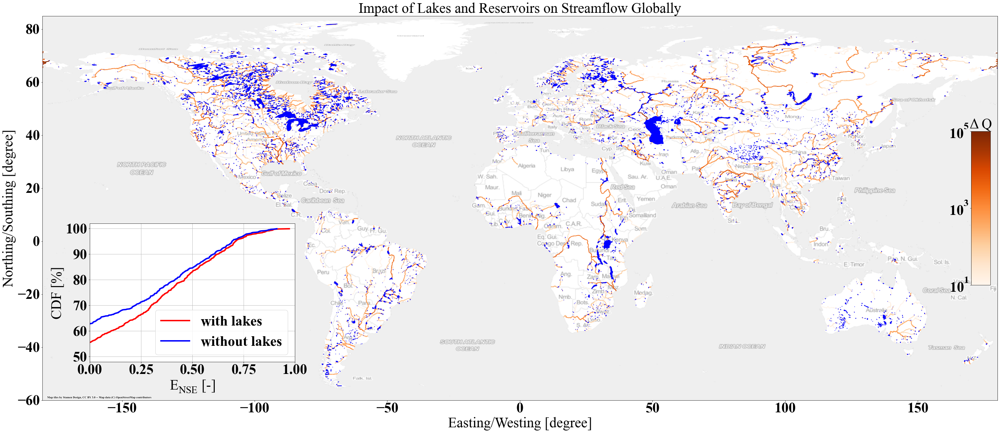

In [91]:
lakes_buffer = gpd.read_file('/Volumes/F:/hydrography/test/hydrolake_sub100km_final_buffer01.shp')
lakes = gpd.read_file('/Volumes/F:/hydrography/test/hydrolake_sub100km_final.shp')

#plotting
fig, ax = plt.subplots(figsize=(40,30))

ax.set_facecolor('white')
fig.patch.set_facecolor('white')

#shp_slice = shp [shp['obj']>0.01]
shp_slice = shp [shp['IRFroute_diff']>0.01]
shp_slice_intact = shp [shp['IRFroute_diff']<=0.01]

# shp_slice = shp_slice.to_crs(epsg=3857) # trasnforation for the basemap

A = shp_slice.plot (ax=ax, column='IRFroute_diff',
                    cmap='Oranges',
                    vmin=10 , vmax=100000 , linewidth=2,
                    norm=mpl.colors.LogNorm(vmin=10, vmax=100000),
                    zorder=10)#, legend = True)

#shp_slice_intact.plot (ax=ax, color='grey', zorder= 5, linewidth=0.1)


lakes_buffer.plot(ax = ax, zorder=10, color= 'blue', linewidth=3)

# add title and save
plt.title('Impact of Lakes and Reservoirs on Streamflow Globally', fontsize = 40)
plt.xlabel('Easting/Westing [degree]', fontsize = 40) #xlable which is long
plt.ylabel('Northing/Southing [degree]', fontsize = 40) #ylable which is lat

#
ax.axes.set_xlim([-180,180])
ax.axes.set_ylim([-60,85])

# add colorbar
cmap = plt.get_cmap('Oranges',100)
# norm = mpl.colors.Normalize(vmin=10,vmax=100000)
norm = mpl.colors.LogNorm(vmin=10,vmax=100000)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbaxes = inset_axes(ax, width="2%", height="40%", loc=7) # center left 6, lower center 8, right center 7
cbar = plt.colorbar(sm,\
                    cax=cbaxes)#,\
                    #ticks=[2,5])#,\
#                     orientation="horizontal")

#cbar.ax.set_yticklabels(['10', '100', '1000', '10000', '100000'], fontsize = 30)
#cbar.ax.set_yticklabels(fontsize = 30)
cbar.ax.yaxis.set_ticks_position('left')
cbar.ax.set_title(u'Δ Q', fontsize = 40)

# add basemap
ctx.add_basemap(ax,
                crs=shp_slice.crs,
                zoom=3,
                alpha = 0.4,
                source=ctx.providers.Stamen.TonerLite) # source=ctx.providers.Stamen.TonerLite



####
####
####
ax2 =fig.add_axes([0.1,0.3,0.2,0.18])


# number of improved stations with lakes:
improved = sum(NSE_o_with_lake_all>NSE_o_with_out_lake_all)
not_improved = sum(NSE_o_with_lake_all<=NSE_o_with_out_lake_all)

print(improved, not_improved)

print(improved/(improved+not_improved))
    
#
# cdf plots:
NSE_o_with_lake_all = np.where(np.isinf(NSE_o_with_lake_all), -100000, NSE_o_with_lake_all)
NSE_o_with_lake_all_sorted = np.sort(NSE_o_with_lake_all)


print(len(NSE_o_with_lake_all_sorted))
print(NSE_o_with_lake_all_sorted)
print(np.cumsum(NSE_o_with_lake_all_sorted))

# Compute the CDF
cdf = np.arange(len(NSE_o_with_lake_all_sorted)) / len(NSE_o_with_lake_all_sorted)

print(cdf)

ax2.plot(NSE_o_with_lake_all_sorted, cdf, label='with lakes', c='r', linewidth=4)

plt.xlim([0,1])
plt.xlabel('$\mathregular{E_{NSE}}$ [-]', fontsize = 40)

plt.ylim([0.48,1.02])
plt.yticks([0.5,0.6,0.7,0.8,0.9,1], [50,60,70,80,90,100])
plt.ylabel('CDF [%]', fontsize = 40)

plt.grid()

NSE_o_with_out_lake_all = np.where(np.isinf(NSE_o_with_out_lake_all), -100000, NSE_o_with_out_lake_all)
NSE_o_with_out_lake_all_sorted = np.sort(NSE_o_with_out_lake_all)

# Compute the CDF
cdf = np.arange(len(NSE_o_with_out_lake_all_sorted)) / len(NSE_o_with_out_lake_all_sorted)

ax2.plot(NSE_o_with_out_lake_all_sorted, cdf, label='without lakes', c='b', linewidth=4)

plt.legend(fontsize = 40)


# tight
plt.tight_layout()


if not os.path.isdir('../figure'):
    os.makedirs('../figure')

plt.savefig('../figure/figure_2.png',dpi = 200)
#plt.savefig('../figure/figure_2.pdf')